## Bidirectional LSTM model na predikciu hodnot DST o 5 hodin dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+5_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 13:06:58.850141: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 5
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32:48 6s/step - loss: 0.6720 - mae: 0.7426

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.5496 - mae: 0.6384 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - loss: 0.5462 - mae: 0.6178

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.5251 - mae: 0.5933

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.5563 - mae: 0.5913

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.5723 - mae: 0.5877

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5748 - mae: 0.5808

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5844 - mae: 0.5791

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5852 - mae: 0.5738

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5818 - mae: 0.5678

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5777 - mae: 0.5625

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.5740 - mae: 0.5580

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.5784 - mae: 0.5559

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.5800 - mae: 0.5533

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5814 - mae: 0.5512

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5828 - mae: 0.5495

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5830 - mae: 0.5476

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.5819 - mae: 0.5454

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.5816 - mae: 0.5438

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.5815 - mae: 0.5427

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.5841 - mae: 0.5421

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5856 - mae: 0.5413

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5862 - mae: 0.5402

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5861 - mae: 0.5389

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5858 - mae: 0.5376

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5849 - mae: 0.5361

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5837 - mae: 0.5347

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5821 - mae: 0.5331

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5803 - mae: 0.5315

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5783 - mae: 0.5299

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5763 - mae: 0.5284

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5740 - mae: 0.5268

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5714 - mae: 0.5251

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5691 - mae: 0.5234

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5671 - mae: 0.5219

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5674 - mae: 0.5209

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5674 - mae: 0.5198

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5671 - mae: 0.5187

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5671 - mae: 0.5176

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5668 - mae: 0.5166

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.5666 - mae: 0.5156

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5664 - mae: 0.5148

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5661 - mae: 0.5139

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5658 - mae: 0.5131

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5654 - mae: 0.5123

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5648 - mae: 0.5115

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5641 - mae: 0.5106

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5632 - mae: 0.5096

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5623 - mae: 0.5087

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5613 - mae: 0.5078

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5603 - mae: 0.5069

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5593 - mae: 0.5060

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5582 - mae: 0.5051

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5570 - mae: 0.5042

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5558 - mae: 0.5033

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5545 - mae: 0.5023

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5533 - mae: 0.5015

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.5520 - mae: 0.5006

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5507 - mae: 0.4997 

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5493 - mae: 0.4988

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5480 - mae: 0.4979

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5467 - mae: 0.4971

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5455 - mae: 0.4963

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5443 - mae: 0.4956

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5431 - mae: 0.4948

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.5419 - mae: 0.4941

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5406 - mae: 0.4933

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5393 - mae: 0.4926

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5380 - mae: 0.4918

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5367 - mae: 0.4910

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5354 - mae: 0.4903

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5342 - mae: 0.4897

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5331 - mae: 0.4890

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5319 - mae: 0.4883

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5307 - mae: 0.4877

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5296 - mae: 0.4871

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5286 - mae: 0.4865

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5275 - mae: 0.4859

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5264 - mae: 0.4853

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5254 - mae: 0.4848

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5244 - mae: 0.4842

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5236 - mae: 0.4837

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5227 - mae: 0.4832

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5218 - mae: 0.4827

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5208 - mae: 0.4822

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5199 - mae: 0.4817

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5189 - mae: 0.4812

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5180 - mae: 0.4807

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5170 - mae: 0.4802

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5162 - mae: 0.4796

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5153 - mae: 0.4791

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5143 - mae: 0.4786

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5134 - mae: 0.4781

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.5125 - mae: 0.4776

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5116 - mae: 0.4771

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5106 - mae: 0.4766

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5097 - mae: 0.4761

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5088 - mae: 0.4756

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5079 - mae: 0.4751

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5069 - mae: 0.4746

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5060 - mae: 0.4741

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5051 - mae: 0.4736

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5041 - mae: 0.4731

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5032 - mae: 0.4726

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5023 - mae: 0.4721

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.5014 - mae: 0.4716

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.5005 - mae: 0.4712

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4996 - mae: 0.4707

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4987 - mae: 0.4702

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4978 - mae: 0.4698

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4970 - mae: 0.4693

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4961 - mae: 0.4689

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4952 - mae: 0.4684

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4943 - mae: 0.4680

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4935 - mae: 0.4676

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4926 - mae: 0.4671

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4917 - mae: 0.4667

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.4909 - mae: 0.4663

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4900 - mae: 0.4658

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4891 - mae: 0.4654

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4883 - mae: 0.4650

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4874 - mae: 0.4646

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4866 - mae: 0.4641

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4857 - mae: 0.4637

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4851 - mae: 0.4633

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4844 - mae: 0.4630

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4837 - mae: 0.4626

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4831 - mae: 0.4622

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4824 - mae: 0.4619

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4818 - mae: 0.4616

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.4812 - mae: 0.4612

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4806 - mae: 0.4609

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4799 - mae: 0.4606

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4793 - mae: 0.4603

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4787 - mae: 0.4599

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4781 - mae: 0.4596

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4776 - mae: 0.4594

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4773 - mae: 0.4591

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4769 - mae: 0.4588

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4765 - mae: 0.4586

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4761 - mae: 0.4583

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4758 - mae: 0.4581

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4755 - mae: 0.4579

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4753 - mae: 0.4577

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.4750 - mae: 0.4574

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4747 - mae: 0.4572

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4744 - mae: 0.4570

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4741 - mae: 0.4568

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4739 - mae: 0.4566

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4736 - mae: 0.4564

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4734 - mae: 0.4562

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4731 - mae: 0.4560

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4729 - mae: 0.4558

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4726 - mae: 0.4556

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4724 - mae: 0.4554

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4721 - mae: 0.4553

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4719 - mae: 0.4551

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.4716 - mae: 0.4549

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4714 - mae: 0.4547

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4711 - mae: 0.4545

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4708 - mae: 0.4543

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4706 - mae: 0.4541

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4703 - mae: 0.4540

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4700 - mae: 0.4538

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4697 - mae: 0.4536

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4695 - mae: 0.4534

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4692 - mae: 0.4532

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4689 - mae: 0.4530

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4686 - mae: 0.4529

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4683 - mae: 0.4527

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4681 - mae: 0.4525

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4680 - mae: 0.4524

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.4679 - mae: 0.4522

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4677 - mae: 0.4521

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4676 - mae: 0.4519

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4675 - mae: 0.4518

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4674 - mae: 0.4517

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4673 - mae: 0.4515

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4671 - mae: 0.4514

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4670 - mae: 0.4513

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.4669 - mae: 0.4511

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4668 - mae: 0.4510

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4666 - mae: 0.4509

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4665 - mae: 0.4507

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4664 - mae: 0.4506

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4663 - mae: 0.4505

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4662 - mae: 0.4504

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4661 - mae: 0.4503

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4660 - mae: 0.4502

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4659 - mae: 0.4501

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4658 - mae: 0.4500

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4657 - mae: 0.4499

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4656 - mae: 0.4498

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4656 - mae: 0.4497

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4655 - mae: 0.4496

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4654 - mae: 0.4495

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4653 - mae: 0.4494

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4652 - mae: 0.4493

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4651 - mae: 0.4492

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4650 - mae: 0.4491

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4649 - mae: 0.4490

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4648 - mae: 0.4489

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4647 - mae: 0.4488

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4646 - mae: 0.4487

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4645 - mae: 0.4486

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4644 - mae: 0.4485

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4642 - mae: 0.4484

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4641 - mae: 0.4483

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4640 - mae: 0.4482

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4638 - mae: 0.4480

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4637 - mae: 0.4479

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4636 - mae: 0.4478

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4634 - mae: 0.4477

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4633 - mae: 0.4476

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4631 - mae: 0.4475

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.4630 - mae: 0.4474

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4628 - mae: 0.4473

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4627 - mae: 0.4471

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4625 - mae: 0.4470

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4624 - mae: 0.4469

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4622 - mae: 0.4468

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4621 - mae: 0.4467

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4619 - mae: 0.4466

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4618 - mae: 0.4465

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4617 - mae: 0.4464

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4616 - mae: 0.4463

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4614 - mae: 0.4462

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4613 - mae: 0.4461

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.4612 - mae: 0.4460

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.4611 - mae: 0.4459

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.4610 - mae: 0.4458

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.4609 - mae: 0.4457

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.4608 - mae: 0.4456

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.4607 - mae: 0.4455

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.4606 - mae: 0.4454

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4605 - mae: 0.4453

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4604 - mae: 0.4452

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4603 - mae: 0.4451

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4602 - mae: 0.4450

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4601 - mae: 0.4449

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4600 - mae: 0.4448

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4599 - mae: 0.4447

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4598 - mae: 0.4446

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4597 - mae: 0.4446

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4596 - mae: 0.4445

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4595 - mae: 0.4444

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4594 - mae: 0.4443

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4594 - mae: 0.4442

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4593 - mae: 0.4441

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4592 - mae: 0.4440

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4591 - mae: 0.4440

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4590 - mae: 0.4439

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4589 - mae: 0.4438

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4588 - mae: 0.4437

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4587 - mae: 0.4436

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4586 - mae: 0.4435

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4585 - mae: 0.4434

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4584 - mae: 0.4434

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4583 - mae: 0.4433

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4582 - mae: 0.4432

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4581 - mae: 0.4431

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4580 - mae: 0.4430

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4579 - mae: 0.4429

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4578 - mae: 0.4429

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4577 - mae: 0.4428

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4576 - mae: 0.4427

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4575 - mae: 0.4426

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4573 - mae: 0.4425

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4572 - mae: 0.4424

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4571 - mae: 0.4423

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4570 - mae: 0.4422

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4569 - mae: 0.4422

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4567 - mae: 0.4421

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4566 - mae: 0.4420

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4565 - mae: 0.4419

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4564 - mae: 0.4418

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4562 - mae: 0.4417

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4561 - mae: 0.4416

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4560 - mae: 0.4415

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4559 - mae: 0.4414

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4557 - mae: 0.4413

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4556 - mae: 0.4412

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4555 - mae: 0.4411

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4553 - mae: 0.4411

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4552 - mae: 0.4410

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4550 - mae: 0.4409

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4549 - mae: 0.4408

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4548 - mae: 0.4407

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4547 - mae: 0.4406

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4545 - mae: 0.4405

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4544 - mae: 0.4404

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4544 - mae: 0.4404

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4543 - mae: 0.4403

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4542 - mae: 0.4402

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4541 - mae: 0.4401

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4540 - mae: 0.4401

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4539 - mae: 0.4400

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4538 - mae: 0.4399

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4537 - mae: 0.4398

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4536 - mae: 0.4398

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4535 - mae: 0.4397

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4535 - mae: 0.4396

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4534 - mae: 0.4395

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4533 - mae: 0.4395

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4532 - mae: 0.4394

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4531 - mae: 0.4393

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4530 - mae: 0.4393

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4529 - mae: 0.4392

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4528 - mae: 0.4391

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4527 - mae: 0.4391

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4526 - mae: 0.4390

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4525 - mae: 0.4389

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4524 - mae: 0.4388

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4523 - mae: 0.4388

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4522 - mae: 0.4387

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4521 - mae: 0.4386

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4521 - mae: 0.4386

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4520 - mae: 0.4385

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4519 - mae: 0.4384

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4518 - mae: 0.4384

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4517 - mae: 0.4383

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4516 - mae: 0.4382

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4515 - mae: 0.4382

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4514 - mae: 0.4381

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4513 - mae: 0.4380

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4512 - mae: 0.4380

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4511 - mae: 0.4379

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4511 - mae: 0.4378

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4510 - mae: 0.4378

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4509 - mae: 0.4377

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4508 - mae: 0.4376

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4507 - mae: 0.4376

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4506 - mae: 0.4375

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4505 - mae: 0.4374

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4504 - mae: 0.4374

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4503 - mae: 0.4373

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4502 - mae: 0.4372

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4501 - mae: 0.4372

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4500 - mae: 0.4371

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4499 - mae: 0.4370

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4498 - mae: 0.4370

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4497 - mae: 0.4369

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4496 - mae: 0.4368

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4496 - mae: 0.4368

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4495 - mae: 0.4367

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4494 - mae: 0.4366

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4493 - mae: 0.4365

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4492 - mae: 0.4365

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4491 - mae: 0.4364

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4490 - mae: 0.4363

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4489 - mae: 0.4363

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4488 - mae: 0.4362

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4487 - mae: 0.4361

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4486 - mae: 0.4361

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4485 - mae: 0.4360

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4484 - mae: 0.4359

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4483 - mae: 0.4359

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4482 - mae: 0.4358

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4480 - mae: 0.4357

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4479 - mae: 0.4357

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4478 - mae: 0.4356

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4477 - mae: 0.4355

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4476 - mae: 0.4355

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4475 - mae: 0.4354

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4474 - mae: 0.4353

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4473 - mae: 0.4353

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4472 - mae: 0.4352

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4471 - mae: 0.4352

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4470 - mae: 0.4351

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4469 - mae: 0.4350

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4468 - mae: 0.4350

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4467 - mae: 0.4349

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4466 - mae: 0.4348

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4465 - mae: 0.4348

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4464 - mae: 0.4347

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4463 - mae: 0.4346

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4462 - mae: 0.4346

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4461 - mae: 0.4345

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4460 - mae: 0.4344

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4459 - mae: 0.4344

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4458 - mae: 0.4343

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4457 - mae: 0.4343

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4456 - mae: 0.4342

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4455 - mae: 0.4341

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4454 - mae: 0.4341

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4452 - mae: 0.4340

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4451 - mae: 0.4339

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4450 - mae: 0.4339

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4449 - mae: 0.4338

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4448 - mae: 0.4337

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4447 - mae: 0.4337

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4446 - mae: 0.4336

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4445 - mae: 0.4335

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4444 - mae: 0.4335

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4442 - mae: 0.4334

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4441 - mae: 0.4334

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4440 - mae: 0.4333

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4439 - mae: 0.4332

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4438 - mae: 0.4332

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4437 - mae: 0.4331

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4436 - mae: 0.4330

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4434 - mae: 0.4330

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4433 - mae: 0.4329

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4432 - mae: 0.4328

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4431 - mae: 0.4328

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4430 - mae: 0.4327

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4428 - mae: 0.4326

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4427 - mae: 0.4326

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4426 - mae: 0.4325

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4425 - mae: 0.4324

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4424 - mae: 0.4324

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4422 - mae: 0.4323

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.4421 - mae: 0.4322

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4420 - mae: 0.4322

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4419 - mae: 0.4321

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4418 - mae: 0.4320

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4416 - mae: 0.4320

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4415 - mae: 0.4319

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4414 - mae: 0.4318

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4413 - mae: 0.4318

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4412 - mae: 0.4317

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4410 - mae: 0.4316

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4409 - mae: 0.4316

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4408 - mae: 0.4315

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4407 - mae: 0.4315

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4406 - mae: 0.4314

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4405 - mae: 0.4313

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.4403 - mae: 0.4313

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4402 - mae: 0.4312

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4401 - mae: 0.4311

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4400 - mae: 0.4311

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4399 - mae: 0.4310

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4397 - mae: 0.4309

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4396 - mae: 0.4309

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4395 - mae: 0.4308

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4394 - mae: 0.4307

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4393 - mae: 0.4307

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4392 - mae: 0.4306

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4390 - mae: 0.4306

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4389 - mae: 0.4305

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4388 - mae: 0.4304

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4387 - mae: 0.4304

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.4386 - mae: 0.4303

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4384 - mae: 0.4302

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4383 - mae: 0.4302

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4382 - mae: 0.4301

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4381 - mae: 0.4300

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4380 - mae: 0.4300

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4378 - mae: 0.4299

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4377 - mae: 0.4298

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4376 - mae: 0.4298

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4375 - mae: 0.4297

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4373 - mae: 0.4297

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4372 - mae: 0.4296

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4371 - mae: 0.4295

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4370 - mae: 0.4295

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.4369 - mae: 0.4294

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4367 - mae: 0.4293

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4366 - mae: 0.4293

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4365 - mae: 0.4292

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4364 - mae: 0.4291

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4363 - mae: 0.4291

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4361 - mae: 0.4290

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4360 - mae: 0.4290

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4359 - mae: 0.4289

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4358 - mae: 0.4288

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4357 - mae: 0.4288

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4356 - mae: 0.4287

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4355 - mae: 0.4287

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4353 - mae: 0.4286

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4352 - mae: 0.4285

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.4351 - mae: 0.4285

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4350 - mae: 0.4284

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4349 - mae: 0.4284

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4348 - mae: 0.4283

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4347 - mae: 0.4283

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4346 - mae: 0.4282

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4345 - mae: 0.4281

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4344 - mae: 0.4281

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4343 - mae: 0.4280

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4341 - mae: 0.4280

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4340 - mae: 0.4279

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4339 - mae: 0.4279

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4338 - mae: 0.4278

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4337 - mae: 0.4277

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4336 - mae: 0.4277

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.4335 - mae: 0.4276

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4334 - mae: 0.4276

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4333 - mae: 0.4275

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4332 - mae: 0.4275

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4331 - mae: 0.4274

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4330 - mae: 0.4274

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4329 - mae: 0.4273

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4328 - mae: 0.4273

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4327 - mae: 0.4272

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4326 - mae: 0.4271

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4325 - mae: 0.4271

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4324 - mae: 0.4270

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4323 - mae: 0.4270

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4322 - mae: 0.4269

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4321 - mae: 0.4269

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4320 - mae: 0.4268

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4319 - mae: 0.4268

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4318 - mae: 0.4267

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4317 - mae: 0.4267

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4316 - mae: 0.4266

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4315 - mae: 0.4266

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4314 - mae: 0.4265

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.4313 - mae: 0.4264

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.4312 - mae: 0.4264

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.4311 - mae: 0.4263

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.4310 - mae: 0.4263

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4309 - mae: 0.4262

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4307 - mae: 0.4262

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4306 - mae: 0.4261

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4305 - mae: 0.4261

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4304 - mae: 0.4260

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4303 - mae: 0.4260

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4302 - mae: 0.4259

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4302 - mae: 0.4259

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4301 - mae: 0.4258

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4300 - mae: 0.4258

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4299 - mae: 0.4257

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4298 - mae: 0.4257

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4297 - mae: 0.4256

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4296 - mae: 0.4256

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4295 - mae: 0.4255

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4294 - mae: 0.4255

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4293 - mae: 0.4254

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4292 - mae: 0.4254

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.4291 - mae: 0.4253

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4290 - mae: 0.4253

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4289 - mae: 0.4252

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4288 - mae: 0.4252

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4287 - mae: 0.4251

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4286 - mae: 0.4251

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4285 - mae: 0.4250

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4284 - mae: 0.4250

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4283 - mae: 0.4249

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4282 - mae: 0.4249

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4281 - mae: 0.4248

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4281 - mae: 0.4248

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4280 - mae: 0.4247

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4279 - mae: 0.4247

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.4278 - mae: 0.4246

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4277 - mae: 0.4246

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4276 - mae: 0.4245

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4275 - mae: 0.4245

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4274 - mae: 0.4244

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4273 - mae: 0.4244

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4272 - mae: 0.4243

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4271 - mae: 0.4243

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4270 - mae: 0.4242

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4270 - mae: 0.4242

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4269 - mae: 0.4241

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4268 - mae: 0.4241

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4267 - mae: 0.4240

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4266 - mae: 0.4240

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4265 - mae: 0.4239

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4264 - mae: 0.4239

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.4263 - mae: 0.4238

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4262 - mae: 0.4238

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4261 - mae: 0.4238

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4260 - mae: 0.4237

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4259 - mae: 0.4237

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4258 - mae: 0.4236

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4257 - mae: 0.4236

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4256 - mae: 0.4235

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4256 - mae: 0.4235

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4255 - mae: 0.4234

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4254 - mae: 0.4234

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4253 - mae: 0.4233

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4252 - mae: 0.4233

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4251 - mae: 0.4232

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4250 - mae: 0.4232

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.4249 - mae: 0.4232

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4249 - mae: 0.4231

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4248 - mae: 0.4231

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4247 - mae: 0.4230

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4246 - mae: 0.4230

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4245 - mae: 0.4229

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4244 - mae: 0.4229

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4244 - mae: 0.4229

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4243 - mae: 0.4228

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4242 - mae: 0.4228

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4241 - mae: 0.4227

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4240 - mae: 0.4227

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4239 - mae: 0.4226

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4239 - mae: 0.4226

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.4238 - mae: 0.4226

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4237 - mae: 0.4225

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4236 - mae: 0.4225

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4236 - mae: 0.4224

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4235 - mae: 0.4224

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4234 - mae: 0.4224

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4234 - mae: 0.4223

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4233 - mae: 0.4223

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4232 - mae: 0.4222

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4232 - mae: 0.4222

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4231 - mae: 0.4222

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4230 - mae: 0.4221

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4230 - mae: 0.4221

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4229 - mae: 0.4221

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4229 - mae: 0.4220

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.4228 - mae: 0.4220

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4228 - mae: 0.4220

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4227 - mae: 0.4219

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4227 - mae: 0.4219

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4226 - mae: 0.4219

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4226 - mae: 0.4218

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4225 - mae: 0.4218

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4225 - mae: 0.4218

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4225 - mae: 0.4217

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4224 - mae: 0.4217

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4224 - mae: 0.4217

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4223 - mae: 0.4216

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4223 - mae: 0.4216

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4223 - mae: 0.4216

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4222 - mae: 0.4215

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.4222 - mae: 0.4215

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4221 - mae: 0.4215

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4221 - mae: 0.4214

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4220 - mae: 0.4214

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4220 - mae: 0.4214

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4220 - mae: 0.4213

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4219 - mae: 0.4213

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4219 - mae: 0.4213

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4218 - mae: 0.4212

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4218 - mae: 0.4212

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4218 - mae: 0.4212

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4217 - mae: 0.4211

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4217 - mae: 0.4211

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4216 - mae: 0.4211

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.4216 - mae: 0.4210

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4216 - mae: 0.4210

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4215 - mae: 0.4210

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4215 - mae: 0.4210

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4214 - mae: 0.4209

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4214 - mae: 0.4209

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4213 - mae: 0.4209

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4213 - mae: 0.4208

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4213 - mae: 0.4208

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4212 - mae: 0.4208

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4212 - mae: 0.4207

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4211 - mae: 0.4207

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4211 - mae: 0.4207

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4211 - mae: 0.4206

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4210 - mae: 0.4206

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.4210 - mae: 0.4206

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4209 - mae: 0.4205

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4209 - mae: 0.4205

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4209 - mae: 0.4205

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4208 - mae: 0.4204

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4208 - mae: 0.4204

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4207 - mae: 0.4204

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4207 - mae: 0.4203

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4206 - mae: 0.4203

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4206 - mae: 0.4203

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4205 - mae: 0.4203

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4205 - mae: 0.4202

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4205 - mae: 0.4202

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4204 - mae: 0.4202

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.4204 - mae: 0.4201

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4203 - mae: 0.4201

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4203 - mae: 0.4201

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4202 - mae: 0.4200

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4202 - mae: 0.4200

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4201 - mae: 0.4200

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4201 - mae: 0.4199

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4200 - mae: 0.4199

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4200 - mae: 0.4199

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4200 - mae: 0.4198

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4199 - mae: 0.4198

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4199 - mae: 0.4198

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4198 - mae: 0.4197

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4198 - mae: 0.4197

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4197 - mae: 0.4197

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.4197 - mae: 0.4196

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4196 - mae: 0.4196

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4196 - mae: 0.4196

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4195 - mae: 0.4195

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4195 - mae: 0.4195

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4194 - mae: 0.4195

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4194 - mae: 0.4194

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4193 - mae: 0.4194

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4193 - mae: 0.4194

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4192 - mae: 0.4193

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4192 - mae: 0.4193

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4191 - mae: 0.4193

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4191 - mae: 0.4192

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4190 - mae: 0.4192

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.4190 - mae: 0.4192

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4189 - mae: 0.4191

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4189 - mae: 0.4191

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4188 - mae: 0.4191

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4188 - mae: 0.4190

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4187 - mae: 0.4190

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4187 - mae: 0.4190

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4186 - mae: 0.4189

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4186 - mae: 0.4189

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4185 - mae: 0.4189

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4185 - mae: 0.4188

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4184 - mae: 0.4188

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4184 - mae: 0.4188

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4184 - mae: 0.4187

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4183 - mae: 0.4187

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.4183 - mae: 0.4187

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4182 - mae: 0.4186

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4182 - mae: 0.4186

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4181 - mae: 0.4186

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4181 - mae: 0.4185

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4180 - mae: 0.4185

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4180 - mae: 0.4185

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4179 - mae: 0.4184

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4179 - mae: 0.4184

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4178 - mae: 0.4184

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4178 - mae: 0.4183

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4177 - mae: 0.4183

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4177 - mae: 0.4183

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4176 - mae: 0.4183

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.4176 - mae: 0.4182

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4175 - mae: 0.4182

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4175 - mae: 0.4182

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4174 - mae: 0.4181

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4174 - mae: 0.4181

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4173 - mae: 0.4181

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4173 - mae: 0.4180

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4172 - mae: 0.4180

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4172 - mae: 0.4180

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4171 - mae: 0.4179

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4171 - mae: 0.4179

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4170 - mae: 0.4179

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4169 - mae: 0.4178

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4169 - mae: 0.4178

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4168 - mae: 0.4178

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.4168 - mae: 0.4177

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4167 - mae: 0.4177

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4167 - mae: 0.4177

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4166 - mae: 0.4176

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4166 - mae: 0.4176

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4165 - mae: 0.4176

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4165 - mae: 0.4175

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4164 - mae: 0.4175

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4164 - mae: 0.4175

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4163 - mae: 0.4174

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4163 - mae: 0.4174

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4162 - mae: 0.4174

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4162 - mae: 0.4173

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4161 - mae: 0.4173

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.4161 - mae: 0.4173

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4160 - mae: 0.4172 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4160 - mae: 0.4172

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4159 - mae: 0.4172

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4158 - mae: 0.4171

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4158 - mae: 0.4171

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4157 - mae: 0.4171

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4157 - mae: 0.4171

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4156 - mae: 0.4170

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4156 - mae: 0.4170

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4155 - mae: 0.4170

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4155 - mae: 0.4169

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4154 - mae: 0.4169

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4154 - mae: 0.4169

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4153 - mae: 0.4168

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.4153 - mae: 0.4168

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4152 - mae: 0.4168

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4152 - mae: 0.4167

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4151 - mae: 0.4167

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4151 - mae: 0.4167

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4150 - mae: 0.4166

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4150 - mae: 0.4166

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4149 - mae: 0.4166

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4149 - mae: 0.4166

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4148 - mae: 0.4165

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4148 - mae: 0.4165

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4148 - mae: 0.4165

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4147 - mae: 0.4164

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4147 - mae: 0.4164

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.4146 - mae: 0.4164

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4146 - mae: 0.4163

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4145 - mae: 0.4163

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4145 - mae: 0.4163

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4144 - mae: 0.4163

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4144 - mae: 0.4162

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4143 - mae: 0.4162

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4143 - mae: 0.4162

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4143 - mae: 0.4161

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4142 - mae: 0.4161

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4142 - mae: 0.4161

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4141 - mae: 0.4160

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4141 - mae: 0.4160

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4140 - mae: 0.4160

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4140 - mae: 0.4159

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.4139 - mae: 0.4159

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4139 - mae: 0.4159

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4138 - mae: 0.4159

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4138 - mae: 0.4158

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4137 - mae: 0.4158

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4137 - mae: 0.4158

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4136 - mae: 0.4157

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4136 - mae: 0.4157

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4135 - mae: 0.4157

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4135 - mae: 0.4156

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4135 - mae: 0.4156

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4134 - mae: 0.4156

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4134 - mae: 0.4156

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4133 - mae: 0.4155

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.4133 - mae: 0.4155

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4132 - mae: 0.4155

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4132 - mae: 0.4154

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4131 - mae: 0.4154

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4131 - mae: 0.4154

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4130 - mae: 0.4153

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4130 - mae: 0.4153

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4129 - mae: 0.4153

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4129 - mae: 0.4153

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4128 - mae: 0.4152

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4128 - mae: 0.4152

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4127 - mae: 0.4152

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4127 - mae: 0.4151

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4126 - mae: 0.4151

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4126 - mae: 0.4151

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.4125 - mae: 0.4150

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4125 - mae: 0.4150

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4124 - mae: 0.4150

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4124 - mae: 0.4150

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4123 - mae: 0.4149

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4123 - mae: 0.4149

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4122 - mae: 0.4149

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4122 - mae: 0.4148

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4121 - mae: 0.4148

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4121 - mae: 0.4148

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4121 - mae: 0.4147

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4120 - mae: 0.4147

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4120 - mae: 0.4147

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4119 - mae: 0.4147

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.4119 - mae: 0.4146

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4118 - mae: 0.4146

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4118 - mae: 0.4146

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4117 - mae: 0.4145

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4117 - mae: 0.4145

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4116 - mae: 0.4145

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4116 - mae: 0.4145

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4116 - mae: 0.4144

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4115 - mae: 0.4144

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4115 - mae: 0.4144

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4114 - mae: 0.4143

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4114 - mae: 0.4143

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4113 - mae: 0.4143

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4113 - mae: 0.4143

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4112 - mae: 0.4142

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.4112 - mae: 0.4142

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4112 - mae: 0.4142

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4111 - mae: 0.4141

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4111 - mae: 0.4141

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4110 - mae: 0.4141

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4110 - mae: 0.4141

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4109 - mae: 0.4140

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4109 - mae: 0.4140

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4108 - mae: 0.4140

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4108 - mae: 0.4139

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4108 - mae: 0.4139

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4107 - mae: 0.4139

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4107 - mae: 0.4139

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4106 - mae: 0.4138

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.4106 - mae: 0.4138

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4105 - mae: 0.4138

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4105 - mae: 0.4137

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4104 - mae: 0.4137

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4104 - mae: 0.4137

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4103 - mae: 0.4137

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4103 - mae: 0.4136

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4103 - mae: 0.4136

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4102 - mae: 0.4136

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4102 - mae: 0.4136

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4101 - mae: 0.4135

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4101 - mae: 0.4135

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4100 - mae: 0.4135

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4100 - mae: 0.4134

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4099 - mae: 0.4134

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.4099 - mae: 0.4134

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4098 - mae: 0.4134

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4098 - mae: 0.4133

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4097 - mae: 0.4133

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4097 - mae: 0.4133

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4097 - mae: 0.4132

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4096 - mae: 0.4132

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4096 - mae: 0.4132

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4095 - mae: 0.4132

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4095 - mae: 0.4131

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4094 - mae: 0.4131

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4094 - mae: 0.4131

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4093 - mae: 0.4130

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4093 - mae: 0.4130

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4092 - mae: 0.4130

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.4092 - mae: 0.4130


Epoch 1: val_mae improved from inf to 0.42505, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 74s 76ms/step - loss: 0.4091 - mae: 0.4129 - val_loss: 0.5321 - val_mae: 0.4251


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.3369 - mae: 0.3690

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3051 - mae: 0.3580 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3886 - mae: 0.3697

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4110 - mae: 0.3715

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4131 - mae: 0.3705

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4080 - mae: 0.3689

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4003 - mae: 0.3670

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3918 - mae: 0.3652

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3844 - mae: 0.3644

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3786 - mae: 0.3645

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3723 - mae: 0.3639

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3665 - mae: 0.3631

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3609 - mae: 0.3622

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3573 - mae: 0.3623

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3536 - mae: 0.3622

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3496 - mae: 0.3618

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3457 - mae: 0.3613

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3427 - mae: 0.3612 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3396 - mae: 0.3608

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3367 - mae: 0.3605

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3341 - mae: 0.3602

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3313 - mae: 0.3597

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3290 - mae: 0.3594

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3268 - mae: 0.3591

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3245 - mae: 0.3587

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3224 - mae: 0.3584

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3202 - mae: 0.3579

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3181 - mae: 0.3574

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3163 - mae: 0.3570

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3150 - mae: 0.3568

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3142 - mae: 0.3570

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3134 - mae: 0.3571

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3126 - mae: 0.3572

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3118 - mae: 0.3573

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3110 - mae: 0.3574

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3102 - mae: 0.3575

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3093 - mae: 0.3574

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3085 - mae: 0.3575

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3077 - mae: 0.3575

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3070 - mae: 0.3576

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3062 - mae: 0.3576

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3055 - mae: 0.3577

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3049 - mae: 0.3578

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3042 - mae: 0.3579

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3037 - mae: 0.3580

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3031 - mae: 0.3581

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3025 - mae: 0.3582

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3031 - mae: 0.3585

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3036 - mae: 0.3589

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3041 - mae: 0.3592

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3046 - mae: 0.3595

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3050 - mae: 0.3598

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3053 - mae: 0.3601

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3056 - mae: 0.3603

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3060 - mae: 0.3606

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3064 - mae: 0.3609

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3066 - mae: 0.3612

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3069 - mae: 0.3614

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3071 - mae: 0.3616

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3072 - mae: 0.3618

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3073 - mae: 0.3620

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3074 - mae: 0.3621

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3075 - mae: 0.3623

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3075 - mae: 0.3624

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3075 - mae: 0.3625

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3076 - mae: 0.3627

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3077 - mae: 0.3628

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3077 - mae: 0.3629

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3077 - mae: 0.3630

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3077 - mae: 0.3631

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3076 - mae: 0.3631

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3076 - mae: 0.3632

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3075 - mae: 0.3633

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3074 - mae: 0.3634

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3073 - mae: 0.3634

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3072 - mae: 0.3635

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3071 - mae: 0.3635

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3070 - mae: 0.3636

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3069 - mae: 0.3636

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3068 - mae: 0.3636

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3066 - mae: 0.3637

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3065 - mae: 0.3637

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3063 - mae: 0.3637

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3061 - mae: 0.3637

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3060 - mae: 0.3637

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3059 - mae: 0.3637

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3058 - mae: 0.3638

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3056 - mae: 0.3638

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3055 - mae: 0.3637

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3053 - mae: 0.3637

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3051 - mae: 0.3637

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3049 - mae: 0.3636

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3047 - mae: 0.3636

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3045 - mae: 0.3636

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3043 - mae: 0.3635

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3042 - mae: 0.3635

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3040 - mae: 0.3635

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3039 - mae: 0.3635

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3037 - mae: 0.3635

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3036 - mae: 0.3635

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3035 - mae: 0.3635

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3033 - mae: 0.3635

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3032 - mae: 0.3635

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3031 - mae: 0.3635

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3030 - mae: 0.3635

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3030 - mae: 0.3635

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3029 - mae: 0.3636

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3029 - mae: 0.3636

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3028 - mae: 0.3636

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3028 - mae: 0.3636

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3027 - mae: 0.3636

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3027 - mae: 0.3637

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3027 - mae: 0.3637

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3027 - mae: 0.3637

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3026 - mae: 0.3637

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3026 - mae: 0.3637

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3025 - mae: 0.3637

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3025 - mae: 0.3637

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3024 - mae: 0.3637

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.3024 - mae: 0.3637

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3025 - mae: 0.3638

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3026 - mae: 0.3638

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3027 - mae: 0.3639

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3028 - mae: 0.3639

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3029 - mae: 0.3640

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3030 - mae: 0.3640

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3030 - mae: 0.3640

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3031 - mae: 0.3640

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3031 - mae: 0.3640

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3032 - mae: 0.3640

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3032 - mae: 0.3641

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3032 - mae: 0.3641

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3032 - mae: 0.3641

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3032 - mae: 0.3641

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.3032 - mae: 0.3641

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3032 - mae: 0.3641

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3032 - mae: 0.3641

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3032 - mae: 0.3641

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3033 - mae: 0.3641

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3033 - mae: 0.3641

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3033 - mae: 0.3641

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3034 - mae: 0.3641

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3035 - mae: 0.3641

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3036 - mae: 0.3641

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3037 - mae: 0.3642

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3038 - mae: 0.3642

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3038 - mae: 0.3642

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3039 - mae: 0.3642

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3040 - mae: 0.3642

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3040 - mae: 0.3642

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3041 - mae: 0.3642

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3041 - mae: 0.3642

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3042 - mae: 0.3642

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3042 - mae: 0.3642

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3043 - mae: 0.3642

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3043 - mae: 0.3642

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3044 - mae: 0.3643

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3044 - mae: 0.3643

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3045 - mae: 0.3643

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3046 - mae: 0.3643

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3046 - mae: 0.3643

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3046 - mae: 0.3643

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3047 - mae: 0.3643

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3047 - mae: 0.3643

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.3047 - mae: 0.3643

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3643

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3643

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3643

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3642

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3048 - mae: 0.3641

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3047 - mae: 0.3641

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3047 - mae: 0.3641

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.3047 - mae: 0.3641

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3047 - mae: 0.3640

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3047 - mae: 0.3640

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3046 - mae: 0.3640

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3046 - mae: 0.3640

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3046 - mae: 0.3639

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3045 - mae: 0.3639

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3045 - mae: 0.3639

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3045 - mae: 0.3639

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3044 - mae: 0.3638

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3044 - mae: 0.3638

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3044 - mae: 0.3638

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3043 - mae: 0.3638

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3043 - mae: 0.3637

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3043 - mae: 0.3637

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3042 - mae: 0.3637

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3042 - mae: 0.3637

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3042 - mae: 0.3637

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3042 - mae: 0.3636

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3041 - mae: 0.3636

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3041 - mae: 0.3636

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3041 - mae: 0.3636

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3040 - mae: 0.3636

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3040 - mae: 0.3636

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3040 - mae: 0.3636

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3040 - mae: 0.3635

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3039 - mae: 0.3635

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3039 - mae: 0.3635

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3039 - mae: 0.3635

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3038 - mae: 0.3635

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3038 - mae: 0.3635

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3038 - mae: 0.3634

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3037 - mae: 0.3634

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3037 - mae: 0.3634

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3036 - mae: 0.3634

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3036 - mae: 0.3634

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3036 - mae: 0.3634

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3035 - mae: 0.3634

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3035 - mae: 0.3633

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3035 - mae: 0.3633

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3035 - mae: 0.3633

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3035 - mae: 0.3633

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3035 - mae: 0.3633

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3035 - mae: 0.3633

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3034 - mae: 0.3633

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3034 - mae: 0.3633

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3034 - mae: 0.3633

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3034 - mae: 0.3633

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3033 - mae: 0.3633

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3032 - mae: 0.3633

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3032 - mae: 0.3633

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3032 - mae: 0.3633

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3632

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3632

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3632

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3031 - mae: 0.3632

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3632

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3632

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3032 - mae: 0.3633

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3033 - mae: 0.3633

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3633

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3634

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3033 - mae: 0.3634

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3034 - mae: 0.3634

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3034 - mae: 0.3634

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3034 - mae: 0.3634

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3034 - mae: 0.3634

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3034 - mae: 0.3634

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3034 - mae: 0.3634

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3034 - mae: 0.3634

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3634

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3635

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3635

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3635

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3035 - mae: 0.3635

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3035 - mae: 0.3635

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3035 - mae: 0.3635

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3035 - mae: 0.3635

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3035 - mae: 0.3635

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3034 - mae: 0.3634

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3033 - mae: 0.3634

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3033 - mae: 0.3634

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3033 - mae: 0.3634

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3033 - mae: 0.3634

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3033 - mae: 0.3634

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3033 - mae: 0.3634

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3033 - mae: 0.3634

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3634

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3634

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3634

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3634

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3633

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3633

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3633

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3032 - mae: 0.3633

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3031 - mae: 0.3633

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3031 - mae: 0.3633

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3031 - mae: 0.3633

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3031 - mae: 0.3633

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3031 - mae: 0.3633

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3031 - mae: 0.3633

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3030 - mae: 0.3633

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3030 - mae: 0.3633

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3030 - mae: 0.3633

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3030 - mae: 0.3633

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3030 - mae: 0.3633

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3029 - mae: 0.3633

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3029 - mae: 0.3632

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3029 - mae: 0.3632

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3029 - mae: 0.3632

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3028 - mae: 0.3632

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3028 - mae: 0.3632

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3028 - mae: 0.3632

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3028 - mae: 0.3632

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3027 - mae: 0.3632

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3027 - mae: 0.3632

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3027 - mae: 0.3632

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3027 - mae: 0.3632

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3026 - mae: 0.3631

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3026 - mae: 0.3631

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3026 - mae: 0.3631

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3025 - mae: 0.3631

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3025 - mae: 0.3631

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3025 - mae: 0.3631

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3025 - mae: 0.3631

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3024 - mae: 0.3631

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3024 - mae: 0.3631

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3024 - mae: 0.3630

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3024 - mae: 0.3630

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3023 - mae: 0.3630

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3023 - mae: 0.3630

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3023 - mae: 0.3630

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3023 - mae: 0.3630

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3022 - mae: 0.3630

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3022 - mae: 0.3630

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3022 - mae: 0.3630

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3022 - mae: 0.3630

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3021 - mae: 0.3629

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3021 - mae: 0.3629

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3021 - mae: 0.3629

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3021 - mae: 0.3629

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3020 - mae: 0.3629

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3020 - mae: 0.3629

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3020 - mae: 0.3629

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3019 - mae: 0.3629

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3019 - mae: 0.3629

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3019 - mae: 0.3629

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3019 - mae: 0.3628

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3018 - mae: 0.3628

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3018 - mae: 0.3628

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3018 - mae: 0.3628

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3018 - mae: 0.3628

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3017 - mae: 0.3628

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3017 - mae: 0.3628

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3017 - mae: 0.3628

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3017 - mae: 0.3628

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3016 - mae: 0.3628

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3016 - mae: 0.3628

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3016 - mae: 0.3628

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3016 - mae: 0.3627

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3015 - mae: 0.3627

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3015 - mae: 0.3627

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3015 - mae: 0.3627

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3014 - mae: 0.3627

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3014 - mae: 0.3627

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3014 - mae: 0.3627

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3014 - mae: 0.3627

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3013 - mae: 0.3627

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3013 - mae: 0.3627

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3013 - mae: 0.3626

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3013 - mae: 0.3626

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3012 - mae: 0.3626

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3012 - mae: 0.3626

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3012 - mae: 0.3626

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3012 - mae: 0.3626

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3011 - mae: 0.3626

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3011 - mae: 0.3626

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3011 - mae: 0.3626

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3011 - mae: 0.3626

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3010 - mae: 0.3626

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3010 - mae: 0.3625

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3010 - mae: 0.3625

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3009 - mae: 0.3625

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3009 - mae: 0.3625

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3009 - mae: 0.3625

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3008 - mae: 0.3625

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3008 - mae: 0.3625

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3008 - mae: 0.3625

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3008 - mae: 0.3625

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3007 - mae: 0.3624

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3007 - mae: 0.3624

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3007 - mae: 0.3624

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3006 - mae: 0.3624

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3006 - mae: 0.3624

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3006 - mae: 0.3624

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3005 - mae: 0.3624

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3005 - mae: 0.3624

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3005 - mae: 0.3623

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3004 - mae: 0.3623

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3004 - mae: 0.3623

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3004 - mae: 0.3623

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3003 - mae: 0.3623

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3003 - mae: 0.3623

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3003 - mae: 0.3623

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3002 - mae: 0.3623

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3002 - mae: 0.3622

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3002 - mae: 0.3622

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3001 - mae: 0.3622

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3001 - mae: 0.3622

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3001 - mae: 0.3622

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3000 - mae: 0.3622

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3000 - mae: 0.3622

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3000 - mae: 0.3622

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2999 - mae: 0.3621

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2999 - mae: 0.3621

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2998 - mae: 0.3621

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2998 - mae: 0.3621

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2998 - mae: 0.3621

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2997 - mae: 0.3621

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2997 - mae: 0.3621

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2997 - mae: 0.3620

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2996 - mae: 0.3620

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2996 - mae: 0.3620

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2996 - mae: 0.3620

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2995 - mae: 0.3620

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2995 - mae: 0.3620

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2995 - mae: 0.3620

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2994 - mae: 0.3619

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2994 - mae: 0.3619

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2994 - mae: 0.3619

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2993 - mae: 0.3619

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2993 - mae: 0.3619

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2993 - mae: 0.3619

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2992 - mae: 0.3619

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2992 - mae: 0.3618

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2992 - mae: 0.3618

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2991 - mae: 0.3618

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2991 - mae: 0.3618

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2991 - mae: 0.3618

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2990 - mae: 0.3618

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2990 - mae: 0.3618

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2990 - mae: 0.3617

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2989 - mae: 0.3617

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2989 - mae: 0.3617

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2989 - mae: 0.3617

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2988 - mae: 0.3617

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2988 - mae: 0.3617

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2988 - mae: 0.3617

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2988 - mae: 0.3617

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2987 - mae: 0.3616

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2987 - mae: 0.3616

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2987 - mae: 0.3616

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2986 - mae: 0.3616

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2986 - mae: 0.3616

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2986 - mae: 0.3616

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2985 - mae: 0.3616

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2985 - mae: 0.3615

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2985 - mae: 0.3615

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2984 - mae: 0.3615

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2984 - mae: 0.3615

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2984 - mae: 0.3615

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2984 - mae: 0.3615

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2983 - mae: 0.3615

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2983 - mae: 0.3615

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2983 - mae: 0.3614

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2983 - mae: 0.3614

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2982 - mae: 0.3614

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2982 - mae: 0.3614

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2982 - mae: 0.3614

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2982 - mae: 0.3614

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2981 - mae: 0.3614

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2981 - mae: 0.3614

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2981 - mae: 0.3613

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2981 - mae: 0.3613

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2980 - mae: 0.3613

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2980 - mae: 0.3613

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2980 - mae: 0.3613

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2980 - mae: 0.3613

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2980 - mae: 0.3613

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2979 - mae: 0.3613

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2979 - mae: 0.3613

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2979 - mae: 0.3612

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2979 - mae: 0.3612

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2978 - mae: 0.3612

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2978 - mae: 0.3612

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2978 - mae: 0.3612

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2978 - mae: 0.3612

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2978 - mae: 0.3612

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2977 - mae: 0.3612

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2977 - mae: 0.3612

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2977 - mae: 0.3611

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2977 - mae: 0.3611

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2977 - mae: 0.3611

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2977 - mae: 0.3611

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3611

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2976 - mae: 0.3610

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2975 - mae: 0.3610

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2975 - mae: 0.3610

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2975 - mae: 0.3610

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2975 - mae: 0.3610

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2975 - mae: 0.3610

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2975 - mae: 0.3610

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2975 - mae: 0.3610

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2974 - mae: 0.3610

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2974 - mae: 0.3609

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2974 - mae: 0.3609

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2974 - mae: 0.3609

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2974 - mae: 0.3609

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2974 - mae: 0.3609

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2973 - mae: 0.3609

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2973 - mae: 0.3609

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2973 - mae: 0.3609

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2973 - mae: 0.3608

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2973 - mae: 0.3608

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2972 - mae: 0.3608

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2972 - mae: 0.3608

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2972 - mae: 0.3608

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2972 - mae: 0.3608

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2971 - mae: 0.3608

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2971 - mae: 0.3607

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2971 - mae: 0.3607

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2971 - mae: 0.3607

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2971 - mae: 0.3607

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2970 - mae: 0.3607

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2970 - mae: 0.3607

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2970 - mae: 0.3607

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2970 - mae: 0.3606

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2969 - mae: 0.3606

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2969 - mae: 0.3606

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2969 - mae: 0.3606

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2969 - mae: 0.3606

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2968 - mae: 0.3606

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2968 - mae: 0.3605

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2968 - mae: 0.3605

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2968 - mae: 0.3605

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2967 - mae: 0.3605

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2967 - mae: 0.3605

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2967 - mae: 0.3605

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2967 - mae: 0.3604

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2966 - mae: 0.3604

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2966 - mae: 0.3604

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2966 - mae: 0.3604

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2966 - mae: 0.3604

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2965 - mae: 0.3604

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2965 - mae: 0.3603

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2965 - mae: 0.3603

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2964 - mae: 0.3603

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2964 - mae: 0.3603

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2964 - mae: 0.3603

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2964 - mae: 0.3603

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2963 - mae: 0.3602

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2963 - mae: 0.3602

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2963 - mae: 0.3602

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2963 - mae: 0.3602

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2962 - mae: 0.3602

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2962 - mae: 0.3602

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2962 - mae: 0.3601

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2962 - mae: 0.3601

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2962 - mae: 0.3601

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2961 - mae: 0.3601

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2961 - mae: 0.3601

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2961 - mae: 0.3601

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2961 - mae: 0.3600

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2961 - mae: 0.3600

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2960 - mae: 0.3600

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2960 - mae: 0.3600

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2960 - mae: 0.3600

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2960 - mae: 0.3600

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2960 - mae: 0.3600

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2960 - mae: 0.3599

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2959 - mae: 0.3599

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2959 - mae: 0.3599

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2959 - mae: 0.3599

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2959 - mae: 0.3599

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2959 - mae: 0.3599

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2959 - mae: 0.3599

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3599

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3598

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3597

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2958 - mae: 0.3597

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2958 - mae: 0.3597

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2958 - mae: 0.3597

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2958 - mae: 0.3597

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3597

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3597

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3597

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3597

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2957 - mae: 0.3596

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2957 - mae: 0.3596

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2957 - mae: 0.3596

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3595

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3594

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2956 - mae: 0.3594

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2956 - mae: 0.3594

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2956 - mae: 0.3594

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2956 - mae: 0.3594

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2956 - mae: 0.3594

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2956 - mae: 0.3594

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2955 - mae: 0.3594

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2955 - mae: 0.3594

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2955 - mae: 0.3594

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2955 - mae: 0.3593

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2955 - mae: 0.3593

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2955 - mae: 0.3593

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2955 - mae: 0.3593

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2955 - mae: 0.3592

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2955 - mae: 0.3592

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3592

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3591

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2954 - mae: 0.3591

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3591

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3590

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3590

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3590

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3590

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3590

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2954 - mae: 0.3590

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3590

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3590

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3590

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3590

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3590

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3590

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2953 - mae: 0.3589

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3589

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3589

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2953 - mae: 0.3588

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2952 - mae: 0.3588

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2952 - mae: 0.3588

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2952 - mae: 0.3587

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2952 - mae: 0.3587

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3587

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3586

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3586

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3586

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3586

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2952 - mae: 0.3586

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3586 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3586

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3586

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3586

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3586

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3586

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2952 - mae: 0.3585

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2951 - mae: 0.3585

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3585

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3585

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3585

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3585

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2951 - mae: 0.3584

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2951 - mae: 0.3584

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2951 - mae: 0.3584

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2950 - mae: 0.3583

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2950 - mae: 0.3582

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2949 - mae: 0.3582

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2949 - mae: 0.3582

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2949 - mae: 0.3582

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2949 - mae: 0.3582

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2949 - mae: 0.3582

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2949 - mae: 0.3581

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3581

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3580

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2949 - mae: 0.3580

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2949 - mae: 0.3580

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2948 - mae: 0.3580

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3580

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2948 - mae: 0.3579

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2949 - mae: 0.3579

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2949 - mae: 0.3579

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2949 - mae: 0.3579

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2949 - mae: 0.3579

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2950 - mae: 0.3579

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2950 - mae: 0.3579

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2950 - mae: 0.3578

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2950 - mae: 0.3578

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2950 - mae: 0.3578

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2951 - mae: 0.3578

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2951 - mae: 0.3578

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2951 - mae: 0.3578

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2951 - mae: 0.3578

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2951 - mae: 0.3578

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2951 - mae: 0.3578

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2952 - mae: 0.3577

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2952 - mae: 0.3577

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2952 - mae: 0.3577

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2952 - mae: 0.3577

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2952 - mae: 0.3577


Epoch 2: val_mae improved from 0.42505 to 0.40267, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2952 - mae: 0.3577 - val_loss: 0.4420 - val_mae: 0.4027


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1000 - mae: 0.2471

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1192 - mae: 0.2644 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1598 - mae: 0.2906

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3078 - mae: 0.3268

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3703 - mae: 0.3406

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4013 - mae: 0.3490

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4167 - mae: 0.3546

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4233 - mae: 0.3576

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4245 - mae: 0.3588

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4228 - mae: 0.3592

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4270 - mae: 0.3626

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4287 - mae: 0.3650

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4311 - mae: 0.3674

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4320 - mae: 0.3691

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4318 - mae: 0.3702

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4307 - mae: 0.3711

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4287 - mae: 0.3713

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4283 - mae: 0.3722

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4276 - mae: 0.3730

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4264 - mae: 0.3736

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4254 - mae: 0.3744

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4239 - mae: 0.3749

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4222 - mae: 0.3752

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4204 - mae: 0.3755 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4184 - mae: 0.3756

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4163 - mae: 0.3756

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4141 - mae: 0.3757

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4140 - mae: 0.3760

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4135 - mae: 0.3761

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4129 - mae: 0.3763

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4121 - mae: 0.3763

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4114 - mae: 0.3764

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4105 - mae: 0.3765

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4095 - mae: 0.3764

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4086 - mae: 0.3763

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4076 - mae: 0.3762

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4067 - mae: 0.3762

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4057 - mae: 0.3760

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4047 - mae: 0.3759

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4037 - mae: 0.3757

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4030 - mae: 0.3757

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4022 - mae: 0.3757

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4022 - mae: 0.3759

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4022 - mae: 0.3760

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4021 - mae: 0.3762

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4020 - mae: 0.3763

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4018 - mae: 0.3764

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.4015 - mae: 0.3764

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.4011 - mae: 0.3764

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4006 - mae: 0.3763

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.4001 - mae: 0.3763

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3995 - mae: 0.3762

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3988 - mae: 0.3761

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3981 - mae: 0.3759

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3974 - mae: 0.3758

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3967 - mae: 0.3757

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3959 - mae: 0.3755

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3952 - mae: 0.3754

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3945 - mae: 0.3752

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3937 - mae: 0.3751

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3930 - mae: 0.3749

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3922 - mae: 0.3748

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3915 - mae: 0.3746

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3907 - mae: 0.3745

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3899 - mae: 0.3743

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3890 - mae: 0.3741

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3882 - mae: 0.3739

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3876 - mae: 0.3738

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3869 - mae: 0.3737

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3861 - mae: 0.3735

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3854 - mae: 0.3734

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3847 - mae: 0.3732

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3839 - mae: 0.3730

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3832 - mae: 0.3728

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3824 - mae: 0.3727

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3817 - mae: 0.3725

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3809 - mae: 0.3723

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3801 - mae: 0.3721

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3793 - mae: 0.3719

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3785 - mae: 0.3717

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3777 - mae: 0.3715

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3769 - mae: 0.3713

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3762 - mae: 0.3711

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3754 - mae: 0.3709

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3746 - mae: 0.3707

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3738 - mae: 0.3704

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3730 - mae: 0.3702

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3723 - mae: 0.3700

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3715 - mae: 0.3698

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3707 - mae: 0.3696

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3700 - mae: 0.3694

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3693 - mae: 0.3692

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3686 - mae: 0.3690

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3678 - mae: 0.3688

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3671 - mae: 0.3686

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3664 - mae: 0.3684

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3657 - mae: 0.3682

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3650 - mae: 0.3680

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3643 - mae: 0.3678

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3636 - mae: 0.3676

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3629 - mae: 0.3674

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3623 - mae: 0.3673

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3617 - mae: 0.3671

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3612 - mae: 0.3669

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3606 - mae: 0.3668

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3601 - mae: 0.3667

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3596 - mae: 0.3666

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3591 - mae: 0.3664

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3586 - mae: 0.3663

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3581 - mae: 0.3662

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3576 - mae: 0.3661

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3572 - mae: 0.3660

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3567 - mae: 0.3659

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3563 - mae: 0.3658

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3558 - mae: 0.3657

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3554 - mae: 0.3656

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3550 - mae: 0.3656

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3545 - mae: 0.3655

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3541 - mae: 0.3654

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3536 - mae: 0.3653

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3532 - mae: 0.3652

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3528 - mae: 0.3651

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3523 - mae: 0.3650

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3519 - mae: 0.3649

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3515 - mae: 0.3649

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3511 - mae: 0.3648

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3507 - mae: 0.3647

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3503 - mae: 0.3646

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3499 - mae: 0.3645

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3495 - mae: 0.3645

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3491 - mae: 0.3644

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3487 - mae: 0.3643

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3483 - mae: 0.3642

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3479 - mae: 0.3642

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3475 - mae: 0.3641

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3472 - mae: 0.3640

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3468 - mae: 0.3639

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3464 - mae: 0.3638

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3460 - mae: 0.3637

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3456 - mae: 0.3637

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3452 - mae: 0.3636

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3449 - mae: 0.3635

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3445 - mae: 0.3634

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3441 - mae: 0.3633

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3438 - mae: 0.3632

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3434 - mae: 0.3632

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3431 - mae: 0.3631

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3427 - mae: 0.3630

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3424 - mae: 0.3629

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3421 - mae: 0.3628

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3417 - mae: 0.3627

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3414 - mae: 0.3626

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3411 - mae: 0.3626

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3407 - mae: 0.3625

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3404 - mae: 0.3624

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3401 - mae: 0.3623

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3397 - mae: 0.3622

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3394 - mae: 0.3621

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3391 - mae: 0.3621

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3388 - mae: 0.3620

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3385 - mae: 0.3619

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3382 - mae: 0.3618

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3378 - mae: 0.3617

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3376 - mae: 0.3616

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3373 - mae: 0.3616

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3370 - mae: 0.3615

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3367 - mae: 0.3614

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3365 - mae: 0.3614

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3362 - mae: 0.3613

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3359 - mae: 0.3612

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3356 - mae: 0.3612

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3354 - mae: 0.3611

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3351 - mae: 0.3610

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3348 - mae: 0.3609

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3345 - mae: 0.3609

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3342 - mae: 0.3608

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3340 - mae: 0.3607

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3337 - mae: 0.3607

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3334 - mae: 0.3606

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3331 - mae: 0.3605

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3329 - mae: 0.3604

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3326 - mae: 0.3604

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3323 - mae: 0.3603

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3321 - mae: 0.3602

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3318 - mae: 0.3601

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3315 - mae: 0.3600

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3313 - mae: 0.3600

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3310 - mae: 0.3599

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3307 - mae: 0.3598

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3305 - mae: 0.3598

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3302 - mae: 0.3597

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3300 - mae: 0.3596

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3298 - mae: 0.3596

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3295 - mae: 0.3595

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3293 - mae: 0.3595

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3290 - mae: 0.3594

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3288 - mae: 0.3593

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3286 - mae: 0.3593

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3283 - mae: 0.3592

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3281 - mae: 0.3592

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3279 - mae: 0.3591

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3276 - mae: 0.3590

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3274 - mae: 0.3590

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3272 - mae: 0.3589

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3269 - mae: 0.3589

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3267 - mae: 0.3588

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3265 - mae: 0.3587

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3263 - mae: 0.3587

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3261 - mae: 0.3586

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3258 - mae: 0.3586

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3256 - mae: 0.3585

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3254 - mae: 0.3585

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3252 - mae: 0.3584

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3250 - mae: 0.3583

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3248 - mae: 0.3583

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3246 - mae: 0.3582

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3244 - mae: 0.3582

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3242 - mae: 0.3581

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3240 - mae: 0.3581

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3238 - mae: 0.3580

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3236 - mae: 0.3580

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3234 - mae: 0.3579

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3232 - mae: 0.3578

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3230 - mae: 0.3578

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3228 - mae: 0.3577

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3226 - mae: 0.3577

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3224 - mae: 0.3576

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.3222 - mae: 0.3576

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3220 - mae: 0.3575

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3218 - mae: 0.3574

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3216 - mae: 0.3574

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3214 - mae: 0.3573

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3212 - mae: 0.3573

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3210 - mae: 0.3572

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3208 - mae: 0.3572

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3206 - mae: 0.3571

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3204 - mae: 0.3570

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3202 - mae: 0.3570

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3200 - mae: 0.3569

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3198 - mae: 0.3569

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3196 - mae: 0.3568

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3194 - mae: 0.3568

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3192 - mae: 0.3567

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.3190 - mae: 0.3566

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3188 - mae: 0.3566

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3186 - mae: 0.3565

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3185 - mae: 0.3565

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3183 - mae: 0.3564

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3181 - mae: 0.3564

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3179 - mae: 0.3563

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3177 - mae: 0.3562

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3175 - mae: 0.3562

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3173 - mae: 0.3561

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3172 - mae: 0.3561

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3170 - mae: 0.3560

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3168 - mae: 0.3560

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3166 - mae: 0.3559

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.3164 - mae: 0.3559

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3162 - mae: 0.3558

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3160 - mae: 0.3557

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3159 - mae: 0.3557

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3157 - mae: 0.3556

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3155 - mae: 0.3556

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3153 - mae: 0.3555

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3151 - mae: 0.3555

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3150 - mae: 0.3554

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3148 - mae: 0.3554

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3146 - mae: 0.3553

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3145 - mae: 0.3552

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3143 - mae: 0.3552

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3141 - mae: 0.3551

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3140 - mae: 0.3551

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.3138 - mae: 0.3550

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3137 - mae: 0.3550

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3136 - mae: 0.3549

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3134 - mae: 0.3549

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3133 - mae: 0.3549

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3131 - mae: 0.3548

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3130 - mae: 0.3548

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3128 - mae: 0.3547

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3127 - mae: 0.3547

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3126 - mae: 0.3546

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3124 - mae: 0.3546

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3123 - mae: 0.3545

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3121 - mae: 0.3545

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3120 - mae: 0.3544

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.3118 - mae: 0.3544

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3117 - mae: 0.3543

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3116 - mae: 0.3543

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3114 - mae: 0.3542

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3113 - mae: 0.3542

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3112 - mae: 0.3542

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3110 - mae: 0.3541

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3109 - mae: 0.3541

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3107 - mae: 0.3540

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3106 - mae: 0.3540

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3105 - mae: 0.3539

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3103 - mae: 0.3539

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3102 - mae: 0.3538

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.3100 - mae: 0.3538

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3099 - mae: 0.3537

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3098 - mae: 0.3537

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3096 - mae: 0.3537

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3095 - mae: 0.3536

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3093 - mae: 0.3536

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3092 - mae: 0.3535

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3091 - mae: 0.3535

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3089 - mae: 0.3534

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3088 - mae: 0.3534

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3087 - mae: 0.3533

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3085 - mae: 0.3533

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3084 - mae: 0.3532

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.3083 - mae: 0.3532

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3081 - mae: 0.3531

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3080 - mae: 0.3531

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3079 - mae: 0.3531

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3077 - mae: 0.3530

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3076 - mae: 0.3530

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3075 - mae: 0.3529

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.3074 - mae: 0.3529

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3072 - mae: 0.3528

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3071 - mae: 0.3528

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3070 - mae: 0.3527

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3068 - mae: 0.3527

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3067 - mae: 0.3526

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3066 - mae: 0.3526

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3065 - mae: 0.3526

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3063 - mae: 0.3525

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3062 - mae: 0.3525

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3061 - mae: 0.3524

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3060 - mae: 0.3524

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3058 - mae: 0.3523

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3057 - mae: 0.3523

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3056 - mae: 0.3523

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3055 - mae: 0.3522

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3054 - mae: 0.3522

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3052 - mae: 0.3521

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.3051 - mae: 0.3521

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3050 - mae: 0.3520

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3049 - mae: 0.3520

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3047 - mae: 0.3520

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3046 - mae: 0.3519

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3045 - mae: 0.3519

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3044 - mae: 0.3518

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3043 - mae: 0.3518

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3042 - mae: 0.3518

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3041 - mae: 0.3517

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3040 - mae: 0.3517

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3038 - mae: 0.3516

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3037 - mae: 0.3516

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3036 - mae: 0.3516

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.3035 - mae: 0.3515

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3034 - mae: 0.3515

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3033 - mae: 0.3515

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3032 - mae: 0.3514

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3031 - mae: 0.3514

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3030 - mae: 0.3513

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3029 - mae: 0.3513

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3028 - mae: 0.3513

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3027 - mae: 0.3512

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3026 - mae: 0.3512

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3025 - mae: 0.3512

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3024 - mae: 0.3511

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3023 - mae: 0.3511

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.3022 - mae: 0.3511

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3021 - mae: 0.3510

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3020 - mae: 0.3510

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3019 - mae: 0.3510

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3018 - mae: 0.3509

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3017 - mae: 0.3509

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3016 - mae: 0.3509

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3015 - mae: 0.3508

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3014 - mae: 0.3508

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3013 - mae: 0.3508

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3012 - mae: 0.3507

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3011 - mae: 0.3507

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3010 - mae: 0.3507

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.3009 - mae: 0.3507

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3008 - mae: 0.3506

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3007 - mae: 0.3506

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3007 - mae: 0.3506

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3006 - mae: 0.3505

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3005 - mae: 0.3505

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3004 - mae: 0.3505

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3003 - mae: 0.3504

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3002 - mae: 0.3504

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3001 - mae: 0.3504

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.3000 - mae: 0.3503

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2999 - mae: 0.3503

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2998 - mae: 0.3503

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2998 - mae: 0.3503

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2997 - mae: 0.3502

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2996 - mae: 0.3502

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2995 - mae: 0.3502

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2994 - mae: 0.3501

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2993 - mae: 0.3501

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2992 - mae: 0.3501

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2992 - mae: 0.3501

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2991 - mae: 0.3500

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2990 - mae: 0.3500

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2989 - mae: 0.3500

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2988 - mae: 0.3499

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2988 - mae: 0.3499

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2987 - mae: 0.3499

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2986 - mae: 0.3499

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2985 - mae: 0.3498

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2985 - mae: 0.3498

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2984 - mae: 0.3498

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2983 - mae: 0.3498

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2982 - mae: 0.3497

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2982 - mae: 0.3497

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2981 - mae: 0.3497

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2980 - mae: 0.3497

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2980 - mae: 0.3496

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2979 - mae: 0.3496

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2978 - mae: 0.3496

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2977 - mae: 0.3496

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2977 - mae: 0.3495

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2976 - mae: 0.3495

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2975 - mae: 0.3495

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2975 - mae: 0.3495

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2974 - mae: 0.3494

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2973 - mae: 0.3494

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2972 - mae: 0.3494

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2972 - mae: 0.3494

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2971 - mae: 0.3493

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2970 - mae: 0.3493

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2969 - mae: 0.3493

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2969 - mae: 0.3493

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2968 - mae: 0.3492

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2967 - mae: 0.3492

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2967 - mae: 0.3492

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2966 - mae: 0.3492

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2965 - mae: 0.3491

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2965 - mae: 0.3491

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2964 - mae: 0.3491

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2963 - mae: 0.3491

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2963 - mae: 0.3491

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2962 - mae: 0.3490

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2962 - mae: 0.3490

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2961 - mae: 0.3490

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2960 - mae: 0.3490

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2960 - mae: 0.3489

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2959 - mae: 0.3489

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2958 - mae: 0.3489

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2958 - mae: 0.3489

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2957 - mae: 0.3489

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2957 - mae: 0.3488

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2956 - mae: 0.3488

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2955 - mae: 0.3488

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2955 - mae: 0.3488

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2954 - mae: 0.3487

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2954 - mae: 0.3487

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2953 - mae: 0.3487

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2952 - mae: 0.3487

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2952 - mae: 0.3486

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2951 - mae: 0.3486

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2950 - mae: 0.3486

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2950 - mae: 0.3486

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2949 - mae: 0.3485

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2949 - mae: 0.3485

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2948 - mae: 0.3485

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2948 - mae: 0.3485

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2947 - mae: 0.3485

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2947 - mae: 0.3484

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2946 - mae: 0.3484

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2945 - mae: 0.3484

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2945 - mae: 0.3484

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2944 - mae: 0.3484

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2944 - mae: 0.3483

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2943 - mae: 0.3483

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2943 - mae: 0.3483

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2942 - mae: 0.3483

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2942 - mae: 0.3482

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2941 - mae: 0.3482

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2940 - mae: 0.3482

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2940 - mae: 0.3482

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2939 - mae: 0.3482

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2939 - mae: 0.3481

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2938 - mae: 0.3481

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2938 - mae: 0.3481

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2937 - mae: 0.3481

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2937 - mae: 0.3481

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2936 - mae: 0.3480

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2935 - mae: 0.3480

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2935 - mae: 0.3480

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2934 - mae: 0.3480

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2934 - mae: 0.3480

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2933 - mae: 0.3479

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2933 - mae: 0.3479

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2932 - mae: 0.3479

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2932 - mae: 0.3479

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2931 - mae: 0.3479

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2931 - mae: 0.3478

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2930 - mae: 0.3478

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2930 - mae: 0.3478

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2929 - mae: 0.3478

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2928 - mae: 0.3478

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2928 - mae: 0.3477

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2927 - mae: 0.3477

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2927 - mae: 0.3477

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2926 - mae: 0.3477

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2926 - mae: 0.3477

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2925 - mae: 0.3476

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2925 - mae: 0.3476

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2924 - mae: 0.3476

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2923 - mae: 0.3476

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2923 - mae: 0.3476

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2922 - mae: 0.3475

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2922 - mae: 0.3475

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2921 - mae: 0.3475

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2921 - mae: 0.3475

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2920 - mae: 0.3475

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2920 - mae: 0.3474

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2919 - mae: 0.3474

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2919 - mae: 0.3474

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2918 - mae: 0.3474

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2918 - mae: 0.3474

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2917 - mae: 0.3473

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2917 - mae: 0.3473

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2916 - mae: 0.3473

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2916 - mae: 0.3473

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2915 - mae: 0.3473

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2915 - mae: 0.3472

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2914 - mae: 0.3472

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2913 - mae: 0.3472

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2913 - mae: 0.3472

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2912 - mae: 0.3472

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2912 - mae: 0.3471

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2912 - mae: 0.3471

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2911 - mae: 0.3471

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2911 - mae: 0.3471

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2910 - mae: 0.3471

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2910 - mae: 0.3471

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2909 - mae: 0.3470

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2909 - mae: 0.3470

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2909 - mae: 0.3470

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2908 - mae: 0.3470

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2908 - mae: 0.3470

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2907 - mae: 0.3470

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2907 - mae: 0.3469

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2907 - mae: 0.3469

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2906 - mae: 0.3469

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2906 - mae: 0.3469

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2905 - mae: 0.3469

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2905 - mae: 0.3469

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2905 - mae: 0.3468

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2904 - mae: 0.3468

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2904 - mae: 0.3468

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2904 - mae: 0.3468

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2903 - mae: 0.3468

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2903 - mae: 0.3468

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2903 - mae: 0.3468

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2902 - mae: 0.3468

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2902 - mae: 0.3467

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2902 - mae: 0.3467

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2901 - mae: 0.3467

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2901 - mae: 0.3467

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2901 - mae: 0.3467

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2900 - mae: 0.3467

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2900 - mae: 0.3467

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2900 - mae: 0.3467

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2900 - mae: 0.3466

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2899 - mae: 0.3466

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2899 - mae: 0.3466

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2899 - mae: 0.3466

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2898 - mae: 0.3466

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2898 - mae: 0.3466

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2898 - mae: 0.3466

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2898 - mae: 0.3466

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2897 - mae: 0.3466

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2897 - mae: 0.3465

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2897 - mae: 0.3465

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2897 - mae: 0.3465

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2896 - mae: 0.3465

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2896 - mae: 0.3465

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2896 - mae: 0.3465

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2896 - mae: 0.3465

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2896 - mae: 0.3465

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3465

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3465

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3465

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3464

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3464

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3464

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2895 - mae: 0.3464

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2894 - mae: 0.3464

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2894 - mae: 0.3464

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2894 - mae: 0.3464

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2894 - mae: 0.3464

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2894 - mae: 0.3464

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2894 - mae: 0.3464

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3464

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3464

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3464

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3463

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3463

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3463

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3463

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2893 - mae: 0.3463

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2892 - mae: 0.3463

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2892 - mae: 0.3463

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2892 - mae: 0.3463

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3463

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3462

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3462

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3462

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2892 - mae: 0.3462

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2892 - mae: 0.3462

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2891 - mae: 0.3462

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3462

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2891 - mae: 0.3461

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2890 - mae: 0.3461

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2890 - mae: 0.3461

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2890 - mae: 0.3461

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2890 - mae: 0.3461

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2890 - mae: 0.3461

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3461

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3461

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3461

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2890 - mae: 0.3460

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2889 - mae: 0.3460

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3460

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3460

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3460

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3460

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2889 - mae: 0.3459

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2888 - mae: 0.3459

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2888 - mae: 0.3459

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3459

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3459

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3459

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3459

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3459

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3458

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3458

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3458

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2888 - mae: 0.3458

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2887 - mae: 0.3458

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2887 - mae: 0.3458

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2887 - mae: 0.3458

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2887 - mae: 0.3458

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2887 - mae: 0.3458

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2887 - mae: 0.3458

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2887 - mae: 0.3458

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2887 - mae: 0.3458

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2887 - mae: 0.3458

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2887 - mae: 0.3458

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3458

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2886 - mae: 0.3457

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3457

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3457

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3457

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3457

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3457

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3457

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3456

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2885 - mae: 0.3456

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2884 - mae: 0.3456

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2884 - mae: 0.3456

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3456

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3456

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3456

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3456

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3455

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3455

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3455

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2883 - mae: 0.3455

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2882 - mae: 0.3455

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2882 - mae: 0.3455

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2882 - mae: 0.3455

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2882 - mae: 0.3455

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2882 - mae: 0.3455

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2882 - mae: 0.3455

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2882 - mae: 0.3455

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3455

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3455

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3455

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3454

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3454

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3454

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2881 - mae: 0.3454

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2880 - mae: 0.3454

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2880 - mae: 0.3454

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2880 - mae: 0.3454

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2880 - mae: 0.3454

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2880 - mae: 0.3454

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2880 - mae: 0.3454

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2880 - mae: 0.3454 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2880 - mae: 0.3454

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2880 - mae: 0.3454

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2879 - mae: 0.3453

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2879 - mae: 0.3453

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3453

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3453

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3453

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3453

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3453

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2878 - mae: 0.3452

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2878 - mae: 0.3452

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2878 - mae: 0.3452

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2878 - mae: 0.3452

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2878 - mae: 0.3452

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2878 - mae: 0.3452

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3452

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3451

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2877 - mae: 0.3451

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2877 - mae: 0.3451

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2876 - mae: 0.3451

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3451

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3451

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3451

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3451

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2876 - mae: 0.3450

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2875 - mae: 0.3450

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2875 - mae: 0.3450

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2875 - mae: 0.3450

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3450

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3449

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2875 - mae: 0.3449

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2874 - mae: 0.3449

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2874 - mae: 0.3449

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2874 - mae: 0.3449

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2874 - mae: 0.3449

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2873 - mae: 0.3449

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2873 - mae: 0.3449

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2873 - mae: 0.3449

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3449

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3449

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2873 - mae: 0.3448

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2872 - mae: 0.3448

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2872 - mae: 0.3448

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2872 - mae: 0.3448

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3448

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2872 - mae: 0.3447

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2871 - mae: 0.3447

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2871 - mae: 0.3447

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2871 - mae: 0.3447

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2871 - mae: 0.3447

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2871 - mae: 0.3447

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2871 - mae: 0.3447

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2871 - mae: 0.3447

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2871 - mae: 0.3447

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2871 - mae: 0.3447

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2871 - mae: 0.3447

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2871 - mae: 0.3447

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3447

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2870 - mae: 0.3446


Epoch 3: val_mae improved from 0.40267 to 0.40211, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2870 - mae: 0.3446 - val_loss: 0.4434 - val_mae: 0.4021


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1887 - mae: 0.3168

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2012 - mae: 0.3194 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1978 - mae: 0.3170

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1917 - mae: 0.3131

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1844 - mae: 0.3079

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1850 - mae: 0.3063

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1860 - mae: 0.3056

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1848 - mae: 0.3034

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1841 - mae: 0.3023

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1828 - mae: 0.3009

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1818 - mae: 0.2998

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1829 - mae: 0.3001

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1841 - mae: 0.3009

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1846 - mae: 0.3010

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1853 - mae: 0.3010

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1861 - mae: 0.3011

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1865 - mae: 0.3009

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1876 - mae: 0.3009

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1885 - mae: 0.3009

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1894 - mae: 0.3010

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1900 - mae: 0.3011

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1903 - mae: 0.3009

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1906 - mae: 0.3009

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1907 - mae: 0.3008

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1907 - mae: 0.3006

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1906 - mae: 0.3004

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1926 - mae: 0.3008 

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1943 - mae: 0.3011

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1959 - mae: 0.3014

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1976 - mae: 0.3018

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1999 - mae: 0.3024

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2019 - mae: 0.3029

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2037 - mae: 0.3033

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2053 - mae: 0.3037

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2069 - mae: 0.3041

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2083 - mae: 0.3045

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2095 - mae: 0.3048

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2108 - mae: 0.3053

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2120 - mae: 0.3056

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2130 - mae: 0.3060

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2139 - mae: 0.3063

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2152 - mae: 0.3067

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2165 - mae: 0.3071

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2178 - mae: 0.3075

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2190 - mae: 0.3078

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2203 - mae: 0.3083

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2214 - mae: 0.3087

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2225 - mae: 0.3090

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2235 - mae: 0.3095

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2245 - mae: 0.3098

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2253 - mae: 0.3102

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2261 - mae: 0.3105

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2268 - mae: 0.3108

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2275 - mae: 0.3111

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2280 - mae: 0.3113

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2286 - mae: 0.3115

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2291 - mae: 0.3118

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2295 - mae: 0.3120

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2300 - mae: 0.3122

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2303 - mae: 0.3123

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2307 - mae: 0.3125

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2310 - mae: 0.3126

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2313 - mae: 0.3127

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2316 - mae: 0.3128

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2319 - mae: 0.3130

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2321 - mae: 0.3131

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2324 - mae: 0.3132

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2326 - mae: 0.3133

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2328 - mae: 0.3135

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2330 - mae: 0.3136

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2332 - mae: 0.3137

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2333 - mae: 0.3138

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2335 - mae: 0.3139

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2337 - mae: 0.3141

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2339 - mae: 0.3142

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3143

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2342 - mae: 0.3145

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2344 - mae: 0.3146

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2345 - mae: 0.3147

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2346 - mae: 0.3148

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2348 - mae: 0.3149

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2349 - mae: 0.3151

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2351 - mae: 0.3152

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2353 - mae: 0.3153

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2354 - mae: 0.3155

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2356 - mae: 0.3156

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2357 - mae: 0.3158

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2359 - mae: 0.3159

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2360 - mae: 0.3161

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2362 - mae: 0.3162

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2363 - mae: 0.3163

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2365 - mae: 0.3165

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2366 - mae: 0.3166

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2367 - mae: 0.3167

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2368 - mae: 0.3169

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2370 - mae: 0.3170

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2371 - mae: 0.3171

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2372 - mae: 0.3172

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2373 - mae: 0.3173

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2373 - mae: 0.3175

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2374 - mae: 0.3176

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2375 - mae: 0.3177

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2375 - mae: 0.3178

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2376 - mae: 0.3179

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2376 - mae: 0.3180

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2377 - mae: 0.3180

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2377 - mae: 0.3181

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2377 - mae: 0.3182

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2377 - mae: 0.3183

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2378 - mae: 0.3183

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2378 - mae: 0.3184

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2378 - mae: 0.3185

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2378 - mae: 0.3185

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2378 - mae: 0.3186

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2378 - mae: 0.3186

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2377 - mae: 0.3187

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2377 - mae: 0.3187

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2377 - mae: 0.3187

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2376 - mae: 0.3188

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2376 - mae: 0.3188

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2376 - mae: 0.3189

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2376 - mae: 0.3189

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2375 - mae: 0.3190

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2375 - mae: 0.3190

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2375 - mae: 0.3190

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2374 - mae: 0.3191

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2374 - mae: 0.3191

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2373 - mae: 0.3191

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2373 - mae: 0.3191

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2372 - mae: 0.3192

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2372 - mae: 0.3192

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2372 - mae: 0.3192

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2371 - mae: 0.3192

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2371 - mae: 0.3193

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2370 - mae: 0.3193

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2370 - mae: 0.3193

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2370 - mae: 0.3193

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2370 - mae: 0.3194

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2370 - mae: 0.3194

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2370 - mae: 0.3194

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2369 - mae: 0.3195

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2369 - mae: 0.3195

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2369 - mae: 0.3195

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2369 - mae: 0.3195

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3196

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3196

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3196

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3197

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3197

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3197

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3198

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3198

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3198

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3199

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3199

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3199

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3200

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3200

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2369 - mae: 0.3200

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2369 - mae: 0.3200

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2369 - mae: 0.3201

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2369 - mae: 0.3201

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2368 - mae: 0.3201

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2368 - mae: 0.3201

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2368 - mae: 0.3201

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2368 - mae: 0.3202

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2368 - mae: 0.3202

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2368 - mae: 0.3202

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2367 - mae: 0.3202

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2367 - mae: 0.3202

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2367 - mae: 0.3203

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2367 - mae: 0.3203

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2367 - mae: 0.3203

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2366 - mae: 0.3203

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2366 - mae: 0.3203

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2366 - mae: 0.3203

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2366 - mae: 0.3203

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2366 - mae: 0.3204

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2366 - mae: 0.3204

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3204

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3204

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3204

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3204

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3205

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3205

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2365 - mae: 0.3205

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2365 - mae: 0.3205

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2364 - mae: 0.3205

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2364 - mae: 0.3205

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2364 - mae: 0.3205

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2364 - mae: 0.3205

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3205

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3205

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3205

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3205

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2362 - mae: 0.3205

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3206

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3206

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3206

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3206

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2363 - mae: 0.3206

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3206

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3206

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3206

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3207

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3207

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3207

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2363 - mae: 0.3207

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2364 - mae: 0.3207

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2364 - mae: 0.3208

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2364 - mae: 0.3208

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2364 - mae: 0.3208

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2364 - mae: 0.3208

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2364 - mae: 0.3208

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2365 - mae: 0.3208

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2365 - mae: 0.3209

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2366 - mae: 0.3209

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2367 - mae: 0.3209

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2367 - mae: 0.3210

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2368 - mae: 0.3210

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2368 - mae: 0.3210

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2369 - mae: 0.3211

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2370 - mae: 0.3211

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2370 - mae: 0.3211

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2371 - mae: 0.3212

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2371 - mae: 0.3212

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2372 - mae: 0.3212

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2373 - mae: 0.3213

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2373 - mae: 0.3213

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2374 - mae: 0.3213

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2374 - mae: 0.3214

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2375 - mae: 0.3214

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2375 - mae: 0.3214

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2375 - mae: 0.3215

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2376 - mae: 0.3215

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2376 - mae: 0.3215

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2377 - mae: 0.3215

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2377 - mae: 0.3216

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2377 - mae: 0.3216

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2378 - mae: 0.3216

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2378 - mae: 0.3216

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2378 - mae: 0.3216

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2379 - mae: 0.3217

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2379 - mae: 0.3217

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2379 - mae: 0.3217

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2379 - mae: 0.3217

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2380 - mae: 0.3218

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2380 - mae: 0.3218

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2380 - mae: 0.3218

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2381 - mae: 0.3218

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2381 - mae: 0.3218

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2381 - mae: 0.3218

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2382 - mae: 0.3219

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2382 - mae: 0.3219

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2383 - mae: 0.3219

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2383 - mae: 0.3219

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2384 - mae: 0.3220

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2384 - mae: 0.3220

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2384 - mae: 0.3220

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2385 - mae: 0.3220

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2385 - mae: 0.3221

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2386 - mae: 0.3221

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2386 - mae: 0.3221

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2387 - mae: 0.3221

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2387 - mae: 0.3222

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2387 - mae: 0.3222

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2388 - mae: 0.3222

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2388 - mae: 0.3222

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2389 - mae: 0.3222

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2389 - mae: 0.3223

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2389 - mae: 0.3223

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2390 - mae: 0.3223

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2390 - mae: 0.3223

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2390 - mae: 0.3224

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2391 - mae: 0.3224

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2391 - mae: 0.3224

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2392 - mae: 0.3224

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2392 - mae: 0.3225

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2393 - mae: 0.3225

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2393 - mae: 0.3225

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2394 - mae: 0.3225

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2395 - mae: 0.3226

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2395 - mae: 0.3226

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2396 - mae: 0.3226

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2396 - mae: 0.3227

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2397 - mae: 0.3227

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2399 - mae: 0.3227

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2400 - mae: 0.3228

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2401 - mae: 0.3228

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2402 - mae: 0.3229

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2403 - mae: 0.3229

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2404 - mae: 0.3229

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2405 - mae: 0.3230

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2406 - mae: 0.3230

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2407 - mae: 0.3230

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2408 - mae: 0.3231

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2410 - mae: 0.3231

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2411 - mae: 0.3232

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2412 - mae: 0.3232

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2413 - mae: 0.3232

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2414 - mae: 0.3233

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2415 - mae: 0.3233

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2416 - mae: 0.3233

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2417 - mae: 0.3234

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2418 - mae: 0.3234

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2419 - mae: 0.3235

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2421 - mae: 0.3235

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2422 - mae: 0.3235

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2423 - mae: 0.3236

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2424 - mae: 0.3236

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2425 - mae: 0.3236

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2426 - mae: 0.3237

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2427 - mae: 0.3237

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2428 - mae: 0.3238

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2429 - mae: 0.3238

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2430 - mae: 0.3238

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2431 - mae: 0.3239

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2432 - mae: 0.3239

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2433 - mae: 0.3239

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2434 - mae: 0.3240

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2435 - mae: 0.3240

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2437 - mae: 0.3241

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2438 - mae: 0.3241

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2439 - mae: 0.3241

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2440 - mae: 0.3242

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2441 - mae: 0.3242

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2442 - mae: 0.3242

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2443 - mae: 0.3243

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2444 - mae: 0.3243

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2445 - mae: 0.3244

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2446 - mae: 0.3244

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2447 - mae: 0.3244

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2448 - mae: 0.3245

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2449 - mae: 0.3245

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2449 - mae: 0.3245

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2450 - mae: 0.3246

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2451 - mae: 0.3246

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2452 - mae: 0.3246

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2453 - mae: 0.3247

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2454 - mae: 0.3247

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2455 - mae: 0.3247

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2455 - mae: 0.3247

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2456 - mae: 0.3248

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2457 - mae: 0.3248

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2458 - mae: 0.3248

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2459 - mae: 0.3249

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2459 - mae: 0.3249

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2460 - mae: 0.3249

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2461 - mae: 0.3249

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2462 - mae: 0.3250

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2463 - mae: 0.3250

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2463 - mae: 0.3250

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2464 - mae: 0.3251

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2465 - mae: 0.3251

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2466 - mae: 0.3251

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2466 - mae: 0.3251

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2467 - mae: 0.3252

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2468 - mae: 0.3252

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2469 - mae: 0.3252

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2469 - mae: 0.3252

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2470 - mae: 0.3253

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2471 - mae: 0.3253

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2472 - mae: 0.3253

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2472 - mae: 0.3254

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2473 - mae: 0.3254

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2474 - mae: 0.3254

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2475 - mae: 0.3255

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2476 - mae: 0.3255

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2477 - mae: 0.3255

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2478 - mae: 0.3256

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2479 - mae: 0.3256

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2480 - mae: 0.3256

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2481 - mae: 0.3257

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2482 - mae: 0.3257

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2483 - mae: 0.3257

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2484 - mae: 0.3258

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2485 - mae: 0.3258

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2486 - mae: 0.3258

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2487 - mae: 0.3259

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2488 - mae: 0.3259

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2489 - mae: 0.3259

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2490 - mae: 0.3260

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2491 - mae: 0.3260

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2492 - mae: 0.3261

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2493 - mae: 0.3261

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2494 - mae: 0.3261

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2495 - mae: 0.3262

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2496 - mae: 0.3262

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2497 - mae: 0.3262

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2498 - mae: 0.3263

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2499 - mae: 0.3263

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2500 - mae: 0.3263

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2501 - mae: 0.3264

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2502 - mae: 0.3264

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2503 - mae: 0.3264

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2504 - mae: 0.3265

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2505 - mae: 0.3265

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2506 - mae: 0.3265

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2507 - mae: 0.3266

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2508 - mae: 0.3266

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2509 - mae: 0.3266

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2510 - mae: 0.3267

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2510 - mae: 0.3267

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2511 - mae: 0.3267

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2512 - mae: 0.3268

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2513 - mae: 0.3268

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2514 - mae: 0.3268

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2515 - mae: 0.3268

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2515 - mae: 0.3269

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2516 - mae: 0.3269

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2517 - mae: 0.3269

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2518 - mae: 0.3270

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2518 - mae: 0.3270

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2519 - mae: 0.3270

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2520 - mae: 0.3270

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2521 - mae: 0.3271

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2521 - mae: 0.3271

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2522 - mae: 0.3271

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2523 - mae: 0.3271

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2524 - mae: 0.3272

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2524 - mae: 0.3272

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2525 - mae: 0.3272

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2526 - mae: 0.3272

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2526 - mae: 0.3273

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2527 - mae: 0.3273

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2528 - mae: 0.3273

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2528 - mae: 0.3273

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2529 - mae: 0.3274

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2530 - mae: 0.3274

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2530 - mae: 0.3274

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2531 - mae: 0.3274

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2532 - mae: 0.3275

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2532 - mae: 0.3275

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2533 - mae: 0.3275

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2534 - mae: 0.3275

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2534 - mae: 0.3275

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2535 - mae: 0.3276

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2535 - mae: 0.3276

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2536 - mae: 0.3276

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2537 - mae: 0.3276

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2537 - mae: 0.3277

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2538 - mae: 0.3277

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2539 - mae: 0.3277

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2539 - mae: 0.3277

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2540 - mae: 0.3277

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2540 - mae: 0.3278

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2541 - mae: 0.3278

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2541 - mae: 0.3278

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2542 - mae: 0.3278

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2543 - mae: 0.3279

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2543 - mae: 0.3279

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2544 - mae: 0.3279

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2544 - mae: 0.3279

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2545 - mae: 0.3279

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2545 - mae: 0.3280

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2546 - mae: 0.3280

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2547 - mae: 0.3280

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2547 - mae: 0.3280

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2548 - mae: 0.3281

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2549 - mae: 0.3281

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2549 - mae: 0.3281

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2550 - mae: 0.3281

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2550 - mae: 0.3281

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2551 - mae: 0.3282

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2552 - mae: 0.3282

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2552 - mae: 0.3282

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2553 - mae: 0.3282

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2553 - mae: 0.3282

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2554 - mae: 0.3283

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2554 - mae: 0.3283

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2555 - mae: 0.3283

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2556 - mae: 0.3283

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2556 - mae: 0.3283

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2557 - mae: 0.3284

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2557 - mae: 0.3284

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2558 - mae: 0.3284

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2558 - mae: 0.3284

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2559 - mae: 0.3284

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2559 - mae: 0.3284

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2560 - mae: 0.3285

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2560 - mae: 0.3285

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2561 - mae: 0.3285

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2561 - mae: 0.3285

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2562 - mae: 0.3285

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2562 - mae: 0.3286

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2563 - mae: 0.3286

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2564 - mae: 0.3286

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2564 - mae: 0.3286

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2565 - mae: 0.3286

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2565 - mae: 0.3286

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2566 - mae: 0.3287

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2566 - mae: 0.3287

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2567 - mae: 0.3287

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2567 - mae: 0.3287

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2568 - mae: 0.3287

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2568 - mae: 0.3287

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2568 - mae: 0.3288

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2569 - mae: 0.3288

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2569 - mae: 0.3288

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2570 - mae: 0.3288

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2570 - mae: 0.3288

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2571 - mae: 0.3288

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2571 - mae: 0.3289

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2572 - mae: 0.3289

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2572 - mae: 0.3289

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2572 - mae: 0.3289

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3289

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2573 - mae: 0.3289

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3289

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3290

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2574 - mae: 0.3290

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2575 - mae: 0.3290

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2575 - mae: 0.3290

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2576 - mae: 0.3290

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2576 - mae: 0.3290

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3290

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3291

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2577 - mae: 0.3291

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2578 - mae: 0.3291

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2578 - mae: 0.3291

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2579 - mae: 0.3291

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2579 - mae: 0.3291

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2580 - mae: 0.3291

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2580 - mae: 0.3292

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2580 - mae: 0.3292

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2581 - mae: 0.3292

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2581 - mae: 0.3292

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2582 - mae: 0.3292

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2582 - mae: 0.3292

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2582 - mae: 0.3292

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2583 - mae: 0.3293

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2583 - mae: 0.3293

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2584 - mae: 0.3293

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2584 - mae: 0.3293

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2584 - mae: 0.3293

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2585 - mae: 0.3293

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2585 - mae: 0.3293

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2586 - mae: 0.3294

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2586 - mae: 0.3294

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2586 - mae: 0.3294

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2587 - mae: 0.3294

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2587 - mae: 0.3294

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2588 - mae: 0.3294

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2588 - mae: 0.3294

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2588 - mae: 0.3295

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2589 - mae: 0.3295

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2589 - mae: 0.3295

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2589 - mae: 0.3295

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2590 - mae: 0.3295

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2590 - mae: 0.3295

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2591 - mae: 0.3295

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2591 - mae: 0.3296

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2591 - mae: 0.3296

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2592 - mae: 0.3296

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2592 - mae: 0.3296

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2593 - mae: 0.3296

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2593 - mae: 0.3296

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2593 - mae: 0.3296

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2594 - mae: 0.3297

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2594 - mae: 0.3297

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2594 - mae: 0.3297

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2595 - mae: 0.3297

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2595 - mae: 0.3297

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2595 - mae: 0.3297

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2596 - mae: 0.3297

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2596 - mae: 0.3297

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2596 - mae: 0.3298

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2597 - mae: 0.3298

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2597 - mae: 0.3298

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2597 - mae: 0.3298

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2598 - mae: 0.3298

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2598 - mae: 0.3298

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2598 - mae: 0.3298

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2599 - mae: 0.3298

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2599 - mae: 0.3299

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2599 - mae: 0.3299

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2599 - mae: 0.3299

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2600 - mae: 0.3299

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2600 - mae: 0.3299

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2600 - mae: 0.3299

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2601 - mae: 0.3299

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2601 - mae: 0.3299

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2601 - mae: 0.3299

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2601 - mae: 0.3299

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2602 - mae: 0.3300

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2602 - mae: 0.3300

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2602 - mae: 0.3300

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2602 - mae: 0.3300

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2603 - mae: 0.3300

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2603 - mae: 0.3300

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2603 - mae: 0.3300

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2603 - mae: 0.3300

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2603 - mae: 0.3300

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2604 - mae: 0.3300

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2604 - mae: 0.3300

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2604 - mae: 0.3300

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2604 - mae: 0.3301

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2604 - mae: 0.3301

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2605 - mae: 0.3301

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2605 - mae: 0.3301

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2605 - mae: 0.3301

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2605 - mae: 0.3301

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2605 - mae: 0.3301

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2606 - mae: 0.3301

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2606 - mae: 0.3301

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2606 - mae: 0.3301

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2606 - mae: 0.3301

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2606 - mae: 0.3301

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2607 - mae: 0.3301

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2607 - mae: 0.3302

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2607 - mae: 0.3302

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2607 - mae: 0.3302

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2607 - mae: 0.3302

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2607 - mae: 0.3302

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2608 - mae: 0.3302

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2608 - mae: 0.3302

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2608 - mae: 0.3302

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2608 - mae: 0.3302

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2608 - mae: 0.3302

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2609 - mae: 0.3302

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2609 - mae: 0.3302

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2609 - mae: 0.3302

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2609 - mae: 0.3302

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2609 - mae: 0.3302

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2610 - mae: 0.3302

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2610 - mae: 0.3302

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2610 - mae: 0.3303

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2610 - mae: 0.3303

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2610 - mae: 0.3303

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2610 - mae: 0.3303

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2611 - mae: 0.3303

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2611 - mae: 0.3303

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2611 - mae: 0.3303

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2611 - mae: 0.3303

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2611 - mae: 0.3303

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2611 - mae: 0.3303

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2612 - mae: 0.3303

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2612 - mae: 0.3303

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2612 - mae: 0.3303

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2612 - mae: 0.3303

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2612 - mae: 0.3303

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2612 - mae: 0.3303

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3303

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3304

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3304

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3304

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3304

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3304

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2613 - mae: 0.3304

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2614 - mae: 0.3304

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2614 - mae: 0.3304

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2614 - mae: 0.3304

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2614 - mae: 0.3304

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2614 - mae: 0.3304

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2614 - mae: 0.3304

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2614 - mae: 0.3304

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3304

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3304

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3304

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3304

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3304

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3304

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2615 - mae: 0.3305

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2616 - mae: 0.3305

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2616 - mae: 0.3305

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2616 - mae: 0.3305

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2616 - mae: 0.3305

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2616 - mae: 0.3305

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2616 - mae: 0.3305

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2616 - mae: 0.3305

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2616 - mae: 0.3305

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2617 - mae: 0.3305

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2618 - mae: 0.3305

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2618 - mae: 0.3305

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2618 - mae: 0.3305

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2618 - mae: 0.3305

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2618 - mae: 0.3305

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2618 - mae: 0.3306

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2619 - mae: 0.3306

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2620 - mae: 0.3306

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2620 - mae: 0.3306

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2620 - mae: 0.3306

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2620 - mae: 0.3306

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2620 - mae: 0.3306

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2620 - mae: 0.3306

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2620 - mae: 0.3306

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3306

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3306

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3306

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3306

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3306

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3306

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2621 - mae: 0.3307

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2622 - mae: 0.3307

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2622 - mae: 0.3307

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2623 - mae: 0.3307

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3307

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3307

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3307

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3307

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3307

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2624 - mae: 0.3307

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3308

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2624 - mae: 0.3308

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2625 - mae: 0.3308

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2626 - mae: 0.3308

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2626 - mae: 0.3308

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2626 - mae: 0.3308

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2626 - mae: 0.3308

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2626 - mae: 0.3308

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2627 - mae: 0.3308

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2627 - mae: 0.3308

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2627 - mae: 0.3308

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2627 - mae: 0.3308

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2627 - mae: 0.3309

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2628 - mae: 0.3309

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2629 - mae: 0.3309

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2630 - mae: 0.3309

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2630 - mae: 0.3309

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2630 - mae: 0.3309

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3309

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3310

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2630 - mae: 0.3310

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2631 - mae: 0.3310

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2631 - mae: 0.3310

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2631 - mae: 0.3310

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2631 - mae: 0.3310

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2631 - mae: 0.3310

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2632 - mae: 0.3310

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2632 - mae: 0.3310

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3310

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3310

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3310

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3310

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2633 - mae: 0.3310

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3310

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3310

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3310

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3310

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3310

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3310

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2633 - mae: 0.3311

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2633 - mae: 0.3311

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2633 - mae: 0.3311


Epoch 4: val_mae did not improve from 0.40211


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2633 - mae: 0.3311 - val_loss: 0.4469 - val_mae: 0.4046


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.3121 - mae: 0.3957

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2453 - mae: 0.3382 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2480 - mae: 0.3286

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2471 - mae: 0.3226

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2445 - mae: 0.3205

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2377 - mae: 0.3153

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2414 - mae: 0.3174

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2453 - mae: 0.3200

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2464 - mae: 0.3209

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2465 - mae: 0.3215

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2457 - mae: 0.3216

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2443 - mae: 0.3213

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2424 - mae: 0.3207

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2401 - mae: 0.3197

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2381 - mae: 0.3189

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2369 - mae: 0.3185

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2353 - mae: 0.3177

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2338 - mae: 0.3169

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2321 - mae: 0.3160

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2302 - mae: 0.3150

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2283 - mae: 0.3139

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2264 - mae: 0.3128

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2249 - mae: 0.3121

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2235 - mae: 0.3114

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2220 - mae: 0.3106

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2206 - mae: 0.3100

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2192 - mae: 0.3094

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2181 - mae: 0.3089

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2173 - mae: 0.3086

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2179 - mae: 0.3088

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2184 - mae: 0.3089

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2189 - mae: 0.3090

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2194 - mae: 0.3091

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2200 - mae: 0.3094

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2204 - mae: 0.3095 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2208 - mae: 0.3097

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2212 - mae: 0.3099

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2215 - mae: 0.3101

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2219 - mae: 0.3103

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2222 - mae: 0.3105

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2225 - mae: 0.3108

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2244 - mae: 0.3114

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2261 - mae: 0.3120

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2277 - mae: 0.3126

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2293 - mae: 0.3131

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2308 - mae: 0.3137

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2321 - mae: 0.3142

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2333 - mae: 0.3146

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2344 - mae: 0.3151

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2353 - mae: 0.3154

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2362 - mae: 0.3158

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2371 - mae: 0.3161

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2385 - mae: 0.3166

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2398 - mae: 0.3171

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2411 - mae: 0.3175

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2422 - mae: 0.3178

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2432 - mae: 0.3182

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2442 - mae: 0.3185

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2450 - mae: 0.3188

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2460 - mae: 0.3191

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2469 - mae: 0.3193

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2478 - mae: 0.3196

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2487 - mae: 0.3198

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2496 - mae: 0.3201

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2504 - mae: 0.3204

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2512 - mae: 0.3206

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2519 - mae: 0.3209

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2526 - mae: 0.3211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2533 - mae: 0.3213

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2539 - mae: 0.3216

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2545 - mae: 0.3218

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2551 - mae: 0.3220

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2558 - mae: 0.3223

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2565 - mae: 0.3225

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2572 - mae: 0.3228

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2579 - mae: 0.3231

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2586 - mae: 0.3233

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2592 - mae: 0.3236

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2598 - mae: 0.3238

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2604 - mae: 0.3241

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2609 - mae: 0.3243

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2614 - mae: 0.3245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2620 - mae: 0.3248

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2625 - mae: 0.3250

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2630 - mae: 0.3252

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2635 - mae: 0.3255

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2639 - mae: 0.3257

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2644 - mae: 0.3259

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2648 - mae: 0.3261

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2651 - mae: 0.3262

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2655 - mae: 0.3264

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2659 - mae: 0.3266

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2663 - mae: 0.3268

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2667 - mae: 0.3270

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2670 - mae: 0.3272

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2674 - mae: 0.3274

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2677 - mae: 0.3275

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2680 - mae: 0.3277

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2684 - mae: 0.3278

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2687 - mae: 0.3280

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2691 - mae: 0.3282

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2694 - mae: 0.3283

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2697 - mae: 0.3285

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2702 - mae: 0.3287

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2706 - mae: 0.3289

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2710 - mae: 0.3290

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2714 - mae: 0.3292

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2717 - mae: 0.3294

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2721 - mae: 0.3295

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2724 - mae: 0.3297

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2727 - mae: 0.3298

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2731 - mae: 0.3300

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2734 - mae: 0.3301

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2737 - mae: 0.3303

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2740 - mae: 0.3304

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2743 - mae: 0.3306

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2746 - mae: 0.3307

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2749 - mae: 0.3309

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2753 - mae: 0.3310

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2756 - mae: 0.3312

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2760 - mae: 0.3313

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2763 - mae: 0.3314

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2766 - mae: 0.3315

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2769 - mae: 0.3317

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2772 - mae: 0.3318

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2774 - mae: 0.3319

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2777 - mae: 0.3320

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2780 - mae: 0.3322

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2783 - mae: 0.3323

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2786 - mae: 0.3324

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2789 - mae: 0.3326

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2792 - mae: 0.3327

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2794 - mae: 0.3328

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2797 - mae: 0.3329

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2800 - mae: 0.3331

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2802 - mae: 0.3332

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2805 - mae: 0.3333

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2807 - mae: 0.3334

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2810 - mae: 0.3335

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2812 - mae: 0.3336

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2815 - mae: 0.3337

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2817 - mae: 0.3338

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2819 - mae: 0.3339

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2821 - mae: 0.3340

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2823 - mae: 0.3341

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2825 - mae: 0.3342

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2827 - mae: 0.3343

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2829 - mae: 0.3344

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2830 - mae: 0.3344

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2832 - mae: 0.3345

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2834 - mae: 0.3346

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2835 - mae: 0.3346

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2837 - mae: 0.3347

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2838 - mae: 0.3348

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2840 - mae: 0.3348

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2841 - mae: 0.3349

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2842 - mae: 0.3349

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2843 - mae: 0.3350

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2844 - mae: 0.3350

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2845 - mae: 0.3351

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2846 - mae: 0.3351

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2847 - mae: 0.3352

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2847 - mae: 0.3352

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2848 - mae: 0.3352

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2849 - mae: 0.3352

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2849 - mae: 0.3353

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2850 - mae: 0.3353

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2851 - mae: 0.3353

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2852 - mae: 0.3354

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2853 - mae: 0.3354

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2853 - mae: 0.3354

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2854 - mae: 0.3355

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2855 - mae: 0.3355

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2855 - mae: 0.3355

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2856 - mae: 0.3355

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2856 - mae: 0.3355

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2857 - mae: 0.3356

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2857 - mae: 0.3356

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2858 - mae: 0.3356

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2858 - mae: 0.3356

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2858 - mae: 0.3356

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2859 - mae: 0.3356

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2859 - mae: 0.3356

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2859 - mae: 0.3357

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2859 - mae: 0.3357

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2860 - mae: 0.3357

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2860 - mae: 0.3357

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2860 - mae: 0.3357

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2860 - mae: 0.3357

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2860 - mae: 0.3357

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2860 - mae: 0.3357

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2860 - mae: 0.3357

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2859 - mae: 0.3357

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2859 - mae: 0.3357

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2859 - mae: 0.3357

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2859 - mae: 0.3357

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2858 - mae: 0.3356

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2858 - mae: 0.3356

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2858 - mae: 0.3356

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2858 - mae: 0.3356

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2858 - mae: 0.3356

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2857 - mae: 0.3356

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2857 - mae: 0.3356

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2857 - mae: 0.3356

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2856 - mae: 0.3356

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2856 - mae: 0.3355

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2856 - mae: 0.3355

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2855 - mae: 0.3355

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2855 - mae: 0.3355

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2854 - mae: 0.3355

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2854 - mae: 0.3355

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2853 - mae: 0.3354

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2853 - mae: 0.3354

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2852 - mae: 0.3354

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2852 - mae: 0.3354

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2851 - mae: 0.3354

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2851 - mae: 0.3354

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2850 - mae: 0.3354

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2850 - mae: 0.3354

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2849 - mae: 0.3353

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2849 - mae: 0.3353

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2848 - mae: 0.3353

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2848 - mae: 0.3353

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2847 - mae: 0.3353

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2847 - mae: 0.3353

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2846 - mae: 0.3353

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2846 - mae: 0.3352

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2845 - mae: 0.3352

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2844 - mae: 0.3352

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2844 - mae: 0.3352

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2843 - mae: 0.3352

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2842 - mae: 0.3352

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2842 - mae: 0.3351

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2841 - mae: 0.3351

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2840 - mae: 0.3351

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2840 - mae: 0.3351

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2839 - mae: 0.3351

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2838 - mae: 0.3351

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2838 - mae: 0.3350

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2837 - mae: 0.3350

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2836 - mae: 0.3350

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2835 - mae: 0.3350

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2835 - mae: 0.3350

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2834 - mae: 0.3349

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2833 - mae: 0.3349

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2833 - mae: 0.3349

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2832 - mae: 0.3349

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2831 - mae: 0.3349

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2830 - mae: 0.3348

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2830 - mae: 0.3348

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2829 - mae: 0.3348

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2828 - mae: 0.3348

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2827 - mae: 0.3347

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2826 - mae: 0.3347

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2825 - mae: 0.3347

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2825 - mae: 0.3347

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2824 - mae: 0.3347

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2823 - mae: 0.3346

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2822 - mae: 0.3346

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2821 - mae: 0.3346

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2820 - mae: 0.3346

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2820 - mae: 0.3346

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2819 - mae: 0.3345

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2818 - mae: 0.3345

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2818 - mae: 0.3345

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2817 - mae: 0.3345

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2817 - mae: 0.3345

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2816 - mae: 0.3345

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2815 - mae: 0.3345

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2815 - mae: 0.3345

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2814 - mae: 0.3344

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2813 - mae: 0.3344

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2813 - mae: 0.3344

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2812 - mae: 0.3344

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2812 - mae: 0.3344

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2811 - mae: 0.3344

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2810 - mae: 0.3344

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2810 - mae: 0.3344

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2809 - mae: 0.3343

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2808 - mae: 0.3343

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2808 - mae: 0.3343

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2807 - mae: 0.3343

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2806 - mae: 0.3343

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2805 - mae: 0.3343

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2805 - mae: 0.3342

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2804 - mae: 0.3342

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2803 - mae: 0.3342

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2802 - mae: 0.3342

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2802 - mae: 0.3342

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2801 - mae: 0.3341

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2800 - mae: 0.3341

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2799 - mae: 0.3341

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2799 - mae: 0.3341

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2798 - mae: 0.3341

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2797 - mae: 0.3340

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2796 - mae: 0.3340

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2796 - mae: 0.3340

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2795 - mae: 0.3340

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2794 - mae: 0.3340

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2794 - mae: 0.3339

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2793 - mae: 0.3339

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2792 - mae: 0.3339

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2791 - mae: 0.3339

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2791 - mae: 0.3339

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2790 - mae: 0.3339

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2789 - mae: 0.3338

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2789 - mae: 0.3338

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2788 - mae: 0.3338

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2787 - mae: 0.3338

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2787 - mae: 0.3338

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2786 - mae: 0.3338

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2786 - mae: 0.3338

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2785 - mae: 0.3337

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2784 - mae: 0.3337

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2784 - mae: 0.3337

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2783 - mae: 0.3337

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2782 - mae: 0.3337

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2782 - mae: 0.3337

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2781 - mae: 0.3336

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2780 - mae: 0.3336

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2780 - mae: 0.3336

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2779 - mae: 0.3336

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2779 - mae: 0.3336

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2778 - mae: 0.3336

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2777 - mae: 0.3336

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2777 - mae: 0.3335

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2776 - mae: 0.3335

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2776 - mae: 0.3335

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2775 - mae: 0.3335

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2774 - mae: 0.3335

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2774 - mae: 0.3335

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2773 - mae: 0.3335

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2773 - mae: 0.3335

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2773 - mae: 0.3335

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2772 - mae: 0.3334

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2772 - mae: 0.3334

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2771 - mae: 0.3334

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2771 - mae: 0.3334

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2770 - mae: 0.3334

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2770 - mae: 0.3334

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2770 - mae: 0.3334

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2769 - mae: 0.3334

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2769 - mae: 0.3334

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2768 - mae: 0.3334

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2768 - mae: 0.3334

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2768 - mae: 0.3334

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2767 - mae: 0.3334

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2767 - mae: 0.3334

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2767 - mae: 0.3334

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2766 - mae: 0.3334

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2766 - mae: 0.3334

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2766 - mae: 0.3333

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2765 - mae: 0.3333

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2765 - mae: 0.3333

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2764 - mae: 0.3333

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2764 - mae: 0.3333

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2764 - mae: 0.3333

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2763 - mae: 0.3333

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2763 - mae: 0.3333

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2763 - mae: 0.3333

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2762 - mae: 0.3333

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2762 - mae: 0.3333

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2762 - mae: 0.3333

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2762 - mae: 0.3333

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2761 - mae: 0.3333

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2761 - mae: 0.3333

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2761 - mae: 0.3333

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2760 - mae: 0.3333

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2760 - mae: 0.3333

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2760 - mae: 0.3332

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2760 - mae: 0.3332

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2759 - mae: 0.3332

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2759 - mae: 0.3332

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2759 - mae: 0.3332

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2758 - mae: 0.3332

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2758 - mae: 0.3332

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2758 - mae: 0.3332

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2758 - mae: 0.3332

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2757 - mae: 0.3332

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2757 - mae: 0.3332

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2757 - mae: 0.3332

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2757 - mae: 0.3332

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2756 - mae: 0.3332

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2756 - mae: 0.3332

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2756 - mae: 0.3332

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2756 - mae: 0.3332

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2756 - mae: 0.3332

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2755 - mae: 0.3332

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2755 - mae: 0.3332

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2755 - mae: 0.3332

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2755 - mae: 0.3332

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2754 - mae: 0.3331

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2754 - mae: 0.3331

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2754 - mae: 0.3331

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2754 - mae: 0.3331

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2753 - mae: 0.3331

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2753 - mae: 0.3331

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2753 - mae: 0.3331

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2753 - mae: 0.3331

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2752 - mae: 0.3331

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2752 - mae: 0.3331

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2752 - mae: 0.3331

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2751 - mae: 0.3331

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2751 - mae: 0.3331

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2751 - mae: 0.3331

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2751 - mae: 0.3331

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2750 - mae: 0.3331

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2750 - mae: 0.3331

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2750 - mae: 0.3330

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2749 - mae: 0.3330

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2749 - mae: 0.3330

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2749 - mae: 0.3330

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2749 - mae: 0.3330

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2748 - mae: 0.3330

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2748 - mae: 0.3330

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2748 - mae: 0.3330

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2747 - mae: 0.3330

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2747 - mae: 0.3330

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2747 - mae: 0.3330

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2746 - mae: 0.3330

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2746 - mae: 0.3330

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2746 - mae: 0.3330

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2746 - mae: 0.3330

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2745 - mae: 0.3330

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2745 - mae: 0.3330

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2745 - mae: 0.3329

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2745 - mae: 0.3329

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2744 - mae: 0.3329

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2744 - mae: 0.3329

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2744 - mae: 0.3329

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2744 - mae: 0.3329

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2743 - mae: 0.3329

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2743 - mae: 0.3329

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2743 - mae: 0.3329

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2743 - mae: 0.3329

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2742 - mae: 0.3329

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2742 - mae: 0.3329

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2742 - mae: 0.3329

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2742 - mae: 0.3329

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2741 - mae: 0.3329

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2741 - mae: 0.3329

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2741 - mae: 0.3329

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2741 - mae: 0.3329

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2740 - mae: 0.3329

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2740 - mae: 0.3329

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2740 - mae: 0.3329

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2739 - mae: 0.3329

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2739 - mae: 0.3328

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2739 - mae: 0.3328

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2739 - mae: 0.3328

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2738 - mae: 0.3328

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2738 - mae: 0.3328

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2738 - mae: 0.3328

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2738 - mae: 0.3328

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2737 - mae: 0.3328

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2737 - mae: 0.3328

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2737 - mae: 0.3328

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2736 - mae: 0.3328

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2736 - mae: 0.3328

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2736 - mae: 0.3328

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2736 - mae: 0.3328

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2736 - mae: 0.3328

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2735 - mae: 0.3328

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2735 - mae: 0.3328

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2735 - mae: 0.3328

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2735 - mae: 0.3328

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2734 - mae: 0.3327

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2734 - mae: 0.3327

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2734 - mae: 0.3327

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2734 - mae: 0.3327

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2733 - mae: 0.3327

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2733 - mae: 0.3327

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2733 - mae: 0.3327

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2733 - mae: 0.3327

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2732 - mae: 0.3327

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2732 - mae: 0.3327

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2732 - mae: 0.3327

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2732 - mae: 0.3327

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2731 - mae: 0.3327

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2731 - mae: 0.3327

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2731 - mae: 0.3327

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2731 - mae: 0.3327

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2730 - mae: 0.3327

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2730 - mae: 0.3327

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2730 - mae: 0.3327

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2729 - mae: 0.3326

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2729 - mae: 0.3326

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2729 - mae: 0.3326

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2729 - mae: 0.3326

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3326

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3326

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2728 - mae: 0.3326

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3326

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3326

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3326

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2727 - mae: 0.3326

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2726 - mae: 0.3326

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2726 - mae: 0.3326

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2726 - mae: 0.3326

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2726 - mae: 0.3326

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2726 - mae: 0.3325

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2726 - mae: 0.3325

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2725 - mae: 0.3325

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2725 - mae: 0.3325

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2725 - mae: 0.3325

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2725 - mae: 0.3325

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2725 - mae: 0.3325

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2725 - mae: 0.3325

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2724 - mae: 0.3325

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2724 - mae: 0.3325

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2724 - mae: 0.3325

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2724 - mae: 0.3325

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2724 - mae: 0.3325

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2724 - mae: 0.3325

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2724 - mae: 0.3325

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2723 - mae: 0.3325

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2722 - mae: 0.3325

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2722 - mae: 0.3325

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2722 - mae: 0.3325

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2722 - mae: 0.3325

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2722 - mae: 0.3325

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2722 - mae: 0.3325

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2722 - mae: 0.3325

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2721 - mae: 0.3325

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2721 - mae: 0.3325

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2721 - mae: 0.3324

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2721 - mae: 0.3324

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2721 - mae: 0.3324

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3324

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3324

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3324

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3324

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3324

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2720 - mae: 0.3324

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3324

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2719 - mae: 0.3324

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3324

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3324

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3324

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2719 - mae: 0.3324

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3324

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3324

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3324

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3324

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2718 - mae: 0.3324

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2717 - mae: 0.3324

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2717 - mae: 0.3323

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2717 - mae: 0.3323

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2717 - mae: 0.3323

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2717 - mae: 0.3323

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2717 - mae: 0.3323

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2716 - mae: 0.3323

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2716 - mae: 0.3323

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2716 - mae: 0.3323

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2716 - mae: 0.3323

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2716 - mae: 0.3323

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2716 - mae: 0.3323

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2715 - mae: 0.3323

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2715 - mae: 0.3323

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2715 - mae: 0.3323

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2715 - mae: 0.3323

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2715 - mae: 0.3323

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2714 - mae: 0.3323

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2714 - mae: 0.3323

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2714 - mae: 0.3323

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2714 - mae: 0.3323

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2714 - mae: 0.3323

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2713 - mae: 0.3322

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2713 - mae: 0.3322

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2713 - mae: 0.3322

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2713 - mae: 0.3322

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2713 - mae: 0.3322

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2713 - mae: 0.3322

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2712 - mae: 0.3322

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2712 - mae: 0.3322

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2712 - mae: 0.3322

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2712 - mae: 0.3322

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2712 - mae: 0.3322

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2711 - mae: 0.3322

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2711 - mae: 0.3322

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2711 - mae: 0.3322

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2711 - mae: 0.3322

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2711 - mae: 0.3322

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2711 - mae: 0.3322

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2710 - mae: 0.3322

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2710 - mae: 0.3322

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2710 - mae: 0.3321

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2710 - mae: 0.3321

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2710 - mae: 0.3321

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2710 - mae: 0.3321

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2709 - mae: 0.3321

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2709 - mae: 0.3321

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2709 - mae: 0.3321

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2709 - mae: 0.3321

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2709 - mae: 0.3321

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2708 - mae: 0.3321

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2708 - mae: 0.3321

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2708 - mae: 0.3321

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2708 - mae: 0.3321

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2708 - mae: 0.3321

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2707 - mae: 0.3321

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2707 - mae: 0.3320

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2707 - mae: 0.3320

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2707 - mae: 0.3320

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2707 - mae: 0.3320

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2707 - mae: 0.3320

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2706 - mae: 0.3320

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2706 - mae: 0.3320

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2706 - mae: 0.3320

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2706 - mae: 0.3320

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2706 - mae: 0.3320

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2705 - mae: 0.3320

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2705 - mae: 0.3320

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2705 - mae: 0.3320

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2705 - mae: 0.3320

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2705 - mae: 0.3320

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2704 - mae: 0.3320

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2704 - mae: 0.3319

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2704 - mae: 0.3319

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2704 - mae: 0.3319

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2704 - mae: 0.3319

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2703 - mae: 0.3319

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2703 - mae: 0.3319

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2703 - mae: 0.3319

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2703 - mae: 0.3319

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2703 - mae: 0.3319

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2702 - mae: 0.3319

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2702 - mae: 0.3319

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2702 - mae: 0.3319

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2702 - mae: 0.3319

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2702 - mae: 0.3319

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2701 - mae: 0.3319

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2701 - mae: 0.3319

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2701 - mae: 0.3318

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2701 - mae: 0.3318

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2701 - mae: 0.3318

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2700 - mae: 0.3318

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2700 - mae: 0.3318

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2700 - mae: 0.3318

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2700 - mae: 0.3318

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2699 - mae: 0.3318

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2699 - mae: 0.3318

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2699 - mae: 0.3318

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2699 - mae: 0.3318

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2699 - mae: 0.3318

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2698 - mae: 0.3318

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2698 - mae: 0.3318

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2698 - mae: 0.3318

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2698 - mae: 0.3317

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2697 - mae: 0.3317

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2697 - mae: 0.3317

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2697 - mae: 0.3317

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2697 - mae: 0.3317

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2697 - mae: 0.3317

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2696 - mae: 0.3317

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2696 - mae: 0.3317

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2696 - mae: 0.3317

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2696 - mae: 0.3317

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2696 - mae: 0.3317

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2695 - mae: 0.3317

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2695 - mae: 0.3317

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2695 - mae: 0.3317

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2695 - mae: 0.3317

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2694 - mae: 0.3316

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2694 - mae: 0.3316

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2694 - mae: 0.3316

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2694 - mae: 0.3316

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2694 - mae: 0.3316

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2693 - mae: 0.3316

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2693 - mae: 0.3316

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2693 - mae: 0.3316

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2693 - mae: 0.3316

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2693 - mae: 0.3316

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2692 - mae: 0.3316

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2692 - mae: 0.3316

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2692 - mae: 0.3316

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2692 - mae: 0.3316

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2692 - mae: 0.3315

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2691 - mae: 0.3315

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2691 - mae: 0.3315

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2691 - mae: 0.3315

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2691 - mae: 0.3315

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2691 - mae: 0.3315

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2691 - mae: 0.3315

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2691 - mae: 0.3315

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2691 - mae: 0.3315

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2690 - mae: 0.3315

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2689 - mae: 0.3315

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2689 - mae: 0.3314

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2689 - mae: 0.3314

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2689 - mae: 0.3314

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2688 - mae: 0.3314

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2688 - mae: 0.3314

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2688 - mae: 0.3314

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2688 - mae: 0.3314

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2688 - mae: 0.3314

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2688 - mae: 0.3314

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3314

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3314

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3314

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3314

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3313

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3313

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3313

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3313

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3313

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2687 - mae: 0.3313

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2687 - mae: 0.3313

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2686 - mae: 0.3313

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2685 - mae: 0.3313

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3313

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3312

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3312

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3312

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2685 - mae: 0.3312

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2684 - mae: 0.3312

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2684 - mae: 0.3312

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2684 - mae: 0.3312

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2684 - mae: 0.3312

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2683 - mae: 0.3312

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2683 - mae: 0.3312

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2683 - mae: 0.3312

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2683 - mae: 0.3312

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2683 - mae: 0.3312

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2683 - mae: 0.3312

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3312

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3312

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3311

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3311

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3311

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3311

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2682 - mae: 0.3311

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2682 - mae: 0.3311

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2682 - mae: 0.3311

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2682 - mae: 0.3311

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2682 - mae: 0.3311

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2681 - mae: 0.3311

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2681 - mae: 0.3311

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2680 - mae: 0.3311

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2679 - mae: 0.3310

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2679 - mae: 0.3310

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2679 - mae: 0.3310

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2679 - mae: 0.3310

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2679 - mae: 0.3310

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2679 - mae: 0.3310

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2679 - mae: 0.3310

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2679 - mae: 0.3310

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2679 - mae: 0.3310

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2679 - mae: 0.3310

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2678 - mae: 0.3310

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2677 - mae: 0.3310

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2676 - mae: 0.3310

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2676 - mae: 0.3310

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2676 - mae: 0.3310

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2676 - mae: 0.3310

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2676 - mae: 0.3309

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2676 - mae: 0.3309

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2676 - mae: 0.3309

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2676 - mae: 0.3309

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2676 - mae: 0.3309

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2675 - mae: 0.3309

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2674 - mae: 0.3309

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2674 - mae: 0.3309

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2673 - mae: 0.3309

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2673 - mae: 0.3309

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2673 - mae: 0.3309

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3309

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2672 - mae: 0.3308

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2671 - mae: 0.3308

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2671 - mae: 0.3308

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2671 - mae: 0.3308

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2671 - mae: 0.3308


Epoch 5: val_mae improved from 0.40211 to 0.39342, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2671 - mae: 0.3308 - val_loss: 0.4180 - val_mae: 0.3934


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.2211 - mae: 0.3467

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1820 - mae: 0.3095 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1787 - mae: 0.3039

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2153 - mae: 0.3138

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2302 - mae: 0.3174

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2360 - mae: 0.3183

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2364 - mae: 0.3164

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2366 - mae: 0.3151

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2372 - mae: 0.3140

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2368 - mae: 0.3132

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2366 - mae: 0.3131

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2359 - mae: 0.3129

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2348 - mae: 0.3127

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2345 - mae: 0.3132

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2362 - mae: 0.3144

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2371 - mae: 0.3153

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2372 - mae: 0.3156

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2370 - mae: 0.3158

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2387 - mae: 0.3161

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2407 - mae: 0.3168

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2426 - mae: 0.3175

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2448 - mae: 0.3185

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2465 - mae: 0.3192

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2481 - mae: 0.3199

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2492 - mae: 0.3204

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2502 - mae: 0.3208

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2510 - mae: 0.3212

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2516 - mae: 0.3216

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2521 - mae: 0.3220

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2526 - mae: 0.3223

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2531 - mae: 0.3226

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2535 - mae: 0.3229

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2538 - mae: 0.3231

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2539 - mae: 0.3233

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2539 - mae: 0.3234

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2540 - mae: 0.3235

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2540 - mae: 0.3236

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2540 - mae: 0.3237

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2540 - mae: 0.3238

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2538 - mae: 0.3238

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2537 - mae: 0.3239 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2537 - mae: 0.3240

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2538 - mae: 0.3241

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2538 - mae: 0.3242

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2538 - mae: 0.3242

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2537 - mae: 0.3243

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2536 - mae: 0.3243

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2534 - mae: 0.3243

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2532 - mae: 0.3243

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2529 - mae: 0.3243

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2526 - mae: 0.3242

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2523 - mae: 0.3242

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2520 - mae: 0.3241

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2517 - mae: 0.3241

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2514 - mae: 0.3240

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2510 - mae: 0.3240

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2506 - mae: 0.3239

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2502 - mae: 0.3238

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2499 - mae: 0.3237

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2495 - mae: 0.3236

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2491 - mae: 0.3236

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2487 - mae: 0.3235

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2483 - mae: 0.3234

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2479 - mae: 0.3233

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2475 - mae: 0.3232

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2471 - mae: 0.3231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2467 - mae: 0.3230

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2463 - mae: 0.3229

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2460 - mae: 0.3227

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2456 - mae: 0.3226

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2453 - mae: 0.3225

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2451 - mae: 0.3225

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2448 - mae: 0.3224

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2446 - mae: 0.3224

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2444 - mae: 0.3223

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2442 - mae: 0.3223

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2440 - mae: 0.3222

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2438 - mae: 0.3222

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2436 - mae: 0.3222

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2434 - mae: 0.3221

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2432 - mae: 0.3221

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2431 - mae: 0.3221

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2432 - mae: 0.3222

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2434 - mae: 0.3222

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2435 - mae: 0.3223

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2437 - mae: 0.3224

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2439 - mae: 0.3224

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2442 - mae: 0.3225

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2445 - mae: 0.3226

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2447 - mae: 0.3228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2450 - mae: 0.3228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2452 - mae: 0.3229

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2454 - mae: 0.3230

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2457 - mae: 0.3231

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2459 - mae: 0.3232

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2460 - mae: 0.3233

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2462 - mae: 0.3233

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2465 - mae: 0.3234

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2467 - mae: 0.3235

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2469 - mae: 0.3236

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2470 - mae: 0.3236

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2472 - mae: 0.3237

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2473 - mae: 0.3237

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2475 - mae: 0.3238

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2477 - mae: 0.3239

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2478 - mae: 0.3239

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2479 - mae: 0.3239

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2480 - mae: 0.3240

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2481 - mae: 0.3240

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2482 - mae: 0.3241

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2483 - mae: 0.3241

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2484 - mae: 0.3241

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2485 - mae: 0.3241

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2486 - mae: 0.3242

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2486 - mae: 0.3242

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2487 - mae: 0.3242

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2488 - mae: 0.3242

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2488 - mae: 0.3243

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2489 - mae: 0.3243

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2490 - mae: 0.3243

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2490 - mae: 0.3243

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2491 - mae: 0.3244

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2491 - mae: 0.3244

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2492 - mae: 0.3244

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2492 - mae: 0.3244

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2492 - mae: 0.3244

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2493 - mae: 0.3245

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2493 - mae: 0.3245

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2493 - mae: 0.3245

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2493 - mae: 0.3245

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2494 - mae: 0.3245

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2494 - mae: 0.3245

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2494 - mae: 0.3245

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2494 - mae: 0.3245

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2493 - mae: 0.3245

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2493 - mae: 0.3245

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2493 - mae: 0.3245

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2493 - mae: 0.3246

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2493 - mae: 0.3245

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2493 - mae: 0.3245

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2492 - mae: 0.3245

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2492 - mae: 0.3245

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2492 - mae: 0.3245

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2491 - mae: 0.3245

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2491 - mae: 0.3245

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2490 - mae: 0.3245

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2490 - mae: 0.3245

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2489 - mae: 0.3245

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2489 - mae: 0.3244

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2488 - mae: 0.3244

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2487 - mae: 0.3244

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2487 - mae: 0.3244

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2487 - mae: 0.3244

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2486 - mae: 0.3244

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2486 - mae: 0.3243

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2485 - mae: 0.3243

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2485 - mae: 0.3243

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2485 - mae: 0.3243

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2484 - mae: 0.3243

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2484 - mae: 0.3243

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2484 - mae: 0.3243

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2483 - mae: 0.3242

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2483 - mae: 0.3242

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2483 - mae: 0.3242

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2483 - mae: 0.3242

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2482 - mae: 0.3242

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2482 - mae: 0.3242

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2482 - mae: 0.3242

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2481 - mae: 0.3242

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2481 - mae: 0.3242

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2481 - mae: 0.3242

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2481 - mae: 0.3242

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2480 - mae: 0.3242

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2480 - mae: 0.3242

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2479 - mae: 0.3242

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2479 - mae: 0.3242

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2479 - mae: 0.3241

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2478 - mae: 0.3241

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2478 - mae: 0.3241

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2477 - mae: 0.3241

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2477 - mae: 0.3241

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2476 - mae: 0.3241

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2476 - mae: 0.3241

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2475 - mae: 0.3241

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2475 - mae: 0.3241

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2474 - mae: 0.3241

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2474 - mae: 0.3240

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2473 - mae: 0.3240

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2473 - mae: 0.3240

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2472 - mae: 0.3240

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2472 - mae: 0.3240

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2471 - mae: 0.3239

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2471 - mae: 0.3239

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2470 - mae: 0.3239

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2469 - mae: 0.3239

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2469 - mae: 0.3239

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2469 - mae: 0.3239

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2468 - mae: 0.3238

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2468 - mae: 0.3238

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2467 - mae: 0.3238

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2466 - mae: 0.3238

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2466 - mae: 0.3238

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2465 - mae: 0.3237

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2465 - mae: 0.3237

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2464 - mae: 0.3237

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2464 - mae: 0.3237

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2463 - mae: 0.3237

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2463 - mae: 0.3237

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2462 - mae: 0.3236

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2461 - mae: 0.3236

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2461 - mae: 0.3236

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2460 - mae: 0.3236

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2460 - mae: 0.3236

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2459 - mae: 0.3235

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2458 - mae: 0.3235

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2458 - mae: 0.3235

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2457 - mae: 0.3235

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2456 - mae: 0.3234

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2456 - mae: 0.3234

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2455 - mae: 0.3234

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2455 - mae: 0.3234

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2454 - mae: 0.3234

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2454 - mae: 0.3234

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2454 - mae: 0.3233

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2453 - mae: 0.3233

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2453 - mae: 0.3233

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2452 - mae: 0.3233

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2452 - mae: 0.3233

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2451 - mae: 0.3233

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2451 - mae: 0.3233

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2450 - mae: 0.3232

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2450 - mae: 0.3232

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2449 - mae: 0.3232

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2449 - mae: 0.3232

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2448 - mae: 0.3232

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2448 - mae: 0.3232

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2447 - mae: 0.3231

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2447 - mae: 0.3231

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2446 - mae: 0.3231

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2446 - mae: 0.3231

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2445 - mae: 0.3231

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2445 - mae: 0.3231

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2445 - mae: 0.3231

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2444 - mae: 0.3230

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2444 - mae: 0.3230

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2443 - mae: 0.3230

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2443 - mae: 0.3230

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2442 - mae: 0.3230

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2442 - mae: 0.3230

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2441 - mae: 0.3230

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2441 - mae: 0.3230

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2440 - mae: 0.3229

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2440 - mae: 0.3229

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2440 - mae: 0.3229

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2439 - mae: 0.3229

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2439 - mae: 0.3229

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2438 - mae: 0.3229

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2438 - mae: 0.3229

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2437 - mae: 0.3229

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2437 - mae: 0.3229

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2437 - mae: 0.3228

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2436 - mae: 0.3228

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2436 - mae: 0.3228

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2435 - mae: 0.3228

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2435 - mae: 0.3228

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2434 - mae: 0.3228

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2434 - mae: 0.3228

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2433 - mae: 0.3228

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2433 - mae: 0.3228

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2433 - mae: 0.3227

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2432 - mae: 0.3227

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2432 - mae: 0.3227

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2431 - mae: 0.3227

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2431 - mae: 0.3227

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2431 - mae: 0.3227

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2430 - mae: 0.3227

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2430 - mae: 0.3227

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2429 - mae: 0.3226

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2429 - mae: 0.3226

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2428 - mae: 0.3226

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2428 - mae: 0.3226

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2428 - mae: 0.3226

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3226

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3226

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3226

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3226

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3226

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3225

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2427 - mae: 0.3225

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2427 - mae: 0.3225

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2427 - mae: 0.3224

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3224

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2426 - mae: 0.3224

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2426 - mae: 0.3223

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2426 - mae: 0.3223

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2426 - mae: 0.3223

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2426 - mae: 0.3223

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2426 - mae: 0.3223

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2426 - mae: 0.3223

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2426 - mae: 0.3223

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2425 - mae: 0.3223

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2425 - mae: 0.3223

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2425 - mae: 0.3223

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3223

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3223

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3223

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3223

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3223

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3222

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2425 - mae: 0.3222

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2424 - mae: 0.3222

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2424 - mae: 0.3222

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2424 - mae: 0.3222

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3222

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3222

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3222

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3222

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3222

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3222

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2425 - mae: 0.3223

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2425 - mae: 0.3223

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2425 - mae: 0.3223

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2425 - mae: 0.3223

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2425 - mae: 0.3223

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2426 - mae: 0.3223

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2426 - mae: 0.3223

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2427 - mae: 0.3223

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3223

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3223

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3223

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3223

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3224

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3224

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3224

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3224

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3224

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2427 - mae: 0.3224

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2428 - mae: 0.3224

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2428 - mae: 0.3224

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2428 - mae: 0.3224

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2428 - mae: 0.3224

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2428 - mae: 0.3224

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2428 - mae: 0.3224

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2429 - mae: 0.3224

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2429 - mae: 0.3224

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2429 - mae: 0.3224

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2429 - mae: 0.3224

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2429 - mae: 0.3224

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2430 - mae: 0.3224

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2430 - mae: 0.3224

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2431 - mae: 0.3224

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2431 - mae: 0.3224

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2431 - mae: 0.3224

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2431 - mae: 0.3224

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3224

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3225

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3225

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2431 - mae: 0.3225

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2431 - mae: 0.3225

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2431 - mae: 0.3225

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2431 - mae: 0.3225

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2431 - mae: 0.3225

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2432 - mae: 0.3225

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2432 - mae: 0.3225

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2432 - mae: 0.3225

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2432 - mae: 0.3225

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2432 - mae: 0.3225

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2432 - mae: 0.3225

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2433 - mae: 0.3225

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2433 - mae: 0.3225

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2433 - mae: 0.3225

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2433 - mae: 0.3225

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2433 - mae: 0.3225

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2433 - mae: 0.3225

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2433 - mae: 0.3225

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2433 - mae: 0.3225

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2433 - mae: 0.3225

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3225

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3225

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3225

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3225

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3225

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3225

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2433 - mae: 0.3224

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3224

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2433 - mae: 0.3225

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2434 - mae: 0.3225

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2434 - mae: 0.3225

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2434 - mae: 0.3225

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2434 - mae: 0.3225

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2434 - mae: 0.3225

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2434 - mae: 0.3225

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2434 - mae: 0.3225

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2434 - mae: 0.3225

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2435 - mae: 0.3225

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2435 - mae: 0.3225

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2436 - mae: 0.3225

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2436 - mae: 0.3225

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2436 - mae: 0.3225

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2436 - mae: 0.3225

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2437 - mae: 0.3225

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2437 - mae: 0.3225

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2437 - mae: 0.3225

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2437 - mae: 0.3225

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2437 - mae: 0.3225

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2438 - mae: 0.3225

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2438 - mae: 0.3225

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2438 - mae: 0.3225

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2438 - mae: 0.3225

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2438 - mae: 0.3225

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2438 - mae: 0.3225

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2438 - mae: 0.3225

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3225

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3225

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3225

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3225

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3226

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3226

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3226

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2439 - mae: 0.3226

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2439 - mae: 0.3226

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2439 - mae: 0.3226

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2439 - mae: 0.3226

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2439 - mae: 0.3226

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2439 - mae: 0.3226

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2439 - mae: 0.3226

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2440 - mae: 0.3226

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2440 - mae: 0.3226

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2440 - mae: 0.3226

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2441 - mae: 0.3226

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2442 - mae: 0.3226

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2442 - mae: 0.3226


Epoch 6: val_mae improved from 0.39342 to 0.38263, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2442 - mae: 0.3226 - val_loss: 0.3913 - val_mae: 0.3826


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 105ms/step - loss: 0.3867 - mae: 0.4419

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3107 - mae: 0.3888 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2690 - mae: 0.3600

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2414 - mae: 0.3407

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2252 - mae: 0.3302

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2151 - mae: 0.3241

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2058 - mae: 0.3180

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1985 - mae: 0.3131

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1952 - mae: 0.3110

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1920 - mae: 0.3088

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1893 - mae: 0.3070

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1866 - mae: 0.3050

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1843 - mae: 0.3034

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1822 - mae: 0.3019

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1801 - mae: 0.3005

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1781 - mae: 0.2990

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1767 - mae: 0.2979

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1754 - mae: 0.2969

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1744 - mae: 0.2961

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1738 - mae: 0.2957

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1731 - mae: 0.2951

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1724 - mae: 0.2945

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1716 - mae: 0.2939

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1708 - mae: 0.2933

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1700 - mae: 0.2926

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1692 - mae: 0.2920

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1686 - mae: 0.2915

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1682 - mae: 0.2912

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1680 - mae: 0.2910

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1678 - mae: 0.2908

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1675 - mae: 0.2906

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1673 - mae: 0.2905

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1672 - mae: 0.2903

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1678 - mae: 0.2903

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1683 - mae: 0.2904

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1688 - mae: 0.2905

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1692 - mae: 0.2906

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1696 - mae: 0.2907

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1701 - mae: 0.2909 

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1705 - mae: 0.2910

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1709 - mae: 0.2911

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1713 - mae: 0.2913

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1717 - mae: 0.2915

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1720 - mae: 0.2916

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1724 - mae: 0.2918

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1728 - mae: 0.2920

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1732 - mae: 0.2922

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1735 - mae: 0.2924

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1739 - mae: 0.2925

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1742 - mae: 0.2927

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1745 - mae: 0.2929

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1749 - mae: 0.2931

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1752 - mae: 0.2933

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1755 - mae: 0.2934

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1758 - mae: 0.2936

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1760 - mae: 0.2937

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1763 - mae: 0.2939

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1765 - mae: 0.2940

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1766 - mae: 0.2941

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1768 - mae: 0.2942

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1771 - mae: 0.2943

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1773 - mae: 0.2945

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1775 - mae: 0.2946

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1778 - mae: 0.2947

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1779 - mae: 0.2949

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1781 - mae: 0.2950

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1783 - mae: 0.2951

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1784 - mae: 0.2952

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1786 - mae: 0.2953

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1789 - mae: 0.2954

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1791 - mae: 0.2956

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1793 - mae: 0.2957

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1795 - mae: 0.2958

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1797 - mae: 0.2959

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1799 - mae: 0.2960

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1800 - mae: 0.2961

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1802 - mae: 0.2962

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1804 - mae: 0.2963

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1806 - mae: 0.2964

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1807 - mae: 0.2965

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1809 - mae: 0.2967

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1811 - mae: 0.2968

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1813 - mae: 0.2969

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1814 - mae: 0.2970

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1818 - mae: 0.2972

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1821 - mae: 0.2974

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1824 - mae: 0.2975

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1827 - mae: 0.2976

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1829 - mae: 0.2978

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1835 - mae: 0.2979

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1840 - mae: 0.2981

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1845 - mae: 0.2983

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1849 - mae: 0.2985

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1854 - mae: 0.2986

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1858 - mae: 0.2988

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1863 - mae: 0.2990

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1867 - mae: 0.2991

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1872 - mae: 0.2993

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1876 - mae: 0.2994

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1879 - mae: 0.2996

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1884 - mae: 0.2997

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1888 - mae: 0.2999

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1892 - mae: 0.3001

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1897 - mae: 0.3002

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1901 - mae: 0.3004

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1905 - mae: 0.3005

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1910 - mae: 0.3007

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1915 - mae: 0.3009

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1919 - mae: 0.3010

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1923 - mae: 0.3012

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1928 - mae: 0.3014

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1932 - mae: 0.3015

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1936 - mae: 0.3016

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1939 - mae: 0.3018

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1943 - mae: 0.3019

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1947 - mae: 0.3020

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1950 - mae: 0.3022

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1954 - mae: 0.3023

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1957 - mae: 0.3024

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1960 - mae: 0.3025

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1963 - mae: 0.3027

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1967 - mae: 0.3028

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1970 - mae: 0.3029

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1973 - mae: 0.3030

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1976 - mae: 0.3031

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1979 - mae: 0.3033

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1982 - mae: 0.3034

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1985 - mae: 0.3035

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1987 - mae: 0.3036

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1990 - mae: 0.3037

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1993 - mae: 0.3038

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1995 - mae: 0.3039

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1998 - mae: 0.3040

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2000 - mae: 0.3041

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2002 - mae: 0.3042

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2005 - mae: 0.3043

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2007 - mae: 0.3044

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2009 - mae: 0.3045

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2011 - mae: 0.3045

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2014 - mae: 0.3046

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2016 - mae: 0.3047

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2018 - mae: 0.3048

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2020 - mae: 0.3049

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2022 - mae: 0.3049

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2024 - mae: 0.3050

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2026 - mae: 0.3051

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2028 - mae: 0.3052

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2030 - mae: 0.3052

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2032 - mae: 0.3053

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2034 - mae: 0.3054

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2036 - mae: 0.3055

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2038 - mae: 0.3056

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2040 - mae: 0.3056

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2041 - mae: 0.3057

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2043 - mae: 0.3058

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2045 - mae: 0.3058

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2046 - mae: 0.3059

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2048 - mae: 0.3060

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2050 - mae: 0.3060

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2051 - mae: 0.3061

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2053 - mae: 0.3062

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2055 - mae: 0.3062

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2056 - mae: 0.3063

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2058 - mae: 0.3063

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2059 - mae: 0.3064

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2061 - mae: 0.3064

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2062 - mae: 0.3065

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2064 - mae: 0.3066

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2065 - mae: 0.3066

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2067 - mae: 0.3067

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2068 - mae: 0.3067

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2069 - mae: 0.3068

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2071 - mae: 0.3068

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2072 - mae: 0.3069

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2074 - mae: 0.3070

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2075 - mae: 0.3070

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2076 - mae: 0.3071

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2077 - mae: 0.3071

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2079 - mae: 0.3072

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2080 - mae: 0.3072

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2081 - mae: 0.3073

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2082 - mae: 0.3073

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2084 - mae: 0.3074

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2086 - mae: 0.3074

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2087 - mae: 0.3075

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2089 - mae: 0.3076

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2091 - mae: 0.3076

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2092 - mae: 0.3077

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2094 - mae: 0.3077

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2095 - mae: 0.3078

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2097 - mae: 0.3078

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2098 - mae: 0.3079

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2100 - mae: 0.3079

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2101 - mae: 0.3080

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2103 - mae: 0.3081

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2105 - mae: 0.3081

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2106 - mae: 0.3082

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2108 - mae: 0.3082

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2109 - mae: 0.3083

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2111 - mae: 0.3084

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2112 - mae: 0.3084

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2114 - mae: 0.3085

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2115 - mae: 0.3086

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2117 - mae: 0.3086

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2119 - mae: 0.3087

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2120 - mae: 0.3088

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2121 - mae: 0.3088

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2123 - mae: 0.3089

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2124 - mae: 0.3089

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2126 - mae: 0.3090

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2127 - mae: 0.3090

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2128 - mae: 0.3091

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2130 - mae: 0.3092

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2131 - mae: 0.3092

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2132 - mae: 0.3093

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2133 - mae: 0.3093

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2134 - mae: 0.3094

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2136 - mae: 0.3094

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2137 - mae: 0.3095

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2138 - mae: 0.3095

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2140 - mae: 0.3096

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2141 - mae: 0.3096

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2143 - mae: 0.3097

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2144 - mae: 0.3097

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2145 - mae: 0.3098

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2147 - mae: 0.3099

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2148 - mae: 0.3099

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2150 - mae: 0.3100

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2151 - mae: 0.3101

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2153 - mae: 0.3101

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2154 - mae: 0.3102

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2155 - mae: 0.3102

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2157 - mae: 0.3103

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2158 - mae: 0.3104

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2159 - mae: 0.3104

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2161 - mae: 0.3105

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2162 - mae: 0.3105

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2163 - mae: 0.3106

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2164 - mae: 0.3107

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2166 - mae: 0.3107

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2167 - mae: 0.3108

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2168 - mae: 0.3108

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2170 - mae: 0.3109

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2171 - mae: 0.3110

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2173 - mae: 0.3110

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2174 - mae: 0.3111

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2175 - mae: 0.3111

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2177 - mae: 0.3112

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2178 - mae: 0.3113

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2179 - mae: 0.3113

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2181 - mae: 0.3114

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2182 - mae: 0.3114

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2183 - mae: 0.3115

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2185 - mae: 0.3116

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2186 - mae: 0.3116

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2187 - mae: 0.3117

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2188 - mae: 0.3117

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2190 - mae: 0.3118

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2191 - mae: 0.3118

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2192 - mae: 0.3119

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2193 - mae: 0.3119

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2195 - mae: 0.3120

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2196 - mae: 0.3120

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2197 - mae: 0.3121

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2198 - mae: 0.3122

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2200 - mae: 0.3122

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2201 - mae: 0.3123

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2202 - mae: 0.3123

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2204 - mae: 0.3124

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2205 - mae: 0.3124

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2206 - mae: 0.3125

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2207 - mae: 0.3125

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2208 - mae: 0.3126

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2210 - mae: 0.3126

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2211 - mae: 0.3127

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2212 - mae: 0.3127

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2214 - mae: 0.3128

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2215 - mae: 0.3128

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2216 - mae: 0.3129

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2218 - mae: 0.3129

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2219 - mae: 0.3130

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2220 - mae: 0.3131

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2221 - mae: 0.3131

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2222 - mae: 0.3132

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2224 - mae: 0.3132

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2225 - mae: 0.3133

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2226 - mae: 0.3133

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2227 - mae: 0.3134

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2228 - mae: 0.3134

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2229 - mae: 0.3135

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2231 - mae: 0.3135

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2232 - mae: 0.3136

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2233 - mae: 0.3136

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2234 - mae: 0.3137

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2235 - mae: 0.3137

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2236 - mae: 0.3138

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2237 - mae: 0.3138

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2238 - mae: 0.3139

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2240 - mae: 0.3139

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2241 - mae: 0.3139

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2242 - mae: 0.3140

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2243 - mae: 0.3140

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2244 - mae: 0.3141

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2245 - mae: 0.3141

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2246 - mae: 0.3142

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2247 - mae: 0.3142

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2248 - mae: 0.3143

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2250 - mae: 0.3143

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2251 - mae: 0.3144

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2252 - mae: 0.3144

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2253 - mae: 0.3145

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2255 - mae: 0.3145

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2256 - mae: 0.3146

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2257 - mae: 0.3146

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2258 - mae: 0.3147

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2259 - mae: 0.3147

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2261 - mae: 0.3148

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2262 - mae: 0.3148

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2263 - mae: 0.3149

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2264 - mae: 0.3149

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2265 - mae: 0.3150

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2266 - mae: 0.3150

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2267 - mae: 0.3151

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2268 - mae: 0.3151

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2269 - mae: 0.3151

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2270 - mae: 0.3152

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2271 - mae: 0.3152

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2272 - mae: 0.3153

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2273 - mae: 0.3153

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2274 - mae: 0.3153

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2275 - mae: 0.3154

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2276 - mae: 0.3154

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2277 - mae: 0.3155

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2278 - mae: 0.3155

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2279 - mae: 0.3156

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2280 - mae: 0.3156

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2281 - mae: 0.3156

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2282 - mae: 0.3157

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2283 - mae: 0.3157

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2284 - mae: 0.3158

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2285 - mae: 0.3158

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2286 - mae: 0.3158

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2286 - mae: 0.3159

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2287 - mae: 0.3159

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2288 - mae: 0.3160

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2289 - mae: 0.3160

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2290 - mae: 0.3160

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2291 - mae: 0.3161

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3161

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2293 - mae: 0.3161

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2293 - mae: 0.3162

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2294 - mae: 0.3162

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2295 - mae: 0.3162

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2296 - mae: 0.3163

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2296 - mae: 0.3163

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2297 - mae: 0.3163

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2298 - mae: 0.3164

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2299 - mae: 0.3164

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2299 - mae: 0.3164

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2300 - mae: 0.3165

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2301 - mae: 0.3165

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2301 - mae: 0.3165

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2302 - mae: 0.3166

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3166

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3166

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2304 - mae: 0.3166

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2305 - mae: 0.3167

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2305 - mae: 0.3167

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2306 - mae: 0.3167

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2306 - mae: 0.3168

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2307 - mae: 0.3168

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2308 - mae: 0.3168

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2308 - mae: 0.3168

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2309 - mae: 0.3169

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2309 - mae: 0.3169

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2310 - mae: 0.3169

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2310 - mae: 0.3169

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2311 - mae: 0.3170

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2311 - mae: 0.3170

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2312 - mae: 0.3170

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2313 - mae: 0.3170

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2313 - mae: 0.3171

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2314 - mae: 0.3171

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2315 - mae: 0.3171

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2315 - mae: 0.3171

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2316 - mae: 0.3172

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2317 - mae: 0.3172

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2318 - mae: 0.3172

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2318 - mae: 0.3173

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2319 - mae: 0.3173

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2320 - mae: 0.3173

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2321 - mae: 0.3173

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2321 - mae: 0.3174

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2322 - mae: 0.3174

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2323 - mae: 0.3174

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2323 - mae: 0.3174

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2324 - mae: 0.3175

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2325 - mae: 0.3175

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2326 - mae: 0.3175

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2326 - mae: 0.3175

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2327 - mae: 0.3176

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2328 - mae: 0.3176

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2328 - mae: 0.3176

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2329 - mae: 0.3176

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2330 - mae: 0.3177

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2330 - mae: 0.3177

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2331 - mae: 0.3177

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2331 - mae: 0.3177

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2332 - mae: 0.3178

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2333 - mae: 0.3178

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2333 - mae: 0.3178

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2334 - mae: 0.3178

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2334 - mae: 0.3178

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2335 - mae: 0.3179

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2336 - mae: 0.3179

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2336 - mae: 0.3179

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2337 - mae: 0.3179

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2337 - mae: 0.3179

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2338 - mae: 0.3180

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2338 - mae: 0.3180

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2339 - mae: 0.3180

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2339 - mae: 0.3180

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2340 - mae: 0.3180

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2340 - mae: 0.3181

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2341 - mae: 0.3181

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2341 - mae: 0.3181

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2342 - mae: 0.3181

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2342 - mae: 0.3181

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2343 - mae: 0.3182

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2343 - mae: 0.3182

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2344 - mae: 0.3182

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2344 - mae: 0.3182

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2345 - mae: 0.3182

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2345 - mae: 0.3182

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2346 - mae: 0.3183

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2346 - mae: 0.3183

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2347 - mae: 0.3183

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2347 - mae: 0.3183

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2348 - mae: 0.3183

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2348 - mae: 0.3184

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2349 - mae: 0.3184

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2349 - mae: 0.3184

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2349 - mae: 0.3184

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2350 - mae: 0.3184

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2350 - mae: 0.3184

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2351 - mae: 0.3184

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2351 - mae: 0.3185

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2351 - mae: 0.3185

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2352 - mae: 0.3185

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2352 - mae: 0.3185

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2353 - mae: 0.3185

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2353 - mae: 0.3185

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2353 - mae: 0.3186

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2354 - mae: 0.3186

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2354 - mae: 0.3186

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2355 - mae: 0.3186

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2355 - mae: 0.3186

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2355 - mae: 0.3186

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2356 - mae: 0.3186

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2356 - mae: 0.3186

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2357 - mae: 0.3187

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2357 - mae: 0.3187

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2357 - mae: 0.3187

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2358 - mae: 0.3187

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2358 - mae: 0.3187

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2359 - mae: 0.3187

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2359 - mae: 0.3188

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2360 - mae: 0.3188

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2360 - mae: 0.3188

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2361 - mae: 0.3188

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2361 - mae: 0.3188

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2361 - mae: 0.3188

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2362 - mae: 0.3188

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2362 - mae: 0.3188

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2363 - mae: 0.3189

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2363 - mae: 0.3189

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2363 - mae: 0.3189

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2364 - mae: 0.3189

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2364 - mae: 0.3189

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2364 - mae: 0.3189

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2365 - mae: 0.3189

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2365 - mae: 0.3189

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2365 - mae: 0.3190

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2366 - mae: 0.3190

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2366 - mae: 0.3190

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2366 - mae: 0.3190

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2367 - mae: 0.3190

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2367 - mae: 0.3190

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2367 - mae: 0.3190

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3190

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3190

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3191

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2369 - mae: 0.3191

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2369 - mae: 0.3191

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2369 - mae: 0.3191

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2370 - mae: 0.3191

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2370 - mae: 0.3191

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2370 - mae: 0.3191

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2370 - mae: 0.3191

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2371 - mae: 0.3191

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2371 - mae: 0.3191

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2371 - mae: 0.3192

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2372 - mae: 0.3192

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2372 - mae: 0.3192

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2372 - mae: 0.3192

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2372 - mae: 0.3192

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2373 - mae: 0.3192

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2373 - mae: 0.3192

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2373 - mae: 0.3192

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2374 - mae: 0.3192

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2374 - mae: 0.3192

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2374 - mae: 0.3193

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2375 - mae: 0.3193

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2375 - mae: 0.3193

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2375 - mae: 0.3193

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2376 - mae: 0.3193

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2376 - mae: 0.3193

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2376 - mae: 0.3193

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2377 - mae: 0.3193

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2377 - mae: 0.3193

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2377 - mae: 0.3193

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2378 - mae: 0.3194

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2378 - mae: 0.3194

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2378 - mae: 0.3194

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2379 - mae: 0.3194

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2379 - mae: 0.3194

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2379 - mae: 0.3194

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2380 - mae: 0.3194

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2380 - mae: 0.3194

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2380 - mae: 0.3194

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2381 - mae: 0.3195

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3195

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3195

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3195

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2382 - mae: 0.3195

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2382 - mae: 0.3195

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2382 - mae: 0.3195

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2383 - mae: 0.3195

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2383 - mae: 0.3195

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2383 - mae: 0.3195

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2384 - mae: 0.3196

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2384 - mae: 0.3196

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2384 - mae: 0.3196

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2384 - mae: 0.3196

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2385 - mae: 0.3196

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2385 - mae: 0.3196

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2385 - mae: 0.3196

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2385 - mae: 0.3196

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2386 - mae: 0.3196

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2386 - mae: 0.3196

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2386 - mae: 0.3196

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2386 - mae: 0.3196

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2387 - mae: 0.3197

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2387 - mae: 0.3197

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2387 - mae: 0.3197

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2387 - mae: 0.3197

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2388 - mae: 0.3197

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2388 - mae: 0.3197

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2388 - mae: 0.3197

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2388 - mae: 0.3197

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2389 - mae: 0.3197

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2389 - mae: 0.3197

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2389 - mae: 0.3197

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2389 - mae: 0.3197

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2390 - mae: 0.3197

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2390 - mae: 0.3197

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2390 - mae: 0.3198

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2390 - mae: 0.3198

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2390 - mae: 0.3198

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3198

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3198

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3198

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3198

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2391 - mae: 0.3198

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2392 - mae: 0.3198

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2392 - mae: 0.3198

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2392 - mae: 0.3198

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2392 - mae: 0.3198

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2392 - mae: 0.3198

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2393 - mae: 0.3198

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2393 - mae: 0.3198

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2393 - mae: 0.3199

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2393 - mae: 0.3199

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2393 - mae: 0.3199

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2394 - mae: 0.3199

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2394 - mae: 0.3199

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2394 - mae: 0.3199

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2394 - mae: 0.3199

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2394 - mae: 0.3199

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2394 - mae: 0.3199

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2395 - mae: 0.3199

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2395 - mae: 0.3199

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2395 - mae: 0.3199

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2395 - mae: 0.3199

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2395 - mae: 0.3199

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2395 - mae: 0.3199

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2396 - mae: 0.3199

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2396 - mae: 0.3199

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2396 - mae: 0.3199

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2396 - mae: 0.3200

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2396 - mae: 0.3200

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2396 - mae: 0.3200

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2397 - mae: 0.3200

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2397 - mae: 0.3200

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2397 - mae: 0.3200

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2397 - mae: 0.3200

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2397 - mae: 0.3200

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2397 - mae: 0.3200

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2398 - mae: 0.3200

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2399 - mae: 0.3200

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2399 - mae: 0.3200

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2399 - mae: 0.3200

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2399 - mae: 0.3200

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2399 - mae: 0.3200

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2399 - mae: 0.3200

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2400 - mae: 0.3201

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2401 - mae: 0.3201

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2401 - mae: 0.3201

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2401 - mae: 0.3201

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2401 - mae: 0.3201

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2401 - mae: 0.3201

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2401 - mae: 0.3201

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2401 - mae: 0.3201

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2402 - mae: 0.3201

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2403 - mae: 0.3201

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2403 - mae: 0.3202

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2403 - mae: 0.3202

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2403 - mae: 0.3202

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2403 - mae: 0.3202

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2403 - mae: 0.3202

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2404 - mae: 0.3202

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2404 - mae: 0.3202

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2404 - mae: 0.3202

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2404 - mae: 0.3202

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2404 - mae: 0.3202

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2404 - mae: 0.3202

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2405 - mae: 0.3202

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2405 - mae: 0.3202

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2405 - mae: 0.3202

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2405 - mae: 0.3202

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2405 - mae: 0.3202

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2405 - mae: 0.3202

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2406 - mae: 0.3202

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2406 - mae: 0.3203

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2406 - mae: 0.3203

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2406 - mae: 0.3203

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2406 - mae: 0.3203

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2406 - mae: 0.3203

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2407 - mae: 0.3203

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2408 - mae: 0.3203

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2408 - mae: 0.3203

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2408 - mae: 0.3203

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2408 - mae: 0.3203

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2408 - mae: 0.3203

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2408 - mae: 0.3203

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2409 - mae: 0.3203

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2409 - mae: 0.3203

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2409 - mae: 0.3204

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2409 - mae: 0.3204

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2409 - mae: 0.3204

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2409 - mae: 0.3204

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2410 - mae: 0.3204

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2410 - mae: 0.3204

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2410 - mae: 0.3204

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2410 - mae: 0.3204

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2410 - mae: 0.3204

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2410 - mae: 0.3204

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2410 - mae: 0.3204

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2411 - mae: 0.3204

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2412 - mae: 0.3204

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2412 - mae: 0.3204

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2412 - mae: 0.3204

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2412 - mae: 0.3204

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2412 - mae: 0.3205

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2412 - mae: 0.3205

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2412 - mae: 0.3205

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2413 - mae: 0.3205

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2414 - mae: 0.3205

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2414 - mae: 0.3205

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2414 - mae: 0.3205

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2414 - mae: 0.3205

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2414 - mae: 0.3205

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2414 - mae: 0.3205

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2414 - mae: 0.3205

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2414 - mae: 0.3205

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3205

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3206

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3206

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2415 - mae: 0.3206

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2416 - mae: 0.3206

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2416 - mae: 0.3206

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2417 - mae: 0.3206

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2417 - mae: 0.3206

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2417 - mae: 0.3206

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2417 - mae: 0.3206

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2417 - mae: 0.3206

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2418 - mae: 0.3206

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2418 - mae: 0.3206

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2419 - mae: 0.3206

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2419 - mae: 0.3206

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2419 - mae: 0.3206

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2419 - mae: 0.3206

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2419 - mae: 0.3206

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2419 - mae: 0.3206

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2419 - mae: 0.3206

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2420 - mae: 0.3206

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2420 - mae: 0.3206

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2420 - mae: 0.3206

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2420 - mae: 0.3207

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2420 - mae: 0.3207

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2420 - mae: 0.3207

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2420 - mae: 0.3207

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2420 - mae: 0.3207

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2420 - mae: 0.3207

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2420 - mae: 0.3207

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2420 - mae: 0.3207

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2421 - mae: 0.3207

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2421 - mae: 0.3207

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2421 - mae: 0.3207

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2422 - mae: 0.3207

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2423 - mae: 0.3207

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2423 - mae: 0.3207

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2423 - mae: 0.3207

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2424 - mae: 0.3207

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2424 - mae: 0.3207

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2424 - mae: 0.3207

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2424 - mae: 0.3207

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2425 - mae: 0.3207

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2425 - mae: 0.3207

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2425 - mae: 0.3207

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2425 - mae: 0.3207

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2425 - mae: 0.3207

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3207

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3208

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2425 - mae: 0.3208

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2426 - mae: 0.3208

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2426 - mae: 0.3208

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2426 - mae: 0.3208

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2426 - mae: 0.3208

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2426 - mae: 0.3208

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2427 - mae: 0.3208


Epoch 7: val_mae did not improve from 0.38263


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2427 - mae: 0.3208 - val_loss: 0.4020 - val_mae: 0.3846


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.2684 - mae: 0.3534

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3934 - mae: 0.3691 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.4135 - mae: 0.3768

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4479 - mae: 0.3895

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4567 - mae: 0.3920

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4521 - mae: 0.3897

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4424 - mae: 0.3859

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4311 - mae: 0.3814

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4218 - mae: 0.3784

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4159 - mae: 0.3767

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4095 - mae: 0.3751

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4042 - mae: 0.3736

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3981 - mae: 0.3715

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3915 - mae: 0.3691

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3851 - mae: 0.3667

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3800 - mae: 0.3648

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3752 - mae: 0.3631

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3707 - mae: 0.3617

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3664 - mae: 0.3602

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3624 - mae: 0.3589

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3586 - mae: 0.3577

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3547 - mae: 0.3563

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3509 - mae: 0.3550

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3475 - mae: 0.3539

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3444 - mae: 0.3529

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3416 - mae: 0.3520

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3387 - mae: 0.3511

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3362 - mae: 0.3504

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3337 - mae: 0.3497

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3312 - mae: 0.3489

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3289 - mae: 0.3482

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3266 - mae: 0.3475

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3244 - mae: 0.3468

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3223 - mae: 0.3462

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3204 - mae: 0.3456

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3185 - mae: 0.3451

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3167 - mae: 0.3446

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3150 - mae: 0.3441

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3134 - mae: 0.3436

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3117 - mae: 0.3431

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3101 - mae: 0.3426 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3085 - mae: 0.3421

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3070 - mae: 0.3416

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3054 - mae: 0.3411

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3039 - mae: 0.3406

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3025 - mae: 0.3402

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3012 - mae: 0.3398

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3000 - mae: 0.3394

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2987 - mae: 0.3390

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2974 - mae: 0.3386

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2962 - mae: 0.3382

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2950 - mae: 0.3378

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2937 - mae: 0.3373

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2926 - mae: 0.3369

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2915 - mae: 0.3365

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2904 - mae: 0.3361

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2893 - mae: 0.3357

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2882 - mae: 0.3354

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2871 - mae: 0.3350

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2861 - mae: 0.3347

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2850 - mae: 0.3343

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2840 - mae: 0.3340

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2830 - mae: 0.3336

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2821 - mae: 0.3333

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2811 - mae: 0.3330

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2801 - mae: 0.3326

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2792 - mae: 0.3323

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2783 - mae: 0.3320

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2773 - mae: 0.3316

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2764 - mae: 0.3313

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2755 - mae: 0.3310

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2746 - mae: 0.3306

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2737 - mae: 0.3303

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2729 - mae: 0.3300

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2721 - mae: 0.3297

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2714 - mae: 0.3294

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2706 - mae: 0.3292

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2699 - mae: 0.3289

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2692 - mae: 0.3287

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2685 - mae: 0.3284

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2678 - mae: 0.3282

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2671 - mae: 0.3280

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2664 - mae: 0.3277

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2658 - mae: 0.3275

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2652 - mae: 0.3273

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2645 - mae: 0.3271

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2639 - mae: 0.3269

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2634 - mae: 0.3267

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2629 - mae: 0.3265

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2624 - mae: 0.3264

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2619 - mae: 0.3262

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2613 - mae: 0.3260

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2608 - mae: 0.3259

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2603 - mae: 0.3257

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2598 - mae: 0.3255

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2594 - mae: 0.3254

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2589 - mae: 0.3252

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2584 - mae: 0.3250

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2580 - mae: 0.3249

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2576 - mae: 0.3248

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2572 - mae: 0.3246

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2568 - mae: 0.3245

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2565 - mae: 0.3244

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2561 - mae: 0.3243

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2558 - mae: 0.3242

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2554 - mae: 0.3241

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2551 - mae: 0.3240

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2548 - mae: 0.3239

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2545 - mae: 0.3238

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2542 - mae: 0.3237

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2539 - mae: 0.3236

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2536 - mae: 0.3235

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2533 - mae: 0.3234

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2530 - mae: 0.3234

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2527 - mae: 0.3233

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2524 - mae: 0.3232

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2521 - mae: 0.3231

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2518 - mae: 0.3230

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2515 - mae: 0.3230

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2513 - mae: 0.3229

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2511 - mae: 0.3228

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2509 - mae: 0.3228

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2508 - mae: 0.3227

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2506 - mae: 0.3227

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2504 - mae: 0.3227

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2503 - mae: 0.3226

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2501 - mae: 0.3226

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2499 - mae: 0.3225

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2498 - mae: 0.3225

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2497 - mae: 0.3224

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2496 - mae: 0.3224

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2496 - mae: 0.3224

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2495 - mae: 0.3224

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2494 - mae: 0.3224

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2493 - mae: 0.3224

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2493 - mae: 0.3224

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2492 - mae: 0.3224

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2491 - mae: 0.3223

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2491 - mae: 0.3223

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2490 - mae: 0.3223

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2489 - mae: 0.3223

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2489 - mae: 0.3223

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2488 - mae: 0.3223

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2487 - mae: 0.3222

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2487 - mae: 0.3222

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2486 - mae: 0.3222

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2485 - mae: 0.3222

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2484 - mae: 0.3222

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2484 - mae: 0.3222

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2483 - mae: 0.3222

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2482 - mae: 0.3221

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2481 - mae: 0.3221

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2481 - mae: 0.3221

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2480 - mae: 0.3221

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2479 - mae: 0.3221

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2478 - mae: 0.3221

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2477 - mae: 0.3220

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2477 - mae: 0.3220

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2476 - mae: 0.3220

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2475 - mae: 0.3220

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2474 - mae: 0.3219

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2473 - mae: 0.3219

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2472 - mae: 0.3219

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2471 - mae: 0.3218

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2470 - mae: 0.3218

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2469 - mae: 0.3218

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2468 - mae: 0.3217

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2467 - mae: 0.3217

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2466 - mae: 0.3217

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2465 - mae: 0.3216

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2464 - mae: 0.3216

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2463 - mae: 0.3216

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2462 - mae: 0.3215

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2461 - mae: 0.3215

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2460 - mae: 0.3215

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2459 - mae: 0.3215

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2458 - mae: 0.3214

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2457 - mae: 0.3214

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2456 - mae: 0.3214

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2455 - mae: 0.3213

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2454 - mae: 0.3213

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2453 - mae: 0.3213

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2453 - mae: 0.3213

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2452 - mae: 0.3212

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2451 - mae: 0.3212

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2450 - mae: 0.3212

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2449 - mae: 0.3212

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2448 - mae: 0.3211

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2447 - mae: 0.3211

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2446 - mae: 0.3211

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2446 - mae: 0.3210

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2445 - mae: 0.3210

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2444 - mae: 0.3210

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2443 - mae: 0.3210

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2442 - mae: 0.3209

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2442 - mae: 0.3209

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2441 - mae: 0.3209

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2440 - mae: 0.3209

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2440 - mae: 0.3209

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2439 - mae: 0.3209

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2438 - mae: 0.3208

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2438 - mae: 0.3208

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2437 - mae: 0.3208

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2436 - mae: 0.3208

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2436 - mae: 0.3208

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2435 - mae: 0.3207

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2434 - mae: 0.3207

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2433 - mae: 0.3207

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2433 - mae: 0.3207

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2432 - mae: 0.3207

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2431 - mae: 0.3207

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2430 - mae: 0.3206

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2430 - mae: 0.3206

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2429 - mae: 0.3206

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2428 - mae: 0.3206

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2428 - mae: 0.3206

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2427 - mae: 0.3205

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2426 - mae: 0.3205

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2425 - mae: 0.3205

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2425 - mae: 0.3205

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2424 - mae: 0.3205

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2423 - mae: 0.3205

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2422 - mae: 0.3204

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2422 - mae: 0.3204

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2421 - mae: 0.3204

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2420 - mae: 0.3204

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2420 - mae: 0.3204

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2419 - mae: 0.3203

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2418 - mae: 0.3203

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2417 - mae: 0.3203

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2417 - mae: 0.3203

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2416 - mae: 0.3203

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2415 - mae: 0.3203

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2415 - mae: 0.3202

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2414 - mae: 0.3202

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2414 - mae: 0.3202

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2414 - mae: 0.3201

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2414 - mae: 0.3201

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2414 - mae: 0.3201

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2413 - mae: 0.3201

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2413 - mae: 0.3201

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2413 - mae: 0.3201

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2413 - mae: 0.3201

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2412 - mae: 0.3200

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2412 - mae: 0.3200

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2412 - mae: 0.3200

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2411 - mae: 0.3200

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2411 - mae: 0.3200

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2411 - mae: 0.3200

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2411 - mae: 0.3199

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2411 - mae: 0.3199

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2410 - mae: 0.3199

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2410 - mae: 0.3199

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2410 - mae: 0.3199

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2410 - mae: 0.3199

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2410 - mae: 0.3198

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2409 - mae: 0.3198

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2409 - mae: 0.3198

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2409 - mae: 0.3198

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2409 - mae: 0.3198

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2409 - mae: 0.3198

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2408 - mae: 0.3197

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2408 - mae: 0.3197

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2408 - mae: 0.3197

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2407 - mae: 0.3197

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2407 - mae: 0.3197

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2407 - mae: 0.3197

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2407 - mae: 0.3196

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2406 - mae: 0.3196

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2406 - mae: 0.3196

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2407 - mae: 0.3196

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2407 - mae: 0.3196

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2407 - mae: 0.3196

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2407 - mae: 0.3196

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2407 - mae: 0.3196

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2408 - mae: 0.3196

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2408 - mae: 0.3196

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2408 - mae: 0.3196

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2409 - mae: 0.3196

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2409 - mae: 0.3196

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2410 - mae: 0.3196

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2410 - mae: 0.3196

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2411 - mae: 0.3196

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2411 - mae: 0.3196

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2412 - mae: 0.3196

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2412 - mae: 0.3196

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2413 - mae: 0.3196

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2413 - mae: 0.3196

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2414 - mae: 0.3197

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2414 - mae: 0.3197

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2415 - mae: 0.3197

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2415 - mae: 0.3197

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2416 - mae: 0.3197

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2416 - mae: 0.3197

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2417 - mae: 0.3197

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2418 - mae: 0.3197

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2418 - mae: 0.3198

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2419 - mae: 0.3198

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2419 - mae: 0.3198

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2420 - mae: 0.3198

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2420 - mae: 0.3198

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2421 - mae: 0.3198

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2421 - mae: 0.3198

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2422 - mae: 0.3198

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2422 - mae: 0.3198

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2423 - mae: 0.3198

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2423 - mae: 0.3199

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2424 - mae: 0.3199

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2424 - mae: 0.3199

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2425 - mae: 0.3199

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2425 - mae: 0.3199

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2425 - mae: 0.3199

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2426 - mae: 0.3199

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2426 - mae: 0.3199

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3199

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3199

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2427 - mae: 0.3199

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2428 - mae: 0.3199

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2428 - mae: 0.3199

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2429 - mae: 0.3200

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2429 - mae: 0.3200

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2429 - mae: 0.3200

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2430 - mae: 0.3200

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2430 - mae: 0.3200

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2431 - mae: 0.3200

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2431 - mae: 0.3200

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2432 - mae: 0.3200

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2432 - mae: 0.3200

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2432 - mae: 0.3200

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2433 - mae: 0.3201

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2433 - mae: 0.3201

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2434 - mae: 0.3201

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2434 - mae: 0.3201

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2434 - mae: 0.3201

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2435 - mae: 0.3201

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2435 - mae: 0.3201

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2435 - mae: 0.3201

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2436 - mae: 0.3201

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2436 - mae: 0.3201

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2437 - mae: 0.3202

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2437 - mae: 0.3202

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2437 - mae: 0.3202

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2438 - mae: 0.3202

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2438 - mae: 0.3202

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2439 - mae: 0.3202

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2440 - mae: 0.3202

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2440 - mae: 0.3203

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2441 - mae: 0.3203

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2441 - mae: 0.3203

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2442 - mae: 0.3203

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2442 - mae: 0.3203

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2443 - mae: 0.3203

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2443 - mae: 0.3204

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2444 - mae: 0.3204

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2444 - mae: 0.3204

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2445 - mae: 0.3204

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2445 - mae: 0.3204

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2446 - mae: 0.3204

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2446 - mae: 0.3204

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2447 - mae: 0.3205

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2447 - mae: 0.3205

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2448 - mae: 0.3205

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2448 - mae: 0.3205

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2448 - mae: 0.3205

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2449 - mae: 0.3205

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2449 - mae: 0.3205

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2450 - mae: 0.3205

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2450 - mae: 0.3206

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2450 - mae: 0.3206

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2451 - mae: 0.3206

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2451 - mae: 0.3206

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2451 - mae: 0.3206

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2452 - mae: 0.3206

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2452 - mae: 0.3206

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2452 - mae: 0.3206

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2453 - mae: 0.3206

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2453 - mae: 0.3206

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2453 - mae: 0.3206

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2454 - mae: 0.3206

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2454 - mae: 0.3206

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2454 - mae: 0.3206

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2454 - mae: 0.3207

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2455 - mae: 0.3207

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2455 - mae: 0.3207

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2455 - mae: 0.3207

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2455 - mae: 0.3207

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2456 - mae: 0.3207

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2456 - mae: 0.3207

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2456 - mae: 0.3207

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2457 - mae: 0.3207

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2457 - mae: 0.3207

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2457 - mae: 0.3207

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2457 - mae: 0.3207

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2457 - mae: 0.3207

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2458 - mae: 0.3207

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2458 - mae: 0.3207

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2458 - mae: 0.3207

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2458 - mae: 0.3207

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2459 - mae: 0.3207

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2459 - mae: 0.3207

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2459 - mae: 0.3207

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2459 - mae: 0.3207

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2459 - mae: 0.3208

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2460 - mae: 0.3208

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2460 - mae: 0.3208

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2460 - mae: 0.3208

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2460 - mae: 0.3208

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2460 - mae: 0.3208

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2461 - mae: 0.3208

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2461 - mae: 0.3208

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2461 - mae: 0.3208

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2461 - mae: 0.3208

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2461 - mae: 0.3208

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2462 - mae: 0.3208

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2462 - mae: 0.3208

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2462 - mae: 0.3208

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2462 - mae: 0.3208

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2462 - mae: 0.3208

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2463 - mae: 0.3208

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2463 - mae: 0.3209

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2463 - mae: 0.3209

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2463 - mae: 0.3209

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2464 - mae: 0.3209

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2464 - mae: 0.3209

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2464 - mae: 0.3209

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2464 - mae: 0.3209

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2465 - mae: 0.3209

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2465 - mae: 0.3209

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2465 - mae: 0.3209

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2465 - mae: 0.3209

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2465 - mae: 0.3210

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2466 - mae: 0.3210

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2466 - mae: 0.3210

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2466 - mae: 0.3210

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2466 - mae: 0.3210

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2467 - mae: 0.3210

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2467 - mae: 0.3210

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2467 - mae: 0.3210

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2467 - mae: 0.3210

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2468 - mae: 0.3210

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2468 - mae: 0.3210

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2468 - mae: 0.3211

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2468 - mae: 0.3211

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2469 - mae: 0.3211

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2469 - mae: 0.3211

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2469 - mae: 0.3211

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2469 - mae: 0.3211

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2469 - mae: 0.3211

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2470 - mae: 0.3211

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2470 - mae: 0.3211

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2470 - mae: 0.3211

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2470 - mae: 0.3211

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2470 - mae: 0.3212

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2471 - mae: 0.3212

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2471 - mae: 0.3212

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2471 - mae: 0.3212

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2471 - mae: 0.3212

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2471 - mae: 0.3212

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2472 - mae: 0.3212

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2472 - mae: 0.3212

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2472 - mae: 0.3212

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2472 - mae: 0.3212

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2472 - mae: 0.3212

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2473 - mae: 0.3213

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2473 - mae: 0.3213

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2473 - mae: 0.3213

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2473 - mae: 0.3213

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2473 - mae: 0.3213

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2474 - mae: 0.3213

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2474 - mae: 0.3213

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2474 - mae: 0.3213

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2474 - mae: 0.3213

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2474 - mae: 0.3213

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2475 - mae: 0.3213

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2475 - mae: 0.3213

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2475 - mae: 0.3214

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2475 - mae: 0.3214

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2475 - mae: 0.3214

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2476 - mae: 0.3214

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3214

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3214

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3214

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3214

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3214

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3214

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3215

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2477 - mae: 0.3215

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2478 - mae: 0.3215

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2479 - mae: 0.3215

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2479 - mae: 0.3215

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2479 - mae: 0.3215

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2479 - mae: 0.3215

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2479 - mae: 0.3215

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2479 - mae: 0.3215

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2479 - mae: 0.3215

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2479 - mae: 0.3215

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2479 - mae: 0.3215

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2479 - mae: 0.3215

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3215

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3215

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3215

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3215

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3215

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3216

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3216

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3216

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2480 - mae: 0.3216

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2480 - mae: 0.3216

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2480 - mae: 0.3216

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2480 - mae: 0.3216

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2480 - mae: 0.3216

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2480 - mae: 0.3216

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2480 - mae: 0.3216

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2481 - mae: 0.3216

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2481 - mae: 0.3216

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3216

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3216

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3217

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3217

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3217

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3217

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3217

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2482 - mae: 0.3217

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2483 - mae: 0.3217

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2483 - mae: 0.3217

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2483 - mae: 0.3217

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2483 - mae: 0.3217

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2483 - mae: 0.3217

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2483 - mae: 0.3217

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2483 - mae: 0.3217

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2483 - mae: 0.3217

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3217

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3218

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3218

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3218

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3218

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3218

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2484 - mae: 0.3218

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2485 - mae: 0.3218

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2485 - mae: 0.3218

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2485 - mae: 0.3218

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2485 - mae: 0.3218

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2485 - mae: 0.3218

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2485 - mae: 0.3218

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2485 - mae: 0.3218

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2485 - mae: 0.3218

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3218

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2486 - mae: 0.3219

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2487 - mae: 0.3219

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2487 - mae: 0.3219

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2487 - mae: 0.3219

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3219

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3219

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3219

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3219

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3219

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3219

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3220

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3220

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2487 - mae: 0.3220

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2488 - mae: 0.3220

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2488 - mae: 0.3220

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2488 - mae: 0.3220

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2488 - mae: 0.3220

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2488 - mae: 0.3220

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2488 - mae: 0.3220

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2488 - mae: 0.3220

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2489 - mae: 0.3220

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2489 - mae: 0.3220

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2489 - mae: 0.3220

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2489 - mae: 0.3220

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3220

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2489 - mae: 0.3221

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2489 - mae: 0.3221

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2490 - mae: 0.3221

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3221

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3221

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3221

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3221

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3221

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2490 - mae: 0.3222

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2490 - mae: 0.3222

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2491 - mae: 0.3222

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2491 - mae: 0.3222

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3222

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3223

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3223

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3223

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3223

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3223

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2491 - mae: 0.3223

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2491 - mae: 0.3223

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2491 - mae: 0.3223

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3223

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3222

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2491 - mae: 0.3222

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2491 - mae: 0.3222 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2491 - mae: 0.3222

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2491 - mae: 0.3222

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2491 - mae: 0.3222

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2490 - mae: 0.3222

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2490 - mae: 0.3222

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2489 - mae: 0.3222

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2489 - mae: 0.3222

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2488 - mae: 0.3222

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2488 - mae: 0.3222

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2488 - mae: 0.3222

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2488 - mae: 0.3221

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2488 - mae: 0.3221

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2488 - mae: 0.3221

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2487 - mae: 0.3221

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2487 - mae: 0.3221

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2487 - mae: 0.3221

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2487 - mae: 0.3221

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2486 - mae: 0.3221

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2486 - mae: 0.3221

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2486 - mae: 0.3220

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2486 - mae: 0.3220

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2486 - mae: 0.3220

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2485 - mae: 0.3220

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2485 - mae: 0.3220

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2485 - mae: 0.3220

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2485 - mae: 0.3220

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2485 - mae: 0.3220

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2485 - mae: 0.3220

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2484 - mae: 0.3220

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3220

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2484 - mae: 0.3219

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2483 - mae: 0.3219


Epoch 8: val_mae did not improve from 0.38263


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2483 - mae: 0.3219 - val_loss: 0.4083 - val_mae: 0.3871


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1673 - mae: 0.2907

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2261 - mae: 0.3034 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2290 - mae: 0.3018

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2246 - mae: 0.2998

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2187 - mae: 0.2970

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2142 - mae: 0.2962

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2085 - mae: 0.2939

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2039 - mae: 0.2926

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1991 - mae: 0.2907

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1956 - mae: 0.2900

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1977 - mae: 0.2901

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1995 - mae: 0.2907

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2007 - mae: 0.2911

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2009 - mae: 0.2910

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2009 - mae: 0.2909

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2012 - mae: 0.2908

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2012 - mae: 0.2908

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2009 - mae: 0.2905

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2008 - mae: 0.2906

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2010 - mae: 0.2907

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2010 - mae: 0.2908

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2009 - mae: 0.2909

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2006 - mae: 0.2909

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2004 - mae: 0.2909

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2010 - mae: 0.2912

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2016 - mae: 0.2916

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2020 - mae: 0.2919

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2022 - mae: 0.2921

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2023 - mae: 0.2922 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2024 - mae: 0.2924

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2025 - mae: 0.2925

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2025 - mae: 0.2927

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2025 - mae: 0.2928

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2024 - mae: 0.2929

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2028 - mae: 0.2932

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2031 - mae: 0.2935

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2035 - mae: 0.2939

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2039 - mae: 0.2942

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2042 - mae: 0.2945

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2045 - mae: 0.2948

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2048 - mae: 0.2951

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2051 - mae: 0.2954

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2054 - mae: 0.2958

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2058 - mae: 0.2962

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2061 - mae: 0.2965

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2064 - mae: 0.2968

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2066 - mae: 0.2971

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2071 - mae: 0.2975

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2082 - mae: 0.2980

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2093 - mae: 0.2985

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2103 - mae: 0.2990

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2112 - mae: 0.2994

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2120 - mae: 0.2998

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2128 - mae: 0.3001

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2135 - mae: 0.3004

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2143 - mae: 0.3007

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2151 - mae: 0.3010

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2158 - mae: 0.3013

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2165 - mae: 0.3016

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2172 - mae: 0.3019

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2177 - mae: 0.3021

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2183 - mae: 0.3024

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2188 - mae: 0.3026

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2193 - mae: 0.3028

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2198 - mae: 0.3030

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2203 - mae: 0.3032

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2206 - mae: 0.3034

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2211 - mae: 0.3036

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2214 - mae: 0.3038

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2218 - mae: 0.3040

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2222 - mae: 0.3042

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2225 - mae: 0.3044

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2228 - mae: 0.3045

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2231 - mae: 0.3047

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2234 - mae: 0.3048

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2236 - mae: 0.3049

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2238 - mae: 0.3050

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2240 - mae: 0.3052

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2242 - mae: 0.3053

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2243 - mae: 0.3054

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2245 - mae: 0.3055

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2247 - mae: 0.3056

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2248 - mae: 0.3057

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2249 - mae: 0.3058

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2250 - mae: 0.3059

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2251 - mae: 0.3060

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2252 - mae: 0.3061

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2253 - mae: 0.3061

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2254 - mae: 0.3062

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2256 - mae: 0.3063

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2257 - mae: 0.3064

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2259 - mae: 0.3065

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2261 - mae: 0.3066

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2263 - mae: 0.3068

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2265 - mae: 0.3069

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2266 - mae: 0.3070

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2268 - mae: 0.3071

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2269 - mae: 0.3072

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2270 - mae: 0.3073

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2271 - mae: 0.3074

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2272 - mae: 0.3074

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2273 - mae: 0.3075

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2274 - mae: 0.3076

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2275 - mae: 0.3077

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2276 - mae: 0.3078

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2276 - mae: 0.3078

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2277 - mae: 0.3079

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2277 - mae: 0.3079

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2278 - mae: 0.3080

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2278 - mae: 0.3081

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2279 - mae: 0.3081

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2279 - mae: 0.3082

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2280 - mae: 0.3083

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2280 - mae: 0.3084

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2281 - mae: 0.3084

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2281 - mae: 0.3085

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2282 - mae: 0.3086

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2282 - mae: 0.3086

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2282 - mae: 0.3087

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2283 - mae: 0.3088

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2283 - mae: 0.3088

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2283 - mae: 0.3089

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2284 - mae: 0.3090

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2284 - mae: 0.3090

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2285 - mae: 0.3091

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2285 - mae: 0.3091

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2286 - mae: 0.3092

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2286 - mae: 0.3092

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2286 - mae: 0.3093

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2287 - mae: 0.3093

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3094

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3094

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3095

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3095

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3095

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3095

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3096

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3096

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3096

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2287 - mae: 0.3097

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2288 - mae: 0.3097

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2288 - mae: 0.3097

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2288 - mae: 0.3097

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2288 - mae: 0.3098

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2288 - mae: 0.3098

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2288 - mae: 0.3098

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2288 - mae: 0.3098

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2288 - mae: 0.3099

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2288 - mae: 0.3099

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3099

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3100

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3100

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3100

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3100

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3101

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3101

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3101

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3101

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2288 - mae: 0.3101

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2287 - mae: 0.3102

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2287 - mae: 0.3102

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2287 - mae: 0.3102

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2287 - mae: 0.3102

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2287 - mae: 0.3102

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2287 - mae: 0.3103

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2287 - mae: 0.3103

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2287 - mae: 0.3103

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2286 - mae: 0.3103

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2286 - mae: 0.3104

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2286 - mae: 0.3104

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2286 - mae: 0.3104

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2286 - mae: 0.3104

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2285 - mae: 0.3104

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2285 - mae: 0.3104

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2285 - mae: 0.3104

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2284 - mae: 0.3104

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2284 - mae: 0.3105

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2284 - mae: 0.3105

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2283 - mae: 0.3105

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2283 - mae: 0.3105

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2283 - mae: 0.3105

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2282 - mae: 0.3105

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2282 - mae: 0.3105

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2282 - mae: 0.3105

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2281 - mae: 0.3105

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2281 - mae: 0.3105

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2281 - mae: 0.3106

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2280 - mae: 0.3106

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2280 - mae: 0.3106

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2280 - mae: 0.3106

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2280 - mae: 0.3106

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2279 - mae: 0.3106

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2279 - mae: 0.3106

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2279 - mae: 0.3106

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2278 - mae: 0.3106

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2278 - mae: 0.3106

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2277 - mae: 0.3106

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2277 - mae: 0.3106

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2276 - mae: 0.3106

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2276 - mae: 0.3106

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2275 - mae: 0.3106

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2275 - mae: 0.3105

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2274 - mae: 0.3105

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2274 - mae: 0.3105

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2273 - mae: 0.3105

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2273 - mae: 0.3105

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2272 - mae: 0.3105

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2272 - mae: 0.3105

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2271 - mae: 0.3105

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2271 - mae: 0.3105

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2270 - mae: 0.3105

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2270 - mae: 0.3105

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2270 - mae: 0.3104

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2269 - mae: 0.3104

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2269 - mae: 0.3104

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2269 - mae: 0.3104

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2269 - mae: 0.3104

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2268 - mae: 0.3104

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2268 - mae: 0.3104

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2268 - mae: 0.3104

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2268 - mae: 0.3104

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2267 - mae: 0.3104

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2267 - mae: 0.3104

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2267 - mae: 0.3104

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2267 - mae: 0.3104

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2266 - mae: 0.3104

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2266 - mae: 0.3104

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2266 - mae: 0.3104

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2266 - mae: 0.3104

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2265 - mae: 0.3104

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2265 - mae: 0.3103

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2265 - mae: 0.3103

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2265 - mae: 0.3103

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2264 - mae: 0.3103

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2264 - mae: 0.3103

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2264 - mae: 0.3103

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2264 - mae: 0.3103

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2264 - mae: 0.3103

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2263 - mae: 0.3103

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2263 - mae: 0.3103

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2263 - mae: 0.3103

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2263 - mae: 0.3103

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2263 - mae: 0.3103

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2262 - mae: 0.3103

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2262 - mae: 0.3103

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2262 - mae: 0.3103

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2262 - mae: 0.3103

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2262 - mae: 0.3103

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2261 - mae: 0.3103

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2261 - mae: 0.3103

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2261 - mae: 0.3103

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2261 - mae: 0.3103

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2261 - mae: 0.3103

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2260 - mae: 0.3103

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2260 - mae: 0.3103

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2260 - mae: 0.3103

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2260 - mae: 0.3103

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3103

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3103

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3103

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3103

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2260 - mae: 0.3103

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2260 - mae: 0.3103

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2260 - mae: 0.3103

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2260 - mae: 0.3103

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2260 - mae: 0.3103

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2261 - mae: 0.3103

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2261 - mae: 0.3103

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2261 - mae: 0.3103

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2261 - mae: 0.3103

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2261 - mae: 0.3103

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2262 - mae: 0.3104

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2262 - mae: 0.3104

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2262 - mae: 0.3104

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2262 - mae: 0.3104

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2263 - mae: 0.3104

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2263 - mae: 0.3104

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2263 - mae: 0.3104

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2263 - mae: 0.3104

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2264 - mae: 0.3104

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2264 - mae: 0.3104

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2264 - mae: 0.3105

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2265 - mae: 0.3105

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2265 - mae: 0.3105

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2265 - mae: 0.3105

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2265 - mae: 0.3105

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2266 - mae: 0.3105

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2266 - mae: 0.3105

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2266 - mae: 0.3105

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2267 - mae: 0.3106

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2267 - mae: 0.3106

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2267 - mae: 0.3106

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2268 - mae: 0.3106

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2268 - mae: 0.3106

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2269 - mae: 0.3106

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2269 - mae: 0.3106

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2269 - mae: 0.3107

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2270 - mae: 0.3107

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2270 - mae: 0.3107

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2271 - mae: 0.3107

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2271 - mae: 0.3107

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2272 - mae: 0.3107

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2272 - mae: 0.3108

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2273 - mae: 0.3108

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2273 - mae: 0.3108

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2273 - mae: 0.3108

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2274 - mae: 0.3108

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2274 - mae: 0.3108

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2275 - mae: 0.3109

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2275 - mae: 0.3109

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2275 - mae: 0.3109

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2276 - mae: 0.3109

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2276 - mae: 0.3109

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2277 - mae: 0.3109

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2277 - mae: 0.3110

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2278 - mae: 0.3110

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2278 - mae: 0.3110

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2278 - mae: 0.3110

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2279 - mae: 0.3110

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2279 - mae: 0.3110

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2279 - mae: 0.3110

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2280 - mae: 0.3111

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2280 - mae: 0.3111

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2280 - mae: 0.3111

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2281 - mae: 0.3111

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2281 - mae: 0.3111

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2281 - mae: 0.3111

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2282 - mae: 0.3111

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2282 - mae: 0.3111

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2282 - mae: 0.3112

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2283 - mae: 0.3112

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2283 - mae: 0.3112

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2284 - mae: 0.3112

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2284 - mae: 0.3112

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2285 - mae: 0.3112

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2285 - mae: 0.3112

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2286 - mae: 0.3113

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2286 - mae: 0.3113

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2287 - mae: 0.3113

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2287 - mae: 0.3113

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2287 - mae: 0.3113

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2288 - mae: 0.3113

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2288 - mae: 0.3114

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2289 - mae: 0.3114

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2289 - mae: 0.3114

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2290 - mae: 0.3114

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2290 - mae: 0.3114

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2291 - mae: 0.3114

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2291 - mae: 0.3115

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2292 - mae: 0.3115

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2292 - mae: 0.3115

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2292 - mae: 0.3115

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2293 - mae: 0.3115

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2293 - mae: 0.3115

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2294 - mae: 0.3116

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2294 - mae: 0.3116

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2295 - mae: 0.3116

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2295 - mae: 0.3116

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2296 - mae: 0.3116

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2296 - mae: 0.3117

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2296 - mae: 0.3117

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2297 - mae: 0.3117

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2297 - mae: 0.3117

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2298 - mae: 0.3117

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2298 - mae: 0.3117

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2299 - mae: 0.3118

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2299 - mae: 0.3118

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2299 - mae: 0.3118

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2300 - mae: 0.3118

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2300 - mae: 0.3118

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2301 - mae: 0.3118

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2301 - mae: 0.3119

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2301 - mae: 0.3119

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2302 - mae: 0.3119

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2302 - mae: 0.3119

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2302 - mae: 0.3119

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2303 - mae: 0.3119

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2303 - mae: 0.3119

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2303 - mae: 0.3119

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2304 - mae: 0.3120

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2304 - mae: 0.3120

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2304 - mae: 0.3120

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2304 - mae: 0.3120

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2305 - mae: 0.3120

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2305 - mae: 0.3120

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2305 - mae: 0.3120

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2305 - mae: 0.3120

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2306 - mae: 0.3120

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2306 - mae: 0.3121

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2306 - mae: 0.3121

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2306 - mae: 0.3121

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2307 - mae: 0.3121

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2307 - mae: 0.3121

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2307 - mae: 0.3121

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2307 - mae: 0.3121

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2308 - mae: 0.3121

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2308 - mae: 0.3121

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2308 - mae: 0.3122

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2308 - mae: 0.3122

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2309 - mae: 0.3122

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2309 - mae: 0.3122

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2309 - mae: 0.3122

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2309 - mae: 0.3122

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2309 - mae: 0.3122

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2310 - mae: 0.3122

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2310 - mae: 0.3122

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2310 - mae: 0.3122

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2310 - mae: 0.3123

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2310 - mae: 0.3123

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2310 - mae: 0.3123

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2311 - mae: 0.3123

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3123

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3123

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3123

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3123

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3123

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3124

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2312 - mae: 0.3124

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2312 - mae: 0.3124

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2312 - mae: 0.3124

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2313 - mae: 0.3124

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2313 - mae: 0.3124

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2313 - mae: 0.3124

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2313 - mae: 0.3124

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2313 - mae: 0.3124

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2313 - mae: 0.3124

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2314 - mae: 0.3124

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2314 - mae: 0.3124

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2314 - mae: 0.3124

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2314 - mae: 0.3124

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2314 - mae: 0.3124

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2314 - mae: 0.3124

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2315 - mae: 0.3124

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2315 - mae: 0.3125

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2315 - mae: 0.3125

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2315 - mae: 0.3125

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2315 - mae: 0.3125

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2315 - mae: 0.3125

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2316 - mae: 0.3125

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2317 - mae: 0.3125

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2317 - mae: 0.3125

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2317 - mae: 0.3125

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2317 - mae: 0.3125

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2317 - mae: 0.3125

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2317 - mae: 0.3125

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2317 - mae: 0.3125

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2318 - mae: 0.3125

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2319 - mae: 0.3125

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2319 - mae: 0.3126

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2319 - mae: 0.3126

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2319 - mae: 0.3126

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2319 - mae: 0.3126

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2319 - mae: 0.3126

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2320 - mae: 0.3126

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2320 - mae: 0.3126

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2320 - mae: 0.3126

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2320 - mae: 0.3126

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2320 - mae: 0.3126

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2321 - mae: 0.3126

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2322 - mae: 0.3126

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2322 - mae: 0.3126

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2322 - mae: 0.3126

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2322 - mae: 0.3126

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2322 - mae: 0.3126

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2322 - mae: 0.3127

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2322 - mae: 0.3127

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2323 - mae: 0.3127

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2323 - mae: 0.3127

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2323 - mae: 0.3127

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2323 - mae: 0.3127

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2323 - mae: 0.3127

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2323 - mae: 0.3127

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2324 - mae: 0.3127

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2324 - mae: 0.3127

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2324 - mae: 0.3127

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2324 - mae: 0.3127

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2324 - mae: 0.3127

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2325 - mae: 0.3127

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2325 - mae: 0.3127

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2325 - mae: 0.3127

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2325 - mae: 0.3127

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2325 - mae: 0.3127

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2326 - mae: 0.3128

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2326 - mae: 0.3128

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2326 - mae: 0.3128

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2326 - mae: 0.3128

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2326 - mae: 0.3128

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2326 - mae: 0.3128

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2327 - mae: 0.3128

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2327 - mae: 0.3128

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2327 - mae: 0.3128

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2327 - mae: 0.3128

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2327 - mae: 0.3128

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2327 - mae: 0.3128

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3128

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3128

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3128

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3128

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3128

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3128

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2328 - mae: 0.3129

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2329 - mae: 0.3129

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2329 - mae: 0.3129

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2329 - mae: 0.3129

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2329 - mae: 0.3129

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2329 - mae: 0.3129

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2329 - mae: 0.3129

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2330 - mae: 0.3129

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2331 - mae: 0.3129

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2331 - mae: 0.3129

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2331 - mae: 0.3129

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2331 - mae: 0.3129

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2331 - mae: 0.3129

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2331 - mae: 0.3129

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2331 - mae: 0.3130

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2331 - mae: 0.3130

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2332 - mae: 0.3130

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2333 - mae: 0.3130

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2333 - mae: 0.3130

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2333 - mae: 0.3130

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3130

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3130

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3130

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3130

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3130

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3130

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2333 - mae: 0.3131

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2334 - mae: 0.3131

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2334 - mae: 0.3131

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2334 - mae: 0.3131

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2334 - mae: 0.3131

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2334 - mae: 0.3131

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2335 - mae: 0.3131

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2335 - mae: 0.3131

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2335 - mae: 0.3132

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2336 - mae: 0.3132

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2336 - mae: 0.3132

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2336 - mae: 0.3132

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2336 - mae: 0.3132

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2336 - mae: 0.3132

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3132

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3133

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3133

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2337 - mae: 0.3133

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2337 - mae: 0.3133

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3133

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2337 - mae: 0.3134

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2338 - mae: 0.3134

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2338 - mae: 0.3134

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2338 - mae: 0.3134

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2339 - mae: 0.3134

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2339 - mae: 0.3134

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2339 - mae: 0.3135

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2339 - mae: 0.3135

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2339 - mae: 0.3135

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2339 - mae: 0.3135

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2339 - mae: 0.3135

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2339 - mae: 0.3135

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2339 - mae: 0.3135

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2339 - mae: 0.3135

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2339 - mae: 0.3135

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2339 - mae: 0.3135

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2339 - mae: 0.3135

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2339 - mae: 0.3135

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3135

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3135

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3135

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3135

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3135

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3136

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3136

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3136

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3136

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2340 - mae: 0.3136

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2340 - mae: 0.3136

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2340 - mae: 0.3136

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2340 - mae: 0.3136

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2340 - mae: 0.3136

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2341 - mae: 0.3136

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2341 - mae: 0.3136

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2341 - mae: 0.3137

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2342 - mae: 0.3137

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2343 - mae: 0.3137

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2343 - mae: 0.3137

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2343 - mae: 0.3137

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2343 - mae: 0.3137

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2343 - mae: 0.3137

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2343 - mae: 0.3137

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2343 - mae: 0.3138

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2343 - mae: 0.3138

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2343 - mae: 0.3138

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2344 - mae: 0.3138

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3138 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3138

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3138

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3138

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2345 - mae: 0.3139

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2346 - mae: 0.3139

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2346 - mae: 0.3139

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3139

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2346 - mae: 0.3140

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2347 - mae: 0.3140

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2347 - mae: 0.3140

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3140

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3140

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3140

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3140

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3140

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3140

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3140

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3141

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3141

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3141

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3141

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2348 - mae: 0.3141

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3141

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2349 - mae: 0.3141

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2349 - mae: 0.3141

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2349 - mae: 0.3141

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3141

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3141

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3141

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2350 - mae: 0.3142

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2351 - mae: 0.3142

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2351 - mae: 0.3142

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2352 - mae: 0.3143

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2352 - mae: 0.3143

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2352 - mae: 0.3143

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2352 - mae: 0.3143

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2353 - mae: 0.3143

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2353 - mae: 0.3143

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2353 - mae: 0.3143

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2353 - mae: 0.3143

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2353 - mae: 0.3143

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3143

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3143

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3143

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3143

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3143

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3143

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3144

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3144

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3144

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3144

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2353 - mae: 0.3144

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2354 - mae: 0.3144

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2354 - mae: 0.3144

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2354 - mae: 0.3144

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2354 - mae: 0.3144

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2355 - mae: 0.3144

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2355 - mae: 0.3145

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2355 - mae: 0.3145

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2356 - mae: 0.3145


Epoch 9: val_mae improved from 0.38263 to 0.38129, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2356 - mae: 0.3145 - val_loss: 0.3798 - val_mae: 0.3813


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1932 - mae: 0.3481

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1802 - mae: 0.3336 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1738 - mae: 0.3266

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1754 - mae: 0.3234

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1848 - mae: 0.3255

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1936 - mae: 0.3276

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2010 - mae: 0.3311

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2039 - mae: 0.3315

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2056 - mae: 0.3316

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2089 - mae: 0.3323

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2111 - mae: 0.3330

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2123 - mae: 0.3330

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2122 - mae: 0.3321

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2121 - mae: 0.3315

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2134 - mae: 0.3314

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2146 - mae: 0.3314

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2154 - mae: 0.3312

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2157 - mae: 0.3309

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2160 - mae: 0.3307

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2162 - mae: 0.3305

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2167 - mae: 0.3304

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2171 - mae: 0.3302

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2172 - mae: 0.3299

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2171 - mae: 0.3295

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2170 - mae: 0.3291

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2166 - mae: 0.3286

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2161 - mae: 0.3280

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2155 - mae: 0.3274

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2150 - mae: 0.3268

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2148 - mae: 0.3264

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2145 - mae: 0.3259

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2142 - mae: 0.3255

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2139 - mae: 0.3250

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2140 - mae: 0.3247

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2143 - mae: 0.3245

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2145 - mae: 0.3242

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2146 - mae: 0.3239

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2147 - mae: 0.3237

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2148 - mae: 0.3235 

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2149 - mae: 0.3233

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2149 - mae: 0.3230

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2149 - mae: 0.3228 

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2148 - mae: 0.3225

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2148 - mae: 0.3223

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2147 - mae: 0.3221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2148 - mae: 0.3220

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2148 - mae: 0.3218

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2149 - mae: 0.3217

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2149 - mae: 0.3216

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2149 - mae: 0.3214

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2149 - mae: 0.3213

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2148 - mae: 0.3211

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2148 - mae: 0.3209

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2148 - mae: 0.3208

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2148 - mae: 0.3207

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2148 - mae: 0.3206

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2148 - mae: 0.3205

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2148 - mae: 0.3204

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2150 - mae: 0.3203

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2151 - mae: 0.3203

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2152 - mae: 0.3202

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2152 - mae: 0.3201

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2153 - mae: 0.3200

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2153 - mae: 0.3199

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2154 - mae: 0.3198

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2155 - mae: 0.3198

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2156 - mae: 0.3197

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2159 - mae: 0.3197

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2161 - mae: 0.3196

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2163 - mae: 0.3196

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2165 - mae: 0.3195

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2166 - mae: 0.3195

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2167 - mae: 0.3194

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2168 - mae: 0.3193

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2169 - mae: 0.3192

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2170 - mae: 0.3191

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2171 - mae: 0.3191

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2173 - mae: 0.3191

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2176 - mae: 0.3190

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2178 - mae: 0.3190

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2180 - mae: 0.3190

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2182 - mae: 0.3190

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2184 - mae: 0.3190

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2187 - mae: 0.3190

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2189 - mae: 0.3190

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2191 - mae: 0.3190

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2193 - mae: 0.3190

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2195 - mae: 0.3190

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2197 - mae: 0.3190

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2199 - mae: 0.3190

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2201 - mae: 0.3190

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2202 - mae: 0.3190

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2204 - mae: 0.3190

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2206 - mae: 0.3190

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2208 - mae: 0.3190

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2210 - mae: 0.3190

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2212 - mae: 0.3190

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2215 - mae: 0.3191

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2217 - mae: 0.3191

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2219 - mae: 0.3191

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2222 - mae: 0.3192

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2224 - mae: 0.3192

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2225 - mae: 0.3192

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2227 - mae: 0.3192

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2229 - mae: 0.3192

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2231 - mae: 0.3192

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2233 - mae: 0.3192

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2234 - mae: 0.3192

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2236 - mae: 0.3192

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2238 - mae: 0.3193

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2240 - mae: 0.3193

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2242 - mae: 0.3193

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2244 - mae: 0.3193

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2246 - mae: 0.3194

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2249 - mae: 0.3194

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2251 - mae: 0.3194

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2253 - mae: 0.3195

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2254 - mae: 0.3195

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2256 - mae: 0.3195

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2258 - mae: 0.3195

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2260 - mae: 0.3196

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2261 - mae: 0.3196

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2263 - mae: 0.3196

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2264 - mae: 0.3196

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2265 - mae: 0.3196

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2266 - mae: 0.3196

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2267 - mae: 0.3196

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2268 - mae: 0.3196

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2269 - mae: 0.3196

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2270 - mae: 0.3195

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2271 - mae: 0.3195

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2272 - mae: 0.3195

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2272 - mae: 0.3195

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2273 - mae: 0.3195

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2274 - mae: 0.3195

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2274 - mae: 0.3194

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2275 - mae: 0.3194

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2275 - mae: 0.3194

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2276 - mae: 0.3194

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2276 - mae: 0.3193

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2276 - mae: 0.3193

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2277 - mae: 0.3193

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2277 - mae: 0.3192

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2277 - mae: 0.3192

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2277 - mae: 0.3192

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2278 - mae: 0.3192

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2278 - mae: 0.3191

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2278 - mae: 0.3191

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2279 - mae: 0.3191

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2279 - mae: 0.3191

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2280 - mae: 0.3191

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2280 - mae: 0.3191

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2280 - mae: 0.3191

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2281 - mae: 0.3190

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2281 - mae: 0.3190

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2281 - mae: 0.3190

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2281 - mae: 0.3190

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2282 - mae: 0.3190

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2282 - mae: 0.3189

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2282 - mae: 0.3189

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2282 - mae: 0.3189

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2282 - mae: 0.3189

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2282 - mae: 0.3188

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3188

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3188

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3188

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3188

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3187

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3187

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3187

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3186

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3186

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2282 - mae: 0.3186

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2281 - mae: 0.3186

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2281 - mae: 0.3185

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2281 - mae: 0.3185

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2281 - mae: 0.3185

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2281 - mae: 0.3184

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2280 - mae: 0.3184

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2280 - mae: 0.3184

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2280 - mae: 0.3183

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2279 - mae: 0.3183

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2279 - mae: 0.3182

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2279 - mae: 0.3182

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2278 - mae: 0.3182

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2278 - mae: 0.3181

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2277 - mae: 0.3181

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2277 - mae: 0.3181

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2277 - mae: 0.3180

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2276 - mae: 0.3180

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2276 - mae: 0.3179

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2275 - mae: 0.3179

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2275 - mae: 0.3179

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2274 - mae: 0.3178

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2274 - mae: 0.3178

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2273 - mae: 0.3177

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2273 - mae: 0.3177

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2272 - mae: 0.3177

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2272 - mae: 0.3176

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2271 - mae: 0.3176

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2271 - mae: 0.3175

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2270 - mae: 0.3175

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2270 - mae: 0.3174

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2269 - mae: 0.3174

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2268 - mae: 0.3173

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2268 - mae: 0.3173

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2267 - mae: 0.3172

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2266 - mae: 0.3172

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2266 - mae: 0.3172

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2265 - mae: 0.3171

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2264 - mae: 0.3171

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2264 - mae: 0.3170

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2263 - mae: 0.3170

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2263 - mae: 0.3169

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2263 - mae: 0.3169

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2262 - mae: 0.3168

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2262 - mae: 0.3168

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2262 - mae: 0.3168

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2262 - mae: 0.3168

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2262 - mae: 0.3167

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2262 - mae: 0.3167

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2262 - mae: 0.3167

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2262 - mae: 0.3166

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3166

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3166

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3165

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3165

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3165

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3164

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3164

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3164

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3164

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3164

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2261 - mae: 0.3163

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2261 - mae: 0.3163

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2261 - mae: 0.3163

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3163

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3162

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3162

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3162

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3162

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3162

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3161

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3161

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3161

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2260 - mae: 0.3161

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2259 - mae: 0.3161

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3160

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3160

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3160

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3160

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3160

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3160

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3159

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3159

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2259 - mae: 0.3159

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2258 - mae: 0.3159

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2258 - mae: 0.3159

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2258 - mae: 0.3159

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2258 - mae: 0.3158

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2258 - mae: 0.3158

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2258 - mae: 0.3158

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2258 - mae: 0.3158

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2258 - mae: 0.3158

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3157

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3157

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3157

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3157

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3157

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3156

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3156

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3156

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3156

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3156

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2257 - mae: 0.3156

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2257 - mae: 0.3155

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2257 - mae: 0.3155

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2257 - mae: 0.3155

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3155

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3155

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3155

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3154

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3154

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3154

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3154

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3154

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3154

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3153

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3153

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2256 - mae: 0.3153

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3153

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3153

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3153

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3152

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3151

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2255 - mae: 0.3151

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2254 - mae: 0.3151

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2254 - mae: 0.3151

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2255 - mae: 0.3151

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2255 - mae: 0.3150

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2255 - mae: 0.3150

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2255 - mae: 0.3150

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2256 - mae: 0.3150

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2257 - mae: 0.3150

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2258 - mae: 0.3150

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2258 - mae: 0.3150

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2258 - mae: 0.3150

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2258 - mae: 0.3150

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2258 - mae: 0.3150

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2258 - mae: 0.3150

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3150

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3150

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3150

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3150

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3151

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3151

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2259 - mae: 0.3151

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2260 - mae: 0.3151

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2260 - mae: 0.3151

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2260 - mae: 0.3151

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2260 - mae: 0.3151

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2260 - mae: 0.3151

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2260 - mae: 0.3151

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2261 - mae: 0.3151

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2261 - mae: 0.3151

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2261 - mae: 0.3151

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2261 - mae: 0.3151

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2261 - mae: 0.3151

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2261 - mae: 0.3151

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2262 - mae: 0.3151

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2262 - mae: 0.3151

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2262 - mae: 0.3151

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2263 - mae: 0.3151

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2263 - mae: 0.3151

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2264 - mae: 0.3151

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2264 - mae: 0.3151

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2264 - mae: 0.3151

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2265 - mae: 0.3151

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2265 - mae: 0.3151

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2265 - mae: 0.3151

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2266 - mae: 0.3151

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2266 - mae: 0.3152

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2266 - mae: 0.3152

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2267 - mae: 0.3152

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2267 - mae: 0.3152

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2268 - mae: 0.3152

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2268 - mae: 0.3152

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2268 - mae: 0.3152

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2269 - mae: 0.3152

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2269 - mae: 0.3152

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2269 - mae: 0.3152

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2269 - mae: 0.3152

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2270 - mae: 0.3152

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2270 - mae: 0.3152

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2270 - mae: 0.3152

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2271 - mae: 0.3152

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2271 - mae: 0.3152

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2271 - mae: 0.3153

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2272 - mae: 0.3153

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2272 - mae: 0.3153

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2272 - mae: 0.3153

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2273 - mae: 0.3153

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2273 - mae: 0.3153

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2273 - mae: 0.3153

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2274 - mae: 0.3153

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2274 - mae: 0.3153

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2274 - mae: 0.3153

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2275 - mae: 0.3153

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2275 - mae: 0.3154

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2275 - mae: 0.3154

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2276 - mae: 0.3154

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2276 - mae: 0.3154

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2276 - mae: 0.3154

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2277 - mae: 0.3154

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2277 - mae: 0.3154

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2277 - mae: 0.3154

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2278 - mae: 0.3154

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2278 - mae: 0.3154

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2278 - mae: 0.3154

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2278 - mae: 0.3154

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2279 - mae: 0.3154

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2279 - mae: 0.3154

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2279 - mae: 0.3155

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2279 - mae: 0.3155

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2280 - mae: 0.3155

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2280 - mae: 0.3155

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2280 - mae: 0.3155

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2281 - mae: 0.3155

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2281 - mae: 0.3155

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2281 - mae: 0.3155

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2282 - mae: 0.3155

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2282 - mae: 0.3155

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2282 - mae: 0.3155

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2282 - mae: 0.3155

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2283 - mae: 0.3155

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2283 - mae: 0.3155

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2283 - mae: 0.3155

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2283 - mae: 0.3156

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2284 - mae: 0.3156

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2284 - mae: 0.3156

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2284 - mae: 0.3156

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2284 - mae: 0.3156

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2285 - mae: 0.3156

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2285 - mae: 0.3156

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2285 - mae: 0.3156

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2285 - mae: 0.3156

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2286 - mae: 0.3156

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2286 - mae: 0.3156

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2286 - mae: 0.3156

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2286 - mae: 0.3156

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2286 - mae: 0.3156

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2287 - mae: 0.3156

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2287 - mae: 0.3156

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2287 - mae: 0.3156

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2287 - mae: 0.3156

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2287 - mae: 0.3156

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2287 - mae: 0.3156

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2288 - mae: 0.3156

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2288 - mae: 0.3156

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2288 - mae: 0.3157

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2288 - mae: 0.3157

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2288 - mae: 0.3157

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2289 - mae: 0.3157

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2289 - mae: 0.3157

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2289 - mae: 0.3157

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2289 - mae: 0.3157

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2289 - mae: 0.3157

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2289 - mae: 0.3157

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3157

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3157

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3157

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3157

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3157

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2291 - mae: 0.3157

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2291 - mae: 0.3157

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2291 - mae: 0.3157

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2291 - mae: 0.3157

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2291 - mae: 0.3157

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2292 - mae: 0.3157

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2292 - mae: 0.3157

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2292 - mae: 0.3157

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2292 - mae: 0.3157

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2292 - mae: 0.3157

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2292 - mae: 0.3157

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2293 - mae: 0.3157

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2293 - mae: 0.3157

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2293 - mae: 0.3158

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2293 - mae: 0.3158

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2293 - mae: 0.3158

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2293 - mae: 0.3158

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2294 - mae: 0.3158

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2294 - mae: 0.3158

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2294 - mae: 0.3158

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2294 - mae: 0.3158

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2295 - mae: 0.3158

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2295 - mae: 0.3158

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2295 - mae: 0.3158

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2295 - mae: 0.3158

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2295 - mae: 0.3158

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2296 - mae: 0.3158

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2296 - mae: 0.3158

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2296 - mae: 0.3158

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2296 - mae: 0.3158

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2296 - mae: 0.3158

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2297 - mae: 0.3158

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2297 - mae: 0.3158

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2297 - mae: 0.3158

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2297 - mae: 0.3158

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2297 - mae: 0.3159

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2298 - mae: 0.3159

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2298 - mae: 0.3159

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2298 - mae: 0.3159

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2298 - mae: 0.3159

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2298 - mae: 0.3159

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2298 - mae: 0.3159

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2299 - mae: 0.3159

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2299 - mae: 0.3159

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2299 - mae: 0.3159

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2299 - mae: 0.3159

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2299 - mae: 0.3159

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2299 - mae: 0.3159

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2300 - mae: 0.3159

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2300 - mae: 0.3159

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2300 - mae: 0.3159

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2300 - mae: 0.3159

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2300 - mae: 0.3159

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2301 - mae: 0.3159

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2301 - mae: 0.3159

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2301 - mae: 0.3159

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2301 - mae: 0.3160

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2302 - mae: 0.3160

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2302 - mae: 0.3160

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2302 - mae: 0.3160

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2302 - mae: 0.3160

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2303 - mae: 0.3160

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2303 - mae: 0.3160

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2303 - mae: 0.3160

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2303 - mae: 0.3160

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2303 - mae: 0.3160

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3160

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3160

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3160

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3160

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3160

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3160

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3160

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3161

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3161

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3161

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2306 - mae: 0.3161

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2306 - mae: 0.3161

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2306 - mae: 0.3161

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2306 - mae: 0.3161

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2306 - mae: 0.3161

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2306 - mae: 0.3161

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2307 - mae: 0.3161

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2307 - mae: 0.3161

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2307 - mae: 0.3161

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2307 - mae: 0.3161

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2307 - mae: 0.3161

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2307 - mae: 0.3161

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2308 - mae: 0.3161

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2308 - mae: 0.3161

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2308 - mae: 0.3161

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2308 - mae: 0.3161

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2308 - mae: 0.3161

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2308 - mae: 0.3161

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2308 - mae: 0.3161

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2309 - mae: 0.3161

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2310 - mae: 0.3162

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2310 - mae: 0.3162

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2310 - mae: 0.3162

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2310 - mae: 0.3162

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2310 - mae: 0.3162

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2310 - mae: 0.3162

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2310 - mae: 0.3162

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2311 - mae: 0.3162

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2312 - mae: 0.3162

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2312 - mae: 0.3162

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2312 - mae: 0.3162

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2312 - mae: 0.3162

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2312 - mae: 0.3162

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2312 - mae: 0.3162

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2312 - mae: 0.3162

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2313 - mae: 0.3162

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2314 - mae: 0.3162

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2314 - mae: 0.3162

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2314 - mae: 0.3162

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2314 - mae: 0.3162

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2314 - mae: 0.3162

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2314 - mae: 0.3162

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2314 - mae: 0.3162

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2314 - mae: 0.3163

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2315 - mae: 0.3163

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2316 - mae: 0.3163

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2316 - mae: 0.3163

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2316 - mae: 0.3163

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2316 - mae: 0.3163

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2316 - mae: 0.3163

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2316 - mae: 0.3163

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2316 - mae: 0.3163

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2316 - mae: 0.3163

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2317 - mae: 0.3163

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2318 - mae: 0.3163

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2318 - mae: 0.3163

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2318 - mae: 0.3163

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2318 - mae: 0.3163

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2318 - mae: 0.3163

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2318 - mae: 0.3163

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2318 - mae: 0.3163

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3163

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3163

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3163

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3163

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3163

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3163

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3164

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2319 - mae: 0.3164

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2320 - mae: 0.3164

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2320 - mae: 0.3164

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2320 - mae: 0.3164

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2320 - mae: 0.3164

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2320 - mae: 0.3164

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2320 - mae: 0.3164

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2320 - mae: 0.3164

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2321 - mae: 0.3164

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2322 - mae: 0.3164

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2322 - mae: 0.3164

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2322 - mae: 0.3164

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2322 - mae: 0.3164

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2322 - mae: 0.3164

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2322 - mae: 0.3164

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2322 - mae: 0.3164

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2323 - mae: 0.3164

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2324 - mae: 0.3165

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2324 - mae: 0.3165

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2324 - mae: 0.3165

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2324 - mae: 0.3165

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2324 - mae: 0.3165

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2324 - mae: 0.3165

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2324 - mae: 0.3165

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2324 - mae: 0.3165

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2325 - mae: 0.3165

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2326 - mae: 0.3165

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2326 - mae: 0.3165

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2327 - mae: 0.3165

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2327 - mae: 0.3165

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2327 - mae: 0.3165

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2327 - mae: 0.3165

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2327 - mae: 0.3165

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2327 - mae: 0.3165

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2327 - mae: 0.3165

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2327 - mae: 0.3165

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2327 - mae: 0.3165

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2327 - mae: 0.3165

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2327 - mae: 0.3165

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3165

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3166

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2328 - mae: 0.3166

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2329 - mae: 0.3166

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2330 - mae: 0.3166

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2330 - mae: 0.3166

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2330 - mae: 0.3166

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2330 - mae: 0.3166

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2330 - mae: 0.3166

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2331 - mae: 0.3166

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2331 - mae: 0.3166

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2331 - mae: 0.3166

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2331 - mae: 0.3166

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2331 - mae: 0.3166

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2331 - mae: 0.3166

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2331 - mae: 0.3166

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2332 - mae: 0.3166

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2332 - mae: 0.3166

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2333 - mae: 0.3166

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2333 - mae: 0.3166

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2333 - mae: 0.3166

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2333 - mae: 0.3166

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2333 - mae: 0.3166

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2333 - mae: 0.3166

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2333 - mae: 0.3166

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2333 - mae: 0.3166

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2333 - mae: 0.3166

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2333 - mae: 0.3166

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3166

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3166

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3166

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3167

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3167

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3167

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3167

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3167

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2334 - mae: 0.3167

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2334 - mae: 0.3167

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2334 - mae: 0.3167

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2335 - mae: 0.3167

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2336 - mae: 0.3167

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2336 - mae: 0.3167

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2337 - mae: 0.3167

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2337 - mae: 0.3167

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2337 - mae: 0.3167

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2338 - mae: 0.3167

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2338 - mae: 0.3167

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2338 - mae: 0.3167

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2338 - mae: 0.3167

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2339 - mae: 0.3167

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2339 - mae: 0.3167

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2339 - mae: 0.3168

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2339 - mae: 0.3168

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3168

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3168

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2340 - mae: 0.3168

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2341 - mae: 0.3168

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2341 - mae: 0.3168

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2341 - mae: 0.3168

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2341 - mae: 0.3168


Epoch 10: val_mae improved from 0.38129 to 0.37722, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2341 - mae: 0.3168 - val_loss: 0.3750 - val_mae: 0.3772


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1563 - mae: 0.3002

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1833 - mae: 0.3264 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2481 - mae: 0.3399

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2657 - mae: 0.3412

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2699 - mae: 0.3401

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2705 - mae: 0.3398

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2694 - mae: 0.3395

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2657 - mae: 0.3375

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2614 - mae: 0.3354

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2611 - mae: 0.3347

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2604 - mae: 0.3343

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2594 - mae: 0.3339

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2578 - mae: 0.3332

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2563 - mae: 0.3326

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2543 - mae: 0.3317

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2523 - mae: 0.3307

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2503 - mae: 0.3298

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2484 - mae: 0.3288

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2463 - mae: 0.3277

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2443 - mae: 0.3268

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2425 - mae: 0.3259

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2407 - mae: 0.3250

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2393 - mae: 0.3243

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2380 - mae: 0.3237

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2367 - mae: 0.3230

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2353 - mae: 0.3223

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2342 - mae: 0.3216

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2332 - mae: 0.3211

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2321 - mae: 0.3205

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2311 - mae: 0.3199

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2303 - mae: 0.3195

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2295 - mae: 0.3190

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2291 - mae: 0.3188

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2288 - mae: 0.3186 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2284 - mae: 0.3184

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2281 - mae: 0.3182

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2277 - mae: 0.3179

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2273 - mae: 0.3177

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2269 - mae: 0.3175

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2266 - mae: 0.3173

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2272 - mae: 0.3174

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2277 - mae: 0.3174

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2284 - mae: 0.3175

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2290 - mae: 0.3176

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2297 - mae: 0.3177

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2303 - mae: 0.3178

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2309 - mae: 0.3179

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2314 - mae: 0.3180

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2319 - mae: 0.3181

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2323 - mae: 0.3182

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2327 - mae: 0.3182

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2330 - mae: 0.3183

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2332 - mae: 0.3183

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2334 - mae: 0.3183

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2336 - mae: 0.3183

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2337 - mae: 0.3183

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2337 - mae: 0.3182

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2338 - mae: 0.3182

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2339 - mae: 0.3181

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2340 - mae: 0.3181

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2341 - mae: 0.3181

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2341 - mae: 0.3180

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2342 - mae: 0.3180

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2342 - mae: 0.3179

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2343 - mae: 0.3179

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2343 - mae: 0.3179

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2344 - mae: 0.3178

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2344 - mae: 0.3178

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2343 - mae: 0.3177

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2343 - mae: 0.3177

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2342 - mae: 0.3176

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2342 - mae: 0.3175

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3174

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3174

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3174

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3173

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3173

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3172

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3172

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3172

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3172

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3172

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3172

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3171

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3171

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2341 - mae: 0.3171

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3171

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3171

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2342 - mae: 0.3171

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2342 - mae: 0.3171

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3171

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3171

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3171

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2341 - mae: 0.3170

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2340 - mae: 0.3170

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2340 - mae: 0.3170

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2340 - mae: 0.3170

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2340 - mae: 0.3170

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2339 - mae: 0.3170

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2339 - mae: 0.3170

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2338 - mae: 0.3169

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2337 - mae: 0.3169

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2337 - mae: 0.3169

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2336 - mae: 0.3169

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2335 - mae: 0.3168

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2335 - mae: 0.3168

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2334 - mae: 0.3168

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2333 - mae: 0.3167

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2333 - mae: 0.3167

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3167

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3167

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2331 - mae: 0.3166

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2330 - mae: 0.3166

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2330 - mae: 0.3166

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2329 - mae: 0.3165

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2328 - mae: 0.3165

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2328 - mae: 0.3165

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2327 - mae: 0.3165

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2327 - mae: 0.3165

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2326 - mae: 0.3164

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2325 - mae: 0.3164

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2325 - mae: 0.3164

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2324 - mae: 0.3163

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2323 - mae: 0.3163

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2323 - mae: 0.3163

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2322 - mae: 0.3163

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2322 - mae: 0.3163

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2321 - mae: 0.3162

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2320 - mae: 0.3162

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2320 - mae: 0.3162

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2319 - mae: 0.3161

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2318 - mae: 0.3161

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2318 - mae: 0.3160

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2317 - mae: 0.3160

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2316 - mae: 0.3160

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2315 - mae: 0.3159

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2314 - mae: 0.3159

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2314 - mae: 0.3159

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2313 - mae: 0.3158

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2312 - mae: 0.3158

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2311 - mae: 0.3157

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2310 - mae: 0.3157

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2309 - mae: 0.3157

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2308 - mae: 0.3156

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2307 - mae: 0.3156

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2306 - mae: 0.3155

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2306 - mae: 0.3155

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2305 - mae: 0.3155

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2304 - mae: 0.3154

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2303 - mae: 0.3154

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2302 - mae: 0.3154

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2301 - mae: 0.3153

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2300 - mae: 0.3153

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2299 - mae: 0.3152

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2298 - mae: 0.3152

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2297 - mae: 0.3151

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2296 - mae: 0.3151

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2295 - mae: 0.3151

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2294 - mae: 0.3150

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2293 - mae: 0.3150

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2292 - mae: 0.3149

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2291 - mae: 0.3149

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2290 - mae: 0.3148

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2289 - mae: 0.3148

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2289 - mae: 0.3148

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2288 - mae: 0.3147

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2288 - mae: 0.3147

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2287 - mae: 0.3147

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2286 - mae: 0.3147

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2286 - mae: 0.3146

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2285 - mae: 0.3146

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2285 - mae: 0.3146

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2284 - mae: 0.3146

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2284 - mae: 0.3146

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2284 - mae: 0.3145

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2283 - mae: 0.3145

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2283 - mae: 0.3145

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2282 - mae: 0.3145

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2282 - mae: 0.3145

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2281 - mae: 0.3145

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2281 - mae: 0.3145

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2280 - mae: 0.3144

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2280 - mae: 0.3144

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2280 - mae: 0.3144

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2279 - mae: 0.3144

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2279 - mae: 0.3144

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2278 - mae: 0.3144

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2278 - mae: 0.3144

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2277 - mae: 0.3143

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2277 - mae: 0.3143

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2276 - mae: 0.3143

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2276 - mae: 0.3143

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2275 - mae: 0.3143

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2275 - mae: 0.3143

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2274 - mae: 0.3142

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2274 - mae: 0.3142

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2273 - mae: 0.3142

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2273 - mae: 0.3142

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2272 - mae: 0.3142

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2272 - mae: 0.3141

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2271 - mae: 0.3141

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2271 - mae: 0.3141

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2270 - mae: 0.3141

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2269 - mae: 0.3141

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2269 - mae: 0.3140

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2268 - mae: 0.3140

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2268 - mae: 0.3140

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2267 - mae: 0.3140

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2267 - mae: 0.3140

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2266 - mae: 0.3139

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2265 - mae: 0.3139

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2265 - mae: 0.3139

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2264 - mae: 0.3139

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2264 - mae: 0.3139

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2263 - mae: 0.3138

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2263 - mae: 0.3138

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2262 - mae: 0.3138

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2262 - mae: 0.3138

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2261 - mae: 0.3138

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2261 - mae: 0.3138

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2260 - mae: 0.3138

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2260 - mae: 0.3137

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2260 - mae: 0.3137

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2259 - mae: 0.3137

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2259 - mae: 0.3137

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2258 - mae: 0.3137

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2258 - mae: 0.3137

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2257 - mae: 0.3137

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2257 - mae: 0.3137

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2256 - mae: 0.3137

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2256 - mae: 0.3136

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2256 - mae: 0.3136

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2255 - mae: 0.3136

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2255 - mae: 0.3136

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2254 - mae: 0.3136

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2254 - mae: 0.3136

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2253 - mae: 0.3136

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2253 - mae: 0.3136

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2253 - mae: 0.3136

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2252 - mae: 0.3136

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2252 - mae: 0.3136

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2252 - mae: 0.3135

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2252 - mae: 0.3135

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2251 - mae: 0.3135

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2251 - mae: 0.3135

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2251 - mae: 0.3136

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2251 - mae: 0.3136

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2251 - mae: 0.3136

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2252 - mae: 0.3137

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2252 - mae: 0.3137

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2252 - mae: 0.3137

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3137

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2252 - mae: 0.3138

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3138

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3139

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3140

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3140

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3140

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3140

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3140

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2252 - mae: 0.3140

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3140

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3140

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3140

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2252 - mae: 0.3141

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2252 - mae: 0.3141

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2252 - mae: 0.3142

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2251 - mae: 0.3142

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2250 - mae: 0.3142

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2250 - mae: 0.3142

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2250 - mae: 0.3142

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2250 - mae: 0.3142

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2250 - mae: 0.3142

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2250 - mae: 0.3142

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2250 - mae: 0.3142

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2249 - mae: 0.3142

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2249 - mae: 0.3142

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2249 - mae: 0.3142

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2249 - mae: 0.3142

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2249 - mae: 0.3142

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2248 - mae: 0.3142

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2248 - mae: 0.3142

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2248 - mae: 0.3142

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2248 - mae: 0.3142

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2248 - mae: 0.3142

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2248 - mae: 0.3142

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2246 - mae: 0.3142

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2246 - mae: 0.3142

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2247 - mae: 0.3142

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3142

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2247 - mae: 0.3143

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2248 - mae: 0.3143

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2248 - mae: 0.3143

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2248 - mae: 0.3143

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2248 - mae: 0.3143

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2248 - mae: 0.3143

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2248 - mae: 0.3143

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2248 - mae: 0.3143

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2248 - mae: 0.3143

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2248 - mae: 0.3143

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2249 - mae: 0.3143

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2249 - mae: 0.3143

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2249 - mae: 0.3143

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2249 - mae: 0.3143

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2250 - mae: 0.3144

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2250 - mae: 0.3144

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2250 - mae: 0.3144

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2250 - mae: 0.3144

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2251 - mae: 0.3144

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2251 - mae: 0.3144

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2251 - mae: 0.3144

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2252 - mae: 0.3144

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2252 - mae: 0.3144

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2252 - mae: 0.3145

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2252 - mae: 0.3145

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2253 - mae: 0.3145

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2253 - mae: 0.3145

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2253 - mae: 0.3145

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2253 - mae: 0.3145

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2254 - mae: 0.3145

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2254 - mae: 0.3145

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2254 - mae: 0.3145

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2254 - mae: 0.3146

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2254 - mae: 0.3146

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2255 - mae: 0.3146

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2255 - mae: 0.3146

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2255 - mae: 0.3146

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2255 - mae: 0.3146

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2255 - mae: 0.3146

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2256 - mae: 0.3146

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2256 - mae: 0.3146

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2256 - mae: 0.3146

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2256 - mae: 0.3146

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2256 - mae: 0.3147

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2256 - mae: 0.3147

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2257 - mae: 0.3147

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2257 - mae: 0.3147

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2257 - mae: 0.3147

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2257 - mae: 0.3147

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2257 - mae: 0.3147

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2257 - mae: 0.3147

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2257 - mae: 0.3147

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3147

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3147

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3147

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3147

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3147

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3148

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3148

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2258 - mae: 0.3148

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2258 - mae: 0.3148

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2258 - mae: 0.3148

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2258 - mae: 0.3148

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2259 - mae: 0.3148

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3148

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3148

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3148

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3148

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3148

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2260 - mae: 0.3149

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2260 - mae: 0.3149

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2260 - mae: 0.3149

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2259 - mae: 0.3149

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2259 - mae: 0.3149

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2258 - mae: 0.3149

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2258 - mae: 0.3149

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2258 - mae: 0.3149

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2258 - mae: 0.3149

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2259 - mae: 0.3149

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2259 - mae: 0.3149

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2259 - mae: 0.3149

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2259 - mae: 0.3149

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2259 - mae: 0.3149

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2259 - mae: 0.3149

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2259 - mae: 0.3149

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2259 - mae: 0.3149

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2259 - mae: 0.3149

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2259 - mae: 0.3149

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2259 - mae: 0.3150

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2259 - mae: 0.3150

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2260 - mae: 0.3150

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2260 - mae: 0.3150

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2260 - mae: 0.3150

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2260 - mae: 0.3150

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2261 - mae: 0.3150

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2262 - mae: 0.3150

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2262 - mae: 0.3150

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2262 - mae: 0.3150

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3150

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3150

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3150

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3150

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3150

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3150

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2262 - mae: 0.3151

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2263 - mae: 0.3151

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2263 - mae: 0.3151

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2263 - mae: 0.3151

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2263 - mae: 0.3151

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2263 - mae: 0.3151

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2264 - mae: 0.3151

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2264 - mae: 0.3151

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2265 - mae: 0.3151

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2266 - mae: 0.3151

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2266 - mae: 0.3151

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2267 - mae: 0.3151

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2267 - mae: 0.3151

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2267 - mae: 0.3151

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2267 - mae: 0.3152

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2267 - mae: 0.3152

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2267 - mae: 0.3152

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2267 - mae: 0.3152

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2267 - mae: 0.3152

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2268 - mae: 0.3152

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2269 - mae: 0.3152

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2269 - mae: 0.3152

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2269 - mae: 0.3152

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2269 - mae: 0.3152

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2269 - mae: 0.3152

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2269 - mae: 0.3152

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2269 - mae: 0.3152

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2270 - mae: 0.3152

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2271 - mae: 0.3152

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2271 - mae: 0.3152

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2271 - mae: 0.3152

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2271 - mae: 0.3152

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2271 - mae: 0.3152

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2271 - mae: 0.3152

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2271 - mae: 0.3152

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2272 - mae: 0.3153

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2273 - mae: 0.3153

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2273 - mae: 0.3153

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2273 - mae: 0.3153

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2273 - mae: 0.3153

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2273 - mae: 0.3153

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2273 - mae: 0.3153

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2273 - mae: 0.3153

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2274 - mae: 0.3153

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2275 - mae: 0.3153

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2275 - mae: 0.3153

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2275 - mae: 0.3153

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2275 - mae: 0.3153

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2275 - mae: 0.3153

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2275 - mae: 0.3153

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2275 - mae: 0.3153

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2275 - mae: 0.3153

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2276 - mae: 0.3153

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2277 - mae: 0.3153

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2277 - mae: 0.3153

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2277 - mae: 0.3153

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2277 - mae: 0.3153

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2277 - mae: 0.3153

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2277 - mae: 0.3153

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2277 - mae: 0.3153

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2277 - mae: 0.3153

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2277 - mae: 0.3153

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3153

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3153

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3153

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3153

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3154

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3154

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3154

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3154

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2278 - mae: 0.3154

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2279 - mae: 0.3154

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2279 - mae: 0.3154

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2280 - mae: 0.3154

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2280 - mae: 0.3154

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2280 - mae: 0.3154

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2281 - mae: 0.3154

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2282 - mae: 0.3154

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2282 - mae: 0.3154

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2282 - mae: 0.3154

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2282 - mae: 0.3154

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2282 - mae: 0.3154

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2282 - mae: 0.3154

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2282 - mae: 0.3154

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2282 - mae: 0.3154

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2282 - mae: 0.3154

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2283 - mae: 0.3154

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2284 - mae: 0.3154 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2284 - mae: 0.3154

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2284 - mae: 0.3154

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2284 - mae: 0.3154

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2284 - mae: 0.3154

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2284 - mae: 0.3154

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2284 - mae: 0.3154

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2284 - mae: 0.3154

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2284 - mae: 0.3154

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2285 - mae: 0.3154

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2285 - mae: 0.3154

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2285 - mae: 0.3154

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2285 - mae: 0.3154

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2285 - mae: 0.3154

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2285 - mae: 0.3154

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2285 - mae: 0.3154

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2285 - mae: 0.3154

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2286 - mae: 0.3154

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3155

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3155

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3155

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3155

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3155

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3155

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3155

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3155

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3155

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2289 - mae: 0.3155

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2290 - mae: 0.3155

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2290 - mae: 0.3155

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2290 - mae: 0.3155

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2291 - mae: 0.3155

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2291 - mae: 0.3155

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2291 - mae: 0.3155

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2291 - mae: 0.3155

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2291 - mae: 0.3155

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2291 - mae: 0.3155

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2291 - mae: 0.3155

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2291 - mae: 0.3155

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2291 - mae: 0.3155

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2291 - mae: 0.3155

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2291 - mae: 0.3155

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2291 - mae: 0.3155

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2292 - mae: 0.3155

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2292 - mae: 0.3155

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2292 - mae: 0.3155

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2293 - mae: 0.3155

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2294 - mae: 0.3155

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2294 - mae: 0.3155

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2295 - mae: 0.3155

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2295 - mae: 0.3155

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2295 - mae: 0.3155

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2296 - mae: 0.3155

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2296 - mae: 0.3155

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2296 - mae: 0.3155

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3155

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3155

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3155

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2296 - mae: 0.3156

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2297 - mae: 0.3156

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2297 - mae: 0.3156

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2297 - mae: 0.3156

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2297 - mae: 0.3156

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2297 - mae: 0.3156


Epoch 11: val_mae did not improve from 0.37722


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2297 - mae: 0.3156 - val_loss: 0.3749 - val_mae: 0.3868


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 98ms/step - loss: 0.2394 - mae: 0.3426

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2313 - mae: 0.3382

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2178 - mae: 0.3286

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2125 - mae: 0.3264

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2098 - mae: 0.3237

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2066 - mae: 0.3204

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2048 - mae: 0.3190

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2057 - mae: 0.3197

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2053 - mae: 0.3190

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2042 - mae: 0.3180

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2023 - mae: 0.3165

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2003 - mae: 0.3149

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1993 - mae: 0.3136

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1986 - mae: 0.3128

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1981 - mae: 0.3123

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1976 - mae: 0.3120

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1971 - mae: 0.3117

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1963 - mae: 0.3112

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1966 - mae: 0.3111

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1967 - mae: 0.3110

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1968 - mae: 0.3108

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1967 - mae: 0.3106

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1968 - mae: 0.3105

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1967 - mae: 0.3104

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1967 - mae: 0.3102

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1965 - mae: 0.3100

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1964 - mae: 0.3098 

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1964 - mae: 0.3097

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1963 - mae: 0.3096

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1961 - mae: 0.3093

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1959 - mae: 0.3091

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1956 - mae: 0.3088

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1953 - mae: 0.3085

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1949 - mae: 0.3082

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1945 - mae: 0.3079

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1941 - mae: 0.3076

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1939 - mae: 0.3073

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1938 - mae: 0.3072

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1937 - mae: 0.3071

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1935 - mae: 0.3069

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1934 - mae: 0.3067

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1932 - mae: 0.3065

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1931 - mae: 0.3063

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1936 - mae: 0.3064

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1941 - mae: 0.3064

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1946 - mae: 0.3064

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1950 - mae: 0.3063

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1953 - mae: 0.3063

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1956 - mae: 0.3063

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1959 - mae: 0.3062

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1961 - mae: 0.3061

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1963 - mae: 0.3061

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1965 - mae: 0.3060

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1967 - mae: 0.3059

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1967 - mae: 0.3058

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1968 - mae: 0.3057

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1969 - mae: 0.3056

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1970 - mae: 0.3055

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1971 - mae: 0.3054

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1972 - mae: 0.3053

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1973 - mae: 0.3053

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1973 - mae: 0.3052

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1974 - mae: 0.3051

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1975 - mae: 0.3051

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1976 - mae: 0.3051

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1977 - mae: 0.3050

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1978 - mae: 0.3050

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1979 - mae: 0.3050

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1980 - mae: 0.3050

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1980 - mae: 0.3050

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3049

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3049

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3048

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3047

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3047

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3046

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3046

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1981 - mae: 0.3045

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1980 - mae: 0.3044

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1980 - mae: 0.3044

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1979 - mae: 0.3043

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1978 - mae: 0.3042

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1978 - mae: 0.3041

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1977 - mae: 0.3040

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1976 - mae: 0.3039

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1975 - mae: 0.3039

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1975 - mae: 0.3038

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1974 - mae: 0.3037

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1973 - mae: 0.3036

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1972 - mae: 0.3035

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1972 - mae: 0.3035

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1971 - mae: 0.3034

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1970 - mae: 0.3033

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1970 - mae: 0.3032

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1969 - mae: 0.3032

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1969 - mae: 0.3031

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1969 - mae: 0.3031

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1968 - mae: 0.3030

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1968 - mae: 0.3029

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1967 - mae: 0.3029

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1967 - mae: 0.3028

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1966 - mae: 0.3028

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1966 - mae: 0.3027

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1966 - mae: 0.3027

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1965 - mae: 0.3026

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1964 - mae: 0.3025

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1964 - mae: 0.3025

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1964 - mae: 0.3024

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1963 - mae: 0.3024

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1963 - mae: 0.3024

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1964 - mae: 0.3024

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1964 - mae: 0.3023

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1964 - mae: 0.3023

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1965 - mae: 0.3023

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1965 - mae: 0.3023

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1965 - mae: 0.3023

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1966 - mae: 0.3023

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1966 - mae: 0.3023

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1966 - mae: 0.3022

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1966 - mae: 0.3022

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1966 - mae: 0.3022

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1967 - mae: 0.3022

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1967 - mae: 0.3022

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1967 - mae: 0.3021

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1967 - mae: 0.3021

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1967 - mae: 0.3021

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1967 - mae: 0.3021

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1967 - mae: 0.3021

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1968 - mae: 0.3021

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1968 - mae: 0.3021

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1968 - mae: 0.3021

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1969 - mae: 0.3020

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1969 - mae: 0.3021

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1969 - mae: 0.3021

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1970 - mae: 0.3021

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1971 - mae: 0.3021

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1971 - mae: 0.3021

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1972 - mae: 0.3021

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1973 - mae: 0.3021

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1973 - mae: 0.3021

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1974 - mae: 0.3022

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1975 - mae: 0.3022

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1975 - mae: 0.3022

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1976 - mae: 0.3022

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1976 - mae: 0.3022

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1977 - mae: 0.3022

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1978 - mae: 0.3022

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1979 - mae: 0.3022

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1979 - mae: 0.3023

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1980 - mae: 0.3023

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1981 - mae: 0.3023

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1982 - mae: 0.3023

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1983 - mae: 0.3024

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1983 - mae: 0.3024

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1984 - mae: 0.3024

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1985 - mae: 0.3024

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1985 - mae: 0.3025

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1986 - mae: 0.3025

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1987 - mae: 0.3025

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1987 - mae: 0.3025

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1988 - mae: 0.3025

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1989 - mae: 0.3026

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1989 - mae: 0.3026

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1990 - mae: 0.3026

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1990 - mae: 0.3026

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1991 - mae: 0.3027

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1992 - mae: 0.3027

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1992 - mae: 0.3027

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1993 - mae: 0.3027

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1993 - mae: 0.3027

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1994 - mae: 0.3028

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1994 - mae: 0.3028

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1995 - mae: 0.3028

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1996 - mae: 0.3029

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1997 - mae: 0.3029

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1998 - mae: 0.3029

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1999 - mae: 0.3030

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2000 - mae: 0.3030

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2001 - mae: 0.3030

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2002 - mae: 0.3031

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2003 - mae: 0.3031

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2004 - mae: 0.3032

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2005 - mae: 0.3032

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2006 - mae: 0.3032

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2007 - mae: 0.3033

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2009 - mae: 0.3033

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2010 - mae: 0.3034

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2011 - mae: 0.3034

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2012 - mae: 0.3034

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2014 - mae: 0.3035

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2015 - mae: 0.3035

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2016 - mae: 0.3036

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2018 - mae: 0.3036

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2019 - mae: 0.3037

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2020 - mae: 0.3037

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2021 - mae: 0.3037

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2022 - mae: 0.3038

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2023 - mae: 0.3038

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2024 - mae: 0.3039

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2026 - mae: 0.3039

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2027 - mae: 0.3039

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2028 - mae: 0.3040

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2029 - mae: 0.3040

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2030 - mae: 0.3040

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2031 - mae: 0.3041

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2032 - mae: 0.3041

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2033 - mae: 0.3042

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2034 - mae: 0.3042

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2035 - mae: 0.3042

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2036 - mae: 0.3043

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2036 - mae: 0.3043

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2037 - mae: 0.3043

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2038 - mae: 0.3044

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.3044

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.3044

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2041 - mae: 0.3045

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2042 - mae: 0.3045

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2042 - mae: 0.3045

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2043 - mae: 0.3046

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2044 - mae: 0.3046

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2045 - mae: 0.3046

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2045 - mae: 0.3047

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2046 - mae: 0.3047

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2047 - mae: 0.3047

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2047 - mae: 0.3047

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2048 - mae: 0.3048

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2048 - mae: 0.3048

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2049 - mae: 0.3048

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2049 - mae: 0.3048

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2050 - mae: 0.3048

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2050 - mae: 0.3048

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2051 - mae: 0.3049

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2052 - mae: 0.3049

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2052 - mae: 0.3049

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2053 - mae: 0.3049

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2053 - mae: 0.3050

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2054 - mae: 0.3050

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2055 - mae: 0.3050

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2055 - mae: 0.3050

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2056 - mae: 0.3050

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2056 - mae: 0.3051

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2057 - mae: 0.3051

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2057 - mae: 0.3051

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2058 - mae: 0.3051

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2058 - mae: 0.3051

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2058 - mae: 0.3051

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2059 - mae: 0.3052

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2059 - mae: 0.3052

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2060 - mae: 0.3052

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2060 - mae: 0.3052

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2061 - mae: 0.3052

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2061 - mae: 0.3052

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2062 - mae: 0.3053

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2062 - mae: 0.3053

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2063 - mae: 0.3053

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2063 - mae: 0.3053

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2064 - mae: 0.3053

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2065 - mae: 0.3054

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2065 - mae: 0.3054

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2066 - mae: 0.3054

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2066 - mae: 0.3054

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2067 - mae: 0.3054

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2068 - mae: 0.3055

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2068 - mae: 0.3055

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2069 - mae: 0.3055

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2069 - mae: 0.3055

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2070 - mae: 0.3055

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2071 - mae: 0.3056

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2071 - mae: 0.3056

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2072 - mae: 0.3056

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2072 - mae: 0.3056

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2073 - mae: 0.3056

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2073 - mae: 0.3057

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2074 - mae: 0.3057

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2074 - mae: 0.3057

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2075 - mae: 0.3057

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2075 - mae: 0.3057

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2076 - mae: 0.3057

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2076 - mae: 0.3058

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2077 - mae: 0.3058

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2078 - mae: 0.3058

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2078 - mae: 0.3058

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2079 - mae: 0.3058

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2079 - mae: 0.3059

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2080 - mae: 0.3059

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2081 - mae: 0.3059

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2081 - mae: 0.3059

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2082 - mae: 0.3059

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2082 - mae: 0.3060

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2083 - mae: 0.3060

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2084 - mae: 0.3060

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2084 - mae: 0.3060

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2085 - mae: 0.3061

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2086 - mae: 0.3061

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2086 - mae: 0.3061

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2087 - mae: 0.3061

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2087 - mae: 0.3061

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2088 - mae: 0.3061

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2088 - mae: 0.3062

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2089 - mae: 0.3062

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2089 - mae: 0.3062

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2090 - mae: 0.3062

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2090 - mae: 0.3062

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2091 - mae: 0.3063

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2091 - mae: 0.3063

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2092 - mae: 0.3063

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2092 - mae: 0.3063

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2093 - mae: 0.3063

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2093 - mae: 0.3063

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2094 - mae: 0.3064

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2094 - mae: 0.3064

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2095 - mae: 0.3064

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2095 - mae: 0.3064

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2096 - mae: 0.3064

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2097 - mae: 0.3065

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2097 - mae: 0.3065

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2098 - mae: 0.3065

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2098 - mae: 0.3065

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2099 - mae: 0.3065

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2099 - mae: 0.3065

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2100 - mae: 0.3066

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2100 - mae: 0.3066

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2101 - mae: 0.3066

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2101 - mae: 0.3066

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2102 - mae: 0.3066

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2102 - mae: 0.3066

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2103 - mae: 0.3067

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2103 - mae: 0.3067

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2104 - mae: 0.3067

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2105 - mae: 0.3067

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2105 - mae: 0.3067

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2106 - mae: 0.3068

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2107 - mae: 0.3068

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2107 - mae: 0.3068

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2108 - mae: 0.3068

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2109 - mae: 0.3068

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2109 - mae: 0.3069

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2110 - mae: 0.3069

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2110 - mae: 0.3069

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2111 - mae: 0.3069

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2112 - mae: 0.3069

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2112 - mae: 0.3069

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2113 - mae: 0.3070

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2113 - mae: 0.3070

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2114 - mae: 0.3070

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2115 - mae: 0.3070

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2115 - mae: 0.3070

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2116 - mae: 0.3071

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2116 - mae: 0.3071

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2117 - mae: 0.3071

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2118 - mae: 0.3071

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2118 - mae: 0.3071

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2119 - mae: 0.3072

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2119 - mae: 0.3072

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2120 - mae: 0.3072

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2120 - mae: 0.3072

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2121 - mae: 0.3072

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2121 - mae: 0.3072

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2122 - mae: 0.3073

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2123 - mae: 0.3073

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2123 - mae: 0.3073

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2124 - mae: 0.3073

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2124 - mae: 0.3073

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2125 - mae: 0.3074

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2125 - mae: 0.3074

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2126 - mae: 0.3074

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2126 - mae: 0.3074

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2127 - mae: 0.3074

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2127 - mae: 0.3075

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2128 - mae: 0.3075

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2129 - mae: 0.3075

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2129 - mae: 0.3075

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2130 - mae: 0.3075

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2130 - mae: 0.3076

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2131 - mae: 0.3076

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2131 - mae: 0.3076

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2132 - mae: 0.3076

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2132 - mae: 0.3076

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2133 - mae: 0.3077

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2133 - mae: 0.3077

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2134 - mae: 0.3077

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2134 - mae: 0.3077

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2135 - mae: 0.3077

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2135 - mae: 0.3077

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2136 - mae: 0.3078

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2136 - mae: 0.3078

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2137 - mae: 0.3078

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2137 - mae: 0.3078

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2138 - mae: 0.3078

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2138 - mae: 0.3078

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2139 - mae: 0.3079

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2139 - mae: 0.3079

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2140 - mae: 0.3079

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2140 - mae: 0.3079

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2141 - mae: 0.3079

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2141 - mae: 0.3080

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2142 - mae: 0.3080

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2142 - mae: 0.3080

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2143 - mae: 0.3080

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2143 - mae: 0.3081

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2144 - mae: 0.3081

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2144 - mae: 0.3081

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2145 - mae: 0.3081

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2145 - mae: 0.3081

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2146 - mae: 0.3082

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2146 - mae: 0.3082

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2146 - mae: 0.3082

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2147 - mae: 0.3082

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2147 - mae: 0.3082

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2148 - mae: 0.3083

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2148 - mae: 0.3083

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2149 - mae: 0.3083

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2149 - mae: 0.3083

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2150 - mae: 0.3083

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2150 - mae: 0.3084

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.3084

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.3084

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.3084

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2152 - mae: 0.3084

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2152 - mae: 0.3085

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2153 - mae: 0.3085

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2153 - mae: 0.3085

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2154 - mae: 0.3085

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2154 - mae: 0.3085

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2155 - mae: 0.3086

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2155 - mae: 0.3086

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2156 - mae: 0.3086

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2156 - mae: 0.3086

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2157 - mae: 0.3087

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2157 - mae: 0.3087

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2158 - mae: 0.3087

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2158 - mae: 0.3087

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2158 - mae: 0.3087

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2159 - mae: 0.3087

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2159 - mae: 0.3088

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2160 - mae: 0.3088

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2160 - mae: 0.3088

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2161 - mae: 0.3088

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2161 - mae: 0.3088

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2162 - mae: 0.3089

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2162 - mae: 0.3089

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2162 - mae: 0.3089

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2163 - mae: 0.3089

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2163 - mae: 0.3089

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2164 - mae: 0.3090

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2164 - mae: 0.3090

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2165 - mae: 0.3090

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2165 - mae: 0.3090

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2165 - mae: 0.3090

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2166 - mae: 0.3090

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2166 - mae: 0.3091

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2167 - mae: 0.3091

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2167 - mae: 0.3091

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2167 - mae: 0.3091

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2168 - mae: 0.3091

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2168 - mae: 0.3091

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2169 - mae: 0.3092

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2169 - mae: 0.3092

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2170 - mae: 0.3092

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2170 - mae: 0.3092

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2171 - mae: 0.3092

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2171 - mae: 0.3093

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2171 - mae: 0.3093

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2172 - mae: 0.3093

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2172 - mae: 0.3093

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2173 - mae: 0.3093

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2173 - mae: 0.3093

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2173 - mae: 0.3094

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2174 - mae: 0.3094

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2174 - mae: 0.3094

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2175 - mae: 0.3094

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2175 - mae: 0.3094

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2176 - mae: 0.3094

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2176 - mae: 0.3095

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2176 - mae: 0.3095

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2177 - mae: 0.3095

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2177 - mae: 0.3095

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2178 - mae: 0.3095

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2178 - mae: 0.3095

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2178 - mae: 0.3096

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2179 - mae: 0.3096

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2179 - mae: 0.3096

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2179 - mae: 0.3096

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2180 - mae: 0.3096

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2180 - mae: 0.3096

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2181 - mae: 0.3097

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2181 - mae: 0.3097

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2181 - mae: 0.3097

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2182 - mae: 0.3097

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2182 - mae: 0.3097

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2182 - mae: 0.3097

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2183 - mae: 0.3097

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2183 - mae: 0.3098

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2183 - mae: 0.3098

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2184 - mae: 0.3098

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2184 - mae: 0.3098

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2185 - mae: 0.3098

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2185 - mae: 0.3098

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2186 - mae: 0.3098

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2186 - mae: 0.3099

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2187 - mae: 0.3099

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2187 - mae: 0.3099

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2187 - mae: 0.3099

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2188 - mae: 0.3099

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2188 - mae: 0.3099

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2189 - mae: 0.3100

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2189 - mae: 0.3100

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2190 - mae: 0.3100

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2190 - mae: 0.3100

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2191 - mae: 0.3100

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2192 - mae: 0.3100

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2192 - mae: 0.3101

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2193 - mae: 0.3101

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2193 - mae: 0.3101

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2194 - mae: 0.3101

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2194 - mae: 0.3101

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2195 - mae: 0.3102

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2195 - mae: 0.3102

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2196 - mae: 0.3102

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2196 - mae: 0.3102

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2197 - mae: 0.3102

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2197 - mae: 0.3102

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2198 - mae: 0.3103

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2198 - mae: 0.3103

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2199 - mae: 0.3103

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2199 - mae: 0.3103

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2200 - mae: 0.3103

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2200 - mae: 0.3103

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2201 - mae: 0.3104

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2201 - mae: 0.3104

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2202 - mae: 0.3104

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2202 - mae: 0.3104

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2203 - mae: 0.3104

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2203 - mae: 0.3104

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2203 - mae: 0.3105

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2204 - mae: 0.3105

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2204 - mae: 0.3105

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2205 - mae: 0.3105

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2205 - mae: 0.3105

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2206 - mae: 0.3105

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2206 - mae: 0.3106

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2207 - mae: 0.3106

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2207 - mae: 0.3106

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2208 - mae: 0.3106

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2208 - mae: 0.3106

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2209 - mae: 0.3106

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2209 - mae: 0.3107

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2209 - mae: 0.3107

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2210 - mae: 0.3107

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2210 - mae: 0.3107

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2211 - mae: 0.3107

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2211 - mae: 0.3107

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2212 - mae: 0.3107

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2212 - mae: 0.3108

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2212 - mae: 0.3108

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2213 - mae: 0.3108

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2213 - mae: 0.3108

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2214 - mae: 0.3108

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2214 - mae: 0.3108

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2214 - mae: 0.3109

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2215 - mae: 0.3109

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2215 - mae: 0.3109

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3109

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3109

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3109

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3109

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3110

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2218 - mae: 0.3110

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2218 - mae: 0.3110

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2218 - mae: 0.3110

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2219 - mae: 0.3110

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2219 - mae: 0.3110

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2220 - mae: 0.3110

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2220 - mae: 0.3111

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2220 - mae: 0.3111

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2221 - mae: 0.3111

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2221 - mae: 0.3111

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2221 - mae: 0.3111

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2222 - mae: 0.3111

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2222 - mae: 0.3111

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2223 - mae: 0.3112

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2223 - mae: 0.3112

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2223 - mae: 0.3112

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2224 - mae: 0.3112

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2224 - mae: 0.3112

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2224 - mae: 0.3112

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3112

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3113

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3113

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2226 - mae: 0.3113

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2226 - mae: 0.3113

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2226 - mae: 0.3113

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2227 - mae: 0.3113

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2227 - mae: 0.3113

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2227 - mae: 0.3113

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2228 - mae: 0.3114

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2228 - mae: 0.3114

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2228 - mae: 0.3114

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2229 - mae: 0.3114

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2229 - mae: 0.3114

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2229 - mae: 0.3114

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2229 - mae: 0.3114

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2230 - mae: 0.3114

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2230 - mae: 0.3114

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2230 - mae: 0.3114

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2231 - mae: 0.3115

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2231 - mae: 0.3115

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2231 - mae: 0.3115

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2232 - mae: 0.3115

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2232 - mae: 0.3115

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2232 - mae: 0.3115

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2232 - mae: 0.3115

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2233 - mae: 0.3115

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2233 - mae: 0.3115

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2233 - mae: 0.3115

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2233 - mae: 0.3116

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2234 - mae: 0.3116

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2234 - mae: 0.3116

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2234 - mae: 0.3116

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2235 - mae: 0.3116

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2235 - mae: 0.3116

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2235 - mae: 0.3116

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2235 - mae: 0.3116

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2236 - mae: 0.3116

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2236 - mae: 0.3116

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2236 - mae: 0.3117

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2237 - mae: 0.3117

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2237 - mae: 0.3117

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2237 - mae: 0.3117

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2237 - mae: 0.3117

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2238 - mae: 0.3117

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2238 - mae: 0.3117

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2238 - mae: 0.3117

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2238 - mae: 0.3117

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2239 - mae: 0.3117

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2239 - mae: 0.3117

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2239 - mae: 0.3118

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2239 - mae: 0.3118

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2240 - mae: 0.3118

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2240 - mae: 0.3118

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2240 - mae: 0.3118

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2240 - mae: 0.3118

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2241 - mae: 0.3118

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2241 - mae: 0.3118

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2241 - mae: 0.3118

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2241 - mae: 0.3118

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2241 - mae: 0.3118

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2242 - mae: 0.3118

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2242 - mae: 0.3119

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2242 - mae: 0.3119

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2242 - mae: 0.3119

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2243 - mae: 0.3119

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2243 - mae: 0.3119

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2243 - mae: 0.3119

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2243 - mae: 0.3119

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2244 - mae: 0.3119

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2244 - mae: 0.3119

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2244 - mae: 0.3119

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2244 - mae: 0.3119

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2244 - mae: 0.3119

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2245 - mae: 0.3119

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2245 - mae: 0.3120

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2245 - mae: 0.3120

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2245 - mae: 0.3120

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2246 - mae: 0.3120

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2246 - mae: 0.3120

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2246 - mae: 0.3120

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2246 - mae: 0.3120

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2246 - mae: 0.3120

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2247 - mae: 0.3120

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2247 - mae: 0.3120

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2247 - mae: 0.3120

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2247 - mae: 0.3120

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2247 - mae: 0.3120

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2247 - mae: 0.3120

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2248 - mae: 0.3121

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2248 - mae: 0.3121

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2248 - mae: 0.3121

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2248 - mae: 0.3121

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2248 - mae: 0.3121

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2249 - mae: 0.3121

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2249 - mae: 0.3121

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2249 - mae: 0.3121

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2249 - mae: 0.3121

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2249 - mae: 0.3121

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2249 - mae: 0.3121

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2250 - mae: 0.3121

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2250 - mae: 0.3121

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2250 - mae: 0.3121

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2250 - mae: 0.3121

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2250 - mae: 0.3121

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2250 - mae: 0.3122

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2251 - mae: 0.3122

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2251 - mae: 0.3122

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2251 - mae: 0.3122

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2251 - mae: 0.3122

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2252 - mae: 0.3122

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2252 - mae: 0.3122

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2252 - mae: 0.3122

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2252 - mae: 0.3122

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2252 - mae: 0.3122

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2253 - mae: 0.3122

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2253 - mae: 0.3122

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2253 - mae: 0.3122

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2253 - mae: 0.3122

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2254 - mae: 0.3122

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2254 - mae: 0.3123

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2254 - mae: 0.3123

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2254 - mae: 0.3123

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2254 - mae: 0.3123

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2255 - mae: 0.3123

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2255 - mae: 0.3123

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2255 - mae: 0.3123

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2255 - mae: 0.3123

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2255 - mae: 0.3123

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2256 - mae: 0.3123

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2256 - mae: 0.3123

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2256 - mae: 0.3123

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2256 - mae: 0.3123

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2256 - mae: 0.3123

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2257 - mae: 0.3124

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2257 - mae: 0.3124

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2257 - mae: 0.3124

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2257 - mae: 0.3124

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2257 - mae: 0.3124

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2258 - mae: 0.3124

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2258 - mae: 0.3124

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2258 - mae: 0.3124

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2258 - mae: 0.3124

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2258 - mae: 0.3124

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2259 - mae: 0.3124

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2259 - mae: 0.3124

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2259 - mae: 0.3124

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2259 - mae: 0.3124

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2259 - mae: 0.3124

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2259 - mae: 0.3124

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2260 - mae: 0.3124

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2260 - mae: 0.3125

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2260 - mae: 0.3125

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2260 - mae: 0.3125

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2260 - mae: 0.3125

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2260 - mae: 0.3125

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2261 - mae: 0.3125

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2261 - mae: 0.3125

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2261 - mae: 0.3125

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2261 - mae: 0.3125

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2261 - mae: 0.3125

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2261 - mae: 0.3125

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2262 - mae: 0.3125

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2262 - mae: 0.3125 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2262 - mae: 0.3125

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2262 - mae: 0.3125

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2262 - mae: 0.3125

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2262 - mae: 0.3125

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2263 - mae: 0.3125

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2263 - mae: 0.3125

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2263 - mae: 0.3125

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2263 - mae: 0.3126

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2263 - mae: 0.3126

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2263 - mae: 0.3126

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2264 - mae: 0.3126

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2264 - mae: 0.3126

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2264 - mae: 0.3126

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2264 - mae: 0.3126

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2264 - mae: 0.3126

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2264 - mae: 0.3126

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2264 - mae: 0.3126

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2264 - mae: 0.3126

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2265 - mae: 0.3126

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2266 - mae: 0.3126

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2266 - mae: 0.3126

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2266 - mae: 0.3126

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2266 - mae: 0.3126

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2266 - mae: 0.3127

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2266 - mae: 0.3127

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2267 - mae: 0.3127

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2268 - mae: 0.3127

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2268 - mae: 0.3127

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2268 - mae: 0.3127

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2268 - mae: 0.3127

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2268 - mae: 0.3127

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2268 - mae: 0.3127

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2268 - mae: 0.3127

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2269 - mae: 0.3127

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2270 - mae: 0.3127

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2270 - mae: 0.3127

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2270 - mae: 0.3128

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2270 - mae: 0.3128

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2270 - mae: 0.3128

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2270 - mae: 0.3128

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2270 - mae: 0.3128

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2270 - mae: 0.3128

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2271 - mae: 0.3128

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2272 - mae: 0.3128

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2272 - mae: 0.3128

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2272 - mae: 0.3128

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2272 - mae: 0.3128

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2273 - mae: 0.3128

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2273 - mae: 0.3128

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2273 - mae: 0.3128

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3128

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3128

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3128

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3128

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2274 - mae: 0.3129

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2275 - mae: 0.3129

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2275 - mae: 0.3129

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2275 - mae: 0.3129

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2276 - mae: 0.3129

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2276 - mae: 0.3129

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2276 - mae: 0.3129

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2276 - mae: 0.3129

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2276 - mae: 0.3129

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2276 - mae: 0.3129

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2276 - mae: 0.3129

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2276 - mae: 0.3129

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2276 - mae: 0.3129

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2276 - mae: 0.3129

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2276 - mae: 0.3129

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2277 - mae: 0.3129

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2277 - mae: 0.3130

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2278 - mae: 0.3130

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2279 - mae: 0.3130

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2279 - mae: 0.3130

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2279 - mae: 0.3130


Epoch 12: val_mae did not improve from 0.37722


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2279 - mae: 0.3130 - val_loss: 0.3910 - val_mae: 0.3816


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0869 - mae: 0.2272

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0980 - mae: 0.2372 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0964 - mae: 0.2333

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.0969 - mae: 0.2327

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1025 - mae: 0.2368

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1054 - mae: 0.2390

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1077 - mae: 0.2406

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1103 - mae: 0.2428

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1121 - mae: 0.2447

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1135 - mae: 0.2461

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1149 - mae: 0.2476

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1173 - mae: 0.2493

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1191 - mae: 0.2505

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1205 - mae: 0.2514

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1216 - mae: 0.2522

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1235 - mae: 0.2537

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1249 - mae: 0.2546

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1261 - mae: 0.2555

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1273 - mae: 0.2565

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1286 - mae: 0.2575

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1300 - mae: 0.2587

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1314 - mae: 0.2598

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1331 - mae: 0.2610

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1348 - mae: 0.2621

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1364 - mae: 0.2633

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1380 - mae: 0.2643

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1394 - mae: 0.2652

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1413 - mae: 0.2663

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1430 - mae: 0.2673

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1444 - mae: 0.2682

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1458 - mae: 0.2691

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1471 - mae: 0.2699

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1483 - mae: 0.2707

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1494 - mae: 0.2714

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1505 - mae: 0.2721

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1516 - mae: 0.2728 

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1526 - mae: 0.2734

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1535 - mae: 0.2741

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1543 - mae: 0.2746

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1551 - mae: 0.2751

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1557 - mae: 0.2755

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1564 - mae: 0.2760

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1570 - mae: 0.2764

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1575 - mae: 0.2768

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1581 - mae: 0.2771

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1586 - mae: 0.2775

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1592 - mae: 0.2778

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1597 - mae: 0.2782

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1603 - mae: 0.2785

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1607 - mae: 0.2788

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1613 - mae: 0.2792

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1618 - mae: 0.2795

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1624 - mae: 0.2799

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1630 - mae: 0.2803

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1636 - mae: 0.2806

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1641 - mae: 0.2809

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1646 - mae: 0.2812

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1650 - mae: 0.2815

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1654 - mae: 0.2817

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1658 - mae: 0.2820

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1661 - mae: 0.2822

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1665 - mae: 0.2824

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1669 - mae: 0.2826

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1672 - mae: 0.2828

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1676 - mae: 0.2830

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1681 - mae: 0.2832

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1687 - mae: 0.2835

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1692 - mae: 0.2837

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1697 - mae: 0.2839

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1701 - mae: 0.2842

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1706 - mae: 0.2844

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1710 - mae: 0.2846

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1714 - mae: 0.2848

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1718 - mae: 0.2850

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1722 - mae: 0.2852

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1725 - mae: 0.2854

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1729 - mae: 0.2856

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1732 - mae: 0.2858

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1735 - mae: 0.2860

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1738 - mae: 0.2862

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1741 - mae: 0.2863

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1744 - mae: 0.2865

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1746 - mae: 0.2866

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1749 - mae: 0.2868

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1751 - mae: 0.2869

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1754 - mae: 0.2871

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1756 - mae: 0.2872

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1758 - mae: 0.2873

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1760 - mae: 0.2874

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1762 - mae: 0.2876

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1764 - mae: 0.2877

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1766 - mae: 0.2878

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1767 - mae: 0.2879

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1769 - mae: 0.2880

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1771 - mae: 0.2881

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1772 - mae: 0.2882

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1774 - mae: 0.2883

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1776 - mae: 0.2884

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1778 - mae: 0.2885

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1780 - mae: 0.2886

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1782 - mae: 0.2887

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1783 - mae: 0.2888

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1785 - mae: 0.2888

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1788 - mae: 0.2890

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1792 - mae: 0.2891

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1795 - mae: 0.2893

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1799 - mae: 0.2894

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1802 - mae: 0.2896

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1805 - mae: 0.2897

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1809 - mae: 0.2898

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1812 - mae: 0.2900

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1815 - mae: 0.2901

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1819 - mae: 0.2902

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1822 - mae: 0.2904

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1825 - mae: 0.2905

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1828 - mae: 0.2906

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1831 - mae: 0.2907

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1834 - mae: 0.2909

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1837 - mae: 0.2910

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1839 - mae: 0.2911

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1842 - mae: 0.2912

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1845 - mae: 0.2913

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1848 - mae: 0.2914

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1850 - mae: 0.2915

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1853 - mae: 0.2917

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1855 - mae: 0.2918

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1857 - mae: 0.2918

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1860 - mae: 0.2919

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1862 - mae: 0.2920

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1864 - mae: 0.2921

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1866 - mae: 0.2922

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1868 - mae: 0.2923

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1870 - mae: 0.2924

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1873 - mae: 0.2925

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1875 - mae: 0.2926

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1877 - mae: 0.2927

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1879 - mae: 0.2927

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1880 - mae: 0.2928

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1882 - mae: 0.2929

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1884 - mae: 0.2930

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1886 - mae: 0.2930

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1888 - mae: 0.2931

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.1890 - mae: 0.2932

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1891 - mae: 0.2933

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1893 - mae: 0.2933

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1895 - mae: 0.2934

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1896 - mae: 0.2935

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1898 - mae: 0.2935

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1899 - mae: 0.2936

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1901 - mae: 0.2937

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1902 - mae: 0.2937

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1904 - mae: 0.2938

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1905 - mae: 0.2939

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1906 - mae: 0.2939

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1908 - mae: 0.2940

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1909 - mae: 0.2940

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1910 - mae: 0.2941

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1912 - mae: 0.2942

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1913 - mae: 0.2942

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1914 - mae: 0.2943

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1916 - mae: 0.2944

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1917 - mae: 0.2944

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1918 - mae: 0.2945

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1919 - mae: 0.2945

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1920 - mae: 0.2946

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1922 - mae: 0.2946

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1923 - mae: 0.2947

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1924 - mae: 0.2947

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1926 - mae: 0.2948

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1927 - mae: 0.2949

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1928 - mae: 0.2949

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.1930 - mae: 0.2950

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1931 - mae: 0.2951

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1932 - mae: 0.2951

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1934 - mae: 0.2952

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1935 - mae: 0.2952

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1936 - mae: 0.2953

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1937 - mae: 0.2954

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1938 - mae: 0.2954

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1939 - mae: 0.2955

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1941 - mae: 0.2955

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1942 - mae: 0.2956

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1943 - mae: 0.2956

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1944 - mae: 0.2957

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1945 - mae: 0.2958

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1947 - mae: 0.2958

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.1948 - mae: 0.2959

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1949 - mae: 0.2960

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1951 - mae: 0.2960

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1952 - mae: 0.2961

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1954 - mae: 0.2962

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1955 - mae: 0.2962

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1957 - mae: 0.2963

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1958 - mae: 0.2964

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1960 - mae: 0.2965

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1961 - mae: 0.2965

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1963 - mae: 0.2966

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1964 - mae: 0.2967

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1965 - mae: 0.2968

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1967 - mae: 0.2968

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1968 - mae: 0.2969

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1970 - mae: 0.2970

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1971 - mae: 0.2971

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1972 - mae: 0.2971

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1973 - mae: 0.2972

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1975 - mae: 0.2973

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1976 - mae: 0.2974

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1978 - mae: 0.2974

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1979 - mae: 0.2975

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1981 - mae: 0.2976

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1982 - mae: 0.2977

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1984 - mae: 0.2977

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1985 - mae: 0.2978

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1987 - mae: 0.2979

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1988 - mae: 0.2979

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1990 - mae: 0.2980

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1991 - mae: 0.2981

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1993 - mae: 0.2982

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1994 - mae: 0.2982

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1995 - mae: 0.2983

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1997 - mae: 0.2984

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1998 - mae: 0.2984

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1999 - mae: 0.2985

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2000 - mae: 0.2986

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2002 - mae: 0.2986

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2003 - mae: 0.2987

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2004 - mae: 0.2988

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2006 - mae: 0.2988

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2007 - mae: 0.2989

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2008 - mae: 0.2990

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2010 - mae: 0.2990

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2011 - mae: 0.2991

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2012 - mae: 0.2992

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2014 - mae: 0.2992

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2015 - mae: 0.2993

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2016 - mae: 0.2994

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2018 - mae: 0.2994

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2019 - mae: 0.2995

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2020 - mae: 0.2996

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2022 - mae: 0.2996

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2023 - mae: 0.2997

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2024 - mae: 0.2998

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2025 - mae: 0.2998

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2027 - mae: 0.2999

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2028 - mae: 0.2999

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2029 - mae: 0.3000

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2030 - mae: 0.3001

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2031 - mae: 0.3001

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2033 - mae: 0.3002

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2034 - mae: 0.3003

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2035 - mae: 0.3003

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2036 - mae: 0.3004

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2037 - mae: 0.3004

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2038 - mae: 0.3005

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2039 - mae: 0.3005

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2040 - mae: 0.3006

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2041 - mae: 0.3006

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2042 - mae: 0.3007

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2043 - mae: 0.3007

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2044 - mae: 0.3008

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2045 - mae: 0.3008

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2046 - mae: 0.3009

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2047 - mae: 0.3009

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2048 - mae: 0.3010

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2049 - mae: 0.3010

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2050 - mae: 0.3011

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2051 - mae: 0.3011

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2051 - mae: 0.3011

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2052 - mae: 0.3012

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2053 - mae: 0.3012

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2054 - mae: 0.3013

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2055 - mae: 0.3013

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2056 - mae: 0.3014

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2057 - mae: 0.3014

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2057 - mae: 0.3015

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2058 - mae: 0.3015

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2059 - mae: 0.3016

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2060 - mae: 0.3016

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2061 - mae: 0.3016

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2061 - mae: 0.3017

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2062 - mae: 0.3017

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2063 - mae: 0.3018

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2064 - mae: 0.3018

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2064 - mae: 0.3018

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2065 - mae: 0.3019

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2066 - mae: 0.3019

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2066 - mae: 0.3020

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2067 - mae: 0.3020

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2067 - mae: 0.3020

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2068 - mae: 0.3021

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2069 - mae: 0.3021

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2069 - mae: 0.3021

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2070 - mae: 0.3022

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2070 - mae: 0.3022

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2071 - mae: 0.3022

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2071 - mae: 0.3023

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2072 - mae: 0.3023

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2072 - mae: 0.3023

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2073 - mae: 0.3023

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2073 - mae: 0.3024

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2074 - mae: 0.3024

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2074 - mae: 0.3024

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2075 - mae: 0.3025

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2075 - mae: 0.3025

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2076 - mae: 0.3025

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2076 - mae: 0.3025

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2077 - mae: 0.3026

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2077 - mae: 0.3026

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2078 - mae: 0.3026

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2078 - mae: 0.3026

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2078 - mae: 0.3027

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2079 - mae: 0.3027

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2079 - mae: 0.3027

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2080 - mae: 0.3027

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2080 - mae: 0.3028

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2080 - mae: 0.3028

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2081 - mae: 0.3028

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2081 - mae: 0.3028

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2081 - mae: 0.3029

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2082 - mae: 0.3029

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2082 - mae: 0.3029

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2082 - mae: 0.3029

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2083 - mae: 0.3029

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2083 - mae: 0.3030

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2083 - mae: 0.3030

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2084 - mae: 0.3030

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2084 - mae: 0.3030

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2084 - mae: 0.3031

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2085 - mae: 0.3031

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2085 - mae: 0.3031

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2085 - mae: 0.3031

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2085 - mae: 0.3031

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2086 - mae: 0.3032

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2086 - mae: 0.3032

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2086 - mae: 0.3032

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2086 - mae: 0.3032

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2087 - mae: 0.3032

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2087 - mae: 0.3033

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2087 - mae: 0.3033

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2087 - mae: 0.3033

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2088 - mae: 0.3033

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2088 - mae: 0.3033

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2088 - mae: 0.3034

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2088 - mae: 0.3034

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2088 - mae: 0.3034

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2089 - mae: 0.3034

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2089 - mae: 0.3034

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2089 - mae: 0.3034

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2089 - mae: 0.3035

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2089 - mae: 0.3035

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2090 - mae: 0.3035

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2090 - mae: 0.3035

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2090 - mae: 0.3035

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2090 - mae: 0.3035

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2090 - mae: 0.3036

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2091 - mae: 0.3036

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2091 - mae: 0.3036

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2091 - mae: 0.3036

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2091 - mae: 0.3036

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2091 - mae: 0.3037

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2092 - mae: 0.3037

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2092 - mae: 0.3037

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2092 - mae: 0.3037

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2092 - mae: 0.3037

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2092 - mae: 0.3037

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2093 - mae: 0.3038

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2093 - mae: 0.3038

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2093 - mae: 0.3038

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2093 - mae: 0.3038

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2093 - mae: 0.3038

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2093 - mae: 0.3038

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2094 - mae: 0.3039

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2094 - mae: 0.3039

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2094 - mae: 0.3039

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2094 - mae: 0.3039

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2094 - mae: 0.3039

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2094 - mae: 0.3040

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2095 - mae: 0.3040

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2095 - mae: 0.3040

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2095 - mae: 0.3040

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2096 - mae: 0.3040

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2096 - mae: 0.3041

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2096 - mae: 0.3041

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2096 - mae: 0.3041

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2097 - mae: 0.3041

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2097 - mae: 0.3041

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2097 - mae: 0.3042

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2098 - mae: 0.3042

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2098 - mae: 0.3042

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2098 - mae: 0.3042

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2098 - mae: 0.3042

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2099 - mae: 0.3043

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2099 - mae: 0.3043

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2099 - mae: 0.3043

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2100 - mae: 0.3043

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2100 - mae: 0.3043

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2100 - mae: 0.3043

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2100 - mae: 0.3044

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2101 - mae: 0.3044

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2101 - mae: 0.3044

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2102 - mae: 0.3044

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2102 - mae: 0.3045

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2102 - mae: 0.3045

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2103 - mae: 0.3045

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2103 - mae: 0.3045

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2104 - mae: 0.3046

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2104 - mae: 0.3046

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2105 - mae: 0.3046

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2105 - mae: 0.3046

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2105 - mae: 0.3047

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2106 - mae: 0.3047

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2106 - mae: 0.3047

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2107 - mae: 0.3047

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2107 - mae: 0.3048

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2108 - mae: 0.3048

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2108 - mae: 0.3048

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2108 - mae: 0.3048

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2109 - mae: 0.3048

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2109 - mae: 0.3049

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2110 - mae: 0.3049

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2110 - mae: 0.3049

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2111 - mae: 0.3049

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2111 - mae: 0.3050

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2112 - mae: 0.3050

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2112 - mae: 0.3050

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2112 - mae: 0.3050

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2113 - mae: 0.3050

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2113 - mae: 0.3051

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2114 - mae: 0.3051

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2114 - mae: 0.3051

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2115 - mae: 0.3051

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2115 - mae: 0.3051

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2115 - mae: 0.3052

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2116 - mae: 0.3052

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2116 - mae: 0.3052

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2117 - mae: 0.3052

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2117 - mae: 0.3052

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2118 - mae: 0.3053

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2118 - mae: 0.3053

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2119 - mae: 0.3053

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2119 - mae: 0.3053

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2119 - mae: 0.3053

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2120 - mae: 0.3054

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2120 - mae: 0.3054

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2121 - mae: 0.3054

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2121 - mae: 0.3054

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2121 - mae: 0.3054

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2122 - mae: 0.3055

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2122 - mae: 0.3055

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2123 - mae: 0.3055

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2123 - mae: 0.3055

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2123 - mae: 0.3055

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2124 - mae: 0.3056

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2124 - mae: 0.3056

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2125 - mae: 0.3056

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2125 - mae: 0.3056

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2125 - mae: 0.3056

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2126 - mae: 0.3056

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2126 - mae: 0.3057

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2126 - mae: 0.3057

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2127 - mae: 0.3057

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2127 - mae: 0.3057

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2128 - mae: 0.3057

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2128 - mae: 0.3058

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2128 - mae: 0.3058

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2129 - mae: 0.3058

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2129 - mae: 0.3058

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2129 - mae: 0.3058

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2130 - mae: 0.3058

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2130 - mae: 0.3059

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2131 - mae: 0.3059

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2131 - mae: 0.3059

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2131 - mae: 0.3059

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2132 - mae: 0.3059

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2132 - mae: 0.3059

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2132 - mae: 0.3060

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.3060

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.3060

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.3060

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2134 - mae: 0.3060

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2134 - mae: 0.3060

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2134 - mae: 0.3060

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2135 - mae: 0.3061

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2135 - mae: 0.3061

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2135 - mae: 0.3061

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2136 - mae: 0.3061

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2136 - mae: 0.3061

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2136 - mae: 0.3061

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2137 - mae: 0.3062

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2137 - mae: 0.3062

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2137 - mae: 0.3062

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2138 - mae: 0.3062

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2138 - mae: 0.3062

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2138 - mae: 0.3062

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2139 - mae: 0.3063

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2139 - mae: 0.3063

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2139 - mae: 0.3063

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2140 - mae: 0.3063

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2140 - mae: 0.3063

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2140 - mae: 0.3063

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2141 - mae: 0.3063

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2141 - mae: 0.3064

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2141 - mae: 0.3064

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2142 - mae: 0.3064

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2142 - mae: 0.3064

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2142 - mae: 0.3064

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2142 - mae: 0.3064

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2143 - mae: 0.3064

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2143 - mae: 0.3065

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2143 - mae: 0.3065

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2144 - mae: 0.3065

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2144 - mae: 0.3065

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2144 - mae: 0.3065

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2144 - mae: 0.3065

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2145 - mae: 0.3065

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2145 - mae: 0.3065

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2145 - mae: 0.3066

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2145 - mae: 0.3066

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2146 - mae: 0.3066

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2146 - mae: 0.3066

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2146 - mae: 0.3066

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2147 - mae: 0.3066

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2147 - mae: 0.3066

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2147 - mae: 0.3066

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2147 - mae: 0.3067

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2148 - mae: 0.3067

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2148 - mae: 0.3067

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2148 - mae: 0.3067

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2149 - mae: 0.3067

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2149 - mae: 0.3067

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2149 - mae: 0.3067

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2149 - mae: 0.3067

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2150 - mae: 0.3068

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2150 - mae: 0.3068

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2150 - mae: 0.3068

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2150 - mae: 0.3068

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2151 - mae: 0.3068

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2151 - mae: 0.3068

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2151 - mae: 0.3068

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2152 - mae: 0.3068

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2152 - mae: 0.3069

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2152 - mae: 0.3069

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2152 - mae: 0.3069

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2153 - mae: 0.3069

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2153 - mae: 0.3069

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2153 - mae: 0.3069

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2153 - mae: 0.3069

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2154 - mae: 0.3069

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2154 - mae: 0.3069

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2154 - mae: 0.3070

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2154 - mae: 0.3070

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2155 - mae: 0.3070

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2155 - mae: 0.3070

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2155 - mae: 0.3070

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2155 - mae: 0.3070

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2156 - mae: 0.3070

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2156 - mae: 0.3070

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2156 - mae: 0.3070

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2156 - mae: 0.3071

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2157 - mae: 0.3071

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2157 - mae: 0.3071

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2157 - mae: 0.3071

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2157 - mae: 0.3071

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2158 - mae: 0.3071

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2158 - mae: 0.3071

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2158 - mae: 0.3071

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2158 - mae: 0.3071

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2158 - mae: 0.3072

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2159 - mae: 0.3072

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2159 - mae: 0.3072

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2159 - mae: 0.3072

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2159 - mae: 0.3072

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2160 - mae: 0.3072

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2160 - mae: 0.3072

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2160 - mae: 0.3072

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2160 - mae: 0.3072

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2161 - mae: 0.3073

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2161 - mae: 0.3073

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2161 - mae: 0.3073

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2161 - mae: 0.3073

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2161 - mae: 0.3073

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2162 - mae: 0.3073

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2162 - mae: 0.3073

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2162 - mae: 0.3073

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2163 - mae: 0.3073

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2163 - mae: 0.3073

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2163 - mae: 0.3074

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2163 - mae: 0.3074

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2164 - mae: 0.3074

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2164 - mae: 0.3074

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2164 - mae: 0.3074

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2165 - mae: 0.3074

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2165 - mae: 0.3074

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2165 - mae: 0.3074

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2165 - mae: 0.3074

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2166 - mae: 0.3075

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2166 - mae: 0.3075

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2166 - mae: 0.3075

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2166 - mae: 0.3075

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2167 - mae: 0.3075

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2167 - mae: 0.3075

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2167 - mae: 0.3075

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2167 - mae: 0.3075

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2168 - mae: 0.3076

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2168 - mae: 0.3076

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2168 - mae: 0.3076

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2169 - mae: 0.3076

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2169 - mae: 0.3076

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2169 - mae: 0.3076

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2169 - mae: 0.3076

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2170 - mae: 0.3076

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2170 - mae: 0.3076

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2170 - mae: 0.3077

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2170 - mae: 0.3077

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.3077

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.3077

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.3077

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.3077

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2172 - mae: 0.3077

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2172 - mae: 0.3077

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2172 - mae: 0.3078

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2172 - mae: 0.3078

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2173 - mae: 0.3078

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2173 - mae: 0.3078

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2173 - mae: 0.3078

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2174 - mae: 0.3078

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2174 - mae: 0.3078

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2174 - mae: 0.3078

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2174 - mae: 0.3079

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2175 - mae: 0.3079

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2175 - mae: 0.3079

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2175 - mae: 0.3079

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2175 - mae: 0.3079

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2176 - mae: 0.3079

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2176 - mae: 0.3079

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2176 - mae: 0.3079

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2177 - mae: 0.3079

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2177 - mae: 0.3080

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2177 - mae: 0.3080

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2177 - mae: 0.3080

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2178 - mae: 0.3080

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2178 - mae: 0.3080

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2178 - mae: 0.3080

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2178 - mae: 0.3080

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2179 - mae: 0.3080

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2179 - mae: 0.3080

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2179 - mae: 0.3081

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2179 - mae: 0.3081

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2179 - mae: 0.3081

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2180 - mae: 0.3081

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2180 - mae: 0.3081

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2180 - mae: 0.3081

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2180 - mae: 0.3081

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2181 - mae: 0.3081

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2181 - mae: 0.3081

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2181 - mae: 0.3082

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2181 - mae: 0.3082

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2182 - mae: 0.3082

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2182 - mae: 0.3082

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2182 - mae: 0.3082

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2182 - mae: 0.3082

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2183 - mae: 0.3082

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2183 - mae: 0.3082

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2183 - mae: 0.3082

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2183 - mae: 0.3083

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2183 - mae: 0.3083

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2184 - mae: 0.3083

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2184 - mae: 0.3083

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2184 - mae: 0.3083

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2184 - mae: 0.3083

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2185 - mae: 0.3083

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2185 - mae: 0.3083

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2185 - mae: 0.3083

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2185 - mae: 0.3083

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2185 - mae: 0.3084

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2186 - mae: 0.3084

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2186 - mae: 0.3084

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2186 - mae: 0.3084

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2186 - mae: 0.3084

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2186 - mae: 0.3084

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2187 - mae: 0.3084

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2187 - mae: 0.3084

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2187 - mae: 0.3084

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2187 - mae: 0.3084

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2187 - mae: 0.3085

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2188 - mae: 0.3085

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2188 - mae: 0.3085

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2188 - mae: 0.3085

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2188 - mae: 0.3085

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2188 - mae: 0.3085

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2189 - mae: 0.3085

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2189 - mae: 0.3085

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2189 - mae: 0.3085

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2189 - mae: 0.3085

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2189 - mae: 0.3086

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2190 - mae: 0.3086

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2190 - mae: 0.3086

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2190 - mae: 0.3086

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2190 - mae: 0.3086

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2190 - mae: 0.3086

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2191 - mae: 0.3086

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2191 - mae: 0.3086

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2191 - mae: 0.3086

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2191 - mae: 0.3086

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2191 - mae: 0.3087

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2192 - mae: 0.3087

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2192 - mae: 0.3087

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2192 - mae: 0.3087

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2192 - mae: 0.3087

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2192 - mae: 0.3087

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2193 - mae: 0.3087

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2193 - mae: 0.3087

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2193 - mae: 0.3087

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2193 - mae: 0.3087

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2193 - mae: 0.3088

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2194 - mae: 0.3088

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2194 - mae: 0.3088

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2194 - mae: 0.3088

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2194 - mae: 0.3088

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2194 - mae: 0.3088

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2194 - mae: 0.3088

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2195 - mae: 0.3088

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2195 - mae: 0.3088

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2195 - mae: 0.3088

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2195 - mae: 0.3088

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2195 - mae: 0.3089

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2196 - mae: 0.3089

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2196 - mae: 0.3089

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2196 - mae: 0.3089

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2196 - mae: 0.3089

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2196 - mae: 0.3089

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2197 - mae: 0.3089

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2197 - mae: 0.3089

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2197 - mae: 0.3089

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2197 - mae: 0.3089

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2197 - mae: 0.3089

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2197 - mae: 0.3090

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2198 - mae: 0.3090

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2198 - mae: 0.3090

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2198 - mae: 0.3090

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2198 - mae: 0.3090

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2198 - mae: 0.3090

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2199 - mae: 0.3090

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2199 - mae: 0.3090

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2199 - mae: 0.3090

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2199 - mae: 0.3090

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2199 - mae: 0.3090

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2199 - mae: 0.3091

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2200 - mae: 0.3091

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2200 - mae: 0.3091

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3091 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3091

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3091

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3091

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2201 - mae: 0.3091

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2201 - mae: 0.3091

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2201 - mae: 0.3091

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2201 - mae: 0.3091

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2201 - mae: 0.3091

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2201 - mae: 0.3092

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2202 - mae: 0.3092

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2202 - mae: 0.3092

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2202 - mae: 0.3092

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2202 - mae: 0.3092

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2202 - mae: 0.3092

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2202 - mae: 0.3092

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2202 - mae: 0.3092

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3092

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3092

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3092

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3092

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3092

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3092

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2203 - mae: 0.3093

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2204 - mae: 0.3093

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2204 - mae: 0.3093

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2204 - mae: 0.3093

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2204 - mae: 0.3093

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2204 - mae: 0.3093

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2204 - mae: 0.3093

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3093

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3093

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3093

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3093

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3093

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3093

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2205 - mae: 0.3094

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2206 - mae: 0.3094

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2206 - mae: 0.3094

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2206 - mae: 0.3094

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2206 - mae: 0.3094

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2206 - mae: 0.3094

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2206 - mae: 0.3094

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2206 - mae: 0.3094

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3094

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3094

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3094

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3094

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3094

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3094

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2207 - mae: 0.3095

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2208 - mae: 0.3095

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2209 - mae: 0.3095

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2210 - mae: 0.3096

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2211 - mae: 0.3096

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3096

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3096

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3096

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3096

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3096

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3096

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2212 - mae: 0.3096

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2212 - mae: 0.3097

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2212 - mae: 0.3097

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2212 - mae: 0.3097

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2212 - mae: 0.3097

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2212 - mae: 0.3097

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2213 - mae: 0.3097

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2213 - mae: 0.3097

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2213 - mae: 0.3097

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2213 - mae: 0.3097

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2213 - mae: 0.3097

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2213 - mae: 0.3097

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2213 - mae: 0.3097

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2214 - mae: 0.3097

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2214 - mae: 0.3097

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2214 - mae: 0.3097

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2214 - mae: 0.3098

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2214 - mae: 0.3098

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2214 - mae: 0.3098

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2215 - mae: 0.3098

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2215 - mae: 0.3098

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2215 - mae: 0.3098

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2215 - mae: 0.3098

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2215 - mae: 0.3098

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2215 - mae: 0.3098

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2215 - mae: 0.3098

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3098

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3098

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3098

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3098

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3098

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3099

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2216 - mae: 0.3099

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2217 - mae: 0.3099

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2217 - mae: 0.3099

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2217 - mae: 0.3099

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2217 - mae: 0.3099

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2217 - mae: 0.3099

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2217 - mae: 0.3099

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2217 - mae: 0.3099

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2217 - mae: 0.3099

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3099

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3099

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3099

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3099

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3099

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3100

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2218 - mae: 0.3100

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2219 - mae: 0.3100

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2219 - mae: 0.3100

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2219 - mae: 0.3100

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2219 - mae: 0.3100

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2219 - mae: 0.3100

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2219 - mae: 0.3100

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2219 - mae: 0.3100

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2219 - mae: 0.3100

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3100

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2220 - mae: 0.3101

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2221 - mae: 0.3101

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2221 - mae: 0.3101

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2221 - mae: 0.3101


Epoch 13: val_mae improved from 0.37722 to 0.37634, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2221 - mae: 0.3101 - val_loss: 0.3710 - val_mae: 0.3763


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.5848 - mae: 0.5752

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.4717 - mae: 0.5003 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4068 - mae: 0.4560

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3637 - mae: 0.4268

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3340 - mae: 0.4066

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3113 - mae: 0.3911

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3132 - mae: 0.3847

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3121 - mae: 0.3791

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3099 - mae: 0.3741

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3062 - mae: 0.3689

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3014 - mae: 0.3636

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2977 - mae: 0.3596

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2935 - mae: 0.3557

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2895 - mae: 0.3521

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2861 - mae: 0.3491

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2827 - mae: 0.3462

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2792 - mae: 0.3434

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2758 - mae: 0.3408

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2726 - mae: 0.3384

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2732 - mae: 0.3372

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2735 - mae: 0.3361

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2736 - mae: 0.3352

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2737 - mae: 0.3344

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2735 - mae: 0.3335

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2730 - mae: 0.3326

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2725 - mae: 0.3317

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2720 - mae: 0.3311

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2714 - mae: 0.3303

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2708 - mae: 0.3297

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2703 - mae: 0.3291

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2696 - mae: 0.3285

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2689 - mae: 0.3280

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2683 - mae: 0.3275

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2678 - mae: 0.3271

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2673 - mae: 0.3268

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2671 - mae: 0.3266

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2671 - mae: 0.3264

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2671 - mae: 0.3262

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2669 - mae: 0.3260

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2668 - mae: 0.3259

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2666 - mae: 0.3257

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2663 - mae: 0.3254

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2659 - mae: 0.3251

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2654 - mae: 0.3248

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2649 - mae: 0.3245

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2645 - mae: 0.3242

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2640 - mae: 0.3239

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2636 - mae: 0.3237

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2636 - mae: 0.3236 

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2636 - mae: 0.3235

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2636 - mae: 0.3233

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2635 - mae: 0.3232

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2633 - mae: 0.3230

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2632 - mae: 0.3229

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2630 - mae: 0.3227

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2628 - mae: 0.3225

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2626 - mae: 0.3224

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2623 - mae: 0.3222

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2620 - mae: 0.3220

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2616 - mae: 0.3217

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2613 - mae: 0.3215

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2611 - mae: 0.3214

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2608 - mae: 0.3212

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2605 - mae: 0.3210

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2602 - mae: 0.3208

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2599 - mae: 0.3206

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2597 - mae: 0.3205

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2594 - mae: 0.3203

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2591 - mae: 0.3202

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2588 - mae: 0.3200

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2585 - mae: 0.3199

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2582 - mae: 0.3197

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2579 - mae: 0.3196

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2576 - mae: 0.3194

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2573 - mae: 0.3193

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2571 - mae: 0.3191

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2568 - mae: 0.3190

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2565 - mae: 0.3189

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2563 - mae: 0.3188

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2560 - mae: 0.3187

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2557 - mae: 0.3185

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2554 - mae: 0.3184

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2551 - mae: 0.3183

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2548 - mae: 0.3182

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2546 - mae: 0.3180

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2543 - mae: 0.3179

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2541 - mae: 0.3178

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2538 - mae: 0.3177

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2535 - mae: 0.3176

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2533 - mae: 0.3175

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2530 - mae: 0.3174

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2527 - mae: 0.3172

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2524 - mae: 0.3171

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2521 - mae: 0.3170

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2518 - mae: 0.3169

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2516 - mae: 0.3168

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2513 - mae: 0.3166

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2510 - mae: 0.3165

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2507 - mae: 0.3164

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2504 - mae: 0.3163

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2501 - mae: 0.3162

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2498 - mae: 0.3161

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2496 - mae: 0.3160

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2493 - mae: 0.3159

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2490 - mae: 0.3158

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2487 - mae: 0.3157

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2484 - mae: 0.3156

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2481 - mae: 0.3154

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2479 - mae: 0.3153

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2476 - mae: 0.3152

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2474 - mae: 0.3152

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2472 - mae: 0.3151

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2470 - mae: 0.3150

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2468 - mae: 0.3149

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2466 - mae: 0.3148

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2464 - mae: 0.3147

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2462 - mae: 0.3146

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2460 - mae: 0.3146

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2458 - mae: 0.3145

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2456 - mae: 0.3144

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2455 - mae: 0.3143

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2454 - mae: 0.3143

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2452 - mae: 0.3142

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2451 - mae: 0.3141

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2450 - mae: 0.3141

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2448 - mae: 0.3140

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2447 - mae: 0.3140

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2446 - mae: 0.3139

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2444 - mae: 0.3138

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2443 - mae: 0.3138

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2442 - mae: 0.3137

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2441 - mae: 0.3137

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2440 - mae: 0.3137

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2439 - mae: 0.3136

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2437 - mae: 0.3136

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2436 - mae: 0.3135

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2435 - mae: 0.3135

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2434 - mae: 0.3135

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2433 - mae: 0.3134

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2432 - mae: 0.3134

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2431 - mae: 0.3134

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2430 - mae: 0.3133

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2429 - mae: 0.3133

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2428 - mae: 0.3133

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2427 - mae: 0.3133

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2426 - mae: 0.3132

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2425 - mae: 0.3132

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2424 - mae: 0.3132

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2423 - mae: 0.3132

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2422 - mae: 0.3131

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2421 - mae: 0.3131

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2420 - mae: 0.3131

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2419 - mae: 0.3131

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2418 - mae: 0.3130

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2416 - mae: 0.3130

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2415 - mae: 0.3130

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2414 - mae: 0.3129

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2413 - mae: 0.3129

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2412 - mae: 0.3129

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2411 - mae: 0.3129

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2411 - mae: 0.3129

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2410 - mae: 0.3128

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2409 - mae: 0.3128

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2408 - mae: 0.3128

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2407 - mae: 0.3128

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2406 - mae: 0.3128

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2406 - mae: 0.3128

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2406 - mae: 0.3128

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3128

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3127

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2404 - mae: 0.3127

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2404 - mae: 0.3128

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2404 - mae: 0.3128

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3128

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3128

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3128

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2405 - mae: 0.3128

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2406 - mae: 0.3129

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2406 - mae: 0.3129

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2407 - mae: 0.3129

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2407 - mae: 0.3129

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2407 - mae: 0.3130

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2408 - mae: 0.3130

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2408 - mae: 0.3130

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2408 - mae: 0.3130

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2409 - mae: 0.3131

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2409 - mae: 0.3131

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2409 - mae: 0.3131

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3131

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3131

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3132

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3132

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3132

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2410 - mae: 0.3132

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2410 - mae: 0.3132

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3132

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3132

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3132

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3132

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3133

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2411 - mae: 0.3134

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3134

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2411 - mae: 0.3135

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2411 - mae: 0.3135

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2410 - mae: 0.3135

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2409 - mae: 0.3135

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2409 - mae: 0.3135

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2409 - mae: 0.3135

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2409 - mae: 0.3135

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2408 - mae: 0.3135

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2408 - mae: 0.3135

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2408 - mae: 0.3135

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2407 - mae: 0.3135

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2407 - mae: 0.3135

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2407 - mae: 0.3135

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2406 - mae: 0.3135

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2406 - mae: 0.3135

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2406 - mae: 0.3135

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2406 - mae: 0.3135

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2405 - mae: 0.3135

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2405 - mae: 0.3135

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2405 - mae: 0.3135

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2404 - mae: 0.3135

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2404 - mae: 0.3135

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2404 - mae: 0.3135

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2403 - mae: 0.3135

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2403 - mae: 0.3135

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2403 - mae: 0.3135

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2403 - mae: 0.3135

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2403 - mae: 0.3135

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2402 - mae: 0.3135

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2402 - mae: 0.3135

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2402 - mae: 0.3135

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2402 - mae: 0.3135

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2402 - mae: 0.3135

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2401 - mae: 0.3135

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2401 - mae: 0.3135

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2401 - mae: 0.3136

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2401 - mae: 0.3136

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2401 - mae: 0.3136

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2401 - mae: 0.3136

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2401 - mae: 0.3136

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2401 - mae: 0.3136

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2401 - mae: 0.3136

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2400 - mae: 0.3136

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2399 - mae: 0.3136

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2399 - mae: 0.3136

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2399 - mae: 0.3136

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2399 - mae: 0.3136

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2399 - mae: 0.3136

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2399 - mae: 0.3136

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2399 - mae: 0.3136

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2399 - mae: 0.3136

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2398 - mae: 0.3136

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2398 - mae: 0.3136

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2398 - mae: 0.3136

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2398 - mae: 0.3136

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2398 - mae: 0.3136

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2398 - mae: 0.3136

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2397 - mae: 0.3136

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2397 - mae: 0.3136

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2397 - mae: 0.3136

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2397 - mae: 0.3136

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3136

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3136

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3136

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3136

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3136

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3136

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2395 - mae: 0.3136

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2395 - mae: 0.3136

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2395 - mae: 0.3136

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2395 - mae: 0.3136

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2395 - mae: 0.3136

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2394 - mae: 0.3136

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2394 - mae: 0.3136

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2394 - mae: 0.3136

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2394 - mae: 0.3136

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2394 - mae: 0.3136

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2393 - mae: 0.3136

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2393 - mae: 0.3136

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2393 - mae: 0.3136

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2393 - mae: 0.3136

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2392 - mae: 0.3136

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2392 - mae: 0.3136

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2392 - mae: 0.3136

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2392 - mae: 0.3136

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2392 - mae: 0.3136

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2391 - mae: 0.3136

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2391 - mae: 0.3136

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2391 - mae: 0.3136

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2391 - mae: 0.3136

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2391 - mae: 0.3136

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2391 - mae: 0.3136

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2391 - mae: 0.3136

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2390 - mae: 0.3136

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2389 - mae: 0.3136

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2389 - mae: 0.3136

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2389 - mae: 0.3136

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2388 - mae: 0.3136

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2388 - mae: 0.3136

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2388 - mae: 0.3136

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2388 - mae: 0.3136

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2388 - mae: 0.3137

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2388 - mae: 0.3137

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2388 - mae: 0.3137

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2387 - mae: 0.3137

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2386 - mae: 0.3137

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2386 - mae: 0.3137

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2386 - mae: 0.3137

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2385 - mae: 0.3137

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2385 - mae: 0.3137

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2385 - mae: 0.3137

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2385 - mae: 0.3137

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2385 - mae: 0.3137

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2385 - mae: 0.3137

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2385 - mae: 0.3137

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2385 - mae: 0.3137

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2385 - mae: 0.3137

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2384 - mae: 0.3137

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2383 - mae: 0.3137

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2383 - mae: 0.3137

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2383 - mae: 0.3137

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2383 - mae: 0.3137

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2383 - mae: 0.3137

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2383 - mae: 0.3137

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2382 - mae: 0.3137

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2382 - mae: 0.3137

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2382 - mae: 0.3137

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2382 - mae: 0.3137

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2382 - mae: 0.3137

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2382 - mae: 0.3137

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2381 - mae: 0.3137

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2381 - mae: 0.3137

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2381 - mae: 0.3137

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2381 - mae: 0.3137

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2381 - mae: 0.3137

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2380 - mae: 0.3137

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2380 - mae: 0.3137

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2380 - mae: 0.3137

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2380 - mae: 0.3137

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2380 - mae: 0.3137

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2380 - mae: 0.3137

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2379 - mae: 0.3137

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2379 - mae: 0.3137

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2379 - mae: 0.3137

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2379 - mae: 0.3137

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2379 - mae: 0.3137

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2378 - mae: 0.3137

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2378 - mae: 0.3137

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2378 - mae: 0.3137

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2378 - mae: 0.3137

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2378 - mae: 0.3137

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2378 - mae: 0.3137

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2377 - mae: 0.3137

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2376 - mae: 0.3137

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2376 - mae: 0.3137

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2376 - mae: 0.3137

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2376 - mae: 0.3137

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2376 - mae: 0.3137

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2376 - mae: 0.3137

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2376 - mae: 0.3137

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2375 - mae: 0.3137

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2374 - mae: 0.3137

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2374 - mae: 0.3137

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2374 - mae: 0.3137

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2374 - mae: 0.3137

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3137

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3137

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3138

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3138

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3138

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3138

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3138

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2374 - mae: 0.3138

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2373 - mae: 0.3138

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2373 - mae: 0.3138

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2373 - mae: 0.3138

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2372 - mae: 0.3138

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2371 - mae: 0.3138

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2371 - mae: 0.3138

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2371 - mae: 0.3138

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2371 - mae: 0.3138

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2371 - mae: 0.3138

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2371 - mae: 0.3138

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2371 - mae: 0.3138

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2370 - mae: 0.3138

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2369 - mae: 0.3138

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2369 - mae: 0.3138

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2369 - mae: 0.3138

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2369 - mae: 0.3138

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2369 - mae: 0.3138

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2369 - mae: 0.3138

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2369 - mae: 0.3138

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3138

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3138

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3138

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3138

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3138

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2368 - mae: 0.3138

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3138

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2367 - mae: 0.3138

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2367 - mae: 0.3138

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3138

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3138

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3138

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3138

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2367 - mae: 0.3138

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2366 - mae: 0.3138

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2365 - mae: 0.3138

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2365 - mae: 0.3138

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2365 - mae: 0.3138

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2365 - mae: 0.3138

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2365 - mae: 0.3138

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2365 - mae: 0.3138

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2365 - mae: 0.3138

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2365 - mae: 0.3138

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3138

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3138

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3139

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3139

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3139

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3139

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3139

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2364 - mae: 0.3139

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2363 - mae: 0.3139

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2363 - mae: 0.3139

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2363 - mae: 0.3139

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2363 - mae: 0.3139

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2363 - mae: 0.3139

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3139

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2363 - mae: 0.3140

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2363 - mae: 0.3140

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2364 - mae: 0.3140

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3140

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3140

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2364 - mae: 0.3141

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3141

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3142

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3142

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3142

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3142

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3142

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2364 - mae: 0.3142

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2364 - mae: 0.3142

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2363 - mae: 0.3142

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2363 - mae: 0.3142

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2363 - mae: 0.3142

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2363 - mae: 0.3142

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2363 - mae: 0.3142

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2363 - mae: 0.3142

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2362 - mae: 0.3142

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2362 - mae: 0.3142

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2362 - mae: 0.3142

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2362 - mae: 0.3142

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3142

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2361 - mae: 0.3142

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2361 - mae: 0.3143

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2361 - mae: 0.3143

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2361 - mae: 0.3143

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2361 - mae: 0.3143

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2361 - mae: 0.3143

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3143

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3143

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3143

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3143

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3143

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3143

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3143

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2359 - mae: 0.3143

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3143

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3143

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3143

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3143

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2358 - mae: 0.3143

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2357 - mae: 0.3143

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2357 - mae: 0.3143

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2357 - mae: 0.3143

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2357 - mae: 0.3143

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2357 - mae: 0.3143

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2356 - mae: 0.3143

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2356 - mae: 0.3143

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2356 - mae: 0.3143

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2355 - mae: 0.3143

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2354 - mae: 0.3143

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2354 - mae: 0.3143

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2354 - mae: 0.3143

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2353 - mae: 0.3143

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2353 - mae: 0.3143

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2353 - mae: 0.3143

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2353 - mae: 0.3143

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2353 - mae: 0.3143

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2353 - mae: 0.3143

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2353 - mae: 0.3143

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3143

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3142

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3142

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3142

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3142

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3142

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2352 - mae: 0.3142

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2352 - mae: 0.3142 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2352 - mae: 0.3142

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2352 - mae: 0.3142

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2352 - mae: 0.3142

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2352 - mae: 0.3142

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2352 - mae: 0.3142

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2351 - mae: 0.3142

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2351 - mae: 0.3142

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2350 - mae: 0.3142

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2350 - mae: 0.3142

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2350 - mae: 0.3142

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2350 - mae: 0.3142

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2350 - mae: 0.3142

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2350 - mae: 0.3142

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2350 - mae: 0.3142

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2349 - mae: 0.3142

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2349 - mae: 0.3142

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2349 - mae: 0.3142

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2349 - mae: 0.3142

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2349 - mae: 0.3142

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2348 - mae: 0.3142

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2348 - mae: 0.3142

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2348 - mae: 0.3142

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2348 - mae: 0.3142

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2348 - mae: 0.3142

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2348 - mae: 0.3142

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2347 - mae: 0.3142

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2347 - mae: 0.3142

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2347 - mae: 0.3142

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2347 - mae: 0.3142

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2347 - mae: 0.3142

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2347 - mae: 0.3142

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2347 - mae: 0.3142

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2346 - mae: 0.3142

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2346 - mae: 0.3142

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2345 - mae: 0.3142

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2345 - mae: 0.3142

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2345 - mae: 0.3142

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2345 - mae: 0.3142

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2345 - mae: 0.3142

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2345 - mae: 0.3142

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2345 - mae: 0.3142

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2344 - mae: 0.3142


Epoch 14: val_mae did not improve from 0.37634


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2344 - mae: 0.3142 - val_loss: 0.4081 - val_mae: 0.3896


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1317 - mae: 0.2794

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1312 - mae: 0.2783 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1419 - mae: 0.2885

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1468 - mae: 0.2918

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1482 - mae: 0.2926

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1470 - mae: 0.2909

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1462 - mae: 0.2894

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1454 - mae: 0.2882

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1457 - mae: 0.2880

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1452 - mae: 0.2871

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1447 - mae: 0.2860

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1440 - mae: 0.2848

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1451 - mae: 0.2849

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1457 - mae: 0.2848

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1460 - mae: 0.2845

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1464 - mae: 0.2844

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1483 - mae: 0.2847

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1500 - mae: 0.2850

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1514 - mae: 0.2851

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1527 - mae: 0.2852

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1537 - mae: 0.2852

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1545 - mae: 0.2851

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1553 - mae: 0.2852

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1561 - mae: 0.2853

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1567 - mae: 0.2854

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1573 - mae: 0.2855

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1579 - mae: 0.2856

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1583 - mae: 0.2856

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1588 - mae: 0.2857

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1593 - mae: 0.2859

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1597 - mae: 0.2860

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1600 - mae: 0.2861

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1604 - mae: 0.2862

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1608 - mae: 0.2864

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1612 - mae: 0.2866

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1617 - mae: 0.2869

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1623 - mae: 0.2873

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1628 - mae: 0.2876

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1633 - mae: 0.2879

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1637 - mae: 0.2882 

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1641 - mae: 0.2884

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1645 - mae: 0.2886

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1648 - mae: 0.2888

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1651 - mae: 0.2890

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1653 - mae: 0.2891

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1655 - mae: 0.2893

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1658 - mae: 0.2894

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1660 - mae: 0.2895

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1664 - mae: 0.2897

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1667 - mae: 0.2898

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1670 - mae: 0.2899

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1672 - mae: 0.2900

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1674 - mae: 0.2901

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1676 - mae: 0.2902

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1680 - mae: 0.2903

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1682 - mae: 0.2904

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1685 - mae: 0.2905

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1688 - mae: 0.2907

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1691 - mae: 0.2908

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1694 - mae: 0.2910

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1698 - mae: 0.2911

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1701 - mae: 0.2913

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1705 - mae: 0.2915

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1709 - mae: 0.2917

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1713 - mae: 0.2919

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1717 - mae: 0.2921

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1721 - mae: 0.2923

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1725 - mae: 0.2925

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1728 - mae: 0.2926

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1731 - mae: 0.2928

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1735 - mae: 0.2930

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1739 - mae: 0.2932

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1743 - mae: 0.2934

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1746 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1750 - mae: 0.2939

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1754 - mae: 0.2941

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1757 - mae: 0.2943

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1761 - mae: 0.2945

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1764 - mae: 0.2946

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1768 - mae: 0.2948

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1771 - mae: 0.2950

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1774 - mae: 0.2951

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1777 - mae: 0.2953

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1779 - mae: 0.2954

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1782 - mae: 0.2956

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1784 - mae: 0.2957

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1786 - mae: 0.2958

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1789 - mae: 0.2959

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1791 - mae: 0.2961

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1793 - mae: 0.2962

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1795 - mae: 0.2963

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1797 - mae: 0.2964

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1799 - mae: 0.2965

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1801 - mae: 0.2966

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1802 - mae: 0.2966

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1804 - mae: 0.2967

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1805 - mae: 0.2968

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1808 - mae: 0.2969

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1811 - mae: 0.2970

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1813 - mae: 0.2971

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1816 - mae: 0.2972

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1818 - mae: 0.2973

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1820 - mae: 0.2973

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1823 - mae: 0.2974

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1825 - mae: 0.2975

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1827 - mae: 0.2976

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1830 - mae: 0.2976

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1832 - mae: 0.2977

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1833 - mae: 0.2977

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1835 - mae: 0.2978

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1838 - mae: 0.2979

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1840 - mae: 0.2980

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1842 - mae: 0.2980

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1844 - mae: 0.2981

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1845 - mae: 0.2982

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1847 - mae: 0.2982

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1849 - mae: 0.2983

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1851 - mae: 0.2984

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1853 - mae: 0.2984

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1854 - mae: 0.2985

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1856 - mae: 0.2985

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1858 - mae: 0.2986

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1859 - mae: 0.2987

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1861 - mae: 0.2987

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1862 - mae: 0.2988

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1864 - mae: 0.2988

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1865 - mae: 0.2989

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1867 - mae: 0.2989

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1868 - mae: 0.2990

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1870 - mae: 0.2990

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1871 - mae: 0.2991

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1873 - mae: 0.2991

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1875 - mae: 0.2992

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1876 - mae: 0.2993

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1877 - mae: 0.2993

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1879 - mae: 0.2993

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1880 - mae: 0.2994

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1881 - mae: 0.2994

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1882 - mae: 0.2995

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1884 - mae: 0.2995

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1885 - mae: 0.2996

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1886 - mae: 0.2996

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1887 - mae: 0.2996

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1888 - mae: 0.2997

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1889 - mae: 0.2997

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1890 - mae: 0.2998

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1891 - mae: 0.2998

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1892 - mae: 0.2999

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1893 - mae: 0.2999

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1894 - mae: 0.2999

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1895 - mae: 0.3000

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1897 - mae: 0.3000

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1898 - mae: 0.3001

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1899 - mae: 0.3001

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1900 - mae: 0.3002

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1902 - mae: 0.3002

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1903 - mae: 0.3003

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1904 - mae: 0.3004

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1906 - mae: 0.3004

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1907 - mae: 0.3005

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1908 - mae: 0.3005

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1910 - mae: 0.3006

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1911 - mae: 0.3006

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1912 - mae: 0.3007

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1913 - mae: 0.3007

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1914 - mae: 0.3008

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1915 - mae: 0.3008

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1916 - mae: 0.3008

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1917 - mae: 0.3009

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1918 - mae: 0.3009

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1919 - mae: 0.3010

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1920 - mae: 0.3010

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1921 - mae: 0.3010

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1922 - mae: 0.3011

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1923 - mae: 0.3011

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1924 - mae: 0.3012

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1925 - mae: 0.3012

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1925 - mae: 0.3012

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1926 - mae: 0.3012

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1927 - mae: 0.3013

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1927 - mae: 0.3013

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1928 - mae: 0.3013

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1929 - mae: 0.3013

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1929 - mae: 0.3014

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1930 - mae: 0.3014

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1930 - mae: 0.3014

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1931 - mae: 0.3014

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1932 - mae: 0.3014

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1932 - mae: 0.3014

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3015

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3015

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1934 - mae: 0.3015

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1934 - mae: 0.3015

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1935 - mae: 0.3015

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1936 - mae: 0.3015

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1937 - mae: 0.3016

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1938 - mae: 0.3016

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1939 - mae: 0.3017

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1941 - mae: 0.3017

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1942 - mae: 0.3017

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1943 - mae: 0.3018

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1944 - mae: 0.3018

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1945 - mae: 0.3019

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1947 - mae: 0.3019

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1948 - mae: 0.3019

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1949 - mae: 0.3020

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1950 - mae: 0.3020

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1951 - mae: 0.3020

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1952 - mae: 0.3021

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1953 - mae: 0.3021

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1955 - mae: 0.3022

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1956 - mae: 0.3022

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1957 - mae: 0.3022

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1958 - mae: 0.3023

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1959 - mae: 0.3023

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1961 - mae: 0.3024

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1962 - mae: 0.3024

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1963 - mae: 0.3024

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1964 - mae: 0.3025

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1965 - mae: 0.3025

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1966 - mae: 0.3025

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1967 - mae: 0.3026

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1969 - mae: 0.3026

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1970 - mae: 0.3026

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1971 - mae: 0.3027

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1972 - mae: 0.3027

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1973 - mae: 0.3027

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1974 - mae: 0.3027

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1975 - mae: 0.3028

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1976 - mae: 0.3028

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1976 - mae: 0.3028

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1977 - mae: 0.3028

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1978 - mae: 0.3029

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1979 - mae: 0.3029

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1980 - mae: 0.3029

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1981 - mae: 0.3029

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1981 - mae: 0.3029

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1982 - mae: 0.3030

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1983 - mae: 0.3030

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1984 - mae: 0.3030

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1984 - mae: 0.3030

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1985 - mae: 0.3030

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1986 - mae: 0.3030

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1986 - mae: 0.3031

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1987 - mae: 0.3031

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1988 - mae: 0.3031

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1988 - mae: 0.3031

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1989 - mae: 0.3031

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1989 - mae: 0.3031

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1990 - mae: 0.3031

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1991 - mae: 0.3032

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1991 - mae: 0.3032

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1992 - mae: 0.3032

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1992 - mae: 0.3032

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1993 - mae: 0.3032

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1994 - mae: 0.3032

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1994 - mae: 0.3032

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1995 - mae: 0.3033

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1996 - mae: 0.3033

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1996 - mae: 0.3033

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1997 - mae: 0.3033

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1997 - mae: 0.3033

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1998 - mae: 0.3033

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1998 - mae: 0.3034

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1999 - mae: 0.3034

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1999 - mae: 0.3034

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2000 - mae: 0.3034

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2001 - mae: 0.3034

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2001 - mae: 0.3034

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2002 - mae: 0.3034

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2002 - mae: 0.3034

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2002 - mae: 0.3034

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2003 - mae: 0.3035

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2003 - mae: 0.3035

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2004 - mae: 0.3035

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2004 - mae: 0.3035

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2005 - mae: 0.3035

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2005 - mae: 0.3035

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2006 - mae: 0.3035

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2006 - mae: 0.3035

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2007 - mae: 0.3035

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2007 - mae: 0.3035

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2008 - mae: 0.3035

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2008 - mae: 0.3035

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2008 - mae: 0.3035

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2009 - mae: 0.3035

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2009 - mae: 0.3036

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2009 - mae: 0.3036

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2010 - mae: 0.3036

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2010 - mae: 0.3036

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2011 - mae: 0.3036

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2011 - mae: 0.3036

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2011 - mae: 0.3036

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2012 - mae: 0.3036

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2012 - mae: 0.3036

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2012 - mae: 0.3036

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2013 - mae: 0.3036

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2013 - mae: 0.3036

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2013 - mae: 0.3036

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2014 - mae: 0.3036

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2014 - mae: 0.3036

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2014 - mae: 0.3036

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2015 - mae: 0.3036

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2015 - mae: 0.3036

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2015 - mae: 0.3036

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2016 - mae: 0.3036

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2016 - mae: 0.3036

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2016 - mae: 0.3036

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2017 - mae: 0.3036

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2017 - mae: 0.3036

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2018 - mae: 0.3036

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2018 - mae: 0.3037

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2018 - mae: 0.3037

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2019 - mae: 0.3037

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2019 - mae: 0.3037

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2020 - mae: 0.3037

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2020 - mae: 0.3037

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2021 - mae: 0.3037

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2021 - mae: 0.3037

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2022 - mae: 0.3037

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2022 - mae: 0.3037

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2022 - mae: 0.3037

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2023 - mae: 0.3037

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2023 - mae: 0.3038

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3038

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3038

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3038

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2025 - mae: 0.3038

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2025 - mae: 0.3038

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2026 - mae: 0.3038

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2026 - mae: 0.3038

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2027 - mae: 0.3038

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2027 - mae: 0.3038

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2027 - mae: 0.3039

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2028 - mae: 0.3039

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2028 - mae: 0.3039

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2029 - mae: 0.3039

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2029 - mae: 0.3039

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2029 - mae: 0.3039

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2030 - mae: 0.3039

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2030 - mae: 0.3039

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2030 - mae: 0.3039

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2031 - mae: 0.3040

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2031 - mae: 0.3040

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2031 - mae: 0.3040

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2032 - mae: 0.3040

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2032 - mae: 0.3040

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2032 - mae: 0.3040

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2033 - mae: 0.3040

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2033 - mae: 0.3040

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2033 - mae: 0.3040

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2034 - mae: 0.3040

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2034 - mae: 0.3040

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2034 - mae: 0.3040

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2035 - mae: 0.3041

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2035 - mae: 0.3041

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2035 - mae: 0.3041

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2036 - mae: 0.3041

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2036 - mae: 0.3041

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2036 - mae: 0.3041

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2036 - mae: 0.3041

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2037 - mae: 0.3041

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2037 - mae: 0.3041

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2037 - mae: 0.3041

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2037 - mae: 0.3041

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2038 - mae: 0.3041

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2038 - mae: 0.3041

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2038 - mae: 0.3041

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2039 - mae: 0.3041

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2039 - mae: 0.3042

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2039 - mae: 0.3042

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2040 - mae: 0.3042

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2040 - mae: 0.3042

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2040 - mae: 0.3042

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2041 - mae: 0.3042

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2041 - mae: 0.3042

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2041 - mae: 0.3042

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2042 - mae: 0.3042

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2042 - mae: 0.3042

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2043 - mae: 0.3042

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2043 - mae: 0.3042

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2043 - mae: 0.3042

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2044 - mae: 0.3043

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2044 - mae: 0.3043

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2044 - mae: 0.3043

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2045 - mae: 0.3043

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2045 - mae: 0.3043

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2045 - mae: 0.3043

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2045 - mae: 0.3043

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2046 - mae: 0.3043

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2046 - mae: 0.3043

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2046 - mae: 0.3043

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2047 - mae: 0.3043

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2047 - mae: 0.3043

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2047 - mae: 0.3043

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2048 - mae: 0.3043

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2048 - mae: 0.3043

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2049 - mae: 0.3044

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2049 - mae: 0.3044

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2049 - mae: 0.3044

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2050 - mae: 0.3044

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2050 - mae: 0.3044

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2051 - mae: 0.3044

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2051 - mae: 0.3044

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2052 - mae: 0.3044

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2052 - mae: 0.3044

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2052 - mae: 0.3045

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2053 - mae: 0.3045

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2053 - mae: 0.3045

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2054 - mae: 0.3045

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2054 - mae: 0.3045

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2055 - mae: 0.3045

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2055 - mae: 0.3045

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2056 - mae: 0.3045

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2056 - mae: 0.3046

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2057 - mae: 0.3046

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2057 - mae: 0.3046

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2058 - mae: 0.3046

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2058 - mae: 0.3046

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2059 - mae: 0.3046

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2059 - mae: 0.3047

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2060 - mae: 0.3047

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2060 - mae: 0.3047

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.3047

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2062 - mae: 0.3047

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2062 - mae: 0.3047

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2063 - mae: 0.3048

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2063 - mae: 0.3048

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2064 - mae: 0.3048

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2064 - mae: 0.3048

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2065 - mae: 0.3048

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2066 - mae: 0.3049

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2066 - mae: 0.3049

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2067 - mae: 0.3049

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2067 - mae: 0.3049

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2068 - mae: 0.3049

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2069 - mae: 0.3049

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2069 - mae: 0.3050

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3050

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3050

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2071 - mae: 0.3050

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2072 - mae: 0.3050

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2072 - mae: 0.3050

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2073 - mae: 0.3051

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2073 - mae: 0.3051

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2074 - mae: 0.3051

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2075 - mae: 0.3051

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2075 - mae: 0.3051

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2076 - mae: 0.3052

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2076 - mae: 0.3052

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2077 - mae: 0.3052

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2077 - mae: 0.3052

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2078 - mae: 0.3052

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2078 - mae: 0.3052

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2079 - mae: 0.3052

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2079 - mae: 0.3053

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3053

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3053

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3053

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3053

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3053

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3053

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2083 - mae: 0.3054

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2083 - mae: 0.3054

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2084 - mae: 0.3054

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2084 - mae: 0.3054

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2085 - mae: 0.3054

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2085 - mae: 0.3054

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2085 - mae: 0.3054

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2086 - mae: 0.3054

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2086 - mae: 0.3055

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2087 - mae: 0.3055

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2087 - mae: 0.3055

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2088 - mae: 0.3055

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2088 - mae: 0.3055

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2089 - mae: 0.3055

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2089 - mae: 0.3055

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2089 - mae: 0.3055

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2090 - mae: 0.3056

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2090 - mae: 0.3056

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2091 - mae: 0.3056

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2091 - mae: 0.3056

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2091 - mae: 0.3056

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2092 - mae: 0.3056

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2092 - mae: 0.3056

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2093 - mae: 0.3056

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2093 - mae: 0.3056

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2093 - mae: 0.3057

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2094 - mae: 0.3057

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2094 - mae: 0.3057

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2094 - mae: 0.3057

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2095 - mae: 0.3057

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2095 - mae: 0.3057

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2095 - mae: 0.3057

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2096 - mae: 0.3057

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2096 - mae: 0.3057

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2097 - mae: 0.3057

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2097 - mae: 0.3058

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2097 - mae: 0.3058

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2098 - mae: 0.3058

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2098 - mae: 0.3058

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2098 - mae: 0.3058

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2099 - mae: 0.3058

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2099 - mae: 0.3058

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2099 - mae: 0.3058

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2100 - mae: 0.3058

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2100 - mae: 0.3059

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2100 - mae: 0.3059

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2101 - mae: 0.3059

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2101 - mae: 0.3059

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2101 - mae: 0.3059

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2102 - mae: 0.3059

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2102 - mae: 0.3059

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2102 - mae: 0.3059

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2103 - mae: 0.3059

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2103 - mae: 0.3059

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2103 - mae: 0.3059

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2103 - mae: 0.3059

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2104 - mae: 0.3060

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2104 - mae: 0.3060

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2104 - mae: 0.3060

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2105 - mae: 0.3060

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2105 - mae: 0.3060

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2105 - mae: 0.3060

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2105 - mae: 0.3060

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2106 - mae: 0.3060

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2106 - mae: 0.3060

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2106 - mae: 0.3060

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2106 - mae: 0.3060

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2107 - mae: 0.3060

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2107 - mae: 0.3060

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2107 - mae: 0.3061

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2107 - mae: 0.3061

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2108 - mae: 0.3061

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2108 - mae: 0.3061

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2108 - mae: 0.3061

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2108 - mae: 0.3061

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2109 - mae: 0.3061

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2109 - mae: 0.3061

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2109 - mae: 0.3061

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2109 - mae: 0.3061

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2110 - mae: 0.3061

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2110 - mae: 0.3061

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2110 - mae: 0.3061

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2110 - mae: 0.3061

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2111 - mae: 0.3062

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2111 - mae: 0.3062

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2111 - mae: 0.3062

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2111 - mae: 0.3062

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2112 - mae: 0.3062

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2112 - mae: 0.3062

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2112 - mae: 0.3062

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2112 - mae: 0.3062

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2113 - mae: 0.3062

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2113 - mae: 0.3062

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2113 - mae: 0.3062

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2113 - mae: 0.3062

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2114 - mae: 0.3063

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2114 - mae: 0.3063

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2114 - mae: 0.3063

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2114 - mae: 0.3063

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2114 - mae: 0.3063

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2115 - mae: 0.3063

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2115 - mae: 0.3063

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2115 - mae: 0.3063

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2115 - mae: 0.3063

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2116 - mae: 0.3063

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2116 - mae: 0.3063

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2116 - mae: 0.3063

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2116 - mae: 0.3064

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2117 - mae: 0.3064

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2117 - mae: 0.3064

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2117 - mae: 0.3064

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2117 - mae: 0.3064

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2117 - mae: 0.3064

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2118 - mae: 0.3064

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2118 - mae: 0.3064

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2118 - mae: 0.3064

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2118 - mae: 0.3064

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2118 - mae: 0.3064

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2119 - mae: 0.3064

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2119 - mae: 0.3065

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2119 - mae: 0.3065

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2119 - mae: 0.3065

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2119 - mae: 0.3065

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2120 - mae: 0.3065

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2120 - mae: 0.3065

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2120 - mae: 0.3065

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2120 - mae: 0.3065

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2120 - mae: 0.3065

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2121 - mae: 0.3065

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2121 - mae: 0.3065

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2121 - mae: 0.3065

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2121 - mae: 0.3065

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2121 - mae: 0.3065

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2122 - mae: 0.3066

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2122 - mae: 0.3066

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2122 - mae: 0.3066

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2122 - mae: 0.3066

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2122 - mae: 0.3066

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2122 - mae: 0.3066

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2123 - mae: 0.3066

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2123 - mae: 0.3066

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2123 - mae: 0.3066

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2123 - mae: 0.3066

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2123 - mae: 0.3066

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2124 - mae: 0.3066

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2124 - mae: 0.3066

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2124 - mae: 0.3066

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2124 - mae: 0.3067

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2124 - mae: 0.3067

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2125 - mae: 0.3067

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2125 - mae: 0.3067

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2125 - mae: 0.3067

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2125 - mae: 0.3067

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2125 - mae: 0.3067

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2126 - mae: 0.3067

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2126 - mae: 0.3067

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2126 - mae: 0.3067

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2126 - mae: 0.3067

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2126 - mae: 0.3067

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2126 - mae: 0.3067

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2127 - mae: 0.3067

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2127 - mae: 0.3068

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2127 - mae: 0.3068

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2127 - mae: 0.3068

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2127 - mae: 0.3068

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2128 - mae: 0.3068

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2128 - mae: 0.3068

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2128 - mae: 0.3068

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2128 - mae: 0.3068

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2128 - mae: 0.3068

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2128 - mae: 0.3068

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2129 - mae: 0.3068

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2129 - mae: 0.3068

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2129 - mae: 0.3068

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2129 - mae: 0.3068

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2129 - mae: 0.3069

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2130 - mae: 0.3069

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2130 - mae: 0.3069

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2130 - mae: 0.3069

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2130 - mae: 0.3069

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2130 - mae: 0.3069

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2130 - mae: 0.3069

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2131 - mae: 0.3069

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2131 - mae: 0.3069

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2131 - mae: 0.3069

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2131 - mae: 0.3069

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2132 - mae: 0.3069

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2132 - mae: 0.3069

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2132 - mae: 0.3069

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2132 - mae: 0.3070

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2132 - mae: 0.3070

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2133 - mae: 0.3070

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2133 - mae: 0.3070

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2133 - mae: 0.3070

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2133 - mae: 0.3070

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2133 - mae: 0.3070

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2133 - mae: 0.3070

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2134 - mae: 0.3070

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2134 - mae: 0.3070

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2134 - mae: 0.3070

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2134 - mae: 0.3070

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2135 - mae: 0.3070

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2135 - mae: 0.3070

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2135 - mae: 0.3071

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2135 - mae: 0.3071

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2135 - mae: 0.3071

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2136 - mae: 0.3071

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2136 - mae: 0.3071

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2136 - mae: 0.3071

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2136 - mae: 0.3071

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2136 - mae: 0.3071

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2137 - mae: 0.3071

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2137 - mae: 0.3071

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2137 - mae: 0.3071

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2137 - mae: 0.3071

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2137 - mae: 0.3071

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2137 - mae: 0.3072

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2138 - mae: 0.3072

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2138 - mae: 0.3072

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2138 - mae: 0.3072

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2138 - mae: 0.3072

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2138 - mae: 0.3072

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2139 - mae: 0.3072

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2139 - mae: 0.3072

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2139 - mae: 0.3072

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2139 - mae: 0.3072

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2139 - mae: 0.3072

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2140 - mae: 0.3072

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2140 - mae: 0.3072

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2140 - mae: 0.3072

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2140 - mae: 0.3072

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2140 - mae: 0.3073

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2140 - mae: 0.3073

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2141 - mae: 0.3073

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2141 - mae: 0.3073

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2141 - mae: 0.3073

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2141 - mae: 0.3073

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2141 - mae: 0.3073

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2141 - mae: 0.3073

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3073

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3073

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3073

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3073

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3073

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3073

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3073

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3074

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3074

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3074

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3074

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3074

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3074

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2144 - mae: 0.3074

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2145 - mae: 0.3074

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2145 - mae: 0.3074

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2145 - mae: 0.3074

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2145 - mae: 0.3075

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2145 - mae: 0.3075

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2145 - mae: 0.3075

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2146 - mae: 0.3075

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2147 - mae: 0.3075

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2147 - mae: 0.3075

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2147 - mae: 0.3075

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2147 - mae: 0.3075

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2147 - mae: 0.3075

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2147 - mae: 0.3075

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2147 - mae: 0.3076

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2147 - mae: 0.3076

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2148 - mae: 0.3076

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2149 - mae: 0.3076

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2149 - mae: 0.3076

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2149 - mae: 0.3076 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2149 - mae: 0.3076

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2149 - mae: 0.3076

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2149 - mae: 0.3076

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2149 - mae: 0.3076

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2149 - mae: 0.3076

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2150 - mae: 0.3077

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2151 - mae: 0.3077

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2151 - mae: 0.3077

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2151 - mae: 0.3077

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2151 - mae: 0.3077

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2151 - mae: 0.3077

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2151 - mae: 0.3077

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2151 - mae: 0.3077

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2152 - mae: 0.3077

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2152 - mae: 0.3077

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2152 - mae: 0.3078

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2152 - mae: 0.3078

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2152 - mae: 0.3078

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2152 - mae: 0.3078

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2153 - mae: 0.3078

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2153 - mae: 0.3078

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2153 - mae: 0.3078

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2153 - mae: 0.3078

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2153 - mae: 0.3078

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2153 - mae: 0.3078

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2154 - mae: 0.3078

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2154 - mae: 0.3078

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2154 - mae: 0.3078

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2154 - mae: 0.3079

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2154 - mae: 0.3079

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3079

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3079

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3079

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3079

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3079

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3079

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3079

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3079

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3079

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3079

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3080

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2157 - mae: 0.3080

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2157 - mae: 0.3080

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2157 - mae: 0.3080

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2157 - mae: 0.3080

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2157 - mae: 0.3080

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2158 - mae: 0.3080

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2158 - mae: 0.3080

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2158 - mae: 0.3080

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2158 - mae: 0.3080

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2158 - mae: 0.3080

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2158 - mae: 0.3080

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2159 - mae: 0.3081

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2159 - mae: 0.3081

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2159 - mae: 0.3081

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2159 - mae: 0.3081

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2159 - mae: 0.3081

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2160 - mae: 0.3081

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2160 - mae: 0.3081

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2160 - mae: 0.3081

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2160 - mae: 0.3081

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2160 - mae: 0.3081

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2160 - mae: 0.3081

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2161 - mae: 0.3081

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2161 - mae: 0.3082

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2161 - mae: 0.3082

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2161 - mae: 0.3082

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2161 - mae: 0.3082

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2161 - mae: 0.3082

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2162 - mae: 0.3082

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2162 - mae: 0.3082

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2162 - mae: 0.3082

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2162 - mae: 0.3082

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2162 - mae: 0.3082

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2162 - mae: 0.3082

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2163 - mae: 0.3082

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2163 - mae: 0.3082

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2163 - mae: 0.3083

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2163 - mae: 0.3083

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2163 - mae: 0.3083

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.3083

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.3083

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.3083

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.3083

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.3083

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.3083

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.3083

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2165 - mae: 0.3083

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2165 - mae: 0.3083

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2165 - mae: 0.3083

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2165 - mae: 0.3083

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2165 - mae: 0.3084

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2165 - mae: 0.3084

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2166 - mae: 0.3084

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2166 - mae: 0.3084

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2166 - mae: 0.3084

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2166 - mae: 0.3084

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2166 - mae: 0.3084

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2166 - mae: 0.3084

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2167 - mae: 0.3084

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2167 - mae: 0.3084

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2167 - mae: 0.3084

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2167 - mae: 0.3084

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2167 - mae: 0.3084

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2167 - mae: 0.3085

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2168 - mae: 0.3085

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2168 - mae: 0.3085

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2168 - mae: 0.3085

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2168 - mae: 0.3085

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2168 - mae: 0.3085

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2168 - mae: 0.3085

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2169 - mae: 0.3085

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2169 - mae: 0.3085

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2169 - mae: 0.3085

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2169 - mae: 0.3085

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2169 - mae: 0.3085

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2169 - mae: 0.3085

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2170 - mae: 0.3085

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2170 - mae: 0.3086

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2170 - mae: 0.3086

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2170 - mae: 0.3086

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2170 - mae: 0.3086

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2170 - mae: 0.3086

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2170 - mae: 0.3086

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2171 - mae: 0.3086

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2171 - mae: 0.3086

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2171 - mae: 0.3086

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2171 - mae: 0.3086

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2171 - mae: 0.3086

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2171 - mae: 0.3086

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2172 - mae: 0.3086

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2172 - mae: 0.3086

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2172 - mae: 0.3087

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2172 - mae: 0.3087

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2172 - mae: 0.3087

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2172 - mae: 0.3087

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2173 - mae: 0.3087

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2173 - mae: 0.3087


Epoch 15: val_mae did not improve from 0.37634


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2173 - mae: 0.3087 - val_loss: 0.3689 - val_mae: 0.3804


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2717 - mae: 0.3553

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - loss: 0.2362 - mae: 0.3353 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2286 - mae: 0.3339

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2220 - mae: 0.3320

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2124 - mae: 0.3258

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2113 - mae: 0.3255

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2080 - mae: 0.3231

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2060 - mae: 0.3209

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2101 - mae: 0.3215

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2128 - mae: 0.3220

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2143 - mae: 0.3223

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2146 - mae: 0.3218

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2146 - mae: 0.3214

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2144 - mae: 0.3209

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2135 - mae: 0.3198

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2137 - mae: 0.3195

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2136 - mae: 0.3191

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2134 - mae: 0.3187

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2132 - mae: 0.3184

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2128 - mae: 0.3181

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2122 - mae: 0.3177

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2116 - mae: 0.3172

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2109 - mae: 0.3168

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2101 - mae: 0.3163

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2094 - mae: 0.3158

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2086 - mae: 0.3154

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2078 - mae: 0.3150

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2070 - mae: 0.3146

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2063 - mae: 0.3142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2056 - mae: 0.3138

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2052 - mae: 0.3136

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2050 - mae: 0.3135

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2049 - mae: 0.3134

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2048 - mae: 0.3133

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2046 - mae: 0.3132

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2045 - mae: 0.3132

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2044 - mae: 0.3131

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2043 - mae: 0.3131

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2043 - mae: 0.3131

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2041 - mae: 0.3130

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2040 - mae: 0.3130

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2039 - mae: 0.3130

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2038 - mae: 0.3131

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2037 - mae: 0.3130

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2038 - mae: 0.3131

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2038 - mae: 0.3132

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2037 - mae: 0.3132

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2037 - mae: 0.3132

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2036 - mae: 0.3132 

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2035 - mae: 0.3131

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2034 - mae: 0.3131

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2034 - mae: 0.3131

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2037 - mae: 0.3132

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2043 - mae: 0.3133

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2048 - mae: 0.3134

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2052 - mae: 0.3135

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2057 - mae: 0.3136

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2062 - mae: 0.3138

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2066 - mae: 0.3139

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2070 - mae: 0.3139

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2073 - mae: 0.3140

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2077 - mae: 0.3142

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2081 - mae: 0.3143

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2085 - mae: 0.3144

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2089 - mae: 0.3146

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2093 - mae: 0.3147

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2097 - mae: 0.3149

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2101 - mae: 0.3150

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2104 - mae: 0.3151

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2108 - mae: 0.3153

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2111 - mae: 0.3154

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2114 - mae: 0.3155

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2117 - mae: 0.3156

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2121 - mae: 0.3158

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2124 - mae: 0.3159

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2127 - mae: 0.3160

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2130 - mae: 0.3161

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2133 - mae: 0.3162

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2136 - mae: 0.3163

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2138 - mae: 0.3164

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2140 - mae: 0.3164

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2142 - mae: 0.3165

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2143 - mae: 0.3165

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2145 - mae: 0.3165

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2147 - mae: 0.3166

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2149 - mae: 0.3166

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2151 - mae: 0.3167

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2153 - mae: 0.3168

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2154 - mae: 0.3168

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2156 - mae: 0.3169

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2158 - mae: 0.3169

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2160 - mae: 0.3170

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2161 - mae: 0.3170

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2163 - mae: 0.3171

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2166 - mae: 0.3172

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2168 - mae: 0.3173

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2170 - mae: 0.3173

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2173 - mae: 0.3174

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2177 - mae: 0.3175

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2180 - mae: 0.3176

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2183 - mae: 0.3177

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2186 - mae: 0.3178

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2189 - mae: 0.3179

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2191 - mae: 0.3180

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2194 - mae: 0.3181

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2196 - mae: 0.3182

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2199 - mae: 0.3183

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2201 - mae: 0.3184

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2203 - mae: 0.3184

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2205 - mae: 0.3185

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2208 - mae: 0.3186

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2209 - mae: 0.3186

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2211 - mae: 0.3187

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2213 - mae: 0.3187

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2215 - mae: 0.3188

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2216 - mae: 0.3188

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2218 - mae: 0.3189

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2220 - mae: 0.3189

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2221 - mae: 0.3190

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2223 - mae: 0.3190

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2224 - mae: 0.3190

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2226 - mae: 0.3191

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2227 - mae: 0.3191

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2228 - mae: 0.3192

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2230 - mae: 0.3192

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2231 - mae: 0.3192

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2232 - mae: 0.3192

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2233 - mae: 0.3193

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2235 - mae: 0.3193

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2236 - mae: 0.3193

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2237 - mae: 0.3193

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2238 - mae: 0.3194

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2239 - mae: 0.3194

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2240 - mae: 0.3194

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2241 - mae: 0.3194

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2242 - mae: 0.3194

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2244 - mae: 0.3194

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2245 - mae: 0.3195

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2246 - mae: 0.3195

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2248 - mae: 0.3195

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2249 - mae: 0.3195

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2250 - mae: 0.3195

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2251 - mae: 0.3196

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2252 - mae: 0.3196

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2253 - mae: 0.3196

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2255 - mae: 0.3196

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2256 - mae: 0.3196

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2257 - mae: 0.3196

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2257 - mae: 0.3196

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2258 - mae: 0.3196

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2259 - mae: 0.3196

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2260 - mae: 0.3196

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2260 - mae: 0.3196

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2261 - mae: 0.3196

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2262 - mae: 0.3196

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2263 - mae: 0.3196

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2264 - mae: 0.3196

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2264 - mae: 0.3196

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2265 - mae: 0.3196

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2266 - mae: 0.3196

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2267 - mae: 0.3197

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2267 - mae: 0.3197

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2268 - mae: 0.3197

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2269 - mae: 0.3197

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2270 - mae: 0.3197

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2270 - mae: 0.3197

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2271 - mae: 0.3197

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2272 - mae: 0.3197

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2273 - mae: 0.3197

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2274 - mae: 0.3197

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2275 - mae: 0.3197

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2276 - mae: 0.3197

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2276 - mae: 0.3197

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2277 - mae: 0.3197

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2278 - mae: 0.3197

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2278 - mae: 0.3197

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2279 - mae: 0.3197

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2279 - mae: 0.3197

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2280 - mae: 0.3197

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2281 - mae: 0.3196

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2281 - mae: 0.3196

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2282 - mae: 0.3196

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2282 - mae: 0.3196

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2283 - mae: 0.3196

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2283 - mae: 0.3196

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2284 - mae: 0.3196

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2285 - mae: 0.3196

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2285 - mae: 0.3196

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2286 - mae: 0.3196

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2286 - mae: 0.3196

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2286 - mae: 0.3196

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2287 - mae: 0.3196

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2287 - mae: 0.3196

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2287 - mae: 0.3196

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2288 - mae: 0.3196

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2288 - mae: 0.3195

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2288 - mae: 0.3195

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2288 - mae: 0.3195

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2288 - mae: 0.3195

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3195

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3195

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3194

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3194

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3194

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3194

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3194

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2289 - mae: 0.3194

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2290 - mae: 0.3193

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2290 - mae: 0.3193

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2290 - mae: 0.3193

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2291 - mae: 0.3193

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2291 - mae: 0.3193

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2291 - mae: 0.3193

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2292 - mae: 0.3193

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2292 - mae: 0.3193

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2292 - mae: 0.3193

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2292 - mae: 0.3193

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2293 - mae: 0.3193

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2293 - mae: 0.3193

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2293 - mae: 0.3193

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3192

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3192

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3192

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3191

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3191

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3191

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3191

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3191

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3191

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3191

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3191

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3191

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3190

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3190

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3190

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3190

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3190

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3190

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3189

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3189

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3189

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3189

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2295 - mae: 0.3189

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3188

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3188

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3188

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3188

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3188

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3187

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3187

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3187

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3187

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3187

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3187

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3186

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3186

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2295 - mae: 0.3186

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3186

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3186

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3186

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3185

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3185

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3185

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3185

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3185

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2295 - mae: 0.3185

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2294 - mae: 0.3184

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2294 - mae: 0.3184

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2294 - mae: 0.3184

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2294 - mae: 0.3184

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2294 - mae: 0.3184

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3184

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3183

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3183

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3183

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3183

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2294 - mae: 0.3183

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2294 - mae: 0.3183

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2294 - mae: 0.3183

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2294 - mae: 0.3182

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3182

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3182

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3182

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3182

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2294 - mae: 0.3182

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3182

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3181

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2294 - mae: 0.3180

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2293 - mae: 0.3180

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2293 - mae: 0.3180

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2293 - mae: 0.3180

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2293 - mae: 0.3180

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3180

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3180

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3179

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3179

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3179

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3179

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3179

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3179

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3178

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3178

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3178

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3178

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3178

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2293 - mae: 0.3178

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2293 - mae: 0.3177

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2292 - mae: 0.3176

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3175

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3174

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3174

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3174

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2292 - mae: 0.3174

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3174

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3174

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3174

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3174

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3174

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3174

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2292 - mae: 0.3173

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3173

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3173

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3173

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2292 - mae: 0.3172

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2291 - mae: 0.3171

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2291 - mae: 0.3171

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3171

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3170

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3170

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3170

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3170

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2291 - mae: 0.3170

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2291 - mae: 0.3170

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3170

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3170

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3170

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3170

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3170

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2290 - mae: 0.3169

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3169

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3169

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3169

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3169

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3168

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3168

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2290 - mae: 0.3168

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2290 - mae: 0.3168

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2290 - mae: 0.3168

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2290 - mae: 0.3168

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2290 - mae: 0.3168

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2290 - mae: 0.3168

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2290 - mae: 0.3168

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2290 - mae: 0.3168

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2290 - mae: 0.3168

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2290 - mae: 0.3168

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2290 - mae: 0.3168

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2290 - mae: 0.3167

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2290 - mae: 0.3167

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2289 - mae: 0.3167

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3167

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3167

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3167

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3167

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3167

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3167

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2289 - mae: 0.3166

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2290 - mae: 0.3166

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2290 - mae: 0.3166

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3166

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3166

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2290 - mae: 0.3165

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3165

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3164

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3164

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3164

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3164

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3164

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2290 - mae: 0.3164

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2290 - mae: 0.3164

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2290 - mae: 0.3164

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2291 - mae: 0.3164

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2291 - mae: 0.3164

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2291 - mae: 0.3164

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2291 - mae: 0.3164

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2291 - mae: 0.3164

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2291 - mae: 0.3164

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2291 - mae: 0.3164

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3164

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3163

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3163

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3163

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3163

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3163

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2291 - mae: 0.3163

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2290 - mae: 0.3163

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3163

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3162

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3162

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3162

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3162

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3162

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2290 - mae: 0.3162

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2289 - mae: 0.3162

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3162

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2289 - mae: 0.3161

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2289 - mae: 0.3161

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2289 - mae: 0.3161

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2289 - mae: 0.3161

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3161

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2288 - mae: 0.3161

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2288 - mae: 0.3161

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2288 - mae: 0.3161

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2288 - mae: 0.3161

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3161

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3161

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2287 - mae: 0.3160

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2287 - mae: 0.3160

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2287 - mae: 0.3160

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2287 - mae: 0.3160

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2287 - mae: 0.3160

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2287 - mae: 0.3160

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2287 - mae: 0.3160

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3160

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3160

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3160

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3160

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3160

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3160

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3159

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3159

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2286 - mae: 0.3159

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2286 - mae: 0.3159

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3159

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2286 - mae: 0.3158

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2285 - mae: 0.3158

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2285 - mae: 0.3158

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2285 - mae: 0.3158

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2285 - mae: 0.3158

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3158

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2285 - mae: 0.3157

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2285 - mae: 0.3157

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2285 - mae: 0.3157

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2285 - mae: 0.3157

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2286 - mae: 0.3157

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2286 - mae: 0.3157

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2286 - mae: 0.3157

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2286 - mae: 0.3157

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2286 - mae: 0.3157

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2286 - mae: 0.3157

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3157

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3156

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3156

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3156

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3156

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3156

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2286 - mae: 0.3156

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2286 - mae: 0.3156

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2286 - mae: 0.3156

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2287 - mae: 0.3156

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2287 - mae: 0.3156

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2287 - mae: 0.3156

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2287 - mae: 0.3156

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2287 - mae: 0.3156

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3156

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3156

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2288 - mae: 0.3155

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2288 - mae: 0.3155

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2289 - mae: 0.3155

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2289 - mae: 0.3155

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2290 - mae: 0.3155

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2290 - mae: 0.3155

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2290 - mae: 0.3155

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3155

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3155

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3155

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3155

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3155

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2290 - mae: 0.3154

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2291 - mae: 0.3154

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2291 - mae: 0.3154

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2291 - mae: 0.3154


Epoch 16: val_mae did not improve from 0.37634


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2291 - mae: 0.3154 - val_loss: 0.3916 - val_mae: 0.3860


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1590 - mae: 0.3076

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1621 - mae: 0.3121 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1582 - mae: 0.3064

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1569 - mae: 0.3030

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1527 - mae: 0.2972

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1512 - mae: 0.2947

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1531 - mae: 0.2952

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1535 - mae: 0.2944

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1529 - mae: 0.2930

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1520 - mae: 0.2915

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1517 - mae: 0.2906

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1542 - mae: 0.2916

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1560 - mae: 0.2925

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1577 - mae: 0.2932

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1589 - mae: 0.2937

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1602 - mae: 0.2944

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1610 - mae: 0.2947

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1618 - mae: 0.2950

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1627 - mae: 0.2955

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1636 - mae: 0.2960

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1642 - mae: 0.2963

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1646 - mae: 0.2964

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1653 - mae: 0.2968

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1665 - mae: 0.2974

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1674 - mae: 0.2978

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1683 - mae: 0.2982

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1690 - mae: 0.2984

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1695 - mae: 0.2986

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1700 - mae: 0.2989

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1704 - mae: 0.2990

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1708 - mae: 0.2991

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1713 - mae: 0.2993

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1717 - mae: 0.2995

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1720 - mae: 0.2996 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1722 - mae: 0.2996

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1724 - mae: 0.2997

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1725 - mae: 0.2997

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1727 - mae: 0.2997

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1736 - mae: 0.2999

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1744 - mae: 0.3000

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1751 - mae: 0.3001

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1758 - mae: 0.3002

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1765 - mae: 0.3004

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1771 - mae: 0.3005

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1777 - mae: 0.3006

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1783 - mae: 0.3007

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1789 - mae: 0.3008

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1794 - mae: 0.3010

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1800 - mae: 0.3012

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1806 - mae: 0.3013

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1811 - mae: 0.3015

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1817 - mae: 0.3016

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1822 - mae: 0.3018

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1826 - mae: 0.3019

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1830 - mae: 0.3020

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1835 - mae: 0.3021

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1838 - mae: 0.3022

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1842 - mae: 0.3023

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1845 - mae: 0.3024

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1847 - mae: 0.3024

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1851 - mae: 0.3025

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1854 - mae: 0.3025

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1856 - mae: 0.3026

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1859 - mae: 0.3026

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1862 - mae: 0.3027

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1865 - mae: 0.3027

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1868 - mae: 0.3028

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1871 - mae: 0.3028

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1873 - mae: 0.3029

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1876 - mae: 0.3029

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1878 - mae: 0.3029

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1880 - mae: 0.3029

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1882 - mae: 0.3030

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1884 - mae: 0.3030

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1885 - mae: 0.3030

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1887 - mae: 0.3030

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1888 - mae: 0.3030

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1890 - mae: 0.3030

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1891 - mae: 0.3030

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1892 - mae: 0.3030

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1893 - mae: 0.3029

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1893 - mae: 0.3029

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1894 - mae: 0.3029

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1895 - mae: 0.3028

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1896 - mae: 0.3028

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1898 - mae: 0.3028

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1899 - mae: 0.3028

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1900 - mae: 0.3028

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1900 - mae: 0.3027

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1901 - mae: 0.3027

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1902 - mae: 0.3026

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1902 - mae: 0.3026

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1903 - mae: 0.3026

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1904 - mae: 0.3025

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1906 - mae: 0.3025

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1907 - mae: 0.3025

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1908 - mae: 0.3025

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1910 - mae: 0.3025

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1911 - mae: 0.3025

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1912 - mae: 0.3025

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1913 - mae: 0.3024

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1915 - mae: 0.3024

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1916 - mae: 0.3025

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1917 - mae: 0.3025

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1918 - mae: 0.3024

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1920 - mae: 0.3024

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1920 - mae: 0.3024

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1921 - mae: 0.3024

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1922 - mae: 0.3024

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1923 - mae: 0.3024

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1924 - mae: 0.3024

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1925 - mae: 0.3024

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1926 - mae: 0.3024

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1927 - mae: 0.3024

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1928 - mae: 0.3024

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1930 - mae: 0.3024

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1931 - mae: 0.3024

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1932 - mae: 0.3024

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1933 - mae: 0.3024

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1935 - mae: 0.3024

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1936 - mae: 0.3024

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1937 - mae: 0.3024

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1938 - mae: 0.3024

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1939 - mae: 0.3024

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1940 - mae: 0.3024

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1942 - mae: 0.3025

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1944 - mae: 0.3025

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1945 - mae: 0.3025

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1947 - mae: 0.3025

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1948 - mae: 0.3025

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1950 - mae: 0.3025

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1951 - mae: 0.3026

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1953 - mae: 0.3026

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1954 - mae: 0.3026

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1955 - mae: 0.3026

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1957 - mae: 0.3027

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1958 - mae: 0.3027

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1959 - mae: 0.3027

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1960 - mae: 0.3027

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1962 - mae: 0.3027

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1963 - mae: 0.3027

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1964 - mae: 0.3028

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1965 - mae: 0.3028

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1966 - mae: 0.3028

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1968 - mae: 0.3028

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1969 - mae: 0.3029

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1970 - mae: 0.3029

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1971 - mae: 0.3029

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1972 - mae: 0.3029

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1972 - mae: 0.3029

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1974 - mae: 0.3030

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1975 - mae: 0.3030

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1976 - mae: 0.3030

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1977 - mae: 0.3030

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1978 - mae: 0.3030

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1979 - mae: 0.3031

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1980 - mae: 0.3031

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1981 - mae: 0.3031

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1983 - mae: 0.3031

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1984 - mae: 0.3032

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1985 - mae: 0.3032

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1987 - mae: 0.3032

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1988 - mae: 0.3033

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1989 - mae: 0.3033

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1990 - mae: 0.3033

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1992 - mae: 0.3034

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1993 - mae: 0.3034

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1994 - mae: 0.3034

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1996 - mae: 0.3035

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1997 - mae: 0.3035

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1998 - mae: 0.3035

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1999 - mae: 0.3035

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2001 - mae: 0.3036

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2002 - mae: 0.3036

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2003 - mae: 0.3036

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2004 - mae: 0.3037

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2005 - mae: 0.3037

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2006 - mae: 0.3037

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2007 - mae: 0.3038

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2008 - mae: 0.3038

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2009 - mae: 0.3038

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2010 - mae: 0.3038

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2011 - mae: 0.3039

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2012 - mae: 0.3039

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2012 - mae: 0.3039

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2013 - mae: 0.3039

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2014 - mae: 0.3039

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2014 - mae: 0.3039

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2015 - mae: 0.3039

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2016 - mae: 0.3040

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2016 - mae: 0.3040

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2017 - mae: 0.3040

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2018 - mae: 0.3040

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2018 - mae: 0.3040

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2019 - mae: 0.3040

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2020 - mae: 0.3041

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2020 - mae: 0.3041

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2021 - mae: 0.3041

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2022 - mae: 0.3041

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2022 - mae: 0.3041

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2023 - mae: 0.3041

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2023 - mae: 0.3042

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2024 - mae: 0.3042

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2025 - mae: 0.3042

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2025 - mae: 0.3042

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2026 - mae: 0.3042

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2026 - mae: 0.3042

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2027 - mae: 0.3042

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2027 - mae: 0.3043

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2028 - mae: 0.3043

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2028 - mae: 0.3043

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2028 - mae: 0.3043

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2029 - mae: 0.3043

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2030 - mae: 0.3043

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2030 - mae: 0.3043

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2031 - mae: 0.3044

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2031 - mae: 0.3044

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2032 - mae: 0.3044

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2032 - mae: 0.3044

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2033 - mae: 0.3044

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2033 - mae: 0.3044

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2033 - mae: 0.3044

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2034 - mae: 0.3045

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2034 - mae: 0.3045

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2035 - mae: 0.3045

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2035 - mae: 0.3045

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2036 - mae: 0.3045

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2036 - mae: 0.3045

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2037 - mae: 0.3045

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2037 - mae: 0.3045

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2038 - mae: 0.3046

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2038 - mae: 0.3046

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2038 - mae: 0.3046

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2039 - mae: 0.3046

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2039 - mae: 0.3046

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2040 - mae: 0.3046

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2040 - mae: 0.3046

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2040 - mae: 0.3046

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2041 - mae: 0.3046

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2041 - mae: 0.3046

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2041 - mae: 0.3046

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2042 - mae: 0.3046

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2042 - mae: 0.3046

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2042 - mae: 0.3047

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2042 - mae: 0.3047

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2043 - mae: 0.3047

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2043 - mae: 0.3047

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2043 - mae: 0.3047

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2044 - mae: 0.3047

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2044 - mae: 0.3047

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2044 - mae: 0.3047

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2044 - mae: 0.3047

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2045 - mae: 0.3047

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2045 - mae: 0.3047

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2045 - mae: 0.3047

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2045 - mae: 0.3047

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2045 - mae: 0.3047

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2046 - mae: 0.3047

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2046 - mae: 0.3047

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2046 - mae: 0.3047

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2046 - mae: 0.3047

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3047

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3047

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3047

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3048

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2047 - mae: 0.3048

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2048 - mae: 0.3048

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2048 - mae: 0.3048

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2048 - mae: 0.3048

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2048 - mae: 0.3048

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3048

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3048

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3048

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3048

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3048

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2050 - mae: 0.3048

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2050 - mae: 0.3048

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2050 - mae: 0.3048

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2050 - mae: 0.3048

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2051 - mae: 0.3048

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2051 - mae: 0.3048

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2051 - mae: 0.3048

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2051 - mae: 0.3048

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2051 - mae: 0.3049

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2052 - mae: 0.3049

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2052 - mae: 0.3049

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2052 - mae: 0.3049

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2052 - mae: 0.3049

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2053 - mae: 0.3049

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2053 - mae: 0.3049

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2053 - mae: 0.3049

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2054 - mae: 0.3049

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2054 - mae: 0.3049

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2054 - mae: 0.3049

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2054 - mae: 0.3049

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2055 - mae: 0.3049

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2055 - mae: 0.3049

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2055 - mae: 0.3049

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2056 - mae: 0.3050

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2056 - mae: 0.3050

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2056 - mae: 0.3050

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2056 - mae: 0.3050

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2056 - mae: 0.3050

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2057 - mae: 0.3050

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2057 - mae: 0.3050

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2057 - mae: 0.3050

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2058 - mae: 0.3050

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2058 - mae: 0.3050

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2058 - mae: 0.3050

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2059 - mae: 0.3050

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2059 - mae: 0.3050

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2059 - mae: 0.3050

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2060 - mae: 0.3051

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2060 - mae: 0.3051

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2060 - mae: 0.3051

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2061 - mae: 0.3051

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2061 - mae: 0.3051

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2061 - mae: 0.3051

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2061 - mae: 0.3051

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2062 - mae: 0.3051

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2062 - mae: 0.3051

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2062 - mae: 0.3051

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2062 - mae: 0.3051

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2063 - mae: 0.3051

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2063 - mae: 0.3051

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2063 - mae: 0.3051

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2063 - mae: 0.3052

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2064 - mae: 0.3052

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2064 - mae: 0.3052

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2064 - mae: 0.3052

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2064 - mae: 0.3052

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2065 - mae: 0.3052

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2065 - mae: 0.3052

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2065 - mae: 0.3052

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2065 - mae: 0.3052

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2066 - mae: 0.3052

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2066 - mae: 0.3052

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2066 - mae: 0.3052

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2066 - mae: 0.3052

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2067 - mae: 0.3052

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2067 - mae: 0.3052

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2067 - mae: 0.3052

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2067 - mae: 0.3053

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2067 - mae: 0.3053

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2068 - mae: 0.3053

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2068 - mae: 0.3053

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2068 - mae: 0.3053

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2068 - mae: 0.3053

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2068 - mae: 0.3053

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2068 - mae: 0.3053

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2069 - mae: 0.3053

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2069 - mae: 0.3053

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2069 - mae: 0.3053

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2069 - mae: 0.3053

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2069 - mae: 0.3053

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2069 - mae: 0.3053

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2070 - mae: 0.3053

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2070 - mae: 0.3053

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2070 - mae: 0.3053

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2070 - mae: 0.3053

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2070 - mae: 0.3053

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2071 - mae: 0.3053

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2072 - mae: 0.3053

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2072 - mae: 0.3053

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2072 - mae: 0.3053

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2072 - mae: 0.3053

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2072 - mae: 0.3053

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2072 - mae: 0.3053

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2072 - mae: 0.3053

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2073 - mae: 0.3053

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2074 - mae: 0.3053

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2074 - mae: 0.3053

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2074 - mae: 0.3053

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2074 - mae: 0.3053

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2074 - mae: 0.3053

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2074 - mae: 0.3053

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2074 - mae: 0.3053

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2074 - mae: 0.3053

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2074 - mae: 0.3053

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2074 - mae: 0.3053

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2075 - mae: 0.3053

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2075 - mae: 0.3053

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2075 - mae: 0.3053

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3053

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2076 - mae: 0.3053

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2076 - mae: 0.3053

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2077 - mae: 0.3053

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2077 - mae: 0.3053

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2077 - mae: 0.3053

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2077 - mae: 0.3053

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3053

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3053

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2078 - mae: 0.3054

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2079 - mae: 0.3054

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2079 - mae: 0.3054

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2079 - mae: 0.3054

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2079 - mae: 0.3054

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2079 - mae: 0.3054

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2079 - mae: 0.3054

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2079 - mae: 0.3054

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2079 - mae: 0.3054

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2080 - mae: 0.3054

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2081 - mae: 0.3054

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3054

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3054

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3054

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3054

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3054

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2081 - mae: 0.3054

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3054

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2082 - mae: 0.3055

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2083 - mae: 0.3055

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2084 - mae: 0.3055

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2084 - mae: 0.3056

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2085 - mae: 0.3056

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2086 - mae: 0.3056

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2087 - mae: 0.3056

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2087 - mae: 0.3056

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2087 - mae: 0.3057

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2087 - mae: 0.3057

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2087 - mae: 0.3057

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2087 - mae: 0.3057

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2088 - mae: 0.3057

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2088 - mae: 0.3057

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2088 - mae: 0.3057

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2088 - mae: 0.3057

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2088 - mae: 0.3057

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2088 - mae: 0.3057

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2089 - mae: 0.3057

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2089 - mae: 0.3057

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2089 - mae: 0.3057

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2089 - mae: 0.3057

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2089 - mae: 0.3057

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2089 - mae: 0.3057

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2090 - mae: 0.3058

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2090 - mae: 0.3058

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2090 - mae: 0.3058

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2090 - mae: 0.3058

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2090 - mae: 0.3058

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2091 - mae: 0.3058

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2091 - mae: 0.3058

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2091 - mae: 0.3058

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2091 - mae: 0.3058

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2092 - mae: 0.3058

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2092 - mae: 0.3058

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2092 - mae: 0.3058

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2092 - mae: 0.3058

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2093 - mae: 0.3059

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2093 - mae: 0.3059

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2093 - mae: 0.3059

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2093 - mae: 0.3059

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2093 - mae: 0.3059

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2094 - mae: 0.3059

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2094 - mae: 0.3059

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2094 - mae: 0.3059

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2094 - mae: 0.3059

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2095 - mae: 0.3059

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2095 - mae: 0.3059

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2095 - mae: 0.3059

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2095 - mae: 0.3060

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2096 - mae: 0.3060

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2096 - mae: 0.3060

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2096 - mae: 0.3060

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2096 - mae: 0.3060

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2096 - mae: 0.3060

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2097 - mae: 0.3060

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2097 - mae: 0.3060

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2097 - mae: 0.3060

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2097 - mae: 0.3060

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2098 - mae: 0.3060

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2098 - mae: 0.3060

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2098 - mae: 0.3061

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2098 - mae: 0.3061

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2098 - mae: 0.3061

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2099 - mae: 0.3061

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2099 - mae: 0.3061

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2099 - mae: 0.3061

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2099 - mae: 0.3061

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2099 - mae: 0.3061

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2100 - mae: 0.3061

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2100 - mae: 0.3061

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2100 - mae: 0.3061

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2100 - mae: 0.3061

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2100 - mae: 0.3061

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2101 - mae: 0.3061

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2101 - mae: 0.3062

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2101 - mae: 0.3062

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2101 - mae: 0.3062

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2101 - mae: 0.3062

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2101 - mae: 0.3062

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2102 - mae: 0.3062

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2102 - mae: 0.3062

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2102 - mae: 0.3062

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2102 - mae: 0.3062

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2102 - mae: 0.3062

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2103 - mae: 0.3062

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2103 - mae: 0.3062

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2103 - mae: 0.3062

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2103 - mae: 0.3062

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2103 - mae: 0.3063

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2104 - mae: 0.3063

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2104 - mae: 0.3063

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2104 - mae: 0.3063

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2104 - mae: 0.3063

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2104 - mae: 0.3063

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2105 - mae: 0.3063

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2105 - mae: 0.3063

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2105 - mae: 0.3063

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2105 - mae: 0.3063

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2106 - mae: 0.3063

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2106 - mae: 0.3064

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2106 - mae: 0.3064

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2106 - mae: 0.3064

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2107 - mae: 0.3064

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2107 - mae: 0.3064

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2107 - mae: 0.3064

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2107 - mae: 0.3064

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2107 - mae: 0.3064

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2108 - mae: 0.3064

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2108 - mae: 0.3064

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2108 - mae: 0.3065

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2108 - mae: 0.3065

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2108 - mae: 0.3065

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2109 - mae: 0.3065

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2109 - mae: 0.3065

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2109 - mae: 0.3065

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2109 - mae: 0.3065

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2110 - mae: 0.3065

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2110 - mae: 0.3065

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2110 - mae: 0.3065

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2110 - mae: 0.3065

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2110 - mae: 0.3066

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2111 - mae: 0.3066

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2111 - mae: 0.3066

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2111 - mae: 0.3066

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2111 - mae: 0.3066

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2111 - mae: 0.3066

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2111 - mae: 0.3066

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2112 - mae: 0.3066

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2112 - mae: 0.3066

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2112 - mae: 0.3066

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2112 - mae: 0.3066

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2112 - mae: 0.3067

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2113 - mae: 0.3067

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2113 - mae: 0.3067

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2113 - mae: 0.3067

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2113 - mae: 0.3067

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2113 - mae: 0.3067

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2114 - mae: 0.3067

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2114 - mae: 0.3067

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2114 - mae: 0.3067

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2114 - mae: 0.3067

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2114 - mae: 0.3067

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2115 - mae: 0.3067

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2115 - mae: 0.3068

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2115 - mae: 0.3068

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2115 - mae: 0.3068

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2115 - mae: 0.3068

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2115 - mae: 0.3068

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2116 - mae: 0.3068

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2116 - mae: 0.3068

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2116 - mae: 0.3068

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2116 - mae: 0.3068

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2116 - mae: 0.3068

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2117 - mae: 0.3068

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2117 - mae: 0.3069

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2117 - mae: 0.3069

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2117 - mae: 0.3069

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2117 - mae: 0.3069

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2118 - mae: 0.3069

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2118 - mae: 0.3069

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2118 - mae: 0.3069

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2118 - mae: 0.3069

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2118 - mae: 0.3069

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2118 - mae: 0.3069

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2119 - mae: 0.3069

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2119 - mae: 0.3070

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2119 - mae: 0.3070

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2119 - mae: 0.3070

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2120 - mae: 0.3070

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2120 - mae: 0.3070

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2120 - mae: 0.3070

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2120 - mae: 0.3070

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2121 - mae: 0.3070

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2121 - mae: 0.3070

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2121 - mae: 0.3070

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2121 - mae: 0.3071

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2122 - mae: 0.3071

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2122 - mae: 0.3071

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2122 - mae: 0.3071

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2122 - mae: 0.3071

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2123 - mae: 0.3071

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2123 - mae: 0.3071

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2123 - mae: 0.3071

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2123 - mae: 0.3071

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2124 - mae: 0.3071

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2124 - mae: 0.3072

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2124 - mae: 0.3072

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2124 - mae: 0.3072

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2125 - mae: 0.3072

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2125 - mae: 0.3072

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2125 - mae: 0.3072

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2125 - mae: 0.3072

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2126 - mae: 0.3072

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2126 - mae: 0.3072

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2126 - mae: 0.3072

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2127 - mae: 0.3073

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2127 - mae: 0.3073

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2127 - mae: 0.3073

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2127 - mae: 0.3073

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2128 - mae: 0.3073

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2128 - mae: 0.3073

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2128 - mae: 0.3073

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2128 - mae: 0.3073

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2129 - mae: 0.3073

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2129 - mae: 0.3074

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2129 - mae: 0.3074

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2129 - mae: 0.3074

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2130 - mae: 0.3074

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2130 - mae: 0.3074

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2130 - mae: 0.3074

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2130 - mae: 0.3074

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2131 - mae: 0.3074

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2131 - mae: 0.3074

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2131 - mae: 0.3074

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2131 - mae: 0.3074

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2132 - mae: 0.3075

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2132 - mae: 0.3075

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2132 - mae: 0.3075

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2132 - mae: 0.3075

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2132 - mae: 0.3075

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2133 - mae: 0.3075

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2133 - mae: 0.3075

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2133 - mae: 0.3075

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2133 - mae: 0.3075

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2134 - mae: 0.3075

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2134 - mae: 0.3076

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2134 - mae: 0.3076

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2134 - mae: 0.3076

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2135 - mae: 0.3076

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2135 - mae: 0.3076

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2135 - mae: 0.3076

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2135 - mae: 0.3076

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2135 - mae: 0.3076

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2136 - mae: 0.3076

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2136 - mae: 0.3076

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2136 - mae: 0.3076

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2136 - mae: 0.3077

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2136 - mae: 0.3077

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2137 - mae: 0.3077

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2137 - mae: 0.3077

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2137 - mae: 0.3077

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2137 - mae: 0.3077

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2138 - mae: 0.3077

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2138 - mae: 0.3077

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2138 - mae: 0.3077

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2138 - mae: 0.3077

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2138 - mae: 0.3077

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2139 - mae: 0.3077

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2139 - mae: 0.3078

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2139 - mae: 0.3078

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2139 - mae: 0.3078

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2139 - mae: 0.3078

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2140 - mae: 0.3078

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2140 - mae: 0.3078 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2140 - mae: 0.3078

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2140 - mae: 0.3078

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2140 - mae: 0.3078

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2141 - mae: 0.3078

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2141 - mae: 0.3078

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2141 - mae: 0.3078

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2141 - mae: 0.3078

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2141 - mae: 0.3079

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2142 - mae: 0.3079

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2142 - mae: 0.3079

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2142 - mae: 0.3079

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2142 - mae: 0.3079

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2142 - mae: 0.3079

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2143 - mae: 0.3079

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2143 - mae: 0.3079

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2143 - mae: 0.3079

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2143 - mae: 0.3079

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2143 - mae: 0.3079

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2144 - mae: 0.3079

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2144 - mae: 0.3079

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2144 - mae: 0.3080

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2144 - mae: 0.3080

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2144 - mae: 0.3080

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2145 - mae: 0.3080

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2145 - mae: 0.3080

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2145 - mae: 0.3080

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2145 - mae: 0.3080

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2145 - mae: 0.3080

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2146 - mae: 0.3080

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2146 - mae: 0.3080

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2146 - mae: 0.3080

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2146 - mae: 0.3081

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2147 - mae: 0.3081

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2147 - mae: 0.3081

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2147 - mae: 0.3081

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2147 - mae: 0.3081

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2147 - mae: 0.3081

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2148 - mae: 0.3081

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2148 - mae: 0.3081

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2148 - mae: 0.3081

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2148 - mae: 0.3081

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2148 - mae: 0.3081

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2149 - mae: 0.3081

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2149 - mae: 0.3081

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2149 - mae: 0.3082

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2149 - mae: 0.3082

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2149 - mae: 0.3082

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2150 - mae: 0.3082

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2150 - mae: 0.3082

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2150 - mae: 0.3082

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2150 - mae: 0.3082

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2150 - mae: 0.3082

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2150 - mae: 0.3082

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2151 - mae: 0.3082

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2151 - mae: 0.3082

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2151 - mae: 0.3082

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2151 - mae: 0.3082

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2151 - mae: 0.3083

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2152 - mae: 0.3083

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2152 - mae: 0.3083

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2152 - mae: 0.3083

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2152 - mae: 0.3083

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2152 - mae: 0.3083

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2153 - mae: 0.3083

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2153 - mae: 0.3083

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2153 - mae: 0.3083

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2153 - mae: 0.3083

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2153 - mae: 0.3083

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2154 - mae: 0.3083

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2154 - mae: 0.3084

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2154 - mae: 0.3084

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2154 - mae: 0.3084

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2154 - mae: 0.3084

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2155 - mae: 0.3084

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2155 - mae: 0.3084

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2155 - mae: 0.3084

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2155 - mae: 0.3084

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2155 - mae: 0.3084

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2155 - mae: 0.3084

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2156 - mae: 0.3084

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2156 - mae: 0.3084

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2156 - mae: 0.3084

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2156 - mae: 0.3085

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2156 - mae: 0.3085

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3085

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3085

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3085

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3085

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3085

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3085

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2158 - mae: 0.3085

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2158 - mae: 0.3085

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2158 - mae: 0.3085

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2158 - mae: 0.3085

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2158 - mae: 0.3085

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2159 - mae: 0.3085

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2159 - mae: 0.3085

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2159 - mae: 0.3086

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2159 - mae: 0.3086

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2159 - mae: 0.3086

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2159 - mae: 0.3086

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2160 - mae: 0.3086

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2161 - mae: 0.3086

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2161 - mae: 0.3086

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2161 - mae: 0.3086

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2161 - mae: 0.3086

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2161 - mae: 0.3086

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2161 - mae: 0.3087

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.3087

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.3087

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.3087

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.3087

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.3087

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.3087

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.3087

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2163 - mae: 0.3087

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2164 - mae: 0.3087

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2164 - mae: 0.3088

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2164 - mae: 0.3088

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2164 - mae: 0.3088

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2164 - mae: 0.3088

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2164 - mae: 0.3088

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2164 - mae: 0.3088

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2165 - mae: 0.3088

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2166 - mae: 0.3088

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2166 - mae: 0.3088

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2166 - mae: 0.3088


Epoch 17: val_mae did not improve from 0.37634


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2166 - mae: 0.3088 - val_loss: 0.3876 - val_mae: 0.3803


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1243 - mae: 0.2383

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1436 - mae: 0.2545 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1550 - mae: 0.2678

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1564 - mae: 0.2725

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1555 - mae: 0.2746

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1540 - mae: 0.2758

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1544 - mae: 0.2774

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1566 - mae: 0.2792

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1577 - mae: 0.2801

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1602 - mae: 0.2820

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1623 - mae: 0.2833

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1641 - mae: 0.2846

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1675 - mae: 0.2864

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1708 - mae: 0.2882

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1737 - mae: 0.2899

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1758 - mae: 0.2912

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1779 - mae: 0.2924

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1796 - mae: 0.2935

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1814 - mae: 0.2946

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1829 - mae: 0.2956

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1842 - mae: 0.2965

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1859 - mae: 0.2977

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1877 - mae: 0.2988

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1892 - mae: 0.2999 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1909 - mae: 0.3009

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1922 - mae: 0.3018

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1934 - mae: 0.3026

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1944 - mae: 0.3032

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1952 - mae: 0.3038

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1958 - mae: 0.3042

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1965 - mae: 0.3046

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1969 - mae: 0.3048

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1972 - mae: 0.3050

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1974 - mae: 0.3050

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1975 - mae: 0.3051

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1975 - mae: 0.3051

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1975 - mae: 0.3051

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1974 - mae: 0.3050

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1973 - mae: 0.3050

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1973 - mae: 0.3049

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1971 - mae: 0.3048

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1970 - mae: 0.3048

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1969 - mae: 0.3047

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1967 - mae: 0.3046

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1965 - mae: 0.3045

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1963 - mae: 0.3043

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1960 - mae: 0.3042

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1958 - mae: 0.3040

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1959 - mae: 0.3040

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1960 - mae: 0.3039

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1962 - mae: 0.3039

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1964 - mae: 0.3040

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1965 - mae: 0.3039

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1967 - mae: 0.3039

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1969 - mae: 0.3040

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1972 - mae: 0.3040

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1973 - mae: 0.3040

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1975 - mae: 0.3040

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1976 - mae: 0.3040

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1978 - mae: 0.3039

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1979 - mae: 0.3039

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1982 - mae: 0.3039

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1984 - mae: 0.3039

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1986 - mae: 0.3039

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1989 - mae: 0.3040

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1991 - mae: 0.3040

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1994 - mae: 0.3040

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1996 - mae: 0.3041

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1998 - mae: 0.3041

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2001 - mae: 0.3042

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2004 - mae: 0.3042

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2006 - mae: 0.3043

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2011 - mae: 0.3044

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2016 - mae: 0.3046

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2022 - mae: 0.3048

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2028 - mae: 0.3050

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2034 - mae: 0.3052

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2039 - mae: 0.3054

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2044 - mae: 0.3055

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2048 - mae: 0.3056

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2053 - mae: 0.3058

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2057 - mae: 0.3059

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2062 - mae: 0.3061

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2066 - mae: 0.3062

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2070 - mae: 0.3064

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2073 - mae: 0.3065

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2077 - mae: 0.3066

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.3067

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2083 - mae: 0.3068

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2086 - mae: 0.3069

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2090 - mae: 0.3070

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2093 - mae: 0.3071

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2095 - mae: 0.3072

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2098 - mae: 0.3073

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2101 - mae: 0.3074

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2103 - mae: 0.3074

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2105 - mae: 0.3075

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2107 - mae: 0.3076

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2109 - mae: 0.3076

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2110 - mae: 0.3076

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2112 - mae: 0.3077

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2114 - mae: 0.3077

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2115 - mae: 0.3077

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2117 - mae: 0.3078

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2119 - mae: 0.3079

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2121 - mae: 0.3079

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2123 - mae: 0.3080

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2125 - mae: 0.3080

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2127 - mae: 0.3081

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2130 - mae: 0.3082

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2132 - mae: 0.3083

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2134 - mae: 0.3083

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2136 - mae: 0.3084

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2138 - mae: 0.3085

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2140 - mae: 0.3085

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2142 - mae: 0.3086

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2144 - mae: 0.3086

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2146 - mae: 0.3087

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2147 - mae: 0.3088

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2149 - mae: 0.3088

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2151 - mae: 0.3089

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2152 - mae: 0.3090

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2154 - mae: 0.3090

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2155 - mae: 0.3091

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2157 - mae: 0.3091

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2158 - mae: 0.3092

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2160 - mae: 0.3093

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2161 - mae: 0.3093

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2163 - mae: 0.3094

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2164 - mae: 0.3095

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2165 - mae: 0.3095

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2166 - mae: 0.3096

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2167 - mae: 0.3096

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2168 - mae: 0.3097

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2169 - mae: 0.3097

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2170 - mae: 0.3097

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2171 - mae: 0.3098

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2172 - mae: 0.3098

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2173 - mae: 0.3098

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2174 - mae: 0.3099

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2175 - mae: 0.3099

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2175 - mae: 0.3100

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2176 - mae: 0.3100

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2177 - mae: 0.3101

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2178 - mae: 0.3101

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2179 - mae: 0.3101

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2179 - mae: 0.3102

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2180 - mae: 0.3102

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2180 - mae: 0.3102

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2181 - mae: 0.3102

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2181 - mae: 0.3103

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2182 - mae: 0.3103

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2182 - mae: 0.3103

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2182 - mae: 0.3103

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2183 - mae: 0.3104

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2183 - mae: 0.3104

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2183 - mae: 0.3104

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2184 - mae: 0.3104

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2184 - mae: 0.3104

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2184 - mae: 0.3105

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2185 - mae: 0.3105

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2185 - mae: 0.3105

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2186 - mae: 0.3105

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2186 - mae: 0.3106

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2186 - mae: 0.3106

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2187 - mae: 0.3106

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2187 - mae: 0.3106

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2187 - mae: 0.3106

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2188 - mae: 0.3107

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2189 - mae: 0.3107

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2189 - mae: 0.3107

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2190 - mae: 0.3108

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2191 - mae: 0.3108

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2192 - mae: 0.3108

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2192 - mae: 0.3108

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2193 - mae: 0.3109

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2193 - mae: 0.3109

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2194 - mae: 0.3109

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2195 - mae: 0.3109

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2195 - mae: 0.3109

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2196 - mae: 0.3109

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2196 - mae: 0.3110

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2197 - mae: 0.3110

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2197 - mae: 0.3110

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2198 - mae: 0.3110

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2198 - mae: 0.3110

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2199 - mae: 0.3111

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2199 - mae: 0.3111

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2200 - mae: 0.3111

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2200 - mae: 0.3111

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2200 - mae: 0.3111

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2201 - mae: 0.3111

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2201 - mae: 0.3112

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2202 - mae: 0.3112

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2202 - mae: 0.3112

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2203 - mae: 0.3112

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2203 - mae: 0.3112

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2203 - mae: 0.3113

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2204 - mae: 0.3113

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2204 - mae: 0.3113

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2204 - mae: 0.3113

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2205 - mae: 0.3113

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2205 - mae: 0.3113

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2205 - mae: 0.3113

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2205 - mae: 0.3113

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2206 - mae: 0.3113

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2206 - mae: 0.3114

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2206 - mae: 0.3114

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2206 - mae: 0.3114

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2206 - mae: 0.3114

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2206 - mae: 0.3114

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2207 - mae: 0.3114

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2207 - mae: 0.3114

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2207 - mae: 0.3114

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2207 - mae: 0.3114

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2207 - mae: 0.3114

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2207 - mae: 0.3114

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2207 - mae: 0.3114

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2207 - mae: 0.3114

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2207 - mae: 0.3114

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3114

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3114

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3114

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3114

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2208 - mae: 0.3115

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2208 - mae: 0.3115

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2208 - mae: 0.3115

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2208 - mae: 0.3115

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2208 - mae: 0.3115

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2208 - mae: 0.3115

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2208 - mae: 0.3115

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2209 - mae: 0.3115

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2209 - mae: 0.3115

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2209 - mae: 0.3115

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2209 - mae: 0.3115

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2209 - mae: 0.3115

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2210 - mae: 0.3115

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2210 - mae: 0.3115

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2210 - mae: 0.3115

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2210 - mae: 0.3115

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2210 - mae: 0.3115

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2210 - mae: 0.3115

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2210 - mae: 0.3115

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3115

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2211 - mae: 0.3116

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2212 - mae: 0.3116

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2212 - mae: 0.3116

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2213 - mae: 0.3116

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2213 - mae: 0.3116

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2213 - mae: 0.3116

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2213 - mae: 0.3116

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2213 - mae: 0.3116

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2214 - mae: 0.3117

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2214 - mae: 0.3117

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2214 - mae: 0.3117

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2214 - mae: 0.3117

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2215 - mae: 0.3117

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2215 - mae: 0.3117

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2215 - mae: 0.3117

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2215 - mae: 0.3117

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2216 - mae: 0.3117

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2216 - mae: 0.3118

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2216 - mae: 0.3118

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2216 - mae: 0.3118

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2217 - mae: 0.3118

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2217 - mae: 0.3118

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2217 - mae: 0.3118

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2217 - mae: 0.3118

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2218 - mae: 0.3118

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2218 - mae: 0.3119

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2218 - mae: 0.3119

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2218 - mae: 0.3119

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2218 - mae: 0.3119

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2219 - mae: 0.3119

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2219 - mae: 0.3119

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2219 - mae: 0.3119

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2219 - mae: 0.3119

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2220 - mae: 0.3119

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2220 - mae: 0.3119

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2220 - mae: 0.3119

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2220 - mae: 0.3120

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2220 - mae: 0.3120

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2221 - mae: 0.3120

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2221 - mae: 0.3120

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2221 - mae: 0.3120

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2221 - mae: 0.3120

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2221 - mae: 0.3120

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2221 - mae: 0.3120

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3120

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3120

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3120

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3120

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3120

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3121

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3121

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2222 - mae: 0.3121

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2223 - mae: 0.3121

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2223 - mae: 0.3121

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2223 - mae: 0.3121

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2223 - mae: 0.3121

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2224 - mae: 0.3121

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2224 - mae: 0.3121

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2224 - mae: 0.3121

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2224 - mae: 0.3121

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2224 - mae: 0.3121

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2224 - mae: 0.3121

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2225 - mae: 0.3121

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2225 - mae: 0.3121

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2225 - mae: 0.3122

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2225 - mae: 0.3122

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2225 - mae: 0.3122

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2226 - mae: 0.3122

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2226 - mae: 0.3122

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2226 - mae: 0.3122

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2226 - mae: 0.3122

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2226 - mae: 0.3122

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2227 - mae: 0.3122

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2227 - mae: 0.3122

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2227 - mae: 0.3122

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2227 - mae: 0.3122

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2227 - mae: 0.3122

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2227 - mae: 0.3122

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2228 - mae: 0.3122

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2228 - mae: 0.3122

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2228 - mae: 0.3122

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2228 - mae: 0.3122

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2228 - mae: 0.3122

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2228 - mae: 0.3122

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2229 - mae: 0.3122

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2230 - mae: 0.3122

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2230 - mae: 0.3122

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2230 - mae: 0.3122

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2230 - mae: 0.3122

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2230 - mae: 0.3122

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2230 - mae: 0.3123

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2230 - mae: 0.3123

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2230 - mae: 0.3123

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2230 - mae: 0.3123

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2231 - mae: 0.3123

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2232 - mae: 0.3123

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2232 - mae: 0.3123

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2232 - mae: 0.3123

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2232 - mae: 0.3123

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2232 - mae: 0.3123

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2232 - mae: 0.3123

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2232 - mae: 0.3123

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2232 - mae: 0.3123

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2233 - mae: 0.3123

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2234 - mae: 0.3123

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2234 - mae: 0.3123

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2235 - mae: 0.3123

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2235 - mae: 0.3124

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2235 - mae: 0.3124

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2235 - mae: 0.3124

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2235 - mae: 0.3124

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2235 - mae: 0.3124

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2235 - mae: 0.3124

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2235 - mae: 0.3124

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3124

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3124

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3124

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3124

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3124

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2236 - mae: 0.3124

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2236 - mae: 0.3124

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2236 - mae: 0.3124

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2237 - mae: 0.3124

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2237 - mae: 0.3124

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2237 - mae: 0.3124

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2237 - mae: 0.3124

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2237 - mae: 0.3124

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2237 - mae: 0.3124

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2237 - mae: 0.3124

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2237 - mae: 0.3124

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2238 - mae: 0.3124

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3124

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3124

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3125

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3125

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3125

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3125

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3125

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2239 - mae: 0.3125

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2240 - mae: 0.3125

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2241 - mae: 0.3125

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3125

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2242 - mae: 0.3126

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2243 - mae: 0.3126

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2244 - mae: 0.3126

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2244 - mae: 0.3126

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2244 - mae: 0.3126

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2244 - mae: 0.3126

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2245 - mae: 0.3126

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2246 - mae: 0.3126

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2246 - mae: 0.3126

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2246 - mae: 0.3126

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2246 - mae: 0.3126

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2246 - mae: 0.3127

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2246 - mae: 0.3127

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2247 - mae: 0.3127

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2248 - mae: 0.3127

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2248 - mae: 0.3127

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2248 - mae: 0.3127

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2248 - mae: 0.3127

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2248 - mae: 0.3127

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2248 - mae: 0.3127

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2248 - mae: 0.3127

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3127

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3127

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3127

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3127

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3127

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3127

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2249 - mae: 0.3128

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2250 - mae: 0.3128

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2250 - mae: 0.3128

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2250 - mae: 0.3128

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2250 - mae: 0.3128

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2250 - mae: 0.3128

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2250 - mae: 0.3128

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2250 - mae: 0.3128

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2250 - mae: 0.3128

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2251 - mae: 0.3128

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2252 - mae: 0.3128

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3128

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3128

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3128

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3128

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3128

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3129

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2253 - mae: 0.3129

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2254 - mae: 0.3129

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2255 - mae: 0.3129

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2255 - mae: 0.3129

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2255 - mae: 0.3129

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2255 - mae: 0.3129

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2255 - mae: 0.3129

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2255 - mae: 0.3129

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2256 - mae: 0.3129

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2256 - mae: 0.3129

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2256 - mae: 0.3129

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2256 - mae: 0.3129

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2256 - mae: 0.3129

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2256 - mae: 0.3129

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2256 - mae: 0.3129

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2256 - mae: 0.3129

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3129

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3129

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3129

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3129

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3130

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3130

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3130

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3130

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2257 - mae: 0.3130

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2258 - mae: 0.3130

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2259 - mae: 0.3130

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2259 - mae: 0.3130

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2259 - mae: 0.3130

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2259 - mae: 0.3130

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2259 - mae: 0.3130

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2259 - mae: 0.3130

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2259 - mae: 0.3130

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2259 - mae: 0.3130

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2259 - mae: 0.3130

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2260 - mae: 0.3130

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2261 - mae: 0.3130

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2261 - mae: 0.3130

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2261 - mae: 0.3131

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2261 - mae: 0.3131

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2261 - mae: 0.3131

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2261 - mae: 0.3131

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2261 - mae: 0.3131

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2261 - mae: 0.3131

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2262 - mae: 0.3131

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2263 - mae: 0.3131

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2263 - mae: 0.3131

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3131

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3131

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2264 - mae: 0.3131

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2264 - mae: 0.3131

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2264 - mae: 0.3132

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2265 - mae: 0.3132

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2266 - mae: 0.3132

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2266 - mae: 0.3132

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3132

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3132

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3132

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3132

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3132

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3132

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3132

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2267 - mae: 0.3132

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2267 - mae: 0.3132

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2267 - mae: 0.3132

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2267 - mae: 0.3132

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2267 - mae: 0.3132

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2267 - mae: 0.3132

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2268 - mae: 0.3132

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2268 - mae: 0.3132

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2268 - mae: 0.3132

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2268 - mae: 0.3133

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2269 - mae: 0.3133

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2270 - mae: 0.3133

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2271 - mae: 0.3133

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2271 - mae: 0.3133

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2271 - mae: 0.3133

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2271 - mae: 0.3133

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2272 - mae: 0.3133

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2272 - mae: 0.3133

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2272 - mae: 0.3133

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2272 - mae: 0.3133

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2272 - mae: 0.3133 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2272 - mae: 0.3133

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2272 - mae: 0.3133

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2272 - mae: 0.3133

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2272 - mae: 0.3133

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2272 - mae: 0.3133

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2273 - mae: 0.3133

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2273 - mae: 0.3133

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2274 - mae: 0.3133

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2274 - mae: 0.3133

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2274 - mae: 0.3133

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2274 - mae: 0.3133

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2274 - mae: 0.3133

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3133

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3133

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3133

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3133

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2275 - mae: 0.3134

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2275 - mae: 0.3134

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2275 - mae: 0.3134

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2275 - mae: 0.3134

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2276 - mae: 0.3134

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2276 - mae: 0.3134

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3134

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3133

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2276 - mae: 0.3133

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2276 - mae: 0.3133

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2276 - mae: 0.3133


Epoch 18: val_mae improved from 0.37634 to 0.37633, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2276 - mae: 0.3133 - val_loss: 0.3826 - val_mae: 0.3763


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0932 - mae: 0.2332

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1583 - mae: 0.2682 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1725 - mae: 0.2783

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1740 - mae: 0.2814

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1702 - mae: 0.2792

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1787 - mae: 0.2834

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1817 - mae: 0.2846

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1851 - mae: 0.2865

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1874 - mae: 0.2884

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1885 - mae: 0.2895

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1889 - mae: 0.2903

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1894 - mae: 0.2913

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1918 - mae: 0.2926

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1935 - mae: 0.2935

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1945 - mae: 0.2940

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1995 - mae: 0.2954

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2035 - mae: 0.2964

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2064 - mae: 0.2969

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2093 - mae: 0.2975

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2115 - mae: 0.2980

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2132 - mae: 0.2983

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2151 - mae: 0.2989

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2165 - mae: 0.2993

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2179 - mae: 0.2999

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2191 - mae: 0.3003

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2201 - mae: 0.3008

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2209 - mae: 0.3012

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2222 - mae: 0.3017

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2233 - mae: 0.3021

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2240 - mae: 0.3023

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2246 - mae: 0.3025

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2258 - mae: 0.3028

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2268 - mae: 0.3031

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2276 - mae: 0.3033

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2282 - mae: 0.3034

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2286 - mae: 0.3035

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2292 - mae: 0.3036

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2296 - mae: 0.3037

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2306 - mae: 0.3039

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2314 - mae: 0.3042

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2322 - mae: 0.3045

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2329 - mae: 0.3047 

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2336 - mae: 0.3049

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2341 - mae: 0.3051

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2347 - mae: 0.3053

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2352 - mae: 0.3055

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2355 - mae: 0.3057

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2359 - mae: 0.3059

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2365 - mae: 0.3061

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2372 - mae: 0.3064

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2378 - mae: 0.3066

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2383 - mae: 0.3069

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2388 - mae: 0.3071

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2393 - mae: 0.3074

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2398 - mae: 0.3076

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2402 - mae: 0.3078

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2405 - mae: 0.3080

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2408 - mae: 0.3082

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2411 - mae: 0.3083

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2414 - mae: 0.3085

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2416 - mae: 0.3087

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2418 - mae: 0.3088

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2420 - mae: 0.3089

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2421 - mae: 0.3090

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2422 - mae: 0.3090

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2422 - mae: 0.3090

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2423 - mae: 0.3091

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2424 - mae: 0.3092

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2424 - mae: 0.3093

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2425 - mae: 0.3093

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2425 - mae: 0.3094

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2425 - mae: 0.3094

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2424 - mae: 0.3094

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2423 - mae: 0.3093

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3093

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3093

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3093

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2421 - mae: 0.3093

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3093

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3094

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2422 - mae: 0.3094

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2421 - mae: 0.3094

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2421 - mae: 0.3094

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2421 - mae: 0.3094

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2420 - mae: 0.3094

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2419 - mae: 0.3094

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2419 - mae: 0.3094

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2418 - mae: 0.3093

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2417 - mae: 0.3093

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2416 - mae: 0.3093

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2415 - mae: 0.3093

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2414 - mae: 0.3093

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2412 - mae: 0.3092

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2411 - mae: 0.3092

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2410 - mae: 0.3092

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2409 - mae: 0.3092

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2408 - mae: 0.3092

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2407 - mae: 0.3091

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2406 - mae: 0.3091

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2404 - mae: 0.3091

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2403 - mae: 0.3091

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2402 - mae: 0.3090

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2400 - mae: 0.3090

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2399 - mae: 0.3090

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2398 - mae: 0.3089

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2396 - mae: 0.3089

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2395 - mae: 0.3089

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2393 - mae: 0.3089

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2392 - mae: 0.3088

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2391 - mae: 0.3088

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2389 - mae: 0.3088

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2388 - mae: 0.3088

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2387 - mae: 0.3087

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2386 - mae: 0.3087

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2384 - mae: 0.3087

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2383 - mae: 0.3087

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2381 - mae: 0.3086

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2380 - mae: 0.3086

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2378 - mae: 0.3086

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2377 - mae: 0.3085

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2375 - mae: 0.3085

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2374 - mae: 0.3085

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2372 - mae: 0.3084

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2370 - mae: 0.3084

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2369 - mae: 0.3084

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2367 - mae: 0.3083

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2366 - mae: 0.3083

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2364 - mae: 0.3083

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2363 - mae: 0.3082

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2361 - mae: 0.3082

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2360 - mae: 0.3082

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2358 - mae: 0.3081

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2356 - mae: 0.3081

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2355 - mae: 0.3080

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2353 - mae: 0.3080

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2352 - mae: 0.3080

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2351 - mae: 0.3080

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2350 - mae: 0.3080

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2348 - mae: 0.3079

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2347 - mae: 0.3079

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2346 - mae: 0.3079

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2344 - mae: 0.3079

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2343 - mae: 0.3078

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2342 - mae: 0.3078

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2341 - mae: 0.3078

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2339 - mae: 0.3078

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2338 - mae: 0.3077

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2337 - mae: 0.3077

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2336 - mae: 0.3077

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2334 - mae: 0.3077

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2333 - mae: 0.3077

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2332 - mae: 0.3076

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2331 - mae: 0.3076

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3076

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2328 - mae: 0.3076

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2327 - mae: 0.3076

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2326 - mae: 0.3075

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2325 - mae: 0.3075

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2324 - mae: 0.3075

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2322 - mae: 0.3075

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2321 - mae: 0.3075

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2320 - mae: 0.3075

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2319 - mae: 0.3074

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2318 - mae: 0.3074

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2318 - mae: 0.3074

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2317 - mae: 0.3074

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2316 - mae: 0.3075

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2315 - mae: 0.3075

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2315 - mae: 0.3075

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2314 - mae: 0.3075

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2313 - mae: 0.3075

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2313 - mae: 0.3075

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2312 - mae: 0.3075

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2311 - mae: 0.3075

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2311 - mae: 0.3075

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2310 - mae: 0.3075

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2309 - mae: 0.3075

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2309 - mae: 0.3075

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2308 - mae: 0.3075

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2307 - mae: 0.3075

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2307 - mae: 0.3075

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2306 - mae: 0.3075

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2306 - mae: 0.3075

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2305 - mae: 0.3075

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2304 - mae: 0.3075

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2304 - mae: 0.3075

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2303 - mae: 0.3076

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2303 - mae: 0.3076

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2302 - mae: 0.3076

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2302 - mae: 0.3076

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2301 - mae: 0.3076

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2301 - mae: 0.3076

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2300 - mae: 0.3076

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2300 - mae: 0.3076

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2299 - mae: 0.3076

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2298 - mae: 0.3076

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2298 - mae: 0.3076

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2297 - mae: 0.3076

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2297 - mae: 0.3076

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2296 - mae: 0.3076

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2295 - mae: 0.3076

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2295 - mae: 0.3076

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2294 - mae: 0.3076

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2294 - mae: 0.3076

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2293 - mae: 0.3076

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2293 - mae: 0.3076

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2292 - mae: 0.3076

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2292 - mae: 0.3076

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2291 - mae: 0.3076

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2291 - mae: 0.3076

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2291 - mae: 0.3076

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2290 - mae: 0.3076

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2290 - mae: 0.3076

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2289 - mae: 0.3076

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2289 - mae: 0.3076

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2289 - mae: 0.3077

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2288 - mae: 0.3077

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2288 - mae: 0.3077

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2288 - mae: 0.3077

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2287 - mae: 0.3077

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2287 - mae: 0.3077

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2287 - mae: 0.3077

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2286 - mae: 0.3078

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2286 - mae: 0.3078

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2286 - mae: 0.3078

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2285 - mae: 0.3078

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2285 - mae: 0.3078

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2285 - mae: 0.3078

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2284 - mae: 0.3078

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2284 - mae: 0.3078

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2284 - mae: 0.3078

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2283 - mae: 0.3078

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2283 - mae: 0.3078

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2282 - mae: 0.3078

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2282 - mae: 0.3078

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2281 - mae: 0.3078

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2281 - mae: 0.3078

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2280 - mae: 0.3078

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2280 - mae: 0.3079

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2279 - mae: 0.3079

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2279 - mae: 0.3079

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2278 - mae: 0.3078

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2278 - mae: 0.3079

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2278 - mae: 0.3079

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2277 - mae: 0.3079

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2277 - mae: 0.3079

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2276 - mae: 0.3079

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2276 - mae: 0.3079

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2275 - mae: 0.3079

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2275 - mae: 0.3079

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2275 - mae: 0.3079

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2274 - mae: 0.3079

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2274 - mae: 0.3079

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2273 - mae: 0.3079

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2273 - mae: 0.3079

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2272 - mae: 0.3079

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2272 - mae: 0.3079

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2271 - mae: 0.3079

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2271 - mae: 0.3079

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2270 - mae: 0.3079

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2270 - mae: 0.3079

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2269 - mae: 0.3079

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2269 - mae: 0.3079

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2269 - mae: 0.3079

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2268 - mae: 0.3079

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2268 - mae: 0.3079

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2267 - mae: 0.3079

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2266 - mae: 0.3079

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2266 - mae: 0.3078

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2266 - mae: 0.3078

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2265 - mae: 0.3078

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2265 - mae: 0.3078

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2264 - mae: 0.3078

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2264 - mae: 0.3078

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2263 - mae: 0.3078

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2263 - mae: 0.3078

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2262 - mae: 0.3078

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2262 - mae: 0.3078

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2261 - mae: 0.3078

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2261 - mae: 0.3078

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2260 - mae: 0.3078

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2260 - mae: 0.3078

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2259 - mae: 0.3078

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2259 - mae: 0.3078

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2259 - mae: 0.3078

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2258 - mae: 0.3078

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2258 - mae: 0.3078

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2257 - mae: 0.3078

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2257 - mae: 0.3078

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2257 - mae: 0.3078

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2256 - mae: 0.3078

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2256 - mae: 0.3078

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2255 - mae: 0.3077

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2255 - mae: 0.3077

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2255 - mae: 0.3077

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2254 - mae: 0.3077

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2254 - mae: 0.3077

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2254 - mae: 0.3077

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2254 - mae: 0.3077

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2253 - mae: 0.3077

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2253 - mae: 0.3077

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2253 - mae: 0.3077

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2252 - mae: 0.3077

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2252 - mae: 0.3077

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2252 - mae: 0.3077

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2251 - mae: 0.3077

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2251 - mae: 0.3077

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2251 - mae: 0.3077

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2250 - mae: 0.3077

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2250 - mae: 0.3077

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2250 - mae: 0.3077

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2249 - mae: 0.3077

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2249 - mae: 0.3077

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2249 - mae: 0.3077

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2248 - mae: 0.3077

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2248 - mae: 0.3077

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2248 - mae: 0.3077

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2247 - mae: 0.3077

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2247 - mae: 0.3077

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2247 - mae: 0.3077

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2247 - mae: 0.3077

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2246 - mae: 0.3077

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2246 - mae: 0.3077

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2246 - mae: 0.3077

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2246 - mae: 0.3077

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2245 - mae: 0.3077

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2245 - mae: 0.3077

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2245 - mae: 0.3077

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2245 - mae: 0.3077

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2244 - mae: 0.3077

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2244 - mae: 0.3077

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2244 - mae: 0.3077

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2244 - mae: 0.3077

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2243 - mae: 0.3077

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2243 - mae: 0.3077

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2243 - mae: 0.3077

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2243 - mae: 0.3077

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2243 - mae: 0.3077

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2243 - mae: 0.3077

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2242 - mae: 0.3077

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2241 - mae: 0.3077

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2241 - mae: 0.3077

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2241 - mae: 0.3077

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2241 - mae: 0.3077

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2241 - mae: 0.3077

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2241 - mae: 0.3077

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2241 - mae: 0.3077

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2241 - mae: 0.3078

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2240 - mae: 0.3078

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2240 - mae: 0.3078

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2240 - mae: 0.3078

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2240 - mae: 0.3078

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2240 - mae: 0.3078

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2240 - mae: 0.3078

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2240 - mae: 0.3078

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2239 - mae: 0.3078

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2238 - mae: 0.3078

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2238 - mae: 0.3078

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3078

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3078

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3079

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3079

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3079

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3079

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3079

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2238 - mae: 0.3079

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2237 - mae: 0.3079

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2237 - mae: 0.3079

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2237 - mae: 0.3079

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2237 - mae: 0.3079

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2237 - mae: 0.3079

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2237 - mae: 0.3079

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2237 - mae: 0.3079

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2236 - mae: 0.3080

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2236 - mae: 0.3080

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3080

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3081

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2236 - mae: 0.3081

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3081

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3082

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2236 - mae: 0.3082

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2236 - mae: 0.3082

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2236 - mae: 0.3082

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2236 - mae: 0.3082

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2236 - mae: 0.3083

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2236 - mae: 0.3083

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2236 - mae: 0.3083

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2236 - mae: 0.3083

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2236 - mae: 0.3083

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2236 - mae: 0.3083

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2235 - mae: 0.3083

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2235 - mae: 0.3083

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3083

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3084

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2235 - mae: 0.3084

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3084

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3085

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2235 - mae: 0.3085

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3085

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3086

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2235 - mae: 0.3086

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2236 - mae: 0.3086

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2236 - mae: 0.3086

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3086

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2236 - mae: 0.3087

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3087

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3087

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3087

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3087

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3087

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3088

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3088

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3088

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2237 - mae: 0.3088

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3088

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3088

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3088

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3088

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3088

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3088

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2238 - mae: 0.3088

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2238 - mae: 0.3088

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2238 - mae: 0.3089

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2239 - mae: 0.3089

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2240 - mae: 0.3089

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2240 - mae: 0.3089

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2240 - mae: 0.3089

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2240 - mae: 0.3089

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2240 - mae: 0.3090

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2240 - mae: 0.3090

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2240 - mae: 0.3090

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2240 - mae: 0.3090

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2240 - mae: 0.3090

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2241 - mae: 0.3090

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2242 - mae: 0.3091

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2242 - mae: 0.3091

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2242 - mae: 0.3091

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3091

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3091

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3091

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3091

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3091

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3092

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2243 - mae: 0.3092

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2243 - mae: 0.3092

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2243 - mae: 0.3092

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2243 - mae: 0.3092

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2243 - mae: 0.3092

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3092

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2244 - mae: 0.3093

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2245 - mae: 0.3093

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2245 - mae: 0.3093

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2246 - mae: 0.3093

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2246 - mae: 0.3094

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2246 - mae: 0.3094

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2246 - mae: 0.3094

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2246 - mae: 0.3094

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2246 - mae: 0.3094

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2246 - mae: 0.3094

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2246 - mae: 0.3094

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2246 - mae: 0.3094

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2246 - mae: 0.3094

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3094

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3094

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3094

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3094

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3095

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3095

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3095

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3095

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3095

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2247 - mae: 0.3095

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2247 - mae: 0.3095

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2247 - mae: 0.3095

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2247 - mae: 0.3095

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3095

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3095

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3095

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3095

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3095

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2248 - mae: 0.3096

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2248 - mae: 0.3096

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2248 - mae: 0.3096

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3096

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3096

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3096

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3096

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3096

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3097

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3097

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3097

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3097

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2249 - mae: 0.3097

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2250 - mae: 0.3097

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2250 - mae: 0.3097

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3097

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3097

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3097

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3097

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3097

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3097

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3098

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2250 - mae: 0.3098

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2251 - mae: 0.3098

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2251 - mae: 0.3098

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2251 - mae: 0.3098

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2251 - mae: 0.3098

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3098

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2252 - mae: 0.3099

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2253 - mae: 0.3099

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3099

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3099

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3099

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3099

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3099

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2253 - mae: 0.3100

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2254 - mae: 0.3100

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2254 - mae: 0.3100

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3100

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3100

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3100

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3100

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3100

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3100

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2254 - mae: 0.3101

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3101

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3101

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3102

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3102

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3102

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2255 - mae: 0.3102

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2256 - mae: 0.3102

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2256 - mae: 0.3102

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2256 - mae: 0.3102

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2256 - mae: 0.3102

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3102

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3102

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3102

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3102

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3102

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3102

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3103

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2256 - mae: 0.3103

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2256 - mae: 0.3103

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2256 - mae: 0.3103

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2256 - mae: 0.3103

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2257 - mae: 0.3103

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3103 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3103

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3103

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3103

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2257 - mae: 0.3104

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2257 - mae: 0.3104

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3104

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3105

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3105

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3105

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2257 - mae: 0.3105

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3105

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3105

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2257 - mae: 0.3105

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3105

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3105

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3105

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3105

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3105

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3105

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3105

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3105

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3105

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3105

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2256 - mae: 0.3106

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2256 - mae: 0.3106

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2256 - mae: 0.3106


Epoch 19: val_mae did not improve from 0.37633


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2256 - mae: 0.3106 - val_loss: 0.3994 - val_mae: 0.3865


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3712 - mae: 0.3683

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3430 - mae: 0.3705 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.3366 - mae: 0.3730

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3189 - mae: 0.3651

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3046 - mae: 0.3591

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2947 - mae: 0.3553

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2844 - mae: 0.3504

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2747 - mae: 0.3457

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2658 - mae: 0.3410

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2578 - mae: 0.3368

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2506 - mae: 0.3329

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2462 - mae: 0.3302

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2420 - mae: 0.3278

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2453 - mae: 0.3276

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2473 - mae: 0.3272

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2493 - mae: 0.3271

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2508 - mae: 0.3270

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2522 - mae: 0.3273

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2532 - mae: 0.3274

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2544 - mae: 0.3279

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2554 - mae: 0.3283

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2560 - mae: 0.3285

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2562 - mae: 0.3285

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2564 - mae: 0.3285

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2563 - mae: 0.3284

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2560 - mae: 0.3281

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2556 - mae: 0.3279

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2552 - mae: 0.3276

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2545 - mae: 0.3272

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2538 - mae: 0.3268

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2533 - mae: 0.3265

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2527 - mae: 0.3262

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2522 - mae: 0.3259

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2516 - mae: 0.3257

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2511 - mae: 0.3254

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2504 - mae: 0.3251

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2498 - mae: 0.3248

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2491 - mae: 0.3245

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2496 - mae: 0.3245

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2501 - mae: 0.3245

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2507 - mae: 0.3246

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2512 - mae: 0.3246

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2516 - mae: 0.3247

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2519 - mae: 0.3247 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2525 - mae: 0.3248

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2530 - mae: 0.3250

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2534 - mae: 0.3250

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2538 - mae: 0.3251

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2540 - mae: 0.3251

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2543 - mae: 0.3251

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2545 - mae: 0.3252

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2547 - mae: 0.3252

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2549 - mae: 0.3252

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2550 - mae: 0.3252

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2551 - mae: 0.3252

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2551 - mae: 0.3251

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2551 - mae: 0.3251

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2550 - mae: 0.3251

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2551 - mae: 0.3251

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2552 - mae: 0.3251

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2552 - mae: 0.3251

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2552 - mae: 0.3251

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2551 - mae: 0.3250

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2551 - mae: 0.3250

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2550 - mae: 0.3249

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2549 - mae: 0.3249

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2549 - mae: 0.3248

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2547 - mae: 0.3247

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2546 - mae: 0.3247

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2545 - mae: 0.3246

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2543 - mae: 0.3245

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2542 - mae: 0.3245

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2540 - mae: 0.3244

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2539 - mae: 0.3243

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2537 - mae: 0.3243

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2536 - mae: 0.3242

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2534 - mae: 0.3242

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2532 - mae: 0.3241

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2530 - mae: 0.3240

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2528 - mae: 0.3239

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2526 - mae: 0.3238

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2523 - mae: 0.3237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2521 - mae: 0.3236

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2518 - mae: 0.3235

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2516 - mae: 0.3234

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2513 - mae: 0.3233

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2510 - mae: 0.3232

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2508 - mae: 0.3231

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2505 - mae: 0.3230

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2503 - mae: 0.3229

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2501 - mae: 0.3228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2498 - mae: 0.3228

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2496 - mae: 0.3227

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2493 - mae: 0.3226

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2490 - mae: 0.3225

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2488 - mae: 0.3224

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2485 - mae: 0.3223

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2483 - mae: 0.3222

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2481 - mae: 0.3221

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2479 - mae: 0.3220

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2477 - mae: 0.3219

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2475 - mae: 0.3218

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2473 - mae: 0.3218

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2472 - mae: 0.3217

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2470 - mae: 0.3216

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2468 - mae: 0.3215

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2466 - mae: 0.3214

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2464 - mae: 0.3213

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2462 - mae: 0.3212

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2460 - mae: 0.3211

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2458 - mae: 0.3211

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2456 - mae: 0.3210

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2454 - mae: 0.3209

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2452 - mae: 0.3208

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2450 - mae: 0.3207

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2448 - mae: 0.3206

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2446 - mae: 0.3205

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2445 - mae: 0.3204

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2444 - mae: 0.3203

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2443 - mae: 0.3203

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2442 - mae: 0.3202

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2441 - mae: 0.3201

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2440 - mae: 0.3201

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2439 - mae: 0.3200

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2438 - mae: 0.3199

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2437 - mae: 0.3199

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2436 - mae: 0.3198

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2434 - mae: 0.3197

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2433 - mae: 0.3197

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2432 - mae: 0.3196

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2431 - mae: 0.3195

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2429 - mae: 0.3195

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2428 - mae: 0.3194

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2427 - mae: 0.3193

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2426 - mae: 0.3192

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2424 - mae: 0.3192

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2423 - mae: 0.3191

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2421 - mae: 0.3190

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2420 - mae: 0.3189

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2419 - mae: 0.3189

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2417 - mae: 0.3188

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2416 - mae: 0.3187

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2414 - mae: 0.3186

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2413 - mae: 0.3186

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2412 - mae: 0.3185

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2411 - mae: 0.3185

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2410 - mae: 0.3184

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2410 - mae: 0.3184

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2409 - mae: 0.3183

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2408 - mae: 0.3183

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2407 - mae: 0.3182

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2406 - mae: 0.3181

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2405 - mae: 0.3181

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2404 - mae: 0.3180

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2402 - mae: 0.3180

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2401 - mae: 0.3179

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2400 - mae: 0.3178

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2399 - mae: 0.3178

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2398 - mae: 0.3177

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2397 - mae: 0.3177

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2396 - mae: 0.3176

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2395 - mae: 0.3176

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2394 - mae: 0.3175

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2392 - mae: 0.3174

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2391 - mae: 0.3174

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2390 - mae: 0.3173

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2389 - mae: 0.3172

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2388 - mae: 0.3172

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2386 - mae: 0.3171

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2385 - mae: 0.3170

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2384 - mae: 0.3170

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2382 - mae: 0.3169

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2381 - mae: 0.3169

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2380 - mae: 0.3168

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2379 - mae: 0.3167

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2378 - mae: 0.3167

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2377 - mae: 0.3166

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2375 - mae: 0.3166

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2374 - mae: 0.3165

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2373 - mae: 0.3165

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2372 - mae: 0.3164

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2371 - mae: 0.3164

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2370 - mae: 0.3163

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2369 - mae: 0.3162

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2368 - mae: 0.3162

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2367 - mae: 0.3161

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2366 - mae: 0.3161

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2365 - mae: 0.3160

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2364 - mae: 0.3160

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2363 - mae: 0.3159

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2361 - mae: 0.3159

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2360 - mae: 0.3158

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2359 - mae: 0.3158

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2358 - mae: 0.3157

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2358 - mae: 0.3157

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2357 - mae: 0.3156

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2355 - mae: 0.3156

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2354 - mae: 0.3155

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2354 - mae: 0.3155

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2353 - mae: 0.3154

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2352 - mae: 0.3154

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2351 - mae: 0.3153

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2350 - mae: 0.3153

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2350 - mae: 0.3153

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2349 - mae: 0.3152

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2348 - mae: 0.3152

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2347 - mae: 0.3151

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2346 - mae: 0.3151

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2346 - mae: 0.3150

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2345 - mae: 0.3150

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2344 - mae: 0.3149

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2343 - mae: 0.3149

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2343 - mae: 0.3149

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2342 - mae: 0.3148

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2341 - mae: 0.3148

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2340 - mae: 0.3147

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2340 - mae: 0.3147

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2339 - mae: 0.3147

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2339 - mae: 0.3146

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2338 - mae: 0.3146

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2338 - mae: 0.3146

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2337 - mae: 0.3145

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2336 - mae: 0.3145

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2336 - mae: 0.3145

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2335 - mae: 0.3144

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2335 - mae: 0.3144

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2334 - mae: 0.3144

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2334 - mae: 0.3144

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2333 - mae: 0.3143

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2332 - mae: 0.3143

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2332 - mae: 0.3143

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2331 - mae: 0.3142

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2331 - mae: 0.3142

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2330 - mae: 0.3142

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2329 - mae: 0.3141

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2329 - mae: 0.3141

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2328 - mae: 0.3141

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2327 - mae: 0.3140

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2327 - mae: 0.3140

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2326 - mae: 0.3140

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2325 - mae: 0.3139

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2325 - mae: 0.3139

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2324 - mae: 0.3139

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3138

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3138

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3138

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2321 - mae: 0.3137

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2321 - mae: 0.3137

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2320 - mae: 0.3137

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2320 - mae: 0.3137

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2319 - mae: 0.3136

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2319 - mae: 0.3136

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2318 - mae: 0.3136

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2318 - mae: 0.3136

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2317 - mae: 0.3135

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2317 - mae: 0.3135

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2317 - mae: 0.3135

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2316 - mae: 0.3135

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2316 - mae: 0.3135

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2315 - mae: 0.3134

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2315 - mae: 0.3134

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3134

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3134

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3133

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2313 - mae: 0.3133

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2313 - mae: 0.3133

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3133

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3133

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3132

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2311 - mae: 0.3132

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2311 - mae: 0.3132

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2311 - mae: 0.3132

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2310 - mae: 0.3132

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2310 - mae: 0.3131

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2310 - mae: 0.3131

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2310 - mae: 0.3131

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2309 - mae: 0.3131

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2309 - mae: 0.3131

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2309 - mae: 0.3131

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2309 - mae: 0.3131

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2309 - mae: 0.3131

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2309 - mae: 0.3130

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2309 - mae: 0.3130

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2309 - mae: 0.3130

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2308 - mae: 0.3130

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2308 - mae: 0.3130

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2307 - mae: 0.3130

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2307 - mae: 0.3130

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2307 - mae: 0.3130

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3130

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3130

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3130

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3130

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3130

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3129

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2305 - mae: 0.3129

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3129

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3129

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3129

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3129

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3129

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3129

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3129

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3129

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2304 - mae: 0.3129

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2304 - mae: 0.3129

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2303 - mae: 0.3129

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2303 - mae: 0.3129

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2303 - mae: 0.3129

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2303 - mae: 0.3129

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2303 - mae: 0.3129

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2302 - mae: 0.3129

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2302 - mae: 0.3129

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2301 - mae: 0.3129

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2301 - mae: 0.3129

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2301 - mae: 0.3129

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2301 - mae: 0.3129

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2301 - mae: 0.3129

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2301 - mae: 0.3129

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2301 - mae: 0.3129

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2300 - mae: 0.3129

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2299 - mae: 0.3129

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2299 - mae: 0.3129

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2299 - mae: 0.3129

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2299 - mae: 0.3129

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2299 - mae: 0.3129

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2299 - mae: 0.3129

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2299 - mae: 0.3128

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2298 - mae: 0.3128

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2297 - mae: 0.3128

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2297 - mae: 0.3128

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2297 - mae: 0.3128

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2297 - mae: 0.3128

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2297 - mae: 0.3128

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2297 - mae: 0.3128

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2297 - mae: 0.3128

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2296 - mae: 0.3128

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2295 - mae: 0.3128

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2295 - mae: 0.3128

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2295 - mae: 0.3128

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2295 - mae: 0.3128

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2295 - mae: 0.3128

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2295 - mae: 0.3128

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2295 - mae: 0.3128

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2295 - mae: 0.3128

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2294 - mae: 0.3128

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2294 - mae: 0.3128

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2294 - mae: 0.3128

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2294 - mae: 0.3128

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2294 - mae: 0.3128

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2294 - mae: 0.3128

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2293 - mae: 0.3128

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2293 - mae: 0.3128

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3128

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2293 - mae: 0.3128

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3128

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3128

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3128

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3128

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3128

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2291 - mae: 0.3128

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3128

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2290 - mae: 0.3128

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2290 - mae: 0.3128

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2290 - mae: 0.3128

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2290 - mae: 0.3128

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2289 - mae: 0.3128

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2289 - mae: 0.3128

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2289 - mae: 0.3127

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2288 - mae: 0.3127

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2287 - mae: 0.3127

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2287 - mae: 0.3127

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2286 - mae: 0.3127

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2285 - mae: 0.3127

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2285 - mae: 0.3127

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2285 - mae: 0.3127

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2284 - mae: 0.3127

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2284 - mae: 0.3127

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2284 - mae: 0.3127

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2284 - mae: 0.3127

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2284 - mae: 0.3127

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2283 - mae: 0.3127

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3127

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3127

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2282 - mae: 0.3127

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3127

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3127

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3127

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3127

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3127

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3127

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2281 - mae: 0.3127

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2280 - mae: 0.3127

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2280 - mae: 0.3127

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2280 - mae: 0.3127

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2280 - mae: 0.3127

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2280 - mae: 0.3127

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2280 - mae: 0.3127

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3127

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3127

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2280 - mae: 0.3126

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2279 - mae: 0.3126

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2279 - mae: 0.3126

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2279 - mae: 0.3126

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3126

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3127

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3127

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3127

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3127

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2279 - mae: 0.3127

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2280 - mae: 0.3127

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2280 - mae: 0.3127

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2280 - mae: 0.3127

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2280 - mae: 0.3127

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2281 - mae: 0.3127

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2281 - mae: 0.3127

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2281 - mae: 0.3127

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2281 - mae: 0.3127

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2281 - mae: 0.3127

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2281 - mae: 0.3128

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2282 - mae: 0.3128

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2282 - mae: 0.3128

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2282 - mae: 0.3128

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2282 - mae: 0.3128

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2282 - mae: 0.3128

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2282 - mae: 0.3128

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2282 - mae: 0.3128

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2283 - mae: 0.3128

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3128

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3129

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3129

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3129

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2283 - mae: 0.3129

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2283 - mae: 0.3129

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2283 - mae: 0.3129

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2283 - mae: 0.3129

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2283 - mae: 0.3129

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2283 - mae: 0.3129

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2283 - mae: 0.3129

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2282 - mae: 0.3129

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2282 - mae: 0.3129

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2282 - mae: 0.3129


Epoch 20: val_mae improved from 0.37633 to 0.37211, saving model to models/DST+5_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2282 - mae: 0.3129 - val_loss: 0.3728 - val_mae: 0.3721


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0904 - mae: 0.2348

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1013 - mae: 0.2424 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1037 - mae: 0.2444

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1081 - mae: 0.2490

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1155 - mae: 0.2567

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1194 - mae: 0.2606

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1220 - mae: 0.2633

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1232 - mae: 0.2645

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1237 - mae: 0.2649

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1239 - mae: 0.2651

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1240 - mae: 0.2652

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1250 - mae: 0.2661

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1255 - mae: 0.2668

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1263 - mae: 0.2677

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1268 - mae: 0.2681

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1275 - mae: 0.2687

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1282 - mae: 0.2694

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1289 - mae: 0.2700

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1305 - mae: 0.2711

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1322 - mae: 0.2723

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1338 - mae: 0.2736

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1352 - mae: 0.2747

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1365 - mae: 0.2757

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1375 - mae: 0.2765

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1384 - mae: 0.2773

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1390 - mae: 0.2778

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1396 - mae: 0.2782

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1402 - mae: 0.2787

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1408 - mae: 0.2791

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1413 - mae: 0.2795

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1417 - mae: 0.2798

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1421 - mae: 0.2801

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1424 - mae: 0.2803

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1429 - mae: 0.2805

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1432 - mae: 0.2807

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1437 - mae: 0.2810

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1441 - mae: 0.2811

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1445 - mae: 0.2813

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1448 - mae: 0.2814

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1451 - mae: 0.2815

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1454 - mae: 0.2816

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1457 - mae: 0.2817

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1459 - mae: 0.2818 

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1461 - mae: 0.2818

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1462 - mae: 0.2818

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1464 - mae: 0.2819

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1466 - mae: 0.2819

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1468 - mae: 0.2819

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1470 - mae: 0.2819

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1472 - mae: 0.2819

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1475 - mae: 0.2820

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1478 - mae: 0.2820

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1480 - mae: 0.2821

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1483 - mae: 0.2821

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1485 - mae: 0.2822

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1488 - mae: 0.2823

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1490 - mae: 0.2823

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1492 - mae: 0.2824

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1495 - mae: 0.2824

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1497 - mae: 0.2825

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1499 - mae: 0.2826

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1500 - mae: 0.2826

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1502 - mae: 0.2826

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1504 - mae: 0.2827

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1505 - mae: 0.2827

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1507 - mae: 0.2827

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1508 - mae: 0.2828

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1510 - mae: 0.2828

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1511 - mae: 0.2828

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1512 - mae: 0.2828

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1513 - mae: 0.2829

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1515 - mae: 0.2829

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1516 - mae: 0.2829

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1517 - mae: 0.2829

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1518 - mae: 0.2830

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1519 - mae: 0.2830

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1521 - mae: 0.2831

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1522 - mae: 0.2831

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1524 - mae: 0.2831

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1525 - mae: 0.2832

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1526 - mae: 0.2832

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1528 - mae: 0.2832

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1530 - mae: 0.2833

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1532 - mae: 0.2833

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1534 - mae: 0.2834

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1536 - mae: 0.2834

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1538 - mae: 0.2835

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1540 - mae: 0.2836

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1543 - mae: 0.2837

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1545 - mae: 0.2838

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1547 - mae: 0.2838

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1548 - mae: 0.2839

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1550 - mae: 0.2840

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1553 - mae: 0.2840

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1555 - mae: 0.2841

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1557 - mae: 0.2842

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1559 - mae: 0.2843

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1561 - mae: 0.2844

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1563 - mae: 0.2845

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1566 - mae: 0.2846

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1568 - mae: 0.2847

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1570 - mae: 0.2848

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1572 - mae: 0.2849

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1575 - mae: 0.2850

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1577 - mae: 0.2851

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1579 - mae: 0.2852

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1581 - mae: 0.2853

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1583 - mae: 0.2854

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1586 - mae: 0.2855

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1588 - mae: 0.2856

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1591 - mae: 0.2857

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1593 - mae: 0.2858

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1596 - mae: 0.2859

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1598 - mae: 0.2860

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1600 - mae: 0.2861

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1603 - mae: 0.2862

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1605 - mae: 0.2863

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1608 - mae: 0.2865

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1611 - mae: 0.2866

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1614 - mae: 0.2867

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1617 - mae: 0.2868

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1620 - mae: 0.2870

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1622 - mae: 0.2871

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1625 - mae: 0.2872

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1628 - mae: 0.2873

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1631 - mae: 0.2875

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1634 - mae: 0.2876

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1637 - mae: 0.2877

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1640 - mae: 0.2878

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1642 - mae: 0.2879

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1645 - mae: 0.2881

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1647 - mae: 0.2882

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1650 - mae: 0.2883

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1653 - mae: 0.2884

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1656 - mae: 0.2885

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1659 - mae: 0.2886

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1662 - mae: 0.2888

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1665 - mae: 0.2889

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1667 - mae: 0.2890

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1670 - mae: 0.2891

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1672 - mae: 0.2892

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1675 - mae: 0.2893

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1677 - mae: 0.2894

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1680 - mae: 0.2895

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1682 - mae: 0.2896

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1685 - mae: 0.2897

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1687 - mae: 0.2898

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1689 - mae: 0.2899

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1691 - mae: 0.2900

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1693 - mae: 0.2901

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1695 - mae: 0.2902

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1697 - mae: 0.2902

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1699 - mae: 0.2903

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1701 - mae: 0.2904

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1703 - mae: 0.2905

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1705 - mae: 0.2906

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1707 - mae: 0.2906

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1708 - mae: 0.2907

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1710 - mae: 0.2908

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1712 - mae: 0.2909

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1714 - mae: 0.2909

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1715 - mae: 0.2910

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1717 - mae: 0.2911

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1718 - mae: 0.2911

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1720 - mae: 0.2912

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1722 - mae: 0.2913

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1723 - mae: 0.2914

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1725 - mae: 0.2914

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1727 - mae: 0.2915

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1728 - mae: 0.2916

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1730 - mae: 0.2916

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1732 - mae: 0.2917

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1733 - mae: 0.2918

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1735 - mae: 0.2919

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1737 - mae: 0.2919

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1738 - mae: 0.2920

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1740 - mae: 0.2921

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1741 - mae: 0.2921

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1743 - mae: 0.2922

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1744 - mae: 0.2922

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1745 - mae: 0.2923

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1747 - mae: 0.2924

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1748 - mae: 0.2924

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1749 - mae: 0.2925

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1751 - mae: 0.2925

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1752 - mae: 0.2926

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1753 - mae: 0.2926

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1755 - mae: 0.2927

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1756 - mae: 0.2927

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1757 - mae: 0.2928

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1758 - mae: 0.2928

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1759 - mae: 0.2929

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1760 - mae: 0.2929

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1762 - mae: 0.2930

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1763 - mae: 0.2931

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1764 - mae: 0.2931

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1765 - mae: 0.2932

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1766 - mae: 0.2932

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1767 - mae: 0.2933

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1769 - mae: 0.2933

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1770 - mae: 0.2934

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1771 - mae: 0.2934

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1772 - mae: 0.2935

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1773 - mae: 0.2935

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1774 - mae: 0.2936

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1775 - mae: 0.2936

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1776 - mae: 0.2937

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1777 - mae: 0.2937

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1778 - mae: 0.2938

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1779 - mae: 0.2938

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1780 - mae: 0.2939

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1781 - mae: 0.2939

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1782 - mae: 0.2939

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1783 - mae: 0.2940

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1784 - mae: 0.2940

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1785 - mae: 0.2941

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1785 - mae: 0.2941

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1786 - mae: 0.2941

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1787 - mae: 0.2942

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1788 - mae: 0.2942

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1789 - mae: 0.2943

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1790 - mae: 0.2943

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1791 - mae: 0.2943

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1791 - mae: 0.2944

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1792 - mae: 0.2944

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1793 - mae: 0.2944

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1794 - mae: 0.2945

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1794 - mae: 0.2945

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1795 - mae: 0.2946

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1796 - mae: 0.2946

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1797 - mae: 0.2946

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1798 - mae: 0.2947

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1798 - mae: 0.2947

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1799 - mae: 0.2948

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1800 - mae: 0.2948

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1801 - mae: 0.2948

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1801 - mae: 0.2949

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1802 - mae: 0.2949

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1803 - mae: 0.2949

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1804 - mae: 0.2950

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1805 - mae: 0.2950

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1805 - mae: 0.2951

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1806 - mae: 0.2951

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1807 - mae: 0.2951

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1808 - mae: 0.2952

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1809 - mae: 0.2952

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1809 - mae: 0.2953

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1810 - mae: 0.2953

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1811 - mae: 0.2953

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1812 - mae: 0.2954

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1812 - mae: 0.2954

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1813 - mae: 0.2954

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1814 - mae: 0.2955

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1814 - mae: 0.2955

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1815 - mae: 0.2955

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1816 - mae: 0.2956

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1816 - mae: 0.2956

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1817 - mae: 0.2956

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1818 - mae: 0.2957

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1818 - mae: 0.2957

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1819 - mae: 0.2957

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1819 - mae: 0.2958

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1820 - mae: 0.2958

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1821 - mae: 0.2958

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1821 - mae: 0.2958

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1822 - mae: 0.2959

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1822 - mae: 0.2959

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1823 - mae: 0.2959

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1824 - mae: 0.2959

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1824 - mae: 0.2960

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1825 - mae: 0.2960

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1825 - mae: 0.2960

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1826 - mae: 0.2960

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1826 - mae: 0.2961

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1827 - mae: 0.2961

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1827 - mae: 0.2961

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1828 - mae: 0.2961

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1828 - mae: 0.2961

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1829 - mae: 0.2962

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1829 - mae: 0.2962

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1830 - mae: 0.2962

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1830 - mae: 0.2962

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1831 - mae: 0.2963

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1831 - mae: 0.2963

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1831 - mae: 0.2963

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1832 - mae: 0.2963

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1832 - mae: 0.2963

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1833 - mae: 0.2964

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1833 - mae: 0.2964

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1834 - mae: 0.2964

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1834 - mae: 0.2964

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1835 - mae: 0.2965

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1836 - mae: 0.2965

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1836 - mae: 0.2965

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1837 - mae: 0.2965

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1837 - mae: 0.2966

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1838 - mae: 0.2966

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1838 - mae: 0.2966

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1839 - mae: 0.2966

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1839 - mae: 0.2966

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1840 - mae: 0.2967

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1840 - mae: 0.2967

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1841 - mae: 0.2967

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1841 - mae: 0.2967

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1842 - mae: 0.2968

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1842 - mae: 0.2968

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1843 - mae: 0.2968

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1843 - mae: 0.2968

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1844 - mae: 0.2968

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1844 - mae: 0.2969

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1845 - mae: 0.2969

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1845 - mae: 0.2969

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1846 - mae: 0.2969

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1846 - mae: 0.2970

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1847 - mae: 0.2970

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1847 - mae: 0.2970

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1848 - mae: 0.2970

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1848 - mae: 0.2971

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1849 - mae: 0.2971

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1849 - mae: 0.2971

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1850 - mae: 0.2971

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1850 - mae: 0.2971

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1851 - mae: 0.2972

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1851 - mae: 0.2972

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1852 - mae: 0.2972

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1852 - mae: 0.2972

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1853 - mae: 0.2973

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1853 - mae: 0.2973

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1854 - mae: 0.2973

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1854 - mae: 0.2973

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1855 - mae: 0.2973

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1855 - mae: 0.2974

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1856 - mae: 0.2974

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1856 - mae: 0.2974

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1857 - mae: 0.2974

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1857 - mae: 0.2975

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1858 - mae: 0.2975

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1858 - mae: 0.2975

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1859 - mae: 0.2975

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1859 - mae: 0.2976

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1860 - mae: 0.2976

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1860 - mae: 0.2976

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1861 - mae: 0.2976

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1861 - mae: 0.2976

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1862 - mae: 0.2977

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1862 - mae: 0.2977

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1863 - mae: 0.2977

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1863 - mae: 0.2977

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1864 - mae: 0.2978

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1864 - mae: 0.2978

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1864 - mae: 0.2978

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1865 - mae: 0.2978

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1865 - mae: 0.2978

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1866 - mae: 0.2979

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1866 - mae: 0.2979

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1867 - mae: 0.2979

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1867 - mae: 0.2979

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1868 - mae: 0.2979

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1868 - mae: 0.2980

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1869 - mae: 0.2980

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1869 - mae: 0.2980

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1869 - mae: 0.2980

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1870 - mae: 0.2980

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1870 - mae: 0.2981

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1871 - mae: 0.2981

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1871 - mae: 0.2981

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1871 - mae: 0.2981

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1872 - mae: 0.2981

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1872 - mae: 0.2981

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1873 - mae: 0.2982

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1873 - mae: 0.2982

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1874 - mae: 0.2982

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1875 - mae: 0.2982

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1875 - mae: 0.2983

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1876 - mae: 0.2983

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1877 - mae: 0.2983

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1877 - mae: 0.2983

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1878 - mae: 0.2984

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1878 - mae: 0.2984

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1879 - mae: 0.2984

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1880 - mae: 0.2984

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1880 - mae: 0.2985

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1881 - mae: 0.2985

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1882 - mae: 0.2985

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1882 - mae: 0.2985

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1883 - mae: 0.2986

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1884 - mae: 0.2986

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1884 - mae: 0.2986

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1885 - mae: 0.2986

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1885 - mae: 0.2987

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1886 - mae: 0.2987

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1887 - mae: 0.2987

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1887 - mae: 0.2987

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1888 - mae: 0.2988

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1889 - mae: 0.2988

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1889 - mae: 0.2988

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1890 - mae: 0.2988

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1890 - mae: 0.2989

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1891 - mae: 0.2989

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1891 - mae: 0.2989

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1892 - mae: 0.2989

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1893 - mae: 0.2990

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1893 - mae: 0.2990

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1894 - mae: 0.2990

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1894 - mae: 0.2990

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1895 - mae: 0.2991

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1895 - mae: 0.2991

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1896 - mae: 0.2991

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1896 - mae: 0.2991

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1897 - mae: 0.2992

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1898 - mae: 0.2992

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1898 - mae: 0.2992

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1899 - mae: 0.2992

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1899 - mae: 0.2993

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1900 - mae: 0.2993

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1900 - mae: 0.2993

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1901 - mae: 0.2993

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1901 - mae: 0.2993

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1902 - mae: 0.2994

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1902 - mae: 0.2994

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1903 - mae: 0.2994

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1903 - mae: 0.2994

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1904 - mae: 0.2995

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1904 - mae: 0.2995

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1905 - mae: 0.2995

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1905 - mae: 0.2995

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1906 - mae: 0.2995

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1906 - mae: 0.2996

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1907 - mae: 0.2996

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1908 - mae: 0.2996

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1908 - mae: 0.2996

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1909 - mae: 0.2997

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1909 - mae: 0.2997

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1910 - mae: 0.2997

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1910 - mae: 0.2997

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1911 - mae: 0.2998

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1912 - mae: 0.2998

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1912 - mae: 0.2998

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1913 - mae: 0.2998

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1913 - mae: 0.2999

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1914 - mae: 0.2999

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1914 - mae: 0.2999

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1915 - mae: 0.2999

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1916 - mae: 0.3000

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1916 - mae: 0.3000

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1917 - mae: 0.3000

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1917 - mae: 0.3000

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1918 - mae: 0.3001

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1918 - mae: 0.3001

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1919 - mae: 0.3001

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1920 - mae: 0.3001

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1920 - mae: 0.3002

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1921 - mae: 0.3002

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1921 - mae: 0.3002

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1922 - mae: 0.3002

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1923 - mae: 0.3003

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1923 - mae: 0.3003

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1924 - mae: 0.3003

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1924 - mae: 0.3003

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1925 - mae: 0.3003

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1925 - mae: 0.3004

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1926 - mae: 0.3004

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1926 - mae: 0.3004

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1927 - mae: 0.3004

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1927 - mae: 0.3005

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1928 - mae: 0.3005

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1929 - mae: 0.3005

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1929 - mae: 0.3005

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1930 - mae: 0.3006

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1930 - mae: 0.3006

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1931 - mae: 0.3006

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1931 - mae: 0.3006

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1932 - mae: 0.3006

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1932 - mae: 0.3007

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1933 - mae: 0.3007

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1933 - mae: 0.3007

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1934 - mae: 0.3007

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1934 - mae: 0.3008

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1935 - mae: 0.3008

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1936 - mae: 0.3008

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1936 - mae: 0.3008

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1937 - mae: 0.3009

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1937 - mae: 0.3009

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1938 - mae: 0.3009

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1938 - mae: 0.3009

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1939 - mae: 0.3009

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1939 - mae: 0.3010

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1940 - mae: 0.3010

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1940 - mae: 0.3010

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1941 - mae: 0.3010

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1941 - mae: 0.3011

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1942 - mae: 0.3011

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1942 - mae: 0.3011

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1943 - mae: 0.3011

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1944 - mae: 0.3011

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1944 - mae: 0.3012

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1945 - mae: 0.3012

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1945 - mae: 0.3012

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1946 - mae: 0.3012

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1946 - mae: 0.3013

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1947 - mae: 0.3013

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1947 - mae: 0.3013

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1948 - mae: 0.3013

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1948 - mae: 0.3013

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1949 - mae: 0.3014

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1949 - mae: 0.3014

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1950 - mae: 0.3014

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1950 - mae: 0.3014

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3015

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3015

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1952 - mae: 0.3015

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1952 - mae: 0.3015

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1953 - mae: 0.3015

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1953 - mae: 0.3016

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1954 - mae: 0.3016

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1954 - mae: 0.3016

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1955 - mae: 0.3016

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1955 - mae: 0.3016

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1956 - mae: 0.3017

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1956 - mae: 0.3017

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1956 - mae: 0.3017

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1957 - mae: 0.3017

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1957 - mae: 0.3017

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1958 - mae: 0.3018

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1958 - mae: 0.3018

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1959 - mae: 0.3018

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1959 - mae: 0.3018

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1960 - mae: 0.3018

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1960 - mae: 0.3019

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1961 - mae: 0.3019

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1961 - mae: 0.3019

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1961 - mae: 0.3019

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1962 - mae: 0.3019

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1962 - mae: 0.3020

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1963 - mae: 0.3020

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1963 - mae: 0.3020

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1964 - mae: 0.3020

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1964 - mae: 0.3020

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1964 - mae: 0.3021

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1965 - mae: 0.3021

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1965 - mae: 0.3021

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1966 - mae: 0.3021

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1966 - mae: 0.3021

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1967 - mae: 0.3022

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1967 - mae: 0.3022

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1967 - mae: 0.3022

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1968 - mae: 0.3022

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1968 - mae: 0.3022

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1969 - mae: 0.3022

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1969 - mae: 0.3023

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1969 - mae: 0.3023

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1970 - mae: 0.3023

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1970 - mae: 0.3023

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1971 - mae: 0.3023

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1971 - mae: 0.3023

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1971 - mae: 0.3024

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1972 - mae: 0.3024

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1972 - mae: 0.3024

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1973 - mae: 0.3024

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1973 - mae: 0.3024

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1974 - mae: 0.3025

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1974 - mae: 0.3025

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1975 - mae: 0.3025

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1975 - mae: 0.3025

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1975 - mae: 0.3025

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1976 - mae: 0.3025

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1976 - mae: 0.3026

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1977 - mae: 0.3026

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1977 - mae: 0.3026

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1978 - mae: 0.3026

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1978 - mae: 0.3026

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1978 - mae: 0.3026

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1979 - mae: 0.3027

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1979 - mae: 0.3027

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1980 - mae: 0.3027

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1980 - mae: 0.3027

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1980 - mae: 0.3027

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1981 - mae: 0.3027

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1981 - mae: 0.3028

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1982 - mae: 0.3028

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1982 - mae: 0.3028

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1982 - mae: 0.3028

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1983 - mae: 0.3028

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1983 - mae: 0.3028

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1984 - mae: 0.3028

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1984 - mae: 0.3029

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1984 - mae: 0.3029

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1985 - mae: 0.3029

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1985 - mae: 0.3029

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1986 - mae: 0.3029

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1986 - mae: 0.3029

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1987 - mae: 0.3030

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1987 - mae: 0.3030

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1987 - mae: 0.3030

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1988 - mae: 0.3030

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1988 - mae: 0.3030

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1989 - mae: 0.3030

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1989 - mae: 0.3031

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1990 - mae: 0.3031

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1990 - mae: 0.3031

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1990 - mae: 0.3031

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1991 - mae: 0.3031

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1991 - mae: 0.3031

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1992 - mae: 0.3032

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1992 - mae: 0.3032

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1993 - mae: 0.3032

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1993 - mae: 0.3032

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1993 - mae: 0.3032

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1994 - mae: 0.3032

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1994 - mae: 0.3033

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1995 - mae: 0.3033

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1995 - mae: 0.3033

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1996 - mae: 0.3033

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1996 - mae: 0.3033

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1996 - mae: 0.3033

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1997 - mae: 0.3034

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1997 - mae: 0.3034

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1998 - mae: 0.3034

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1998 - mae: 0.3034

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1998 - mae: 0.3034

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1999 - mae: 0.3034

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1999 - mae: 0.3034

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2000 - mae: 0.3035

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2000 - mae: 0.3035

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2000 - mae: 0.3035

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2001 - mae: 0.3035

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2001 - mae: 0.3035

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2002 - mae: 0.3035

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2002 - mae: 0.3036

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2002 - mae: 0.3036

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2003 - mae: 0.3036

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2003 - mae: 0.3036

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2003 - mae: 0.3036

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2004 - mae: 0.3036

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2004 - mae: 0.3036

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2005 - mae: 0.3037

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2005 - mae: 0.3037

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2005 - mae: 0.3037

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2006 - mae: 0.3037

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2006 - mae: 0.3037

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2006 - mae: 0.3037

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2007 - mae: 0.3038

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2007 - mae: 0.3038

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2008 - mae: 0.3038

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2008 - mae: 0.3038

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2008 - mae: 0.3038

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2009 - mae: 0.3038

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2009 - mae: 0.3038

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2010 - mae: 0.3039

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2010 - mae: 0.3039

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2010 - mae: 0.3039

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2011 - mae: 0.3039

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2011 - mae: 0.3039

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2011 - mae: 0.3039

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2012 - mae: 0.3039

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2012 - mae: 0.3040

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2013 - mae: 0.3040

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2013 - mae: 0.3040

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2013 - mae: 0.3040

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2014 - mae: 0.3040

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2014 - mae: 0.3040

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2014 - mae: 0.3040

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2015 - mae: 0.3041

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2015 - mae: 0.3041

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2015 - mae: 0.3041

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2016 - mae: 0.3041

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2016 - mae: 0.3041

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2016 - mae: 0.3041

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2017 - mae: 0.3041

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2017 - mae: 0.3041

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2018 - mae: 0.3042

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2018 - mae: 0.3042

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2018 - mae: 0.3042

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2019 - mae: 0.3042

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2019 - mae: 0.3042

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2019 - mae: 0.3042

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2020 - mae: 0.3042

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2020 - mae: 0.3043

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2020 - mae: 0.3043

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2021 - mae: 0.3043

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2021 - mae: 0.3043

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2021 - mae: 0.3043

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2022 - mae: 0.3043

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2022 - mae: 0.3043

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2022 - mae: 0.3044

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2023 - mae: 0.3044

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2023 - mae: 0.3044

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2024 - mae: 0.3044

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2024 - mae: 0.3044

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2024 - mae: 0.3044

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2025 - mae: 0.3044

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2025 - mae: 0.3045

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2025 - mae: 0.3045

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2026 - mae: 0.3045

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2026 - mae: 0.3045

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2026 - mae: 0.3045

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2027 - mae: 0.3045

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2027 - mae: 0.3045

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2027 - mae: 0.3045

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2028 - mae: 0.3046

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2028 - mae: 0.3046

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2028 - mae: 0.3046

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2029 - mae: 0.3046

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2029 - mae: 0.3046

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2029 - mae: 0.3046

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2030 - mae: 0.3046

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2030 - mae: 0.3046

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2030 - mae: 0.3047

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2031 - mae: 0.3047

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2031 - mae: 0.3047

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2031 - mae: 0.3047

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2032 - mae: 0.3047

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2032 - mae: 0.3047

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2032 - mae: 0.3047

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2033 - mae: 0.3047

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2033 - mae: 0.3048

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2033 - mae: 0.3048

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2034 - mae: 0.3048

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2034 - mae: 0.3048

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2034 - mae: 0.3048

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2035 - mae: 0.3048

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2035 - mae: 0.3048

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2035 - mae: 0.3048

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2036 - mae: 0.3049

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2036 - mae: 0.3049

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2036 - mae: 0.3049

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2036 - mae: 0.3049

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2037 - mae: 0.3049

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2037 - mae: 0.3049

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2037 - mae: 0.3049

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2038 - mae: 0.3049

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2038 - mae: 0.3050

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2038 - mae: 0.3050

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2039 - mae: 0.3050

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2039 - mae: 0.3050

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2039 - mae: 0.3050

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2039 - mae: 0.3050

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2040 - mae: 0.3050

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2040 - mae: 0.3050

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2040 - mae: 0.3050

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2041 - mae: 0.3051

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2041 - mae: 0.3051

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2041 - mae: 0.3051

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2041 - mae: 0.3051

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2042 - mae: 0.3051

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2042 - mae: 0.3051

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2042 - mae: 0.3051

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2043 - mae: 0.3051

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2043 - mae: 0.3051

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2043 - mae: 0.3052

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2043 - mae: 0.3052

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2044 - mae: 0.3052 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2044 - mae: 0.3052

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2044 - mae: 0.3052

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2044 - mae: 0.3052

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2045 - mae: 0.3052

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2045 - mae: 0.3052

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2045 - mae: 0.3052

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2045 - mae: 0.3052

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2046 - mae: 0.3053

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2046 - mae: 0.3053

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2046 - mae: 0.3053

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2047 - mae: 0.3053

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2047 - mae: 0.3053

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2047 - mae: 0.3053

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2047 - mae: 0.3053

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2048 - mae: 0.3053

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2048 - mae: 0.3053

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2048 - mae: 0.3054

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2049 - mae: 0.3054

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2049 - mae: 0.3054

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2049 - mae: 0.3054

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2049 - mae: 0.3054

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2050 - mae: 0.3054

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2050 - mae: 0.3054

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2050 - mae: 0.3054

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2051 - mae: 0.3054

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2051 - mae: 0.3054

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2051 - mae: 0.3055

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2051 - mae: 0.3055

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2052 - mae: 0.3055

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2052 - mae: 0.3055

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2052 - mae: 0.3055

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2052 - mae: 0.3055

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2053 - mae: 0.3055

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2053 - mae: 0.3055

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2053 - mae: 0.3055

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2053 - mae: 0.3055

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2054 - mae: 0.3056

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2054 - mae: 0.3056

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2054 - mae: 0.3056

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2054 - mae: 0.3056

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2055 - mae: 0.3056

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2055 - mae: 0.3056

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2055 - mae: 0.3056

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2056 - mae: 0.3056

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2056 - mae: 0.3056

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2056 - mae: 0.3056

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2056 - mae: 0.3056

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2057 - mae: 0.3057

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2057 - mae: 0.3057

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2057 - mae: 0.3057

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2057 - mae: 0.3057

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2058 - mae: 0.3057

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2058 - mae: 0.3057

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2058 - mae: 0.3057

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2058 - mae: 0.3057

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2059 - mae: 0.3057

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2059 - mae: 0.3057

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2059 - mae: 0.3058

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2059 - mae: 0.3058

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2060 - mae: 0.3058

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2060 - mae: 0.3058

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2060 - mae: 0.3058

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2060 - mae: 0.3058

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2061 - mae: 0.3058

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2061 - mae: 0.3058

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2061 - mae: 0.3058

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2061 - mae: 0.3058

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2061 - mae: 0.3058

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2062 - mae: 0.3058

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2062 - mae: 0.3059

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2062 - mae: 0.3059

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2062 - mae: 0.3059

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2063 - mae: 0.3059

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2063 - mae: 0.3059

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2063 - mae: 0.3059

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2063 - mae: 0.3059

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2064 - mae: 0.3059

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2064 - mae: 0.3059

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2064 - mae: 0.3059

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2064 - mae: 0.3059

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.3060

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.3060

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.3060

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.3060

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.3060

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2066 - mae: 0.3060

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2066 - mae: 0.3060

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2066 - mae: 0.3060

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2066 - mae: 0.3060

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2067 - mae: 0.3060

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2067 - mae: 0.3060

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2067 - mae: 0.3060

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2067 - mae: 0.3061

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2067 - mae: 0.3061

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2068 - mae: 0.3061

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2068 - mae: 0.3061

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2068 - mae: 0.3061

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2068 - mae: 0.3061

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2069 - mae: 0.3061

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2069 - mae: 0.3061

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2069 - mae: 0.3061

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2069 - mae: 0.3061

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2069 - mae: 0.3061

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2070 - mae: 0.3061

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2070 - mae: 0.3061

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2070 - mae: 0.3062

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2070 - mae: 0.3062

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2070 - mae: 0.3062

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2071 - mae: 0.3062

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2071 - mae: 0.3062

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2071 - mae: 0.3062

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2071 - mae: 0.3062

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2071 - mae: 0.3062

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2072 - mae: 0.3062

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2072 - mae: 0.3062

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2072 - mae: 0.3062

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2072 - mae: 0.3062

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2072 - mae: 0.3062

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2073 - mae: 0.3062

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2073 - mae: 0.3063

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2073 - mae: 0.3063

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2073 - mae: 0.3063

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2073 - mae: 0.3063

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2073 - mae: 0.3063

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2074 - mae: 0.3063

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2074 - mae: 0.3063

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2074 - mae: 0.3063

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2074 - mae: 0.3063

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2074 - mae: 0.3063

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2075 - mae: 0.3063

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2075 - mae: 0.3063

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2075 - mae: 0.3063

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2075 - mae: 0.3063

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2075 - mae: 0.3063

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2075 - mae: 0.3063

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2076 - mae: 0.3063

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2076 - mae: 0.3064

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2076 - mae: 0.3064

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2076 - mae: 0.3064

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2076 - mae: 0.3064

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2076 - mae: 0.3064

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2077 - mae: 0.3064

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2077 - mae: 0.3064

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2077 - mae: 0.3064


Epoch 21: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2077 - mae: 0.3064 - val_loss: 0.3839 - val_mae: 0.3751


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1484 - mae: 0.2792

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1469 - mae: 0.2840 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1406 - mae: 0.2762

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1734 - mae: 0.2816

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1881 - mae: 0.2840

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1947 - mae: 0.2848

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1989 - mae: 0.2865

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2016 - mae: 0.2880

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2019 - mae: 0.2881

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2127 - mae: 0.2918

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2206 - mae: 0.2948

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2258 - mae: 0.2967

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2295 - mae: 0.2983

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2323 - mae: 0.2995

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2354 - mae: 0.3010

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2375 - mae: 0.3022

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2391 - mae: 0.3031

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2406 - mae: 0.3042

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2418 - mae: 0.3053

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2426 - mae: 0.3062

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2435 - mae: 0.3072

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2442 - mae: 0.3081

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2447 - mae: 0.3088

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2449 - mae: 0.3093

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2451 - mae: 0.3099

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2450 - mae: 0.3103

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2450 - mae: 0.3107

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2449 - mae: 0.3111

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2447 - mae: 0.3115

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2444 - mae: 0.3117

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2440 - mae: 0.3119

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2437 - mae: 0.3122

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2435 - mae: 0.3125

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2437 - mae: 0.3129 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2439 - mae: 0.3132

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2441 - mae: 0.3135

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2441 - mae: 0.3138

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2441 - mae: 0.3140

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2441 - mae: 0.3142

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2441 - mae: 0.3143

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2440 - mae: 0.3145

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2439 - mae: 0.3146

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2438 - mae: 0.3147

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2435 - mae: 0.3147

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2434 - mae: 0.3148

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2433 - mae: 0.3148

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2432 - mae: 0.3149

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2431 - mae: 0.3150

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2429 - mae: 0.3149

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2427 - mae: 0.3150

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2425 - mae: 0.3150

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2424 - mae: 0.3150

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2422 - mae: 0.3151

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2420 - mae: 0.3151

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2418 - mae: 0.3151

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2415 - mae: 0.3151

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2413 - mae: 0.3150

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2410 - mae: 0.3150

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2407 - mae: 0.3149

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2405 - mae: 0.3149

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2402 - mae: 0.3149

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2400 - mae: 0.3149

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2399 - mae: 0.3149

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2397 - mae: 0.3149

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2396 - mae: 0.3149

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2394 - mae: 0.3149

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2391 - mae: 0.3149

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2389 - mae: 0.3149

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2387 - mae: 0.3148

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2385 - mae: 0.3148

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2383 - mae: 0.3148

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2382 - mae: 0.3148

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2380 - mae: 0.3148

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2378 - mae: 0.3147

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2376 - mae: 0.3147

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2374 - mae: 0.3146

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2372 - mae: 0.3146

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2370 - mae: 0.3145

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2368 - mae: 0.3144

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2366 - mae: 0.3144

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2364 - mae: 0.3143

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2362 - mae: 0.3143

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2360 - mae: 0.3142

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2359 - mae: 0.3141

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2357 - mae: 0.3141

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2355 - mae: 0.3140

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2353 - mae: 0.3140

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2352 - mae: 0.3139

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2350 - mae: 0.3139

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2349 - mae: 0.3139

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2348 - mae: 0.3138

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2346 - mae: 0.3138

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2345 - mae: 0.3138

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2343 - mae: 0.3137

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2342 - mae: 0.3137

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2342 - mae: 0.3137

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2341 - mae: 0.3136

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2340 - mae: 0.3136

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2339 - mae: 0.3136

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2338 - mae: 0.3135

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2337 - mae: 0.3135

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2336 - mae: 0.3134

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2335 - mae: 0.3134

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2335 - mae: 0.3134

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2334 - mae: 0.3134

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2333 - mae: 0.3133

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2332 - mae: 0.3133

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2332 - mae: 0.3133

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2330 - mae: 0.3132

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2329 - mae: 0.3132

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2329 - mae: 0.3131

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2327 - mae: 0.3131

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2327 - mae: 0.3131

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2327 - mae: 0.3131

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2327 - mae: 0.3131

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2328 - mae: 0.3131

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3131

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3131

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3131

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2327 - mae: 0.3131

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2327 - mae: 0.3131

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2327 - mae: 0.3131

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3131

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3131

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3131

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3132

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3132

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3132

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3132

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3132

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2328 - mae: 0.3132

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2327 - mae: 0.3132

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2328 - mae: 0.3132

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2328 - mae: 0.3132

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2328 - mae: 0.3133

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2328 - mae: 0.3133

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2328 - mae: 0.3133

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2329 - mae: 0.3133

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2329 - mae: 0.3133

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2329 - mae: 0.3133

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2329 - mae: 0.3134

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2329 - mae: 0.3134

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2329 - mae: 0.3134

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2330 - mae: 0.3134

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2330 - mae: 0.3134

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3134

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3134

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3134

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3134

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3135

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3135

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2330 - mae: 0.3135

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2329 - mae: 0.3135

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2329 - mae: 0.3135

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2329 - mae: 0.3135

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2329 - mae: 0.3134

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2328 - mae: 0.3134

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2328 - mae: 0.3134

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2327 - mae: 0.3134

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2327 - mae: 0.3134

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2326 - mae: 0.3134

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2326 - mae: 0.3134

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2325 - mae: 0.3133

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2325 - mae: 0.3133

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2325 - mae: 0.3133

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2324 - mae: 0.3133

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2324 - mae: 0.3133

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2323 - mae: 0.3133

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2323 - mae: 0.3133

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2322 - mae: 0.3132

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2322 - mae: 0.3132

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2321 - mae: 0.3132

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2321 - mae: 0.3132

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2320 - mae: 0.3132

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2319 - mae: 0.3131

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2319 - mae: 0.3131

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2318 - mae: 0.3131

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2318 - mae: 0.3131

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3130

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2316 - mae: 0.3130

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2316 - mae: 0.3130

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2315 - mae: 0.3130

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2314 - mae: 0.3130

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2314 - mae: 0.3129

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2313 - mae: 0.3129

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2312 - mae: 0.3129

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2312 - mae: 0.3128

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2311 - mae: 0.3128

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2310 - mae: 0.3128

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2310 - mae: 0.3127

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2309 - mae: 0.3127

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2309 - mae: 0.3127

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2308 - mae: 0.3127

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2308 - mae: 0.3127

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2307 - mae: 0.3126

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2307 - mae: 0.3126

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2306 - mae: 0.3126

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2306 - mae: 0.3126

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2306 - mae: 0.3126

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2305 - mae: 0.3126

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2305 - mae: 0.3125

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2304 - mae: 0.3125

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2304 - mae: 0.3125

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2303 - mae: 0.3125

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2303 - mae: 0.3125

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2303 - mae: 0.3125

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2302 - mae: 0.3124

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2302 - mae: 0.3124

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2301 - mae: 0.3124

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2301 - mae: 0.3124

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2300 - mae: 0.3124

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2300 - mae: 0.3124

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2300 - mae: 0.3124

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2299 - mae: 0.3123

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2299 - mae: 0.3123

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2298 - mae: 0.3123

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2298 - mae: 0.3123

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2297 - mae: 0.3123

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2297 - mae: 0.3123

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2296 - mae: 0.3122

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2296 - mae: 0.3122

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2295 - mae: 0.3122

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3122

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2294 - mae: 0.3121

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2293 - mae: 0.3121

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2293 - mae: 0.3121

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2292 - mae: 0.3121

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2292 - mae: 0.3120

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2291 - mae: 0.3120

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2290 - mae: 0.3120

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2290 - mae: 0.3120

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2289 - mae: 0.3119

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2289 - mae: 0.3119

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2288 - mae: 0.3119

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2288 - mae: 0.3119

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2287 - mae: 0.3118

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2287 - mae: 0.3118

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2286 - mae: 0.3118

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2286 - mae: 0.3118

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2285 - mae: 0.3118

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2285 - mae: 0.3117

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2284 - mae: 0.3117

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2284 - mae: 0.3117

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2283 - mae: 0.3117

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2283 - mae: 0.3116

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2283 - mae: 0.3116

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2282 - mae: 0.3116

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2282 - mae: 0.3116

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2281 - mae: 0.3116

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2281 - mae: 0.3115

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2281 - mae: 0.3115

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2280 - mae: 0.3115

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2280 - mae: 0.3115

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2280 - mae: 0.3115

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2279 - mae: 0.3115

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2279 - mae: 0.3115

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2279 - mae: 0.3114

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2279 - mae: 0.3114

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2278 - mae: 0.3114

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2278 - mae: 0.3114

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2278 - mae: 0.3114

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2277 - mae: 0.3114

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2277 - mae: 0.3114

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2277 - mae: 0.3113

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2277 - mae: 0.3113

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2276 - mae: 0.3113

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2276 - mae: 0.3113

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2276 - mae: 0.3113

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2276 - mae: 0.3113

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2276 - mae: 0.3113

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2276 - mae: 0.3113

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2275 - mae: 0.3113

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2275 - mae: 0.3112

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2275 - mae: 0.3112

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2275 - mae: 0.3112

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2275 - mae: 0.3112

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2275 - mae: 0.3112

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3112

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3112

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3112

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3112

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3112

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3111

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3111

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2274 - mae: 0.3111

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2273 - mae: 0.3111

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2273 - mae: 0.3111

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2273 - mae: 0.3111

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2273 - mae: 0.3111

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2273 - mae: 0.3111

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3111

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3112

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3112

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3112

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2274 - mae: 0.3112

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2275 - mae: 0.3112

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2275 - mae: 0.3112

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3112

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3113

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3113

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3113

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3113

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3113

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2276 - mae: 0.3113

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2277 - mae: 0.3113

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3113

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3113

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3113

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3113

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3113

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3114

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2277 - mae: 0.3114

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2278 - mae: 0.3114

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2278 - mae: 0.3114

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2278 - mae: 0.3114

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2278 - mae: 0.3114

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2278 - mae: 0.3114

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2278 - mae: 0.3114

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2278 - mae: 0.3114

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2278 - mae: 0.3114

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3114

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3114

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2278 - mae: 0.3115

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2278 - mae: 0.3115

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2278 - mae: 0.3115

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2278 - mae: 0.3115

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2278 - mae: 0.3115

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2279 - mae: 0.3115

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3115

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3116

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3116

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3116

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2279 - mae: 0.3116

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2279 - mae: 0.3116

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2278 - mae: 0.3116

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2278 - mae: 0.3116

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2278 - mae: 0.3116

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2278 - mae: 0.3116

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2278 - mae: 0.3115

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2277 - mae: 0.3115

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2276 - mae: 0.3115

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2275 - mae: 0.3115

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2275 - mae: 0.3115

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3115

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3115

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3115

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3115

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2275 - mae: 0.3114

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2274 - mae: 0.3114

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2274 - mae: 0.3114

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2273 - mae: 0.3114

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2273 - mae: 0.3114

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2273 - mae: 0.3114

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2272 - mae: 0.3114

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2272 - mae: 0.3114

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2271 - mae: 0.3114

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2270 - mae: 0.3114

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2270 - mae: 0.3114

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2270 - mae: 0.3114

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2270 - mae: 0.3114

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2270 - mae: 0.3114

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2270 - mae: 0.3114

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2270 - mae: 0.3114

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2270 - mae: 0.3113

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2269 - mae: 0.3113

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2268 - mae: 0.3113

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2268 - mae: 0.3113

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2268 - mae: 0.3113

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2268 - mae: 0.3113

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2268 - mae: 0.3113

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2268 - mae: 0.3113

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2268 - mae: 0.3113

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2267 - mae: 0.3113

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2266 - mae: 0.3113

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3113

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3113

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3113

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3113

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3113

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3112

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3112

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3112

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2266 - mae: 0.3112

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2265 - mae: 0.3112

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2265 - mae: 0.3112

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2265 - mae: 0.3112

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2265 - mae: 0.3112

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2265 - mae: 0.3112

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3112

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3112

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3112

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3112

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3112

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3112

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3112

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3112

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3112

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3112

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2262 - mae: 0.3112

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2262 - mae: 0.3112

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2262 - mae: 0.3112

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2262 - mae: 0.3112

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2262 - mae: 0.3112

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2261 - mae: 0.3112

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2261 - mae: 0.3112

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3112

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2261 - mae: 0.3112

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2260 - mae: 0.3112

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2260 - mae: 0.3112

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2260 - mae: 0.3112

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2260 - mae: 0.3112

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2260 - mae: 0.3112

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3112

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3112

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2259 - mae: 0.3113

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2259 - mae: 0.3113

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2258 - mae: 0.3113

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2258 - mae: 0.3113

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2258 - mae: 0.3113

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2257 - mae: 0.3113

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2257 - mae: 0.3113

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2256 - mae: 0.3113

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2256 - mae: 0.3113

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3113

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3113

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3113

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3113

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2256 - mae: 0.3113

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2255 - mae: 0.3113

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2255 - mae: 0.3113

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2254 - mae: 0.3113

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2254 - mae: 0.3113

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2254 - mae: 0.3113

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2254 - mae: 0.3113

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2253 - mae: 0.3113


Epoch 22: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2253 - mae: 0.3113 - val_loss: 0.3850 - val_mae: 0.3772


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1386 - mae: 0.2726

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3804 - mae: 0.3499 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.4114 - mae: 0.3581

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4125 - mae: 0.3592

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4004 - mae: 0.3547

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3908 - mae: 0.3523

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3828 - mae: 0.3500

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3756 - mae: 0.3483

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3707 - mae: 0.3485

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3691 - mae: 0.3511

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3705 - mae: 0.3540

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3714 - mae: 0.3566

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3782 - mae: 0.3608

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3822 - mae: 0.3636

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3849 - mae: 0.3656

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3861 - mae: 0.3669

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3866 - mae: 0.3680

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3863 - mae: 0.3688

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3856 - mae: 0.3693

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3844 - mae: 0.3697

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3829 - mae: 0.3699

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3812 - mae: 0.3699

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3792 - mae: 0.3698

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3769 - mae: 0.3693

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3749 - mae: 0.3690

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3726 - mae: 0.3686

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3705 - mae: 0.3682

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3684 - mae: 0.3678

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3661 - mae: 0.3672

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3638 - mae: 0.3666

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3615 - mae: 0.3659

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3593 - mae: 0.3653

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3569 - mae: 0.3645

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.3546 - mae: 0.3638

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3523 - mae: 0.3630

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3499 - mae: 0.3622

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3477 - mae: 0.3614

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3459 - mae: 0.3609

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3443 - mae: 0.3604

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3426 - mae: 0.3599

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3411 - mae: 0.3595

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3396 - mae: 0.3590

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3381 - mae: 0.3586

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3366 - mae: 0.3581

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3356 - mae: 0.3577

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3345 - mae: 0.3573 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3334 - mae: 0.3569

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3323 - mae: 0.3564

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3312 - mae: 0.3560

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3302 - mae: 0.3556

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3291 - mae: 0.3552

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3280 - mae: 0.3548

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3269 - mae: 0.3544

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3258 - mae: 0.3540

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3248 - mae: 0.3536

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3237 - mae: 0.3532

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3226 - mae: 0.3528

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3216 - mae: 0.3524

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3205 - mae: 0.3520

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3194 - mae: 0.3516

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3184 - mae: 0.3512

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3174 - mae: 0.3508

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3164 - mae: 0.3504

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3154 - mae: 0.3500

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3144 - mae: 0.3496

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3134 - mae: 0.3493

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3125 - mae: 0.3489

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3116 - mae: 0.3486

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3106 - mae: 0.3482

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3097 - mae: 0.3479

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3088 - mae: 0.3476

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3079 - mae: 0.3473

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3071 - mae: 0.3470

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3063 - mae: 0.3466

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3054 - mae: 0.3463

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3046 - mae: 0.3460

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3038 - mae: 0.3457

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3031 - mae: 0.3455

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3023 - mae: 0.3451

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3015 - mae: 0.3448

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3008 - mae: 0.3446

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3001 - mae: 0.3443

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2994 - mae: 0.3440

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2986 - mae: 0.3438

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2979 - mae: 0.3435

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2972 - mae: 0.3432

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2965 - mae: 0.3429

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2958 - mae: 0.3427

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2951 - mae: 0.3424

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2945 - mae: 0.3421

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2938 - mae: 0.3419

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2931 - mae: 0.3416

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2925 - mae: 0.3413

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2919 - mae: 0.3411

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2913 - mae: 0.3408

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2906 - mae: 0.3406

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2900 - mae: 0.3403

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2895 - mae: 0.3401

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2889 - mae: 0.3398

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2883 - mae: 0.3396

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2877 - mae: 0.3394

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2872 - mae: 0.3391

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2867 - mae: 0.3389

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2862 - mae: 0.3387

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2857 - mae: 0.3385

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2852 - mae: 0.3383

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2847 - mae: 0.3382

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2842 - mae: 0.3380

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2837 - mae: 0.3378

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2833 - mae: 0.3376

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2828 - mae: 0.3374

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2823 - mae: 0.3372

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2819 - mae: 0.3371

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2814 - mae: 0.3369

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2810 - mae: 0.3367

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2805 - mae: 0.3365

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2801 - mae: 0.3364

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2796 - mae: 0.3362

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2792 - mae: 0.3360

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2787 - mae: 0.3359

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2783 - mae: 0.3357

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2779 - mae: 0.3355

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2775 - mae: 0.3354

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2771 - mae: 0.3352

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2767 - mae: 0.3351

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2763 - mae: 0.3349

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2759 - mae: 0.3347

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2754 - mae: 0.3346

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2751 - mae: 0.3344

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2747 - mae: 0.3343

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2743 - mae: 0.3341

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2739 - mae: 0.3339

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2735 - mae: 0.3338

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2731 - mae: 0.3336

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2727 - mae: 0.3335

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2723 - mae: 0.3333

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2720 - mae: 0.3332

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2716 - mae: 0.3330

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2713 - mae: 0.3329

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2709 - mae: 0.3327

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2706 - mae: 0.3326

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2702 - mae: 0.3325

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2699 - mae: 0.3323

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2696 - mae: 0.3322

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2692 - mae: 0.3320

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2689 - mae: 0.3319

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2686 - mae: 0.3318

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2683 - mae: 0.3316

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2680 - mae: 0.3315

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2677 - mae: 0.3314

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2674 - mae: 0.3313

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2671 - mae: 0.3312

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2668 - mae: 0.3310

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2665 - mae: 0.3309

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2663 - mae: 0.3308

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2660 - mae: 0.3307

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2657 - mae: 0.3306

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2655 - mae: 0.3305

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2653 - mae: 0.3304

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2650 - mae: 0.3303

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2648 - mae: 0.3302

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2646 - mae: 0.3301

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2643 - mae: 0.3300

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2641 - mae: 0.3299

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2639 - mae: 0.3298

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2637 - mae: 0.3297

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2634 - mae: 0.3296

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2632 - mae: 0.3295

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2630 - mae: 0.3294

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2628 - mae: 0.3293

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2626 - mae: 0.3292

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2624 - mae: 0.3291

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2622 - mae: 0.3290

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2620 - mae: 0.3290

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2618 - mae: 0.3289

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2615 - mae: 0.3288

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2613 - mae: 0.3287

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2612 - mae: 0.3286

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2610 - mae: 0.3285

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2608 - mae: 0.3285

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2606 - mae: 0.3284

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2604 - mae: 0.3283

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2602 - mae: 0.3282

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2600 - mae: 0.3281

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2598 - mae: 0.3281

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2596 - mae: 0.3280

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2594 - mae: 0.3279

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2592 - mae: 0.3278

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2590 - mae: 0.3278

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2589 - mae: 0.3277

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2587 - mae: 0.3276

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2585 - mae: 0.3275

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2583 - mae: 0.3274

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2581 - mae: 0.3274

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2579 - mae: 0.3273

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2577 - mae: 0.3272

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2575 - mae: 0.3271

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2574 - mae: 0.3271

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2572 - mae: 0.3270

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2570 - mae: 0.3269

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2568 - mae: 0.3268

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2567 - mae: 0.3268

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2565 - mae: 0.3267

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2563 - mae: 0.3266

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2561 - mae: 0.3266

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2560 - mae: 0.3265

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2558 - mae: 0.3264

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2556 - mae: 0.3263

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2555 - mae: 0.3263

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2553 - mae: 0.3262

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2551 - mae: 0.3261

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2550 - mae: 0.3261

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2548 - mae: 0.3260

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2546 - mae: 0.3259

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2545 - mae: 0.3259

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2543 - mae: 0.3258

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2541 - mae: 0.3257

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2540 - mae: 0.3256

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2538 - mae: 0.3256

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2536 - mae: 0.3255

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2535 - mae: 0.3254

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2533 - mae: 0.3253

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2531 - mae: 0.3253

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2530 - mae: 0.3252

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2528 - mae: 0.3251

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2526 - mae: 0.3251

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2525 - mae: 0.3250

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2523 - mae: 0.3249

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2522 - mae: 0.3249

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2520 - mae: 0.3248

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2519 - mae: 0.3247

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2517 - mae: 0.3247

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2515 - mae: 0.3246

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2514 - mae: 0.3245

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2512 - mae: 0.3244

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2511 - mae: 0.3244

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2509 - mae: 0.3243

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2507 - mae: 0.3242

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2506 - mae: 0.3242

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2504 - mae: 0.3241

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2503 - mae: 0.3240

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2501 - mae: 0.3240

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2500 - mae: 0.3239

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2498 - mae: 0.3238

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2496 - mae: 0.3238

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2495 - mae: 0.3237

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2493 - mae: 0.3236

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2492 - mae: 0.3236

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2490 - mae: 0.3235

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2489 - mae: 0.3234

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2487 - mae: 0.3234

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2486 - mae: 0.3233

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2485 - mae: 0.3233

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2483 - mae: 0.3232

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2482 - mae: 0.3232

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2480 - mae: 0.3231

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2479 - mae: 0.3230

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2478 - mae: 0.3230

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2476 - mae: 0.3229

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2475 - mae: 0.3229

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2474 - mae: 0.3228

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2472 - mae: 0.3228

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2471 - mae: 0.3227

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2470 - mae: 0.3226

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2468 - mae: 0.3226

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2467 - mae: 0.3225

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2466 - mae: 0.3225

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2465 - mae: 0.3224

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2463 - mae: 0.3224

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2462 - mae: 0.3223

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2461 - mae: 0.3223

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2460 - mae: 0.3222

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2459 - mae: 0.3222

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2458 - mae: 0.3222

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2456 - mae: 0.3221

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2455 - mae: 0.3221

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2454 - mae: 0.3220

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2453 - mae: 0.3220

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2452 - mae: 0.3219

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2451 - mae: 0.3219

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2450 - mae: 0.3218

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2449 - mae: 0.3218

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2448 - mae: 0.3218

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2447 - mae: 0.3217

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2446 - mae: 0.3217

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2444 - mae: 0.3216

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2443 - mae: 0.3216

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2442 - mae: 0.3216

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2441 - mae: 0.3215

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2440 - mae: 0.3215

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2439 - mae: 0.3214

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2438 - mae: 0.3214

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2437 - mae: 0.3213

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2436 - mae: 0.3213

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2435 - mae: 0.3213

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2434 - mae: 0.3212

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2433 - mae: 0.3212

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2432 - mae: 0.3211

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2431 - mae: 0.3211

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2430 - mae: 0.3211

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2429 - mae: 0.3210

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2428 - mae: 0.3210

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2427 - mae: 0.3209

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2426 - mae: 0.3209

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2425 - mae: 0.3209

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2424 - mae: 0.3208

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2424 - mae: 0.3208

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2423 - mae: 0.3207

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2422 - mae: 0.3207

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2421 - mae: 0.3207

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2420 - mae: 0.3206

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2419 - mae: 0.3206

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2418 - mae: 0.3206

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2417 - mae: 0.3205

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2416 - mae: 0.3205

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2415 - mae: 0.3204

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2415 - mae: 0.3204

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2414 - mae: 0.3204

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2413 - mae: 0.3203

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2412 - mae: 0.3203

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2411 - mae: 0.3203

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2410 - mae: 0.3202

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2410 - mae: 0.3202

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2409 - mae: 0.3202

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2408 - mae: 0.3201

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2407 - mae: 0.3201

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2407 - mae: 0.3201

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2406 - mae: 0.3200

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2405 - mae: 0.3200

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2405 - mae: 0.3200

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2404 - mae: 0.3199

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2403 - mae: 0.3199

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2403 - mae: 0.3199

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2402 - mae: 0.3198

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2401 - mae: 0.3198

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2401 - mae: 0.3198

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2400 - mae: 0.3197

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2399 - mae: 0.3197

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2399 - mae: 0.3197

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2398 - mae: 0.3196

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2397 - mae: 0.3196

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2397 - mae: 0.3196

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2396 - mae: 0.3195

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2395 - mae: 0.3195

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2395 - mae: 0.3195

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2394 - mae: 0.3194

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2393 - mae: 0.3194

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2393 - mae: 0.3194

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2392 - mae: 0.3194

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2391 - mae: 0.3193

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2391 - mae: 0.3193

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2390 - mae: 0.3193

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2389 - mae: 0.3192

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2389 - mae: 0.3192

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2388 - mae: 0.3192

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2388 - mae: 0.3191

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2387 - mae: 0.3191

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2386 - mae: 0.3191

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2386 - mae: 0.3190

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2385 - mae: 0.3190

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2384 - mae: 0.3190

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2384 - mae: 0.3190

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2383 - mae: 0.3189

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2383 - mae: 0.3189

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2382 - mae: 0.3189

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2381 - mae: 0.3188

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2381 - mae: 0.3188

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2380 - mae: 0.3188

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2379 - mae: 0.3188

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2379 - mae: 0.3187

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2378 - mae: 0.3187

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2377 - mae: 0.3187

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2377 - mae: 0.3186

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2376 - mae: 0.3186

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2376 - mae: 0.3186

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2375 - mae: 0.3186

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2374 - mae: 0.3185

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2374 - mae: 0.3185

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2373 - mae: 0.3185

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2373 - mae: 0.3185

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2372 - mae: 0.3184

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2371 - mae: 0.3184

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2371 - mae: 0.3184

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2370 - mae: 0.3183

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2369 - mae: 0.3183

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2369 - mae: 0.3183

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2368 - mae: 0.3183

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2368 - mae: 0.3182

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2367 - mae: 0.3182

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2367 - mae: 0.3182

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2366 - mae: 0.3182

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2366 - mae: 0.3181

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2365 - mae: 0.3181

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2365 - mae: 0.3181

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2364 - mae: 0.3181

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2364 - mae: 0.3180

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2363 - mae: 0.3180

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2363 - mae: 0.3180

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2362 - mae: 0.3180

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2362 - mae: 0.3179

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2361 - mae: 0.3179

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2361 - mae: 0.3179

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2360 - mae: 0.3179

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2360 - mae: 0.3179

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2359 - mae: 0.3178

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2359 - mae: 0.3178

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2358 - mae: 0.3178

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2357 - mae: 0.3178

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2357 - mae: 0.3177

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2356 - mae: 0.3177

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2356 - mae: 0.3177

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2355 - mae: 0.3177

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2355 - mae: 0.3177

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2354 - mae: 0.3176

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2354 - mae: 0.3176

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2353 - mae: 0.3176

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2353 - mae: 0.3176

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2352 - mae: 0.3175

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2352 - mae: 0.3175

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2351 - mae: 0.3175

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2351 - mae: 0.3175

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2350 - mae: 0.3175

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2350 - mae: 0.3174

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2349 - mae: 0.3174

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2349 - mae: 0.3174

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2348 - mae: 0.3174

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2348 - mae: 0.3173

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2347 - mae: 0.3173

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2347 - mae: 0.3173

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2346 - mae: 0.3173

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2346 - mae: 0.3173

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2345 - mae: 0.3172

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2345 - mae: 0.3172

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2344 - mae: 0.3172

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2344 - mae: 0.3172

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2343 - mae: 0.3171

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2343 - mae: 0.3171

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2342 - mae: 0.3171

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2342 - mae: 0.3171

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2341 - mae: 0.3171

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2340 - mae: 0.3170

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2340 - mae: 0.3170

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2339 - mae: 0.3170

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2339 - mae: 0.3170

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2338 - mae: 0.3169

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2338 - mae: 0.3169

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2337 - mae: 0.3169

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2337 - mae: 0.3169

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2336 - mae: 0.3168

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2336 - mae: 0.3168

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2335 - mae: 0.3168

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2335 - mae: 0.3168

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2334 - mae: 0.3168

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2334 - mae: 0.3167

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2333 - mae: 0.3167

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2333 - mae: 0.3167

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2332 - mae: 0.3167

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2332 - mae: 0.3166

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2331 - mae: 0.3166

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2331 - mae: 0.3166

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2330 - mae: 0.3166

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2330 - mae: 0.3166

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2330 - mae: 0.3166

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2329 - mae: 0.3165

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2329 - mae: 0.3165

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2328 - mae: 0.3165

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2328 - mae: 0.3165

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2327 - mae: 0.3165

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2327 - mae: 0.3164

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2326 - mae: 0.3164

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2326 - mae: 0.3164

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2325 - mae: 0.3164

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2325 - mae: 0.3163

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2324 - mae: 0.3163

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2324 - mae: 0.3163

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2323 - mae: 0.3163

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2323 - mae: 0.3163

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2322 - mae: 0.3162

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2322 - mae: 0.3162

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2322 - mae: 0.3162

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3162

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2321 - mae: 0.3162

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2320 - mae: 0.3161

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2320 - mae: 0.3161

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2319 - mae: 0.3161

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2319 - mae: 0.3161

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2318 - mae: 0.3161

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2318 - mae: 0.3160

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2318 - mae: 0.3160

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2317 - mae: 0.3160

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2317 - mae: 0.3160

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2316 - mae: 0.3160

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2316 - mae: 0.3159

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2315 - mae: 0.3159

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2315 - mae: 0.3159

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2315 - mae: 0.3159

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2314 - mae: 0.3159

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2314 - mae: 0.3159

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2313 - mae: 0.3158

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2313 - mae: 0.3158

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2313 - mae: 0.3158

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2312 - mae: 0.3158

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2312 - mae: 0.3158

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2311 - mae: 0.3157

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2311 - mae: 0.3157

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2310 - mae: 0.3157

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2310 - mae: 0.3157

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2310 - mae: 0.3157

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2309 - mae: 0.3157

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2309 - mae: 0.3156

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2309 - mae: 0.3156

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2308 - mae: 0.3156

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2308 - mae: 0.3156

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2308 - mae: 0.3156

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2307 - mae: 0.3156

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2307 - mae: 0.3155

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2307 - mae: 0.3155

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2306 - mae: 0.3155

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2306 - mae: 0.3155

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2306 - mae: 0.3155

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2305 - mae: 0.3155

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2305 - mae: 0.3155

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2305 - mae: 0.3154

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2304 - mae: 0.3154

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2304 - mae: 0.3154

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2304 - mae: 0.3154

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2303 - mae: 0.3154

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2303 - mae: 0.3154

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2303 - mae: 0.3154

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2302 - mae: 0.3153

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2302 - mae: 0.3153

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2302 - mae: 0.3153

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2302 - mae: 0.3153

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2301 - mae: 0.3153

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2301 - mae: 0.3153

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2301 - mae: 0.3153

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2300 - mae: 0.3152

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2300 - mae: 0.3152

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2300 - mae: 0.3152

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2299 - mae: 0.3152

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2299 - mae: 0.3152

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2299 - mae: 0.3152

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2298 - mae: 0.3152

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2298 - mae: 0.3151

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2298 - mae: 0.3151

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2298 - mae: 0.3151

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2297 - mae: 0.3151

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2297 - mae: 0.3151

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2297 - mae: 0.3151

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2296 - mae: 0.3151

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2296 - mae: 0.3150

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2296 - mae: 0.3150

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2295 - mae: 0.3150

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2295 - mae: 0.3150

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2295 - mae: 0.3150

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2295 - mae: 0.3150

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2294 - mae: 0.3150

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2294 - mae: 0.3150

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2294 - mae: 0.3149

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2293 - mae: 0.3149

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2293 - mae: 0.3149

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2293 - mae: 0.3149

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2293 - mae: 0.3149

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2292 - mae: 0.3149

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2292 - mae: 0.3149

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2292 - mae: 0.3149

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2291 - mae: 0.3148

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2291 - mae: 0.3148

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2291 - mae: 0.3148

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2291 - mae: 0.3148

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2290 - mae: 0.3148

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2290 - mae: 0.3148

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2290 - mae: 0.3148

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3148

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3147

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3147

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2289 - mae: 0.3147

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3147

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3147

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2288 - mae: 0.3147

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2287 - mae: 0.3147

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2287 - mae: 0.3147

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2287 - mae: 0.3146

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2287 - mae: 0.3146

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2286 - mae: 0.3146

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2286 - mae: 0.3146

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2286 - mae: 0.3146

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2286 - mae: 0.3146

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2285 - mae: 0.3146

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2285 - mae: 0.3146

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2285 - mae: 0.3146

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2285 - mae: 0.3145

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2284 - mae: 0.3145

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2284 - mae: 0.3145

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2284 - mae: 0.3145

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2284 - mae: 0.3145

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2284 - mae: 0.3145

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3145

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3145

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3145

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2283 - mae: 0.3144

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3144

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3144

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3144

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3144

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2282 - mae: 0.3144

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2281 - mae: 0.3144

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3144

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3144

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2281 - mae: 0.3144

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2280 - mae: 0.3143

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2280 - mae: 0.3143

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2280 - mae: 0.3143

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2280 - mae: 0.3143

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2280 - mae: 0.3143

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2279 - mae: 0.3143

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2279 - mae: 0.3143

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2279 - mae: 0.3143

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2279 - mae: 0.3143

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2279 - mae: 0.3143

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2278 - mae: 0.3143

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2278 - mae: 0.3142

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2278 - mae: 0.3142

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2278 - mae: 0.3142

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2278 - mae: 0.3142

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2277 - mae: 0.3142

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2277 - mae: 0.3142

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2277 - mae: 0.3142

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2277 - mae: 0.3142

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2276 - mae: 0.3142

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2276 - mae: 0.3142

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2276 - mae: 0.3142

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2276 - mae: 0.3142

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2276 - mae: 0.3141

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2275 - mae: 0.3141

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2275 - mae: 0.3141

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2275 - mae: 0.3141

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2275 - mae: 0.3141

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2275 - mae: 0.3141

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2274 - mae: 0.3141

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2274 - mae: 0.3141

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2274 - mae: 0.3141

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2274 - mae: 0.3141

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2273 - mae: 0.3141

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2273 - mae: 0.3140

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2273 - mae: 0.3140

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2273 - mae: 0.3140

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2273 - mae: 0.3140

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2272 - mae: 0.3140

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2272 - mae: 0.3140

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2272 - mae: 0.3140

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2272 - mae: 0.3140

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2271 - mae: 0.3140

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2271 - mae: 0.3140

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2271 - mae: 0.3140

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2271 - mae: 0.3139

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2271 - mae: 0.3139

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2270 - mae: 0.3139

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2270 - mae: 0.3139

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2270 - mae: 0.3139

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2270 - mae: 0.3139

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2269 - mae: 0.3139

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2269 - mae: 0.3139

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2269 - mae: 0.3139

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2269 - mae: 0.3139

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2269 - mae: 0.3139

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2268 - mae: 0.3138

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2268 - mae: 0.3138

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2268 - mae: 0.3138

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2268 - mae: 0.3138

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3138

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3138

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3138

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3138

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2267 - mae: 0.3138

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3138

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3138

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3137

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2266 - mae: 0.3137

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2266 - mae: 0.3137

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2265 - mae: 0.3137

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2265 - mae: 0.3137

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2265 - mae: 0.3137

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2265 - mae: 0.3137

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2264 - mae: 0.3137

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2264 - mae: 0.3137

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2264 - mae: 0.3137

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2264 - mae: 0.3136

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2263 - mae: 0.3136

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2263 - mae: 0.3136

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2263 - mae: 0.3136

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2263 - mae: 0.3136

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2263 - mae: 0.3136

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2262 - mae: 0.3136

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2262 - mae: 0.3136

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2262 - mae: 0.3136

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2262 - mae: 0.3136

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3136

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3135

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3135

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2261 - mae: 0.3135

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2260 - mae: 0.3135

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2260 - mae: 0.3135

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2260 - mae: 0.3135

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2260 - mae: 0.3135

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2260 - mae: 0.3135

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2259 - mae: 0.3135

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2259 - mae: 0.3135

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2259 - mae: 0.3134

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2259 - mae: 0.3134

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2258 - mae: 0.3134

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2258 - mae: 0.3134

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2258 - mae: 0.3134

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2258 - mae: 0.3134

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2258 - mae: 0.3134

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2257 - mae: 0.3134

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2257 - mae: 0.3134

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2257 - mae: 0.3134

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2257 - mae: 0.3134

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2257 - mae: 0.3133

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2256 - mae: 0.3133

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2256 - mae: 0.3133

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3133

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2256 - mae: 0.3133

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2255 - mae: 0.3133

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2255 - mae: 0.3133

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2255 - mae: 0.3133

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2255 - mae: 0.3133

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2255 - mae: 0.3133

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2254 - mae: 0.3133

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2254 - mae: 0.3132

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2254 - mae: 0.3132

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2254 - mae: 0.3132

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2254 - mae: 0.3132

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2253 - mae: 0.3132

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2253 - mae: 0.3132

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2253 - mae: 0.3132

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2253 - mae: 0.3132

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2253 - mae: 0.3132

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2252 - mae: 0.3132

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2252 - mae: 0.3132

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2252 - mae: 0.3132

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2252 - mae: 0.3131

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2252 - mae: 0.3131

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2252 - mae: 0.3131

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2251 - mae: 0.3131

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2251 - mae: 0.3131

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2251 - mae: 0.3131

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2251 - mae: 0.3131

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2251 - mae: 0.3131

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2251 - mae: 0.3131

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2250 - mae: 0.3131 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2250 - mae: 0.3131

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2250 - mae: 0.3131

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2250 - mae: 0.3130

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2250 - mae: 0.3130

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3130

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3130

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3130

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3130

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3130

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3130

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3130

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3130

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3130

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3130

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3130

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3129

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3129

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2246 - mae: 0.3129

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2246 - mae: 0.3129

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2246 - mae: 0.3129

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2246 - mae: 0.3129

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2246 - mae: 0.3129

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3129

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3129

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3129

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3128

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3128

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3128

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3128

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3128

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2245 - mae: 0.3128

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2244 - mae: 0.3128

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2244 - mae: 0.3128

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2244 - mae: 0.3128

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2244 - mae: 0.3128

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2244 - mae: 0.3128

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2244 - mae: 0.3128

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2244 - mae: 0.3128

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2244 - mae: 0.3128

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3128

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3128

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3128

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3127

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3127

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3127

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3127

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3127

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2243 - mae: 0.3127

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2242 - mae: 0.3127

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2242 - mae: 0.3127

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2242 - mae: 0.3127

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2242 - mae: 0.3127

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2242 - mae: 0.3127

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2242 - mae: 0.3127

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2242 - mae: 0.3127

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2242 - mae: 0.3127

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2242 - mae: 0.3127

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3127

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3127

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3127

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3127

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3126

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3126

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3126

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2241 - mae: 0.3126

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2241 - mae: 0.3126

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2240 - mae: 0.3126

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2239 - mae: 0.3126

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2239 - mae: 0.3126

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2239 - mae: 0.3126

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2239 - mae: 0.3126

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2239 - mae: 0.3126

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2239 - mae: 0.3125

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2238 - mae: 0.3125

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2238 - mae: 0.3125

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2237 - mae: 0.3124

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2237 - mae: 0.3124

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2237 - mae: 0.3124

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2237 - mae: 0.3124

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2236 - mae: 0.3124


Epoch 23: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2236 - mae: 0.3124 - val_loss: 0.3862 - val_mae: 0.3798


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1333 - mae: 0.2737

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1179 - mae: 0.2582 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1124 - mae: 0.2511

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1089 - mae: 0.2475

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1196 - mae: 0.2519

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1251 - mae: 0.2541

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1314 - mae: 0.2565

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1354 - mae: 0.2581

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1384 - mae: 0.2594

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1416 - mae: 0.2616

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1435 - mae: 0.2628

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1461 - mae: 0.2643

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1481 - mae: 0.2655

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1499 - mae: 0.2669

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1516 - mae: 0.2682

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1538 - mae: 0.2700

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1556 - mae: 0.2715

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1573 - mae: 0.2731

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1586 - mae: 0.2743

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1596 - mae: 0.2754

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1606 - mae: 0.2763

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1616 - mae: 0.2772

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1624 - mae: 0.2780

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1631 - mae: 0.2787

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1637 - mae: 0.2793

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1641 - mae: 0.2797

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1645 - mae: 0.2802

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1650 - mae: 0.2807

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1655 - mae: 0.2813

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1658 - mae: 0.2817

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1663 - mae: 0.2821

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1666 - mae: 0.2826

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1669 - mae: 0.2829

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1671 - mae: 0.2832

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1673 - mae: 0.2834

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1675 - mae: 0.2837

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1678 - mae: 0.2840

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1680 - mae: 0.2843

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1684 - mae: 0.2846

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1687 - mae: 0.2849

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1689 - mae: 0.2852

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1691 - mae: 0.2854

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1693 - mae: 0.2856

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1694 - mae: 0.2857

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1701 - mae: 0.2860 

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1708 - mae: 0.2863

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1714 - mae: 0.2866

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1721 - mae: 0.2869

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1726 - mae: 0.2872

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1733 - mae: 0.2875

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1739 - mae: 0.2878

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1745 - mae: 0.2882

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1750 - mae: 0.2884

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1755 - mae: 0.2887

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1759 - mae: 0.2890

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1765 - mae: 0.2893

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1770 - mae: 0.2897

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1775 - mae: 0.2900

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1779 - mae: 0.2902

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1784 - mae: 0.2905

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1789 - mae: 0.2908

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1793 - mae: 0.2910

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1797 - mae: 0.2913

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1801 - mae: 0.2916

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1805 - mae: 0.2918

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1808 - mae: 0.2920

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1811 - mae: 0.2922

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1814 - mae: 0.2924

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2925

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1820 - mae: 0.2927

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1823 - mae: 0.2929

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1825 - mae: 0.2931

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1828 - mae: 0.2933

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1831 - mae: 0.2935

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1833 - mae: 0.2937

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1836 - mae: 0.2938

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1838 - mae: 0.2940

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1840 - mae: 0.2941

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1842 - mae: 0.2943

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1844 - mae: 0.2944

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1845 - mae: 0.2945

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1847 - mae: 0.2946

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1849 - mae: 0.2948

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1852 - mae: 0.2949

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1854 - mae: 0.2951

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1856 - mae: 0.2952

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1858 - mae: 0.2953

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1860 - mae: 0.2954

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1862 - mae: 0.2956

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1864 - mae: 0.2957

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1866 - mae: 0.2958

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1868 - mae: 0.2959

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1871 - mae: 0.2961

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1873 - mae: 0.2962

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1875 - mae: 0.2963

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1877 - mae: 0.2965

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1879 - mae: 0.2966

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1880 - mae: 0.2967

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1882 - mae: 0.2968

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1884 - mae: 0.2969

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1885 - mae: 0.2970

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1887 - mae: 0.2971

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1889 - mae: 0.2973

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1891 - mae: 0.2974

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1892 - mae: 0.2975

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1894 - mae: 0.2976

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1895 - mae: 0.2977

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1896 - mae: 0.2978

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1898 - mae: 0.2979

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1899 - mae: 0.2980

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1901 - mae: 0.2980

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1902 - mae: 0.2981

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1903 - mae: 0.2982

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1904 - mae: 0.2983

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1905 - mae: 0.2983

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1906 - mae: 0.2984

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1907 - mae: 0.2985

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1908 - mae: 0.2985

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1909 - mae: 0.2986

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1910 - mae: 0.2987

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1912 - mae: 0.2988

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1913 - mae: 0.2988

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1915 - mae: 0.2989

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1917 - mae: 0.2990

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1918 - mae: 0.2991

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1920 - mae: 0.2992

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1921 - mae: 0.2993

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1922 - mae: 0.2993

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1923 - mae: 0.2994

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1924 - mae: 0.2995

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1926 - mae: 0.2995

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1927 - mae: 0.2996

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1928 - mae: 0.2996

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1929 - mae: 0.2997

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1929 - mae: 0.2997

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1930 - mae: 0.2998

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1931 - mae: 0.2998

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1932 - mae: 0.2999

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1933 - mae: 0.2999

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1934 - mae: 0.3000

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1935 - mae: 0.3000

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1936 - mae: 0.3001

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1937 - mae: 0.3001

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1938 - mae: 0.3002

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1939 - mae: 0.3002

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1940 - mae: 0.3002

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1941 - mae: 0.3003

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1942 - mae: 0.3003

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1943 - mae: 0.3004

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1944 - mae: 0.3004

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1945 - mae: 0.3004

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1946 - mae: 0.3005

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1947 - mae: 0.3005

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1948 - mae: 0.3006

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1948 - mae: 0.3006

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1949 - mae: 0.3006

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1950 - mae: 0.3007

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1951 - mae: 0.3007

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1951 - mae: 0.3007

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1952 - mae: 0.3008

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1953 - mae: 0.3008

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1953 - mae: 0.3008

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1954 - mae: 0.3009

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1955 - mae: 0.3009

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1956 - mae: 0.3009

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1956 - mae: 0.3010

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1957 - mae: 0.3010

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1958 - mae: 0.3010

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1959 - mae: 0.3011

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1960 - mae: 0.3011

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1961 - mae: 0.3012

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1962 - mae: 0.3012

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1963 - mae: 0.3012

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1964 - mae: 0.3013

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1965 - mae: 0.3013

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1966 - mae: 0.3014

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1967 - mae: 0.3014

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1968 - mae: 0.3014

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1968 - mae: 0.3015

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1969 - mae: 0.3015

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1970 - mae: 0.3015

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1971 - mae: 0.3016

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1972 - mae: 0.3016

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1973 - mae: 0.3016

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1973 - mae: 0.3017

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1974 - mae: 0.3017

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1975 - mae: 0.3017

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1976 - mae: 0.3018

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1977 - mae: 0.3018

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1978 - mae: 0.3018

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1979 - mae: 0.3019

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1980 - mae: 0.3019

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1981 - mae: 0.3020

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1982 - mae: 0.3020

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1983 - mae: 0.3020

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1984 - mae: 0.3021

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1985 - mae: 0.3021

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1987 - mae: 0.3022

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1988 - mae: 0.3022

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1989 - mae: 0.3023

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1991 - mae: 0.3023

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1992 - mae: 0.3024

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1993 - mae: 0.3024

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1994 - mae: 0.3024

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3025

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3025

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1998 - mae: 0.3026

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1999 - mae: 0.3026

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2000 - mae: 0.3027

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2001 - mae: 0.3027

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2002 - mae: 0.3027

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2003 - mae: 0.3028

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2005 - mae: 0.3028

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2006 - mae: 0.3029

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2007 - mae: 0.3029

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2008 - mae: 0.3029

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2009 - mae: 0.3030

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2010 - mae: 0.3030

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2011 - mae: 0.3031

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2012 - mae: 0.3031

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2014 - mae: 0.3031

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2015 - mae: 0.3032

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2016 - mae: 0.3032

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2017 - mae: 0.3032

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2018 - mae: 0.3033

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2019 - mae: 0.3033

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2019 - mae: 0.3033

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2020 - mae: 0.3034

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2021 - mae: 0.3034

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2022 - mae: 0.3034

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2023 - mae: 0.3035

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2024 - mae: 0.3035

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2025 - mae: 0.3035

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2026 - mae: 0.3035

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2027 - mae: 0.3036

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2028 - mae: 0.3036

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2028 - mae: 0.3036

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2029 - mae: 0.3037

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2030 - mae: 0.3037

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2031 - mae: 0.3037

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2032 - mae: 0.3038

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2033 - mae: 0.3038

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2034 - mae: 0.3038

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2034 - mae: 0.3038

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2035 - mae: 0.3039

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2036 - mae: 0.3039

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2037 - mae: 0.3039

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2037 - mae: 0.3039

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2038 - mae: 0.3040

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2039 - mae: 0.3040

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2040 - mae: 0.3040

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2040 - mae: 0.3040

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2041 - mae: 0.3040

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2042 - mae: 0.3041

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2042 - mae: 0.3041

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2043 - mae: 0.3041

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2044 - mae: 0.3041

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2044 - mae: 0.3041

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2045 - mae: 0.3041

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2046 - mae: 0.3042

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2046 - mae: 0.3042

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3042

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3042

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3042

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2049 - mae: 0.3043

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2049 - mae: 0.3043

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2050 - mae: 0.3043

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2050 - mae: 0.3043

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2051 - mae: 0.3043

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2052 - mae: 0.3043

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2052 - mae: 0.3044

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2053 - mae: 0.3044

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2053 - mae: 0.3044

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2054 - mae: 0.3044

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2054 - mae: 0.3044

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2055 - mae: 0.3044

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2055 - mae: 0.3045

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2056 - mae: 0.3045

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2056 - mae: 0.3045

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2057 - mae: 0.3045

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2057 - mae: 0.3045

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2058 - mae: 0.3046

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2058 - mae: 0.3046

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2059 - mae: 0.3046

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2059 - mae: 0.3046

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2060 - mae: 0.3046

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2061 - mae: 0.3047

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2061 - mae: 0.3047

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2062 - mae: 0.3047

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2062 - mae: 0.3047

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2063 - mae: 0.3047

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2063 - mae: 0.3048

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2063 - mae: 0.3048

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2064 - mae: 0.3048

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2064 - mae: 0.3048

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2065 - mae: 0.3048

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2065 - mae: 0.3049

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2066 - mae: 0.3049

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2066 - mae: 0.3049

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2067 - mae: 0.3049

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2067 - mae: 0.3049

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2068 - mae: 0.3049

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2068 - mae: 0.3050

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2068 - mae: 0.3050

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2069 - mae: 0.3050

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2069 - mae: 0.3050

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2070 - mae: 0.3050

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2070 - mae: 0.3051

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2070 - mae: 0.3051

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2071 - mae: 0.3051

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2071 - mae: 0.3051

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2071 - mae: 0.3051

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2072 - mae: 0.3051

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2072 - mae: 0.3052

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2073 - mae: 0.3052

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2073 - mae: 0.3052

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2073 - mae: 0.3052

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2074 - mae: 0.3052

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2074 - mae: 0.3053

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2075 - mae: 0.3053

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2075 - mae: 0.3053

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2075 - mae: 0.3053

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2076 - mae: 0.3053

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2076 - mae: 0.3053

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2076 - mae: 0.3054

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2077 - mae: 0.3054

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2077 - mae: 0.3054

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2077 - mae: 0.3054

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2078 - mae: 0.3054

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2078 - mae: 0.3054

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2078 - mae: 0.3055

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2079 - mae: 0.3055

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2079 - mae: 0.3055

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2079 - mae: 0.3055

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2080 - mae: 0.3055

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2080 - mae: 0.3055

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2080 - mae: 0.3055

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2080 - mae: 0.3056

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2081 - mae: 0.3056

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2081 - mae: 0.3056

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2081 - mae: 0.3056

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2082 - mae: 0.3056

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2082 - mae: 0.3056

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2082 - mae: 0.3056

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2082 - mae: 0.3057

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2083 - mae: 0.3057

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2083 - mae: 0.3057

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2083 - mae: 0.3057

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2084 - mae: 0.3057

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2084 - mae: 0.3057

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2084 - mae: 0.3057

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2084 - mae: 0.3057

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2085 - mae: 0.3057

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2085 - mae: 0.3058

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2085 - mae: 0.3058

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2085 - mae: 0.3058

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2086 - mae: 0.3058

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2086 - mae: 0.3058

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2086 - mae: 0.3058

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2086 - mae: 0.3058

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2087 - mae: 0.3058

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2087 - mae: 0.3058

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2087 - mae: 0.3058

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2087 - mae: 0.3059

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2088 - mae: 0.3059

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2088 - mae: 0.3059

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2088 - mae: 0.3059

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2088 - mae: 0.3059

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2089 - mae: 0.3059

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2089 - mae: 0.3059

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2089 - mae: 0.3059

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2089 - mae: 0.3060

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2090 - mae: 0.3060

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2090 - mae: 0.3060

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2090 - mae: 0.3060

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2091 - mae: 0.3060

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2091 - mae: 0.3060

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2091 - mae: 0.3060

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2091 - mae: 0.3060

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2092 - mae: 0.3061

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2092 - mae: 0.3061

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2092 - mae: 0.3061

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2092 - mae: 0.3061

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2093 - mae: 0.3061

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2093 - mae: 0.3061

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2093 - mae: 0.3061

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2093 - mae: 0.3061

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2094 - mae: 0.3062

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2094 - mae: 0.3062

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2094 - mae: 0.3062

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2095 - mae: 0.3062

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2095 - mae: 0.3062

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2095 - mae: 0.3062

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2095 - mae: 0.3062

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2096 - mae: 0.3062

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2096 - mae: 0.3062

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2096 - mae: 0.3063

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2096 - mae: 0.3063

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2097 - mae: 0.3063

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2097 - mae: 0.3063

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2097 - mae: 0.3063

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2098 - mae: 0.3063

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2098 - mae: 0.3063

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2098 - mae: 0.3064

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2099 - mae: 0.3064

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2099 - mae: 0.3064

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2100 - mae: 0.3064

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2100 - mae: 0.3064

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2100 - mae: 0.3064

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2101 - mae: 0.3065

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2101 - mae: 0.3065

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2101 - mae: 0.3065

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2102 - mae: 0.3065

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2102 - mae: 0.3065

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2103 - mae: 0.3065

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2103 - mae: 0.3066

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2103 - mae: 0.3066

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2104 - mae: 0.3066

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2104 - mae: 0.3066

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2104 - mae: 0.3066

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2105 - mae: 0.3066

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2105 - mae: 0.3067

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2106 - mae: 0.3067

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2106 - mae: 0.3067

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2106 - mae: 0.3067

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2107 - mae: 0.3067

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2107 - mae: 0.3067

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2107 - mae: 0.3067

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2108 - mae: 0.3068

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2108 - mae: 0.3068

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2108 - mae: 0.3068

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2109 - mae: 0.3068

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2109 - mae: 0.3068

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2109 - mae: 0.3068

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2110 - mae: 0.3068

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2110 - mae: 0.3069

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2110 - mae: 0.3069

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2111 - mae: 0.3069

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2111 - mae: 0.3069

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2111 - mae: 0.3069

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2112 - mae: 0.3069

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2112 - mae: 0.3070

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2112 - mae: 0.3070

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2113 - mae: 0.3070

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2113 - mae: 0.3070

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2113 - mae: 0.3070

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2114 - mae: 0.3070

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2114 - mae: 0.3070

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2114 - mae: 0.3071

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2115 - mae: 0.3071

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3071

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3071

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2116 - mae: 0.3071

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2116 - mae: 0.3071

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2116 - mae: 0.3071

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2117 - mae: 0.3071

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2117 - mae: 0.3072

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2117 - mae: 0.3072

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2118 - mae: 0.3072

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2118 - mae: 0.3072

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2118 - mae: 0.3072

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2119 - mae: 0.3072

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2119 - mae: 0.3072

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2119 - mae: 0.3073

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2120 - mae: 0.3073

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2120 - mae: 0.3073

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2120 - mae: 0.3073

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2120 - mae: 0.3073

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2121 - mae: 0.3073

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2121 - mae: 0.3073

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2121 - mae: 0.3074

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2122 - mae: 0.3074

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2122 - mae: 0.3074

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2122 - mae: 0.3074

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2122 - mae: 0.3074

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2123 - mae: 0.3074

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2123 - mae: 0.3074

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2123 - mae: 0.3074

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2124 - mae: 0.3075

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2124 - mae: 0.3075

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2124 - mae: 0.3075

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2124 - mae: 0.3075

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2125 - mae: 0.3075

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2125 - mae: 0.3075

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2125 - mae: 0.3075

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2125 - mae: 0.3075

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2126 - mae: 0.3076

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2126 - mae: 0.3076

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2126 - mae: 0.3076

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2126 - mae: 0.3076

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2127 - mae: 0.3076

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2127 - mae: 0.3076

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2127 - mae: 0.3076

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2127 - mae: 0.3076

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2128 - mae: 0.3076

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2128 - mae: 0.3076

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2128 - mae: 0.3077

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2128 - mae: 0.3077

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2128 - mae: 0.3077

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2129 - mae: 0.3077

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2129 - mae: 0.3077

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2129 - mae: 0.3077

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2129 - mae: 0.3077

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2129 - mae: 0.3077

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2130 - mae: 0.3077

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2130 - mae: 0.3077

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2130 - mae: 0.3077

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2130 - mae: 0.3078

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2130 - mae: 0.3078

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2131 - mae: 0.3078

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2131 - mae: 0.3078

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2131 - mae: 0.3078

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2131 - mae: 0.3078

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2131 - mae: 0.3078

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2131 - mae: 0.3078

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2132 - mae: 0.3078

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2132 - mae: 0.3078

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2132 - mae: 0.3078

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2132 - mae: 0.3078

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2132 - mae: 0.3079

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2132 - mae: 0.3079

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2132 - mae: 0.3079

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2133 - mae: 0.3079

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2134 - mae: 0.3079

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2134 - mae: 0.3079

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2134 - mae: 0.3079

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2134 - mae: 0.3079

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2134 - mae: 0.3079

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2134 - mae: 0.3080

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2134 - mae: 0.3080

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2135 - mae: 0.3080

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2136 - mae: 0.3080

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2136 - mae: 0.3080

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2136 - mae: 0.3080

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2136 - mae: 0.3080

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2136 - mae: 0.3080

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2136 - mae: 0.3080

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2136 - mae: 0.3081

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2136 - mae: 0.3081

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2136 - mae: 0.3081

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2137 - mae: 0.3081

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2138 - mae: 0.3081

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2138 - mae: 0.3081

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2138 - mae: 0.3081

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2138 - mae: 0.3081

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2138 - mae: 0.3081

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2138 - mae: 0.3081

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2138 - mae: 0.3082

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2139 - mae: 0.3082

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2140 - mae: 0.3082

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2140 - mae: 0.3082

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2140 - mae: 0.3082

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2140 - mae: 0.3082

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2140 - mae: 0.3082

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2140 - mae: 0.3082

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2140 - mae: 0.3083

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2141 - mae: 0.3083

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2142 - mae: 0.3083

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2142 - mae: 0.3083

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3083

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3084

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3084

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3084

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3084

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3084

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2143 - mae: 0.3084

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2143 - mae: 0.3084

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2143 - mae: 0.3084

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2143 - mae: 0.3084

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2144 - mae: 0.3084

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2145 - mae: 0.3084

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3084

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3085

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3085

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3085

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3085

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3085

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3085

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2146 - mae: 0.3085

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2147 - mae: 0.3085

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2147 - mae: 0.3085

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2147 - mae: 0.3085

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2147 - mae: 0.3086

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2147 - mae: 0.3086

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2147 - mae: 0.3086

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2148 - mae: 0.3086

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2148 - mae: 0.3086

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2148 - mae: 0.3086

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2148 - mae: 0.3086

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2148 - mae: 0.3086

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2149 - mae: 0.3086

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2149 - mae: 0.3086

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2149 - mae: 0.3086

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3086

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3087

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3087

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3087

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3087

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2150 - mae: 0.3087

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2150 - mae: 0.3087

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2151 - mae: 0.3087

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2152 - mae: 0.3087

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2153 - mae: 0.3087

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2153 - mae: 0.3087

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3087

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3087

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3087

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3087

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3087

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2153 - mae: 0.3088

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2153 - mae: 0.3088

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2154 - mae: 0.3088

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2154 - mae: 0.3088

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2155 - mae: 0.3088

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2155 - mae: 0.3088

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2155 - mae: 0.3088

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2155 - mae: 0.3088

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2155 - mae: 0.3088

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2155 - mae: 0.3088

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2155 - mae: 0.3088

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3088

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3089

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2155 - mae: 0.3089

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2156 - mae: 0.3089

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2156 - mae: 0.3089

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2156 - mae: 0.3089

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2156 - mae: 0.3089

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2156 - mae: 0.3089

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2156 - mae: 0.3089

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2157 - mae: 0.3089

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2157 - mae: 0.3089

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2157 - mae: 0.3089

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2157 - mae: 0.3089

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2157 - mae: 0.3089

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2157 - mae: 0.3089

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2157 - mae: 0.3089

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3089

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2158 - mae: 0.3090

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2158 - mae: 0.3090

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2158 - mae: 0.3090

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2158 - mae: 0.3090

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2158 - mae: 0.3090

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2159 - mae: 0.3090


Epoch 24: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2159 - mae: 0.3090 - val_loss: 0.3988 - val_mae: 0.3808


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.4687 - mae: 0.3443

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4164 - mae: 0.3473 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3671 - mae: 0.3326

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3585 - mae: 0.3395

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3472 - mae: 0.3413

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3340 - mae: 0.3390

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3242 - mae: 0.3373

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3152 - mae: 0.3355

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3065 - mae: 0.3334

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2987 - mae: 0.3314

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2922 - mae: 0.3299

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2860 - mae: 0.3284

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2799 - mae: 0.3265

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2749 - mae: 0.3247

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2706 - mae: 0.3234

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2663 - mae: 0.3218

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2622 - mae: 0.3203

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2584 - mae: 0.3189

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2548 - mae: 0.3174

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2517 - mae: 0.3162

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2487 - mae: 0.3150

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2460 - mae: 0.3139

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2442 - mae: 0.3134

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2426 - mae: 0.3129

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2410 - mae: 0.3125

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2403 - mae: 0.3123

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2404 - mae: 0.3123

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2403 - mae: 0.3124

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2402 - mae: 0.3123

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2401 - mae: 0.3123

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2400 - mae: 0.3122

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2398 - mae: 0.3121

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2395 - mae: 0.3119

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2393 - mae: 0.3117

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2389 - mae: 0.3115

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2385 - mae: 0.3113

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2380 - mae: 0.3111

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2375 - mae: 0.3108

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2370 - mae: 0.3106

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2368 - mae: 0.3105

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2365 - mae: 0.3104

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2367 - mae: 0.3105

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2368 - mae: 0.3106

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2369 - mae: 0.3107 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2369 - mae: 0.3107

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2368 - mae: 0.3107

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2370 - mae: 0.3107

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2371 - mae: 0.3108

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2371 - mae: 0.3108

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2371 - mae: 0.3108

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2371 - mae: 0.3107

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2370 - mae: 0.3107

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2369 - mae: 0.3106

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2368 - mae: 0.3105

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3104

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2367 - mae: 0.3103

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2367 - mae: 0.3103

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2367 - mae: 0.3103

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2367 - mae: 0.3102

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3101

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3101

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3100

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2365 - mae: 0.3100

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2365 - mae: 0.3099

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3098

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3098

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3098

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3098

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3097

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2364 - mae: 0.3097

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2363 - mae: 0.3097

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2363 - mae: 0.3096

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2363 - mae: 0.3096

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2363 - mae: 0.3096

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2362 - mae: 0.3096

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2362 - mae: 0.3096

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2361 - mae: 0.3096

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2361 - mae: 0.3096

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2360 - mae: 0.3095

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2360 - mae: 0.3095

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2359 - mae: 0.3095

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2359 - mae: 0.3095

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2358 - mae: 0.3095

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2357 - mae: 0.3095

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2357 - mae: 0.3095

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2356 - mae: 0.3095

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2355 - mae: 0.3094

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2353 - mae: 0.3094

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2352 - mae: 0.3094

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2351 - mae: 0.3093

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2350 - mae: 0.3093

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2349 - mae: 0.3093

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2348 - mae: 0.3093

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2346 - mae: 0.3092

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2345 - mae: 0.3092

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2344 - mae: 0.3092

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2343 - mae: 0.3092

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2342 - mae: 0.3092

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2341 - mae: 0.3092

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2341 - mae: 0.3092

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2340 - mae: 0.3093

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2340 - mae: 0.3093

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2340 - mae: 0.3093

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2339 - mae: 0.3093

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2338 - mae: 0.3093

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2337 - mae: 0.3093

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2337 - mae: 0.3093

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2336 - mae: 0.3093

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2336 - mae: 0.3093

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2335 - mae: 0.3094

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2335 - mae: 0.3094

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2334 - mae: 0.3094

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2334 - mae: 0.3095

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2333 - mae: 0.3095

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2333 - mae: 0.3095

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2332 - mae: 0.3095

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2331 - mae: 0.3095

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2331 - mae: 0.3095

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2330 - mae: 0.3096

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2329 - mae: 0.3096

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2329 - mae: 0.3096

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2328 - mae: 0.3096

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2328 - mae: 0.3096

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2327 - mae: 0.3096

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2326 - mae: 0.3097

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2326 - mae: 0.3097

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2325 - mae: 0.3097

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2325 - mae: 0.3097

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2325 - mae: 0.3097

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2325 - mae: 0.3097

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2325 - mae: 0.3098

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2324 - mae: 0.3098

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2324 - mae: 0.3098

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2323 - mae: 0.3098

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2323 - mae: 0.3098

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2323 - mae: 0.3098

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2322 - mae: 0.3098

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2322 - mae: 0.3098

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2321 - mae: 0.3098

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2321 - mae: 0.3098

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2320 - mae: 0.3098

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2320 - mae: 0.3098

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2319 - mae: 0.3098

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2318 - mae: 0.3098

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2318 - mae: 0.3098

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2317 - mae: 0.3098

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2317 - mae: 0.3098

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2316 - mae: 0.3098

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2316 - mae: 0.3098

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2315 - mae: 0.3098

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2315 - mae: 0.3098

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2315 - mae: 0.3098

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2315 - mae: 0.3098

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2314 - mae: 0.3099

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2314 - mae: 0.3099

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2314 - mae: 0.3099

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2314 - mae: 0.3099

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2315 - mae: 0.3099

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2315 - mae: 0.3100

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3100

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3100

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3101

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3101

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3101

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3101

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3101

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3101

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3102

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3102

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3102

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2315 - mae: 0.3102

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2314 - mae: 0.3102

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2314 - mae: 0.3102

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2314 - mae: 0.3102

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2314 - mae: 0.3102

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2313 - mae: 0.3102

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2313 - mae: 0.3102

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2313 - mae: 0.3102

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2312 - mae: 0.3102

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2312 - mae: 0.3102

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2312 - mae: 0.3102

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2311 - mae: 0.3102

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2311 - mae: 0.3102

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2311 - mae: 0.3102

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2311 - mae: 0.3102

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2310 - mae: 0.3103

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2310 - mae: 0.3103

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2310 - mae: 0.3103

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2310 - mae: 0.3103

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2310 - mae: 0.3103

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2310 - mae: 0.3103

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2309 - mae: 0.3103

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2308 - mae: 0.3103

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2308 - mae: 0.3103

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2308 - mae: 0.3103

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2308 - mae: 0.3103

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3103

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3104

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3104

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3104

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2307 - mae: 0.3104

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2307 - mae: 0.3104

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2307 - mae: 0.3104

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3104

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3105

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3105

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3105

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3105

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3105

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2308 - mae: 0.3105

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2309 - mae: 0.3105

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2309 - mae: 0.3106

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2309 - mae: 0.3106

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2309 - mae: 0.3106

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2309 - mae: 0.3106

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2309 - mae: 0.3106

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2309 - mae: 0.3106

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2310 - mae: 0.3106

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2310 - mae: 0.3107

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2310 - mae: 0.3107

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2310 - mae: 0.3107

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2310 - mae: 0.3107

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2311 - mae: 0.3107

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2311 - mae: 0.3107

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2311 - mae: 0.3107

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2311 - mae: 0.3108

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2311 - mae: 0.3108

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2311 - mae: 0.3108

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3108

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3108

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3108

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3108

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3109

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3109

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3109

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2312 - mae: 0.3109

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2313 - mae: 0.3109

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2313 - mae: 0.3109

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2313 - mae: 0.3109

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2313 - mae: 0.3110

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2313 - mae: 0.3110

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3110

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3110

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3110

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3110

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3111

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3112

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2314 - mae: 0.3112

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2315 - mae: 0.3112

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2316 - mae: 0.3113

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2316 - mae: 0.3113

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2316 - mae: 0.3113

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2316 - mae: 0.3113

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2316 - mae: 0.3113

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2316 - mae: 0.3113

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3113

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3113

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2317 - mae: 0.3114

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2318 - mae: 0.3114

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2318 - mae: 0.3114

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2318 - mae: 0.3115

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2318 - mae: 0.3115

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3115

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3116

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3116

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3116

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3116

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3116

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3116

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2318 - mae: 0.3117

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2318 - mae: 0.3117

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2318 - mae: 0.3117

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2318 - mae: 0.3117

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2318 - mae: 0.3117

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2318 - mae: 0.3117

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3117

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3117

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3118

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2317 - mae: 0.3118

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2317 - mae: 0.3118

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2317 - mae: 0.3118

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2316 - mae: 0.3118

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2315 - mae: 0.3118

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2315 - mae: 0.3118

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2315 - mae: 0.3118

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2315 - mae: 0.3118

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2315 - mae: 0.3118

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2315 - mae: 0.3118

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2315 - mae: 0.3119

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2314 - mae: 0.3119

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2314 - mae: 0.3119

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2314 - mae: 0.3119

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2314 - mae: 0.3119

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2314 - mae: 0.3119

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2313 - mae: 0.3119

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2313 - mae: 0.3119

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2313 - mae: 0.3119

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2313 - mae: 0.3119

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2313 - mae: 0.3119

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2313 - mae: 0.3119

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2313 - mae: 0.3119

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2312 - mae: 0.3119

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2311 - mae: 0.3119

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2311 - mae: 0.3119

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2311 - mae: 0.3119

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2311 - mae: 0.3119

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2311 - mae: 0.3120

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2311 - mae: 0.3120

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2310 - mae: 0.3120

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2310 - mae: 0.3120

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2310 - mae: 0.3120

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2310 - mae: 0.3120

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2310 - mae: 0.3120

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2309 - mae: 0.3120

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2309 - mae: 0.3120

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2309 - mae: 0.3120

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2309 - mae: 0.3120

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2309 - mae: 0.3120

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2309 - mae: 0.3120

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2308 - mae: 0.3120

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2308 - mae: 0.3120

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2308 - mae: 0.3120

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2308 - mae: 0.3120

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2308 - mae: 0.3120

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2307 - mae: 0.3120

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2307 - mae: 0.3120

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2307 - mae: 0.3120

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2307 - mae: 0.3120

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2307 - mae: 0.3120

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2306 - mae: 0.3120

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2306 - mae: 0.3120

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2306 - mae: 0.3120

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2306 - mae: 0.3120

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2306 - mae: 0.3120

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3120

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3120

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3120

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3120

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3120

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2305 - mae: 0.3120

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3120

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3120

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3120

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3120

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2304 - mae: 0.3120

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2303 - mae: 0.3120

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2303 - mae: 0.3120

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2303 - mae: 0.3121

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2303 - mae: 0.3121

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2303 - mae: 0.3121

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2303 - mae: 0.3121

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2302 - mae: 0.3121

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2302 - mae: 0.3121

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2302 - mae: 0.3121

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2302 - mae: 0.3121

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2302 - mae: 0.3121

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2301 - mae: 0.3121

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2301 - mae: 0.3121

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2301 - mae: 0.3121

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2301 - mae: 0.3121

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2301 - mae: 0.3121

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2300 - mae: 0.3121

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2300 - mae: 0.3121

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2300 - mae: 0.3121

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2300 - mae: 0.3121

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2300 - mae: 0.3121

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2299 - mae: 0.3121

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2299 - mae: 0.3121

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2299 - mae: 0.3121

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2299 - mae: 0.3121

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2299 - mae: 0.3121

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2299 - mae: 0.3121

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2298 - mae: 0.3121

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2298 - mae: 0.3121

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2298 - mae: 0.3121

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2298 - mae: 0.3121

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2298 - mae: 0.3121

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2297 - mae: 0.3121

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2297 - mae: 0.3121

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2297 - mae: 0.3121

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2297 - mae: 0.3121

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2297 - mae: 0.3121

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2296 - mae: 0.3121

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2296 - mae: 0.3121

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2296 - mae: 0.3121

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2296 - mae: 0.3121

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2296 - mae: 0.3121

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2295 - mae: 0.3121

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2295 - mae: 0.3121

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2295 - mae: 0.3121

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2295 - mae: 0.3121

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2295 - mae: 0.3121

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2295 - mae: 0.3121

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2295 - mae: 0.3121

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2294 - mae: 0.3121

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2294 - mae: 0.3121

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2294 - mae: 0.3121

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2294 - mae: 0.3121

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2294 - mae: 0.3121

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3121

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3121

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2293 - mae: 0.3121

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2293 - mae: 0.3121

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2293 - mae: 0.3121

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2293 - mae: 0.3121

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3121

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3121

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3121

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3121

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3121

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2292 - mae: 0.3121

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3121

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3121

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3121

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3121

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2291 - mae: 0.3121

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3121

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3121

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3121

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3121

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2290 - mae: 0.3121

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2289 - mae: 0.3121

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2289 - mae: 0.3121

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2289 - mae: 0.3121

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2289 - mae: 0.3121

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2289 - mae: 0.3121

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2288 - mae: 0.3121

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2288 - mae: 0.3121

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2288 - mae: 0.3121

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2288 - mae: 0.3121

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2288 - mae: 0.3121

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2287 - mae: 0.3121

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2287 - mae: 0.3121

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2287 - mae: 0.3121

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2287 - mae: 0.3121

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2287 - mae: 0.3121

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2287 - mae: 0.3121

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2286 - mae: 0.3121

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2286 - mae: 0.3121

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2286 - mae: 0.3121

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2286 - mae: 0.3121

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2286 - mae: 0.3121

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2285 - mae: 0.3121

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2285 - mae: 0.3121

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2285 - mae: 0.3121

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2285 - mae: 0.3121

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2285 - mae: 0.3121

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2284 - mae: 0.3121

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2284 - mae: 0.3121

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2284 - mae: 0.3121

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2284 - mae: 0.3121

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2284 - mae: 0.3121

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2284 - mae: 0.3121

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2283 - mae: 0.3121

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2283 - mae: 0.3121

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2283 - mae: 0.3121

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2283 - mae: 0.3121

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2283 - mae: 0.3121

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2282 - mae: 0.3121

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2282 - mae: 0.3121

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2282 - mae: 0.3121

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2282 - mae: 0.3121

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2282 - mae: 0.3121

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2282 - mae: 0.3121

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2281 - mae: 0.3121

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2281 - mae: 0.3120

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2281 - mae: 0.3120

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2281 - mae: 0.3120

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2281 - mae: 0.3120

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2280 - mae: 0.3120

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2280 - mae: 0.3120

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2280 - mae: 0.3120

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2280 - mae: 0.3120

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2280 - mae: 0.3120

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2280 - mae: 0.3120

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2279 - mae: 0.3120

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2279 - mae: 0.3120

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2279 - mae: 0.3120

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2279 - mae: 0.3120

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2279 - mae: 0.3120

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2278 - mae: 0.3120

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2278 - mae: 0.3120

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2278 - mae: 0.3120

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2278 - mae: 0.3120

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2278 - mae: 0.3120

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2278 - mae: 0.3120

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2277 - mae: 0.3120

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2277 - mae: 0.3120

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2277 - mae: 0.3120

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2277 - mae: 0.3120

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2277 - mae: 0.3120

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2276 - mae: 0.3120

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2276 - mae: 0.3120

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2276 - mae: 0.3120

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2276 - mae: 0.3120

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2276 - mae: 0.3120

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2275 - mae: 0.3120

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2275 - mae: 0.3120

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2275 - mae: 0.3120

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2275 - mae: 0.3120

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2275 - mae: 0.3120

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2274 - mae: 0.3120

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2274 - mae: 0.3119

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2274 - mae: 0.3119

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2274 - mae: 0.3119

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2274 - mae: 0.3119

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2273 - mae: 0.3119

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2273 - mae: 0.3119

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2273 - mae: 0.3119

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2273 - mae: 0.3119

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2273 - mae: 0.3119

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2273 - mae: 0.3119

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2272 - mae: 0.3119

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2272 - mae: 0.3119

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2272 - mae: 0.3119

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2272 - mae: 0.3119

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2272 - mae: 0.3119

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2272 - mae: 0.3119

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2271 - mae: 0.3119

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2270 - mae: 0.3119

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2270 - mae: 0.3119

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2270 - mae: 0.3119

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2270 - mae: 0.3119

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2270 - mae: 0.3119

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2270 - mae: 0.3119

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2269 - mae: 0.3119

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2269 - mae: 0.3119

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2269 - mae: 0.3119

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2269 - mae: 0.3119

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2269 - mae: 0.3119

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2268 - mae: 0.3119

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2268 - mae: 0.3119

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2268 - mae: 0.3119

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2268 - mae: 0.3118

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2268 - mae: 0.3118

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2268 - mae: 0.3118

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2267 - mae: 0.3118

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2267 - mae: 0.3118

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2267 - mae: 0.3118

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2267 - mae: 0.3118

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2267 - mae: 0.3118

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2267 - mae: 0.3118

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2266 - mae: 0.3118

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2266 - mae: 0.3118

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2266 - mae: 0.3118

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2266 - mae: 0.3118

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2266 - mae: 0.3118

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3118

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3118

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3118

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3118

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3118

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2265 - mae: 0.3118

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3118

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3118

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2264 - mae: 0.3118

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3118

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3118

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2264 - mae: 0.3118

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3118

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3118

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3118

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3118

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3118

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3117

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2263 - mae: 0.3117

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3117

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3117

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3117

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2262 - mae: 0.3117

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3117

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2262 - mae: 0.3117

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2261 - mae: 0.3117

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2261 - mae: 0.3117

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2261 - mae: 0.3117

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2261 - mae: 0.3117

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2261 - mae: 0.3117

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2261 - mae: 0.3117

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2260 - mae: 0.3117

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2260 - mae: 0.3117

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2260 - mae: 0.3117

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2260 - mae: 0.3117

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2260 - mae: 0.3117

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2260 - mae: 0.3117

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2259 - mae: 0.3117

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2259 - mae: 0.3117

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2259 - mae: 0.3117

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2259 - mae: 0.3117

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2259 - mae: 0.3117

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2259 - mae: 0.3117

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2259 - mae: 0.3117

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2258 - mae: 0.3117

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2258 - mae: 0.3117

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2258 - mae: 0.3116

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2258 - mae: 0.3116

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2258 - mae: 0.3116

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2258 - mae: 0.3116

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2257 - mae: 0.3116

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2257 - mae: 0.3116

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2257 - mae: 0.3116

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2257 - mae: 0.3116

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2257 - mae: 0.3116

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2257 - mae: 0.3116

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2257 - mae: 0.3116

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2256 - mae: 0.3116

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2255 - mae: 0.3116

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2255 - mae: 0.3116

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2255 - mae: 0.3116

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3116

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3116

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3116

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2255 - mae: 0.3116

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2254 - mae: 0.3116

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2253 - mae: 0.3116

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2253 - mae: 0.3116

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2253 - mae: 0.3116

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2253 - mae: 0.3116

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2253 - mae: 0.3115

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2253 - mae: 0.3115

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2253 - mae: 0.3115

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2253 - mae: 0.3115

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2252 - mae: 0.3115

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2251 - mae: 0.3115

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2250 - mae: 0.3115

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2250 - mae: 0.3115

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2250 - mae: 0.3115

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2250 - mae: 0.3115

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2250 - mae: 0.3115

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2250 - mae: 0.3115

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2249 - mae: 0.3115

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2249 - mae: 0.3115

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3115

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3115

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3115

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3115

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2248 - mae: 0.3115

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2248 - mae: 0.3115

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3115

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3115

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2247 - mae: 0.3115

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3115

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3115

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3115

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3115

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3115

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2246 - mae: 0.3115

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3115

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2245 - mae: 0.3115

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2245 - mae: 0.3115

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2245 - mae: 0.3115

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2245 - mae: 0.3114

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2245 - mae: 0.3114

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2245 - mae: 0.3114

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3114

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2244 - mae: 0.3114

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3114

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3114

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3114

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3114

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2243 - mae: 0.3114

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2242 - mae: 0.3114

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2242 - mae: 0.3114

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2241 - mae: 0.3114

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2241 - mae: 0.3114

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2241 - mae: 0.3114

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2241 - mae: 0.3114

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3114

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3114

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3114

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3114

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3114

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3114

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3113

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2240 - mae: 0.3113

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2240 - mae: 0.3113

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2240 - mae: 0.3113

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2240 - mae: 0.3113

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2240 - mae: 0.3113

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2239 - mae: 0.3113

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3113

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3113

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3113

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3113

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2238 - mae: 0.3113


Epoch 25: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2238 - mae: 0.3113 - val_loss: 0.4041 - val_mae: 0.3867


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 108ms/step - loss: 0.2196 - mae: 0.3585

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2827 - mae: 0.3852 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2755 - mae: 0.3744

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2615 - mae: 0.3607

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2494 - mae: 0.3504

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2401 - mae: 0.3426

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2346 - mae: 0.3376

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2287 - mae: 0.3329

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2233 - mae: 0.3284

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2184 - mae: 0.3246

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2146 - mae: 0.3214

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2109 - mae: 0.3183

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2073 - mae: 0.3154

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2047 - mae: 0.3133

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2023 - mae: 0.3112

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2013 - mae: 0.3100

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2002 - mae: 0.3088

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1990 - mae: 0.3075

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1976 - mae: 0.3062

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1963 - mae: 0.3050

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1953 - mae: 0.3042

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1946 - mae: 0.3035

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1939 - mae: 0.3028

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1932 - mae: 0.3022

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1926 - mae: 0.3016

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1920 - mae: 0.3010

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1915 - mae: 0.3006

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1911 - mae: 0.3002

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1907 - mae: 0.2997

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1902 - mae: 0.2993

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1898 - mae: 0.2989

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1895 - mae: 0.2985

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1891 - mae: 0.2982

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1887 - mae: 0.2979

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1884 - mae: 0.2976

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1881 - mae: 0.2973

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1879 - mae: 0.2972

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1877 - mae: 0.2970

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1876 - mae: 0.2969

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1874 - mae: 0.2968

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1872 - mae: 0.2966

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1870 - mae: 0.2965

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1869 - mae: 0.2965

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1869 - mae: 0.2964

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1868 - mae: 0.2964

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1867 - mae: 0.2964

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1865 - mae: 0.2963

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1864 - mae: 0.2963

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1862 - mae: 0.2962

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1860 - mae: 0.2960

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1857 - mae: 0.2959

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1856 - mae: 0.2958

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1854 - mae: 0.2958

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1854 - mae: 0.2957

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1853 - mae: 0.2957

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1853 - mae: 0.2957

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1856 - mae: 0.2957

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1859 - mae: 0.2958 

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1861 - mae: 0.2959

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1864 - mae: 0.2960

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1867 - mae: 0.2961

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1869 - mae: 0.2963

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1872 - mae: 0.2964

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1875 - mae: 0.2965

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1877 - mae: 0.2966

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1879 - mae: 0.2967

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1881 - mae: 0.2968

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1882 - mae: 0.2968

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1884 - mae: 0.2969

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1885 - mae: 0.2970

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1886 - mae: 0.2970

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1888 - mae: 0.2971

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1889 - mae: 0.2972

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1891 - mae: 0.2972

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1892 - mae: 0.2973

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1894 - mae: 0.2974

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1895 - mae: 0.2975

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1896 - mae: 0.2976

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1898 - mae: 0.2977

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1899 - mae: 0.2978

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1900 - mae: 0.2978

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1902 - mae: 0.2979

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1903 - mae: 0.2980

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1904 - mae: 0.2981

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1905 - mae: 0.2981

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1906 - mae: 0.2983

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1908 - mae: 0.2984

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1909 - mae: 0.2985

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1911 - mae: 0.2986

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1913 - mae: 0.2988

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1915 - mae: 0.2989

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1917 - mae: 0.2990

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1919 - mae: 0.2992

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1920 - mae: 0.2993

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1922 - mae: 0.2994

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1924 - mae: 0.2995

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1925 - mae: 0.2996

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1927 - mae: 0.2997

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1928 - mae: 0.2998

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1930 - mae: 0.2999

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1931 - mae: 0.3000

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1933 - mae: 0.3001

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1934 - mae: 0.3003

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1935 - mae: 0.3004

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1937 - mae: 0.3005

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1938 - mae: 0.3006

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1939 - mae: 0.3006

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1940 - mae: 0.3007

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1942 - mae: 0.3008

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1943 - mae: 0.3009

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1944 - mae: 0.3010

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1945 - mae: 0.3011

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1947 - mae: 0.3012

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1948 - mae: 0.3013

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1949 - mae: 0.3014

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1951 - mae: 0.3016

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1952 - mae: 0.3017

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1953 - mae: 0.3018

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1955 - mae: 0.3019

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1956 - mae: 0.3020

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1957 - mae: 0.3020

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1958 - mae: 0.3021

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1958 - mae: 0.3022

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1959 - mae: 0.3023

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1960 - mae: 0.3024

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1961 - mae: 0.3024

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1962 - mae: 0.3025

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1962 - mae: 0.3026

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1963 - mae: 0.3026

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1964 - mae: 0.3027

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1964 - mae: 0.3028

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1965 - mae: 0.3028

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1966 - mae: 0.3029

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1967 - mae: 0.3030

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1967 - mae: 0.3030

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1968 - mae: 0.3031

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1969 - mae: 0.3032

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1969 - mae: 0.3032

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1970 - mae: 0.3033

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1970 - mae: 0.3033

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1971 - mae: 0.3034

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1972 - mae: 0.3034

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1972 - mae: 0.3035

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1973 - mae: 0.3036

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1974 - mae: 0.3036

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1975 - mae: 0.3037

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1975 - mae: 0.3038

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1976 - mae: 0.3038

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1977 - mae: 0.3039

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1978 - mae: 0.3039

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1978 - mae: 0.3040

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1979 - mae: 0.3041

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1980 - mae: 0.3041

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1981 - mae: 0.3042

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1982 - mae: 0.3043

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1983 - mae: 0.3044

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1984 - mae: 0.3044

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1985 - mae: 0.3045

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1987 - mae: 0.3046

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1988 - mae: 0.3047

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1989 - mae: 0.3047

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1990 - mae: 0.3048

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1992 - mae: 0.3049

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1993 - mae: 0.3050

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1994 - mae: 0.3050

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1995 - mae: 0.3051

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1996 - mae: 0.3052

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1998 - mae: 0.3053

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1999 - mae: 0.3054

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2000 - mae: 0.3054

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2001 - mae: 0.3055

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2002 - mae: 0.3056

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2003 - mae: 0.3056

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2004 - mae: 0.3057

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2005 - mae: 0.3058

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2006 - mae: 0.3058

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2007 - mae: 0.3059

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2008 - mae: 0.3059

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2009 - mae: 0.3060

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2010 - mae: 0.3061

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2011 - mae: 0.3061

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2011 - mae: 0.3062

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2012 - mae: 0.3062

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2013 - mae: 0.3063

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2014 - mae: 0.3064

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2016 - mae: 0.3064

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2017 - mae: 0.3065

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2018 - mae: 0.3066

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2019 - mae: 0.3066

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2020 - mae: 0.3067

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2022 - mae: 0.3067

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.3068

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3069

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2025 - mae: 0.3069

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2026 - mae: 0.3070

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2028 - mae: 0.3071

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2029 - mae: 0.3071

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2030 - mae: 0.3072

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2031 - mae: 0.3072

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2032 - mae: 0.3073

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2034 - mae: 0.3074

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2035 - mae: 0.3074

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2036 - mae: 0.3075

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2037 - mae: 0.3075

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2038 - mae: 0.3076

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2039 - mae: 0.3077

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2040 - mae: 0.3077

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2041 - mae: 0.3078

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2042 - mae: 0.3078

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2043 - mae: 0.3079

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2044 - mae: 0.3079

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2045 - mae: 0.3080

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2046 - mae: 0.3080

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2047 - mae: 0.3081

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2048 - mae: 0.3081

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2048 - mae: 0.3082

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2049 - mae: 0.3082

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2050 - mae: 0.3083

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2051 - mae: 0.3083

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2052 - mae: 0.3084

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2052 - mae: 0.3084

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2053 - mae: 0.3085

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2054 - mae: 0.3085

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2054 - mae: 0.3085

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2055 - mae: 0.3086

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2056 - mae: 0.3086

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2056 - mae: 0.3086

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2057 - mae: 0.3087

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2058 - mae: 0.3087

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2058 - mae: 0.3088

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2059 - mae: 0.3088

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2060 - mae: 0.3088

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2060 - mae: 0.3089

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2061 - mae: 0.3089

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2061 - mae: 0.3089

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2062 - mae: 0.3090

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2062 - mae: 0.3090

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2063 - mae: 0.3090

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2063 - mae: 0.3090

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2064 - mae: 0.3091

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2065 - mae: 0.3091

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2065 - mae: 0.3091

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2066 - mae: 0.3092

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2067 - mae: 0.3092

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2067 - mae: 0.3092

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2068 - mae: 0.3093

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2069 - mae: 0.3093

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2069 - mae: 0.3093

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2070 - mae: 0.3093

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2070 - mae: 0.3094

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2071 - mae: 0.3094

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2071 - mae: 0.3094

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2072 - mae: 0.3094

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2073 - mae: 0.3094

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2073 - mae: 0.3095

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2074 - mae: 0.3095

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2074 - mae: 0.3095

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2075 - mae: 0.3095

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2076 - mae: 0.3096

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2076 - mae: 0.3096

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2077 - mae: 0.3096

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2077 - mae: 0.3096

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2078 - mae: 0.3097

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2079 - mae: 0.3097

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2079 - mae: 0.3097

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2080 - mae: 0.3097

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2080 - mae: 0.3097

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2081 - mae: 0.3098

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2081 - mae: 0.3098

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2082 - mae: 0.3098

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2082 - mae: 0.3098

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2083 - mae: 0.3098

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2083 - mae: 0.3099

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2083 - mae: 0.3099

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2084 - mae: 0.3099

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2084 - mae: 0.3099

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2085 - mae: 0.3099

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2085 - mae: 0.3099

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2086 - mae: 0.3100

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2086 - mae: 0.3100

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2086 - mae: 0.3100

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2087 - mae: 0.3100

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2087 - mae: 0.3100

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2087 - mae: 0.3100

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2088 - mae: 0.3100

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2088 - mae: 0.3101

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2089 - mae: 0.3101

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2089 - mae: 0.3101

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2089 - mae: 0.3101

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2090 - mae: 0.3101

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2090 - mae: 0.3101

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2091 - mae: 0.3102

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2091 - mae: 0.3102

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2092 - mae: 0.3102

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2092 - mae: 0.3102

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2093 - mae: 0.3102

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2093 - mae: 0.3103

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2094 - mae: 0.3103

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2094 - mae: 0.3103

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2095 - mae: 0.3103

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2095 - mae: 0.3103

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2096 - mae: 0.3104

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2096 - mae: 0.3104

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3104

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3104

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2098 - mae: 0.3104

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2098 - mae: 0.3105

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2099 - mae: 0.3105

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2099 - mae: 0.3105

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2100 - mae: 0.3105

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2100 - mae: 0.3105

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2100 - mae: 0.3105

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2101 - mae: 0.3106

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2101 - mae: 0.3106

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2101 - mae: 0.3106

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2102 - mae: 0.3106

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2102 - mae: 0.3106

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2103 - mae: 0.3106

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2103 - mae: 0.3106

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2103 - mae: 0.3107

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2104 - mae: 0.3107

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2104 - mae: 0.3107

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2104 - mae: 0.3107

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2105 - mae: 0.3107

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2105 - mae: 0.3107

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2106 - mae: 0.3107

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2106 - mae: 0.3108

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2106 - mae: 0.3108

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2107 - mae: 0.3108

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2107 - mae: 0.3108

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2107 - mae: 0.3108

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2108 - mae: 0.3108

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2108 - mae: 0.3108

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2108 - mae: 0.3108

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2109 - mae: 0.3109

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2109 - mae: 0.3109

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2109 - mae: 0.3109

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2109 - mae: 0.3109

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2110 - mae: 0.3109

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2110 - mae: 0.3109

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2110 - mae: 0.3109

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2111 - mae: 0.3109

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2111 - mae: 0.3109

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2111 - mae: 0.3110

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2111 - mae: 0.3110

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2112 - mae: 0.3110

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2112 - mae: 0.3110

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2112 - mae: 0.3110

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2112 - mae: 0.3110

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2112 - mae: 0.3110

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2113 - mae: 0.3110

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2113 - mae: 0.3110

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2113 - mae: 0.3110

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2113 - mae: 0.3110

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2114 - mae: 0.3110

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2114 - mae: 0.3110

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2114 - mae: 0.3110

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2114 - mae: 0.3111

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2115 - mae: 0.3111

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2115 - mae: 0.3111

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2115 - mae: 0.3111

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2115 - mae: 0.3111

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2116 - mae: 0.3111

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2116 - mae: 0.3111

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2116 - mae: 0.3111

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2116 - mae: 0.3111

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2116 - mae: 0.3111

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2117 - mae: 0.3111

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2117 - mae: 0.3111

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2117 - mae: 0.3111

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2117 - mae: 0.3111

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2117 - mae: 0.3111

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2118 - mae: 0.3111

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2118 - mae: 0.3111

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2118 - mae: 0.3111

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2118 - mae: 0.3111

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2118 - mae: 0.3112

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2118 - mae: 0.3112

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2119 - mae: 0.3112

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2119 - mae: 0.3112

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2119 - mae: 0.3112

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2119 - mae: 0.3112

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2119 - mae: 0.3112

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2119 - mae: 0.3112

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2120 - mae: 0.3112

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2120 - mae: 0.3112

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2120 - mae: 0.3112

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2120 - mae: 0.3112

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2120 - mae: 0.3112

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2121 - mae: 0.3112

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2121 - mae: 0.3112

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2121 - mae: 0.3112

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2121 - mae: 0.3112

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2121 - mae: 0.3112

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2121 - mae: 0.3112

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2122 - mae: 0.3112

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2122 - mae: 0.3112

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2122 - mae: 0.3112

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2122 - mae: 0.3112

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2122 - mae: 0.3112

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2123 - mae: 0.3112

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2123 - mae: 0.3112

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2123 - mae: 0.3112

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2123 - mae: 0.3112

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2124 - mae: 0.3112

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2124 - mae: 0.3112

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2124 - mae: 0.3112

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2124 - mae: 0.3112

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2125 - mae: 0.3113

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2125 - mae: 0.3113

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2125 - mae: 0.3113

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2125 - mae: 0.3113

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2125 - mae: 0.3113

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3113

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3113

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3113

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3113

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3113

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3113

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3113

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3113

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3113

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2128 - mae: 0.3113

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2128 - mae: 0.3113

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2128 - mae: 0.3113

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2128 - mae: 0.3113

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2128 - mae: 0.3113

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2129 - mae: 0.3113

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2129 - mae: 0.3113

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2129 - mae: 0.3113

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2129 - mae: 0.3113

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2129 - mae: 0.3113

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2130 - mae: 0.3113

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2130 - mae: 0.3113

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2130 - mae: 0.3113

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2130 - mae: 0.3113

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2130 - mae: 0.3113

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2131 - mae: 0.3113

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2131 - mae: 0.3113

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2131 - mae: 0.3113

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2131 - mae: 0.3113

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2131 - mae: 0.3113

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2132 - mae: 0.3113

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2132 - mae: 0.3113

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2132 - mae: 0.3113

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2132 - mae: 0.3113

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2132 - mae: 0.3113

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2132 - mae: 0.3113

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2133 - mae: 0.3113

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2133 - mae: 0.3113

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2133 - mae: 0.3113

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2133 - mae: 0.3113

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2133 - mae: 0.3113

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2133 - mae: 0.3113

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2134 - mae: 0.3113

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2134 - mae: 0.3113

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2134 - mae: 0.3113

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2134 - mae: 0.3113

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2134 - mae: 0.3113

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2134 - mae: 0.3113

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3113

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3113

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3113

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3113

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3113

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3113

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3113

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2136 - mae: 0.3113

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2137 - mae: 0.3113

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2137 - mae: 0.3113

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2137 - mae: 0.3113

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2137 - mae: 0.3113

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2137 - mae: 0.3113

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2137 - mae: 0.3113

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2137 - mae: 0.3113

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2137 - mae: 0.3113

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2138 - mae: 0.3113

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2138 - mae: 0.3113

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2139 - mae: 0.3113

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2139 - mae: 0.3113

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2139 - mae: 0.3113

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2139 - mae: 0.3113

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2139 - mae: 0.3113

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2139 - mae: 0.3113

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2139 - mae: 0.3113

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2139 - mae: 0.3113

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2140 - mae: 0.3113

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2140 - mae: 0.3113

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2141 - mae: 0.3113

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2142 - mae: 0.3113

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2142 - mae: 0.3112

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2142 - mae: 0.3112

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3112

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2142 - mae: 0.3112

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2143 - mae: 0.3111

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2143 - mae: 0.3111

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2143 - mae: 0.3111

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2143 - mae: 0.3111

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2143 - mae: 0.3111

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2143 - mae: 0.3111

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2143 - mae: 0.3111

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3111

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3111

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3111

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3111

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3111

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3111

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2143 - mae: 0.3110

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2143 - mae: 0.3110

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2143 - mae: 0.3110

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3110

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3109

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2142 - mae: 0.3109

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2142 - mae: 0.3109

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2142 - mae: 0.3109

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2142 - mae: 0.3109

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2142 - mae: 0.3109

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2143 - mae: 0.3109

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3109

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3109

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3109

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3109

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2143 - mae: 0.3108

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2142 - mae: 0.3108

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3108

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3108

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3108

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3108

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2142 - mae: 0.3107

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2142 - mae: 0.3107

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2142 - mae: 0.3107

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2142 - mae: 0.3107

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2142 - mae: 0.3107

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2142 - mae: 0.3107

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3107

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3106

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2141 - mae: 0.3106

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2141 - mae: 0.3106

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2141 - mae: 0.3106

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3106

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3106

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3106

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3105

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3105

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3105

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2140 - mae: 0.3105

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3105

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3105

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3104

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3104

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3104

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2140 - mae: 0.3104

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2140 - mae: 0.3104

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2140 - mae: 0.3104

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2140 - mae: 0.3104

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2140 - mae: 0.3104

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2139 - mae: 0.3104

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2139 - mae: 0.3104

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3104

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3103

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3103

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2139 - mae: 0.3103

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2139 - mae: 0.3103

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2139 - mae: 0.3103

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3103

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3102

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3102

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3102

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2139 - mae: 0.3102

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2139 - mae: 0.3102

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2139 - mae: 0.3102

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2139 - mae: 0.3102

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2139 - mae: 0.3102

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2139 - mae: 0.3102

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2139 - mae: 0.3102

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2140 - mae: 0.3102

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2140 - mae: 0.3102

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3102

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2140 - mae: 0.3101

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2140 - mae: 0.3101

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2141 - mae: 0.3101

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2141 - mae: 0.3101

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2141 - mae: 0.3101

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2141 - mae: 0.3101

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2141 - mae: 0.3101

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2141 - mae: 0.3101


Epoch 26: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2141 - mae: 0.3101 - val_loss: 0.3863 - val_mae: 0.3851


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.2328 - mae: 0.3205

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.2208 - mae: 0.3134 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.2274 - mae: 0.3230

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2449 - mae: 0.3349

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2489 - mae: 0.3384

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.2509 - mae: 0.3415

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2495 - mae: 0.3413

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2472 - mae: 0.3407

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2438 - mae: 0.3391

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2419 - mae: 0.3382

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2400 - mae: 0.3373

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2382 - mae: 0.3367

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2384 - mae: 0.3366

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2387 - mae: 0.3368

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2392 - mae: 0.3370

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2394 - mae: 0.3371

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2389 - mae: 0.3368

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2383 - mae: 0.3364

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2372 - mae: 0.3357

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2361 - mae: 0.3350

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2349 - mae: 0.3342

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2336 - mae: 0.3333

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2323 - mae: 0.3325

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2310 - mae: 0.3316

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2296 - mae: 0.3307

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2285 - mae: 0.3300

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2275 - mae: 0.3294

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2264 - mae: 0.3288

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2254 - mae: 0.3283

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2245 - mae: 0.3278

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2236 - mae: 0.3274

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2233 - mae: 0.3271

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2230 - mae: 0.3268

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2226 - mae: 0.3264

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2222 - mae: 0.3261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2218 - mae: 0.3257

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2213 - mae: 0.3254

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2209 - mae: 0.3250

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2203 - mae: 0.3246

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2201 - mae: 0.3243

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2198 - mae: 0.3239

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2195 - mae: 0.3236

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2191 - mae: 0.3233

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2189 - mae: 0.3230

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2186 - mae: 0.3228

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2183 - mae: 0.3225

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2180 - mae: 0.3222

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2177 - mae: 0.3220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2174 - mae: 0.3217

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2171 - mae: 0.3215

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2169 - mae: 0.3213

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2166 - mae: 0.3211

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2163 - mae: 0.3208

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2160 - mae: 0.3205

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2156 - mae: 0.3203

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2152 - mae: 0.3200

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2149 - mae: 0.3198

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2147 - mae: 0.3195

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2144 - mae: 0.3193

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2142 - mae: 0.3191

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2140 - mae: 0.3189 

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2137 - mae: 0.3187

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2135 - mae: 0.3185

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2133 - mae: 0.3184

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2131 - mae: 0.3182

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2130 - mae: 0.3180

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2128 - mae: 0.3179

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2126 - mae: 0.3177

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2123 - mae: 0.3176

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2121 - mae: 0.3174

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2119 - mae: 0.3172

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2118 - mae: 0.3171

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2116 - mae: 0.3169

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2114 - mae: 0.3168

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2112 - mae: 0.3166

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2110 - mae: 0.3164

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2108 - mae: 0.3163

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2105 - mae: 0.3161

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2103 - mae: 0.3159

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2101 - mae: 0.3158

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2099 - mae: 0.3156

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2097 - mae: 0.3154

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2095 - mae: 0.3153

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2092 - mae: 0.3151

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2090 - mae: 0.3149

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2088 - mae: 0.3148

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2086 - mae: 0.3146

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2084 - mae: 0.3145

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2081 - mae: 0.3143

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2079 - mae: 0.3141

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2077 - mae: 0.3140

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2075 - mae: 0.3138

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2074 - mae: 0.3137

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2072 - mae: 0.3136

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2071 - mae: 0.3135

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2070 - mae: 0.3134

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2069 - mae: 0.3133

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2067 - mae: 0.3132

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2066 - mae: 0.3131

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2065 - mae: 0.3130

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2064 - mae: 0.3129

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2062 - mae: 0.3128

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2061 - mae: 0.3127

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2060 - mae: 0.3126

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2058 - mae: 0.3125

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2057 - mae: 0.3123

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2055 - mae: 0.3122

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2053 - mae: 0.3121

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2052 - mae: 0.3120

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2050 - mae: 0.3119

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2048 - mae: 0.3117

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2047 - mae: 0.3116

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2045 - mae: 0.3115

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2044 - mae: 0.3114

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2042 - mae: 0.3113

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2041 - mae: 0.3112

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2039 - mae: 0.3111

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2038 - mae: 0.3110

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2036 - mae: 0.3108

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2035 - mae: 0.3107

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2033 - mae: 0.3106

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2031 - mae: 0.3105

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2030 - mae: 0.3104

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2028 - mae: 0.3103

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2027 - mae: 0.3101

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2025 - mae: 0.3100

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2024 - mae: 0.3099

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2023 - mae: 0.3098

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2021 - mae: 0.3097

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2020 - mae: 0.3096

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2019 - mae: 0.3095

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2018 - mae: 0.3095

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2017 - mae: 0.3094

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2016 - mae: 0.3093

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2015 - mae: 0.3092

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2014 - mae: 0.3092

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2013 - mae: 0.3091

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2013 - mae: 0.3090

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2012 - mae: 0.3090

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2012 - mae: 0.3089

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2012 - mae: 0.3089

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2011 - mae: 0.3088

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2011 - mae: 0.3088

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2011 - mae: 0.3088

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2010 - mae: 0.3087

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2010 - mae: 0.3087

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2010 - mae: 0.3087

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2010 - mae: 0.3086

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2009 - mae: 0.3086

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2009 - mae: 0.3086

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2009 - mae: 0.3085

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2009 - mae: 0.3085

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2009 - mae: 0.3085

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2010 - mae: 0.3085

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2010 - mae: 0.3085

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2011 - mae: 0.3085

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2011 - mae: 0.3085

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2012 - mae: 0.3085

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2012 - mae: 0.3085

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2012 - mae: 0.3085

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2013 - mae: 0.3085

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2013 - mae: 0.3085

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2014 - mae: 0.3085

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2014 - mae: 0.3085

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2015 - mae: 0.3085

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2015 - mae: 0.3085

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2016 - mae: 0.3085

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2016 - mae: 0.3085

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2016 - mae: 0.3085

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2017 - mae: 0.3085

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2017 - mae: 0.3085

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2018 - mae: 0.3085

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2018 - mae: 0.3085

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2019 - mae: 0.3085

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2019 - mae: 0.3085

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2020 - mae: 0.3085

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2020 - mae: 0.3085

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2020 - mae: 0.3085

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2021 - mae: 0.3085

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2021 - mae: 0.3085

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2021 - mae: 0.3085

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2022 - mae: 0.3085

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2022 - mae: 0.3085

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2022 - mae: 0.3085

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2022 - mae: 0.3085

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2022 - mae: 0.3085

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2023 - mae: 0.3085

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.3085

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.3085

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.3085

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.3085

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.3085

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3085

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3085

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3085

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3085

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3084

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3084

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3084

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3084

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.3084

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3084

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3084

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3084

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3083

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3082

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3082

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2024 - mae: 0.3082

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3082

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3082

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3082

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3081

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3081

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3081

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3081

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3081

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3081

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3081

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3080

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3080

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3080

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3080

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3080

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3079

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3079

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2022 - mae: 0.3079

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2022 - mae: 0.3079

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2022 - mae: 0.3079

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3079

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3079

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3079

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3078

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3078

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3078

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3078

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2023 - mae: 0.3078

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2023 - mae: 0.3078

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2023 - mae: 0.3078

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2023 - mae: 0.3078

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2023 - mae: 0.3078

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3078

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3078

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3078

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2024 - mae: 0.3077

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3077

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3077

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3077

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3077

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2024 - mae: 0.3076

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2024 - mae: 0.3076

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2024 - mae: 0.3076

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3076

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3076

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3076

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3076

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3076

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3075

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3075

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2025 - mae: 0.3075

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2026 - mae: 0.3075

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2026 - mae: 0.3075

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2026 - mae: 0.3075

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3075

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3074

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3074

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3074

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3074

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3074

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2026 - mae: 0.3074

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2025 - mae: 0.3074

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3074

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3073

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3072

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3072

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3072

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2025 - mae: 0.3072

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3072

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2025 - mae: 0.3071

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2025 - mae: 0.3071

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2025 - mae: 0.3071

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2025 - mae: 0.3071

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3070

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3069

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2024 - mae: 0.3069

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2023 - mae: 0.3069

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3069

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3069

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3069

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3069

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2023 - mae: 0.3068

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2022 - mae: 0.3068

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2022 - mae: 0.3067

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2022 - mae: 0.3067

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3067

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3067

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3067

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3067

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3067

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3067

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2022 - mae: 0.3066

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2021 - mae: 0.3065

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3065

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3064

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3064

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3064

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3064

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2021 - mae: 0.3064

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2021 - mae: 0.3064

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2021 - mae: 0.3064

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2021 - mae: 0.3064

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2021 - mae: 0.3064

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2021 - mae: 0.3063

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2020 - mae: 0.3063

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2020 - mae: 0.3062

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2020 - mae: 0.3062

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2020 - mae: 0.3061

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2020 - mae: 0.3061

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2020 - mae: 0.3061

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2020 - mae: 0.3061

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2021 - mae: 0.3061

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3061

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3061

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3061

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3061

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3061

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2021 - mae: 0.3060

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2021 - mae: 0.3060

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2021 - mae: 0.3060

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2021 - mae: 0.3060

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2021 - mae: 0.3060

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2021 - mae: 0.3060

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3060

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3060

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3060

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3060

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3059

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3059

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3059

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2022 - mae: 0.3059

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2022 - mae: 0.3059

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2022 - mae: 0.3059

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2022 - mae: 0.3059

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2022 - mae: 0.3059

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2022 - mae: 0.3059

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2022 - mae: 0.3059

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2023 - mae: 0.3059

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3059

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3059

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3059

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3059

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3059

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3058

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2023 - mae: 0.3058

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2023 - mae: 0.3058

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2023 - mae: 0.3058

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2024 - mae: 0.3058

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2024 - mae: 0.3058

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2024 - mae: 0.3058

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2024 - mae: 0.3058

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2024 - mae: 0.3058

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2024 - mae: 0.3058

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2025 - mae: 0.3058

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2025 - mae: 0.3058

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2025 - mae: 0.3058

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2025 - mae: 0.3058

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2025 - mae: 0.3058

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2025 - mae: 0.3058

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2025 - mae: 0.3058

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2025 - mae: 0.3058

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2025 - mae: 0.3058

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2025 - mae: 0.3058

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2025 - mae: 0.3057

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2025 - mae: 0.3057

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2026 - mae: 0.3057

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2026 - mae: 0.3057

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2026 - mae: 0.3057

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2026 - mae: 0.3057

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2027 - mae: 0.3057

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2027 - mae: 0.3057

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2027 - mae: 0.3057

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2027 - mae: 0.3057

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2027 - mae: 0.3057

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2027 - mae: 0.3057

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2027 - mae: 0.3057

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2028 - mae: 0.3057

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2028 - mae: 0.3056

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2028 - mae: 0.3056

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2028 - mae: 0.3056

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3056

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3056

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3056

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2029 - mae: 0.3055

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3055

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2030 - mae: 0.3055

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2030 - mae: 0.3055

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2030 - mae: 0.3055

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2030 - mae: 0.3055

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2030 - mae: 0.3055

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3055

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3055

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3055

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3055

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2030 - mae: 0.3054

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2030 - mae: 0.3054

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2030 - mae: 0.3054

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2030 - mae: 0.3054

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2030 - mae: 0.3054

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2031 - mae: 0.3054

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2031 - mae: 0.3054

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2031 - mae: 0.3054

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2031 - mae: 0.3054

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2031 - mae: 0.3054

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2032 - mae: 0.3054

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2032 - mae: 0.3054

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2033 - mae: 0.3054

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2034 - mae: 0.3054

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2034 - mae: 0.3054

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2034 - mae: 0.3054

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2035 - mae: 0.3054

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2035 - mae: 0.3054

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2035 - mae: 0.3054

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2035 - mae: 0.3054

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2035 - mae: 0.3054

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2035 - mae: 0.3054

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2035 - mae: 0.3054

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2035 - mae: 0.3054

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2035 - mae: 0.3054

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2035 - mae: 0.3054

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2036 - mae: 0.3054

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3054

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2038 - mae: 0.3054

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2038 - mae: 0.3054

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2038 - mae: 0.3054

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2038 - mae: 0.3054

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2038 - mae: 0.3054

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2039 - mae: 0.3054

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2039 - mae: 0.3054

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2040 - mae: 0.3054

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2040 - mae: 0.3054

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2041 - mae: 0.3054

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2041 - mae: 0.3054

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2042 - mae: 0.3054

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2042 - mae: 0.3053

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2043 - mae: 0.3053

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2043 - mae: 0.3053

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2043 - mae: 0.3053

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2043 - mae: 0.3053

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2043 - mae: 0.3053

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2044 - mae: 0.3053

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2044 - mae: 0.3053

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2044 - mae: 0.3053

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2044 - mae: 0.3053

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2044 - mae: 0.3053

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2045 - mae: 0.3054

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2045 - mae: 0.3054

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2045 - mae: 0.3054

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2045 - mae: 0.3054

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2045 - mae: 0.3054

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2045 - mae: 0.3054

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2046 - mae: 0.3054

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2046 - mae: 0.3054

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2046 - mae: 0.3054

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2046 - mae: 0.3054

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2046 - mae: 0.3054

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2046 - mae: 0.3054

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2047 - mae: 0.3054

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2047 - mae: 0.3054

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2047 - mae: 0.3054

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2047 - mae: 0.3054

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2047 - mae: 0.3054

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2047 - mae: 0.3054

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2047 - mae: 0.3054

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2048 - mae: 0.3054

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2048 - mae: 0.3054

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2048 - mae: 0.3054

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2048 - mae: 0.3054

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2048 - mae: 0.3054

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2048 - mae: 0.3054

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3054

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2049 - mae: 0.3055

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2049 - mae: 0.3055

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2051 - mae: 0.3055

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2051 - mae: 0.3055

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2051 - mae: 0.3055

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2051 - mae: 0.3055

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3055

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3055

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3055

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3055

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3056

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3056

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3056

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3056

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2052 - mae: 0.3056

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2053 - mae: 0.3056

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2053 - mae: 0.3056

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2054 - mae: 0.3056

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2054 - mae: 0.3056

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2054 - mae: 0.3056

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2054 - mae: 0.3056

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2054 - mae: 0.3056

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2054 - mae: 0.3056

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2054 - mae: 0.3056

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2054 - mae: 0.3056

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2055 - mae: 0.3057

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2056 - mae: 0.3057

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2056 - mae: 0.3057

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2056 - mae: 0.3057


Epoch 27: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2056 - mae: 0.3057 - val_loss: 0.4113 - val_mae: 0.3873


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1002 - mae: 0.2002

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1140 - mae: 0.2255 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1099 - mae: 0.2242

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1268 - mae: 0.2327

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1369 - mae: 0.2400

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1429 - mae: 0.2452

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1528 - mae: 0.2507

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1599 - mae: 0.2554

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1646 - mae: 0.2589

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1673 - mae: 0.2615

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1689 - mae: 0.2634

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1702 - mae: 0.2653

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1741 - mae: 0.2685

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1777 - mae: 0.2713

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1805 - mae: 0.2738

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1823 - mae: 0.2755

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1837 - mae: 0.2768

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1852 - mae: 0.2782

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1865 - mae: 0.2795

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1875 - mae: 0.2807

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1884 - mae: 0.2817

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1890 - mae: 0.2826

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1893 - mae: 0.2832

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1901 - mae: 0.2840

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1906 - mae: 0.2847

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1923 - mae: 0.2859

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1938 - mae: 0.2870

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1952 - mae: 0.2880

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1963 - mae: 0.2889

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1980 - mae: 0.2900

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1995 - mae: 0.2911

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2010 - mae: 0.2921

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2023 - mae: 0.2930

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2034 - mae: 0.2939

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2051 - mae: 0.2949

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2066 - mae: 0.2959

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2079 - mae: 0.2968

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2091 - mae: 0.2976

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2101 - mae: 0.2983

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2110 - mae: 0.2989

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2118 - mae: 0.2995

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2125 - mae: 0.3000

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2130 - mae: 0.3004

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2135 - mae: 0.3009

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2140 - mae: 0.3012

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2144 - mae: 0.3016

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2153 - mae: 0.3022

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2162 - mae: 0.3027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2170 - mae: 0.3032

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2178 - mae: 0.3036

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2185 - mae: 0.3041

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2192 - mae: 0.3045

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2198 - mae: 0.3049

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2203 - mae: 0.3052 

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2208 - mae: 0.3055

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2213 - mae: 0.3059

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2219 - mae: 0.3062

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2224 - mae: 0.3065

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2228 - mae: 0.3068

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2232 - mae: 0.3070

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2235 - mae: 0.3073

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2238 - mae: 0.3074

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2240 - mae: 0.3076

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2242 - mae: 0.3077

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2244 - mae: 0.3079

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2246 - mae: 0.3080

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2248 - mae: 0.3082

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2250 - mae: 0.3083

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2252 - mae: 0.3085

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2254 - mae: 0.3086

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2255 - mae: 0.3087

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2256 - mae: 0.3088

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2257 - mae: 0.3089

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2258 - mae: 0.3090

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2258 - mae: 0.3091

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2259 - mae: 0.3092

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2260 - mae: 0.3093

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2260 - mae: 0.3093

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2261 - mae: 0.3094

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2261 - mae: 0.3094

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2261 - mae: 0.3095

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2261 - mae: 0.3096

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2261 - mae: 0.3096

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2260 - mae: 0.3096

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2260 - mae: 0.3097

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2260 - mae: 0.3097

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2259 - mae: 0.3097

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2258 - mae: 0.3097

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2258 - mae: 0.3097

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2257 - mae: 0.3097

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2256 - mae: 0.3097

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2255 - mae: 0.3097

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2255 - mae: 0.3098

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2254 - mae: 0.3098

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2254 - mae: 0.3098

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2253 - mae: 0.3098

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2252 - mae: 0.3098

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2251 - mae: 0.3098

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2251 - mae: 0.3098

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2250 - mae: 0.3098

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2249 - mae: 0.3098

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2248 - mae: 0.3098

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2247 - mae: 0.3098

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2246 - mae: 0.3098

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2245 - mae: 0.3098

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2244 - mae: 0.3098

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2244 - mae: 0.3098

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2243 - mae: 0.3099

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2242 - mae: 0.3099

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2242 - mae: 0.3099

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2241 - mae: 0.3099

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2240 - mae: 0.3099

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2239 - mae: 0.3099

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2238 - mae: 0.3099

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2238 - mae: 0.3099

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2237 - mae: 0.3099

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2236 - mae: 0.3099

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2235 - mae: 0.3099

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2234 - mae: 0.3099

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2234 - mae: 0.3099

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2233 - mae: 0.3099

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2232 - mae: 0.3098

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2231 - mae: 0.3098

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2230 - mae: 0.3098

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2229 - mae: 0.3098

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2228 - mae: 0.3098

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2227 - mae: 0.3098

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2226 - mae: 0.3097

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2225 - mae: 0.3097

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2224 - mae: 0.3097

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2223 - mae: 0.3097

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2222 - mae: 0.3096

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2221 - mae: 0.3096

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2220 - mae: 0.3096

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2219 - mae: 0.3096

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2218 - mae: 0.3095

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2218 - mae: 0.3095

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2217 - mae: 0.3095

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2217 - mae: 0.3095

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2216 - mae: 0.3095

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2216 - mae: 0.3095

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2215 - mae: 0.3094

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2214 - mae: 0.3094

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2214 - mae: 0.3094

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2213 - mae: 0.3094

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2212 - mae: 0.3093

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2212 - mae: 0.3093

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2211 - mae: 0.3093

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2210 - mae: 0.3093

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2209 - mae: 0.3093

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2209 - mae: 0.3092

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2208 - mae: 0.3092

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2207 - mae: 0.3092

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2207 - mae: 0.3092

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2206 - mae: 0.3091

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2205 - mae: 0.3091

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2205 - mae: 0.3091

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2204 - mae: 0.3091

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2203 - mae: 0.3091

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2203 - mae: 0.3090

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2202 - mae: 0.3090

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2201 - mae: 0.3090

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2200 - mae: 0.3089

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2200 - mae: 0.3089

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2200 - mae: 0.3089

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2199 - mae: 0.3089

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2199 - mae: 0.3089

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2198 - mae: 0.3089

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2198 - mae: 0.3089

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2198 - mae: 0.3089

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2197 - mae: 0.3088

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2197 - mae: 0.3088

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2197 - mae: 0.3088

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2196 - mae: 0.3088

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2196 - mae: 0.3088

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2195 - mae: 0.3088

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2195 - mae: 0.3088

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2195 - mae: 0.3087

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2194 - mae: 0.3087

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2194 - mae: 0.3087

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2193 - mae: 0.3087

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2193 - mae: 0.3086

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2192 - mae: 0.3086

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2191 - mae: 0.3086

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2191 - mae: 0.3086

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2191 - mae: 0.3086

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2190 - mae: 0.3086

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2190 - mae: 0.3086

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2190 - mae: 0.3085

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2190 - mae: 0.3085

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2190 - mae: 0.3085

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2190 - mae: 0.3085

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2190 - mae: 0.3085

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2190 - mae: 0.3085

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2191 - mae: 0.3086

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2191 - mae: 0.3086

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2191 - mae: 0.3086

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2191 - mae: 0.3086

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2192 - mae: 0.3086

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2192 - mae: 0.3086

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2192 - mae: 0.3086

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2192 - mae: 0.3086

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2193 - mae: 0.3087

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2193 - mae: 0.3087

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2193 - mae: 0.3087

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2193 - mae: 0.3087

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2194 - mae: 0.3087

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2194 - mae: 0.3087

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2194 - mae: 0.3087

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2194 - mae: 0.3087

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2194 - mae: 0.3087

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2194 - mae: 0.3087

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3087

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3088

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3088

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3088

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3088

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3088

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2195 - mae: 0.3088

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3088

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3089

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2196 - mae: 0.3089

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2197 - mae: 0.3089

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2197 - mae: 0.3089

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2197 - mae: 0.3090

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2197 - mae: 0.3090

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2197 - mae: 0.3090

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2197 - mae: 0.3090

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2198 - mae: 0.3090

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2198 - mae: 0.3090

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2198 - mae: 0.3090

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2198 - mae: 0.3090

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2198 - mae: 0.3090

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2198 - mae: 0.3090

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2199 - mae: 0.3091

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2199 - mae: 0.3091

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2199 - mae: 0.3091

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2199 - mae: 0.3091

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2199 - mae: 0.3091

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2200 - mae: 0.3091

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2200 - mae: 0.3092

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2200 - mae: 0.3092

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2200 - mae: 0.3092

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3092

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3092

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3092

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3092

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3092

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3093

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2201 - mae: 0.3093

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2202 - mae: 0.3093

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2202 - mae: 0.3093

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2202 - mae: 0.3093

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2202 - mae: 0.3093

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2202 - mae: 0.3094

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2202 - mae: 0.3094

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3094

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3094

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3094

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3094

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3094

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3094

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3095

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2203 - mae: 0.3095

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2203 - mae: 0.3095

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2203 - mae: 0.3095

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3095

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3096

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3096

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3096

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3096

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2204 - mae: 0.3096

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2204 - mae: 0.3096

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3096

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3096

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3096

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3096

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3096

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2203 - mae: 0.3096

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2203 - mae: 0.3096

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2203 - mae: 0.3096

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2202 - mae: 0.3096

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2201 - mae: 0.3096

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2201 - mae: 0.3096

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2201 - mae: 0.3096

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2201 - mae: 0.3096

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2201 - mae: 0.3096

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2201 - mae: 0.3096

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2200 - mae: 0.3095

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2200 - mae: 0.3095

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2200 - mae: 0.3095

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2200 - mae: 0.3095

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2200 - mae: 0.3095

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2199 - mae: 0.3095

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2199 - mae: 0.3095

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2199 - mae: 0.3095

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2199 - mae: 0.3095

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2199 - mae: 0.3095

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2199 - mae: 0.3095

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2198 - mae: 0.3095

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2198 - mae: 0.3095

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2198 - mae: 0.3095

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2198 - mae: 0.3095

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2198 - mae: 0.3095

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2198 - mae: 0.3095

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2197 - mae: 0.3095

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2197 - mae: 0.3095

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2197 - mae: 0.3095

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2197 - mae: 0.3094

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2197 - mae: 0.3094

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2197 - mae: 0.3094

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2196 - mae: 0.3094

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2196 - mae: 0.3094

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2196 - mae: 0.3094

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2196 - mae: 0.3094

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2196 - mae: 0.3094

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2195 - mae: 0.3094

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2195 - mae: 0.3094

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2195 - mae: 0.3094

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2195 - mae: 0.3094

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2195 - mae: 0.3094

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2194 - mae: 0.3094

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2194 - mae: 0.3094

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2194 - mae: 0.3093

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2194 - mae: 0.3093

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2194 - mae: 0.3093

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2193 - mae: 0.3093

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2193 - mae: 0.3093

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2193 - mae: 0.3093

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2193 - mae: 0.3093

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2193 - mae: 0.3093

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2192 - mae: 0.3093

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2192 - mae: 0.3093

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2192 - mae: 0.3093

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2192 - mae: 0.3093

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3093

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3093

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3093

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3092

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2191 - mae: 0.3092

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2190 - mae: 0.3092

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2190 - mae: 0.3092

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2190 - mae: 0.3092

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2190 - mae: 0.3092

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2189 - mae: 0.3092

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2189 - mae: 0.3092

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2189 - mae: 0.3092

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2188 - mae: 0.3092

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2188 - mae: 0.3091

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2188 - mae: 0.3091

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2188 - mae: 0.3091

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2187 - mae: 0.3091

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2187 - mae: 0.3091

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2187 - mae: 0.3091

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2187 - mae: 0.3091

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2186 - mae: 0.3091

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2186 - mae: 0.3091

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2186 - mae: 0.3091

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2186 - mae: 0.3091

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2186 - mae: 0.3091

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2186 - mae: 0.3091

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2185 - mae: 0.3091

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2185 - mae: 0.3091

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2185 - mae: 0.3090

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2185 - mae: 0.3090

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2185 - mae: 0.3090

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2184 - mae: 0.3090

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2184 - mae: 0.3090

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2184 - mae: 0.3090

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2184 - mae: 0.3090

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2184 - mae: 0.3090

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2183 - mae: 0.3090

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2183 - mae: 0.3090

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2183 - mae: 0.3090

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2183 - mae: 0.3090

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2183 - mae: 0.3090

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2182 - mae: 0.3090

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2182 - mae: 0.3090

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2182 - mae: 0.3090

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2182 - mae: 0.3090

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2182 - mae: 0.3090

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2181 - mae: 0.3090

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2181 - mae: 0.3089

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2181 - mae: 0.3089

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2181 - mae: 0.3089

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2181 - mae: 0.3089

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2180 - mae: 0.3089

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2180 - mae: 0.3089

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2180 - mae: 0.3089

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2180 - mae: 0.3089

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2180 - mae: 0.3089

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2179 - mae: 0.3089

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2179 - mae: 0.3089

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2179 - mae: 0.3089

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2179 - mae: 0.3089

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2179 - mae: 0.3089

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3089

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3089

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3089

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3088

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3088

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3088

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2178 - mae: 0.3088

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2177 - mae: 0.3088

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2176 - mae: 0.3088

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2175 - mae: 0.3088

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2175 - mae: 0.3087

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2175 - mae: 0.3087

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2175 - mae: 0.3087

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2175 - mae: 0.3087

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2175 - mae: 0.3087

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2175 - mae: 0.3087

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2175 - mae: 0.3087

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2174 - mae: 0.3087

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2173 - mae: 0.3087

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2172 - mae: 0.3087

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2172 - mae: 0.3087

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2171 - mae: 0.3087

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2171 - mae: 0.3087

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2171 - mae: 0.3087

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2171 - mae: 0.3087

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2171 - mae: 0.3086

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2171 - mae: 0.3086

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2171 - mae: 0.3086

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2171 - mae: 0.3086

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2171 - mae: 0.3086

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2171 - mae: 0.3086

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2170 - mae: 0.3086

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2170 - mae: 0.3086

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2170 - mae: 0.3086

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2170 - mae: 0.3086

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2169 - mae: 0.3086

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2169 - mae: 0.3086

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2169 - mae: 0.3086

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2169 - mae: 0.3086

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2168 - mae: 0.3086

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2168 - mae: 0.3086

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2168 - mae: 0.3086

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2167 - mae: 0.3086

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2167 - mae: 0.3086

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2167 - mae: 0.3086

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2167 - mae: 0.3086

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2167 - mae: 0.3086

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2167 - mae: 0.3086

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2166 - mae: 0.3086

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3085

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2165 - mae: 0.3085

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2165 - mae: 0.3085

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2165 - mae: 0.3085

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2165 - mae: 0.3085

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2165 - mae: 0.3085

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2165 - mae: 0.3085

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3085

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3085

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2165 - mae: 0.3085

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2165 - mae: 0.3085

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2164 - mae: 0.3085

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2164 - mae: 0.3085

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2164 - mae: 0.3085

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2164 - mae: 0.3085

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2164 - mae: 0.3085

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2165 - mae: 0.3085

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2165 - mae: 0.3085

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2165 - mae: 0.3086

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2165 - mae: 0.3086

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2165 - mae: 0.3086

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2165 - mae: 0.3086

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2165 - mae: 0.3086

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2164 - mae: 0.3086

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3086

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3085

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3085

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2164 - mae: 0.3085

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2164 - mae: 0.3085

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2164 - mae: 0.3085

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2164 - mae: 0.3085

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2164 - mae: 0.3085

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2164 - mae: 0.3085

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2164 - mae: 0.3085

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2163 - mae: 0.3085

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2163 - mae: 0.3085

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2163 - mae: 0.3085

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2163 - mae: 0.3085

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2162 - mae: 0.3085

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2162 - mae: 0.3085

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2162 - mae: 0.3085

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2162 - mae: 0.3085

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2162 - mae: 0.3085

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3085

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3085

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3085

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3085

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2162 - mae: 0.3086

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2162 - mae: 0.3086

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2162 - mae: 0.3086

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2162 - mae: 0.3086

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2161 - mae: 0.3086

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2161 - mae: 0.3086

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2161 - mae: 0.3086

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2161 - mae: 0.3086

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2161 - mae: 0.3086

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2161 - mae: 0.3086

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2161 - mae: 0.3086

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2161 - mae: 0.3086

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2161 - mae: 0.3086

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2161 - mae: 0.3086

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2161 - mae: 0.3086

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2160 - mae: 0.3086


Epoch 28: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2160 - mae: 0.3086 - val_loss: 0.3767 - val_mae: 0.3758


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.1488 - mae: 0.2823

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3407 - mae: 0.3407 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3671 - mae: 0.3531

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3633 - mae: 0.3523

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3551 - mae: 0.3506

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3438 - mae: 0.3470

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3326 - mae: 0.3434

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3215 - mae: 0.3395

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3134 - mae: 0.3374

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3055 - mae: 0.3348

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2974 - mae: 0.3316

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2903 - mae: 0.3289

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2835 - mae: 0.3262

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2776 - mae: 0.3238

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2727 - mae: 0.3220

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2679 - mae: 0.3200

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2644 - mae: 0.3187

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2610 - mae: 0.3174

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2579 - mae: 0.3164

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2549 - mae: 0.3154

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2521 - mae: 0.3145

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2496 - mae: 0.3138

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2473 - mae: 0.3131

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2449 - mae: 0.3122

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2427 - mae: 0.3115

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2406 - mae: 0.3108

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2385 - mae: 0.3100

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2366 - mae: 0.3094

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2348 - mae: 0.3088

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2331 - mae: 0.3082

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2313 - mae: 0.3077

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2297 - mae: 0.3071

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2280 - mae: 0.3065

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2265 - mae: 0.3060

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2250 - mae: 0.3055

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2236 - mae: 0.3051

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2223 - mae: 0.3047

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2211 - mae: 0.3043

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2199 - mae: 0.3040

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2188 - mae: 0.3037

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2179 - mae: 0.3035

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2171 - mae: 0.3033

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2163 - mae: 0.3032

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2155 - mae: 0.3030

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2148 - mae: 0.3029

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2141 - mae: 0.3027

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2134 - mae: 0.3026

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2128 - mae: 0.3025

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2122 - mae: 0.3024

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2118 - mae: 0.3023

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2114 - mae: 0.3022

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2110 - mae: 0.3021

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2106 - mae: 0.3020

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2103 - mae: 0.3019

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2099 - mae: 0.3019

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2096 - mae: 0.3018

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2092 - mae: 0.3017

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2089 - mae: 0.3016

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2085 - mae: 0.3015 

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2082 - mae: 0.3014

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2078 - mae: 0.3013

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2075 - mae: 0.3012

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2072 - mae: 0.3012

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2070 - mae: 0.3011

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2067 - mae: 0.3011

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2064 - mae: 0.3010

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2061 - mae: 0.3009

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2058 - mae: 0.3008

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2055 - mae: 0.3007

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2052 - mae: 0.3006

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2050 - mae: 0.3006

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2047 - mae: 0.3005

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2045 - mae: 0.3004

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2042 - mae: 0.3003

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2039 - mae: 0.3003

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2037 - mae: 0.3002

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2035 - mae: 0.3001

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2032 - mae: 0.3000

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2031 - mae: 0.3000

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2029 - mae: 0.2999

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2027 - mae: 0.2998

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2026 - mae: 0.2998

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2024 - mae: 0.2997

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2022 - mae: 0.2997

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2021 - mae: 0.2996

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2019 - mae: 0.2995

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2017 - mae: 0.2995

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2016 - mae: 0.2994

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2014 - mae: 0.2993

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2013 - mae: 0.2993

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2011 - mae: 0.2992

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2009 - mae: 0.2991

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2008 - mae: 0.2991

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2006 - mae: 0.2990

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2004 - mae: 0.2989

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2003 - mae: 0.2989

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2001 - mae: 0.2988

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2000 - mae: 0.2988

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1998 - mae: 0.2987

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1997 - mae: 0.2986

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1996 - mae: 0.2986

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1995 - mae: 0.2986

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1994 - mae: 0.2985

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1993 - mae: 0.2985

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1992 - mae: 0.2985

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1991 - mae: 0.2984

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1990 - mae: 0.2984

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1989 - mae: 0.2984

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1988 - mae: 0.2984

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1987 - mae: 0.2983

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1986 - mae: 0.2983

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1985 - mae: 0.2983

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1984 - mae: 0.2983

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1983 - mae: 0.2982

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1982 - mae: 0.2982

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1982 - mae: 0.2982

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1981 - mae: 0.2982

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1980 - mae: 0.2982

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1979 - mae: 0.2981

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1978 - mae: 0.2981

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1977 - mae: 0.2981

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1976 - mae: 0.2981

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1976 - mae: 0.2981

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1975 - mae: 0.2980

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1974 - mae: 0.2980

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1973 - mae: 0.2980

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1973 - mae: 0.2980

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1972 - mae: 0.2980

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1973 - mae: 0.2980

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1973 - mae: 0.2980

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1973 - mae: 0.2980

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1973 - mae: 0.2981

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1973 - mae: 0.2981

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1973 - mae: 0.2981

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1973 - mae: 0.2981

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1972 - mae: 0.2981

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1971 - mae: 0.2981

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1971 - mae: 0.2981

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1971 - mae: 0.2981

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2981

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2982

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2982

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2982

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2982

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2983

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2983

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2983

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2983

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2983

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2983

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2983

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2983

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2984

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2984

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1971 - mae: 0.2984

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2984

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2985

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2985

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2985

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.2985

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1973 - mae: 0.2985

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1973 - mae: 0.2985

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1973 - mae: 0.2985

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1973 - mae: 0.2985

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1973 - mae: 0.2986

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1974 - mae: 0.2986

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1974 - mae: 0.2986

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1975 - mae: 0.2986

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1975 - mae: 0.2986

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1975 - mae: 0.2987

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1976 - mae: 0.2987

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1976 - mae: 0.2987

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1977 - mae: 0.2987

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1977 - mae: 0.2988

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1978 - mae: 0.2988

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1978 - mae: 0.2988

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1978 - mae: 0.2988

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1979 - mae: 0.2988

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1979 - mae: 0.2989

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1979 - mae: 0.2989

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1980 - mae: 0.2989

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1980 - mae: 0.2989

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1980 - mae: 0.2989

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1980 - mae: 0.2989

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1981 - mae: 0.2990

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1981 - mae: 0.2990

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1981 - mae: 0.2990

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1982 - mae: 0.2990

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1982 - mae: 0.2990

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1982 - mae: 0.2991

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1983 - mae: 0.2991

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1983 - mae: 0.2991

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1983 - mae: 0.2991

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1984 - mae: 0.2991

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1984 - mae: 0.2992

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1985 - mae: 0.2992

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1985 - mae: 0.2992

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1985 - mae: 0.2992

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1986 - mae: 0.2993

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1986 - mae: 0.2993

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1986 - mae: 0.2993

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1987 - mae: 0.2993

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1987 - mae: 0.2993

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1987 - mae: 0.2994

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1988 - mae: 0.2994

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1988 - mae: 0.2994

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1989 - mae: 0.2994

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1989 - mae: 0.2995

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1989 - mae: 0.2995

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1990 - mae: 0.2995

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1990 - mae: 0.2995

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1991 - mae: 0.2996

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1991 - mae: 0.2996

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1992 - mae: 0.2996

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1992 - mae: 0.2997

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1992 - mae: 0.2997

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1993 - mae: 0.2997

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1993 - mae: 0.2997

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1994 - mae: 0.2998

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1994 - mae: 0.2998

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1994 - mae: 0.2998

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1995 - mae: 0.2998

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1995 - mae: 0.2999

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1995 - mae: 0.2999

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1996 - mae: 0.2999

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1996 - mae: 0.2999

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1996 - mae: 0.2999

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3000

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3000

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3000

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1998 - mae: 0.3000

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1998 - mae: 0.3000

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1999 - mae: 0.3000

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1999 - mae: 0.3001

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1999 - mae: 0.3001

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2000 - mae: 0.3001

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2000 - mae: 0.3001

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2000 - mae: 0.3001

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2001 - mae: 0.3002

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2001 - mae: 0.3002

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2002 - mae: 0.3002

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2002 - mae: 0.3002

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2003 - mae: 0.3002

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2003 - mae: 0.3003

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2004 - mae: 0.3003

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2004 - mae: 0.3003

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2004 - mae: 0.3003

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2005 - mae: 0.3004

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2005 - mae: 0.3004

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2006 - mae: 0.3004

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2006 - mae: 0.3004

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2007 - mae: 0.3004

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2007 - mae: 0.3005

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2007 - mae: 0.3005

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2008 - mae: 0.3005

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2008 - mae: 0.3005

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2009 - mae: 0.3006

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2009 - mae: 0.3006

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2010 - mae: 0.3006

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2010 - mae: 0.3006

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2010 - mae: 0.3007

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2011 - mae: 0.3007

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2011 - mae: 0.3007

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2012 - mae: 0.3007

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2012 - mae: 0.3008

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2013 - mae: 0.3008

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2013 - mae: 0.3008

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2014 - mae: 0.3008

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2014 - mae: 0.3009

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2015 - mae: 0.3009

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2015 - mae: 0.3009

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2015 - mae: 0.3009

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2016 - mae: 0.3010

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2016 - mae: 0.3010

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2017 - mae: 0.3010

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2017 - mae: 0.3010

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2017 - mae: 0.3011

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2018 - mae: 0.3011

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2018 - mae: 0.3011

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2019 - mae: 0.3011

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2019 - mae: 0.3012

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2019 - mae: 0.3012

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2020 - mae: 0.3012

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2020 - mae: 0.3012

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2020 - mae: 0.3013

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2021 - mae: 0.3013

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2021 - mae: 0.3013

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2022 - mae: 0.3013

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2022 - mae: 0.3014

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2022 - mae: 0.3014

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2023 - mae: 0.3014

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2023 - mae: 0.3014

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2024 - mae: 0.3015

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2024 - mae: 0.3015

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2025 - mae: 0.3015

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2025 - mae: 0.3016

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2025 - mae: 0.3016

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2026 - mae: 0.3016

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2026 - mae: 0.3016

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2027 - mae: 0.3017

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2027 - mae: 0.3017

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2027 - mae: 0.3017

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2028 - mae: 0.3017

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2028 - mae: 0.3018

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2028 - mae: 0.3018

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2029 - mae: 0.3018

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2029 - mae: 0.3018

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2029 - mae: 0.3019

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2030 - mae: 0.3019

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2030 - mae: 0.3019

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2030 - mae: 0.3019

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.3019

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.3020

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.3020

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.3020

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.3020

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.3021

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2032 - mae: 0.3021

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2033 - mae: 0.3021

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2033 - mae: 0.3021

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2033 - mae: 0.3021

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2034 - mae: 0.3022

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2034 - mae: 0.3022

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2034 - mae: 0.3022

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2034 - mae: 0.3022

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2035 - mae: 0.3023

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2035 - mae: 0.3023

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2035 - mae: 0.3023

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2035 - mae: 0.3023

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2036 - mae: 0.3023

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2036 - mae: 0.3024

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2036 - mae: 0.3024

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2037 - mae: 0.3024

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2037 - mae: 0.3024

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2037 - mae: 0.3025

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2037 - mae: 0.3025

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2038 - mae: 0.3025

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2038 - mae: 0.3025

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2038 - mae: 0.3025

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.3026

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.3026

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.3026

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.3026

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.3027

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.3027

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3027

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3027

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3027

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3028

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3028

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3028

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2042 - mae: 0.3028

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2042 - mae: 0.3028

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2043 - mae: 0.3029

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2043 - mae: 0.3029

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2043 - mae: 0.3029

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2044 - mae: 0.3029

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2044 - mae: 0.3030

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2044 - mae: 0.3030

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2045 - mae: 0.3030

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2045 - mae: 0.3030

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2046 - mae: 0.3031

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2046 - mae: 0.3031

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2046 - mae: 0.3031

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2047 - mae: 0.3031

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2047 - mae: 0.3031

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2048 - mae: 0.3032

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2048 - mae: 0.3032

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2048 - mae: 0.3032

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2049 - mae: 0.3032

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2049 - mae: 0.3033

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3033

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3033

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3033

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2051 - mae: 0.3034

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2051 - mae: 0.3034

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2052 - mae: 0.3034

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2052 - mae: 0.3034

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2052 - mae: 0.3034

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2053 - mae: 0.3035

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2053 - mae: 0.3035

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2053 - mae: 0.3035

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2054 - mae: 0.3035

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2054 - mae: 0.3036

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3036

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3036

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3036

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2056 - mae: 0.3036

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3037

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2057 - mae: 0.3037

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2057 - mae: 0.3037

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2057 - mae: 0.3037

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3037

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3038

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3038

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3038

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3038

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3038

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2060 - mae: 0.3039

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2060 - mae: 0.3039

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2061 - mae: 0.3039

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2061 - mae: 0.3039

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2062 - mae: 0.3040

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2062 - mae: 0.3040

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2062 - mae: 0.3040

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2063 - mae: 0.3040

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2063 - mae: 0.3040

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2063 - mae: 0.3041

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2064 - mae: 0.3041

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2064 - mae: 0.3041

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2064 - mae: 0.3041

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2065 - mae: 0.3041

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2065 - mae: 0.3042

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2066 - mae: 0.3042

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2066 - mae: 0.3042

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2066 - mae: 0.3042

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2067 - mae: 0.3042

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2067 - mae: 0.3043

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2067 - mae: 0.3043

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2068 - mae: 0.3043

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2068 - mae: 0.3043

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2068 - mae: 0.3043

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2068 - mae: 0.3044

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2069 - mae: 0.3044

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2069 - mae: 0.3044

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2069 - mae: 0.3044

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2070 - mae: 0.3044

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2070 - mae: 0.3044

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2070 - mae: 0.3045

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2071 - mae: 0.3045

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2071 - mae: 0.3045

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2071 - mae: 0.3045

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2071 - mae: 0.3045

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2072 - mae: 0.3045

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2072 - mae: 0.3046

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2072 - mae: 0.3046

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2072 - mae: 0.3046

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2073 - mae: 0.3046

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2073 - mae: 0.3046

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2073 - mae: 0.3046

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2073 - mae: 0.3046

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2074 - mae: 0.3047

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2074 - mae: 0.3047

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2074 - mae: 0.3047

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2074 - mae: 0.3047

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2075 - mae: 0.3047

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2075 - mae: 0.3047

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2075 - mae: 0.3047

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2075 - mae: 0.3048

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2075 - mae: 0.3048

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2076 - mae: 0.3048

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2076 - mae: 0.3048

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2076 - mae: 0.3048

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2076 - mae: 0.3048

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2077 - mae: 0.3048

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2077 - mae: 0.3049

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2077 - mae: 0.3049

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2077 - mae: 0.3049

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2077 - mae: 0.3049

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2078 - mae: 0.3049

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2078 - mae: 0.3049

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2078 - mae: 0.3049

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2078 - mae: 0.3049

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2078 - mae: 0.3050

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2078 - mae: 0.3050

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2079 - mae: 0.3050

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2079 - mae: 0.3050

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2079 - mae: 0.3050

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2079 - mae: 0.3050

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2079 - mae: 0.3050

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3050

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3050

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3051

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3051

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3051

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3051

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2080 - mae: 0.3051

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2081 - mae: 0.3051

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2081 - mae: 0.3051

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2081 - mae: 0.3051

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2081 - mae: 0.3051

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2081 - mae: 0.3051

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2081 - mae: 0.3052

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2082 - mae: 0.3052

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2083 - mae: 0.3052

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2083 - mae: 0.3053

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2083 - mae: 0.3053

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2083 - mae: 0.3053

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2083 - mae: 0.3053

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2083 - mae: 0.3053

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2083 - mae: 0.3053

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2083 - mae: 0.3053

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3053

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3053

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3053

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3053

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3054

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3054

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3054

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3054

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2084 - mae: 0.3054

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2085 - mae: 0.3054

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2085 - mae: 0.3054

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2085 - mae: 0.3054

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2085 - mae: 0.3054

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2085 - mae: 0.3054

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2085 - mae: 0.3054

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2085 - mae: 0.3055

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2085 - mae: 0.3055

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2085 - mae: 0.3055

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3055

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2086 - mae: 0.3056

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2087 - mae: 0.3056

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2088 - mae: 0.3057

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2088 - mae: 0.3057

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2088 - mae: 0.3057

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2088 - mae: 0.3057

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3057

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3057

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3058

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3058

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3058

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3058

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2089 - mae: 0.3058

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2089 - mae: 0.3058

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2089 - mae: 0.3058

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3058

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3058

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3058

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3058

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3058

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3059

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3059

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3059

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3059

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3059

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2090 - mae: 0.3059

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2091 - mae: 0.3059

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2091 - mae: 0.3059

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3059

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3059

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3059

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3059

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3060

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3060

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3060

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3060

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3060

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3060

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3060

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3060

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3060

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3060

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3060

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3060

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3060

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3060

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3061

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3061

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2092 - mae: 0.3061

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2093 - mae: 0.3061

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3061

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3061

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3061

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3061

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3061

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3062

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3062

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3062

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2093 - mae: 0.3062

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2094 - mae: 0.3062

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2094 - mae: 0.3062

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2094 - mae: 0.3062

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2094 - mae: 0.3062

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2094 - mae: 0.3062

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2094 - mae: 0.3062

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3062

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3063

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3063

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3063

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2094 - mae: 0.3063

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2095 - mae: 0.3063

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2095 - mae: 0.3063

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3063

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2095 - mae: 0.3064

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2095 - mae: 0.3064

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2096 - mae: 0.3064

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3064

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3065

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3065

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3065

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3065

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3065

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2096 - mae: 0.3065

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2096 - mae: 0.3065

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2097 - mae: 0.3065

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2097 - mae: 0.3065

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2097 - mae: 0.3065

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2097 - mae: 0.3065

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2097 - mae: 0.3066

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2097 - mae: 0.3066

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2098 - mae: 0.3066

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2098 - mae: 0.3066

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2099 - mae: 0.3066

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2099 - mae: 0.3067

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2099 - mae: 0.3067

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2099 - mae: 0.3067

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2099 - mae: 0.3067

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2099 - mae: 0.3067

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2099 - mae: 0.3067 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3067

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3067

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3067

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3067

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3067

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3067

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2100 - mae: 0.3068

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2100 - mae: 0.3068

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2100 - mae: 0.3068

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2100 - mae: 0.3068

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2100 - mae: 0.3068

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2100 - mae: 0.3068

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2100 - mae: 0.3068

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2101 - mae: 0.3068

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3068

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3068

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3068

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2101 - mae: 0.3069

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2102 - mae: 0.3069

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2102 - mae: 0.3069

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2102 - mae: 0.3069

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2102 - mae: 0.3069

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2102 - mae: 0.3069

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2102 - mae: 0.3069

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2102 - mae: 0.3069

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2102 - mae: 0.3069

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3069

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3069

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3069

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2103 - mae: 0.3070

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2103 - mae: 0.3070

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2104 - mae: 0.3070

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2104 - mae: 0.3070

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3070

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3071

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3071

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3071

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2104 - mae: 0.3071

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2105 - mae: 0.3071

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2105 - mae: 0.3071

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2105 - mae: 0.3071

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2105 - mae: 0.3071

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2105 - mae: 0.3071


Epoch 29: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2106 - mae: 0.3071 - val_loss: 0.3746 - val_mae: 0.3726


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.1884 - mae: 0.3178

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1910 - mae: 0.3212 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1932 - mae: 0.3249

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1922 - mae: 0.3243

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1999 - mae: 0.3242

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2033 - mae: 0.3235

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2031 - mae: 0.3213

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2019 - mae: 0.3190

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2002 - mae: 0.3169

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1999 - mae: 0.3159

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1997 - mae: 0.3152

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1991 - mae: 0.3146

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1988 - mae: 0.3139

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1992 - mae: 0.3136

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2003 - mae: 0.3135

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2007 - mae: 0.3131

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2014 - mae: 0.3130

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2017 - mae: 0.3128

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2018 - mae: 0.3127

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2018 - mae: 0.3124

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2016 - mae: 0.3120

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2014 - mae: 0.3117

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2010 - mae: 0.3113

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2014 - mae: 0.3111

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2015 - mae: 0.3109

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2017 - mae: 0.3107

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2016 - mae: 0.3105

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2015 - mae: 0.3101

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2015 - mae: 0.3098

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3097

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3096

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3094

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3093

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3091

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2015 - mae: 0.3089

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2014 - mae: 0.3087

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2013 - mae: 0.3085

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2013 - mae: 0.3084

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2013 - mae: 0.3084

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2014 - mae: 0.3083

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2015 - mae: 0.3083

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2016 - mae: 0.3083

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2016 - mae: 0.3082

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2015 - mae: 0.3081

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2015 - mae: 0.3080

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2015 - mae: 0.3080

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2015 - mae: 0.3079

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2015 - mae: 0.3079

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2015 - mae: 0.3079

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2016 - mae: 0.3079

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2016 - mae: 0.3078

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2015 - mae: 0.3078

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2015 - mae: 0.3077

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2014 - mae: 0.3076

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2013 - mae: 0.3076

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2011 - mae: 0.3075

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2010 - mae: 0.3074

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2008 - mae: 0.3073 

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2007 - mae: 0.3072

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2005 - mae: 0.3071

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2004 - mae: 0.3070

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2003 - mae: 0.3070

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2002 - mae: 0.3069

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2001 - mae: 0.3069

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2001 - mae: 0.3068

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2000 - mae: 0.3068

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1999 - mae: 0.3068

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1998 - mae: 0.3067

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1997 - mae: 0.3067

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1996 - mae: 0.3067

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1995 - mae: 0.3066

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1994 - mae: 0.3065

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1993 - mae: 0.3065

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1991 - mae: 0.3064

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1990 - mae: 0.3063

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1988 - mae: 0.3062

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1987 - mae: 0.3061

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1986 - mae: 0.3060

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1985 - mae: 0.3060

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1985 - mae: 0.3060

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1984 - mae: 0.3059

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1984 - mae: 0.3059

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1984 - mae: 0.3059

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1984 - mae: 0.3059

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1983 - mae: 0.3059

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1984 - mae: 0.3059

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1984 - mae: 0.3059

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3059

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3059

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3059

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3059

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3059

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3059

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.3058

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1985 - mae: 0.3058

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1985 - mae: 0.3058

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1985 - mae: 0.3058

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3058

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3058

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3058

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3058

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1987 - mae: 0.3058

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1987 - mae: 0.3058

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3058

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3057

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1986 - mae: 0.3057

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1986 - mae: 0.3057

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1986 - mae: 0.3057

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1986 - mae: 0.3056

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1986 - mae: 0.3056

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1986 - mae: 0.3056

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1987 - mae: 0.3057

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1988 - mae: 0.3057

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1988 - mae: 0.3057

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1989 - mae: 0.3057

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1990 - mae: 0.3057

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1990 - mae: 0.3057

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1991 - mae: 0.3057

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1991 - mae: 0.3057

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1992 - mae: 0.3057

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1993 - mae: 0.3058

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1994 - mae: 0.3058

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1995 - mae: 0.3059

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1996 - mae: 0.3059

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1997 - mae: 0.3059

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1998 - mae: 0.3059

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1999 - mae: 0.3060

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2000 - mae: 0.3060

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2001 - mae: 0.3060

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2002 - mae: 0.3061

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2002 - mae: 0.3061

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2003 - mae: 0.3061

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2004 - mae: 0.3061

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2004 - mae: 0.3061

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2005 - mae: 0.3062

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2006 - mae: 0.3062

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2006 - mae: 0.3062

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2007 - mae: 0.3062

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2007 - mae: 0.3062

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2007 - mae: 0.3062

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2008 - mae: 0.3062

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2008 - mae: 0.3062

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2009 - mae: 0.3062

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2009 - mae: 0.3062

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2009 - mae: 0.3062

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2010 - mae: 0.3062

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2010 - mae: 0.3062

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2010 - mae: 0.3063

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2011 - mae: 0.3063

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2011 - mae: 0.3063

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2012 - mae: 0.3063

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2012 - mae: 0.3063

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2013 - mae: 0.3064

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2014 - mae: 0.3064

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2014 - mae: 0.3064

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2015 - mae: 0.3064

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2015 - mae: 0.3064

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2016 - mae: 0.3064

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2016 - mae: 0.3064

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2017 - mae: 0.3065

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2017 - mae: 0.3065

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2018 - mae: 0.3065

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2018 - mae: 0.3065

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2019 - mae: 0.3065

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2020 - mae: 0.3066

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2020 - mae: 0.3066

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2021 - mae: 0.3066

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2021 - mae: 0.3067

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2022 - mae: 0.3067

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2023 - mae: 0.3067

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2023 - mae: 0.3067

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2024 - mae: 0.3068

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2024 - mae: 0.3068

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2025 - mae: 0.3068

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2025 - mae: 0.3068

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2025 - mae: 0.3068

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2026 - mae: 0.3068

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2026 - mae: 0.3068

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2026 - mae: 0.3069

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2027 - mae: 0.3069

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2027 - mae: 0.3069

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2028 - mae: 0.3069

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2028 - mae: 0.3069

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2028 - mae: 0.3069

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2029 - mae: 0.3069

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2029 - mae: 0.3069

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2029 - mae: 0.3070

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2030 - mae: 0.3070

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2030 - mae: 0.3070

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2030 - mae: 0.3070

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2031 - mae: 0.3070

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2031 - mae: 0.3070

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2031 - mae: 0.3070

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2032 - mae: 0.3070

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2032 - mae: 0.3071

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2032 - mae: 0.3071

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2033 - mae: 0.3071

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2033 - mae: 0.3071

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2034 - mae: 0.3071

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2034 - mae: 0.3071

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2034 - mae: 0.3071

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2035 - mae: 0.3072

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2035 - mae: 0.3072

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2035 - mae: 0.3072

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2035 - mae: 0.3072

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2036 - mae: 0.3072

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2036 - mae: 0.3072

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2036 - mae: 0.3072

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2036 - mae: 0.3072

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2036 - mae: 0.3072

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2036 - mae: 0.3072

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2037 - mae: 0.3072

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2037 - mae: 0.3072

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2037 - mae: 0.3073

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2037 - mae: 0.3073

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2037 - mae: 0.3073

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2038 - mae: 0.3073

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2038 - mae: 0.3073

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2038 - mae: 0.3073

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2038 - mae: 0.3073

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2039 - mae: 0.3073

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2039 - mae: 0.3073

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2039 - mae: 0.3073

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2039 - mae: 0.3073

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2040 - mae: 0.3073

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2040 - mae: 0.3074

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2040 - mae: 0.3074

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2040 - mae: 0.3074

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2041 - mae: 0.3074

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2041 - mae: 0.3074

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2041 - mae: 0.3074

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2041 - mae: 0.3074

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2042 - mae: 0.3074

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2042 - mae: 0.3074

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2042 - mae: 0.3074

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2042 - mae: 0.3074

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2042 - mae: 0.3074

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2043 - mae: 0.3074

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2043 - mae: 0.3074

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2043 - mae: 0.3074

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2044 - mae: 0.3074

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2044 - mae: 0.3074

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2044 - mae: 0.3074

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2044 - mae: 0.3074

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2045 - mae: 0.3074

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2045 - mae: 0.3075

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2045 - mae: 0.3075

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2045 - mae: 0.3075

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2045 - mae: 0.3075

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2046 - mae: 0.3075

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2046 - mae: 0.3075

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2046 - mae: 0.3075

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2046 - mae: 0.3075

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2046 - mae: 0.3075

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2046 - mae: 0.3075

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3075

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3075

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3075

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3075

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3075

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2047 - mae: 0.3075

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2048 - mae: 0.3075

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2049 - mae: 0.3075

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3075

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2049 - mae: 0.3074

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3074

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3073

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3073

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3073

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3073

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3073

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2049 - mae: 0.3073

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3073

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2050 - mae: 0.3072

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2050 - mae: 0.3072

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2050 - mae: 0.3072

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2050 - mae: 0.3072

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2050 - mae: 0.3072

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2050 - mae: 0.3072

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2050 - mae: 0.3072

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3072

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3072

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3072

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3072

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3071

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3071

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3071

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3071

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2051 - mae: 0.3071

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2051 - mae: 0.3071

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3071

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3071

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3071

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3071

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3071

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3071

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3070

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3070

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3070

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3070

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3070

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2052 - mae: 0.3070

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2052 - mae: 0.3070

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2052 - mae: 0.3070

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3070

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3070

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3070

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3070

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3070

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3070

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3069

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3069

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3069

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3069

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3069

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3069

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3069

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3069

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3069

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2053 - mae: 0.3069

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2053 - mae: 0.3069

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2053 - mae: 0.3069

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2053 - mae: 0.3069

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3069

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2054 - mae: 0.3069

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2054 - mae: 0.3069

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3069

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3069

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3069

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2055 - mae: 0.3068

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2055 - mae: 0.3068

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2055 - mae: 0.3068

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2055 - mae: 0.3068

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2055 - mae: 0.3068

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2055 - mae: 0.3068

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2056 - mae: 0.3068

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2056 - mae: 0.3067

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2056 - mae: 0.3067

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2056 - mae: 0.3067

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2056 - mae: 0.3067

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2056 - mae: 0.3067

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2056 - mae: 0.3067

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2056 - mae: 0.3067

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3067

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3067

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3067

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2057 - mae: 0.3066

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3066

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3065

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2057 - mae: 0.3065

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2057 - mae: 0.3065

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2057 - mae: 0.3065

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2058 - mae: 0.3065

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2058 - mae: 0.3065

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2058 - mae: 0.3065

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2058 - mae: 0.3065

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2058 - mae: 0.3065

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2058 - mae: 0.3065

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2058 - mae: 0.3065

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2058 - mae: 0.3065

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2058 - mae: 0.3065

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3065

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3064

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3064

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2059 - mae: 0.3064

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3064

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3064

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3064

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3064

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3064

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3064

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2060 - mae: 0.3064

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2061 - mae: 0.3064

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2061 - mae: 0.3064

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2061 - mae: 0.3064

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2061 - mae: 0.3064

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2061 - mae: 0.3064

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2061 - mae: 0.3064

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2062 - mae: 0.3064

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2062 - mae: 0.3064

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2062 - mae: 0.3064

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2062 - mae: 0.3064

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2062 - mae: 0.3064

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2063 - mae: 0.3064

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2063 - mae: 0.3064

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2063 - mae: 0.3064

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2063 - mae: 0.3064

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2063 - mae: 0.3064

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2063 - mae: 0.3064

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2063 - mae: 0.3064

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2063 - mae: 0.3064

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2063 - mae: 0.3064

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3064

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3064

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3064

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3064

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3064

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3064

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3063

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2064 - mae: 0.3063

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2064 - mae: 0.3063

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2064 - mae: 0.3063

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2064 - mae: 0.3063

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2064 - mae: 0.3063

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2064 - mae: 0.3063

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2064 - mae: 0.3063

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2064 - mae: 0.3063

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2064 - mae: 0.3063

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2064 - mae: 0.3063

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2065 - mae: 0.3063

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3063

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2065 - mae: 0.3062

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2065 - mae: 0.3062

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2066 - mae: 0.3062

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2066 - mae: 0.3062

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2066 - mae: 0.3062

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3062

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2067 - mae: 0.3062

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2067 - mae: 0.3062

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2067 - mae: 0.3062

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2067 - mae: 0.3062

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2067 - mae: 0.3062

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2067 - mae: 0.3062

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2068 - mae: 0.3062

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2068 - mae: 0.3062

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2068 - mae: 0.3062

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2068 - mae: 0.3062

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2069 - mae: 0.3062

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2069 - mae: 0.3062

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2069 - mae: 0.3062

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2069 - mae: 0.3062

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2069 - mae: 0.3062

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3062

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3062

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3062

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3062

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3062

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3062

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3063

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3063

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3063

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2070 - mae: 0.3063

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2070 - mae: 0.3063

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2070 - mae: 0.3063

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2070 - mae: 0.3063

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2070 - mae: 0.3063

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2070 - mae: 0.3063

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2071 - mae: 0.3063

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2071 - mae: 0.3063

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2072 - mae: 0.3063

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2072 - mae: 0.3063

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2073 - mae: 0.3063

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2073 - mae: 0.3063

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2073 - mae: 0.3063

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2073 - mae: 0.3063

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2073 - mae: 0.3063

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2074 - mae: 0.3063

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2074 - mae: 0.3063

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3063

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3063

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3063

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3063

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3063

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3063

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2074 - mae: 0.3064

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2075 - mae: 0.3064

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2075 - mae: 0.3064

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2076 - mae: 0.3064

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2076 - mae: 0.3064


Epoch 30: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2076 - mae: 0.3064 - val_loss: 0.3808 - val_mae: 0.3800


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.2897 - mae: 0.4278

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2461 - mae: 0.3833 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2466 - mae: 0.3778

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2361 - mae: 0.3656

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2269 - mae: 0.3560

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2181 - mae: 0.3471

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2137 - mae: 0.3422

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2093 - mae: 0.3378

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2167 - mae: 0.3392

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2220 - mae: 0.3400

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2255 - mae: 0.3404

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2272 - mae: 0.3401

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2288 - mae: 0.3398

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2296 - mae: 0.3393

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2297 - mae: 0.3386

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2299 - mae: 0.3381

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2297 - mae: 0.3374

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2296 - mae: 0.3369

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2290 - mae: 0.3360

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2285 - mae: 0.3352

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2282 - mae: 0.3345

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2278 - mae: 0.3338

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2274 - mae: 0.3332

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2271 - mae: 0.3326

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2268 - mae: 0.3321

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2265 - mae: 0.3316

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2263 - mae: 0.3312

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2261 - mae: 0.3308

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2258 - mae: 0.3304

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2254 - mae: 0.3299

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2251 - mae: 0.3295

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2247 - mae: 0.3291

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2243 - mae: 0.3288

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2239 - mae: 0.3284

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2236 - mae: 0.3281

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2232 - mae: 0.3279

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2229 - mae: 0.3275

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2225 - mae: 0.3273

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2222 - mae: 0.3270

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2218 - mae: 0.3268

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2214 - mae: 0.3265

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2209 - mae: 0.3262

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2206 - mae: 0.3260

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2202 - mae: 0.3258

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2199 - mae: 0.3256

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2198 - mae: 0.3255

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2198 - mae: 0.3253

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2199 - mae: 0.3253 

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2201 - mae: 0.3253

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2202 - mae: 0.3253

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2203 - mae: 0.3254

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2204 - mae: 0.3254

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2205 - mae: 0.3254

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2205 - mae: 0.3254

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2207 - mae: 0.3254

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2209 - mae: 0.3255

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2210 - mae: 0.3255

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2211 - mae: 0.3255

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2214 - mae: 0.3256

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2217 - mae: 0.3257

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2219 - mae: 0.3258

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2221 - mae: 0.3258

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2223 - mae: 0.3259

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2225 - mae: 0.3259

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2226 - mae: 0.3260

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2228 - mae: 0.3260

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2230 - mae: 0.3260

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2232 - mae: 0.3260

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2234 - mae: 0.3260

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2235 - mae: 0.3260

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2236 - mae: 0.3260

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2238 - mae: 0.3261

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2240 - mae: 0.3261

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2242 - mae: 0.3261

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2244 - mae: 0.3261

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2246 - mae: 0.3261

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2248 - mae: 0.3262

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2250 - mae: 0.3262

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2253 - mae: 0.3263

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2255 - mae: 0.3263

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2257 - mae: 0.3263

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2259 - mae: 0.3264

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2261 - mae: 0.3264

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2262 - mae: 0.3264

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2264 - mae: 0.3264

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2265 - mae: 0.3264

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2266 - mae: 0.3264

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2267 - mae: 0.3264

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2268 - mae: 0.3264

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2269 - mae: 0.3264

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2270 - mae: 0.3263

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2270 - mae: 0.3263

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2271 - mae: 0.3263

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2271 - mae: 0.3263

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2271 - mae: 0.3262

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2271 - mae: 0.3262

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2272 - mae: 0.3261

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2272 - mae: 0.3261

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2273 - mae: 0.3261

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2273 - mae: 0.3260

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2274 - mae: 0.3260

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2274 - mae: 0.3260

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2275 - mae: 0.3259

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2275 - mae: 0.3259

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2275 - mae: 0.3259

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2275 - mae: 0.3258

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2275 - mae: 0.3258

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2275 - mae: 0.3257

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2275 - mae: 0.3257

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2275 - mae: 0.3256

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2274 - mae: 0.3255

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2274 - mae: 0.3255

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2274 - mae: 0.3254

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2273 - mae: 0.3253

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2273 - mae: 0.3253

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2272 - mae: 0.3252

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2272 - mae: 0.3251

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2272 - mae: 0.3251

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2272 - mae: 0.3250

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2271 - mae: 0.3250

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2271 - mae: 0.3249

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2271 - mae: 0.3248

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2270 - mae: 0.3247

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2270 - mae: 0.3247

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2269 - mae: 0.3246

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2269 - mae: 0.3246

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2268 - mae: 0.3245

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2268 - mae: 0.3244

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2268 - mae: 0.3244

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2268 - mae: 0.3243

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2269 - mae: 0.3243

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2269 - mae: 0.3243

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2270 - mae: 0.3243

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2271 - mae: 0.3242

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2271 - mae: 0.3242

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2272 - mae: 0.3242

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2272 - mae: 0.3242

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2273 - mae: 0.3242

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2274 - mae: 0.3242

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2274 - mae: 0.3241

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2275 - mae: 0.3241

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2276 - mae: 0.3241

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2276 - mae: 0.3241

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2277 - mae: 0.3241

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2278 - mae: 0.3241

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2278 - mae: 0.3241

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2279 - mae: 0.3241

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2279 - mae: 0.3241

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2280 - mae: 0.3241

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2281 - mae: 0.3241

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2281 - mae: 0.3241

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2282 - mae: 0.3241

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2282 - mae: 0.3240

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2283 - mae: 0.3240

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2283 - mae: 0.3240

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2284 - mae: 0.3240

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2284 - mae: 0.3240

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2285 - mae: 0.3240

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2285 - mae: 0.3240

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2285 - mae: 0.3240

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2286 - mae: 0.3240

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2286 - mae: 0.3239

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2286 - mae: 0.3239

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2287 - mae: 0.3239

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2287 - mae: 0.3239

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2287 - mae: 0.3239

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2287 - mae: 0.3238

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2287 - mae: 0.3238

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2287 - mae: 0.3238

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3238

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3237

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3237

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3237

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3237

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3236

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3236

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3236

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2288 - mae: 0.3236

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3235

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3235

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3235

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3235

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3235

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3235

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3234

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3234

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3234

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3234

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3234

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3233

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3233

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3233

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2288 - mae: 0.3233

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2288 - mae: 0.3232

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2288 - mae: 0.3232

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2287 - mae: 0.3232

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2287 - mae: 0.3232

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2287 - mae: 0.3231

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2287 - mae: 0.3231

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2287 - mae: 0.3231

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2286 - mae: 0.3231

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2286 - mae: 0.3230

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2286 - mae: 0.3230

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2286 - mae: 0.3230

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2286 - mae: 0.3230

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2285 - mae: 0.3229

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2285 - mae: 0.3229

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2285 - mae: 0.3229

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2284 - mae: 0.3229

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2284 - mae: 0.3228

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2284 - mae: 0.3228

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2284 - mae: 0.3228

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2283 - mae: 0.3227

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2283 - mae: 0.3227

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2283 - mae: 0.3227

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2283 - mae: 0.3227

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2282 - mae: 0.3226

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2282 - mae: 0.3226

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2282 - mae: 0.3226

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2281 - mae: 0.3226

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2281 - mae: 0.3225

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2281 - mae: 0.3225

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2280 - mae: 0.3225

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2280 - mae: 0.3224

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2280 - mae: 0.3224

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2280 - mae: 0.3224

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2279 - mae: 0.3224

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2279 - mae: 0.3224

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2279 - mae: 0.3223

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2279 - mae: 0.3223

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2278 - mae: 0.3223

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2278 - mae: 0.3223

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2278 - mae: 0.3222

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2278 - mae: 0.3222

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2277 - mae: 0.3222

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2277 - mae: 0.3222

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2277 - mae: 0.3221

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2276 - mae: 0.3221

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2276 - mae: 0.3221

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2276 - mae: 0.3220

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2275 - mae: 0.3220

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2275 - mae: 0.3220

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2275 - mae: 0.3220

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2275 - mae: 0.3219

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2274 - mae: 0.3219

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2274 - mae: 0.3219

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2274 - mae: 0.3219

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2274 - mae: 0.3218

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2273 - mae: 0.3218

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2273 - mae: 0.3218

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2273 - mae: 0.3218

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2273 - mae: 0.3217

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2272 - mae: 0.3217

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2272 - mae: 0.3217

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2272 - mae: 0.3217

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2271 - mae: 0.3216

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2271 - mae: 0.3216

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2271 - mae: 0.3216

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2271 - mae: 0.3216

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2270 - mae: 0.3215

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2270 - mae: 0.3215

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2270 - mae: 0.3215

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2270 - mae: 0.3215

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2269 - mae: 0.3214

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2269 - mae: 0.3214

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2269 - mae: 0.3214

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2268 - mae: 0.3214

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2268 - mae: 0.3213

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2268 - mae: 0.3213

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2268 - mae: 0.3213

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2267 - mae: 0.3213

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2267 - mae: 0.3212

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2267 - mae: 0.3212

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2266 - mae: 0.3212

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2266 - mae: 0.3212

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2265 - mae: 0.3211

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2265 - mae: 0.3211

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2265 - mae: 0.3211

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2264 - mae: 0.3210

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2264 - mae: 0.3210

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2263 - mae: 0.3210

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2263 - mae: 0.3209

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2263 - mae: 0.3209

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2262 - mae: 0.3209

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2262 - mae: 0.3209

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2262 - mae: 0.3208

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2261 - mae: 0.3208

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2261 - mae: 0.3208

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2261 - mae: 0.3208

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2260 - mae: 0.3207

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2260 - mae: 0.3207

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2260 - mae: 0.3207

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2259 - mae: 0.3206

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2259 - mae: 0.3206

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2258 - mae: 0.3206

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2258 - mae: 0.3206

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2258 - mae: 0.3205

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2257 - mae: 0.3205

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2257 - mae: 0.3205

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2257 - mae: 0.3204

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2256 - mae: 0.3204

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2256 - mae: 0.3204

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2255 - mae: 0.3204

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2255 - mae: 0.3203

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2255 - mae: 0.3203

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2254 - mae: 0.3203

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2254 - mae: 0.3202

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2253 - mae: 0.3202

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2253 - mae: 0.3202

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2253 - mae: 0.3202

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2252 - mae: 0.3201

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2252 - mae: 0.3201

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2251 - mae: 0.3201

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2251 - mae: 0.3200

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2250 - mae: 0.3200

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2250 - mae: 0.3200

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2249 - mae: 0.3199

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2249 - mae: 0.3199

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2249 - mae: 0.3199

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2248 - mae: 0.3198

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2248 - mae: 0.3198

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2247 - mae: 0.3198

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2247 - mae: 0.3198

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2247 - mae: 0.3197

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2246 - mae: 0.3197

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2246 - mae: 0.3197

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2245 - mae: 0.3196

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2245 - mae: 0.3196

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2245 - mae: 0.3196

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2244 - mae: 0.3195

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2244 - mae: 0.3195

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2243 - mae: 0.3195

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2243 - mae: 0.3195

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2242 - mae: 0.3194

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2242 - mae: 0.3194

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2241 - mae: 0.3194

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2241 - mae: 0.3193

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2241 - mae: 0.3193

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2240 - mae: 0.3193

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2240 - mae: 0.3192

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2239 - mae: 0.3192

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2239 - mae: 0.3192

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2239 - mae: 0.3191

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2238 - mae: 0.3191

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2238 - mae: 0.3191

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2237 - mae: 0.3191

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2237 - mae: 0.3190

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2236 - mae: 0.3190

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2236 - mae: 0.3190

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2236 - mae: 0.3189

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2235 - mae: 0.3189

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2235 - mae: 0.3189

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2234 - mae: 0.3188

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2234 - mae: 0.3188

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2234 - mae: 0.3188

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2233 - mae: 0.3188

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2233 - mae: 0.3187

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2233 - mae: 0.3187

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2232 - mae: 0.3187

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2232 - mae: 0.3186

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2232 - mae: 0.3186

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2231 - mae: 0.3186

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2231 - mae: 0.3186

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2231 - mae: 0.3185

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2230 - mae: 0.3185

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2230 - mae: 0.3185

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2230 - mae: 0.3185

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2229 - mae: 0.3184

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2229 - mae: 0.3184

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2229 - mae: 0.3184

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2228 - mae: 0.3184

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2228 - mae: 0.3183

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2228 - mae: 0.3183

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2228 - mae: 0.3183

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3183

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3182

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3182

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2226 - mae: 0.3182

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2226 - mae: 0.3181

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2226 - mae: 0.3181

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2225 - mae: 0.3181

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2225 - mae: 0.3181

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2225 - mae: 0.3180

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2225 - mae: 0.3180

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2224 - mae: 0.3180

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2224 - mae: 0.3180

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2224 - mae: 0.3179

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2223 - mae: 0.3179

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2223 - mae: 0.3179

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2222 - mae: 0.3179

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2222 - mae: 0.3178

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2222 - mae: 0.3178

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2221 - mae: 0.3178

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2221 - mae: 0.3178

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2221 - mae: 0.3177

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2220 - mae: 0.3177

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2220 - mae: 0.3177

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2220 - mae: 0.3177

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2219 - mae: 0.3176

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2219 - mae: 0.3176

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2219 - mae: 0.3176

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3176

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2218 - mae: 0.3175

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2217 - mae: 0.3175

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2217 - mae: 0.3174

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2217 - mae: 0.3174

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2216 - mae: 0.3174

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2216 - mae: 0.3174

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2216 - mae: 0.3173

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2215 - mae: 0.3173

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2215 - mae: 0.3173

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2215 - mae: 0.3173

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2214 - mae: 0.3172

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2214 - mae: 0.3172

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2214 - mae: 0.3172

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2213 - mae: 0.3172

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2213 - mae: 0.3172

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2213 - mae: 0.3171

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2213 - mae: 0.3171

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2212 - mae: 0.3171

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2212 - mae: 0.3171

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2212 - mae: 0.3170

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2211 - mae: 0.3170

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2211 - mae: 0.3170

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2211 - mae: 0.3170

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2210 - mae: 0.3169

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2210 - mae: 0.3169

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2210 - mae: 0.3169

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2210 - mae: 0.3169

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2209 - mae: 0.3169

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2209 - mae: 0.3168

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2209 - mae: 0.3168

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2208 - mae: 0.3168

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2208 - mae: 0.3168

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2208 - mae: 0.3167

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2207 - mae: 0.3167

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2207 - mae: 0.3167

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2207 - mae: 0.3167

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2207 - mae: 0.3167

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2206 - mae: 0.3166

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2206 - mae: 0.3166

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2206 - mae: 0.3166

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2205 - mae: 0.3166

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2205 - mae: 0.3165

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2205 - mae: 0.3165

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2204 - mae: 0.3165

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2204 - mae: 0.3165

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2204 - mae: 0.3164

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2203 - mae: 0.3164

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2203 - mae: 0.3164

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2203 - mae: 0.3164

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2202 - mae: 0.3163

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2202 - mae: 0.3163

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2202 - mae: 0.3163

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2201 - mae: 0.3163

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2201 - mae: 0.3162

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2201 - mae: 0.3162

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2200 - mae: 0.3162

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2200 - mae: 0.3162

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2200 - mae: 0.3162

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2199 - mae: 0.3161

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2199 - mae: 0.3161

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2199 - mae: 0.3161

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2198 - mae: 0.3161

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2198 - mae: 0.3161

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2198 - mae: 0.3160

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2198 - mae: 0.3160

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2197 - mae: 0.3160

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2197 - mae: 0.3160

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2197 - mae: 0.3159

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2196 - mae: 0.3159

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2196 - mae: 0.3159

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2196 - mae: 0.3159

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2195 - mae: 0.3159

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2195 - mae: 0.3158

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2195 - mae: 0.3158

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2195 - mae: 0.3158

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2194 - mae: 0.3158

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2194 - mae: 0.3158

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2194 - mae: 0.3157

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2193 - mae: 0.3157

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2193 - mae: 0.3157

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2193 - mae: 0.3157

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2192 - mae: 0.3157

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2192 - mae: 0.3156

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2192 - mae: 0.3156

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2192 - mae: 0.3156

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2191 - mae: 0.3156

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2191 - mae: 0.3156

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2191 - mae: 0.3155

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2190 - mae: 0.3155

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2190 - mae: 0.3155

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2190 - mae: 0.3155

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2190 - mae: 0.3154

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2189 - mae: 0.3154

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2189 - mae: 0.3154

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2189 - mae: 0.3154

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2188 - mae: 0.3154

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2188 - mae: 0.3154

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2188 - mae: 0.3153

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2188 - mae: 0.3153

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2187 - mae: 0.3153

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2187 - mae: 0.3153

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2187 - mae: 0.3153

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2187 - mae: 0.3152

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2186 - mae: 0.3152

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2186 - mae: 0.3152

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2186 - mae: 0.3152

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2185 - mae: 0.3152

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2185 - mae: 0.3151

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2185 - mae: 0.3151

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2185 - mae: 0.3151

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2184 - mae: 0.3151

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2184 - mae: 0.3151

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2184 - mae: 0.3151

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2184 - mae: 0.3150

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2183 - mae: 0.3150

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2183 - mae: 0.3150

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2183 - mae: 0.3150

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2183 - mae: 0.3150

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2182 - mae: 0.3150

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2182 - mae: 0.3149

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2182 - mae: 0.3149

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2182 - mae: 0.3149

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2181 - mae: 0.3149

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2181 - mae: 0.3149

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2181 - mae: 0.3148

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2181 - mae: 0.3148

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2181 - mae: 0.3148

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2180 - mae: 0.3148

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2180 - mae: 0.3148

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2180 - mae: 0.3148

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2180 - mae: 0.3147

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2179 - mae: 0.3147

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2179 - mae: 0.3147

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2179 - mae: 0.3147

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2179 - mae: 0.3147

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2178 - mae: 0.3147

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2178 - mae: 0.3146

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2178 - mae: 0.3146

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2178 - mae: 0.3146

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2177 - mae: 0.3146

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2177 - mae: 0.3146

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2177 - mae: 0.3146

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2177 - mae: 0.3145

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2177 - mae: 0.3145

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2176 - mae: 0.3145

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2176 - mae: 0.3145

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2176 - mae: 0.3145

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2176 - mae: 0.3145

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2175 - mae: 0.3144

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2175 - mae: 0.3144

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2175 - mae: 0.3144

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2175 - mae: 0.3144

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2174 - mae: 0.3144

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2174 - mae: 0.3144

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2174 - mae: 0.3143

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2174 - mae: 0.3143

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2174 - mae: 0.3143

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2173 - mae: 0.3143

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2173 - mae: 0.3143

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2173 - mae: 0.3143

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2173 - mae: 0.3142

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2172 - mae: 0.3142

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2172 - mae: 0.3142

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2172 - mae: 0.3142

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2172 - mae: 0.3142

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2171 - mae: 0.3142

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2171 - mae: 0.3141

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2171 - mae: 0.3141

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2171 - mae: 0.3141

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2170 - mae: 0.3141

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2170 - mae: 0.3141

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2170 - mae: 0.3141

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2170 - mae: 0.3141

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2170 - mae: 0.3140

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2169 - mae: 0.3140

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2169 - mae: 0.3140

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2169 - mae: 0.3140

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2169 - mae: 0.3140

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2169 - mae: 0.3140

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2168 - mae: 0.3140

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2168 - mae: 0.3139

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2168 - mae: 0.3139

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2168 - mae: 0.3139

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2167 - mae: 0.3139

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2167 - mae: 0.3139

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2167 - mae: 0.3139

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2167 - mae: 0.3139

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2167 - mae: 0.3138

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3138

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3138

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3138

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2166 - mae: 0.3138

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3138

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3138

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3137

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3137

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2165 - mae: 0.3137

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2164 - mae: 0.3137

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2164 - mae: 0.3137

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2164 - mae: 0.3137

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2164 - mae: 0.3137

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2164 - mae: 0.3136

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3136

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3136

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3136

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3136

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2162 - mae: 0.3136

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2162 - mae: 0.3136

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2162 - mae: 0.3135

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2162 - mae: 0.3135

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2162 - mae: 0.3135

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2161 - mae: 0.3135

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2161 - mae: 0.3135

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2161 - mae: 0.3135

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2161 - mae: 0.3135

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2161 - mae: 0.3135

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2160 - mae: 0.3134

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2160 - mae: 0.3134

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2160 - mae: 0.3134

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2160 - mae: 0.3134

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2159 - mae: 0.3134

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2159 - mae: 0.3134

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2159 - mae: 0.3134

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2159 - mae: 0.3133

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2159 - mae: 0.3133

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2158 - mae: 0.3133

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2158 - mae: 0.3133

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2158 - mae: 0.3133

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2158 - mae: 0.3133

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2158 - mae: 0.3133

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2157 - mae: 0.3132

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2157 - mae: 0.3132

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2157 - mae: 0.3132

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2157 - mae: 0.3132

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2157 - mae: 0.3132

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2156 - mae: 0.3132

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2156 - mae: 0.3132

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2156 - mae: 0.3132

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2156 - mae: 0.3131

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2155 - mae: 0.3131

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2155 - mae: 0.3131

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2155 - mae: 0.3131

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2155 - mae: 0.3131

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2155 - mae: 0.3131

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2154 - mae: 0.3131

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2154 - mae: 0.3130

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2154 - mae: 0.3130

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2154 - mae: 0.3130

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2154 - mae: 0.3130

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2153 - mae: 0.3130

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2153 - mae: 0.3130

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2153 - mae: 0.3130

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2153 - mae: 0.3129

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2153 - mae: 0.3129

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2152 - mae: 0.3129

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2152 - mae: 0.3129

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2152 - mae: 0.3129

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2152 - mae: 0.3129

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2152 - mae: 0.3129

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2151 - mae: 0.3129

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2151 - mae: 0.3128

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2151 - mae: 0.3128

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2151 - mae: 0.3128

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2150 - mae: 0.3128

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2150 - mae: 0.3128

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2150 - mae: 0.3128

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2150 - mae: 0.3128

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2150 - mae: 0.3128

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2149 - mae: 0.3127

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2149 - mae: 0.3127

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2149 - mae: 0.3127

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2149 - mae: 0.3127

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2149 - mae: 0.3127

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2148 - mae: 0.3127

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2148 - mae: 0.3127

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2148 - mae: 0.3127

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2148 - mae: 0.3126

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2148 - mae: 0.3126

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2147 - mae: 0.3126

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2147 - mae: 0.3126

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2147 - mae: 0.3126

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2147 - mae: 0.3126

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2147 - mae: 0.3126

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2146 - mae: 0.3126

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2146 - mae: 0.3125

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2146 - mae: 0.3125

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2146 - mae: 0.3125

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2146 - mae: 0.3125

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2146 - mae: 0.3125

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2145 - mae: 0.3125

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2145 - mae: 0.3125

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2145 - mae: 0.3125

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2145 - mae: 0.3125

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2145 - mae: 0.3124

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2144 - mae: 0.3124

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2144 - mae: 0.3124

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2144 - mae: 0.3124

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2144 - mae: 0.3124

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2144 - mae: 0.3124

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2144 - mae: 0.3124

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2143 - mae: 0.3124

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2143 - mae: 0.3124

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2143 - mae: 0.3124

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2143 - mae: 0.3123

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2143 - mae: 0.3123

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2143 - mae: 0.3123

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2142 - mae: 0.3123

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2142 - mae: 0.3123

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2142 - mae: 0.3123

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2142 - mae: 0.3123

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2142 - mae: 0.3123

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2142 - mae: 0.3123

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2141 - mae: 0.3122

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3122

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2140 - mae: 0.3122

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3122

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3121

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3121

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3121

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2140 - mae: 0.3121

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2139 - mae: 0.3121

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2138 - mae: 0.3120

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2138 - mae: 0.3120

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2138 - mae: 0.3120

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2138 - mae: 0.3120

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2138 - mae: 0.3120

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2138 - mae: 0.3120

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2138 - mae: 0.3120

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3120

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3120

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3120

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3120

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3119

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3119

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2137 - mae: 0.3119

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2136 - mae: 0.3119

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2136 - mae: 0.3119

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2136 - mae: 0.3119

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2135 - mae: 0.3118

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3118

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3118

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3118

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3118

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3118

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3117

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3117

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3117

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2134 - mae: 0.3117

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2133 - mae: 0.3117

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2133 - mae: 0.3117

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2133 - mae: 0.3117

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2133 - mae: 0.3117

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2133 - mae: 0.3117

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2133 - mae: 0.3117

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2133 - mae: 0.3117

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2133 - mae: 0.3117

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2133 - mae: 0.3117

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3117

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2132 - mae: 0.3116

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2131 - mae: 0.3116

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3116

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3116

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3116

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3116

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3116

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3115

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3115

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2131 - mae: 0.3115

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2130 - mae: 0.3115

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2130 - mae: 0.3115

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3115

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3115

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2129 - mae: 0.3114

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2128 - mae: 0.3114

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2128 - mae: 0.3114

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2128 - mae: 0.3114

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2128 - mae: 0.3114

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2128 - mae: 0.3114

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2128 - mae: 0.3114

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2128 - mae: 0.3114

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2128 - mae: 0.3113

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2128 - mae: 0.3113

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2127 - mae: 0.3113

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2127 - mae: 0.3113

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2127 - mae: 0.3113

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2127 - mae: 0.3113

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2127 - mae: 0.3113

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3113

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2126 - mae: 0.3112

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3112

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3112

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3112

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3112

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3112

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2125 - mae: 0.3111

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2124 - mae: 0.3111

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3111

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3110

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3110

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3110

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3110

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3110

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2124 - mae: 0.3110

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2124 - mae: 0.3110

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3110

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3109

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2123 - mae: 0.3109


Epoch 31: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2123 - mae: 0.3109 - val_loss: 0.3818 - val_mae: 0.3776


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1242 - mae: 0.2805

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1385 - mae: 0.2874 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1490 - mae: 0.2901

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1533 - mae: 0.2894

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1532 - mae: 0.2870

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1513 - mae: 0.2837

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1503 - mae: 0.2822

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1486 - mae: 0.2803

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1478 - mae: 0.2790

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1524 - mae: 0.2811

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1549 - mae: 0.2818

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1575 - mae: 0.2829

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1591 - mae: 0.2833

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1605 - mae: 0.2839

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1618 - mae: 0.2846

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1637 - mae: 0.2858

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1650 - mae: 0.2865

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1665 - mae: 0.2874

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1679 - mae: 0.2884

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1692 - mae: 0.2894

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1704 - mae: 0.2902

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1712 - mae: 0.2908

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1718 - mae: 0.2912

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1724 - mae: 0.2916

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1728 - mae: 0.2920

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1731 - mae: 0.2922

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1733 - mae: 0.2924

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1735 - mae: 0.2925

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1735 - mae: 0.2925

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1734 - mae: 0.2924

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1734 - mae: 0.2924

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1734 - mae: 0.2924

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1734 - mae: 0.2923

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1735 - mae: 0.2923

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1735 - mae: 0.2923

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1736 - mae: 0.2923

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1737 - mae: 0.2923

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1738 - mae: 0.2922

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1739 - mae: 0.2922

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1740 - mae: 0.2922

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1741 - mae: 0.2922

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1743 - mae: 0.2923

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1745 - mae: 0.2924

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1747 - mae: 0.2924

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1749 - mae: 0.2925

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1750 - mae: 0.2925

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1751 - mae: 0.2925

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1752 - mae: 0.2926

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1753 - mae: 0.2925

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1754 - mae: 0.2926

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1755 - mae: 0.2926

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1756 - mae: 0.2926

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1756 - mae: 0.2926

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1757 - mae: 0.2926

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1757 - mae: 0.2926

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2926 

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1758 - mae: 0.2926

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2925

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2925

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2925

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2924

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2924

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2923

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2923

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1757 - mae: 0.2923

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1756 - mae: 0.2922

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1756 - mae: 0.2921

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1756 - mae: 0.2921

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1756 - mae: 0.2921

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1755 - mae: 0.2920

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1755 - mae: 0.2919

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1754 - mae: 0.2919

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1753 - mae: 0.2918

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1753 - mae: 0.2917

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1753 - mae: 0.2917

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1752 - mae: 0.2916

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1751 - mae: 0.2916

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1751 - mae: 0.2915

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1750 - mae: 0.2914

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1749 - mae: 0.2914

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1749 - mae: 0.2913

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2913

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2912

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2912

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1748 - mae: 0.2911

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2911

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2911

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2910

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2910

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2910

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1749 - mae: 0.2909

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1751 - mae: 0.2909

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1752 - mae: 0.2909

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1753 - mae: 0.2909

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1754 - mae: 0.2910

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1755 - mae: 0.2910

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1756 - mae: 0.2910

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1757 - mae: 0.2910

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1758 - mae: 0.2910

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1759 - mae: 0.2909

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2910

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1761 - mae: 0.2910

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1762 - mae: 0.2910

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1763 - mae: 0.2910

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1764 - mae: 0.2910

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1765 - mae: 0.2910

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1767 - mae: 0.2910

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1768 - mae: 0.2911

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1770 - mae: 0.2911

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1771 - mae: 0.2911

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1773 - mae: 0.2912

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1774 - mae: 0.2912

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1775 - mae: 0.2912

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1776 - mae: 0.2912

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1778 - mae: 0.2913

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1779 - mae: 0.2913

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1781 - mae: 0.2914

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1783 - mae: 0.2915

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1784 - mae: 0.2915

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1786 - mae: 0.2916

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1787 - mae: 0.2916

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1789 - mae: 0.2917

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1790 - mae: 0.2917

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1791 - mae: 0.2917

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1793 - mae: 0.2918

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1794 - mae: 0.2918

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1795 - mae: 0.2919

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1797 - mae: 0.2919

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1798 - mae: 0.2919

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1799 - mae: 0.2920

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1801 - mae: 0.2920

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2921

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1803 - mae: 0.2921

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1805 - mae: 0.2922

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1806 - mae: 0.2923

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1808 - mae: 0.2923

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1810 - mae: 0.2924

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1812 - mae: 0.2925

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1815 - mae: 0.2926

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1817 - mae: 0.2927

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1820 - mae: 0.2927

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1822 - mae: 0.2928

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1825 - mae: 0.2929

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1827 - mae: 0.2930

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1829 - mae: 0.2931

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1832 - mae: 0.2932

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1834 - mae: 0.2932

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1836 - mae: 0.2933

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1838 - mae: 0.2934

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1840 - mae: 0.2935

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1842 - mae: 0.2935

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1844 - mae: 0.2936

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1846 - mae: 0.2937

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1848 - mae: 0.2937

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1850 - mae: 0.2938

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1852 - mae: 0.2939

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1853 - mae: 0.2939

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1855 - mae: 0.2940

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1857 - mae: 0.2941

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1859 - mae: 0.2941

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1860 - mae: 0.2942

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1862 - mae: 0.2942

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1864 - mae: 0.2943

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1865 - mae: 0.2944

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1867 - mae: 0.2944

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1868 - mae: 0.2945

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1870 - mae: 0.2945

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1871 - mae: 0.2946

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1873 - mae: 0.2946

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1874 - mae: 0.2947

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1875 - mae: 0.2947

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1877 - mae: 0.2948

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1878 - mae: 0.2948

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1879 - mae: 0.2949

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1880 - mae: 0.2949

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1882 - mae: 0.2949

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1883 - mae: 0.2950

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1884 - mae: 0.2950

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1885 - mae: 0.2951

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1886 - mae: 0.2951

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1887 - mae: 0.2952

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1888 - mae: 0.2952

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1890 - mae: 0.2952

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1891 - mae: 0.2953

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1892 - mae: 0.2953

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1893 - mae: 0.2954

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1894 - mae: 0.2954

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1895 - mae: 0.2954

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1896 - mae: 0.2955

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1897 - mae: 0.2955

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1898 - mae: 0.2956

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1899 - mae: 0.2956

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1900 - mae: 0.2956

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1900 - mae: 0.2957

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1902 - mae: 0.2957

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1903 - mae: 0.2958

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1904 - mae: 0.2958

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1905 - mae: 0.2958

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1906 - mae: 0.2959

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1907 - mae: 0.2959

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1908 - mae: 0.2959

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1910 - mae: 0.2960

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1911 - mae: 0.2960

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1912 - mae: 0.2961

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1913 - mae: 0.2961

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1914 - mae: 0.2961

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1915 - mae: 0.2962

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1916 - mae: 0.2962

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1917 - mae: 0.2963

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1918 - mae: 0.2963

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1919 - mae: 0.2964

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1920 - mae: 0.2964

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1921 - mae: 0.2964

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1922 - mae: 0.2965

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1923 - mae: 0.2965

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1924 - mae: 0.2966

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1925 - mae: 0.2966

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1926 - mae: 0.2966

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1927 - mae: 0.2967

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1928 - mae: 0.2967

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1929 - mae: 0.2967

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1930 - mae: 0.2968

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1931 - mae: 0.2968

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1931 - mae: 0.2969

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1932 - mae: 0.2969

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1933 - mae: 0.2969

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1934 - mae: 0.2970

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1935 - mae: 0.2970

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1936 - mae: 0.2970

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1937 - mae: 0.2971

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1938 - mae: 0.2971

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1938 - mae: 0.2971

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1939 - mae: 0.2972

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1940 - mae: 0.2972

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1941 - mae: 0.2972

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1942 - mae: 0.2973

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1943 - mae: 0.2973

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1943 - mae: 0.2973

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1944 - mae: 0.2974

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1945 - mae: 0.2974

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1946 - mae: 0.2974

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1946 - mae: 0.2975

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1947 - mae: 0.2975

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1948 - mae: 0.2975

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1949 - mae: 0.2975

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1949 - mae: 0.2976

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1950 - mae: 0.2976

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1951 - mae: 0.2976

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1951 - mae: 0.2977

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1952 - mae: 0.2977

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1952 - mae: 0.2977

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1953 - mae: 0.2977

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1953 - mae: 0.2977

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1954 - mae: 0.2978

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1954 - mae: 0.2978

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1955 - mae: 0.2978

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1956 - mae: 0.2978

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1956 - mae: 0.2978

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1957 - mae: 0.2979

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1957 - mae: 0.2979

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1958 - mae: 0.2979

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1958 - mae: 0.2979

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1959 - mae: 0.2980

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1960 - mae: 0.2980

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1960 - mae: 0.2980

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1961 - mae: 0.2980

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1961 - mae: 0.2981

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1962 - mae: 0.2981

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1962 - mae: 0.2981

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1963 - mae: 0.2981

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1964 - mae: 0.2981

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1964 - mae: 0.2982

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1965 - mae: 0.2982

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1966 - mae: 0.2982

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1966 - mae: 0.2983

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1967 - mae: 0.2983

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1968 - mae: 0.2983

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1968 - mae: 0.2983

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1969 - mae: 0.2984

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1970 - mae: 0.2984

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1970 - mae: 0.2984

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1971 - mae: 0.2984

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1972 - mae: 0.2985

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1972 - mae: 0.2985

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1973 - mae: 0.2985

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1974 - mae: 0.2986

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1974 - mae: 0.2986

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1975 - mae: 0.2986

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1976 - mae: 0.2986

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1976 - mae: 0.2987

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1977 - mae: 0.2987

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1978 - mae: 0.2987

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1978 - mae: 0.2987

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1979 - mae: 0.2988

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1980 - mae: 0.2988

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1980 - mae: 0.2988

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1981 - mae: 0.2988

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1981 - mae: 0.2989

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1982 - mae: 0.2989

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1982 - mae: 0.2989

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1983 - mae: 0.2989

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1984 - mae: 0.2990

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1984 - mae: 0.2990

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1985 - mae: 0.2990

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1985 - mae: 0.2990

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1986 - mae: 0.2990

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1986 - mae: 0.2991

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1987 - mae: 0.2991

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1987 - mae: 0.2991

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1988 - mae: 0.2991

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1988 - mae: 0.2992

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1989 - mae: 0.2992

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1989 - mae: 0.2992

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1990 - mae: 0.2992

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1990 - mae: 0.2992

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1991 - mae: 0.2993

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1991 - mae: 0.2993

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1992 - mae: 0.2993

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1992 - mae: 0.2993

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1993 - mae: 0.2993

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1993 - mae: 0.2994

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1994 - mae: 0.2994

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1994 - mae: 0.2994

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1995 - mae: 0.2994

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1995 - mae: 0.2994

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2995

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2995

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2995

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2995

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2995

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1998 - mae: 0.2996

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1998 - mae: 0.2996

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1999 - mae: 0.2996

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1999 - mae: 0.2996

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1999 - mae: 0.2996

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2000 - mae: 0.2996

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2000 - mae: 0.2997

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2001 - mae: 0.2997

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2001 - mae: 0.2997

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2001 - mae: 0.2997

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2002 - mae: 0.2997

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2002 - mae: 0.2998

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2003 - mae: 0.2998

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2003 - mae: 0.2998

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2004 - mae: 0.2998

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2004 - mae: 0.2998

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2005 - mae: 0.2999

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2005 - mae: 0.2999

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2005 - mae: 0.2999

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2006 - mae: 0.2999

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2006 - mae: 0.2999

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2007 - mae: 0.3000

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2007 - mae: 0.3000

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2007 - mae: 0.3000

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2008 - mae: 0.3000

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2008 - mae: 0.3000

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2009 - mae: 0.3001

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2009 - mae: 0.3001

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2010 - mae: 0.3001

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2010 - mae: 0.3001

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2011 - mae: 0.3001

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2011 - mae: 0.3002

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2011 - mae: 0.3002

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2012 - mae: 0.3002

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2012 - mae: 0.3002

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2013 - mae: 0.3002

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2013 - mae: 0.3003

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2013 - mae: 0.3003

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2014 - mae: 0.3003

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2014 - mae: 0.3003

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2014 - mae: 0.3003

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2015 - mae: 0.3004

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2015 - mae: 0.3004

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2016 - mae: 0.3004

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2016 - mae: 0.3004

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2016 - mae: 0.3004

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2017 - mae: 0.3005

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2017 - mae: 0.3005

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2017 - mae: 0.3005

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2018 - mae: 0.3005

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2018 - mae: 0.3005

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2018 - mae: 0.3005

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2019 - mae: 0.3006

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2019 - mae: 0.3006

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2019 - mae: 0.3006

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2020 - mae: 0.3006

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2020 - mae: 0.3006

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2020 - mae: 0.3007

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2021 - mae: 0.3007

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2021 - mae: 0.3007

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2021 - mae: 0.3007

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2022 - mae: 0.3007

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2022 - mae: 0.3007

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2022 - mae: 0.3008

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2023 - mae: 0.3008

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2023 - mae: 0.3008

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2023 - mae: 0.3008

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2023 - mae: 0.3008

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2024 - mae: 0.3008

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2024 - mae: 0.3009

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2024 - mae: 0.3009

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2025 - mae: 0.3009

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2025 - mae: 0.3009

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2025 - mae: 0.3009

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2025 - mae: 0.3009

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2026 - mae: 0.3010

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2026 - mae: 0.3010

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2026 - mae: 0.3010

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2026 - mae: 0.3010

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2027 - mae: 0.3010

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2027 - mae: 0.3010

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2027 - mae: 0.3010

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2027 - mae: 0.3011

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2027 - mae: 0.3011

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2028 - mae: 0.3011

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2028 - mae: 0.3011

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2028 - mae: 0.3011

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2028 - mae: 0.3011

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2029 - mae: 0.3011

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2029 - mae: 0.3012

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2029 - mae: 0.3012

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2029 - mae: 0.3012

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2030 - mae: 0.3012

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2030 - mae: 0.3012

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2030 - mae: 0.3012

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2030 - mae: 0.3012

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2030 - mae: 0.3013

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2031 - mae: 0.3013

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2031 - mae: 0.3013

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2031 - mae: 0.3013

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2031 - mae: 0.3013

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2032 - mae: 0.3013

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2032 - mae: 0.3013

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2032 - mae: 0.3014

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2032 - mae: 0.3014

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2032 - mae: 0.3014

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2033 - mae: 0.3014

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2033 - mae: 0.3014

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2033 - mae: 0.3014

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2033 - mae: 0.3014

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2034 - mae: 0.3015

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2034 - mae: 0.3015

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2034 - mae: 0.3015

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2034 - mae: 0.3015

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2034 - mae: 0.3015

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2034 - mae: 0.3015

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2035 - mae: 0.3015

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2035 - mae: 0.3015

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2035 - mae: 0.3016

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2035 - mae: 0.3016

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2036 - mae: 0.3016

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2036 - mae: 0.3016

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2036 - mae: 0.3016

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2036 - mae: 0.3016

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2036 - mae: 0.3016

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2037 - mae: 0.3017

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2037 - mae: 0.3017

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2037 - mae: 0.3017

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2037 - mae: 0.3017

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2037 - mae: 0.3017

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2038 - mae: 0.3017

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2038 - mae: 0.3017

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2038 - mae: 0.3017

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2038 - mae: 0.3018

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2038 - mae: 0.3018

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2038 - mae: 0.3018

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2039 - mae: 0.3018

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2039 - mae: 0.3018

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2039 - mae: 0.3018

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2039 - mae: 0.3018

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2039 - mae: 0.3018

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2039 - mae: 0.3019

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2040 - mae: 0.3019

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2040 - mae: 0.3019

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2040 - mae: 0.3019

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2040 - mae: 0.3019

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2040 - mae: 0.3019

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2040 - mae: 0.3019

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2041 - mae: 0.3019

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2041 - mae: 0.3019

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2041 - mae: 0.3020

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2041 - mae: 0.3020

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2041 - mae: 0.3020

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2041 - mae: 0.3020

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2042 - mae: 0.3020

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2042 - mae: 0.3020

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2042 - mae: 0.3020

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2042 - mae: 0.3020

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2042 - mae: 0.3020

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2042 - mae: 0.3021

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2043 - mae: 0.3021

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2043 - mae: 0.3021

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2043 - mae: 0.3021

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2043 - mae: 0.3021

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2043 - mae: 0.3021

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2044 - mae: 0.3021

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2044 - mae: 0.3021

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2044 - mae: 0.3022

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2044 - mae: 0.3022

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2044 - mae: 0.3022

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2044 - mae: 0.3022

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2045 - mae: 0.3022

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2045 - mae: 0.3022

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2045 - mae: 0.3022

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2045 - mae: 0.3022

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2045 - mae: 0.3022

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3023

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3023

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3023

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3023

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3023

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3023

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3023

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3023

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3023

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3024

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3024

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3024

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2047 - mae: 0.3024

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2048 - mae: 0.3024

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2048 - mae: 0.3024

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2048 - mae: 0.3024

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2048 - mae: 0.3024

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2048 - mae: 0.3024

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2048 - mae: 0.3024

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2048 - mae: 0.3024

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2049 - mae: 0.3025

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2050 - mae: 0.3025

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2050 - mae: 0.3025

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2050 - mae: 0.3025

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2050 - mae: 0.3026

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3026

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3026

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3026

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3026

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3026

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2052 - mae: 0.3027

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2053 - mae: 0.3027

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2053 - mae: 0.3027

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2053 - mae: 0.3028

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2053 - mae: 0.3028

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2053 - mae: 0.3028

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2053 - mae: 0.3028

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2053 - mae: 0.3028

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2053 - mae: 0.3028

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2053 - mae: 0.3028

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3028

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3028

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3028

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3028

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3028

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3028

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3029

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3029

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3029

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3029

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2054 - mae: 0.3029

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2055 - mae: 0.3029

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3029

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3030

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2055 - mae: 0.3030

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2056 - mae: 0.3030

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2056 - mae: 0.3030

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2056 - mae: 0.3030

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3030

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3030

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3031

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3031

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3031

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3031

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3031

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3031

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3031

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3031

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3031

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3031

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3032

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3032

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3032

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3032

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3032

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3032

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3032

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2059 - mae: 0.3032

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3032

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3032

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3032

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3032

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3033

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2060 - mae: 0.3033

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2060 - mae: 0.3033

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2060 - mae: 0.3033

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2060 - mae: 0.3033

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3033

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3034

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3034

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2060 - mae: 0.3034

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3034

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3034

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2061 - mae: 0.3034

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3034

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3035

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3035

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2062 - mae: 0.3035

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3035

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3035

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2063 - mae: 0.3036

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2063 - mae: 0.3036

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2063 - mae: 0.3036

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3036

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3036

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3036

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2064 - mae: 0.3037

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2064 - mae: 0.3037

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2064 - mae: 0.3037

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2064 - mae: 0.3037

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2064 - mae: 0.3037

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3037

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3037

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3037

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3037

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3037

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3037

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3038

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3038

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3038

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3038

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2065 - mae: 0.3038

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2065 - mae: 0.3038

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2066 - mae: 0.3038

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3038 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3038

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3038

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2066 - mae: 0.3039

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2066 - mae: 0.3039

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2067 - mae: 0.3039

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2067 - mae: 0.3040

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2068 - mae: 0.3040

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3040

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3041

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2068 - mae: 0.3041

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2068 - mae: 0.3041

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2069 - mae: 0.3041

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3041

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3042

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3042

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3042

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2069 - mae: 0.3042

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2070 - mae: 0.3042

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2070 - mae: 0.3042

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2070 - mae: 0.3042

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2070 - mae: 0.3042

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2070 - mae: 0.3042

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2070 - mae: 0.3042

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3042

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3042

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2071 - mae: 0.3043

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2071 - mae: 0.3043

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2071 - mae: 0.3043

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3043

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2072 - mae: 0.3044


Epoch 32: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2072 - mae: 0.3044 - val_loss: 0.4135 - val_mae: 0.3903


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1115 - mae: 0.2520

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1127 - mae: 0.2528 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1269 - mae: 0.2642

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1346 - mae: 0.2718

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1387 - mae: 0.2752

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1402 - mae: 0.2766

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1424 - mae: 0.2782

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1454 - mae: 0.2801

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1466 - mae: 0.2807

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1472 - mae: 0.2810

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1487 - mae: 0.2821

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1499 - mae: 0.2828

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1509 - mae: 0.2832

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1519 - mae: 0.2838

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1529 - mae: 0.2843

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1536 - mae: 0.2847

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1558 - mae: 0.2854

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1577 - mae: 0.2860

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1595 - mae: 0.2866

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1610 - mae: 0.2872

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1621 - mae: 0.2877

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1630 - mae: 0.2879

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1635 - mae: 0.2880

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1640 - mae: 0.2880

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1643 - mae: 0.2879

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1647 - mae: 0.2880

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1651 - mae: 0.2882

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1656 - mae: 0.2884

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1662 - mae: 0.2888

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1667 - mae: 0.2890

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1671 - mae: 0.2893

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1675 - mae: 0.2895

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1677 - mae: 0.2896

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1680 - mae: 0.2897

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1686 - mae: 0.2899

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1691 - mae: 0.2902

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1697 - mae: 0.2904

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1706 - mae: 0.2908

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1714 - mae: 0.2911

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1722 - mae: 0.2914

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1729 - mae: 0.2917

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1737 - mae: 0.2921

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1743 - mae: 0.2924

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1750 - mae: 0.2927

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1756 - mae: 0.2930

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1762 - mae: 0.2933

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1767 - mae: 0.2936

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1771 - mae: 0.2938

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1776 - mae: 0.2941

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1780 - mae: 0.2943

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1783 - mae: 0.2945

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1787 - mae: 0.2947

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1790 - mae: 0.2949

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1793 - mae: 0.2950

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1795 - mae: 0.2952

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1798 - mae: 0.2953

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1800 - mae: 0.2955

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1802 - mae: 0.2956 

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1804 - mae: 0.2958

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1806 - mae: 0.2959

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1808 - mae: 0.2960

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1809 - mae: 0.2961

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1811 - mae: 0.2961

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1812 - mae: 0.2962

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1812 - mae: 0.2963

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1813 - mae: 0.2963

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1813 - mae: 0.2964

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1814 - mae: 0.2964

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1815 - mae: 0.2965

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1816 - mae: 0.2966

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1816 - mae: 0.2966

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2967

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2967

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2967

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1818 - mae: 0.2967

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1818 - mae: 0.2968

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1818 - mae: 0.2968

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1818 - mae: 0.2968

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1818 - mae: 0.2968

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2968

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2968

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2969

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1817 - mae: 0.2968

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1816 - mae: 0.2968

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1816 - mae: 0.2968

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1815 - mae: 0.2967

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1815 - mae: 0.2967

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1815 - mae: 0.2967

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1814 - mae: 0.2966

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1814 - mae: 0.2966

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1814 - mae: 0.2966

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1813 - mae: 0.2965

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1813 - mae: 0.2965

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1813 - mae: 0.2965

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1812 - mae: 0.2964

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1812 - mae: 0.2964

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1812 - mae: 0.2963

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1811 - mae: 0.2963

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1811 - mae: 0.2963

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1810 - mae: 0.2962

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1810 - mae: 0.2962

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1809 - mae: 0.2961

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1809 - mae: 0.2961

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1808 - mae: 0.2960

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1808 - mae: 0.2960

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1807 - mae: 0.2959

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1807 - mae: 0.2959

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1806 - mae: 0.2958

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1806 - mae: 0.2958

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1805 - mae: 0.2957

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1805 - mae: 0.2957

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1805 - mae: 0.2957

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1804 - mae: 0.2956

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1804 - mae: 0.2956

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1804 - mae: 0.2956

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1803 - mae: 0.2955

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1803 - mae: 0.2955

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1803 - mae: 0.2955

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1803 - mae: 0.2955

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1803 - mae: 0.2955

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1803 - mae: 0.2955

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1803 - mae: 0.2955

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1803 - mae: 0.2955

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1803 - mae: 0.2955

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1803 - mae: 0.2955

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2955

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1802 - mae: 0.2954

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1801 - mae: 0.2954

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1801 - mae: 0.2954

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1801 - mae: 0.2954

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1802 - mae: 0.2954

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1802 - mae: 0.2954

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1803 - mae: 0.2954

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1803 - mae: 0.2954

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1803 - mae: 0.2955

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1804 - mae: 0.2955

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1805 - mae: 0.2955

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1805 - mae: 0.2956

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1806 - mae: 0.2956

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1807 - mae: 0.2956

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1808 - mae: 0.2957

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1809 - mae: 0.2957

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1810 - mae: 0.2957

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1810 - mae: 0.2958

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1811 - mae: 0.2958

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1812 - mae: 0.2959

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1813 - mae: 0.2959

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1813 - mae: 0.2959

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1814 - mae: 0.2960

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1815 - mae: 0.2960

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1815 - mae: 0.2960

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1816 - mae: 0.2961

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1817 - mae: 0.2961

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1817 - mae: 0.2961

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1818 - mae: 0.2961

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1818 - mae: 0.2962

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1819 - mae: 0.2962

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1819 - mae: 0.2962

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1820 - mae: 0.2962

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1820 - mae: 0.2962

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1820 - mae: 0.2963

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1821 - mae: 0.2963

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1821 - mae: 0.2963

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1822 - mae: 0.2963

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1822 - mae: 0.2963

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1822 - mae: 0.2964

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1823 - mae: 0.2964

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1823 - mae: 0.2964

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1824 - mae: 0.2964

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1824 - mae: 0.2965

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1825 - mae: 0.2965

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1825 - mae: 0.2965

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1825 - mae: 0.2965

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1826 - mae: 0.2965

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1826 - mae: 0.2966

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1827 - mae: 0.2966

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1827 - mae: 0.2966

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1827 - mae: 0.2966

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1828 - mae: 0.2966

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1828 - mae: 0.2966

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1829 - mae: 0.2967

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1829 - mae: 0.2967

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1829 - mae: 0.2967

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1830 - mae: 0.2967

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1830 - mae: 0.2967

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1830 - mae: 0.2968

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1831 - mae: 0.2968

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1831 - mae: 0.2968

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1831 - mae: 0.2968

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1832 - mae: 0.2968

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1832 - mae: 0.2969

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1832 - mae: 0.2969

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1833 - mae: 0.2969

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1833 - mae: 0.2969

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1833 - mae: 0.2969

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1833 - mae: 0.2969

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1834 - mae: 0.2970

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1834 - mae: 0.2970

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1834 - mae: 0.2970

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1835 - mae: 0.2970

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1835 - mae: 0.2970

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1835 - mae: 0.2970

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1835 - mae: 0.2970

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1836 - mae: 0.2971

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1836 - mae: 0.2971

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1836 - mae: 0.2971

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1836 - mae: 0.2971

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1837 - mae: 0.2971

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1837 - mae: 0.2971

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1837 - mae: 0.2972

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1837 - mae: 0.2972

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1837 - mae: 0.2972

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1838 - mae: 0.2972

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1838 - mae: 0.2972

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1838 - mae: 0.2972

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1838 - mae: 0.2973

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1839 - mae: 0.2973

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1839 - mae: 0.2973

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1839 - mae: 0.2973

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1840 - mae: 0.2973

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1840 - mae: 0.2974

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1841 - mae: 0.2974

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1841 - mae: 0.2974

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1842 - mae: 0.2974

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1842 - mae: 0.2975

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1842 - mae: 0.2975

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1843 - mae: 0.2975

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1843 - mae: 0.2975

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1843 - mae: 0.2976

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1844 - mae: 0.2976

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1844 - mae: 0.2976

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1845 - mae: 0.2976

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1845 - mae: 0.2977

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1846 - mae: 0.2977

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1846 - mae: 0.2977

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1847 - mae: 0.2977

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1847 - mae: 0.2978

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1848 - mae: 0.2978

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1848 - mae: 0.2978

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1849 - mae: 0.2979

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1849 - mae: 0.2979

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1850 - mae: 0.2979

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1850 - mae: 0.2979

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1850 - mae: 0.2980

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1851 - mae: 0.2980

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1851 - mae: 0.2980

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1852 - mae: 0.2980

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1852 - mae: 0.2981

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1853 - mae: 0.2981

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1853 - mae: 0.2981

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1853 - mae: 0.2982

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1854 - mae: 0.2982

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1854 - mae: 0.2982

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1855 - mae: 0.2982

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1855 - mae: 0.2983

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1855 - mae: 0.2983

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1856 - mae: 0.2983

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1856 - mae: 0.2983

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1856 - mae: 0.2983

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1857 - mae: 0.2984

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1857 - mae: 0.2984

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1857 - mae: 0.2984

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1858 - mae: 0.2984

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1858 - mae: 0.2985

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1858 - mae: 0.2985

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1859 - mae: 0.2985

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1859 - mae: 0.2985

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1859 - mae: 0.2985

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1860 - mae: 0.2986

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1860 - mae: 0.2986

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1860 - mae: 0.2986

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1861 - mae: 0.2986

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1861 - mae: 0.2987

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1862 - mae: 0.2987

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1862 - mae: 0.2987

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1862 - mae: 0.2987

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1863 - mae: 0.2988

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1863 - mae: 0.2988

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1864 - mae: 0.2988

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1864 - mae: 0.2988

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1865 - mae: 0.2989

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1865 - mae: 0.2989

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1866 - mae: 0.2989

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1866 - mae: 0.2990

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1867 - mae: 0.2990

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1867 - mae: 0.2990

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1868 - mae: 0.2990

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1868 - mae: 0.2991

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1868 - mae: 0.2991

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1869 - mae: 0.2991

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1869 - mae: 0.2991

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1870 - mae: 0.2991

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1870 - mae: 0.2992

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1870 - mae: 0.2992

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1871 - mae: 0.2992

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1871 - mae: 0.2992

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1872 - mae: 0.2993

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1872 - mae: 0.2993

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1872 - mae: 0.2993

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1873 - mae: 0.2993

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1873 - mae: 0.2993

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1873 - mae: 0.2994

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1874 - mae: 0.2994

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1874 - mae: 0.2994

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1874 - mae: 0.2994

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1875 - mae: 0.2994

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1875 - mae: 0.2995

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1875 - mae: 0.2995

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1876 - mae: 0.2995

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1876 - mae: 0.2995

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1876 - mae: 0.2995

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1876 - mae: 0.2995

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1877 - mae: 0.2996

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1877 - mae: 0.2996

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1877 - mae: 0.2996

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1878 - mae: 0.2996

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1878 - mae: 0.2996

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1878 - mae: 0.2996

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1879 - mae: 0.2997

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1879 - mae: 0.2997

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1879 - mae: 0.2997

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1880 - mae: 0.2997

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1880 - mae: 0.2997

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1880 - mae: 0.2998

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1880 - mae: 0.2998

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1881 - mae: 0.2998

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1881 - mae: 0.2998

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1881 - mae: 0.2998

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1882 - mae: 0.2998

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1882 - mae: 0.2999

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1882 - mae: 0.2999

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1882 - mae: 0.2999

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1883 - mae: 0.2999

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1883 - mae: 0.2999

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1883 - mae: 0.2999

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1884 - mae: 0.3000

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1884 - mae: 0.3000

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1884 - mae: 0.3000

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1884 - mae: 0.3000

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1885 - mae: 0.3000

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1885 - mae: 0.3000

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1885 - mae: 0.3001

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1886 - mae: 0.3001

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1886 - mae: 0.3001

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1886 - mae: 0.3001

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1886 - mae: 0.3001

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1887 - mae: 0.3001

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1887 - mae: 0.3002

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1887 - mae: 0.3002

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1887 - mae: 0.3002

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1888 - mae: 0.3002

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1888 - mae: 0.3002

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1888 - mae: 0.3002

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1888 - mae: 0.3002

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1889 - mae: 0.3003

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1889 - mae: 0.3003

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1889 - mae: 0.3003

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1889 - mae: 0.3003

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.3003

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.3003

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.3003

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.3003

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.3004

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.3004

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.3004

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.3004

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.3004

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1892 - mae: 0.3004

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1892 - mae: 0.3004

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1892 - mae: 0.3004

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1892 - mae: 0.3005

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1892 - mae: 0.3005

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1893 - mae: 0.3005

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1893 - mae: 0.3005

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1893 - mae: 0.3005

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1893 - mae: 0.3005

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1893 - mae: 0.3005

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1893 - mae: 0.3005

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1894 - mae: 0.3005

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1894 - mae: 0.3006

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1894 - mae: 0.3006

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1894 - mae: 0.3006

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1894 - mae: 0.3006

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1895 - mae: 0.3006

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1895 - mae: 0.3006

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1895 - mae: 0.3006

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1895 - mae: 0.3006

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1895 - mae: 0.3006

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1895 - mae: 0.3006

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3006

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3007

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3007

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3007

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3007

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3007

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1896 - mae: 0.3007

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1897 - mae: 0.3007

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1897 - mae: 0.3007

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1897 - mae: 0.3007

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1897 - mae: 0.3007

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1897 - mae: 0.3007

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1897 - mae: 0.3007

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1898 - mae: 0.3008

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1899 - mae: 0.3008

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1899 - mae: 0.3008

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1899 - mae: 0.3008

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1899 - mae: 0.3008

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1899 - mae: 0.3008

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1899 - mae: 0.3008

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1900 - mae: 0.3009

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1900 - mae: 0.3009

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1900 - mae: 0.3009

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1900 - mae: 0.3009

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1900 - mae: 0.3009

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1901 - mae: 0.3009

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1901 - mae: 0.3009

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1901 - mae: 0.3009

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1901 - mae: 0.3009

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1901 - mae: 0.3009

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1901 - mae: 0.3010

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1902 - mae: 0.3010

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1902 - mae: 0.3010

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1902 - mae: 0.3010

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1902 - mae: 0.3010

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1902 - mae: 0.3010

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1902 - mae: 0.3010

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1903 - mae: 0.3010

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1903 - mae: 0.3010

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1903 - mae: 0.3010

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1903 - mae: 0.3010

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1903 - mae: 0.3010

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1904 - mae: 0.3011

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1904 - mae: 0.3011

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1904 - mae: 0.3011

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1904 - mae: 0.3011

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1904 - mae: 0.3011

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1905 - mae: 0.3011

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1905 - mae: 0.3011

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1905 - mae: 0.3011

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1905 - mae: 0.3011

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1905 - mae: 0.3011

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1906 - mae: 0.3011

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1906 - mae: 0.3011

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1906 - mae: 0.3011

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1906 - mae: 0.3012

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1906 - mae: 0.3012

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1907 - mae: 0.3012

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1907 - mae: 0.3012

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1907 - mae: 0.3012

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1907 - mae: 0.3012

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1907 - mae: 0.3012

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1908 - mae: 0.3012

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1908 - mae: 0.3012

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1908 - mae: 0.3012

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1908 - mae: 0.3013

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1909 - mae: 0.3013

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1909 - mae: 0.3013

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1909 - mae: 0.3013

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1909 - mae: 0.3013

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1910 - mae: 0.3013

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1910 - mae: 0.3013

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1910 - mae: 0.3013

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1910 - mae: 0.3013

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1910 - mae: 0.3013

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1911 - mae: 0.3014

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1911 - mae: 0.3014

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1911 - mae: 0.3014

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1911 - mae: 0.3014

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1912 - mae: 0.3014

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1912 - mae: 0.3014

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1912 - mae: 0.3014

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1912 - mae: 0.3014

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1912 - mae: 0.3014

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1913 - mae: 0.3014

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1913 - mae: 0.3015

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1913 - mae: 0.3015

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1913 - mae: 0.3015

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1914 - mae: 0.3015

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1914 - mae: 0.3015

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1914 - mae: 0.3015

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1914 - mae: 0.3015

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1915 - mae: 0.3015

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1915 - mae: 0.3015

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1915 - mae: 0.3015

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1915 - mae: 0.3016

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1916 - mae: 0.3016

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1916 - mae: 0.3016

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1916 - mae: 0.3016

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1916 - mae: 0.3016

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1917 - mae: 0.3016

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1917 - mae: 0.3016

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1917 - mae: 0.3016

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1917 - mae: 0.3017

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1918 - mae: 0.3017

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1918 - mae: 0.3017

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1918 - mae: 0.3017

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1918 - mae: 0.3017

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1919 - mae: 0.3017

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1919 - mae: 0.3017

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1919 - mae: 0.3017

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1919 - mae: 0.3017

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1920 - mae: 0.3018

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1920 - mae: 0.3018

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1920 - mae: 0.3018

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1920 - mae: 0.3018

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1921 - mae: 0.3018

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1921 - mae: 0.3018

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1921 - mae: 0.3018

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1921 - mae: 0.3018

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1922 - mae: 0.3018

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1922 - mae: 0.3019

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1922 - mae: 0.3019

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1922 - mae: 0.3019

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1923 - mae: 0.3019

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1923 - mae: 0.3019

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1923 - mae: 0.3019

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1923 - mae: 0.3019

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1923 - mae: 0.3019

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1924 - mae: 0.3019

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1924 - mae: 0.3020

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1924 - mae: 0.3020

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1924 - mae: 0.3020

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1925 - mae: 0.3020

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1925 - mae: 0.3020

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1925 - mae: 0.3020

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1925 - mae: 0.3020

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1925 - mae: 0.3020

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1926 - mae: 0.3020

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1926 - mae: 0.3021

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1926 - mae: 0.3021

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1926 - mae: 0.3021

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1926 - mae: 0.3021

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1927 - mae: 0.3021

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1927 - mae: 0.3021

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1927 - mae: 0.3021

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1927 - mae: 0.3021

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1927 - mae: 0.3021

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1928 - mae: 0.3021

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1928 - mae: 0.3022

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1928 - mae: 0.3022

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1928 - mae: 0.3022

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1928 - mae: 0.3022

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1929 - mae: 0.3022

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1929 - mae: 0.3022

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1929 - mae: 0.3022

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1929 - mae: 0.3022

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1929 - mae: 0.3022

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1930 - mae: 0.3022

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1930 - mae: 0.3022

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1930 - mae: 0.3022

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1930 - mae: 0.3023

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1930 - mae: 0.3023

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1930 - mae: 0.3023

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1931 - mae: 0.3023

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1931 - mae: 0.3023

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1931 - mae: 0.3023

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1931 - mae: 0.3023

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1931 - mae: 0.3023

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1931 - mae: 0.3023

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3023

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3023

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3023

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3023

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3023

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3024

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1932 - mae: 0.3024

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1933 - mae: 0.3024

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1933 - mae: 0.3024

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1933 - mae: 0.3024

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1933 - mae: 0.3024

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1933 - mae: 0.3024

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1933 - mae: 0.3024

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1933 - mae: 0.3024

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1933 - mae: 0.3024

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1934 - mae: 0.3024

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1935 - mae: 0.3024

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1935 - mae: 0.3025

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1935 - mae: 0.3025

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1935 - mae: 0.3025

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1935 - mae: 0.3025

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1935 - mae: 0.3025

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1935 - mae: 0.3025

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1935 - mae: 0.3025

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1936 - mae: 0.3025

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3025

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3025

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3025

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3025

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3025

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3026

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3026

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1937 - mae: 0.3026

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1938 - mae: 0.3026

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1938 - mae: 0.3026

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1939 - mae: 0.3026

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1940 - mae: 0.3027

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1940 - mae: 0.3027

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1940 - mae: 0.3027

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1940 - mae: 0.3027

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1940 - mae: 0.3027

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1940 - mae: 0.3027

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1940 - mae: 0.3027

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1941 - mae: 0.3027

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1942 - mae: 0.3027

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1942 - mae: 0.3027

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1942 - mae: 0.3028

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1942 - mae: 0.3028

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1942 - mae: 0.3028

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1942 - mae: 0.3028

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1942 - mae: 0.3028

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1942 - mae: 0.3028

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1942 - mae: 0.3028

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1943 - mae: 0.3028

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1944 - mae: 0.3028

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1945 - mae: 0.3028

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1945 - mae: 0.3028

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1945 - mae: 0.3029

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1945 - mae: 0.3029

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1945 - mae: 0.3029

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1945 - mae: 0.3029

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1945 - mae: 0.3029

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1945 - mae: 0.3029

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1945 - mae: 0.3029

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1945 - mae: 0.3029

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1945 - mae: 0.3029

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1946 - mae: 0.3029

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1946 - mae: 0.3029

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1946 - mae: 0.3029

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1946 - mae: 0.3029

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1947 - mae: 0.3029

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1948 - mae: 0.3029

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1948 - mae: 0.3030

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1948 - mae: 0.3030

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1948 - mae: 0.3030

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1948 - mae: 0.3030

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1948 - mae: 0.3030

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1948 - mae: 0.3030

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1948 - mae: 0.3030

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1948 - mae: 0.3030

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1949 - mae: 0.3030

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1949 - mae: 0.3030

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1949 - mae: 0.3030

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1949 - mae: 0.3030

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1949 - mae: 0.3030

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1949 - mae: 0.3030

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1949 - mae: 0.3030

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1949 - mae: 0.3030

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1949 - mae: 0.3030

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1950 - mae: 0.3030

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1951 - mae: 0.3030

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1951 - mae: 0.3031

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1952 - mae: 0.3031

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1952 - mae: 0.3031

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1952 - mae: 0.3031

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1952 - mae: 0.3031

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1952 - mae: 0.3031

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1952 - mae: 0.3031 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1952 - mae: 0.3031

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1952 - mae: 0.3031

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1952 - mae: 0.3031

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1952 - mae: 0.3031

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1953 - mae: 0.3031

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1953 - mae: 0.3031

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1953 - mae: 0.3031

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3031

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3031

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3031

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3031

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1954 - mae: 0.3032

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1955 - mae: 0.3032

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1955 - mae: 0.3032

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1956 - mae: 0.3032

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1956 - mae: 0.3032

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1956 - mae: 0.3032

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1956 - mae: 0.3032

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1956 - mae: 0.3032

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1956 - mae: 0.3032

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1956 - mae: 0.3032

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1956 - mae: 0.3032

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1956 - mae: 0.3032

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1956 - mae: 0.3032

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1956 - mae: 0.3032

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1957 - mae: 0.3032

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1957 - mae: 0.3032

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1957 - mae: 0.3033

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1957 - mae: 0.3033

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1958 - mae: 0.3033

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1959 - mae: 0.3033

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1959 - mae: 0.3033

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1959 - mae: 0.3033

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1959 - mae: 0.3033

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1959 - mae: 0.3033

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1959 - mae: 0.3033

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1959 - mae: 0.3033

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1959 - mae: 0.3033

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1960 - mae: 0.3033

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1961 - mae: 0.3033

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1961 - mae: 0.3033

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1961 - mae: 0.3034

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1961 - mae: 0.3034

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1961 - mae: 0.3034

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1961 - mae: 0.3034

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1961 - mae: 0.3034

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1961 - mae: 0.3034

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1962 - mae: 0.3034

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1962 - mae: 0.3034

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1962 - mae: 0.3034

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1962 - mae: 0.3034

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1962 - mae: 0.3034

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1962 - mae: 0.3034

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1962 - mae: 0.3034

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1962 - mae: 0.3034

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1962 - mae: 0.3034

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1963 - mae: 0.3034

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1964 - mae: 0.3034

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1964 - mae: 0.3034

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1964 - mae: 0.3034

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1964 - mae: 0.3034

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1964 - mae: 0.3034

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1964 - mae: 0.3034

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1964 - mae: 0.3034

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1964 - mae: 0.3035

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1964 - mae: 0.3035

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1965 - mae: 0.3035

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1965 - mae: 0.3035

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1965 - mae: 0.3035

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1965 - mae: 0.3035

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1965 - mae: 0.3035

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1965 - mae: 0.3035

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1965 - mae: 0.3035

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1965 - mae: 0.3035

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1965 - mae: 0.3035

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1966 - mae: 0.3035

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1967 - mae: 0.3035

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1967 - mae: 0.3035

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1967 - mae: 0.3035

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1967 - mae: 0.3035

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1967 - mae: 0.3035

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1967 - mae: 0.3035


Epoch 33: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1967 - mae: 0.3035 - val_loss: 0.3955 - val_mae: 0.3843


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1341 - mae: 0.2759

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1224 - mae: 0.2627 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.1316 - mae: 0.2716

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1444 - mae: 0.2815

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1517 - mae: 0.2865

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1538 - mae: 0.2874

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1552 - mae: 0.2881

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1553 - mae: 0.2877

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1552 - mae: 0.2871

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1555 - mae: 0.2870

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1565 - mae: 0.2876

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1569 - mae: 0.2878

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1568 - mae: 0.2875

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1567 - mae: 0.2873

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1565 - mae: 0.2870

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1564 - mae: 0.2869

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1565 - mae: 0.2870

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1564 - mae: 0.2868

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1566 - mae: 0.2871

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1589 - mae: 0.2880

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1608 - mae: 0.2887

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1626 - mae: 0.2894

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1642 - mae: 0.2900

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1657 - mae: 0.2906

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1669 - mae: 0.2910

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1681 - mae: 0.2915

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1691 - mae: 0.2918

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1699 - mae: 0.2921

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1707 - mae: 0.2924

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1714 - mae: 0.2927

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1721 - mae: 0.2930

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1727 - mae: 0.2932

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1732 - mae: 0.2933

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1736 - mae: 0.2935

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1739 - mae: 0.2936

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1742 - mae: 0.2935

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1743 - mae: 0.2935

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1745 - mae: 0.2935

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1746 - mae: 0.2935

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1747 - mae: 0.2934

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1748 - mae: 0.2934

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1749 - mae: 0.2933

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1750 - mae: 0.2932

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1751 - mae: 0.2932

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1751 - mae: 0.2931

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1751 - mae: 0.2930

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1753 - mae: 0.2930

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1755 - mae: 0.2930

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1756 - mae: 0.2930

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1758 - mae: 0.2930

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1759 - mae: 0.2931

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1761 - mae: 0.2931

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1763 - mae: 0.2932

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1765 - mae: 0.2933

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1768 - mae: 0.2934

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1770 - mae: 0.2935

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1772 - mae: 0.2936 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1774 - mae: 0.2937

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1775 - mae: 0.2938

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1777 - mae: 0.2939

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1779 - mae: 0.2940

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1782 - mae: 0.2941

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1785 - mae: 0.2942

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1788 - mae: 0.2944

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1792 - mae: 0.2945

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1794 - mae: 0.2947

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1797 - mae: 0.2948

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1800 - mae: 0.2949

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1803 - mae: 0.2950

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1805 - mae: 0.2951

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1807 - mae: 0.2952

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1809 - mae: 0.2953

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1812 - mae: 0.2954

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1813 - mae: 0.2955

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1815 - mae: 0.2955

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1817 - mae: 0.2956

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1819 - mae: 0.2957

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1820 - mae: 0.2957

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1822 - mae: 0.2958

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1824 - mae: 0.2959

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1826 - mae: 0.2960

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1828 - mae: 0.2961

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1831 - mae: 0.2963

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1834 - mae: 0.2964

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1837 - mae: 0.2965

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1841 - mae: 0.2967

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1845 - mae: 0.2969

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1848 - mae: 0.2971

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1852 - mae: 0.2972

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1855 - mae: 0.2974

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1858 - mae: 0.2975

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1861 - mae: 0.2976

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1864 - mae: 0.2978

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1866 - mae: 0.2979

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1869 - mae: 0.2980

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1871 - mae: 0.2982

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1874 - mae: 0.2983

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1876 - mae: 0.2984

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1879 - mae: 0.2985

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1881 - mae: 0.2986

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1883 - mae: 0.2987

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1885 - mae: 0.2988

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1887 - mae: 0.2989

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1888 - mae: 0.2990

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1890 - mae: 0.2991

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1892 - mae: 0.2991

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1893 - mae: 0.2992

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1895 - mae: 0.2993

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1897 - mae: 0.2994

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1898 - mae: 0.2995

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1900 - mae: 0.2995

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1902 - mae: 0.2996

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1903 - mae: 0.2997

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1905 - mae: 0.2997

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1907 - mae: 0.2998

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1908 - mae: 0.2999

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1910 - mae: 0.2999

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1912 - mae: 0.3000

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1914 - mae: 0.3001

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1916 - mae: 0.3002

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1918 - mae: 0.3003

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1920 - mae: 0.3004

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1922 - mae: 0.3004

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1923 - mae: 0.3005

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1925 - mae: 0.3006

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1926 - mae: 0.3006

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1928 - mae: 0.3007

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1929 - mae: 0.3007

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1931 - mae: 0.3008

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1932 - mae: 0.3009

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1933 - mae: 0.3009

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1934 - mae: 0.3009

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1935 - mae: 0.3010

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1936 - mae: 0.3010

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1938 - mae: 0.3011

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1939 - mae: 0.3011

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1940 - mae: 0.3012

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1941 - mae: 0.3012

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1942 - mae: 0.3013

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1943 - mae: 0.3013

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1944 - mae: 0.3013

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1945 - mae: 0.3014

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1946 - mae: 0.3014

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1947 - mae: 0.3015

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1948 - mae: 0.3015

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1949 - mae: 0.3015

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1950 - mae: 0.3016

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1951 - mae: 0.3016

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1951 - mae: 0.3016

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1952 - mae: 0.3017

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1953 - mae: 0.3017

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1954 - mae: 0.3017

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1955 - mae: 0.3018

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1956 - mae: 0.3018

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1957 - mae: 0.3019

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1958 - mae: 0.3019

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1959 - mae: 0.3020

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1960 - mae: 0.3020

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1961 - mae: 0.3020

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1962 - mae: 0.3021

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1963 - mae: 0.3021

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1964 - mae: 0.3021

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1965 - mae: 0.3022

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1966 - mae: 0.3022

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1967 - mae: 0.3023

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1968 - mae: 0.3023

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1969 - mae: 0.3023

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1970 - mae: 0.3024

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1971 - mae: 0.3024

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1971 - mae: 0.3024

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1972 - mae: 0.3025

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1973 - mae: 0.3025

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1974 - mae: 0.3025

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1974 - mae: 0.3025

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1975 - mae: 0.3026

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1976 - mae: 0.3026

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1976 - mae: 0.3026

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1977 - mae: 0.3027

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1978 - mae: 0.3027

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1978 - mae: 0.3027

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1979 - mae: 0.3027

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1980 - mae: 0.3028

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1980 - mae: 0.3028

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1981 - mae: 0.3028

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1981 - mae: 0.3028

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1982 - mae: 0.3029

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1982 - mae: 0.3029

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1983 - mae: 0.3029

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1983 - mae: 0.3029

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1984 - mae: 0.3030

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1984 - mae: 0.3030

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1985 - mae: 0.3030

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1985 - mae: 0.3030

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1985 - mae: 0.3030

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1986 - mae: 0.3030

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1986 - mae: 0.3031

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1986 - mae: 0.3031

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1987 - mae: 0.3031

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1987 - mae: 0.3031

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1987 - mae: 0.3031

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1987 - mae: 0.3031

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1987 - mae: 0.3031

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1988 - mae: 0.3031

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1988 - mae: 0.3031

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1988 - mae: 0.3031

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1989 - mae: 0.3032

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1989 - mae: 0.3032

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1990 - mae: 0.3032

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1990 - mae: 0.3032

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1991 - mae: 0.3032

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1992 - mae: 0.3033

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1992 - mae: 0.3033

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1993 - mae: 0.3033

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1993 - mae: 0.3033

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1994 - mae: 0.3033

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1994 - mae: 0.3034

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1995 - mae: 0.3034

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3034

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1996 - mae: 0.3034

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3035

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3035

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1998 - mae: 0.3035

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1998 - mae: 0.3035

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1998 - mae: 0.3036

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1999 - mae: 0.3036

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1999 - mae: 0.3036

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2000 - mae: 0.3036

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2000 - mae: 0.3036

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2001 - mae: 0.3036

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2001 - mae: 0.3037

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2002 - mae: 0.3037

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2002 - mae: 0.3037

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2002 - mae: 0.3037

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2003 - mae: 0.3038

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2003 - mae: 0.3038

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2004 - mae: 0.3038

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2005 - mae: 0.3038

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2005 - mae: 0.3038

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2005 - mae: 0.3039

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2006 - mae: 0.3039

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2006 - mae: 0.3039

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2007 - mae: 0.3039

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2007 - mae: 0.3039

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2008 - mae: 0.3040

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2008 - mae: 0.3040

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2009 - mae: 0.3040

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2009 - mae: 0.3040

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2009 - mae: 0.3040

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2010 - mae: 0.3041

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2010 - mae: 0.3041

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2011 - mae: 0.3041

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2011 - mae: 0.3041

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2012 - mae: 0.3041

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2012 - mae: 0.3042

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2013 - mae: 0.3042

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2013 - mae: 0.3042

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2014 - mae: 0.3042

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2014 - mae: 0.3043

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2014 - mae: 0.3043

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2015 - mae: 0.3043

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2015 - mae: 0.3043

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2016 - mae: 0.3043

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2016 - mae: 0.3044

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2017 - mae: 0.3044

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2017 - mae: 0.3044

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2017 - mae: 0.3044

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2018 - mae: 0.3044

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2018 - mae: 0.3044

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2018 - mae: 0.3045

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2019 - mae: 0.3045

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2019 - mae: 0.3045

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2019 - mae: 0.3045

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2020 - mae: 0.3045

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2020 - mae: 0.3045

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2020 - mae: 0.3046

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2021 - mae: 0.3046

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2021 - mae: 0.3046

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2021 - mae: 0.3046

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2022 - mae: 0.3046

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2022 - mae: 0.3046

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2022 - mae: 0.3047

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2023 - mae: 0.3047

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2023 - mae: 0.3047

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2024 - mae: 0.3047

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2024 - mae: 0.3047

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2024 - mae: 0.3047

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2025 - mae: 0.3048

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2025 - mae: 0.3048

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2026 - mae: 0.3048

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2026 - mae: 0.3048

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2027 - mae: 0.3048

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2027 - mae: 0.3049

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2028 - mae: 0.3049

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2028 - mae: 0.3049

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2028 - mae: 0.3049

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2029 - mae: 0.3049

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2029 - mae: 0.3050

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2030 - mae: 0.3050

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2030 - mae: 0.3050

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2031 - mae: 0.3050

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2031 - mae: 0.3050

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2032 - mae: 0.3051

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2032 - mae: 0.3051

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2033 - mae: 0.3051

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2033 - mae: 0.3051

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2034 - mae: 0.3051

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2034 - mae: 0.3052

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2034 - mae: 0.3052

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2035 - mae: 0.3052

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2035 - mae: 0.3052

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2036 - mae: 0.3052

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2036 - mae: 0.3052

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2037 - mae: 0.3053

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2037 - mae: 0.3053

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2037 - mae: 0.3053

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2038 - mae: 0.3053

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2038 - mae: 0.3053

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2039 - mae: 0.3054

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2039 - mae: 0.3054

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3054

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3054

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2042 - mae: 0.3055

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2042 - mae: 0.3055

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2042 - mae: 0.3055

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2043 - mae: 0.3055

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2043 - mae: 0.3055

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2043 - mae: 0.3055

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2044 - mae: 0.3056

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2044 - mae: 0.3056

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2044 - mae: 0.3056

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2045 - mae: 0.3056

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2045 - mae: 0.3056

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2045 - mae: 0.3056

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2046 - mae: 0.3056

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2046 - mae: 0.3057

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2046 - mae: 0.3057

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2047 - mae: 0.3057

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2047 - mae: 0.3057

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2047 - mae: 0.3057

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2047 - mae: 0.3057

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2048 - mae: 0.3057

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2048 - mae: 0.3057

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2048 - mae: 0.3058

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3058

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3058

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3058

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3058

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2050 - mae: 0.3058

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2050 - mae: 0.3058

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2050 - mae: 0.3058

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2050 - mae: 0.3058

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3059

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3059

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3059

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3059

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2051 - mae: 0.3059

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3059

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3059

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3059

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3059

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2052 - mae: 0.3059

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3060

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3060

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3060

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3060

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3060

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2053 - mae: 0.3060

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2054 - mae: 0.3060

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2054 - mae: 0.3060

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3060

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3060

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3060

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2054 - mae: 0.3060

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2055 - mae: 0.3061

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2056 - mae: 0.3061

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2056 - mae: 0.3061

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2056 - mae: 0.3061

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2056 - mae: 0.3061

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2056 - mae: 0.3061

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2056 - mae: 0.3061

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2056 - mae: 0.3062

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2057 - mae: 0.3062

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2058 - mae: 0.3062

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2058 - mae: 0.3062

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3062

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3062

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3062

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3062

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3063

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3063

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3063

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3063

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3063

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2058 - mae: 0.3063

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3063

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3063

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3063

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2059 - mae: 0.3063

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2059 - mae: 0.3063

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2060 - mae: 0.3063

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2060 - mae: 0.3063

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2060 - mae: 0.3063

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2060 - mae: 0.3063

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2060 - mae: 0.3063

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2060 - mae: 0.3063

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3063

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3063

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3063

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3063

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3064

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3064

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3064

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3064

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2060 - mae: 0.3064

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2060 - mae: 0.3064

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2060 - mae: 0.3064

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2061 - mae: 0.3064

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2061 - mae: 0.3064

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2061 - mae: 0.3064

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2061 - mae: 0.3064

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2061 - mae: 0.3064

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2061 - mae: 0.3064

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2061 - mae: 0.3064

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2061 - mae: 0.3064

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3064

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3063

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3063

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2060 - mae: 0.3063

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2060 - mae: 0.3063

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3063

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3063

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3063

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3063

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2060 - mae: 0.3063

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2059 - mae: 0.3063

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2059 - mae: 0.3063

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2059 - mae: 0.3063

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2059 - mae: 0.3063

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2059 - mae: 0.3063

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2059 - mae: 0.3063

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2058 - mae: 0.3063

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2058 - mae: 0.3063

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2058 - mae: 0.3063

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2058 - mae: 0.3063

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3063

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3063

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3063

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3063

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3063

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3063

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2058 - mae: 0.3063

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2058 - mae: 0.3063

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2058 - mae: 0.3064

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2059 - mae: 0.3064

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2059 - mae: 0.3064

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2059 - mae: 0.3064

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3064

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3064

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3064

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3064

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3064

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2060 - mae: 0.3064

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3064

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3064

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3064

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3065

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3065

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3065

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3065

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3065

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2060 - mae: 0.3065

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3065

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3065

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3065

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3065

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3065

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2061 - mae: 0.3065

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2061 - mae: 0.3065

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2061 - mae: 0.3065

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2061 - mae: 0.3065

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3065

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3066

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3066

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2062 - mae: 0.3066

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2062 - mae: 0.3066

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2063 - mae: 0.3066

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2063 - mae: 0.3066

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2063 - mae: 0.3066

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2063 - mae: 0.3066

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2063 - mae: 0.3066

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2063 - mae: 0.3066

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2064 - mae: 0.3066

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3066 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3066

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3066

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3066

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2064 - mae: 0.3067

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2064 - mae: 0.3067

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2065 - mae: 0.3067

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2065 - mae: 0.3067

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2065 - mae: 0.3067

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2065 - mae: 0.3067

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2065 - mae: 0.3067

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2065 - mae: 0.3067

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2065 - mae: 0.3067

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3067

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3067

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3067

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3067

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3067

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3067

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3068

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3068

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2066 - mae: 0.3068

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2066 - mae: 0.3068

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2066 - mae: 0.3068

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2066 - mae: 0.3068

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2066 - mae: 0.3068

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2066 - mae: 0.3068

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2066 - mae: 0.3068

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2067 - mae: 0.3068

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2067 - mae: 0.3068

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2067 - mae: 0.3068

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2067 - mae: 0.3068

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2067 - mae: 0.3068


Epoch 34: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2067 - mae: 0.3068 - val_loss: 0.4248 - val_mae: 0.3929


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.3756 - mae: 0.4543

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3087 - mae: 0.4016 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2780 - mae: 0.3785

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2576 - mae: 0.3626

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2569 - mae: 0.3611

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2541 - mae: 0.3583

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2484 - mae: 0.3530

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2425 - mae: 0.3479

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2381 - mae: 0.3442

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2359 - mae: 0.3416

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2343 - mae: 0.3392

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2334 - mae: 0.3376

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2317 - mae: 0.3356

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2295 - mae: 0.3332

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2280 - mae: 0.3317

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2263 - mae: 0.3299

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2244 - mae: 0.3282

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2224 - mae: 0.3265

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2228 - mae: 0.3260

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2235 - mae: 0.3259

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2237 - mae: 0.3255

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2238 - mae: 0.3251

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2240 - mae: 0.3249

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2240 - mae: 0.3246

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2246 - mae: 0.3244

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2252 - mae: 0.3243

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2257 - mae: 0.3240

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2260 - mae: 0.3238

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2264 - mae: 0.3237

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2265 - mae: 0.3235

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2266 - mae: 0.3233

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2267 - mae: 0.3231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2267 - mae: 0.3230

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2267 - mae: 0.3228

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2266 - mae: 0.3227

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2266 - mae: 0.3226

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2266 - mae: 0.3225

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2266 - mae: 0.3224

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2269 - mae: 0.3225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2272 - mae: 0.3226

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2275 - mae: 0.3227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2278 - mae: 0.3228

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2281 - mae: 0.3229

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2283 - mae: 0.3229

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2285 - mae: 0.3230

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2287 - mae: 0.3230

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2288 - mae: 0.3230

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2290 - mae: 0.3231

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2291 - mae: 0.3232

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2293 - mae: 0.3233

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2294 - mae: 0.3234

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2295 - mae: 0.3234

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2296 - mae: 0.3235

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2296 - mae: 0.3235

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2297 - mae: 0.3236

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2298 - mae: 0.3237

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2300 - mae: 0.3237

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2301 - mae: 0.3238

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2302 - mae: 0.3239

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2302 - mae: 0.3240

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2303 - mae: 0.3241 

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2304 - mae: 0.3242

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2304 - mae: 0.3242

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2304 - mae: 0.3242

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2304 - mae: 0.3242

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2303 - mae: 0.3242

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2302 - mae: 0.3242

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2302 - mae: 0.3242

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2301 - mae: 0.3241

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2301 - mae: 0.3241

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2300 - mae: 0.3241

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2300 - mae: 0.3241

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2301 - mae: 0.3241

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2302 - mae: 0.3241

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2303 - mae: 0.3241

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2304 - mae: 0.3242

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2305 - mae: 0.3242

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2306 - mae: 0.3242

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2307 - mae: 0.3243

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2308 - mae: 0.3243

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2309 - mae: 0.3243

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2309 - mae: 0.3243

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2309 - mae: 0.3243

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2310 - mae: 0.3243

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2310 - mae: 0.3243

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2310 - mae: 0.3243

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2310 - mae: 0.3243

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2310 - mae: 0.3243

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2310 - mae: 0.3242

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2310 - mae: 0.3242

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2309 - mae: 0.3241

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2309 - mae: 0.3241

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2308 - mae: 0.3241

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2308 - mae: 0.3240

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2307 - mae: 0.3240

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2307 - mae: 0.3239

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2306 - mae: 0.3238

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2305 - mae: 0.3238

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2304 - mae: 0.3237

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2303 - mae: 0.3236

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2302 - mae: 0.3236

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2301 - mae: 0.3235

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2300 - mae: 0.3234

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2299 - mae: 0.3233

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2297 - mae: 0.3232

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2296 - mae: 0.3231

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2295 - mae: 0.3230

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2293 - mae: 0.3229

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2292 - mae: 0.3228

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2291 - mae: 0.3228

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2289 - mae: 0.3227

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2288 - mae: 0.3225

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2286 - mae: 0.3224

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2285 - mae: 0.3223

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2284 - mae: 0.3223

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2283 - mae: 0.3222

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2282 - mae: 0.3221

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2281 - mae: 0.3220

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2280 - mae: 0.3219

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2279 - mae: 0.3219

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2278 - mae: 0.3218

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2277 - mae: 0.3217

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2276 - mae: 0.3216

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2275 - mae: 0.3215

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2273 - mae: 0.3214

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2272 - mae: 0.3214

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2271 - mae: 0.3213

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2270 - mae: 0.3212

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2269 - mae: 0.3211

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2268 - mae: 0.3211

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2267 - mae: 0.3210

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3210

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3209

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2265 - mae: 0.3208

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2264 - mae: 0.3208

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2263 - mae: 0.3207

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2263 - mae: 0.3207

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2262 - mae: 0.3206

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2261 - mae: 0.3205

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2260 - mae: 0.3205

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2259 - mae: 0.3204

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2259 - mae: 0.3204

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2258 - mae: 0.3203

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2258 - mae: 0.3203

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2257 - mae: 0.3202

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2256 - mae: 0.3202

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2256 - mae: 0.3201

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2255 - mae: 0.3201

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2254 - mae: 0.3200

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2254 - mae: 0.3200

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2253 - mae: 0.3199

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2252 - mae: 0.3199

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2252 - mae: 0.3198

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2251 - mae: 0.3198

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2250 - mae: 0.3197

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2249 - mae: 0.3197

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2249 - mae: 0.3196

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2248 - mae: 0.3196

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2247 - mae: 0.3195

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2246 - mae: 0.3195

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2246 - mae: 0.3194

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2245 - mae: 0.3194

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2244 - mae: 0.3193

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2244 - mae: 0.3193

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2243 - mae: 0.3192

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2243 - mae: 0.3192

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2242 - mae: 0.3192

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2242 - mae: 0.3191

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2241 - mae: 0.3191

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2241 - mae: 0.3190

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2240 - mae: 0.3190

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2239 - mae: 0.3189

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2239 - mae: 0.3189

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2238 - mae: 0.3189

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2237 - mae: 0.3188

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2237 - mae: 0.3188

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2236 - mae: 0.3187

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2236 - mae: 0.3187

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2235 - mae: 0.3186

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2234 - mae: 0.3186

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2234 - mae: 0.3185

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2233 - mae: 0.3185

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2232 - mae: 0.3184

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2232 - mae: 0.3184

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2231 - mae: 0.3183

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2230 - mae: 0.3183

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2230 - mae: 0.3182

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2229 - mae: 0.3182

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2228 - mae: 0.3181

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2228 - mae: 0.3181

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2227 - mae: 0.3180

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2226 - mae: 0.3180

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2226 - mae: 0.3179

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2225 - mae: 0.3179

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2224 - mae: 0.3178

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2223 - mae: 0.3178

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2223 - mae: 0.3177

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2222 - mae: 0.3177

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2221 - mae: 0.3176

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2221 - mae: 0.3176

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2220 - mae: 0.3175

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2219 - mae: 0.3175

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2219 - mae: 0.3174

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2218 - mae: 0.3174

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2217 - mae: 0.3173

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2216 - mae: 0.3173

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2216 - mae: 0.3172

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2215 - mae: 0.3172

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2214 - mae: 0.3171

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2214 - mae: 0.3171

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2213 - mae: 0.3170

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2212 - mae: 0.3170

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2212 - mae: 0.3169

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2211 - mae: 0.3169

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2210 - mae: 0.3169

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2210 - mae: 0.3168

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2209 - mae: 0.3168

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2208 - mae: 0.3167

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2208 - mae: 0.3167

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2207 - mae: 0.3166

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2206 - mae: 0.3166

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2206 - mae: 0.3166

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2205 - mae: 0.3165

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2204 - mae: 0.3165

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2204 - mae: 0.3164

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2203 - mae: 0.3164

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2202 - mae: 0.3163

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2202 - mae: 0.3163

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2201 - mae: 0.3163

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2200 - mae: 0.3162

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2200 - mae: 0.3162

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2199 - mae: 0.3161

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2199 - mae: 0.3161

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2198 - mae: 0.3161

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2198 - mae: 0.3160

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2197 - mae: 0.3160

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2197 - mae: 0.3160

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2196 - mae: 0.3159

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2196 - mae: 0.3159

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2195 - mae: 0.3159

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2195 - mae: 0.3158

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2194 - mae: 0.3158

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2194 - mae: 0.3158

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2194 - mae: 0.3157

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2193 - mae: 0.3157

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2193 - mae: 0.3157

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2193 - mae: 0.3156

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2192 - mae: 0.3156

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2192 - mae: 0.3156

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2191 - mae: 0.3156

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2191 - mae: 0.3155

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2191 - mae: 0.3155

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2190 - mae: 0.3155

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2190 - mae: 0.3154

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2190 - mae: 0.3154

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2189 - mae: 0.3154

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2189 - mae: 0.3154

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2189 - mae: 0.3153

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2188 - mae: 0.3153

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2188 - mae: 0.3153

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2187 - mae: 0.3152

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2187 - mae: 0.3152

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2187 - mae: 0.3152

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2186 - mae: 0.3151

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2186 - mae: 0.3151

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2186 - mae: 0.3151

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2185 - mae: 0.3151

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2185 - mae: 0.3150

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2184 - mae: 0.3150

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2184 - mae: 0.3150

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2184 - mae: 0.3149

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2183 - mae: 0.3149

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2183 - mae: 0.3149

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2182 - mae: 0.3149

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2182 - mae: 0.3148

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2182 - mae: 0.3148

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2181 - mae: 0.3148

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2181 - mae: 0.3148

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2180 - mae: 0.3147

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2180 - mae: 0.3147

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2180 - mae: 0.3147

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2179 - mae: 0.3146

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2179 - mae: 0.3146

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2178 - mae: 0.3146

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2178 - mae: 0.3146

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2178 - mae: 0.3145

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2177 - mae: 0.3145

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2177 - mae: 0.3145

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2177 - mae: 0.3145

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2176 - mae: 0.3144

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2176 - mae: 0.3144

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2176 - mae: 0.3144

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2175 - mae: 0.3144

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2175 - mae: 0.3143

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2174 - mae: 0.3143

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2174 - mae: 0.3143

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2174 - mae: 0.3143

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2173 - mae: 0.3143

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2173 - mae: 0.3142

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2173 - mae: 0.3142

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2172 - mae: 0.3142

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2172 - mae: 0.3141

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2171 - mae: 0.3141

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2171 - mae: 0.3141

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2171 - mae: 0.3141

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2170 - mae: 0.3140

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2170 - mae: 0.3140

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2169 - mae: 0.3140

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2169 - mae: 0.3140

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2169 - mae: 0.3139

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2168 - mae: 0.3139

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2168 - mae: 0.3139

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2167 - mae: 0.3139

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2167 - mae: 0.3138

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2167 - mae: 0.3138

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2166 - mae: 0.3138

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2166 - mae: 0.3138

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2165 - mae: 0.3137

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2165 - mae: 0.3137

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2165 - mae: 0.3137

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2164 - mae: 0.3137

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2164 - mae: 0.3136

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2163 - mae: 0.3136

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2163 - mae: 0.3136

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2163 - mae: 0.3136

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2162 - mae: 0.3135

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2162 - mae: 0.3135

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2161 - mae: 0.3135

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2161 - mae: 0.3135

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2161 - mae: 0.3134

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2160 - mae: 0.3134

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2160 - mae: 0.3134

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2159 - mae: 0.3134

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2159 - mae: 0.3133

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2159 - mae: 0.3133

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2158 - mae: 0.3133

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2158 - mae: 0.3132

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2157 - mae: 0.3132

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2157 - mae: 0.3132

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2156 - mae: 0.3132

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2156 - mae: 0.3131

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2156 - mae: 0.3131

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2155 - mae: 0.3131

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2155 - mae: 0.3131

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2154 - mae: 0.3130

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2154 - mae: 0.3130

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2154 - mae: 0.3130

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2153 - mae: 0.3130

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2153 - mae: 0.3130

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2153 - mae: 0.3129

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2152 - mae: 0.3129

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2152 - mae: 0.3129

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2151 - mae: 0.3129

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2151 - mae: 0.3129

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2151 - mae: 0.3128

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2150 - mae: 0.3128

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2150 - mae: 0.3128

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2150 - mae: 0.3128

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2149 - mae: 0.3128

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2149 - mae: 0.3127

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2149 - mae: 0.3127

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2148 - mae: 0.3127

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2148 - mae: 0.3127

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2148 - mae: 0.3127

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2147 - mae: 0.3126

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2147 - mae: 0.3126

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2147 - mae: 0.3126

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2146 - mae: 0.3126

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2146 - mae: 0.3126

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2146 - mae: 0.3125

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2145 - mae: 0.3125

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2145 - mae: 0.3125

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2145 - mae: 0.3125

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2144 - mae: 0.3125

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2144 - mae: 0.3124

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2143 - mae: 0.3124

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2143 - mae: 0.3124

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2143 - mae: 0.3124

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2142 - mae: 0.3124

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2142 - mae: 0.3123

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2142 - mae: 0.3123

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2141 - mae: 0.3123

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2141 - mae: 0.3123

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2141 - mae: 0.3122

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2140 - mae: 0.3122

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2140 - mae: 0.3122

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2140 - mae: 0.3122

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2139 - mae: 0.3122

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2139 - mae: 0.3121

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2139 - mae: 0.3121

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2138 - mae: 0.3121

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2138 - mae: 0.3121

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2138 - mae: 0.3121

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2137 - mae: 0.3120

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2137 - mae: 0.3120

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2137 - mae: 0.3120

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2137 - mae: 0.3120

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2136 - mae: 0.3120

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2136 - mae: 0.3120

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2136 - mae: 0.3120

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2136 - mae: 0.3119

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2135 - mae: 0.3119

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2135 - mae: 0.3119

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2135 - mae: 0.3119

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2134 - mae: 0.3119

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2134 - mae: 0.3118

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2134 - mae: 0.3118

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2134 - mae: 0.3118

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2133 - mae: 0.3118

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2133 - mae: 0.3118

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2133 - mae: 0.3118

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2133 - mae: 0.3118

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2132 - mae: 0.3117

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2132 - mae: 0.3117

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2132 - mae: 0.3117

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2132 - mae: 0.3117

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2131 - mae: 0.3117

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2131 - mae: 0.3117

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2131 - mae: 0.3116

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2131 - mae: 0.3116

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2131 - mae: 0.3116

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2130 - mae: 0.3116

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2130 - mae: 0.3116

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2130 - mae: 0.3116

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2130 - mae: 0.3116

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2130 - mae: 0.3116

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2130 - mae: 0.3115

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2129 - mae: 0.3115

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2129 - mae: 0.3115

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2129 - mae: 0.3115

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2129 - mae: 0.3115

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2129 - mae: 0.3115

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3115

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3115

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3114

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3114

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3114

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3114

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3114

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3114

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3114

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3114

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3113

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3113

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2126 - mae: 0.3113

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2126 - mae: 0.3113

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2126 - mae: 0.3113

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2126 - mae: 0.3113

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2126 - mae: 0.3113

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2126 - mae: 0.3113

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2125 - mae: 0.3113

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2125 - mae: 0.3112

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2125 - mae: 0.3112

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2125 - mae: 0.3112

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2125 - mae: 0.3112

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2124 - mae: 0.3112

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2124 - mae: 0.3112

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2124 - mae: 0.3112

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2124 - mae: 0.3112

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2124 - mae: 0.3112

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2124 - mae: 0.3111

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2123 - mae: 0.3111

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2123 - mae: 0.3111

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2123 - mae: 0.3111

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2123 - mae: 0.3111

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2123 - mae: 0.3111

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2122 - mae: 0.3111

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2122 - mae: 0.3111

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2122 - mae: 0.3111

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2122 - mae: 0.3110

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2122 - mae: 0.3110

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2121 - mae: 0.3110

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2121 - mae: 0.3110

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2121 - mae: 0.3110

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2121 - mae: 0.3110

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2121 - mae: 0.3110

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2120 - mae: 0.3110

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2120 - mae: 0.3109

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2120 - mae: 0.3109

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2120 - mae: 0.3109

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2120 - mae: 0.3109

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2120 - mae: 0.3109

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2119 - mae: 0.3109

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2119 - mae: 0.3109

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2119 - mae: 0.3109

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2119 - mae: 0.3109

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2119 - mae: 0.3109

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2119 - mae: 0.3108

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2118 - mae: 0.3108

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2118 - mae: 0.3108

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2118 - mae: 0.3108

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2118 - mae: 0.3108

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2118 - mae: 0.3108

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2118 - mae: 0.3108

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2117 - mae: 0.3108

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2117 - mae: 0.3108

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2117 - mae: 0.3108

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2117 - mae: 0.3108

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3108

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2117 - mae: 0.3107

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2117 - mae: 0.3107

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2117 - mae: 0.3107

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2117 - mae: 0.3107

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2117 - mae: 0.3107

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3107

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3107

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3107

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3107

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3107

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3107

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3106

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3106

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3106

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3106

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2117 - mae: 0.3106

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2117 - mae: 0.3106

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2116 - mae: 0.3106

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2116 - mae: 0.3106

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3106

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3105

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3105

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3105

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3105

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2116 - mae: 0.3105

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2116 - mae: 0.3105

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3105

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2116 - mae: 0.3104

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2116 - mae: 0.3104

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2116 - mae: 0.3104

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2115 - mae: 0.3104

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2115 - mae: 0.3103

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2115 - mae: 0.3103

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2114 - mae: 0.3102

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2114 - mae: 0.3102

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2114 - mae: 0.3102

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2114 - mae: 0.3102

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2114 - mae: 0.3102

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2114 - mae: 0.3102

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2114 - mae: 0.3102

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3102

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3102

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3102

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3102

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2114 - mae: 0.3101

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2114 - mae: 0.3101

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3101

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3100

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3100

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2113 - mae: 0.3100

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3100

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3100

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3100

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3100

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3100

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3100

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3100

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2112 - mae: 0.3099

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2111 - mae: 0.3099

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2111 - mae: 0.3099

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2111 - mae: 0.3099

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3099

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3098

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2111 - mae: 0.3098

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2110 - mae: 0.3098

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2110 - mae: 0.3098

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2110 - mae: 0.3098

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3098

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3098

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3098

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2109 - mae: 0.3097

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2109 - mae: 0.3097

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2109 - mae: 0.3097

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2109 - mae: 0.3097

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2108 - mae: 0.3097

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2108 - mae: 0.3096 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2108 - mae: 0.3096

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2108 - mae: 0.3096

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2108 - mae: 0.3096

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2108 - mae: 0.3096

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2108 - mae: 0.3096

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2107 - mae: 0.3096

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2107 - mae: 0.3096

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2106 - mae: 0.3096

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2106 - mae: 0.3096

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2106 - mae: 0.3096

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2106 - mae: 0.3096

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2106 - mae: 0.3095

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2106 - mae: 0.3095

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2106 - mae: 0.3095

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2105 - mae: 0.3095

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2105 - mae: 0.3095

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3095

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3094

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3094

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3094

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3094

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3094

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2105 - mae: 0.3094

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2104 - mae: 0.3094

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2104 - mae: 0.3094

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2104 - mae: 0.3094

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2104 - mae: 0.3094

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2104 - mae: 0.3093

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2103 - mae: 0.3093

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2103 - mae: 0.3093

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2102 - mae: 0.3093

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2102 - mae: 0.3093

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2102 - mae: 0.3093

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2102 - mae: 0.3093

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2102 - mae: 0.3092

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2102 - mae: 0.3092

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2101 - mae: 0.3092

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2101 - mae: 0.3092

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2101 - mae: 0.3092

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2101 - mae: 0.3092

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3092

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3091

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3091

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3091

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3091

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2101 - mae: 0.3091

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2100 - mae: 0.3091

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2100 - mae: 0.3091

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2100 - mae: 0.3091


Epoch 35: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2099 - mae: 0.3091 - val_loss: 0.3856 - val_mae: 0.3748


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.1202 - mae: 0.2540

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1287 - mae: 0.2640 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1583 - mae: 0.2871

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1662 - mae: 0.2923

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1673 - mae: 0.2928

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1677 - mae: 0.2936

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1662 - mae: 0.2929

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1638 - mae: 0.2907

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1630 - mae: 0.2899

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1626 - mae: 0.2896

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1618 - mae: 0.2890

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1610 - mae: 0.2883

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1606 - mae: 0.2880

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1600 - mae: 0.2876

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1598 - mae: 0.2875

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1595 - mae: 0.2874

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1607 - mae: 0.2877

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1615 - mae: 0.2878

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1621 - mae: 0.2880

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1626 - mae: 0.2880

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1631 - mae: 0.2882

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1634 - mae: 0.2883

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1635 - mae: 0.2882

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1636 - mae: 0.2882

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1635 - mae: 0.2880

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1633 - mae: 0.2878

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1631 - mae: 0.2875

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1628 - mae: 0.2873

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1627 - mae: 0.2872

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1627 - mae: 0.2872

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1627 - mae: 0.2871

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1627 - mae: 0.2872

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1626 - mae: 0.2872

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1631 - mae: 0.2875

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1636 - mae: 0.2877

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1640 - mae: 0.2879

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1644 - mae: 0.2882

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1648 - mae: 0.2884

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1652 - mae: 0.2886

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1655 - mae: 0.2888

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1658 - mae: 0.2891

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1661 - mae: 0.2893

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1665 - mae: 0.2895

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1668 - mae: 0.2897

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1671 - mae: 0.2899

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1674 - mae: 0.2902

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1678 - mae: 0.2904

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1681 - mae: 0.2906

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1684 - mae: 0.2909

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1687 - mae: 0.2911

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1691 - mae: 0.2913

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1693 - mae: 0.2915

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1696 - mae: 0.2917

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1698 - mae: 0.2918

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1699 - mae: 0.2919 

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1701 - mae: 0.2920

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1703 - mae: 0.2922

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1705 - mae: 0.2923

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1706 - mae: 0.2924

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1708 - mae: 0.2925

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1711 - mae: 0.2926

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1714 - mae: 0.2927

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1716 - mae: 0.2929

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1719 - mae: 0.2930

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1721 - mae: 0.2931

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1723 - mae: 0.2932

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1725 - mae: 0.2932

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1727 - mae: 0.2933

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1729 - mae: 0.2934

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1731 - mae: 0.2935

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1732 - mae: 0.2936

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1734 - mae: 0.2936

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1736 - mae: 0.2937

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1737 - mae: 0.2938

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1738 - mae: 0.2938

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1740 - mae: 0.2939

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1742 - mae: 0.2940

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1743 - mae: 0.2940

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1744 - mae: 0.2941

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1746 - mae: 0.2941

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1747 - mae: 0.2942

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1748 - mae: 0.2942

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1749 - mae: 0.2943

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1750 - mae: 0.2943

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1751 - mae: 0.2943

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1752 - mae: 0.2943

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1752 - mae: 0.2944

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1753 - mae: 0.2944

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1754 - mae: 0.2944

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1755 - mae: 0.2944

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1756 - mae: 0.2944

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1756 - mae: 0.2945

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1757 - mae: 0.2945

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1758 - mae: 0.2945

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1758 - mae: 0.2945

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1758 - mae: 0.2945

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1759 - mae: 0.2945

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1759 - mae: 0.2945

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1759 - mae: 0.2945

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2945

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2945

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2944

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2944

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2944

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2944

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1760 - mae: 0.2944

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1761 - mae: 0.2944

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1761 - mae: 0.2944

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1761 - mae: 0.2944

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1761 - mae: 0.2944

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1762 - mae: 0.2943

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2943

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2942

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2942

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2942

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1761 - mae: 0.2942

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1761 - mae: 0.2942

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1761 - mae: 0.2941

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1761 - mae: 0.2941

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2941

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2941

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2941

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2940

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2940

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2940

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1759 - mae: 0.2940

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1759 - mae: 0.2939

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1759 - mae: 0.2939

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1759 - mae: 0.2939

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1758 - mae: 0.2939

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1758 - mae: 0.2938

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1758 - mae: 0.2938

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1758 - mae: 0.2938

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1757 - mae: 0.2938

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1757 - mae: 0.2938

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1757 - mae: 0.2937

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1757 - mae: 0.2937

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1756 - mae: 0.2937

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1756 - mae: 0.2937

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1756 - mae: 0.2937

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1756 - mae: 0.2937

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1756 - mae: 0.2937

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1755 - mae: 0.2937

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1755 - mae: 0.2937

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1755 - mae: 0.2936

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1755 - mae: 0.2936

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1755 - mae: 0.2936

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1755 - mae: 0.2936

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1754 - mae: 0.2936

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1754 - mae: 0.2936

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1754 - mae: 0.2936

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2936

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2936

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2936

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2936

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2936

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2936

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1754 - mae: 0.2935

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1754 - mae: 0.2935

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2935

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2935

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2935

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1755 - mae: 0.2935

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1756 - mae: 0.2935

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1756 - mae: 0.2935

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1756 - mae: 0.2935

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1756 - mae: 0.2935

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1756 - mae: 0.2935

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1756 - mae: 0.2935

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1757 - mae: 0.2935

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1757 - mae: 0.2935

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1757 - mae: 0.2935

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1757 - mae: 0.2935

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1757 - mae: 0.2935

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1757 - mae: 0.2935

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1758 - mae: 0.2935

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1758 - mae: 0.2935

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1758 - mae: 0.2935

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1758 - mae: 0.2935

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1759 - mae: 0.2935

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1759 - mae: 0.2935

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1760 - mae: 0.2935

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1760 - mae: 0.2935

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1761 - mae: 0.2935

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1761 - mae: 0.2935

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1761 - mae: 0.2936

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1762 - mae: 0.2936

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1762 - mae: 0.2936

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1763 - mae: 0.2936

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1763 - mae: 0.2936

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1763 - mae: 0.2936

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1764 - mae: 0.2936

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1764 - mae: 0.2936

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1765 - mae: 0.2936

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1765 - mae: 0.2936

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1765 - mae: 0.2936

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1766 - mae: 0.2936

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1766 - mae: 0.2936

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1766 - mae: 0.2936

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1766 - mae: 0.2936

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1767 - mae: 0.2936

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1767 - mae: 0.2936

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1767 - mae: 0.2936

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1767 - mae: 0.2936

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1768 - mae: 0.2936

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1768 - mae: 0.2936

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1768 - mae: 0.2936

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1768 - mae: 0.2936

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1769 - mae: 0.2936

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1769 - mae: 0.2936

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1769 - mae: 0.2937

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1769 - mae: 0.2937

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2937

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2937

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2936

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2936

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2936

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2936

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1770 - mae: 0.2936

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1771 - mae: 0.2936

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1772 - mae: 0.2936

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1772 - mae: 0.2936

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1772 - mae: 0.2936

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1772 - mae: 0.2936

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1772 - mae: 0.2936

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1772 - mae: 0.2936

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1772 - mae: 0.2936

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1772 - mae: 0.2936

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1773 - mae: 0.2936

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1773 - mae: 0.2936

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1773 - mae: 0.2936

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1773 - mae: 0.2936

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1774 - mae: 0.2936

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1774 - mae: 0.2936

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1774 - mae: 0.2936

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1775 - mae: 0.2936

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1775 - mae: 0.2936

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1776 - mae: 0.2936

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1776 - mae: 0.2937

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1776 - mae: 0.2937

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1777 - mae: 0.2937

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1777 - mae: 0.2937

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1778 - mae: 0.2937

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1778 - mae: 0.2937

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1779 - mae: 0.2937

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1779 - mae: 0.2938

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1780 - mae: 0.2938

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1780 - mae: 0.2938

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1781 - mae: 0.2938

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1782 - mae: 0.2938

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1782 - mae: 0.2939

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1783 - mae: 0.2939

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1783 - mae: 0.2939

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1784 - mae: 0.2939

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1785 - mae: 0.2940

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1785 - mae: 0.2940

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1786 - mae: 0.2940

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1786 - mae: 0.2940

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1787 - mae: 0.2940

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1787 - mae: 0.2941

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1788 - mae: 0.2941

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1789 - mae: 0.2941

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1789 - mae: 0.2941

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1790 - mae: 0.2941

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1790 - mae: 0.2942

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1791 - mae: 0.2942

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1792 - mae: 0.2942

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1792 - mae: 0.2942

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1793 - mae: 0.2943

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1793 - mae: 0.2943

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1794 - mae: 0.2943

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1795 - mae: 0.2943

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1795 - mae: 0.2944

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1796 - mae: 0.2944

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1796 - mae: 0.2944

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1797 - mae: 0.2944

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1797 - mae: 0.2944

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1798 - mae: 0.2945

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1799 - mae: 0.2945

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1799 - mae: 0.2945

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1800 - mae: 0.2945

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1800 - mae: 0.2945

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1801 - mae: 0.2946

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1801 - mae: 0.2946

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1802 - mae: 0.2946

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1802 - mae: 0.2946

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1803 - mae: 0.2946

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1803 - mae: 0.2947

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1804 - mae: 0.2947

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1804 - mae: 0.2947

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1805 - mae: 0.2947

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1805 - mae: 0.2947

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1805 - mae: 0.2948

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1806 - mae: 0.2948

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1806 - mae: 0.2948

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1807 - mae: 0.2948

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1807 - mae: 0.2948

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1808 - mae: 0.2948

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1808 - mae: 0.2948

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1808 - mae: 0.2949

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1809 - mae: 0.2949

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1809 - mae: 0.2949

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1810 - mae: 0.2949

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1810 - mae: 0.2949

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1810 - mae: 0.2949

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1811 - mae: 0.2950

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1811 - mae: 0.2950

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1811 - mae: 0.2950

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1812 - mae: 0.2950

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1812 - mae: 0.2950

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1813 - mae: 0.2950

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1813 - mae: 0.2950

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1813 - mae: 0.2950

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1814 - mae: 0.2951

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1814 - mae: 0.2951

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1814 - mae: 0.2951

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1814 - mae: 0.2951

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1815 - mae: 0.2951

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1815 - mae: 0.2951

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1815 - mae: 0.2951

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1816 - mae: 0.2951

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1816 - mae: 0.2952

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1816 - mae: 0.2952

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1817 - mae: 0.2952

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1817 - mae: 0.2952

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1817 - mae: 0.2952

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1818 - mae: 0.2952

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1818 - mae: 0.2952

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1818 - mae: 0.2952

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1818 - mae: 0.2952

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1819 - mae: 0.2953

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1819 - mae: 0.2953

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1820 - mae: 0.2953

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1820 - mae: 0.2953

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1820 - mae: 0.2953

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1821 - mae: 0.2953

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1821 - mae: 0.2954

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1821 - mae: 0.2954

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1822 - mae: 0.2954

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1822 - mae: 0.2954

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1823 - mae: 0.2954

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1823 - mae: 0.2954

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1823 - mae: 0.2954

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1824 - mae: 0.2955

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1824 - mae: 0.2955

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1824 - mae: 0.2955

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1825 - mae: 0.2955

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1825 - mae: 0.2955

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1825 - mae: 0.2955

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1826 - mae: 0.2956

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1826 - mae: 0.2956

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1827 - mae: 0.2956

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1827 - mae: 0.2956

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1827 - mae: 0.2956

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1828 - mae: 0.2956

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1828 - mae: 0.2957

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1828 - mae: 0.2957

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1829 - mae: 0.2957

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1829 - mae: 0.2957

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1830 - mae: 0.2957

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1830 - mae: 0.2957

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1830 - mae: 0.2958

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1831 - mae: 0.2958

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1831 - mae: 0.2958

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1832 - mae: 0.2958

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1832 - mae: 0.2958

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1832 - mae: 0.2959

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1833 - mae: 0.2959

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1833 - mae: 0.2959

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1834 - mae: 0.2959

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1834 - mae: 0.2959

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1834 - mae: 0.2959

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1835 - mae: 0.2960

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1835 - mae: 0.2960

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1835 - mae: 0.2960

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1836 - mae: 0.2960

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1836 - mae: 0.2960

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1837 - mae: 0.2960

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1837 - mae: 0.2961

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1837 - mae: 0.2961

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1838 - mae: 0.2961

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1838 - mae: 0.2961

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1838 - mae: 0.2961

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1839 - mae: 0.2961

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1839 - mae: 0.2962

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1839 - mae: 0.2962

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1839 - mae: 0.2962

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1840 - mae: 0.2962

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1840 - mae: 0.2962

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1840 - mae: 0.2962

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1841 - mae: 0.2962

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1841 - mae: 0.2963

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1841 - mae: 0.2963

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1842 - mae: 0.2963

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1842 - mae: 0.2963

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1842 - mae: 0.2963

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1843 - mae: 0.2963

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1843 - mae: 0.2963

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1843 - mae: 0.2964

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1844 - mae: 0.2964

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1844 - mae: 0.2964

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1844 - mae: 0.2964

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1844 - mae: 0.2964

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1845 - mae: 0.2964

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1845 - mae: 0.2964

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1845 - mae: 0.2965

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1846 - mae: 0.2965

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1846 - mae: 0.2965

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1846 - mae: 0.2965

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1847 - mae: 0.2965

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1847 - mae: 0.2965

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1847 - mae: 0.2965

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1847 - mae: 0.2966

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1848 - mae: 0.2966

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1848 - mae: 0.2966

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1848 - mae: 0.2966

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1849 - mae: 0.2966

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1849 - mae: 0.2966

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1849 - mae: 0.2966

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1849 - mae: 0.2967

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1850 - mae: 0.2967

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1850 - mae: 0.2967

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1850 - mae: 0.2967

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1850 - mae: 0.2967

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1851 - mae: 0.2967

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1851 - mae: 0.2967

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1851 - mae: 0.2968

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1852 - mae: 0.2968

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1852 - mae: 0.2968

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1852 - mae: 0.2968

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1853 - mae: 0.2968

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1853 - mae: 0.2968

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1853 - mae: 0.2968

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1854 - mae: 0.2969

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1854 - mae: 0.2969

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1854 - mae: 0.2969

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1854 - mae: 0.2969

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1855 - mae: 0.2969

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1855 - mae: 0.2969

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1855 - mae: 0.2970

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1856 - mae: 0.2970

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1856 - mae: 0.2970

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1856 - mae: 0.2970

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1857 - mae: 0.2970

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1857 - mae: 0.2970

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1857 - mae: 0.2970

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1857 - mae: 0.2971

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1858 - mae: 0.2971

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1858 - mae: 0.2971

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1858 - mae: 0.2971

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1859 - mae: 0.2971

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1859 - mae: 0.2971

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1859 - mae: 0.2971

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1859 - mae: 0.2971

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1860 - mae: 0.2972

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1860 - mae: 0.2972

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1860 - mae: 0.2972

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1860 - mae: 0.2972

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1860 - mae: 0.2972

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1861 - mae: 0.2972

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1861 - mae: 0.2972

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1861 - mae: 0.2972

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1861 - mae: 0.2972

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1862 - mae: 0.2973

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1862 - mae: 0.2973

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1862 - mae: 0.2973

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1862 - mae: 0.2973

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1862 - mae: 0.2973

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1863 - mae: 0.2973

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1863 - mae: 0.2973

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1863 - mae: 0.2973

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1863 - mae: 0.2973

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1863 - mae: 0.2973

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1864 - mae: 0.2974

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1864 - mae: 0.2974

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1864 - mae: 0.2974

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1864 - mae: 0.2974

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1864 - mae: 0.2974

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1865 - mae: 0.2974

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1865 - mae: 0.2974

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1865 - mae: 0.2974

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1865 - mae: 0.2974

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1865 - mae: 0.2974

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1866 - mae: 0.2974

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1866 - mae: 0.2975

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1866 - mae: 0.2975

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1866 - mae: 0.2975

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1866 - mae: 0.2975

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1867 - mae: 0.2975

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1867 - mae: 0.2975

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1867 - mae: 0.2975

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1867 - mae: 0.2975

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1868 - mae: 0.2975

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1868 - mae: 0.2975

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1868 - mae: 0.2976

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1868 - mae: 0.2976

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1868 - mae: 0.2976

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1869 - mae: 0.2976

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1869 - mae: 0.2976

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1869 - mae: 0.2976

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1869 - mae: 0.2976

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1869 - mae: 0.2976

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1870 - mae: 0.2976

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1870 - mae: 0.2976

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1870 - mae: 0.2977

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1870 - mae: 0.2977

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1870 - mae: 0.2977

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1871 - mae: 0.2977

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1871 - mae: 0.2977

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1871 - mae: 0.2977

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1871 - mae: 0.2977

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1871 - mae: 0.2977

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1872 - mae: 0.2977

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1872 - mae: 0.2977

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1872 - mae: 0.2978

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1872 - mae: 0.2978

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1872 - mae: 0.2978

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1873 - mae: 0.2978

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1873 - mae: 0.2978

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1873 - mae: 0.2978

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1873 - mae: 0.2978

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1873 - mae: 0.2978

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1874 - mae: 0.2978

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1874 - mae: 0.2978

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1874 - mae: 0.2978

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1874 - mae: 0.2979

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1874 - mae: 0.2979

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1875 - mae: 0.2979

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1875 - mae: 0.2979

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1875 - mae: 0.2979

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1875 - mae: 0.2979

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1875 - mae: 0.2979

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1876 - mae: 0.2979

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1876 - mae: 0.2979

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1876 - mae: 0.2979

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1876 - mae: 0.2979

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1876 - mae: 0.2980

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1877 - mae: 0.2980

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1877 - mae: 0.2980

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1877 - mae: 0.2980

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1877 - mae: 0.2980

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1877 - mae: 0.2980

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1877 - mae: 0.2980

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1878 - mae: 0.2980

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1878 - mae: 0.2980

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1878 - mae: 0.2980

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1878 - mae: 0.2980

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1878 - mae: 0.2980

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1879 - mae: 0.2981

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1879 - mae: 0.2981

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1879 - mae: 0.2981

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1879 - mae: 0.2981

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1879 - mae: 0.2981

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1879 - mae: 0.2981

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1880 - mae: 0.2981

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1880 - mae: 0.2981

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1880 - mae: 0.2981

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1880 - mae: 0.2981

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1880 - mae: 0.2981

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1880 - mae: 0.2981

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1881 - mae: 0.2982

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1881 - mae: 0.2982

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1881 - mae: 0.2982

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1881 - mae: 0.2982

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1881 - mae: 0.2982

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1881 - mae: 0.2982

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1882 - mae: 0.2982

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1882 - mae: 0.2982

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1882 - mae: 0.2982

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1882 - mae: 0.2982

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1882 - mae: 0.2982

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1882 - mae: 0.2982

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1883 - mae: 0.2983

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1883 - mae: 0.2983

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1883 - mae: 0.2983

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1883 - mae: 0.2983

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1883 - mae: 0.2983

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1883 - mae: 0.2983

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1883 - mae: 0.2983

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2983

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2983

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2983

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2983

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2983

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2983

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1884 - mae: 0.2984

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1885 - mae: 0.2984

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1885 - mae: 0.2984

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1885 - mae: 0.2984

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1885 - mae: 0.2984

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1885 - mae: 0.2984

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1885 - mae: 0.2984

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1885 - mae: 0.2984

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2984

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2984

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2984

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2984

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2984

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2984

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1886 - mae: 0.2985

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1887 - mae: 0.2985

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1887 - mae: 0.2985

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1887 - mae: 0.2985

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1887 - mae: 0.2985

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1887 - mae: 0.2985

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1887 - mae: 0.2985

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1887 - mae: 0.2985

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2985

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2985

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2985

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2985

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2985

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2986

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2986

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1888 - mae: 0.2986

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1889 - mae: 0.2986

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1889 - mae: 0.2986

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2986

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2986

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2986

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2986

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2986

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2987

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1890 - mae: 0.2987

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1891 - mae: 0.2987

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1892 - mae: 0.2987

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1893 - mae: 0.2987

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1893 - mae: 0.2988

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1893 - mae: 0.2988

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1893 - mae: 0.2988

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1893 - mae: 0.2988

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1893 - mae: 0.2988

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1894 - mae: 0.2988

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1895 - mae: 0.2988

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1895 - mae: 0.2988

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1895 - mae: 0.2988

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1895 - mae: 0.2989

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1895 - mae: 0.2989

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1895 - mae: 0.2989

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1896 - mae: 0.2989

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1896 - mae: 0.2989

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1896 - mae: 0.2989

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1896 - mae: 0.2989

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1896 - mae: 0.2989

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1896 - mae: 0.2989

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1897 - mae: 0.2989

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1897 - mae: 0.2989

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1897 - mae: 0.2989

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1897 - mae: 0.2989

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1897 - mae: 0.2989

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1897 - mae: 0.2990

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1898 - mae: 0.2990

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1898 - mae: 0.2990

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1898 - mae: 0.2990

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1898 - mae: 0.2990

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1898 - mae: 0.2990

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1898 - mae: 0.2990

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1899 - mae: 0.2990

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1899 - mae: 0.2990

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1899 - mae: 0.2990

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1899 - mae: 0.2990

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1899 - mae: 0.2990

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1899 - mae: 0.2991

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1900 - mae: 0.2991

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1900 - mae: 0.2991

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1900 - mae: 0.2991

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1900 - mae: 0.2991

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1900 - mae: 0.2991

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1901 - mae: 0.2991

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1901 - mae: 0.2991

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1901 - mae: 0.2991

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1901 - mae: 0.2991

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1901 - mae: 0.2991

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1901 - mae: 0.2991

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1902 - mae: 0.2991

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1902 - mae: 0.2992

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1902 - mae: 0.2992

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1902 - mae: 0.2992

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1902 - mae: 0.2992

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1902 - mae: 0.2992

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1902 - mae: 0.2992

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1903 - mae: 0.2992

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1903 - mae: 0.2992

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1903 - mae: 0.2992

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1903 - mae: 0.2992

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1903 - mae: 0.2992

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1903 - mae: 0.2992

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1904 - mae: 0.2992

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1904 - mae: 0.2993

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1904 - mae: 0.2993

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1904 - mae: 0.2993

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1904 - mae: 0.2993

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1904 - mae: 0.2993

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1905 - mae: 0.2993

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1905 - mae: 0.2993

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1905 - mae: 0.2993

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1905 - mae: 0.2993

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1905 - mae: 0.2993

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1905 - mae: 0.2993

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1906 - mae: 0.2993

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1906 - mae: 0.2993

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1906 - mae: 0.2993

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1906 - mae: 0.2994

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1906 - mae: 0.2994

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1906 - mae: 0.2994

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1907 - mae: 0.2994

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1907 - mae: 0.2994 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1907 - mae: 0.2994

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1907 - mae: 0.2994

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1907 - mae: 0.2994

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1907 - mae: 0.2994

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2994

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2994

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2994

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2994

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2995

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2995

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1908 - mae: 0.2995

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1909 - mae: 0.2995

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1909 - mae: 0.2995

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1909 - mae: 0.2995

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1909 - mae: 0.2995

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1909 - mae: 0.2995

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1909 - mae: 0.2995

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1909 - mae: 0.2995

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1910 - mae: 0.2995

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1910 - mae: 0.2995

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1910 - mae: 0.2995

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1910 - mae: 0.2995

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1910 - mae: 0.2995

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1910 - mae: 0.2996

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1911 - mae: 0.2996

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1911 - mae: 0.2996

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1911 - mae: 0.2996

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1911 - mae: 0.2996

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1911 - mae: 0.2996

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1911 - mae: 0.2996

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1911 - mae: 0.2996

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2996

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2996

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2996

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2996

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2996

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2996

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1912 - mae: 0.2997

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1913 - mae: 0.2997

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1913 - mae: 0.2997

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1913 - mae: 0.2997

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1913 - mae: 0.2997

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1913 - mae: 0.2997

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1913 - mae: 0.2997

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1914 - mae: 0.2997

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1915 - mae: 0.2997

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1915 - mae: 0.2998

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1915 - mae: 0.2998

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1915 - mae: 0.2998

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1915 - mae: 0.2998

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1915 - mae: 0.2998

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1915 - mae: 0.2998

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1916 - mae: 0.2998

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1917 - mae: 0.2998

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1917 - mae: 0.2998

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1917 - mae: 0.2999

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1917 - mae: 0.2999

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1917 - mae: 0.2999

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1917 - mae: 0.2999

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1917 - mae: 0.2999

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1918 - mae: 0.2999

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1919 - mae: 0.2999

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1919 - mae: 0.2999

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1919 - mae: 0.2999

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1919 - mae: 0.2999

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1919 - mae: 0.2999

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1919 - mae: 0.3000

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1919 - mae: 0.3000

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1919 - mae: 0.3000

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1920 - mae: 0.3000

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1921 - mae: 0.3000

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1921 - mae: 0.3000

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1921 - mae: 0.3000

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1921 - mae: 0.3000

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1921 - mae: 0.3000

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1921 - mae: 0.3000

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1921 - mae: 0.3001

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1921 - mae: 0.3001

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1922 - mae: 0.3001

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1923 - mae: 0.3001

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1923 - mae: 0.3001

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1923 - mae: 0.3001

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1923 - mae: 0.3001

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1923 - mae: 0.3001

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1923 - mae: 0.3001

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3001

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3001

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3002

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3002

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3002

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3002

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1924 - mae: 0.3002

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1925 - mae: 0.3002

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1925 - mae: 0.3002

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1925 - mae: 0.3002

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1925 - mae: 0.3002

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1925 - mae: 0.3002

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1925 - mae: 0.3002

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1925 - mae: 0.3002

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1926 - mae: 0.3002

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1926 - mae: 0.3002

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1926 - mae: 0.3002

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1926 - mae: 0.3003

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1926 - mae: 0.3003

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1926 - mae: 0.3003

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1927 - mae: 0.3003

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1927 - mae: 0.3003

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1927 - mae: 0.3003

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1927 - mae: 0.3003

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1927 - mae: 0.3003


Epoch 36: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1927 - mae: 0.3003 - val_loss: 0.4071 - val_mae: 0.3881


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.2544 - mae: 0.3265

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2215 - mae: 0.3122 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2104 - mae: 0.3067

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1973 - mae: 0.2978

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1882 - mae: 0.2921

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1820 - mae: 0.2890

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1791 - mae: 0.2877

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1778 - mae: 0.2871

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1763 - mae: 0.2865

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1748 - mae: 0.2861

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1742 - mae: 0.2862

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1738 - mae: 0.2866

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1733 - mae: 0.2869

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1734 - mae: 0.2872

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1729 - mae: 0.2871

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1725 - mae: 0.2871

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1724 - mae: 0.2873

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1721 - mae: 0.2874

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1720 - mae: 0.2874

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1717 - mae: 0.2874

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1713 - mae: 0.2872

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1709 - mae: 0.2870

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1707 - mae: 0.2869

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1704 - mae: 0.2868

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1699 - mae: 0.2864

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1696 - mae: 0.2862

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1692 - mae: 0.2860

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1687 - mae: 0.2856

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1682 - mae: 0.2853

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1678 - mae: 0.2849

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1674 - mae: 0.2846

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1670 - mae: 0.2843

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1666 - mae: 0.2840

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1664 - mae: 0.2839

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1662 - mae: 0.2837

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1660 - mae: 0.2836

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1658 - mae: 0.2834

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1655 - mae: 0.2833

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1653 - mae: 0.2831

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1651 - mae: 0.2830

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1650 - mae: 0.2829

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1649 - mae: 0.2828

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1647 - mae: 0.2826

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1645 - mae: 0.2825

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1643 - mae: 0.2823

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1642 - mae: 0.2823

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1643 - mae: 0.2823

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1643 - mae: 0.2822

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1644 - mae: 0.2822

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1646 - mae: 0.2823

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1647 - mae: 0.2823

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1649 - mae: 0.2823

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1650 - mae: 0.2824

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1652 - mae: 0.2825

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1654 - mae: 0.2825

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1655 - mae: 0.2826

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1657 - mae: 0.2826 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1658 - mae: 0.2826

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1659 - mae: 0.2826

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1659 - mae: 0.2826

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1660 - mae: 0.2826

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1660 - mae: 0.2826

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1661 - mae: 0.2825

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1661 - mae: 0.2825

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2826

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1663 - mae: 0.2826

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1663 - mae: 0.2826

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1664 - mae: 0.2826

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1665 - mae: 0.2826

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1666 - mae: 0.2827

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1668 - mae: 0.2827

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1669 - mae: 0.2827

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1670 - mae: 0.2828

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1671 - mae: 0.2828

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1671 - mae: 0.2829

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1672 - mae: 0.2829

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1674 - mae: 0.2830

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1675 - mae: 0.2831

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1677 - mae: 0.2831

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1678 - mae: 0.2832

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1679 - mae: 0.2832

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1680 - mae: 0.2833

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1681 - mae: 0.2834

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1682 - mae: 0.2834

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1683 - mae: 0.2835

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1684 - mae: 0.2836

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1685 - mae: 0.2836

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1686 - mae: 0.2837

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1687 - mae: 0.2838

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1688 - mae: 0.2839

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1689 - mae: 0.2839

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1690 - mae: 0.2840

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1691 - mae: 0.2841

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2842

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1693 - mae: 0.2843

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2844

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1695 - mae: 0.2845

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1697 - mae: 0.2846

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1698 - mae: 0.2847

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1699 - mae: 0.2848

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1700 - mae: 0.2849

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1702 - mae: 0.2850

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1703 - mae: 0.2851

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1704 - mae: 0.2852

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1706 - mae: 0.2853

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1707 - mae: 0.2854

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1708 - mae: 0.2855

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1709 - mae: 0.2856

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1711 - mae: 0.2857

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1713 - mae: 0.2858

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1715 - mae: 0.2860

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1717 - mae: 0.2861

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1718 - mae: 0.2862

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1720 - mae: 0.2863

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1722 - mae: 0.2864

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1723 - mae: 0.2865

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1725 - mae: 0.2866

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1727 - mae: 0.2867

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1728 - mae: 0.2868

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1730 - mae: 0.2869

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1732 - mae: 0.2870

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1734 - mae: 0.2871

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2873

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1739 - mae: 0.2874

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1741 - mae: 0.2875

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1744 - mae: 0.2876

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1746 - mae: 0.2878

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1749 - mae: 0.2879

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1751 - mae: 0.2880

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1754 - mae: 0.2881

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1757 - mae: 0.2883

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1760 - mae: 0.2884

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1763 - mae: 0.2886

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1765 - mae: 0.2887

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1768 - mae: 0.2888

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1770 - mae: 0.2889

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1773 - mae: 0.2891

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1775 - mae: 0.2892

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1777 - mae: 0.2893

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1780 - mae: 0.2894

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1782 - mae: 0.2895

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1784 - mae: 0.2896

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1786 - mae: 0.2897

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1788 - mae: 0.2899

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1790 - mae: 0.2900

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1792 - mae: 0.2901

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1794 - mae: 0.2902

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1796 - mae: 0.2903

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1798 - mae: 0.2904

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1800 - mae: 0.2905

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1801 - mae: 0.2906

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1803 - mae: 0.2907

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1805 - mae: 0.2907

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1807 - mae: 0.2908

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1808 - mae: 0.2909

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1810 - mae: 0.2910

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1811 - mae: 0.2911

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1813 - mae: 0.2912

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1815 - mae: 0.2913

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1816 - mae: 0.2914

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1818 - mae: 0.2915

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1820 - mae: 0.2915

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1821 - mae: 0.2916

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1823 - mae: 0.2917

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1824 - mae: 0.2918

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1826 - mae: 0.2919

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1827 - mae: 0.2920

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1829 - mae: 0.2921

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1830 - mae: 0.2921

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1832 - mae: 0.2922

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1833 - mae: 0.2923

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1835 - mae: 0.2924

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1836 - mae: 0.2925

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1837 - mae: 0.2925

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1838 - mae: 0.2926

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1840 - mae: 0.2927

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1841 - mae: 0.2928

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1843 - mae: 0.2928

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1844 - mae: 0.2929

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1845 - mae: 0.2930

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1847 - mae: 0.2930

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1848 - mae: 0.2931

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1849 - mae: 0.2932

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1850 - mae: 0.2932

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1851 - mae: 0.2933

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1852 - mae: 0.2934

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1854 - mae: 0.2934

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1855 - mae: 0.2935

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1856 - mae: 0.2935

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1857 - mae: 0.2936

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1858 - mae: 0.2937

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1859 - mae: 0.2937

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1860 - mae: 0.2938

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1861 - mae: 0.2939

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1862 - mae: 0.2939

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1863 - mae: 0.2940

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1864 - mae: 0.2940

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1865 - mae: 0.2941

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1867 - mae: 0.2942

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1868 - mae: 0.2942

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1869 - mae: 0.2943

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1870 - mae: 0.2943

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1871 - mae: 0.2944

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1872 - mae: 0.2945

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1873 - mae: 0.2945

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1874 - mae: 0.2946

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1875 - mae: 0.2946

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1876 - mae: 0.2947

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1877 - mae: 0.2948

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1878 - mae: 0.2948

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1879 - mae: 0.2949

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1880 - mae: 0.2949

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1881 - mae: 0.2950

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1882 - mae: 0.2950

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1883 - mae: 0.2951

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1884 - mae: 0.2951

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1885 - mae: 0.2952

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1886 - mae: 0.2952

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1887 - mae: 0.2953

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1887 - mae: 0.2953

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1888 - mae: 0.2954

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1889 - mae: 0.2954

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1890 - mae: 0.2955

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1891 - mae: 0.2955

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1892 - mae: 0.2956

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1892 - mae: 0.2956

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1893 - mae: 0.2957

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1894 - mae: 0.2957

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1894 - mae: 0.2958

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1895 - mae: 0.2958

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1896 - mae: 0.2958

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1896 - mae: 0.2959

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1897 - mae: 0.2959

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1898 - mae: 0.2959

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1898 - mae: 0.2960

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1899 - mae: 0.2960

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1899 - mae: 0.2960

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1900 - mae: 0.2961

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1901 - mae: 0.2961

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1901 - mae: 0.2962

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1902 - mae: 0.2962

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1902 - mae: 0.2962

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1903 - mae: 0.2962

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1904 - mae: 0.2963

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1904 - mae: 0.2963

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1905 - mae: 0.2963

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1905 - mae: 0.2964

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1906 - mae: 0.2964

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1907 - mae: 0.2964

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1907 - mae: 0.2965

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1908 - mae: 0.2965

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1908 - mae: 0.2965

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1909 - mae: 0.2966

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1909 - mae: 0.2966

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1910 - mae: 0.2966

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1910 - mae: 0.2966

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1911 - mae: 0.2967

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1911 - mae: 0.2967

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1911 - mae: 0.2967

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1912 - mae: 0.2967

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1912 - mae: 0.2968

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1913 - mae: 0.2968

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1913 - mae: 0.2968

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1914 - mae: 0.2969

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1914 - mae: 0.2969

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1915 - mae: 0.2969

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1915 - mae: 0.2969

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1915 - mae: 0.2969

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1916 - mae: 0.2970

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1916 - mae: 0.2970

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1917 - mae: 0.2970

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1917 - mae: 0.2970

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1917 - mae: 0.2971

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1918 - mae: 0.2971

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1918 - mae: 0.2971

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1918 - mae: 0.2971

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1919 - mae: 0.2971

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1919 - mae: 0.2972

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1919 - mae: 0.2972

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1919 - mae: 0.2972

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1920 - mae: 0.2972

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1920 - mae: 0.2972

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1920 - mae: 0.2972

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1921 - mae: 0.2972

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1921 - mae: 0.2973

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1921 - mae: 0.2973

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1921 - mae: 0.2973

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1922 - mae: 0.2973

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1922 - mae: 0.2973

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1922 - mae: 0.2973

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1922 - mae: 0.2974

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1923 - mae: 0.2974

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1923 - mae: 0.2974

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1923 - mae: 0.2974

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1924 - mae: 0.2974

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1924 - mae: 0.2974

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1924 - mae: 0.2975

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1925 - mae: 0.2975

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1925 - mae: 0.2975

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1925 - mae: 0.2975

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1925 - mae: 0.2975

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1926 - mae: 0.2975

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1926 - mae: 0.2976

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1926 - mae: 0.2976

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1926 - mae: 0.2976

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1927 - mae: 0.2976

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1927 - mae: 0.2976

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1927 - mae: 0.2976

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1927 - mae: 0.2977

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1928 - mae: 0.2977

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1928 - mae: 0.2977

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1928 - mae: 0.2977

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1928 - mae: 0.2977

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1929 - mae: 0.2977

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1929 - mae: 0.2977

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1929 - mae: 0.2978

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1929 - mae: 0.2978

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1929 - mae: 0.2978

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1930 - mae: 0.2978

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1930 - mae: 0.2978

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1930 - mae: 0.2978

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1930 - mae: 0.2978

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1931 - mae: 0.2979

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1931 - mae: 0.2979

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1931 - mae: 0.2979

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1931 - mae: 0.2979

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1932 - mae: 0.2979

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1932 - mae: 0.2979

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1932 - mae: 0.2979

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1932 - mae: 0.2979

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1933 - mae: 0.2980

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1933 - mae: 0.2980

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1933 - mae: 0.2980

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1933 - mae: 0.2980

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1934 - mae: 0.2980

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1934 - mae: 0.2980

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1934 - mae: 0.2980

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1934 - mae: 0.2981

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1935 - mae: 0.2981

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1935 - mae: 0.2981

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1935 - mae: 0.2981

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1935 - mae: 0.2981

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1936 - mae: 0.2981

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1936 - mae: 0.2981

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1936 - mae: 0.2981

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1936 - mae: 0.2982

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1936 - mae: 0.2982

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1937 - mae: 0.2982

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1937 - mae: 0.2982

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1937 - mae: 0.2982

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1937 - mae: 0.2982

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1938 - mae: 0.2982

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1938 - mae: 0.2982

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1938 - mae: 0.2983

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1938 - mae: 0.2983

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1938 - mae: 0.2983

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1939 - mae: 0.2983

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1939 - mae: 0.2983

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1939 - mae: 0.2983

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1939 - mae: 0.2983

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1940 - mae: 0.2984

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1940 - mae: 0.2984

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1940 - mae: 0.2984

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1940 - mae: 0.2984

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1940 - mae: 0.2984

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1941 - mae: 0.2984

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1941 - mae: 0.2984

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1941 - mae: 0.2984

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1941 - mae: 0.2985

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1941 - mae: 0.2985

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1942 - mae: 0.2985

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1942 - mae: 0.2985

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1942 - mae: 0.2985

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1942 - mae: 0.2985

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1942 - mae: 0.2985

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1943 - mae: 0.2986

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1943 - mae: 0.2986

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1943 - mae: 0.2986

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1943 - mae: 0.2986

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1943 - mae: 0.2986

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1944 - mae: 0.2986

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1944 - mae: 0.2986

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1944 - mae: 0.2986

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1944 - mae: 0.2987

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1944 - mae: 0.2987

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1944 - mae: 0.2987

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1945 - mae: 0.2987

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1945 - mae: 0.2987

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1945 - mae: 0.2987

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1945 - mae: 0.2987

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1945 - mae: 0.2987

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1945 - mae: 0.2988

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1946 - mae: 0.2988

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1947 - mae: 0.2988

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1947 - mae: 0.2989

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1947 - mae: 0.2989

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1947 - mae: 0.2989

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1947 - mae: 0.2989

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1947 - mae: 0.2989

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1947 - mae: 0.2989

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2989

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2989

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2989

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2990

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2990

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2990

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1948 - mae: 0.2990

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1949 - mae: 0.2990

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1949 - mae: 0.2990

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1949 - mae: 0.2990

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1949 - mae: 0.2990

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1949 - mae: 0.2990

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1949 - mae: 0.2991

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1949 - mae: 0.2991

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1950 - mae: 0.2991

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1950 - mae: 0.2991

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1950 - mae: 0.2991

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1950 - mae: 0.2991

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1950 - mae: 0.2991

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1951 - mae: 0.2992

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1951 - mae: 0.2992

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1951 - mae: 0.2992

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1951 - mae: 0.2992

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1952 - mae: 0.2992

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1952 - mae: 0.2992

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1952 - mae: 0.2992

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1952 - mae: 0.2993

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1952 - mae: 0.2993

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1953 - mae: 0.2993

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1953 - mae: 0.2993

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1953 - mae: 0.2993

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1953 - mae: 0.2993

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1953 - mae: 0.2993

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1953 - mae: 0.2993

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1954 - mae: 0.2994

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1954 - mae: 0.2994

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1954 - mae: 0.2994

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1954 - mae: 0.2994

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1954 - mae: 0.2994

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1955 - mae: 0.2994

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1955 - mae: 0.2994

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1955 - mae: 0.2994

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1955 - mae: 0.2995

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1955 - mae: 0.2995

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1955 - mae: 0.2995

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1956 - mae: 0.2995

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1956 - mae: 0.2995

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1956 - mae: 0.2995

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1956 - mae: 0.2995

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1956 - mae: 0.2995

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1956 - mae: 0.2996

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1956 - mae: 0.2996

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1957 - mae: 0.2996

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1958 - mae: 0.2997

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1958 - mae: 0.2997

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1958 - mae: 0.2997

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1958 - mae: 0.2997

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1958 - mae: 0.2997

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1958 - mae: 0.2997

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1958 - mae: 0.2997

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2997

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2997

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2998

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2998

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2998

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2998

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1959 - mae: 0.2998

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1960 - mae: 0.2998

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1960 - mae: 0.2998

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1960 - mae: 0.2998

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1960 - mae: 0.2998

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1960 - mae: 0.2999

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1960 - mae: 0.2999

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1961 - mae: 0.2999

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1961 - mae: 0.2999

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1961 - mae: 0.2999

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1961 - mae: 0.2999

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1961 - mae: 0.2999

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1961 - mae: 0.2999

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1962 - mae: 0.3000

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1962 - mae: 0.3000

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1962 - mae: 0.3000

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1962 - mae: 0.3000

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1962 - mae: 0.3000

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1962 - mae: 0.3000

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1962 - mae: 0.3000

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3000

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3000

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3000

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3001

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3001

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3001

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3001

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1963 - mae: 0.3001

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1964 - mae: 0.3001

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1964 - mae: 0.3001

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1964 - mae: 0.3001

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1964 - mae: 0.3001

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1964 - mae: 0.3001

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1964 - mae: 0.3002

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1964 - mae: 0.3002

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1964 - mae: 0.3002

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1965 - mae: 0.3002

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1966 - mae: 0.3003

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1966 - mae: 0.3003

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1966 - mae: 0.3003

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1966 - mae: 0.3003

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1966 - mae: 0.3003

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1966 - mae: 0.3003

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1966 - mae: 0.3003

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1966 - mae: 0.3003

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1967 - mae: 0.3003

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1967 - mae: 0.3003

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1967 - mae: 0.3004

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1967 - mae: 0.3004

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1967 - mae: 0.3004

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1967 - mae: 0.3004

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1968 - mae: 0.3004

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1968 - mae: 0.3004

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1968 - mae: 0.3004

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1968 - mae: 0.3004

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1968 - mae: 0.3004

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1968 - mae: 0.3005

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1969 - mae: 0.3005

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1969 - mae: 0.3005

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1969 - mae: 0.3005

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1969 - mae: 0.3005

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1969 - mae: 0.3005

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1969 - mae: 0.3005

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1970 - mae: 0.3005

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1970 - mae: 0.3005

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1970 - mae: 0.3005

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1970 - mae: 0.3005

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1970 - mae: 0.3006

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1970 - mae: 0.3006

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1970 - mae: 0.3006

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1970 - mae: 0.3006

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1971 - mae: 0.3006

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1972 - mae: 0.3007

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1972 - mae: 0.3007

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1972 - mae: 0.3007

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1972 - mae: 0.3007

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1972 - mae: 0.3007

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1972 - mae: 0.3007

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1972 - mae: 0.3007

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1972 - mae: 0.3007

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1972 - mae: 0.3007

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3007

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3007

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3007

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3007

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3007

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3008

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3008

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3008

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1973 - mae: 0.3008

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1974 - mae: 0.3008

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1975 - mae: 0.3008

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1975 - mae: 0.3009

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1975 - mae: 0.3009

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1975 - mae: 0.3009

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1975 - mae: 0.3009

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1975 - mae: 0.3009

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1975 - mae: 0.3009

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1975 - mae: 0.3009

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3009

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1976 - mae: 0.3010

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1977 - mae: 0.3010

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1977 - mae: 0.3010

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1977 - mae: 0.3010

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1977 - mae: 0.3010

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1977 - mae: 0.3010

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1977 - mae: 0.3010

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1977 - mae: 0.3010

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1977 - mae: 0.3010

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1977 - mae: 0.3010

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3010

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3010

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3010

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3010

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3010

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3010

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3011

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1978 - mae: 0.3011

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1978 - mae: 0.3011

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1979 - mae: 0.3011

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1980 - mae: 0.3011

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1980 - mae: 0.3011

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1980 - mae: 0.3011

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1980 - mae: 0.3011

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1980 - mae: 0.3012

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1981 - mae: 0.3012

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1981 - mae: 0.3012

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1981 - mae: 0.3012

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1981 - mae: 0.3012

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1981 - mae: 0.3012

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1981 - mae: 0.3012

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1981 - mae: 0.3012

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3012

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1982 - mae: 0.3013

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1982 - mae: 0.3013

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1982 - mae: 0.3013

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1982 - mae: 0.3013

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1982 - mae: 0.3013

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1982 - mae: 0.3013

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1983 - mae: 0.3013

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1983 - mae: 0.3013

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1983 - mae: 0.3013

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1983 - mae: 0.3013

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1983 - mae: 0.3013

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1983 - mae: 0.3014

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1984 - mae: 0.3014

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1984 - mae: 0.3014

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1984 - mae: 0.3014

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1984 - mae: 0.3014

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1984 - mae: 0.3014

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1984 - mae: 0.3014

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1984 - mae: 0.3014

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1985 - mae: 0.3014

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1985 - mae: 0.3015

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1985 - mae: 0.3015

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1985 - mae: 0.3015

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1985 - mae: 0.3015

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1985 - mae: 0.3015

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1985 - mae: 0.3015

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1986 - mae: 0.3015

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1986 - mae: 0.3015

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1986 - mae: 0.3015

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1986 - mae: 0.3015

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1986 - mae: 0.3015

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1986 - mae: 0.3015

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1986 - mae: 0.3015

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3015

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3015

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3016

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3016

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3016

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3016

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3016

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1987 - mae: 0.3016

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1987 - mae: 0.3016

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1987 - mae: 0.3016

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1987 - mae: 0.3016

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3016

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3017

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1988 - mae: 0.3017

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1989 - mae: 0.3017

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1989 - mae: 0.3017

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1990 - mae: 0.3017

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1990 - mae: 0.3017

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3017

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3017

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3017

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3017

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1990 - mae: 0.3018

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1991 - mae: 0.3018

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1991 - mae: 0.3018

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1991 - mae: 0.3018

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1991 - mae: 0.3018

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1991 - mae: 0.3018

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1992 - mae: 0.3019

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1992 - mae: 0.3019

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1992 - mae: 0.3019

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1992 - mae: 0.3019

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1992 - mae: 0.3019

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1993 - mae: 0.3019

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1993 - mae: 0.3019

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1993 - mae: 0.3019

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1993 - mae: 0.3019

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3019

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3019

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3019

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3019

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3019

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1993 - mae: 0.3020

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1994 - mae: 0.3020

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1994 - mae: 0.3020

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1994 - mae: 0.3020

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1994 - mae: 0.3020

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1994 - mae: 0.3020

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1994 - mae: 0.3020

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1995 - mae: 0.3021

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1995 - mae: 0.3021

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1996 - mae: 0.3021

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1996 - mae: 0.3021

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1996 - mae: 0.3021

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1996 - mae: 0.3021

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3021

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3021

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3021

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1996 - mae: 0.3022

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1996 - mae: 0.3022

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1996 - mae: 0.3022

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1996 - mae: 0.3022

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1997 - mae: 0.3022


Epoch 37: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1997 - mae: 0.3022 - val_loss: 0.4343 - val_mae: 0.3953


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1484 - mae: 0.2943

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1483 - mae: 0.2897 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1598 - mae: 0.2958

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1622 - mae: 0.2968

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1597 - mae: 0.2939

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1578 - mae: 0.2921

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1557 - mae: 0.2903

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1538 - mae: 0.2884

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1523 - mae: 0.2869

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1523 - mae: 0.2863

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1522 - mae: 0.2862

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1519 - mae: 0.2859

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1514 - mae: 0.2853

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1507 - mae: 0.2846

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1501 - mae: 0.2839

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1500 - mae: 0.2836

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1496 - mae: 0.2831

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1501 - mae: 0.2831

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1504 - mae: 0.2829

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1506 - mae: 0.2827

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1512 - mae: 0.2827

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1516 - mae: 0.2828

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1527 - mae: 0.2832

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1536 - mae: 0.2834

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1544 - mae: 0.2836

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1554 - mae: 0.2839

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1562 - mae: 0.2840

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1569 - mae: 0.2841

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1573 - mae: 0.2840

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1577 - mae: 0.2840

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1581 - mae: 0.2839

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1583 - mae: 0.2838

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1585 - mae: 0.2837

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1587 - mae: 0.2836

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1588 - mae: 0.2835

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1589 - mae: 0.2833

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1589 - mae: 0.2832

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1591 - mae: 0.2832

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1592 - mae: 0.2831

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1592 - mae: 0.2830

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1594 - mae: 0.2829

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1595 - mae: 0.2829

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1596 - mae: 0.2829

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1598 - mae: 0.2829

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1600 - mae: 0.2830

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1601 - mae: 0.2830

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1602 - mae: 0.2830

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1603 - mae: 0.2831

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1605 - mae: 0.2832

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1607 - mae: 0.2833

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1609 - mae: 0.2834

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1610 - mae: 0.2835

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1612 - mae: 0.2836

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1613 - mae: 0.2837

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1615 - mae: 0.2838

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1617 - mae: 0.2839

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1618 - mae: 0.2840

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1620 - mae: 0.2841

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1621 - mae: 0.2842

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1623 - mae: 0.2843

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1624 - mae: 0.2844 

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1625 - mae: 0.2845

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1626 - mae: 0.2846

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1627 - mae: 0.2847

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1628 - mae: 0.2847

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1629 - mae: 0.2848

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1630 - mae: 0.2848

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1631 - mae: 0.2849

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1632 - mae: 0.2850

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1633 - mae: 0.2851

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1634 - mae: 0.2851

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1635 - mae: 0.2852

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1635 - mae: 0.2852

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1636 - mae: 0.2853

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1637 - mae: 0.2853

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1638 - mae: 0.2854

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1639 - mae: 0.2854

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1639 - mae: 0.2854

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1640 - mae: 0.2855

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1642 - mae: 0.2855

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1644 - mae: 0.2856

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1645 - mae: 0.2857

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1647 - mae: 0.2858

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1649 - mae: 0.2858

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1650 - mae: 0.2859

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1651 - mae: 0.2859

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1653 - mae: 0.2860

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1654 - mae: 0.2860

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1655 - mae: 0.2861

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1656 - mae: 0.2861

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1657 - mae: 0.2862

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1658 - mae: 0.2862

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1659 - mae: 0.2862

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1659 - mae: 0.2863

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1660 - mae: 0.2863

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1661 - mae: 0.2863

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1661 - mae: 0.2864

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1662 - mae: 0.2864

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1663 - mae: 0.2865

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1663 - mae: 0.2865

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1664 - mae: 0.2865

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1664 - mae: 0.2866

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2866

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2866

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2866

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2866

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2866

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2866

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1667 - mae: 0.2867

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1668 - mae: 0.2867

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1670 - mae: 0.2868

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1671 - mae: 0.2868

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1672 - mae: 0.2868

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1673 - mae: 0.2868

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1674 - mae: 0.2869

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1675 - mae: 0.2869

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1677 - mae: 0.2870

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1678 - mae: 0.2870

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1679 - mae: 0.2871

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1681 - mae: 0.2871

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1682 - mae: 0.2872

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1684 - mae: 0.2872

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1685 - mae: 0.2873

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1686 - mae: 0.2873

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1688 - mae: 0.2873

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1689 - mae: 0.2874

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1690 - mae: 0.2874

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1691 - mae: 0.2875

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1693 - mae: 0.2875

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1694 - mae: 0.2876

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1695 - mae: 0.2876

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1696 - mae: 0.2876

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1697 - mae: 0.2877

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1698 - mae: 0.2877

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1698 - mae: 0.2877

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1699 - mae: 0.2878

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1700 - mae: 0.2878

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1701 - mae: 0.2878

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1702 - mae: 0.2879

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1703 - mae: 0.2879

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1704 - mae: 0.2879

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1705 - mae: 0.2879

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1705 - mae: 0.2880

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1706 - mae: 0.2880

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1707 - mae: 0.2880

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1707 - mae: 0.2880

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1708 - mae: 0.2880

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1709 - mae: 0.2881

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1709 - mae: 0.2881

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1710 - mae: 0.2881

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1711 - mae: 0.2881

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1711 - mae: 0.2882

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1712 - mae: 0.2882

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1713 - mae: 0.2882

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1714 - mae: 0.2883

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1715 - mae: 0.2883

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1716 - mae: 0.2883

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1717 - mae: 0.2884

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1718 - mae: 0.2884

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1718 - mae: 0.2885

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1719 - mae: 0.2885

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1720 - mae: 0.2885

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1721 - mae: 0.2886

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1722 - mae: 0.2886

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1723 - mae: 0.2887

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1724 - mae: 0.2887

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1725 - mae: 0.2888

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1726 - mae: 0.2888

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1727 - mae: 0.2889

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1727 - mae: 0.2889

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1728 - mae: 0.2890

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1729 - mae: 0.2890

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1730 - mae: 0.2891

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1731 - mae: 0.2891

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1731 - mae: 0.2891

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1732 - mae: 0.2892

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1733 - mae: 0.2892

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1734 - mae: 0.2893

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1734 - mae: 0.2893

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1735 - mae: 0.2893

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1736 - mae: 0.2894

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1736 - mae: 0.2894

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1737 - mae: 0.2894

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1738 - mae: 0.2895

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1738 - mae: 0.2895

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1739 - mae: 0.2895

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1740 - mae: 0.2896

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1740 - mae: 0.2896

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1741 - mae: 0.2896

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1742 - mae: 0.2897

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1742 - mae: 0.2897

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1743 - mae: 0.2897

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1743 - mae: 0.2898

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1744 - mae: 0.2898

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1744 - mae: 0.2898

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1745 - mae: 0.2899

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1746 - mae: 0.2899

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1746 - mae: 0.2899

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1747 - mae: 0.2900

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1747 - mae: 0.2900

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1748 - mae: 0.2900

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1748 - mae: 0.2901

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1749 - mae: 0.2901

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1749 - mae: 0.2901

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1750 - mae: 0.2902

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1751 - mae: 0.2902

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1751 - mae: 0.2902

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1752 - mae: 0.2903

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1752 - mae: 0.2903

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1753 - mae: 0.2903

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1753 - mae: 0.2903

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1754 - mae: 0.2904

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1754 - mae: 0.2904

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1754 - mae: 0.2904

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1755 - mae: 0.2905

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1755 - mae: 0.2905

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1756 - mae: 0.2905

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1756 - mae: 0.2905

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1756 - mae: 0.2906

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1757 - mae: 0.2906

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1757 - mae: 0.2906

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1757 - mae: 0.2906

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1758 - mae: 0.2907

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1758 - mae: 0.2907

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1758 - mae: 0.2907

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1759 - mae: 0.2907

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1759 - mae: 0.2907

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1759 - mae: 0.2908

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1760 - mae: 0.2908

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1760 - mae: 0.2908

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1761 - mae: 0.2908

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1761 - mae: 0.2909

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1761 - mae: 0.2909

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1762 - mae: 0.2909

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1762 - mae: 0.2909

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1762 - mae: 0.2909

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1763 - mae: 0.2909

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1763 - mae: 0.2910

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1763 - mae: 0.2910

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1764 - mae: 0.2910

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1764 - mae: 0.2910

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1764 - mae: 0.2911

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1765 - mae: 0.2911

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1765 - mae: 0.2911

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1766 - mae: 0.2911

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1766 - mae: 0.2912

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1767 - mae: 0.2912

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1767 - mae: 0.2912

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1768 - mae: 0.2913

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1768 - mae: 0.2913

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1769 - mae: 0.2913

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1769 - mae: 0.2914

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1770 - mae: 0.2914

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1770 - mae: 0.2914

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1771 - mae: 0.2914

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1771 - mae: 0.2915

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1771 - mae: 0.2915

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1772 - mae: 0.2915

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1772 - mae: 0.2915

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1773 - mae: 0.2916

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1773 - mae: 0.2916

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1774 - mae: 0.2916

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1774 - mae: 0.2917

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1775 - mae: 0.2917

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1775 - mae: 0.2917

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1775 - mae: 0.2918

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1776 - mae: 0.2918

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1776 - mae: 0.2918

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1777 - mae: 0.2918

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1777 - mae: 0.2919

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1778 - mae: 0.2919

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1778 - mae: 0.2919

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1779 - mae: 0.2919

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1779 - mae: 0.2920

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1779 - mae: 0.2920

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1780 - mae: 0.2920

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1780 - mae: 0.2920

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1781 - mae: 0.2921

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1781 - mae: 0.2921

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1781 - mae: 0.2921

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1782 - mae: 0.2921

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1782 - mae: 0.2921

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1782 - mae: 0.2922

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1783 - mae: 0.2922

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1783 - mae: 0.2922

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1783 - mae: 0.2922

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1784 - mae: 0.2922

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1784 - mae: 0.2923

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1784 - mae: 0.2923

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1785 - mae: 0.2923

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1785 - mae: 0.2923

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1786 - mae: 0.2924

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1786 - mae: 0.2924

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1786 - mae: 0.2924

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1787 - mae: 0.2924

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1787 - mae: 0.2924

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1787 - mae: 0.2925

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1788 - mae: 0.2925

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1788 - mae: 0.2925

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1789 - mae: 0.2925

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1789 - mae: 0.2926

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1790 - mae: 0.2926

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1790 - mae: 0.2926

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1791 - mae: 0.2926

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1791 - mae: 0.2926

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1791 - mae: 0.2927

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1792 - mae: 0.2927

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1792 - mae: 0.2927

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1792 - mae: 0.2927

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1793 - mae: 0.2927

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1793 - mae: 0.2928

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1794 - mae: 0.2928

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1794 - mae: 0.2928

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1795 - mae: 0.2928

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1795 - mae: 0.2928

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1795 - mae: 0.2929

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1796 - mae: 0.2929

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1796 - mae: 0.2929

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1797 - mae: 0.2929

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1797 - mae: 0.2929

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1798 - mae: 0.2930

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1798 - mae: 0.2930

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1799 - mae: 0.2930

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1799 - mae: 0.2930

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1799 - mae: 0.2930

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1800 - mae: 0.2931

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1800 - mae: 0.2931

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1801 - mae: 0.2931

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1801 - mae: 0.2931

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1802 - mae: 0.2931

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1802 - mae: 0.2932

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1803 - mae: 0.2932

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1803 - mae: 0.2932

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1804 - mae: 0.2932

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1804 - mae: 0.2932

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1805 - mae: 0.2933

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1805 - mae: 0.2933

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1806 - mae: 0.2933

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1806 - mae: 0.2933

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1806 - mae: 0.2933

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1807 - mae: 0.2934

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1807 - mae: 0.2934

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1808 - mae: 0.2934

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1808 - mae: 0.2934

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1809 - mae: 0.2935

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1809 - mae: 0.2935

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1810 - mae: 0.2935

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1810 - mae: 0.2935

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1811 - mae: 0.2935

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1811 - mae: 0.2936

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1812 - mae: 0.2936

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1812 - mae: 0.2936

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1813 - mae: 0.2936

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1813 - mae: 0.2937

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1814 - mae: 0.2937

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1814 - mae: 0.2937

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1815 - mae: 0.2937

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1815 - mae: 0.2938

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1816 - mae: 0.2938

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1816 - mae: 0.2938

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1817 - mae: 0.2938

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1817 - mae: 0.2938

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1818 - mae: 0.2939

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1818 - mae: 0.2939

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1819 - mae: 0.2939

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1819 - mae: 0.2939

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1819 - mae: 0.2940

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1820 - mae: 0.2940

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1820 - mae: 0.2940

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1821 - mae: 0.2940

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1821 - mae: 0.2941

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1822 - mae: 0.2941

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1823 - mae: 0.2941

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1823 - mae: 0.2941

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1824 - mae: 0.2942

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1824 - mae: 0.2942

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1825 - mae: 0.2942

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1825 - mae: 0.2943

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1826 - mae: 0.2943

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1826 - mae: 0.2943

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1827 - mae: 0.2943

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1827 - mae: 0.2944

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1828 - mae: 0.2944

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1829 - mae: 0.2944

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1829 - mae: 0.2945

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1830 - mae: 0.2945

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1830 - mae: 0.2945

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1831 - mae: 0.2945

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1831 - mae: 0.2946

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1832 - mae: 0.2946

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1833 - mae: 0.2946

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1833 - mae: 0.2946

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1834 - mae: 0.2947

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1834 - mae: 0.2947

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1835 - mae: 0.2947

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1835 - mae: 0.2948

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1836 - mae: 0.2948

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1836 - mae: 0.2948

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1837 - mae: 0.2948

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1837 - mae: 0.2949

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1838 - mae: 0.2949

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1838 - mae: 0.2949

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1839 - mae: 0.2949

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1839 - mae: 0.2950

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1840 - mae: 0.2950

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1840 - mae: 0.2950

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1841 - mae: 0.2950

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1841 - mae: 0.2951

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1842 - mae: 0.2951

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1842 - mae: 0.2951

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1843 - mae: 0.2951

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1843 - mae: 0.2952

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1844 - mae: 0.2952

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1844 - mae: 0.2952

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1845 - mae: 0.2952

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1845 - mae: 0.2953

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1846 - mae: 0.2953

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1846 - mae: 0.2953

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1847 - mae: 0.2953

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1847 - mae: 0.2953

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1847 - mae: 0.2954

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1848 - mae: 0.2954

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1848 - mae: 0.2954

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1849 - mae: 0.2954

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1849 - mae: 0.2955

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1850 - mae: 0.2955

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1850 - mae: 0.2955

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1851 - mae: 0.2955

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1851 - mae: 0.2956

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1852 - mae: 0.2956

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1852 - mae: 0.2956

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1853 - mae: 0.2956

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1853 - mae: 0.2956

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1853 - mae: 0.2957

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1854 - mae: 0.2957

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1854 - mae: 0.2957

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1855 - mae: 0.2957

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1855 - mae: 0.2958

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.1856 - mae: 0.2958

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1856 - mae: 0.2958

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1857 - mae: 0.2958

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1857 - mae: 0.2959

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1858 - mae: 0.2959

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1858 - mae: 0.2959

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1859 - mae: 0.2959

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1859 - mae: 0.2959

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1859 - mae: 0.2960

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1860 - mae: 0.2960

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1860 - mae: 0.2960

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1861 - mae: 0.2960

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1861 - mae: 0.2961

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1862 - mae: 0.2961

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1862 - mae: 0.2961

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1863 - mae: 0.2961

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1863 - mae: 0.2962

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1864 - mae: 0.2962

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1864 - mae: 0.2962

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1864 - mae: 0.2962

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1865 - mae: 0.2963

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1865 - mae: 0.2963

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1866 - mae: 0.2963

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1866 - mae: 0.2963

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1867 - mae: 0.2963

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1867 - mae: 0.2964

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1867 - mae: 0.2964

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1868 - mae: 0.2964

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1868 - mae: 0.2964

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1869 - mae: 0.2965

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1869 - mae: 0.2965

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1870 - mae: 0.2965

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1870 - mae: 0.2965

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1870 - mae: 0.2965

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1871 - mae: 0.2966

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1871 - mae: 0.2966

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1872 - mae: 0.2966

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1872 - mae: 0.2966

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1872 - mae: 0.2967

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1873 - mae: 0.2967

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1873 - mae: 0.2967

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1874 - mae: 0.2967

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1874 - mae: 0.2967

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1874 - mae: 0.2968

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1875 - mae: 0.2968

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1875 - mae: 0.2968

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1876 - mae: 0.2968

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1876 - mae: 0.2968

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1876 - mae: 0.2969

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1877 - mae: 0.2969

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1877 - mae: 0.2969

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1877 - mae: 0.2969

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1878 - mae: 0.2969

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1878 - mae: 0.2970

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1879 - mae: 0.2970

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1879 - mae: 0.2970

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1879 - mae: 0.2970

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1880 - mae: 0.2970

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1880 - mae: 0.2971

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1880 - mae: 0.2971

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1881 - mae: 0.2971

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1881 - mae: 0.2971

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1882 - mae: 0.2971

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1882 - mae: 0.2972

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1882 - mae: 0.2972

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1883 - mae: 0.2972

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1883 - mae: 0.2972

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1883 - mae: 0.2972

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1884 - mae: 0.2972

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1884 - mae: 0.2973

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1885 - mae: 0.2973

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1885 - mae: 0.2973

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1885 - mae: 0.2973

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1886 - mae: 0.2973

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1886 - mae: 0.2974

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1886 - mae: 0.2974

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1887 - mae: 0.2974

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1887 - mae: 0.2974

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1888 - mae: 0.2974

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1888 - mae: 0.2975

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1888 - mae: 0.2975

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1889 - mae: 0.2975

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1889 - mae: 0.2975

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1889 - mae: 0.2975

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1890 - mae: 0.2975

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1890 - mae: 0.2976

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1890 - mae: 0.2976

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1891 - mae: 0.2976

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1891 - mae: 0.2976

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1892 - mae: 0.2976

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1892 - mae: 0.2977

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1892 - mae: 0.2977

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1893 - mae: 0.2977

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1893 - mae: 0.2977

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1893 - mae: 0.2977

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1894 - mae: 0.2977

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1894 - mae: 0.2978

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1894 - mae: 0.2978

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1895 - mae: 0.2978

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1895 - mae: 0.2978

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1896 - mae: 0.2978

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1896 - mae: 0.2979

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1896 - mae: 0.2979

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1896 - mae: 0.2979

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1897 - mae: 0.2979

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1897 - mae: 0.2979

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1897 - mae: 0.2979

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1898 - mae: 0.2980

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1898 - mae: 0.2980

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1898 - mae: 0.2980

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1899 - mae: 0.2980

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1899 - mae: 0.2980

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1899 - mae: 0.2980

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1900 - mae: 0.2980

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1900 - mae: 0.2981

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1900 - mae: 0.2981

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1900 - mae: 0.2981

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1901 - mae: 0.2981

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1901 - mae: 0.2981

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1901 - mae: 0.2981

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1902 - mae: 0.2982

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1902 - mae: 0.2982

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1902 - mae: 0.2982

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1902 - mae: 0.2982

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1903 - mae: 0.2982

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1903 - mae: 0.2982

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1903 - mae: 0.2982

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1904 - mae: 0.2983

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1904 - mae: 0.2983

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1904 - mae: 0.2983

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1904 - mae: 0.2983

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1905 - mae: 0.2983

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1905 - mae: 0.2983

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1905 - mae: 0.2983

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1905 - mae: 0.2983

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1906 - mae: 0.2984

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1906 - mae: 0.2984

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1906 - mae: 0.2984

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1907 - mae: 0.2984

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1907 - mae: 0.2984

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1907 - mae: 0.2984

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1907 - mae: 0.2984

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1908 - mae: 0.2985

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1908 - mae: 0.2985

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1908 - mae: 0.2985

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1908 - mae: 0.2985

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1909 - mae: 0.2985

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1909 - mae: 0.2985

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1909 - mae: 0.2985

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1909 - mae: 0.2985

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1909 - mae: 0.2986

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1910 - mae: 0.2986

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1910 - mae: 0.2986

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1910 - mae: 0.2986

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1910 - mae: 0.2986

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1911 - mae: 0.2986

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1911 - mae: 0.2986

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1911 - mae: 0.2986

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1911 - mae: 0.2987

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1912 - mae: 0.2987

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1912 - mae: 0.2987

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1912 - mae: 0.2987

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1912 - mae: 0.2987

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1912 - mae: 0.2987

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1913 - mae: 0.2987

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1913 - mae: 0.2987

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1913 - mae: 0.2987

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1913 - mae: 0.2988

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1914 - mae: 0.2988

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1914 - mae: 0.2988

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1914 - mae: 0.2988

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1914 - mae: 0.2988

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1914 - mae: 0.2988

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1915 - mae: 0.2988

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1915 - mae: 0.2988

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1915 - mae: 0.2988

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1915 - mae: 0.2989

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1915 - mae: 0.2989

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1916 - mae: 0.2989

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1916 - mae: 0.2989

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1916 - mae: 0.2989

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1916 - mae: 0.2989

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1916 - mae: 0.2989

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1917 - mae: 0.2989

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1917 - mae: 0.2989

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1917 - mae: 0.2990

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1917 - mae: 0.2990

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1918 - mae: 0.2990

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1918 - mae: 0.2990

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1918 - mae: 0.2990

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1918 - mae: 0.2990

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1918 - mae: 0.2990

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1919 - mae: 0.2990

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1919 - mae: 0.2990

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1919 - mae: 0.2991

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1919 - mae: 0.2991

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1920 - mae: 0.2991

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1920 - mae: 0.2991

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1920 - mae: 0.2991

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1920 - mae: 0.2991

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1921 - mae: 0.2991

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1921 - mae: 0.2991

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1921 - mae: 0.2991

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1921 - mae: 0.2992

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1921 - mae: 0.2992

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1922 - mae: 0.2992

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1922 - mae: 0.2992

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1922 - mae: 0.2992

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1922 - mae: 0.2992

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1922 - mae: 0.2992

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1923 - mae: 0.2992

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1923 - mae: 0.2992

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1923 - mae: 0.2992

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1923 - mae: 0.2993

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1923 - mae: 0.2993

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1924 - mae: 0.2993

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1924 - mae: 0.2993

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1924 - mae: 0.2993

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1924 - mae: 0.2993

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1924 - mae: 0.2993

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1925 - mae: 0.2993

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1925 - mae: 0.2993

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1925 - mae: 0.2993

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1925 - mae: 0.2993

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1925 - mae: 0.2994

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1926 - mae: 0.2994

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1926 - mae: 0.2994

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1926 - mae: 0.2994

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1926 - mae: 0.2994

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1926 - mae: 0.2994

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1926 - mae: 0.2994

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1927 - mae: 0.2994

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1927 - mae: 0.2994

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1927 - mae: 0.2994

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1927 - mae: 0.2994

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1927 - mae: 0.2995

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1928 - mae: 0.2995

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1928 - mae: 0.2995

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1928 - mae: 0.2995

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1928 - mae: 0.2995

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1928 - mae: 0.2995

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1928 - mae: 0.2995

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1929 - mae: 0.2995

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1929 - mae: 0.2995

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1929 - mae: 0.2995

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1929 - mae: 0.2995

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1929 - mae: 0.2995

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1929 - mae: 0.2996

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1930 - mae: 0.2996

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1931 - mae: 0.2996

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1931 - mae: 0.2996

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1931 - mae: 0.2996

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1931 - mae: 0.2996

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1931 - mae: 0.2996

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1931 - mae: 0.2997

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1932 - mae: 0.2997

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1933 - mae: 0.2997

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1933 - mae: 0.2997

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1933 - mae: 0.2997

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1933 - mae: 0.2997

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1933 - mae: 0.2997

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1933 - mae: 0.2997

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1933 - mae: 0.2998

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1934 - mae: 0.2998

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1935 - mae: 0.2998

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1935 - mae: 0.2998

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1935 - mae: 0.2998

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1935 - mae: 0.2998

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1935 - mae: 0.2998

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1935 - mae: 0.2999

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1936 - mae: 0.2999

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1937 - mae: 0.2999

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1937 - mae: 0.2999

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1937 - mae: 0.2999

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1937 - mae: 0.2999

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1937 - mae: 0.2999

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1937 - mae: 0.2999

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1938 - mae: 0.3000

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1939 - mae: 0.3000

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1939 - mae: 0.3000

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1939 - mae: 0.3000

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1939 - mae: 0.3000

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1939 - mae: 0.3000

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1939 - mae: 0.3000

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1939 - mae: 0.3000 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3000

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3001

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3001

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3001

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3001

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3001

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1940 - mae: 0.3001

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1941 - mae: 0.3001

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1941 - mae: 0.3001

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3001

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3001

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3002

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3002

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3002

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3002

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3002

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1942 - mae: 0.3002

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1943 - mae: 0.3002

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1943 - mae: 0.3002

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1943 - mae: 0.3002

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1943 - mae: 0.3002

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1943 - mae: 0.3002

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1943 - mae: 0.3002

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1943 - mae: 0.3002

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1943 - mae: 0.3002

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1943 - mae: 0.3002

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3002

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3002

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3002

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3003

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3003

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3003

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3003

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3003

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1944 - mae: 0.3003

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1945 - mae: 0.3003

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1945 - mae: 0.3003

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1946 - mae: 0.3003

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1946 - mae: 0.3003

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1946 - mae: 0.3003

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1946 - mae: 0.3003

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1946 - mae: 0.3003

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1946 - mae: 0.3003

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1946 - mae: 0.3003

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1946 - mae: 0.3003

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1946 - mae: 0.3004

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1946 - mae: 0.3004

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1947 - mae: 0.3004

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1948 - mae: 0.3004

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1948 - mae: 0.3004

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1949 - mae: 0.3005

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1949 - mae: 0.3005

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1949 - mae: 0.3005

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1949 - mae: 0.3005

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1949 - mae: 0.3005

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1949 - mae: 0.3005

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1950 - mae: 0.3005

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1950 - mae: 0.3005

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1950 - mae: 0.3005

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1950 - mae: 0.3005

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1950 - mae: 0.3005

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1950 - mae: 0.3005

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3005

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3005

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3005

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3006

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3006

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3006

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3006

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3006

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1951 - mae: 0.3006

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1951 - mae: 0.3006

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1951 - mae: 0.3006

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1951 - mae: 0.3006

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1952 - mae: 0.3006

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1952 - mae: 0.3006

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3006

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3006

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3006

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3006

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3006

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1953 - mae: 0.3007

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1954 - mae: 0.3007

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1954 - mae: 0.3007


Epoch 38: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1954 - mae: 0.3007 - val_loss: 0.3747 - val_mae: 0.3742


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1022 - mae: 0.2325

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1605 - mae: 0.2711 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1735 - mae: 0.2822

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1716 - mae: 0.2807

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1692 - mae: 0.2799

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1771 - mae: 0.2846

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1836 - mae: 0.2882

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1901 - mae: 0.2932

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1954 - mae: 0.2972

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1981 - mae: 0.2996

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1993 - mae: 0.3008

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2002 - mae: 0.3019

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2008 - mae: 0.3029

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2012 - mae: 0.3038

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2011 - mae: 0.3042

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2010 - mae: 0.3045

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2006 - mae: 0.3045

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2005 - mae: 0.3048

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2006 - mae: 0.3052

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2003 - mae: 0.3054

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2003 - mae: 0.3056

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2001 - mae: 0.3058

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1998 - mae: 0.3058

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1997 - mae: 0.3060

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1994 - mae: 0.3059

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1992 - mae: 0.3059

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1989 - mae: 0.3059

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1986 - mae: 0.3059

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1983 - mae: 0.3058

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1981 - mae: 0.3058

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1983 - mae: 0.3060

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1986 - mae: 0.3061

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1989 - mae: 0.3063

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1993 - mae: 0.3066

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1996 - mae: 0.3068

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2000 - mae: 0.3070

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2003 - mae: 0.3072

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2005 - mae: 0.3073

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2006 - mae: 0.3075

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2007 - mae: 0.3075

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3076

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3077

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3077

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3077

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3078

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3078

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2008 - mae: 0.3078

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2010 - mae: 0.3079

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2011 - mae: 0.3080

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2013 - mae: 0.3080

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2013 - mae: 0.3080

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2014 - mae: 0.3081 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2015 - mae: 0.3081

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2016 - mae: 0.3081

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2016 - mae: 0.3082

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2017 - mae: 0.3082

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2017 - mae: 0.3082

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2016 - mae: 0.3082

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2018 - mae: 0.3082

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2019 - mae: 0.3083

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3083

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3082

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3082

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3081

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3081

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3081

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2020 - mae: 0.3081

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2020 - mae: 0.3080

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2019 - mae: 0.3079

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2019 - mae: 0.3079

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2018 - mae: 0.3078

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2017 - mae: 0.3078

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2017 - mae: 0.3077

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2016 - mae: 0.3077

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2015 - mae: 0.3076

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2014 - mae: 0.3076

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2014 - mae: 0.3076

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2013 - mae: 0.3075

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2012 - mae: 0.3075

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2011 - mae: 0.3074

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2011 - mae: 0.3074

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2010 - mae: 0.3073

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2009 - mae: 0.3073

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2008 - mae: 0.3073

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2007 - mae: 0.3072

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2006 - mae: 0.3072

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2005 - mae: 0.3071

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2005 - mae: 0.3071

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2004 - mae: 0.3071

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2003 - mae: 0.3070

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2002 - mae: 0.3070

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2002 - mae: 0.3070

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2001 - mae: 0.3069

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2000 - mae: 0.3069

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1999 - mae: 0.3068

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1998 - mae: 0.3067

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1997 - mae: 0.3067

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1996 - mae: 0.3066

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1995 - mae: 0.3066

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1994 - mae: 0.3066

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1993 - mae: 0.3065

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1992 - mae: 0.3065

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1991 - mae: 0.3064

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1990 - mae: 0.3064

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1989 - mae: 0.3063

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1988 - mae: 0.3062

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3062

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3062

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3061

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3061

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3061

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3060

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1987 - mae: 0.3060

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1987 - mae: 0.3060

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1987 - mae: 0.3059

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1987 - mae: 0.3059

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1987 - mae: 0.3059

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1987 - mae: 0.3058

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3058

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3058

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3057

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3057

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3057

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3057

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1986 - mae: 0.3056

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1987 - mae: 0.3056

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1987 - mae: 0.3056

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1987 - mae: 0.3056

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1988 - mae: 0.3056

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1989 - mae: 0.3056

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1989 - mae: 0.3056

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1990 - mae: 0.3056

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1990 - mae: 0.3056

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1991 - mae: 0.3056

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1991 - mae: 0.3056

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1992 - mae: 0.3056

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1992 - mae: 0.3056

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1992 - mae: 0.3056

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1993 - mae: 0.3056

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1993 - mae: 0.3056

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1993 - mae: 0.3055

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1993 - mae: 0.3055

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1993 - mae: 0.3055

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1993 - mae: 0.3055

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1993 - mae: 0.3055

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3054

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3054

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3054

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3054

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3054

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3053

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1994 - mae: 0.3053

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1994 - mae: 0.3053

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1994 - mae: 0.3053

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1994 - mae: 0.3053

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1994 - mae: 0.3052

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1994 - mae: 0.3052

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1994 - mae: 0.3052

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1995 - mae: 0.3052

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1995 - mae: 0.3052

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1996 - mae: 0.3052

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1996 - mae: 0.3052

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1997 - mae: 0.3052

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1997 - mae: 0.3052

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1998 - mae: 0.3052

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1998 - mae: 0.3052

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1999 - mae: 0.3052

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1999 - mae: 0.3051

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1999 - mae: 0.3051

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2000 - mae: 0.3051

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2000 - mae: 0.3051

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2000 - mae: 0.3051

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2001 - mae: 0.3051

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2001 - mae: 0.3051

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2001 - mae: 0.3051

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2002 - mae: 0.3051

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2002 - mae: 0.3051

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2003 - mae: 0.3051

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2003 - mae: 0.3051

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2004 - mae: 0.3051

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2004 - mae: 0.3051

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2005 - mae: 0.3051

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2005 - mae: 0.3051

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2006 - mae: 0.3051

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2006 - mae: 0.3051

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2006 - mae: 0.3051

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2007 - mae: 0.3051

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2008 - mae: 0.3051

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2008 - mae: 0.3051

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2009 - mae: 0.3051

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2009 - mae: 0.3052

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2010 - mae: 0.3052

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2010 - mae: 0.3052

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2011 - mae: 0.3052

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2011 - mae: 0.3052

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2012 - mae: 0.3052

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2012 - mae: 0.3052

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2013 - mae: 0.3052

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2013 - mae: 0.3052

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2014 - mae: 0.3052

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2014 - mae: 0.3053

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2015 - mae: 0.3053

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2015 - mae: 0.3053

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2016 - mae: 0.3053

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2016 - mae: 0.3053

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2017 - mae: 0.3053

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2017 - mae: 0.3053

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2018 - mae: 0.3053

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2018 - mae: 0.3053

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2019 - mae: 0.3053

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2019 - mae: 0.3054

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2020 - mae: 0.3054

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2020 - mae: 0.3054

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2020 - mae: 0.3054

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2021 - mae: 0.3054

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2021 - mae: 0.3054

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2022 - mae: 0.3054

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2022 - mae: 0.3054

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2023 - mae: 0.3054

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2023 - mae: 0.3055

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3055

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3055

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2024 - mae: 0.3055

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2025 - mae: 0.3055

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2025 - mae: 0.3055

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2026 - mae: 0.3055

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2026 - mae: 0.3055

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2026 - mae: 0.3056

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2027 - mae: 0.3056

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2027 - mae: 0.3056

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2027 - mae: 0.3056

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2028 - mae: 0.3056

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2028 - mae: 0.3056

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2029 - mae: 0.3056

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2029 - mae: 0.3056

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2030 - mae: 0.3057

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2030 - mae: 0.3057

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2030 - mae: 0.3057

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2031 - mae: 0.3057

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2031 - mae: 0.3057

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2032 - mae: 0.3057

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2032 - mae: 0.3057

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2032 - mae: 0.3057

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2033 - mae: 0.3057

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2033 - mae: 0.3058

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2033 - mae: 0.3058

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2033 - mae: 0.3058

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2034 - mae: 0.3058

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2034 - mae: 0.3058

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2034 - mae: 0.3058

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2034 - mae: 0.3058

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2035 - mae: 0.3058

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2035 - mae: 0.3058

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2035 - mae: 0.3058

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2035 - mae: 0.3058

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2036 - mae: 0.3058

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2036 - mae: 0.3058

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2036 - mae: 0.3059

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2037 - mae: 0.3059

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2037 - mae: 0.3059

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2037 - mae: 0.3059

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2038 - mae: 0.3059

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2038 - mae: 0.3059

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2038 - mae: 0.3059

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2038 - mae: 0.3059

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2039 - mae: 0.3059

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2039 - mae: 0.3060

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2039 - mae: 0.3060

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2039 - mae: 0.3060

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2040 - mae: 0.3060

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2040 - mae: 0.3060

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2040 - mae: 0.3060

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2041 - mae: 0.3060

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2041 - mae: 0.3060

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2041 - mae: 0.3060

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2041 - mae: 0.3060

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2042 - mae: 0.3061

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2042 - mae: 0.3061

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2042 - mae: 0.3061

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2042 - mae: 0.3061

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2043 - mae: 0.3061

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2043 - mae: 0.3061

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2043 - mae: 0.3061

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2043 - mae: 0.3061

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2044 - mae: 0.3061

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2044 - mae: 0.3062

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2044 - mae: 0.3062

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2044 - mae: 0.3062

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2045 - mae: 0.3062

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2045 - mae: 0.3062

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2045 - mae: 0.3062

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2045 - mae: 0.3062

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2046 - mae: 0.3062

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2046 - mae: 0.3062

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2046 - mae: 0.3062

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2046 - mae: 0.3062

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2046 - mae: 0.3062

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2047 - mae: 0.3063

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3063

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3062

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.3062

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2048 - mae: 0.3062

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2048 - mae: 0.3062

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2048 - mae: 0.3062

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2048 - mae: 0.3062

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2048 - mae: 0.3062

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2048 - mae: 0.3062

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2049 - mae: 0.3062

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3062

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2049 - mae: 0.3061

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3061

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2049 - mae: 0.3061

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2049 - mae: 0.3061

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2049 - mae: 0.3061

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2049 - mae: 0.3061

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2049 - mae: 0.3061

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2049 - mae: 0.3061

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2050 - mae: 0.3061

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3061

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3061

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3061

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2050 - mae: 0.3060

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2050 - mae: 0.3060

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3060

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3059

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3059

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3059

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3059

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3059

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2050 - mae: 0.3059

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2050 - mae: 0.3059

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2050 - mae: 0.3059

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2050 - mae: 0.3059

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2050 - mae: 0.3059

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2050 - mae: 0.3059

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2051 - mae: 0.3059

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2051 - mae: 0.3059

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2051 - mae: 0.3059

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2051 - mae: 0.3059

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2051 - mae: 0.3059

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2051 - mae: 0.3059

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2051 - mae: 0.3059

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2052 - mae: 0.3059

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2052 - mae: 0.3059

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2053 - mae: 0.3059

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2053 - mae: 0.3059

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2053 - mae: 0.3059

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2053 - mae: 0.3059

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2053 - mae: 0.3059

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2054 - mae: 0.3059

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2054 - mae: 0.3059

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2054 - mae: 0.3059

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2054 - mae: 0.3059

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2054 - mae: 0.3059

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2054 - mae: 0.3059

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2054 - mae: 0.3059

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2055 - mae: 0.3059

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2055 - mae: 0.3059

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2056 - mae: 0.3059

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2056 - mae: 0.3059

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2056 - mae: 0.3059

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2056 - mae: 0.3059

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2056 - mae: 0.3059

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2056 - mae: 0.3059

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2056 - mae: 0.3059

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2057 - mae: 0.3059

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2057 - mae: 0.3059

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3059

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2057 - mae: 0.3058

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2057 - mae: 0.3058

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2057 - mae: 0.3058

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2057 - mae: 0.3058

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2057 - mae: 0.3058

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2057 - mae: 0.3058

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2057 - mae: 0.3058

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2057 - mae: 0.3058

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2057 - mae: 0.3058

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2056 - mae: 0.3058

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2056 - mae: 0.3058

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2056 - mae: 0.3058

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2056 - mae: 0.3058

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2056 - mae: 0.3058

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2055 - mae: 0.3058

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2055 - mae: 0.3058

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2055 - mae: 0.3058

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2055 - mae: 0.3058

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2055 - mae: 0.3057

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2055 - mae: 0.3057

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2055 - mae: 0.3057

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2055 - mae: 0.3057

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2055 - mae: 0.3057

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2055 - mae: 0.3057

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2055 - mae: 0.3057

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2055 - mae: 0.3057

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2055 - mae: 0.3057

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2055 - mae: 0.3057

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2055 - mae: 0.3057

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2054 - mae: 0.3057

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2054 - mae: 0.3057

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2054 - mae: 0.3057

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2054 - mae: 0.3057

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2054 - mae: 0.3057

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2054 - mae: 0.3057

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2053 - mae: 0.3057

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2053 - mae: 0.3057

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2053 - mae: 0.3057

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2053 - mae: 0.3057

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2053 - mae: 0.3057

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2053 - mae: 0.3056

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2053 - mae: 0.3056

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2052 - mae: 0.3056

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2052 - mae: 0.3056

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2052 - mae: 0.3056

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3056

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3056

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3056

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3056

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3056

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3056

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2051 - mae: 0.3055

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2051 - mae: 0.3055

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2050 - mae: 0.3055

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2050 - mae: 0.3055

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2050 - mae: 0.3055

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2049 - mae: 0.3055

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2049 - mae: 0.3055

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2049 - mae: 0.3055

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2049 - mae: 0.3055

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3055

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3055

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3055

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3054

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3054

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3054

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3054

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2049 - mae: 0.3054

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2049 - mae: 0.3054

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2049 - mae: 0.3054

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2048 - mae: 0.3054

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2048 - mae: 0.3054

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2048 - mae: 0.3054

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2048 - mae: 0.3054

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2048 - mae: 0.3054

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2048 - mae: 0.3054

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2048 - mae: 0.3054

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2047 - mae: 0.3054


Epoch 39: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2047 - mae: 0.3054 - val_loss: 0.3955 - val_mae: 0.3819


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.2834 - mae: 0.3696

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2479 - mae: 0.3453 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2477 - mae: 0.3443

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2378 - mae: 0.3368

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2277 - mae: 0.3293

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2198 - mae: 0.3235

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2126 - mae: 0.3183

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2066 - mae: 0.3141

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2010 - mae: 0.3103

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1960 - mae: 0.3068

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1936 - mae: 0.3045

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1911 - mae: 0.3022

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1893 - mae: 0.3004

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1874 - mae: 0.2988

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1852 - mae: 0.2968

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1833 - mae: 0.2951

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1816 - mae: 0.2938

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1802 - mae: 0.2927

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1789 - mae: 0.2918

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1776 - mae: 0.2908

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1764 - mae: 0.2899

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1759 - mae: 0.2894

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1758 - mae: 0.2892

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1756 - mae: 0.2890

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1753 - mae: 0.2887

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1750 - mae: 0.2884

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1746 - mae: 0.2881

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1743 - mae: 0.2879

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1743 - mae: 0.2879

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1750 - mae: 0.2882

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1756 - mae: 0.2886

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1761 - mae: 0.2888

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1766 - mae: 0.2890

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1770 - mae: 0.2893

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1774 - mae: 0.2895

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1777 - mae: 0.2897

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1780 - mae: 0.2899

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1783 - mae: 0.2901

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1785 - mae: 0.2903

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1788 - mae: 0.2904

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1794 - mae: 0.2907

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1799 - mae: 0.2911

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1805 - mae: 0.2914

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1809 - mae: 0.2916

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1813 - mae: 0.2918

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1816 - mae: 0.2920

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1818 - mae: 0.2922

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1821 - mae: 0.2923

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1823 - mae: 0.2924

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1826 - mae: 0.2926

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1828 - mae: 0.2927

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1830 - mae: 0.2929

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1832 - mae: 0.2930

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1834 - mae: 0.2931

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1835 - mae: 0.2932

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1837 - mae: 0.2933

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1838 - mae: 0.2934

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1840 - mae: 0.2935

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1841 - mae: 0.2936 

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1842 - mae: 0.2937

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1843 - mae: 0.2938

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1844 - mae: 0.2938

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1844 - mae: 0.2939

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1844 - mae: 0.2939

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1845 - mae: 0.2939

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1845 - mae: 0.2940

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1845 - mae: 0.2940

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1845 - mae: 0.2940

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1844 - mae: 0.2940

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1844 - mae: 0.2940

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1844 - mae: 0.2939

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1844 - mae: 0.2939

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1844 - mae: 0.2940

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1844 - mae: 0.2939

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1844 - mae: 0.2940

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1844 - mae: 0.2940

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1844 - mae: 0.2940

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1845 - mae: 0.2940

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1845 - mae: 0.2940

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1846 - mae: 0.2941

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1847 - mae: 0.2941

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1848 - mae: 0.2942

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1849 - mae: 0.2942

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1851 - mae: 0.2943

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1852 - mae: 0.2944

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1854 - mae: 0.2945

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1857 - mae: 0.2947

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1860 - mae: 0.2948

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1862 - mae: 0.2950

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1865 - mae: 0.2951

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1868 - mae: 0.2953

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1871 - mae: 0.2954

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1873 - mae: 0.2956

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1876 - mae: 0.2957

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1878 - mae: 0.2959

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1881 - mae: 0.2960

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1883 - mae: 0.2961

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1885 - mae: 0.2962

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1887 - mae: 0.2964

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1889 - mae: 0.2965

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1891 - mae: 0.2966

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1893 - mae: 0.2968

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1895 - mae: 0.2969

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1897 - mae: 0.2970

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1899 - mae: 0.2972

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1901 - mae: 0.2973

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1903 - mae: 0.2974

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1905 - mae: 0.2975

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1907 - mae: 0.2977

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1909 - mae: 0.2978

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1910 - mae: 0.2979

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1912 - mae: 0.2981

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1914 - mae: 0.2982

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1916 - mae: 0.2983

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1918 - mae: 0.2985

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1920 - mae: 0.2986

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1922 - mae: 0.2987

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1924 - mae: 0.2988

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1925 - mae: 0.2989

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1927 - mae: 0.2991

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1928 - mae: 0.2992

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1930 - mae: 0.2992

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1931 - mae: 0.2993

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1932 - mae: 0.2994

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1934 - mae: 0.2995

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1935 - mae: 0.2996

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.1937 - mae: 0.2997

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1938 - mae: 0.2998

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1940 - mae: 0.2998

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1941 - mae: 0.2999

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1942 - mae: 0.3000

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1944 - mae: 0.3001

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1945 - mae: 0.3001

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1946 - mae: 0.3002

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1947 - mae: 0.3003

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1949 - mae: 0.3003

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1950 - mae: 0.3004

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1951 - mae: 0.3005

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1953 - mae: 0.3005

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1954 - mae: 0.3006

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1955 - mae: 0.3007

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1956 - mae: 0.3007

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1957 - mae: 0.3008

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1958 - mae: 0.3008

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1959 - mae: 0.3009

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1960 - mae: 0.3009

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1961 - mae: 0.3009

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1962 - mae: 0.3010

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1963 - mae: 0.3010

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.1964 - mae: 0.3011

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1965 - mae: 0.3011

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1966 - mae: 0.3012

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1967 - mae: 0.3012

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1968 - mae: 0.3013

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1969 - mae: 0.3014

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1970 - mae: 0.3014

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.3015

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1973 - mae: 0.3015

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1974 - mae: 0.3016

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1975 - mae: 0.3016

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1976 - mae: 0.3017

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1977 - mae: 0.3017

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1978 - mae: 0.3018

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1980 - mae: 0.3019

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1981 - mae: 0.3019

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1982 - mae: 0.3020

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1983 - mae: 0.3020

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1984 - mae: 0.3021

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1985 - mae: 0.3021

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1986 - mae: 0.3022

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1987 - mae: 0.3022

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1988 - mae: 0.3023

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1989 - mae: 0.3023

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1989 - mae: 0.3023

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1990 - mae: 0.3024

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1991 - mae: 0.3024

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1992 - mae: 0.3025

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1992 - mae: 0.3025

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1993 - mae: 0.3025

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1994 - mae: 0.3025

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1994 - mae: 0.3026

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1995 - mae: 0.3026

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1996 - mae: 0.3026

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1996 - mae: 0.3027

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1997 - mae: 0.3027

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1997 - mae: 0.3027

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1998 - mae: 0.3028

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1999 - mae: 0.3028

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1999 - mae: 0.3028

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2000 - mae: 0.3028

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2000 - mae: 0.3029

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2001 - mae: 0.3029

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2001 - mae: 0.3029

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2002 - mae: 0.3030

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2002 - mae: 0.3030

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2003 - mae: 0.3030

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2003 - mae: 0.3030

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2004 - mae: 0.3031

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2004 - mae: 0.3031

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2005 - mae: 0.3031

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2005 - mae: 0.3032

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2006 - mae: 0.3032

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2006 - mae: 0.3032

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2007 - mae: 0.3033

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2008 - mae: 0.3033

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2008 - mae: 0.3033

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2009 - mae: 0.3034

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2009 - mae: 0.3034

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2010 - mae: 0.3034

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2010 - mae: 0.3035

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2011 - mae: 0.3035

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2012 - mae: 0.3035

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2012 - mae: 0.3036

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2013 - mae: 0.3036

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2013 - mae: 0.3036

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2014 - mae: 0.3037

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2014 - mae: 0.3037

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2015 - mae: 0.3037

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2015 - mae: 0.3038

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2016 - mae: 0.3038

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2016 - mae: 0.3038

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2017 - mae: 0.3038

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2017 - mae: 0.3039

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2018 - mae: 0.3039

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2018 - mae: 0.3039

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2018 - mae: 0.3040

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2019 - mae: 0.3040

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2019 - mae: 0.3040

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2020 - mae: 0.3040

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2020 - mae: 0.3041

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2021 - mae: 0.3041

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2021 - mae: 0.3041

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2021 - mae: 0.3041

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2022 - mae: 0.3042

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2022 - mae: 0.3042

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3042

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3043

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2023 - mae: 0.3043

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2024 - mae: 0.3043

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2024 - mae: 0.3043

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2025 - mae: 0.3043

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2025 - mae: 0.3044

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2025 - mae: 0.3044

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2026 - mae: 0.3044

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2026 - mae: 0.3044

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2026 - mae: 0.3045

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2027 - mae: 0.3045

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2027 - mae: 0.3045

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2027 - mae: 0.3045

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2027 - mae: 0.3045

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2028 - mae: 0.3046

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2028 - mae: 0.3046

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2028 - mae: 0.3046

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2029 - mae: 0.3046

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2029 - mae: 0.3046

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2029 - mae: 0.3047

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2029 - mae: 0.3047

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2030 - mae: 0.3047

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2030 - mae: 0.3047

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2030 - mae: 0.3047

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2030 - mae: 0.3048

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2031 - mae: 0.3048

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2031 - mae: 0.3048

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2031 - mae: 0.3048

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2031 - mae: 0.3048

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2032 - mae: 0.3048

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2032 - mae: 0.3049

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2032 - mae: 0.3049

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2032 - mae: 0.3049

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2033 - mae: 0.3049

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2033 - mae: 0.3049

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2033 - mae: 0.3049

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2033 - mae: 0.3050

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2033 - mae: 0.3050

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2034 - mae: 0.3050

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2034 - mae: 0.3050

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2034 - mae: 0.3050

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2034 - mae: 0.3050

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2034 - mae: 0.3050

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2035 - mae: 0.3051

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2035 - mae: 0.3051

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2035 - mae: 0.3051

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2035 - mae: 0.3051

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2035 - mae: 0.3051

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2036 - mae: 0.3051

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2036 - mae: 0.3051

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2036 - mae: 0.3051

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2036 - mae: 0.3052

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2036 - mae: 0.3052

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2037 - mae: 0.3052

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2037 - mae: 0.3052

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2037 - mae: 0.3052

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2037 - mae: 0.3052

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2037 - mae: 0.3052

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2037 - mae: 0.3052

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3052

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3052

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2038 - mae: 0.3053

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2039 - mae: 0.3053

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2039 - mae: 0.3053

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2039 - mae: 0.3053

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2039 - mae: 0.3053

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2039 - mae: 0.3053

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2039 - mae: 0.3054

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2039 - mae: 0.3054

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2039 - mae: 0.3054

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2039 - mae: 0.3054

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2040 - mae: 0.3054

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2040 - mae: 0.3054

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2041 - mae: 0.3055

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3055

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2041 - mae: 0.3056

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3056

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3056

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2041 - mae: 0.3056

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2040 - mae: 0.3056

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2040 - mae: 0.3056

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2041 - mae: 0.3056

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2041 - mae: 0.3056

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2041 - mae: 0.3056

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2041 - mae: 0.3056

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2041 - mae: 0.3056

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2041 - mae: 0.3056

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2041 - mae: 0.3056

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2041 - mae: 0.3057

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2041 - mae: 0.3057

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2041 - mae: 0.3057

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2041 - mae: 0.3057

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2042 - mae: 0.3057

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2042 - mae: 0.3057

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2043 - mae: 0.3057

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2043 - mae: 0.3057

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2043 - mae: 0.3057

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2043 - mae: 0.3057

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2043 - mae: 0.3057

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2043 - mae: 0.3057

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2043 - mae: 0.3058

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2043 - mae: 0.3058

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2043 - mae: 0.3058

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2044 - mae: 0.3058

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2044 - mae: 0.3058

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2044 - mae: 0.3058

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2044 - mae: 0.3058

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2045 - mae: 0.3058

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2045 - mae: 0.3058

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2045 - mae: 0.3058

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2045 - mae: 0.3058

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2045 - mae: 0.3059

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2045 - mae: 0.3059

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2045 - mae: 0.3059

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2045 - mae: 0.3059

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2045 - mae: 0.3059

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2045 - mae: 0.3059

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2046 - mae: 0.3059

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3059

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2046 - mae: 0.3060

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3059

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3060

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3060

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3060

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3060

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3060

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2046 - mae: 0.3060

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2046 - mae: 0.3060

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2046 - mae: 0.3060

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2046 - mae: 0.3060

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2046 - mae: 0.3060

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2047 - mae: 0.3060

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2047 - mae: 0.3060

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2047 - mae: 0.3060

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3060

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.3060

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.3060

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2047 - mae: 0.3060

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2047 - mae: 0.3060

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2047 - mae: 0.3060

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2046 - mae: 0.3060

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2046 - mae: 0.3060

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2046 - mae: 0.3060

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2046 - mae: 0.3060

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2046 - mae: 0.3060

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2046 - mae: 0.3060

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2046 - mae: 0.3060

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2046 - mae: 0.3060

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2045 - mae: 0.3060

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2045 - mae: 0.3060

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2044 - mae: 0.3060

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2044 - mae: 0.3060

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2044 - mae: 0.3059

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2044 - mae: 0.3059

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2044 - mae: 0.3059

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2043 - mae: 0.3059

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2043 - mae: 0.3059

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2043 - mae: 0.3059

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2042 - mae: 0.3058

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2042 - mae: 0.3058

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2042 - mae: 0.3058

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2042 - mae: 0.3058

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2042 - mae: 0.3058

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2041 - mae: 0.3058

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2041 - mae: 0.3058

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2041 - mae: 0.3058

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2041 - mae: 0.3058

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2041 - mae: 0.3058

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2041 - mae: 0.3058

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2041 - mae: 0.3058

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2040 - mae: 0.3058

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3058

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2040 - mae: 0.3057

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2040 - mae: 0.3057

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2040 - mae: 0.3057

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2040 - mae: 0.3057

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2040 - mae: 0.3057

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2040 - mae: 0.3057

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2040 - mae: 0.3057

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2039 - mae: 0.3057

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2039 - mae: 0.3057

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2039 - mae: 0.3057

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2039 - mae: 0.3057

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2039 - mae: 0.3057

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2039 - mae: 0.3057

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2039 - mae: 0.3057

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2039 - mae: 0.3057

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2039 - mae: 0.3057

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2038 - mae: 0.3057

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2038 - mae: 0.3056


Epoch 40: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2038 - mae: 0.3056 - val_loss: 0.4086 - val_mae: 0.3813


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 0.3162 - mae: 0.3939

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2644 - mae: 0.3595 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2596 - mae: 0.3515

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2484 - mae: 0.3426

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2413 - mae: 0.3370

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2339 - mae: 0.3309

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2277 - mae: 0.3268

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2264 - mae: 0.3261

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2436 - mae: 0.3298

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2551 - mae: 0.3321

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2628 - mae: 0.3333

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2684 - mae: 0.3339

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2715 - mae: 0.3335

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2733 - mae: 0.3330

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2745 - mae: 0.3325

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2749 - mae: 0.3317

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2749 - mae: 0.3311

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2753 - mae: 0.3307

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2752 - mae: 0.3302

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2754 - mae: 0.3299

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2752 - mae: 0.3296

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2747 - mae: 0.3291

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2738 - mae: 0.3284

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2727 - mae: 0.3276

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2715 - mae: 0.3269

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2703 - mae: 0.3261

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2691 - mae: 0.3254

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2680 - mae: 0.3247

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2670 - mae: 0.3242

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2661 - mae: 0.3238

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2650 - mae: 0.3232

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2639 - mae: 0.3226

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2628 - mae: 0.3221

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2616 - mae: 0.3214

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2605 - mae: 0.3208

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2594 - mae: 0.3203

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2582 - mae: 0.3196

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2571 - mae: 0.3190

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2560 - mae: 0.3185

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2550 - mae: 0.3179

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2540 - mae: 0.3174

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2530 - mae: 0.3169

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2521 - mae: 0.3165

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2513 - mae: 0.3161

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2504 - mae: 0.3157

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2496 - mae: 0.3153

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2488 - mae: 0.3150

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2482 - mae: 0.3147

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2476 - mae: 0.3145

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2469 - mae: 0.3142

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2463 - mae: 0.3140

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2457 - mae: 0.3137

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2451 - mae: 0.3135

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2444 - mae: 0.3132 

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2439 - mae: 0.3129

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2433 - mae: 0.3127

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2427 - mae: 0.3125

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2422 - mae: 0.3122

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2416 - mae: 0.3120

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2410 - mae: 0.3117

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2405 - mae: 0.3115

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2399 - mae: 0.3112

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2393 - mae: 0.3110

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2388 - mae: 0.3107

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2382 - mae: 0.3105

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2376 - mae: 0.3103

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2371 - mae: 0.3100

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2365 - mae: 0.3098

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2360 - mae: 0.3096

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2355 - mae: 0.3094

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2350 - mae: 0.3092

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2346 - mae: 0.3090

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2341 - mae: 0.3088

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2337 - mae: 0.3087

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2332 - mae: 0.3085

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2328 - mae: 0.3083

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2323 - mae: 0.3081

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2319 - mae: 0.3080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2315 - mae: 0.3078

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2312 - mae: 0.3077

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2308 - mae: 0.3076

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2304 - mae: 0.3074

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2300 - mae: 0.3073

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2296 - mae: 0.3071

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2293 - mae: 0.3070

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2289 - mae: 0.3069

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2285 - mae: 0.3067

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2282 - mae: 0.3066

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2278 - mae: 0.3065

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2274 - mae: 0.3063

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2271 - mae: 0.3062

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2267 - mae: 0.3061

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2264 - mae: 0.3060

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2261 - mae: 0.3058

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2257 - mae: 0.3057

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2254 - mae: 0.3056

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2251 - mae: 0.3055

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2248 - mae: 0.3054

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2245 - mae: 0.3053

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2243 - mae: 0.3053

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2241 - mae: 0.3052

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2239 - mae: 0.3051

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2237 - mae: 0.3050

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2235 - mae: 0.3050

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2233 - mae: 0.3049

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2231 - mae: 0.3048

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2228 - mae: 0.3047

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2226 - mae: 0.3047

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2224 - mae: 0.3046

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2222 - mae: 0.3045

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2220 - mae: 0.3044

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2218 - mae: 0.3044

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2216 - mae: 0.3043

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2215 - mae: 0.3043

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2213 - mae: 0.3042

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2212 - mae: 0.3042

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2211 - mae: 0.3042

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2209 - mae: 0.3042

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2208 - mae: 0.3042

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2207 - mae: 0.3041

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2205 - mae: 0.3041

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2204 - mae: 0.3041

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2203 - mae: 0.3041

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2201 - mae: 0.3040

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2200 - mae: 0.3040

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2199 - mae: 0.3040

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2197 - mae: 0.3039

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2196 - mae: 0.3039

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2195 - mae: 0.3039

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2193 - mae: 0.3038

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2192 - mae: 0.3038

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2191 - mae: 0.3037

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2189 - mae: 0.3037

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2188 - mae: 0.3037

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2187 - mae: 0.3037

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2186 - mae: 0.3036

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2185 - mae: 0.3036

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2183 - mae: 0.3036

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2182 - mae: 0.3035

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2181 - mae: 0.3035

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2180 - mae: 0.3035

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2179 - mae: 0.3035

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2178 - mae: 0.3035

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2177 - mae: 0.3035

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2176 - mae: 0.3035

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2175 - mae: 0.3034

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2175 - mae: 0.3034

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2174 - mae: 0.3034

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2174 - mae: 0.3035

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2173 - mae: 0.3035

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2173 - mae: 0.3035

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2172 - mae: 0.3035

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2171 - mae: 0.3035

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2171 - mae: 0.3035

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2170 - mae: 0.3035

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2170 - mae: 0.3035

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2169 - mae: 0.3035

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2169 - mae: 0.3035

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2168 - mae: 0.3036

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2168 - mae: 0.3036

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2167 - mae: 0.3036

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2167 - mae: 0.3036

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2166 - mae: 0.3036

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2166 - mae: 0.3036

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2166 - mae: 0.3037

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2165 - mae: 0.3037

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2165 - mae: 0.3037

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2164 - mae: 0.3037

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2164 - mae: 0.3037

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2164 - mae: 0.3037

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2163 - mae: 0.3037

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2162 - mae: 0.3037

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2162 - mae: 0.3038

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2161 - mae: 0.3038

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2161 - mae: 0.3038

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2160 - mae: 0.3038

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2160 - mae: 0.3038

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2159 - mae: 0.3038

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2159 - mae: 0.3038

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2159 - mae: 0.3038

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2158 - mae: 0.3038

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2158 - mae: 0.3038

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2157 - mae: 0.3039

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2157 - mae: 0.3039

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2156 - mae: 0.3039

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2156 - mae: 0.3039

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2155 - mae: 0.3039

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2155 - mae: 0.3039

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2154 - mae: 0.3039

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2154 - mae: 0.3039

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2153 - mae: 0.3039

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2153 - mae: 0.3039

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2152 - mae: 0.3039

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2152 - mae: 0.3039

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2152 - mae: 0.3039

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2151 - mae: 0.3039

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2151 - mae: 0.3039

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2151 - mae: 0.3040

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2150 - mae: 0.3040

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2150 - mae: 0.3040

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2149 - mae: 0.3040

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2149 - mae: 0.3040

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2149 - mae: 0.3040

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2148 - mae: 0.3040

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2148 - mae: 0.3040

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2147 - mae: 0.3040

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2147 - mae: 0.3040

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2146 - mae: 0.3040

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2146 - mae: 0.3040

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2145 - mae: 0.3040

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2145 - mae: 0.3040

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2145 - mae: 0.3040

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2144 - mae: 0.3040

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2144 - mae: 0.3040

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2143 - mae: 0.3040

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2143 - mae: 0.3040

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2143 - mae: 0.3040

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2142 - mae: 0.3040

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2142 - mae: 0.3040

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2141 - mae: 0.3040

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2141 - mae: 0.3040

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2141 - mae: 0.3040

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2140 - mae: 0.3040

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2140 - mae: 0.3040

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2140 - mae: 0.3040

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2140 - mae: 0.3040

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2139 - mae: 0.3040

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2139 - mae: 0.3040

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2139 - mae: 0.3040

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2138 - mae: 0.3040

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2138 - mae: 0.3040

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2138 - mae: 0.3040

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2137 - mae: 0.3040

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2137 - mae: 0.3040

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2136 - mae: 0.3040

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2136 - mae: 0.3040

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2136 - mae: 0.3040

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2135 - mae: 0.3040

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2135 - mae: 0.3040

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2134 - mae: 0.3040

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2134 - mae: 0.3040

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2134 - mae: 0.3040

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2133 - mae: 0.3040

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2133 - mae: 0.3040

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2133 - mae: 0.3040

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2132 - mae: 0.3040

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2132 - mae: 0.3040

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2131 - mae: 0.3040

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2131 - mae: 0.3040

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2130 - mae: 0.3040

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2130 - mae: 0.3040

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2130 - mae: 0.3040

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2129 - mae: 0.3040

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2129 - mae: 0.3040

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2128 - mae: 0.3040

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2128 - mae: 0.3040

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2127 - mae: 0.3039

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2127 - mae: 0.3039

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2127 - mae: 0.3039

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2126 - mae: 0.3039

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2126 - mae: 0.3039

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2126 - mae: 0.3039

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2125 - mae: 0.3039

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2125 - mae: 0.3039

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2125 - mae: 0.3039

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2124 - mae: 0.3039

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2124 - mae: 0.3039

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2123 - mae: 0.3039

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2123 - mae: 0.3039

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2123 - mae: 0.3039

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2122 - mae: 0.3039

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2122 - mae: 0.3039

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2121 - mae: 0.3039

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2121 - mae: 0.3039

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2121 - mae: 0.3039

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2120 - mae: 0.3038

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2120 - mae: 0.3038

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2119 - mae: 0.3038

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2119 - mae: 0.3038

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2118 - mae: 0.3038

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2118 - mae: 0.3038

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2118 - mae: 0.3038

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2117 - mae: 0.3038

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2117 - mae: 0.3038

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2116 - mae: 0.3038

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2116 - mae: 0.3037

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2115 - mae: 0.3037

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2115 - mae: 0.3037

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2115 - mae: 0.3037

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2114 - mae: 0.3037

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2114 - mae: 0.3037

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2113 - mae: 0.3037

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2113 - mae: 0.3037

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2113 - mae: 0.3037

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2112 - mae: 0.3037

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2112 - mae: 0.3037

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2112 - mae: 0.3037

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2111 - mae: 0.3037

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2111 - mae: 0.3037

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2111 - mae: 0.3037

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2110 - mae: 0.3036

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2110 - mae: 0.3036

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2110 - mae: 0.3036

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2109 - mae: 0.3036

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2109 - mae: 0.3036

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2109 - mae: 0.3036

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2109 - mae: 0.3036

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2108 - mae: 0.3036

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2108 - mae: 0.3036

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2108 - mae: 0.3036

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2107 - mae: 0.3036

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2107 - mae: 0.3036

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2107 - mae: 0.3036

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2106 - mae: 0.3036

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2106 - mae: 0.3036

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2106 - mae: 0.3036

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2105 - mae: 0.3036

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2105 - mae: 0.3036

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2105 - mae: 0.3036

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2104 - mae: 0.3036

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2104 - mae: 0.3035

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2104 - mae: 0.3035

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2103 - mae: 0.3035

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2103 - mae: 0.3035

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2103 - mae: 0.3035

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2102 - mae: 0.3035

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2102 - mae: 0.3035

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2102 - mae: 0.3035

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2101 - mae: 0.3035

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2101 - mae: 0.3035

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2101 - mae: 0.3035

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2100 - mae: 0.3035

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2100 - mae: 0.3035

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2100 - mae: 0.3035

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2099 - mae: 0.3035

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2099 - mae: 0.3035

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2099 - mae: 0.3035

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2098 - mae: 0.3035

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2098 - mae: 0.3034

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2097 - mae: 0.3034

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2097 - mae: 0.3034

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2097 - mae: 0.3034

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2096 - mae: 0.3034

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2096 - mae: 0.3034

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2096 - mae: 0.3034

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2096 - mae: 0.3034

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2095 - mae: 0.3034

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2095 - mae: 0.3034

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2095 - mae: 0.3034

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2094 - mae: 0.3034

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2094 - mae: 0.3034

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2094 - mae: 0.3034

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2093 - mae: 0.3034

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2093 - mae: 0.3034

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2093 - mae: 0.3033

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2092 - mae: 0.3033

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2092 - mae: 0.3033

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2092 - mae: 0.3033

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2091 - mae: 0.3033

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2091 - mae: 0.3033

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2091 - mae: 0.3033

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2090 - mae: 0.3033

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2090 - mae: 0.3033

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2090 - mae: 0.3033

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2089 - mae: 0.3033

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2089 - mae: 0.3033

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2089 - mae: 0.3033

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2088 - mae: 0.3033

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2088 - mae: 0.3032

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2088 - mae: 0.3032

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2088 - mae: 0.3032

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2087 - mae: 0.3032

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2087 - mae: 0.3032

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2087 - mae: 0.3032

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2086 - mae: 0.3032

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2086 - mae: 0.3032

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2086 - mae: 0.3032

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2085 - mae: 0.3032

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2085 - mae: 0.3032

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2085 - mae: 0.3032

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2084 - mae: 0.3032

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2084 - mae: 0.3032

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2084 - mae: 0.3031

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2084 - mae: 0.3031

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2083 - mae: 0.3031

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2083 - mae: 0.3031

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2083 - mae: 0.3031

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2082 - mae: 0.3031

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2082 - mae: 0.3031

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2082 - mae: 0.3031

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2082 - mae: 0.3031

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2081 - mae: 0.3031

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2081 - mae: 0.3031

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2081 - mae: 0.3031

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2080 - mae: 0.3031

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2080 - mae: 0.3031

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2080 - mae: 0.3031

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2080 - mae: 0.3031

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2079 - mae: 0.3031

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2079 - mae: 0.3030

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2079 - mae: 0.3030

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2079 - mae: 0.3030

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2078 - mae: 0.3030

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2078 - mae: 0.3030

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2078 - mae: 0.3030

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2078 - mae: 0.3030

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2078 - mae: 0.3030

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2077 - mae: 0.3030

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2077 - mae: 0.3030

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2077 - mae: 0.3030

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2077 - mae: 0.3030

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2077 - mae: 0.3030

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3030

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3030

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3030

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3030

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2076 - mae: 0.3030

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2075 - mae: 0.3030

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2075 - mae: 0.3030

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2075 - mae: 0.3030

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2075 - mae: 0.3030

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2074 - mae: 0.3030

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2074 - mae: 0.3030

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2074 - mae: 0.3030

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2074 - mae: 0.3030

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2074 - mae: 0.3030

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2073 - mae: 0.3030

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2073 - mae: 0.3030

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2073 - mae: 0.3030

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2073 - mae: 0.3030

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2073 - mae: 0.3030

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2072 - mae: 0.3030

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2072 - mae: 0.3030

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2072 - mae: 0.3030

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2072 - mae: 0.3030

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2072 - mae: 0.3030

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2071 - mae: 0.3030

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2071 - mae: 0.3029

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2071 - mae: 0.3029

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2071 - mae: 0.3029

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3029

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3029

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3029

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3029

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2070 - mae: 0.3029

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2069 - mae: 0.3029

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2069 - mae: 0.3029

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2069 - mae: 0.3029

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2069 - mae: 0.3029

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2068 - mae: 0.3029

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2068 - mae: 0.3029

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2068 - mae: 0.3029

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2068 - mae: 0.3029

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2068 - mae: 0.3029

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2067 - mae: 0.3029

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2067 - mae: 0.3029

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2067 - mae: 0.3029

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2067 - mae: 0.3029

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2067 - mae: 0.3029

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2067 - mae: 0.3029

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2066 - mae: 0.3029

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2066 - mae: 0.3029

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.3029

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.3029

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.3029

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2065 - mae: 0.3029

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2065 - mae: 0.3029

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2065 - mae: 0.3029

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2065 - mae: 0.3029

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2065 - mae: 0.3029

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2064 - mae: 0.3029

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2064 - mae: 0.3029

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2064 - mae: 0.3029

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2064 - mae: 0.3029

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2064 - mae: 0.3029

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2063 - mae: 0.3029

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2063 - mae: 0.3029

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2063 - mae: 0.3029

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2063 - mae: 0.3029

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2063 - mae: 0.3029

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2063 - mae: 0.3029

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2062 - mae: 0.3029

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2062 - mae: 0.3029

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2062 - mae: 0.3028

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2062 - mae: 0.3028

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2062 - mae: 0.3028

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2061 - mae: 0.3028

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2061 - mae: 0.3028

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2061 - mae: 0.3028

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2061 - mae: 0.3028

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2061 - mae: 0.3028

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2060 - mae: 0.3028

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2060 - mae: 0.3028

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2060 - mae: 0.3028

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2060 - mae: 0.3028

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2060 - mae: 0.3028

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2060 - mae: 0.3028

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2059 - mae: 0.3028

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2059 - mae: 0.3028

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2059 - mae: 0.3028

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2059 - mae: 0.3028

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2059 - mae: 0.3028

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2058 - mae: 0.3028

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2058 - mae: 0.3028

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2058 - mae: 0.3028

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2058 - mae: 0.3028

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2058 - mae: 0.3028

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2057 - mae: 0.3028

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2057 - mae: 0.3028

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2057 - mae: 0.3028

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2057 - mae: 0.3028

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2057 - mae: 0.3028

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2057 - mae: 0.3028

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2056 - mae: 0.3028

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2056 - mae: 0.3028

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2056 - mae: 0.3028

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2056 - mae: 0.3028

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2056 - mae: 0.3028

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2056 - mae: 0.3028

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2055 - mae: 0.3028

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2055 - mae: 0.3028

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2055 - mae: 0.3028

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2055 - mae: 0.3028

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2055 - mae: 0.3028

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2054 - mae: 0.3028

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2054 - mae: 0.3028

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2054 - mae: 0.3028

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2054 - mae: 0.3028

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2054 - mae: 0.3028

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2054 - mae: 0.3028

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2053 - mae: 0.3028

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2053 - mae: 0.3028

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2053 - mae: 0.3028

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2053 - mae: 0.3028

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2053 - mae: 0.3027

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2053 - mae: 0.3027

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2052 - mae: 0.3027

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2052 - mae: 0.3027

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2052 - mae: 0.3027

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2052 - mae: 0.3027

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2052 - mae: 0.3027

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2051 - mae: 0.3027

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2051 - mae: 0.3027

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2051 - mae: 0.3027

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3027

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3027

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2050 - mae: 0.3027

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2050 - mae: 0.3027

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2050 - mae: 0.3027

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2050 - mae: 0.3027

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2049 - mae: 0.3027

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2049 - mae: 0.3027

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2049 - mae: 0.3027

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2049 - mae: 0.3027

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2049 - mae: 0.3027

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2049 - mae: 0.3027

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2048 - mae: 0.3027

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2048 - mae: 0.3027

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2048 - mae: 0.3027

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2048 - mae: 0.3027

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2048 - mae: 0.3027

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2048 - mae: 0.3027

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3027

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3027

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3027

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3026

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2047 - mae: 0.3026

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2046 - mae: 0.3026

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2046 - mae: 0.3026

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2046 - mae: 0.3026

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2046 - mae: 0.3026

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2046 - mae: 0.3026

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2046 - mae: 0.3026

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2045 - mae: 0.3026

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2045 - mae: 0.3026

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2045 - mae: 0.3026

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2045 - mae: 0.3026

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2045 - mae: 0.3026

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2045 - mae: 0.3026

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2045 - mae: 0.3026

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2044 - mae: 0.3026

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2044 - mae: 0.3026

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2044 - mae: 0.3026

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2044 - mae: 0.3026

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2044 - mae: 0.3026

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2044 - mae: 0.3026

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2043 - mae: 0.3026

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2043 - mae: 0.3026

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2043 - mae: 0.3026

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2043 - mae: 0.3026

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2043 - mae: 0.3026

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2043 - mae: 0.3026

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2043 - mae: 0.3026

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2042 - mae: 0.3026

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2041 - mae: 0.3026

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2041 - mae: 0.3026

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2041 - mae: 0.3026

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2041 - mae: 0.3026

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2041 - mae: 0.3026

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2041 - mae: 0.3026

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2041 - mae: 0.3026

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2041 - mae: 0.3026

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2041 - mae: 0.3026

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2040 - mae: 0.3026

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2040 - mae: 0.3026

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2039 - mae: 0.3026

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2038 - mae: 0.3026

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2038 - mae: 0.3026

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2037 - mae: 0.3026

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2037 - mae: 0.3026

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3026

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2037 - mae: 0.3026

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2036 - mae: 0.3026

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2036 - mae: 0.3026

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2036 - mae: 0.3026

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2036 - mae: 0.3026

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2036 - mae: 0.3026

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2036 - mae: 0.3026

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3026

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3026

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2035 - mae: 0.3027

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2035 - mae: 0.3027

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2034 - mae: 0.3027

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2034 - mae: 0.3027

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2034 - mae: 0.3027

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2034 - mae: 0.3027

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2034 - mae: 0.3027

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2034 - mae: 0.3027

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2034 - mae: 0.3027

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2033 - mae: 0.3027

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2033 - mae: 0.3027

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2033 - mae: 0.3027

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2033 - mae: 0.3027

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2032 - mae: 0.3027

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2031 - mae: 0.3027

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2030 - mae: 0.3027

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2030 - mae: 0.3027

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2030 - mae: 0.3027

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2029 - mae: 0.3027

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2029 - mae: 0.3027

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2029 - mae: 0.3027

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2028 - mae: 0.3027

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2028 - mae: 0.3027

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2028 - mae: 0.3027

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2027 - mae: 0.3027

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2027 - mae: 0.3027

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2026 - mae: 0.3027

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2026 - mae: 0.3027

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2025 - mae: 0.3027

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3027

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3026

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3026

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3026

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3026

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2024 - mae: 0.3026

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2024 - mae: 0.3026

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2024 - mae: 0.3026

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2023 - mae: 0.3026

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2023 - mae: 0.3026

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2023 - mae: 0.3026

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2023 - mae: 0.3026

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2023 - mae: 0.3026

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2023 - mae: 0.3026

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2023 - mae: 0.3026

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2022 - mae: 0.3026


Epoch 41: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 76ms/step - loss: 0.2022 - mae: 0.3026 - val_loss: 0.3913 - val_mae: 0.3764


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0794 - mae: 0.2239

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.0990 - mae: 0.2437 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1047 - mae: 0.2503

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1257 - mae: 0.2647

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1326 - mae: 0.2675

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1437 - mae: 0.2723

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1515 - mae: 0.2762

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1567 - mae: 0.2788

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1598 - mae: 0.2805

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1613 - mae: 0.2812

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1625 - mae: 0.2822

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1643 - mae: 0.2836

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1654 - mae: 0.2845

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1662 - mae: 0.2851

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1668 - mae: 0.2857

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1685 - mae: 0.2868

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1696 - mae: 0.2875

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1707 - mae: 0.2883

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1717 - mae: 0.2890

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1724 - mae: 0.2893

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1731 - mae: 0.2897

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1745 - mae: 0.2904

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1756 - mae: 0.2909

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1764 - mae: 0.2911

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1771 - mae: 0.2914

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1777 - mae: 0.2916

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1783 - mae: 0.2919

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1788 - mae: 0.2922

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1794 - mae: 0.2925

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1798 - mae: 0.2928

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1802 - mae: 0.2930

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1804 - mae: 0.2931

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1806 - mae: 0.2932

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1808 - mae: 0.2933

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1809 - mae: 0.2935

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1812 - mae: 0.2937

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1815 - mae: 0.2939

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1817 - mae: 0.2941

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1819 - mae: 0.2943

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1821 - mae: 0.2944

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1823 - mae: 0.2946

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1824 - mae: 0.2947

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1825 - mae: 0.2949

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1830 - mae: 0.2952 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1835 - mae: 0.2955

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1839 - mae: 0.2958

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1842 - mae: 0.2960

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1846 - mae: 0.2962

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1849 - mae: 0.2964

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1851 - mae: 0.2966

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1853 - mae: 0.2967

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1854 - mae: 0.2969

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1856 - mae: 0.2970

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1857 - mae: 0.2971

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1858 - mae: 0.2972

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1859 - mae: 0.2973

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1860 - mae: 0.2974

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1861 - mae: 0.2975

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1861 - mae: 0.2975

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1862 - mae: 0.2976

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1862 - mae: 0.2976

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1862 - mae: 0.2977

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1864 - mae: 0.2978

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1865 - mae: 0.2978

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1865 - mae: 0.2978

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1866 - mae: 0.2978

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1867 - mae: 0.2979

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1867 - mae: 0.2979

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1868 - mae: 0.2980

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1869 - mae: 0.2980

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1870 - mae: 0.2980

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1870 - mae: 0.2981

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1871 - mae: 0.2981

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1871 - mae: 0.2981

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1873 - mae: 0.2982

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1874 - mae: 0.2983

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1875 - mae: 0.2983

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1876 - mae: 0.2984

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1877 - mae: 0.2984

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1878 - mae: 0.2985

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1879 - mae: 0.2985

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1879 - mae: 0.2986

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1880 - mae: 0.2986

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1881 - mae: 0.2986

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1881 - mae: 0.2987

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1882 - mae: 0.2987

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1882 - mae: 0.2987

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2987

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1884 - mae: 0.2988

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1884 - mae: 0.2988

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1884 - mae: 0.2988

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1883 - mae: 0.2988

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1882 - mae: 0.2987

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1882 - mae: 0.2987

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1883 - mae: 0.2987

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1884 - mae: 0.2987

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1885 - mae: 0.2987

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1886 - mae: 0.2987

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1886 - mae: 0.2988

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1887 - mae: 0.2988

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1888 - mae: 0.2988

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1889 - mae: 0.2988

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1890 - mae: 0.2988

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1891 - mae: 0.2988

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1892 - mae: 0.2989

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1893 - mae: 0.2989

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1894 - mae: 0.2989

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1895 - mae: 0.2990

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1896 - mae: 0.2990

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1897 - mae: 0.2990

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1898 - mae: 0.2990

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1899 - mae: 0.2990

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1900 - mae: 0.2991

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1900 - mae: 0.2991

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1901 - mae: 0.2991

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1902 - mae: 0.2991

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1903 - mae: 0.2992

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1904 - mae: 0.2992

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1905 - mae: 0.2992

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1905 - mae: 0.2993

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1906 - mae: 0.2993

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1907 - mae: 0.2993

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1907 - mae: 0.2993

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1908 - mae: 0.2993

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1909 - mae: 0.2994

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1910 - mae: 0.2994

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1911 - mae: 0.2994

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1912 - mae: 0.2995

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1913 - mae: 0.2995

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1913 - mae: 0.2995

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1914 - mae: 0.2995

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1915 - mae: 0.2996

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1916 - mae: 0.2996

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1917 - mae: 0.2996

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1918 - mae: 0.2997

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1919 - mae: 0.2997

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1920 - mae: 0.2997

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1920 - mae: 0.2998

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1921 - mae: 0.2998

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1922 - mae: 0.2998

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1922 - mae: 0.2998

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1923 - mae: 0.2999

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1923 - mae: 0.2999

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1924 - mae: 0.2999

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1925 - mae: 0.2999

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1925 - mae: 0.2999

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1926 - mae: 0.2999

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1926 - mae: 0.3000

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1927 - mae: 0.3000

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1927 - mae: 0.3000

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1927 - mae: 0.3000

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1928 - mae: 0.3000

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1928 - mae: 0.3000

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1928 - mae: 0.3000

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1929 - mae: 0.3000

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1929 - mae: 0.3000

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1929 - mae: 0.3001

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1929 - mae: 0.3001

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1930 - mae: 0.3001

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1930 - mae: 0.3001

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1930 - mae: 0.3001

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1930 - mae: 0.3001

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1931 - mae: 0.3001

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1931 - mae: 0.3001

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1931 - mae: 0.3002

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1932 - mae: 0.3002

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1933 - mae: 0.3002

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1933 - mae: 0.3002

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1933 - mae: 0.3002

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1933 - mae: 0.3002

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1933 - mae: 0.3002

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3002

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1933 - mae: 0.3003

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3003

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1933 - mae: 0.3002

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1932 - mae: 0.3002

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1932 - mae: 0.3002

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1932 - mae: 0.3002

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1932 - mae: 0.3002

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1932 - mae: 0.3001

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1932 - mae: 0.3001

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3001

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1930 - mae: 0.3000

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1930 - mae: 0.3000

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1930 - mae: 0.3000

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1930 - mae: 0.3000

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1930 - mae: 0.3000

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1930 - mae: 0.3000

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1930 - mae: 0.3000

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1931 - mae: 0.3000

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1931 - mae: 0.3000

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1931 - mae: 0.3000

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1931 - mae: 0.3001

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1931 - mae: 0.3001

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1931 - mae: 0.3001

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1931 - mae: 0.3001

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1931 - mae: 0.3001

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1931 - mae: 0.3001

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1931 - mae: 0.3001

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1931 - mae: 0.3001

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1931 - mae: 0.3001

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1930 - mae: 0.3001

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3000

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3000

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3000

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1930 - mae: 0.3001

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3001

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3001

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3001

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3001

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3001

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3001

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.1930 - mae: 0.3000

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.1930 - mae: 0.3000

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.1930 - mae: 0.3000

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1930 - mae: 0.3000

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1931 - mae: 0.3000

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1931 - mae: 0.3000

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1931 - mae: 0.3000

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1931 - mae: 0.3000

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1931 - mae: 0.3000

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1931 - mae: 0.3000

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1931 - mae: 0.3000

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1932 - mae: 0.3000

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1932 - mae: 0.3000

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1933 - mae: 0.3000

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1934 - mae: 0.3001

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1934 - mae: 0.3001

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1934 - mae: 0.3001

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1934 - mae: 0.3001

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1934 - mae: 0.3001

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1934 - mae: 0.3001

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1934 - mae: 0.3001

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1935 - mae: 0.3001

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1935 - mae: 0.3001

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1935 - mae: 0.3001

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1935 - mae: 0.3001

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1935 - mae: 0.3001

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1935 - mae: 0.3001

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1936 - mae: 0.3001

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1936 - mae: 0.3001

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1936 - mae: 0.3001

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1936 - mae: 0.3001

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1936 - mae: 0.3001

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1936 - mae: 0.3001

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1936 - mae: 0.3001

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1937 - mae: 0.3001

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1937 - mae: 0.3001

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1937 - mae: 0.3002

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1937 - mae: 0.3002

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1937 - mae: 0.3002

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1938 - mae: 0.3002

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1938 - mae: 0.3002

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1938 - mae: 0.3002

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1938 - mae: 0.3002

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1938 - mae: 0.3002

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1938 - mae: 0.3002

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1939 - mae: 0.3002

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1939 - mae: 0.3002

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1940 - mae: 0.3002

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1940 - mae: 0.3002

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1940 - mae: 0.3002

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1940 - mae: 0.3002

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1940 - mae: 0.3002

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1940 - mae: 0.3002

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1940 - mae: 0.3002

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1940 - mae: 0.3002

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1940 - mae: 0.3002

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3002

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1941 - mae: 0.3003

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1942 - mae: 0.3003

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1942 - mae: 0.3003

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1942 - mae: 0.3003

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1942 - mae: 0.3003

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1942 - mae: 0.3003

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1942 - mae: 0.3003

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1943 - mae: 0.3003

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1944 - mae: 0.3003

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1944 - mae: 0.3003

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1944 - mae: 0.3003

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1944 - mae: 0.3003

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1944 - mae: 0.3003

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1944 - mae: 0.3004

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1944 - mae: 0.3004

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1945 - mae: 0.3004

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1946 - mae: 0.3004

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1946 - mae: 0.3004

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1946 - mae: 0.3004

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1946 - mae: 0.3004

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1946 - mae: 0.3004

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1946 - mae: 0.3004

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1946 - mae: 0.3004

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1946 - mae: 0.3004

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1946 - mae: 0.3004

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1947 - mae: 0.3004

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1947 - mae: 0.3005

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1948 - mae: 0.3005

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1949 - mae: 0.3005

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1949 - mae: 0.3005

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1949 - mae: 0.3005

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3005

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1950 - mae: 0.3006

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1950 - mae: 0.3006

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1950 - mae: 0.3006

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1951 - mae: 0.3006

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1952 - mae: 0.3006

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1952 - mae: 0.3006

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1953 - mae: 0.3006

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1953 - mae: 0.3006

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3006

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3006

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3006

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3007

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3007

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3007

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3007

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3007

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1953 - mae: 0.3007

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1954 - mae: 0.3007

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1954 - mae: 0.3007

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1954 - mae: 0.3007

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1954 - mae: 0.3007

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1954 - mae: 0.3007

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1954 - mae: 0.3007

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1954 - mae: 0.3007

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1954 - mae: 0.3007

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1954 - mae: 0.3007

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1954 - mae: 0.3007

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3007

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3008

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1955 - mae: 0.3008

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1956 - mae: 0.3008

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1956 - mae: 0.3008

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1956 - mae: 0.3008

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1956 - mae: 0.3008

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1956 - mae: 0.3008

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1956 - mae: 0.3008

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1956 - mae: 0.3008

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1956 - mae: 0.3008

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1956 - mae: 0.3008

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1956 - mae: 0.3008

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1957 - mae: 0.3008

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1957 - mae: 0.3008

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1957 - mae: 0.3008

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1957 - mae: 0.3008

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1957 - mae: 0.3008

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1957 - mae: 0.3008

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3008

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3008

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3008

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3009

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3009

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3009

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3009

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1958 - mae: 0.3009

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1958 - mae: 0.3009

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1959 - mae: 0.3009

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1959 - mae: 0.3009

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1959 - mae: 0.3009

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1959 - mae: 0.3009

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1959 - mae: 0.3009

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3009

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3009

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3009

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3009

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3009

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3009

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3010

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3010

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3010

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3010

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1960 - mae: 0.3010

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1960 - mae: 0.3010

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1961 - mae: 0.3010

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1962 - mae: 0.3010

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1962 - mae: 0.3010

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3010

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3011

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3011

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1962 - mae: 0.3011

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1963 - mae: 0.3011

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1963 - mae: 0.3011

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1963 - mae: 0.3011

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1963 - mae: 0.3011

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1963 - mae: 0.3011

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1963 - mae: 0.3011

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1964 - mae: 0.3011

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1964 - mae: 0.3011

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1964 - mae: 0.3011

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1964 - mae: 0.3011

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1964 - mae: 0.3011

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1964 - mae: 0.3011

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3011

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3011

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3011

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3011

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1965 - mae: 0.3012

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1965 - mae: 0.3012

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1965 - mae: 0.3012

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1965 - mae: 0.3012

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1966 - mae: 0.3012

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1966 - mae: 0.3012

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1966 - mae: 0.3012

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1966 - mae: 0.3012

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1966 - mae: 0.3012

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1966 - mae: 0.3012

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3012

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3012

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3012

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3013

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3013

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3013

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3013

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3013

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1967 - mae: 0.3013

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1967 - mae: 0.3013

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1967 - mae: 0.3013

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1967 - mae: 0.3013

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1967 - mae: 0.3013

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1967 - mae: 0.3013

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1968 - mae: 0.3013

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1968 - mae: 0.3013

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1968 - mae: 0.3013

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1968 - mae: 0.3013

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3013

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1969 - mae: 0.3014

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1969 - mae: 0.3014 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1969 - mae: 0.3014

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1969 - mae: 0.3014

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1970 - mae: 0.3014

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1970 - mae: 0.3014

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1970 - mae: 0.3014

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1970 - mae: 0.3015

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1971 - mae: 0.3015

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1971 - mae: 0.3015

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1971 - mae: 0.3015

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1972 - mae: 0.3015

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1972 - mae: 0.3015

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1972 - mae: 0.3015

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1972 - mae: 0.3016

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1972 - mae: 0.3016

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1973 - mae: 0.3016

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1973 - mae: 0.3016

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1974 - mae: 0.3016

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1974 - mae: 0.3016

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1974 - mae: 0.3016

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1974 - mae: 0.3016

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1974 - mae: 0.3016

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3016

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3017

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3017

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3017

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1974 - mae: 0.3017

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1974 - mae: 0.3017

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1974 - mae: 0.3017

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1974 - mae: 0.3017

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1974 - mae: 0.3017

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1974 - mae: 0.3017

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1975 - mae: 0.3017

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1975 - mae: 0.3017

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1975 - mae: 0.3017

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1975 - mae: 0.3017

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1975 - mae: 0.3017

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1975 - mae: 0.3017

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3017

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3018

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1976 - mae: 0.3018

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1976 - mae: 0.3018


Epoch 42: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1976 - mae: 0.3018 - val_loss: 0.4398 - val_mae: 0.3977


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.1936 - mae: 0.3529

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1825 - mae: 0.3378 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1704 - mae: 0.3226

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1627 - mae: 0.3133

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1553 - mae: 0.3043

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1514 - mae: 0.2997

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1509 - mae: 0.2977

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1500 - mae: 0.2955

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1504 - mae: 0.2950

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1510 - mae: 0.2946

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1519 - mae: 0.2946

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1533 - mae: 0.2951

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1547 - mae: 0.2958

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1558 - mae: 0.2963

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1563 - mae: 0.2964

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1567 - mae: 0.2963

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1568 - mae: 0.2961

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1575 - mae: 0.2963

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1582 - mae: 0.2966

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1587 - mae: 0.2968

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1615 - mae: 0.2977

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1640 - mae: 0.2985

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1664 - mae: 0.2994

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1686 - mae: 0.3003

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1707 - mae: 0.3012

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1724 - mae: 0.3018

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1740 - mae: 0.3025

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1755 - mae: 0.3032

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1767 - mae: 0.3036

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1777 - mae: 0.3040

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1787 - mae: 0.3044

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1796 - mae: 0.3048

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1805 - mae: 0.3052

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1812 - mae: 0.3056

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1820 - mae: 0.3059

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1826 - mae: 0.3062

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1833 - mae: 0.3065

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1838 - mae: 0.3067

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1843 - mae: 0.3070

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1849 - mae: 0.3072

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1856 - mae: 0.3076

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1863 - mae: 0.3079

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1869 - mae: 0.3081

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1874 - mae: 0.3083

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1879 - mae: 0.3085

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1884 - mae: 0.3087

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1888 - mae: 0.3089

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1892 - mae: 0.3090

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1895 - mae: 0.3092

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1898 - mae: 0.3093

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1901 - mae: 0.3094

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1904 - mae: 0.3095

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1907 - mae: 0.3096

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1909 - mae: 0.3096

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1911 - mae: 0.3097

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1914 - mae: 0.3098

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1917 - mae: 0.3099

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1920 - mae: 0.3101 

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1923 - mae: 0.3102

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1925 - mae: 0.3103

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1927 - mae: 0.3104

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1929 - mae: 0.3105

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1932 - mae: 0.3106

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1935 - mae: 0.3107

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1937 - mae: 0.3107

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1939 - mae: 0.3107

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1940 - mae: 0.3108

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1942 - mae: 0.3108

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1943 - mae: 0.3108

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1944 - mae: 0.3107

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1945 - mae: 0.3107

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1945 - mae: 0.3106

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1946 - mae: 0.3106

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1946 - mae: 0.3105

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1946 - mae: 0.3104

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1947 - mae: 0.3104

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1949 - mae: 0.3104

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1951 - mae: 0.3104

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1953 - mae: 0.3104

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1955 - mae: 0.3104

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1958 - mae: 0.3105

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1961 - mae: 0.3105

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1964 - mae: 0.3105

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1966 - mae: 0.3106

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1969 - mae: 0.3106

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1971 - mae: 0.3106

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1974 - mae: 0.3107

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1977 - mae: 0.3107

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1980 - mae: 0.3108

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1983 - mae: 0.3109

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1986 - mae: 0.3110

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1989 - mae: 0.3111

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1991 - mae: 0.3111

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1994 - mae: 0.3112

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1997 - mae: 0.3113

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1999 - mae: 0.3114

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2002 - mae: 0.3114

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2004 - mae: 0.3115

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2006 - mae: 0.3116

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2009 - mae: 0.3116

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2011 - mae: 0.3117

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2013 - mae: 0.3117

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2015 - mae: 0.3118

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2017 - mae: 0.3118

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2019 - mae: 0.3119

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2021 - mae: 0.3119

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2023 - mae: 0.3119

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2025 - mae: 0.3120

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2027 - mae: 0.3120

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2028 - mae: 0.3121

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2030 - mae: 0.3121

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2032 - mae: 0.3122

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2034 - mae: 0.3122

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2036 - mae: 0.3122

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2038 - mae: 0.3123

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2039 - mae: 0.3123

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2041 - mae: 0.3124

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2043 - mae: 0.3124

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2044 - mae: 0.3124

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2046 - mae: 0.3125

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2047 - mae: 0.3125

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2049 - mae: 0.3125

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2050 - mae: 0.3126

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2051 - mae: 0.3126

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2053 - mae: 0.3126

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2054 - mae: 0.3126

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2055 - mae: 0.3126

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2056 - mae: 0.3127

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2057 - mae: 0.3127

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2058 - mae: 0.3127

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2058 - mae: 0.3127

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2059 - mae: 0.3127

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2060 - mae: 0.3127

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2061 - mae: 0.3127

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2061 - mae: 0.3127

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2062 - mae: 0.3127

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2063 - mae: 0.3127

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2063 - mae: 0.3127

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2064 - mae: 0.3127

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2064 - mae: 0.3127

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2065 - mae: 0.3127

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2065 - mae: 0.3127

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2066 - mae: 0.3127

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2066 - mae: 0.3126

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2067 - mae: 0.3126

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2067 - mae: 0.3126

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2067 - mae: 0.3126

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2067 - mae: 0.3126

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2068 - mae: 0.3126

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2068 - mae: 0.3126

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2068 - mae: 0.3125

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3125

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3125

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2069 - mae: 0.3125

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2070 - mae: 0.3125

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2070 - mae: 0.3125

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.3125

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.3125

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.3125

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2072 - mae: 0.3125

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2072 - mae: 0.3125

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2072 - mae: 0.3125

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2073 - mae: 0.3125

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2073 - mae: 0.3125

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2073 - mae: 0.3124

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2073 - mae: 0.3124

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2074 - mae: 0.3124

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2074 - mae: 0.3124

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2074 - mae: 0.3124

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3124

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3124

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3124

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2075 - mae: 0.3124

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3124

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3124

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3123

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3123

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2076 - mae: 0.3123

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3123

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3123

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3123

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2077 - mae: 0.3123

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2077 - mae: 0.3122

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2077 - mae: 0.3122

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2077 - mae: 0.3122

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2077 - mae: 0.3122

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2077 - mae: 0.3122

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3121

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3121

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3121

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2076 - mae: 0.3121

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3121

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3121

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3120

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3120

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3120

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3120

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2076 - mae: 0.3119

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2075 - mae: 0.3119

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2075 - mae: 0.3119

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2075 - mae: 0.3119

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2075 - mae: 0.3119

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2075 - mae: 0.3118

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2075 - mae: 0.3118

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2074 - mae: 0.3118

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2074 - mae: 0.3118

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2074 - mae: 0.3117

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2074 - mae: 0.3117

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2074 - mae: 0.3117

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2074 - mae: 0.3117

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2073 - mae: 0.3116

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2073 - mae: 0.3116

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2073 - mae: 0.3116

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2073 - mae: 0.3116

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2072 - mae: 0.3115

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2072 - mae: 0.3115

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2072 - mae: 0.3115

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2072 - mae: 0.3114

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2071 - mae: 0.3114

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2071 - mae: 0.3114

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2071 - mae: 0.3114

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2071 - mae: 0.3114

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2071 - mae: 0.3113

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2070 - mae: 0.3113

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2070 - mae: 0.3113

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2070 - mae: 0.3113

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2070 - mae: 0.3112

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2070 - mae: 0.3112

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2069 - mae: 0.3112

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2069 - mae: 0.3112

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2069 - mae: 0.3111

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2069 - mae: 0.3111

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2069 - mae: 0.3111

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2068 - mae: 0.3111

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2068 - mae: 0.3111

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2068 - mae: 0.3110

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2068 - mae: 0.3110

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2067 - mae: 0.3110

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2067 - mae: 0.3110

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2067 - mae: 0.3109

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2066 - mae: 0.3109

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2066 - mae: 0.3109

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2066 - mae: 0.3109

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2066 - mae: 0.3108

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2065 - mae: 0.3108

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2065 - mae: 0.3108

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2065 - mae: 0.3108

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2064 - mae: 0.3108

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2064 - mae: 0.3107

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2064 - mae: 0.3107

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2064 - mae: 0.3107

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2063 - mae: 0.3107

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2063 - mae: 0.3107

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2063 - mae: 0.3106

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2063 - mae: 0.3106

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2062 - mae: 0.3106

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2062 - mae: 0.3106

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2062 - mae: 0.3106

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2062 - mae: 0.3105

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2061 - mae: 0.3105

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2061 - mae: 0.3105

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2061 - mae: 0.3105

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2061 - mae: 0.3105

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2060 - mae: 0.3104

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2060 - mae: 0.3104

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2060 - mae: 0.3104

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2059 - mae: 0.3104

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2059 - mae: 0.3104

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2059 - mae: 0.3103

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2059 - mae: 0.3103

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2058 - mae: 0.3103

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2058 - mae: 0.3103

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2058 - mae: 0.3103

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2057 - mae: 0.3102

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2057 - mae: 0.3102

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2057 - mae: 0.3102

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2057 - mae: 0.3102

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2056 - mae: 0.3101

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2056 - mae: 0.3101

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2056 - mae: 0.3101

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2056 - mae: 0.3101

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2055 - mae: 0.3101

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2055 - mae: 0.3100

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2055 - mae: 0.3100

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2055 - mae: 0.3100

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2054 - mae: 0.3100

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2054 - mae: 0.3100

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2054 - mae: 0.3099

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2054 - mae: 0.3099

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2054 - mae: 0.3099

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.3099

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.3099

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.3099

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.3098

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.3098

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2052 - mae: 0.3098

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2052 - mae: 0.3098

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2052 - mae: 0.3098

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2052 - mae: 0.3097

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2052 - mae: 0.3097

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.3097

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.3097

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.3097

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.3096

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.3096

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.3096

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.3096

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.3096

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.3095

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3095

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3095

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3095

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2049 - mae: 0.3095

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2048 - mae: 0.3094

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2048 - mae: 0.3094

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2048 - mae: 0.3094

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2048 - mae: 0.3094

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2048 - mae: 0.3094

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2047 - mae: 0.3093

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2047 - mae: 0.3093

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2047 - mae: 0.3093

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2047 - mae: 0.3093

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2047 - mae: 0.3093

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2046 - mae: 0.3093

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2046 - mae: 0.3092

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2046 - mae: 0.3092

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2046 - mae: 0.3092

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2046 - mae: 0.3092

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2045 - mae: 0.3092

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2045 - mae: 0.3092

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2045 - mae: 0.3091

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2045 - mae: 0.3091

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2045 - mae: 0.3091

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2044 - mae: 0.3091

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2044 - mae: 0.3091

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2044 - mae: 0.3091

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2044 - mae: 0.3090

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2044 - mae: 0.3090

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2043 - mae: 0.3090

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2043 - mae: 0.3090

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2043 - mae: 0.3090

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2043 - mae: 0.3089

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2042 - mae: 0.3089

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2042 - mae: 0.3089

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2042 - mae: 0.3089

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2042 - mae: 0.3089

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2041 - mae: 0.3088

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2041 - mae: 0.3088

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2041 - mae: 0.3088

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2041 - mae: 0.3088

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2040 - mae: 0.3088

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2040 - mae: 0.3087

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2040 - mae: 0.3087

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2040 - mae: 0.3087

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2039 - mae: 0.3087

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2039 - mae: 0.3087

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2039 - mae: 0.3086

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2038 - mae: 0.3086

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2038 - mae: 0.3086

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2038 - mae: 0.3086

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2038 - mae: 0.3086

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2037 - mae: 0.3085

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2037 - mae: 0.3085

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2037 - mae: 0.3085

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2036 - mae: 0.3085

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2036 - mae: 0.3085

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2036 - mae: 0.3084

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2036 - mae: 0.3084

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2035 - mae: 0.3084

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2035 - mae: 0.3084

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2035 - mae: 0.3084

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2034 - mae: 0.3083

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2034 - mae: 0.3083

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2034 - mae: 0.3083

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2034 - mae: 0.3083

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2033 - mae: 0.3083

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2033 - mae: 0.3082

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2033 - mae: 0.3082

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2033 - mae: 0.3082

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2033 - mae: 0.3082

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2032 - mae: 0.3082

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2032 - mae: 0.3082

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2032 - mae: 0.3081

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2032 - mae: 0.3081

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2032 - mae: 0.3081

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2031 - mae: 0.3081

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2031 - mae: 0.3081

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2031 - mae: 0.3081

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2031 - mae: 0.3081

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2031 - mae: 0.3080

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2030 - mae: 0.3080

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2030 - mae: 0.3080

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2030 - mae: 0.3080

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2030 - mae: 0.3080

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2030 - mae: 0.3080

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2029 - mae: 0.3079

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2029 - mae: 0.3079

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2029 - mae: 0.3079

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2029 - mae: 0.3079

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2029 - mae: 0.3079

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2028 - mae: 0.3079

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2028 - mae: 0.3078

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2028 - mae: 0.3078

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2028 - mae: 0.3078

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2028 - mae: 0.3078

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2027 - mae: 0.3078

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2027 - mae: 0.3078

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2027 - mae: 0.3077

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2027 - mae: 0.3077

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2027 - mae: 0.3077

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2026 - mae: 0.3077

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2026 - mae: 0.3077

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2026 - mae: 0.3077

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2026 - mae: 0.3077

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2026 - mae: 0.3076

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2026 - mae: 0.3076

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2025 - mae: 0.3076

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2025 - mae: 0.3076

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2025 - mae: 0.3076

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2025 - mae: 0.3076

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2025 - mae: 0.3076

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2024 - mae: 0.3075

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2024 - mae: 0.3075

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2024 - mae: 0.3075

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2024 - mae: 0.3075

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2024 - mae: 0.3075

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2024 - mae: 0.3075

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2023 - mae: 0.3075

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2023 - mae: 0.3075

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2023 - mae: 0.3074

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2023 - mae: 0.3074

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2023 - mae: 0.3074

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2023 - mae: 0.3074

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2022 - mae: 0.3074

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2022 - mae: 0.3074

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2022 - mae: 0.3074

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2022 - mae: 0.3073

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2022 - mae: 0.3073

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2021 - mae: 0.3073

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2021 - mae: 0.3073

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2021 - mae: 0.3073

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2021 - mae: 0.3073

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2021 - mae: 0.3073

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2020 - mae: 0.3072

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2020 - mae: 0.3072

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2020 - mae: 0.3072

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2020 - mae: 0.3072

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2020 - mae: 0.3072

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2020 - mae: 0.3072

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3072

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3072

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3071

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3071

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3071

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3071

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3071

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2019 - mae: 0.3071

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2018 - mae: 0.3071

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2018 - mae: 0.3071

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2018 - mae: 0.3071

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2018 - mae: 0.3070

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2018 - mae: 0.3070

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2018 - mae: 0.3070

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2018 - mae: 0.3070

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3070

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3070

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3070

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3070

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3070

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3069

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3069

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2017 - mae: 0.3069

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2016 - mae: 0.3069

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2016 - mae: 0.3069

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2016 - mae: 0.3069

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2016 - mae: 0.3069

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2016 - mae: 0.3069

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2016 - mae: 0.3069

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2016 - mae: 0.3068

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2016 - mae: 0.3068

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3068

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2015 - mae: 0.3067

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2014 - mae: 0.3067

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2013 - mae: 0.3066

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2013 - mae: 0.3066

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2013 - mae: 0.3066

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2013 - mae: 0.3066

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2013 - mae: 0.3066

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2013 - mae: 0.3066

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2013 - mae: 0.3066

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2013 - mae: 0.3066

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2013 - mae: 0.3066

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2013 - mae: 0.3065

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3065

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2012 - mae: 0.3064

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2011 - mae: 0.3064

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2011 - mae: 0.3064

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2010 - mae: 0.3063

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2010 - mae: 0.3063

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2010 - mae: 0.3063

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2010 - mae: 0.3063

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2010 - mae: 0.3063

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2010 - mae: 0.3063

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2010 - mae: 0.3063

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2010 - mae: 0.3063

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3063

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3062

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3062

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3062

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3062

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3062

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2009 - mae: 0.3062

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2008 - mae: 0.3062

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2008 - mae: 0.3062

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2008 - mae: 0.3062

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2008 - mae: 0.3061

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2008 - mae: 0.3061

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2008 - mae: 0.3061

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2008 - mae: 0.3061

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2008 - mae: 0.3061

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3061

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3061

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3061

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3061

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3061

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3060

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3060

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3060

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3060

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2007 - mae: 0.3060

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2006 - mae: 0.3060

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2006 - mae: 0.3060

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3060

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3060

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3060

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3060

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3059

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3059

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3059

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2006 - mae: 0.3059

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2005 - mae: 0.3059

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3059

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3059

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2005 - mae: 0.3058

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2004 - mae: 0.3058

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3058

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3058

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3058

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3058

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3058

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3058

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2004 - mae: 0.3057

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3057

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3056

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3056

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2004 - mae: 0.3056

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2003 - mae: 0.3056

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2003 - mae: 0.3056

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3056

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3056

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3056

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3056

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2003 - mae: 0.3055

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2003 - mae: 0.3055

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2003 - mae: 0.3055

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2003 - mae: 0.3055

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2003 - mae: 0.3055

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2003 - mae: 0.3055

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2003 - mae: 0.3055

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3055

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3055

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3055

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3055

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3055

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3055

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3054

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3054

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2002 - mae: 0.3054

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2002 - mae: 0.3054

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2001 - mae: 0.3054

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2001 - mae: 0.3054

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2001 - mae: 0.3054

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2001 - mae: 0.3054

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2001 - mae: 0.3054

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2001 - mae: 0.3053

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2000 - mae: 0.3053

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2000 - mae: 0.3053

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2000 - mae: 0.3053

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2000 - mae: 0.3053

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2000 - mae: 0.3053

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2000 - mae: 0.3052

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1999 - mae: 0.3052

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1999 - mae: 0.3052

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1999 - mae: 0.3052

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1999 - mae: 0.3052

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1999 - mae: 0.3052

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3052

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3052

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1999 - mae: 0.3051

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1998 - mae: 0.3051

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1998 - mae: 0.3051

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1998 - mae: 0.3051

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1998 - mae: 0.3051

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1998 - mae: 0.3051

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3051

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3051

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3051

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3051

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3050

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3050

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3050

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3050

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1998 - mae: 0.3050

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1997 - mae: 0.3050

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1997 - mae: 0.3050

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1997 - mae: 0.3050

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1997 - mae: 0.3050

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1997 - mae: 0.3050

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1997 - mae: 0.3050

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3050

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1997 - mae: 0.3049

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.3049 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.3049

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.3049

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.3049

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.3049

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3049

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3049

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3049

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1996 - mae: 0.3048

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1996 - mae: 0.3048

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1996 - mae: 0.3048

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1996 - mae: 0.3048

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1996 - mae: 0.3048

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1996 - mae: 0.3048

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1996 - mae: 0.3048

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1995 - mae: 0.3048

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3048

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1995 - mae: 0.3047

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1995 - mae: 0.3047

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1995 - mae: 0.3047

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1995 - mae: 0.3047

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1995 - mae: 0.3047

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1994 - mae: 0.3047

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1994 - mae: 0.3046

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1993 - mae: 0.3046

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1993 - mae: 0.3046

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1993 - mae: 0.3046

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3046

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3046

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3046

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.3045

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.3045

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.3045

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.3045

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.3045

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.3045

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1992 - mae: 0.3045

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1992 - mae: 0.3045

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1992 - mae: 0.3045

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1992 - mae: 0.3045

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1992 - mae: 0.3045

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3045

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3045

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3045

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1991 - mae: 0.3044


Epoch 43: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1991 - mae: 0.3044 - val_loss: 0.4051 - val_mae: 0.3823


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.3515 - mae: 0.3886

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2905 - mae: 0.3535 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2539 - mae: 0.3314 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2320 - mae: 0.3177

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2200 - mae: 0.3112

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2090 - mae: 0.3044

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2024 - mae: 0.3005

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1972 - mae: 0.2974

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1929 - mae: 0.2947

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1886 - mae: 0.2919

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1854 - mae: 0.2902

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1820 - mae: 0.2881

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1820 - mae: 0.2874

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1814 - mae: 0.2865

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1808 - mae: 0.2857

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1807 - mae: 0.2855

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1807 - mae: 0.2855

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1805 - mae: 0.2854

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1800 - mae: 0.2851

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1797 - mae: 0.2849

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1795 - mae: 0.2849

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1792 - mae: 0.2850

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1790 - mae: 0.2850

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1791 - mae: 0.2852

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1792 - mae: 0.2854

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1795 - mae: 0.2857

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1798 - mae: 0.2860

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1800 - mae: 0.2863

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1803 - mae: 0.2867

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1807 - mae: 0.2871

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1810 - mae: 0.2876

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1813 - mae: 0.2879

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1815 - mae: 0.2882

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1818 - mae: 0.2886

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1820 - mae: 0.2889

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1820 - mae: 0.2892

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1821 - mae: 0.2894

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1824 - mae: 0.2897

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1826 - mae: 0.2901

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1829 - mae: 0.2904

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1830 - mae: 0.2906

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1832 - mae: 0.2909

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1833 - mae: 0.2911

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1834 - mae: 0.2913

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1835 - mae: 0.2915

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1836 - mae: 0.2917

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1837 - mae: 0.2919

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1838 - mae: 0.2920

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1840 - mae: 0.2923

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1843 - mae: 0.2925

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1845 - mae: 0.2928

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1846 - mae: 0.2930

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1848 - mae: 0.2932

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1850 - mae: 0.2934

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1852 - mae: 0.2936

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1853 - mae: 0.2938

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1854 - mae: 0.2940

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1855 - mae: 0.2941

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1855 - mae: 0.2942

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1856 - mae: 0.2944

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1857 - mae: 0.2945

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1857 - mae: 0.2946

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1857 - mae: 0.2947

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1856 - mae: 0.2947

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1856 - mae: 0.2948

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1856 - mae: 0.2949

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1856 - mae: 0.2949

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1855 - mae: 0.2950

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1855 - mae: 0.2950

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1854 - mae: 0.2950

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1853 - mae: 0.2950

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1852 - mae: 0.2950

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1851 - mae: 0.2950

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1851 - mae: 0.2951

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1852 - mae: 0.2951

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1853 - mae: 0.2952

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1854 - mae: 0.2953

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1855 - mae: 0.2953

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1855 - mae: 0.2954

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1856 - mae: 0.2954

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1857 - mae: 0.2955

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1857 - mae: 0.2956

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1858 - mae: 0.2956

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1859 - mae: 0.2957

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1859 - mae: 0.2958

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1860 - mae: 0.2958

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1861 - mae: 0.2959

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1862 - mae: 0.2960

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1863 - mae: 0.2960

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1864 - mae: 0.2961

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1865 - mae: 0.2962

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1866 - mae: 0.2963

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1867 - mae: 0.2963

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1867 - mae: 0.2964

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1868 - mae: 0.2964

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1869 - mae: 0.2965

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1869 - mae: 0.2965

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1870 - mae: 0.2965

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1870 - mae: 0.2966

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1871 - mae: 0.2966

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1872 - mae: 0.2967

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1872 - mae: 0.2967

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1873 - mae: 0.2968

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1873 - mae: 0.2968

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1874 - mae: 0.2969

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1874 - mae: 0.2969

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1875 - mae: 0.2970

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1875 - mae: 0.2970

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1876 - mae: 0.2970

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1876 - mae: 0.2971

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1876 - mae: 0.2971

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1876 - mae: 0.2971

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1876 - mae: 0.2972

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1876 - mae: 0.2972

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1876 - mae: 0.2972

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1876 - mae: 0.2972

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1876 - mae: 0.2972

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1876 - mae: 0.2972

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1876 - mae: 0.2973

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1877 - mae: 0.2973

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1877 - mae: 0.2973

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1878 - mae: 0.2974

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1879 - mae: 0.2975

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1880 - mae: 0.2975

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1881 - mae: 0.2976

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1881 - mae: 0.2976

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1882 - mae: 0.2977

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1883 - mae: 0.2977

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1884 - mae: 0.2978

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1885 - mae: 0.2978

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1885 - mae: 0.2979

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1886 - mae: 0.2979

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1887 - mae: 0.2980

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1888 - mae: 0.2981

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1888 - mae: 0.2981

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1889 - mae: 0.2982

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1890 - mae: 0.2982

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1890 - mae: 0.2983

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1891 - mae: 0.2983

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1892 - mae: 0.2984

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1892 - mae: 0.2984

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1893 - mae: 0.2985

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1894 - mae: 0.2985

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1894 - mae: 0.2986

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1895 - mae: 0.2986

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1895 - mae: 0.2987

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1896 - mae: 0.2987

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1896 - mae: 0.2987

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1897 - mae: 0.2988

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1897 - mae: 0.2988

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1898 - mae: 0.2989

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1898 - mae: 0.2989

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1899 - mae: 0.2990

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1899 - mae: 0.2990

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1899 - mae: 0.2990

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1900 - mae: 0.2991

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1900 - mae: 0.2991

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1901 - mae: 0.2991

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1901 - mae: 0.2991

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1901 - mae: 0.2992

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1901 - mae: 0.2992

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1902 - mae: 0.2992

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1902 - mae: 0.2993

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1903 - mae: 0.2993

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1903 - mae: 0.2993

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1904 - mae: 0.2994

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1904 - mae: 0.2994

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1905 - mae: 0.2995

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1905 - mae: 0.2995

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1906 - mae: 0.2995

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1906 - mae: 0.2996

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1907 - mae: 0.2996

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1907 - mae: 0.2997

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1908 - mae: 0.2997

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1909 - mae: 0.2998

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1910 - mae: 0.2998

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1910 - mae: 0.2999

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1911 - mae: 0.3000

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1912 - mae: 0.3000

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1913 - mae: 0.3001

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1914 - mae: 0.3001

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1915 - mae: 0.3002

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1915 - mae: 0.3002

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1916 - mae: 0.3003

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1917 - mae: 0.3003

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1918 - mae: 0.3004

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1918 - mae: 0.3005

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1919 - mae: 0.3005

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1920 - mae: 0.3006

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1920 - mae: 0.3006

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1921 - mae: 0.3007

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1922 - mae: 0.3007

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1922 - mae: 0.3007

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1923 - mae: 0.3008

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1923 - mae: 0.3008

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1924 - mae: 0.3009

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1925 - mae: 0.3009

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1925 - mae: 0.3010

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1926 - mae: 0.3010

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1926 - mae: 0.3011

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1927 - mae: 0.3011

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1927 - mae: 0.3012

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1928 - mae: 0.3012

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1928 - mae: 0.3012

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1929 - mae: 0.3013

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1929 - mae: 0.3013

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1929 - mae: 0.3013

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1930 - mae: 0.3013

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1930 - mae: 0.3014

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1930 - mae: 0.3014

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1931 - mae: 0.3014

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1931 - mae: 0.3015

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1931 - mae: 0.3015

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1932 - mae: 0.3015

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1932 - mae: 0.3015

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1932 - mae: 0.3016

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1933 - mae: 0.3016

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1933 - mae: 0.3016

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1933 - mae: 0.3016

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1934 - mae: 0.3017

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1934 - mae: 0.3017

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1934 - mae: 0.3017

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1935 - mae: 0.3017

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1935 - mae: 0.3018

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1935 - mae: 0.3018

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1935 - mae: 0.3018

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1936 - mae: 0.3018

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1936 - mae: 0.3018

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1936 - mae: 0.3019

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1936 - mae: 0.3019

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1937 - mae: 0.3019

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1937 - mae: 0.3019

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1937 - mae: 0.3019

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1937 - mae: 0.3020

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1937 - mae: 0.3020

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1938 - mae: 0.3020

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1938 - mae: 0.3020

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1938 - mae: 0.3021

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1938 - mae: 0.3021

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1938 - mae: 0.3021

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3021

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3021

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3021

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3021

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3022

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3022

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1939 - mae: 0.3022

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1940 - mae: 0.3022

249/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3022

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3022

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3023

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3023

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3023

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3023

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1940 - mae: 0.3023

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1941 - mae: 0.3023

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1941 - mae: 0.3024

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1941 - mae: 0.3024

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1941 - mae: 0.3024

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1942 - mae: 0.3024

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1942 - mae: 0.3024

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1942 - mae: 0.3024

263/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1942 - mae: 0.3025

264/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.3025

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.3025

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.3025

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.3025

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.3025

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.3026

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1944 - mae: 0.3026

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.3027

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.3027

279/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

280/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3027

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.3028

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.3028

295/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1946 - mae: 0.3028

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1946 - mae: 0.3028

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1946 - mae: 0.3028

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1946 - mae: 0.3028

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1946 - mae: 0.3028

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1946 - mae: 0.3028

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1947 - mae: 0.3029

310/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1948 - mae: 0.3029

311/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1948 - mae: 0.3029

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1948 - mae: 0.3029

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1948 - mae: 0.3030

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1948 - mae: 0.3030

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1949 - mae: 0.3030

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1949 - mae: 0.3030

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1949 - mae: 0.3030

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1950 - mae: 0.3030

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1950 - mae: 0.3030

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1950 - mae: 0.3030

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1950 - mae: 0.3030

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1950 - mae: 0.3031

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1951 - mae: 0.3031

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1951 - mae: 0.3031

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1951 - mae: 0.3031

326/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1951 - mae: 0.3031

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1952 - mae: 0.3031

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1952 - mae: 0.3031

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1952 - mae: 0.3031

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1952 - mae: 0.3031

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1952 - mae: 0.3031

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1952 - mae: 0.3031

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1953 - mae: 0.3031

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1953 - mae: 0.3032

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1953 - mae: 0.3032

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1953 - mae: 0.3032

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1954 - mae: 0.3032

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1954 - mae: 0.3032

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1954 - mae: 0.3032

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1954 - mae: 0.3032

341/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1955 - mae: 0.3032

342/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1955 - mae: 0.3032

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1955 - mae: 0.3033

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1955 - mae: 0.3033

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1956 - mae: 0.3033

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1956 - mae: 0.3033

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1956 - mae: 0.3033

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1956 - mae: 0.3033

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1956 - mae: 0.3033

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1957 - mae: 0.3033

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1957 - mae: 0.3033

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1957 - mae: 0.3033

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1957 - mae: 0.3034

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1957 - mae: 0.3034

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1957 - mae: 0.3034

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1958 - mae: 0.3034

357/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1958 - mae: 0.3034

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1958 - mae: 0.3034

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1958 - mae: 0.3034

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1958 - mae: 0.3034

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1959 - mae: 0.3034

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1959 - mae: 0.3034

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1959 - mae: 0.3034

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1959 - mae: 0.3034

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1960 - mae: 0.3035

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1960 - mae: 0.3035

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1960 - mae: 0.3035

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1960 - mae: 0.3035

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1960 - mae: 0.3035

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1961 - mae: 0.3035

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1961 - mae: 0.3035

372/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1961 - mae: 0.3035

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1961 - mae: 0.3035

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1962 - mae: 0.3035

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1962 - mae: 0.3036

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1962 - mae: 0.3036

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1962 - mae: 0.3036

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1963 - mae: 0.3036

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1963 - mae: 0.3036

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1963 - mae: 0.3036

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1963 - mae: 0.3036

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1963 - mae: 0.3036

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1964 - mae: 0.3036

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1964 - mae: 0.3036

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1964 - mae: 0.3036

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1964 - mae: 0.3037

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1965 - mae: 0.3037

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1965 - mae: 0.3037

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1965 - mae: 0.3037

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1965 - mae: 0.3037

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1965 - mae: 0.3037

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1966 - mae: 0.3037

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1966 - mae: 0.3037

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1966 - mae: 0.3037

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1966 - mae: 0.3037

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1966 - mae: 0.3037

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1966 - mae: 0.3037

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1967 - mae: 0.3038

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1967 - mae: 0.3038

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1967 - mae: 0.3038

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1967 - mae: 0.3038

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1967 - mae: 0.3038

403/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1968 - mae: 0.3038

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1968 - mae: 0.3038

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1968 - mae: 0.3038

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1968 - mae: 0.3038

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1968 - mae: 0.3038

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1969 - mae: 0.3038

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1969 - mae: 0.3038

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1969 - mae: 0.3039

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1969 - mae: 0.3039

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1969 - mae: 0.3039

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1969 - mae: 0.3039

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.3039

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.3039

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.3039

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.3039

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.3039

419/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1970 - mae: 0.3039

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1970 - mae: 0.3039

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3039

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3039

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3039

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3039

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3040

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3040

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3040

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1971 - mae: 0.3040

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1972 - mae: 0.3040

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1972 - mae: 0.3040

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1972 - mae: 0.3040

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1972 - mae: 0.3040

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1972 - mae: 0.3040

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1972 - mae: 0.3040

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1972 - mae: 0.3040

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1973 - mae: 0.3040

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3040

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3041

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3041

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3041

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3041

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3041

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1974 - mae: 0.3041

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1974 - mae: 0.3041

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1975 - mae: 0.3041

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1976 - mae: 0.3041

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1976 - mae: 0.3041

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1976 - mae: 0.3041

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1976 - mae: 0.3041

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1976 - mae: 0.3041

465/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1976 - mae: 0.3041

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1976 - mae: 0.3041

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1976 - mae: 0.3041

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1976 - mae: 0.3041

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1976 - mae: 0.3041

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3041

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1977 - mae: 0.3042

480/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1977 - mae: 0.3042

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1977 - mae: 0.3042

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1977 - mae: 0.3042

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1977 - mae: 0.3042

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1978 - mae: 0.3042

496/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.3042

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1979 - mae: 0.3042

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1979 - mae: 0.3042

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1979 - mae: 0.3042

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1979 - mae: 0.3042

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1979 - mae: 0.3042

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1979 - mae: 0.3042

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1980 - mae: 0.3042

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1980 - mae: 0.3042

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1981 - mae: 0.3042

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1981 - mae: 0.3042

542/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1981 - mae: 0.3042

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1982 - mae: 0.3043

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1982 - mae: 0.3043

557/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1982 - mae: 0.3043

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1982 - mae: 0.3043

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1982 - mae: 0.3043

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1983 - mae: 0.3043

588/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1983 - mae: 0.3043

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1983 - mae: 0.3043

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1983 - mae: 0.3043

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3043

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1983 - mae: 0.3042

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1983 - mae: 0.3042

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1983 - mae: 0.3042

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1983 - mae: 0.3042

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1983 - mae: 0.3042

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1982 - mae: 0.3042

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3042

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1982 - mae: 0.3041

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1981 - mae: 0.3041

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1981 - mae: 0.3041 

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1981 - mae: 0.3041

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1981 - mae: 0.3041

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3041

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1980 - mae: 0.3040

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1980 - mae: 0.3040

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1980 - mae: 0.3040

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1980 - mae: 0.3040

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1980 - mae: 0.3040

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1980 - mae: 0.3040

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1979 - mae: 0.3040

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1979 - mae: 0.3040

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1978 - mae: 0.3040

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1978 - mae: 0.3040

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1978 - mae: 0.3040

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1978 - mae: 0.3040

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1978 - mae: 0.3040

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3040

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3040

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3040

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1978 - mae: 0.3039

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1977 - mae: 0.3039

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1977 - mae: 0.3039

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1977 - mae: 0.3039

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1977 - mae: 0.3039

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1977 - mae: 0.3039

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1976 - mae: 0.3038

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1976 - mae: 0.3038

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1975 - mae: 0.3038

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1975 - mae: 0.3038

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3038

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1975 - mae: 0.3037

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1975 - mae: 0.3037

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1975 - mae: 0.3037

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1975 - mae: 0.3037

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1974 - mae: 0.3037


Epoch 44: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1974 - mae: 0.3037 - val_loss: 0.4013 - val_mae: 0.3833


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.4855 - mae: 0.3441

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.4192 - mae: 0.3409 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.3710 - mae: 0.3315

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.3368 - mae: 0.3224

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.3151 - mae: 0.3190

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2980 - mae: 0.3161

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2832 - mae: 0.3127

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2708 - mae: 0.3090

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2609 - mae: 0.3062

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2524 - mae: 0.3040

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2449 - mae: 0.3019

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2382 - mae: 0.2999

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2342 - mae: 0.2995

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2305 - mae: 0.2989

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2288 - mae: 0.2994

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2268 - mae: 0.2994

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2246 - mae: 0.2990

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2233 - mae: 0.2991

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2236 - mae: 0.2997

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2237 - mae: 0.3002

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2236 - mae: 0.3004

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2232 - mae: 0.3005

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2225 - mae: 0.3003 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2217 - mae: 0.3001

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2210 - mae: 0.3000

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2202 - mae: 0.2998

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2192 - mae: 0.2995

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2183 - mae: 0.2991

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2175 - mae: 0.2988

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2166 - mae: 0.2985

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2158 - mae: 0.2982

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2149 - mae: 0.2978

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2140 - mae: 0.2975

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2131 - mae: 0.2971

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2122 - mae: 0.2968

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2113 - mae: 0.2964

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2104 - mae: 0.2960

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2095 - mae: 0.2957

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2087 - mae: 0.2954

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2078 - mae: 0.2951

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2071 - mae: 0.2948

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2063 - mae: 0.2946

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2056 - mae: 0.2943

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2050 - mae: 0.2941

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2044 - mae: 0.2939

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2039 - mae: 0.2937

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2034 - mae: 0.2935

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2029 - mae: 0.2933

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2026 - mae: 0.2932

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2022 - mae: 0.2930

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2019 - mae: 0.2929

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2015 - mae: 0.2928

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2013 - mae: 0.2928

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2010 - mae: 0.2927

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2007 - mae: 0.2927

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2005 - mae: 0.2926

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2002 - mae: 0.2926

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2000 - mae: 0.2926

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1998 - mae: 0.2926

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1996 - mae: 0.2926

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1994 - mae: 0.2926

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1992 - mae: 0.2926

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1990 - mae: 0.2925

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1988 - mae: 0.2925

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1986 - mae: 0.2925

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1984 - mae: 0.2925

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1983 - mae: 0.2925

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1982 - mae: 0.2926

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1980 - mae: 0.2926

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1979 - mae: 0.2926

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1977 - mae: 0.2926

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1976 - mae: 0.2927

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1975 - mae: 0.2927

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1974 - mae: 0.2927

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1973 - mae: 0.2928

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1971 - mae: 0.2928

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1970 - mae: 0.2928

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1970 - mae: 0.2929

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1969 - mae: 0.2930

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1969 - mae: 0.2931

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1968 - mae: 0.2932

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1968 - mae: 0.2932

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1967 - mae: 0.2933

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1967 - mae: 0.2934

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1966 - mae: 0.2935

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1965 - mae: 0.2936

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1965 - mae: 0.2936

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1964 - mae: 0.2937

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1964 - mae: 0.2938

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1964 - mae: 0.2939

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1963 - mae: 0.2939

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1963 - mae: 0.2940

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1962 - mae: 0.2941

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1961 - mae: 0.2941

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1961 - mae: 0.2942

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1960 - mae: 0.2942

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1960 - mae: 0.2943

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1960 - mae: 0.2943

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1960 - mae: 0.2944

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1959 - mae: 0.2945

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1959 - mae: 0.2945

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1959 - mae: 0.2946

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1958 - mae: 0.2946

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1958 - mae: 0.2947

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1958 - mae: 0.2947

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1957 - mae: 0.2947

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1957 - mae: 0.2948

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1956 - mae: 0.2948

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1956 - mae: 0.2948

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1955 - mae: 0.2949

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1954 - mae: 0.2949

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1954 - mae: 0.2949

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1953 - mae: 0.2950

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1953 - mae: 0.2950

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1952 - mae: 0.2950

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1952 - mae: 0.2951

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1951 - mae: 0.2951

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1950 - mae: 0.2951

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1950 - mae: 0.2951

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1949 - mae: 0.2952

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1948 - mae: 0.2952

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1948 - mae: 0.2952

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1947 - mae: 0.2952

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1946 - mae: 0.2952

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1945 - mae: 0.2953

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1945 - mae: 0.2953

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1944 - mae: 0.2953

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1943 - mae: 0.2953

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1943 - mae: 0.2953

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1942 - mae: 0.2953

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1941 - mae: 0.2953

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1941 - mae: 0.2954

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1940 - mae: 0.2954

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1939 - mae: 0.2954

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1939 - mae: 0.2954

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1938 - mae: 0.2954

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1938 - mae: 0.2954

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1937 - mae: 0.2954

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1937 - mae: 0.2954

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1936 - mae: 0.2954

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1936 - mae: 0.2955

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1936 - mae: 0.2955

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2955

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2955

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2956

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2956

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2956

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2957

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1935 - mae: 0.2957

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2957

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2958

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2958

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2959

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2959

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2959

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1935 - mae: 0.2960

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1936 - mae: 0.2960

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1936 - mae: 0.2961

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1936 - mae: 0.2961

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1936 - mae: 0.2962

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1937 - mae: 0.2962

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1937 - mae: 0.2963

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1937 - mae: 0.2963

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1937 - mae: 0.2964

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1938 - mae: 0.2964

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1938 - mae: 0.2965

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1938 - mae: 0.2965

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1939 - mae: 0.2966

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1939 - mae: 0.2966

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1939 - mae: 0.2967

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1939 - mae: 0.2967

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1939 - mae: 0.2968

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1939 - mae: 0.2968

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1940 - mae: 0.2968

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1940 - mae: 0.2969

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1940 - mae: 0.2969

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1940 - mae: 0.2969

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1940 - mae: 0.2970

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1940 - mae: 0.2970

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1940 - mae: 0.2970

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1940 - mae: 0.2971

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1940 - mae: 0.2971

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1940 - mae: 0.2971

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1940 - mae: 0.2972

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2972

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2972

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2973

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2973

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2973

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2973

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2974

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2974

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1941 - mae: 0.2974

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2974

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2975

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2975

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2975

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2975

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2976

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2976

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2976

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2976

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1941 - mae: 0.2976

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1942 - mae: 0.2977

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1942 - mae: 0.2977

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1942 - mae: 0.2977

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1942 - mae: 0.2978

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1942 - mae: 0.2978

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1942 - mae: 0.2978

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2978

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2979

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2979

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2979

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2980

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2980

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2980

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1943 - mae: 0.2980

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1944 - mae: 0.2981

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1944 - mae: 0.2981

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1944 - mae: 0.2981

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1944 - mae: 0.2981

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1944 - mae: 0.2982

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2982

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2982

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2982

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2983

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2983

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2983

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2983

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1944 - mae: 0.2984

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2984

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2984

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2984

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2985

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2985

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2985

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2985

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1945 - mae: 0.2986

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2986

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2986

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2986

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2986

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2987

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2987

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2987

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2987

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2987

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2988

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2988

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2988

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2988

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2988

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1945 - mae: 0.2989

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2989

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2989

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2989

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2989

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2989

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2990

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2991

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1945 - mae: 0.2991

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2991

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2991

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2991

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2991

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2992

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2993

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2993

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2993

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1945 - mae: 0.2993

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2993

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2993

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2993

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2994

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2995

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2995

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2995

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2995

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2995

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2995

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2995

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2996

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2997

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1945 - mae: 0.2997

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1944 - mae: 0.2997

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2997

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1944 - mae: 0.2998

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2998

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2998

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1944 - mae: 0.2999

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1944 - mae: 0.3000

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1943 - mae: 0.3000

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1943 - mae: 0.3000

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1943 - mae: 0.3000

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1943 - mae: 0.3000

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1943 - mae: 0.3001

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1943 - mae: 0.3001

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1944 - mae: 0.3002

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1944 - mae: 0.3002

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1944 - mae: 0.3002

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1944 - mae: 0.3002

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1944 - mae: 0.3002

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1944 - mae: 0.3002

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1944 - mae: 0.3002

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1944 - mae: 0.3002

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1944 - mae: 0.3002

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3002

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3002

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3003

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3003

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3003

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3003

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3003

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1945 - mae: 0.3003

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1945 - mae: 0.3003

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1945 - mae: 0.3003

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1945 - mae: 0.3003

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3003

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3003

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3004

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3004

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3004

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3004

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3004

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1946 - mae: 0.3004

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1947 - mae: 0.3004

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1947 - mae: 0.3004

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1947 - mae: 0.3004

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1947 - mae: 0.3004

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1947 - mae: 0.3004

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1947 - mae: 0.3005

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1947 - mae: 0.3005

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1947 - mae: 0.3005

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1947 - mae: 0.3005

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3005

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3006

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3006

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1948 - mae: 0.3006

419/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3006

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3007

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1949 - mae: 0.3007

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1950 - mae: 0.3007

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3007

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1950 - mae: 0.3008

449/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1951 - mae: 0.3008

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1952 - mae: 0.3008

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1952 - mae: 0.3008

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1952 - mae: 0.3009

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1952 - mae: 0.3009

465/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.3009

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.3009

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.3009

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.3009

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.3009

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.3009

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.3009

480/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1953 - mae: 0.3010

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1954 - mae: 0.3010

496/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3010

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3011

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3011

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3011

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3011

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3011

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1954 - mae: 0.3011

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1955 - mae: 0.3011

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1955 - mae: 0.3011

526/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3011

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1955 - mae: 0.3012

542/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1955 - mae: 0.3012

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1956 - mae: 0.3012

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1956 - mae: 0.3012

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1956 - mae: 0.3012

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1956 - mae: 0.3012

557/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.3012

572/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1956 - mae: 0.3012

587/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

588/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3012

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1956 - mae: 0.3013

603/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1956 - mae: 0.3013

618/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1956 - mae: 0.3013

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1957 - mae: 0.3013

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3013

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3013

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1957 - mae: 0.3014

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1957 - mae: 0.3014

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1957 - mae: 0.3014

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1957 - mae: 0.3014

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1958 - mae: 0.3014

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1958 - mae: 0.3014

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3014

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3014

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3014

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1958 - mae: 0.3015

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1958 - mae: 0.3015

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1957 - mae: 0.3015

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1957 - mae: 0.3015

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1957 - mae: 0.3015

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1957 - mae: 0.3015

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1957 - mae: 0.3015

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1957 - mae: 0.3015

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1957 - mae: 0.3015

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1957 - mae: 0.3015

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1957 - mae: 0.3015

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1957 - mae: 0.3015

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1957 - mae: 0.3015

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1957 - mae: 0.3015

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1957 - mae: 0.3015

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.3015

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1957 - mae: 0.3015

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1956 - mae: 0.3015

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1956 - mae: 0.3015

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1956 - mae: 0.3015

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1956 - mae: 0.3015

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1956 - mae: 0.3015

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1956 - mae: 0.3015

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1956 - mae: 0.3015

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1956 - mae: 0.3015

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1956 - mae: 0.3015


Epoch 45: val_mae did not improve from 0.37211


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1956 - mae: 0.3015 - val_loss: 0.4064 - val_mae: 0.3791


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:36 919ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step   

  6/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step 

452/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step


Best Threshold for MCC on Validation Set: -21.09999999999996
Best MCC on Validation Set: 0.7479998067845334


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146468   5589]
 [ 13537  28594]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94    152057
           1       0.84      0.68      0.75     42131

    accuracy                           0.90    194188
   macro avg       0.88      0.82      0.84    194188
weighted avg       0.90      0.90      0.90    194188



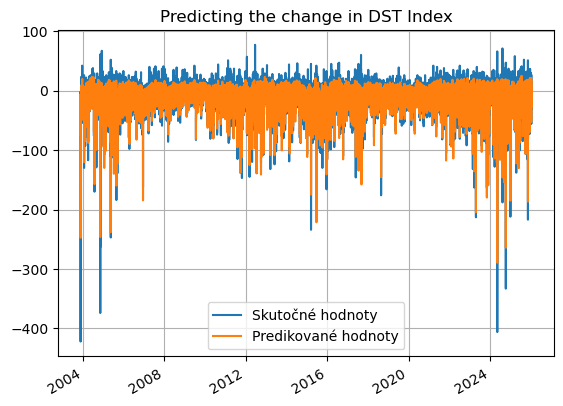

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9015078171668692
MCC=0.6947434013113503
Výkon NN:
MAE: 5.7743, MSE: 80.5930
Perzistentný model:
MAE: 6.6837, MSE: 114.0205
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.61%
MSE Improvement: 29.32%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step 

572/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step 

429/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 12:35 844ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step  

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step 

574/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step 

440/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.49706355
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.76**2 * RBF(length_scale=0.363) + WhiteKernel(noise_level=0.598)


Global sigma (LSTM errors): 10.937347
Hybrid prediction with smoothed, inflated interval ready.


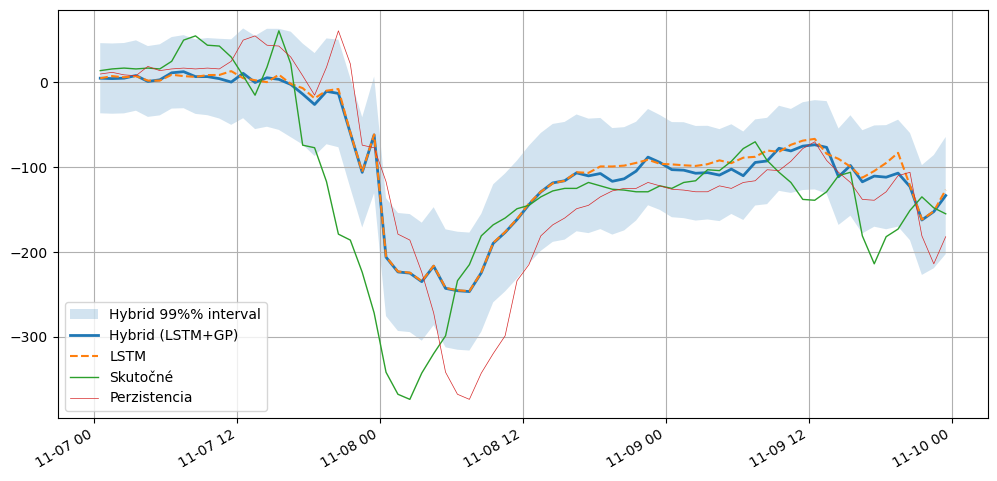

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 89.5008
MAE: 6.1883

--- Klasifikačné metriky (Prah: -21.1 nT) ---
Matthews Correlation Coefficient (MCC): 0.6704

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145250 |        6798
Skutočná 1 |       13899 |       28232

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.91      0.96      0.93    152048
   Trieda 1 (Búrka)       0.81      0.67      0.73     42131

           accuracy                           0.89    194179
          macro avg       0.86      0.81      0.83    194179
       weighted avg       0.89      0.89      0.89    194179



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9015032521539404
MCC=0.6947400253282678
Výkon NN:
MAE: 5.7743, MSE: 80.5930
Perzistentný model:
MAE: 6.6837, MSE: 114.0205
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.61%
MSE Improvement: 29.32%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9154    0.9632    0.9387    152048
           1     0.8365    0.6787    0.7494     42131

    accuracy                         0.9015    194179
   macro avg     0.8759    0.8210    0.8440    194179
weighted avg     0.8983    0.9015    0.8976    194179


===== LSTM+GP =====
ACC=0.8934127789307804
MCC=0.6703795025931888
Výkon NN:
MAE: 6.1883, MSE: 89.5008
Perzistentný model:
MAE: 6.6837, MSE: 114.0205
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.41%
MSE Improvement: 21.50%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9127    0.9553    0.9335    152048
           1     0.8059    0.6701    0.7318     42131


/tmp/ipykernel_955749/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_955749/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
48,2026-04-27T12:26:40,LSTM,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.3,0.911186,0.726816,"{""text"": "" precision recall f...",5.230730,66.259504,6.073117,92.326875,13.870755,28.233785
49,2026-04-27T12:26:40,LSTM+GP,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.3,0.907601,0.718358,"{""text"": "" precision recall f...",5.477889,71.532752,6.073117,92.326875,9.801029,22.522287
50,2026-04-27T13:00:19,LSTM,6.0,4.0,DST+4,OMNI2_all,-20.0,-21.0,0.907167,0.716026,"{""text"": "" precision recall f...",5.450453,68.512276,6.073218,92.327612,10.254291,25.794381
51,2026-04-27T13:00:19,LSTM+GP,6.0,4.0,DST+4,OMNI2_all,-20.0,-21.0,0.902110,0.698347,"{""text"": "" precision recall f...",5.699537,75.820163,6.073218,92.327612,6.152931,17.879211
52,2026-04-27T13:06:50,LSTM,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.3,0.911186,0.726816,"{""text"": "" precision recall f...",5.230730,66.259504,6.073117,92.326875,13.870755,28.233785
53,2026-04-27T13:06:50,LSTM+GP,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.3,0.907601,0.718358,"{""text"": "" precision recall f...",5.477889,71.532752,6.073117,92.326875,9.801029,22.522287
54,2026-04-27T14:02:33,LSTM,12.0,5.0,DST+5,OMNI2_all,-20.0,-21.1,0.901503,0.694740,"{""text"": "" precision recall f...",5.774317,80.593027,6.683663,114.020481,13.605503,29.317061
55,2026-04-27T14:02:33,LSTM+GP,12.0,5.0,DST+5,OMNI2_all,-20.0,-21.1,0.893413,0.670380,"{""text"": "" precision recall f...",6.188298,89.500806,6.683663,114.020481,7.411585,21.504623
56,2026-04-27T14:05:50,LSTM,12.0,5.0,DST+5,OMNI2_all,-20.0,-21.1,0.901503,0.694740,"{""text"": "" precision recall f...",5.774317,80.593027,6.683663,114.020481,13.605503,29.317061
57,2026-04-27T14:05:51,LSTM+GP,12.0,5.0,DST+5,OMNI2_all,-20.0,-21.1,0.893413,0.670380,"{""text"": "" precision recall f...",6.188298,89.500806,6.683663,114.020481,7.411585,21.504623
